## Imports

In [16]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, balanced_accuracy_score
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
import seaborn as sns
import matplotlib.pyplot as plt

## Divisão dos dados em X e Y

Label Encoder do y & Normalização do X

In [28]:
dataset_path = 'feature_extraction.csv' 
data = pd.read_csv(dataset_path)

X = data.drop(columns=['file_id', 'class', 'fold']) 
y = data['class'] 

#One Hot Encoder de y
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

#Normalização de X
scaler = MinMaxScaler() 
X = scaler.fit_transform(X)

print(pd.DataFrame(X).head())
print(np.unique(y))

         0         1         2         3         4         5         6   \
0  0.683183  0.017093  0.621973  0.469777  0.383277  0.638431  0.505458   
1  0.718800  0.105597  0.460109  0.637143  0.377176  0.563590  0.472180   
2  0.728638  0.092748  0.416206  0.685898  0.283718  0.519607  0.469577   
3  0.478898  0.036833  0.516766  0.653926  0.260736  0.470929  0.489646   
4  0.496398  0.700244  0.422515  0.824047  0.313228  0.513074  0.495865   

         7         8         9   ...        13        14        15        16  \
0  0.035471  0.092136  0.036746  ...  0.077481  0.165125  0.026641  0.279333   
1  0.138060  0.186574  0.273884  ...  0.395330  0.385121  0.297618  0.668237   
2  0.104300  0.098335  0.046947  ...  0.325160  0.241995  0.111223  0.464770   
3  0.139243  0.087479  0.104135  ...  0.125955  0.218403  0.084630  0.418222   
4  0.135814  0.168407  0.233478  ...  0.402947  0.331131  0.254352  0.459972   

         17        18        19        20        21   22  
0  0.0266

## Número de camadas escondidas

Duas camadas escondidas já são capazes de representar qualquer relação entre os dados, mesmo aquelas que não podem ser representadas por equações. Mais do que duas camadas escondidas só são necessárias em problemas ainda mais complexos como séries temporais e visão computacional, onde há uma certa inter-relação entre as dimensões que os dados contêm

In [18]:
n_camadas = [2, 3]
print ("Range do nº de camadas: ", n_camadas)

Range do nº de camadas:  [2, 3]


## Número de neurónios em cada camada escondida

Abordagens:  
O número de neurônios escondidos deve estar entre o tamanho da camada de entrada e o da camada de saída.  
O número de neurônios escondidos deve ser 2/3 do tamanho da camada de entrada, mais o tamanho da camada de saída

In [19]:
n_neur = [0] * 3
input_dim = X.shape[1]
output_dim = len(label_encoder.classes_)
#Neurónios na camada escondida 1
n_neur [0] = int((input_dim + output_dim)/2)
#Neurónios na camada escondida 2
n_neur [1] = int((input_dim + output_dim)/3)
#Neurónios na camada escondida 3
n_neur [2] = int((input_dim + output_dim)/4)
print ("Número de neurónios escondidos: ", n_neur)

Número de neurónios escondidos:  [16, 11, 8]


## Inicialização dos pesos

Função para inicializar os pesos com uma função gaussiana

In [20]:
def initialize_weights(shape, dtype=None):
    mean = 0.0
    stddev = 0.01
    return tf.constant(np.random.normal(loc=mean, scale=stddev, size=shape), dtype=dtype)

## Ajuste do Learning Rate ao longo da aprendizagem

Ajustar o Learning Rate para metade do seu valor de 10 em 10 epochs

In [24]:
def scheduler(epoch, lr): 
    if epoch > 0 and epoch % 10 == 0: 
        return lr / 2 
    return lr
lr_scheduler = LearningRateScheduler(scheduler)

## Early Stop

Verificar se a validation loss (no fold de desenvolvimento) não melhora em 10 epochs consecutivos, e para o treino caso isso aconteça

In [25]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# MultiLayer Perceptron

## Grid Search para MLP com 2 camadas escondidas e funções de ativação ReLU

In [143]:
learning_rate = [0.1, 0.01, 0.001]
epochs = [50, 100, 200]
batch_size = [16, 32, 64, 128]
best_model = None
best_accuracy = None
best_model_cf = None
best_model_loss = None
best_model_std = None
best_model_lr = None
best_model_n_epochs = None
best_model_batch_size = None

for i in learning_rate:
    for j in epochs:
        for m in batch_size:
            adam_optimizer = tf.keras.optimizers.Adam(learning_rate=i)
            # Definir o modelo
            model = tf.keras.models.Sequential([ 
                tf.keras.layers.Input(shape=(X_train.shape[1],)), 
                tf.keras.layers.Dense(n_neur[0], kernel_initializer=initialize_weights, activation='relu'), 
                tf.keras.layers.Dense(n_neur[1], kernel_initializer=initialize_weights, activation='relu'), 
                tf.keras.layers.Dense(output_dim, activation='softmax', kernel_initializer=initialize_weights) 
            ])
            
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            folds = list(kf.split(X))
            all_accuracies = []
            all_confusion_matrices = []
            all_losses = []
            # Cross-validation com cada fold usado uma vez para teste, uma vez para desenvolvimento e 8 vezes para treino
            for fold_idx in range(len(folds)):
                # Selecionar fold para teste
                train_val_indices, test_indices = folds[fold_idx]

                # Selecionar fold para desenvolvimento
                dev_fold_idx = (fold_idx + 1) % len(folds)
                train_indices, dev_indices = folds[dev_fold_idx]

                # Treinamento e Desenvolvimento
                X_train, y_train = X[train_val_indices], y[train_val_indices]
                X_dev, y_dev = X[dev_indices], y[dev_indices]

                # Teste
                X_test, y_test = X[test_indices], y[test_indices]

                # Compilar o modelo
                model.compile(optimizer=adam_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

                model.summary()

                model.fit(X_train, y_train, epochs=j, batch_size=m, validation_data=(X_dev, y_dev), callbacks=[lr_scheduler, early_stopping])

                # Avaliar o modelo
                loss, accuracy = model.evaluate(X_test, y_test)

                all_accuracies.append(accuracy) 
                y_pred = model.predict(X_test) 
                y_pred_classes = np.argmax(y_pred, axis=1) 
                cm = confusion_matrix(y_test, y_pred_classes) 
                all_confusion_matrices.append(cm)
                all_losses.append(loss)

            accumulated_cm = np.sum(all_confusion_matrices, axis=0) 
            accumulated_cm_percentage = accumulated_cm / np.sum(accumulated_cm) * 100
            mean_accuracy = np.mean(all_accuracies) 
            std_accuracy = np.std(all_accuracies)
            mean_loss = np.mean(all_losses)
            print("Accuracy: ", mean_accuracy)
            print("Confusion Matrix: ", accumulated_cm_percentage)
            print("Loss: ", mean_loss)
            print("Standard Deviation: ", std_accuracy)
            
            if best_model == None or mean_accuracy > best_accuracy:
                best_model = model
                best_accuracy = mean_accuracy
                best_model_cf = accumulated_cm_percentage
                best_model_loss = mean_loss
                best_model_std = std_accuracy
                best_model_lr = i
                best_model_n_epochs = j
                best_model_batch_size = m           

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1118 - loss: 2.2824 - val_accuracy: 0.1098 - val_loss: 2.2771 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.1190 - loss: 2.2711 - val_accuracy: 0.1098 - val_loss: 2.2756 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1053 - loss: 2.2826 - val_accuracy: 0.1224 - val_loss: 2.2702 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1133 - loss: 2.2806 - val_accuracy: 0.1224 - val_loss: 2.2847 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1081 - loss: 2.2791 - val_accuracy: 0.1224 - val_loss: 2.2847 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1143 - loss: 2.2780 - val_accuracy: 0.1247 - val_loss: 2.2825 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - accuracy: 0.0964 - loss: 2.283

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1127 - loss: 2.2776 - val_accuracy: 0.1306 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1095 - loss: 2.2818 - val_accuracy: 0.1042 - val_loss: 2.2924 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1074 - loss: 2.2749 - val_accuracy: 0.0974 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1093 - loss: 2.2742 - val_accuracy: 0.1180 - val_loss: 2.2593 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1104 - loss: 2.2790 - val_accuracy: 0.0974 - val_loss: 2.2840 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1083 - loss: 2.2850 - val_accuracy: 0.0974 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1108 - loss: 2.2836 - 

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1213 - loss: 2.2808 - val_accuracy: 0.1180 - val_loss: 2.2638 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1076 - loss: 2.2765 - val_accuracy: 0.1111 - val_loss: 2.2673 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.1115 - loss: 2.2758 - val_accuracy: 0.1180 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - accuracy: 0.1137 - loss: 2.2751 - val_accuracy: 0.1226 - val_loss: 2.2701 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.1169 - loss: 2.2791 - val_accuracy: 0.1157 - val_loss: 2.2640 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - accuracy: 0.1065 - loss: 2.2767 - val_accuracy: 0.1180 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1121 - loss: 2

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1081 - loss: 2.2780 - val_accuracy: 0.1077 - val_loss: 2.2858 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1179 - loss: 2.2753 - val_accuracy: 0.1168 - val_loss: 2.2767 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1155 - loss: 2.2826 - val_accuracy: 0.1077 - val_loss: 2.2866 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1051 - loss: 2.2807 - val_accuracy: 0.1168 - val_loss: 2.2753 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1076 - loss: 2.2784 - val_accuracy: 0.0997 - val_loss: 2.2785 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1008 - loss: 2.2804 - val_accuracy: 0.1214 - val_loss: 2.2831 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1132 - loss: 2.2750 - 

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1076 - loss: 2.2748 - val_accuracy: 0.1111 - val_loss: 2.2947 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.1059 - loss: 2.2799 - val_accuracy: 0.1008 - val_loss: 2.2830 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.1155 - loss: 2.2766 - val_accuracy: 0.1111 - val_loss: 2.2626 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1150 - loss: 2.2732 - val_accuracy: 0.1111 - val_loss: 2.2952 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.1147 - loss: 2.2803 - val_accuracy: 0.1168 - val_loss: 2.2919 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.1141 - loss: 2.2804 - val_accuracy: 0.1111 - val_loss: 2.2787 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1099 - loss: 2

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1143 - loss: 2.2797 - val_accuracy: 0.1134 - val_loss: 2.2770 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1186 - loss: 2.2765 - val_accuracy: 0.1134 - val_loss: 2.2825 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1152 - loss: 2.2818 - val_accuracy: 0.1134 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - accuracy: 0.1126 - loss: 2.2758 - val_accuracy: 0.1134 - val_loss: 2.2747 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.1224 - loss: 2.2762 - val_accuracy: 0.1054 - val_loss: 2.2749 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1068 - loss: 2.2778 - val_accuracy: 0.1134 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.1129 - loss: 2.2

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1078 - loss: 2.2784 - val_accuracy: 0.1077 - val_loss: 2.2886 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.1112 - loss: 2.2845 - val_accuracy: 0.1226 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1081 - loss: 2.2795 - val_accuracy: 0.1168 - val_loss: 2.2828 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1127 - loss: 2.2714 - val_accuracy: 0.1077 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - accuracy: 0.1068 - loss: 2.2699 - val_accuracy: 0.1226 - val_loss: 2.2695 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1067 - loss: 2.2810 - val_accuracy: 0.1088 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - accuracy: 0.1119 - loss: 2.2

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1116 - loss: 2.2737 - val_accuracy: 0.1168 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.1091 - loss: 2.2756 - val_accuracy: 0.1134 - val_loss: 2.2776 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1138 - loss: 2.2728 - val_accuracy: 0.1088 - val_loss: 2.2680 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - accuracy: 0.1115 - loss: 2.2692 - val_accuracy: 0.1271 - val_loss: 2.2835 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.1158 - loss: 2.2785 - val_accuracy: 0.1134 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.1181 - loss: 2.2767 - val_accuracy: 0.1088 - val_loss: 2.2883 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1026 - loss: 2

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1255 - loss: 2.2736 - val_accuracy: 0.1317 - val_loss: 2.2782 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.1211 - loss: 2.2769 - val_accuracy: 0.1031 - val_loss: 2.2903 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1180 - loss: 2.2729 - val_accuracy: 0.1317 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1088 - loss: 2.2804 - val_accuracy: 0.1317 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1128 - loss: 2.2781 - val_accuracy: 0.1065 - val_loss: 2.2818 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1163 - loss: 2.2822 - val_accuracy: 0.1134 - val_loss: 2.3106 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - accuracy: 0.1131 - loss: 2.283

Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_996 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1144 - loss: 2.2798 - val_accuracy: 0.1041 - val_loss: 2.2775 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1169 - loss: 2.2741 - val_accuracy: 0.1156 - val_loss: 2.2665 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1132 - loss: 2.2817 - val_accuracy: 0.1041 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.1148 - loss: 2.2783 - val_accuracy: 0.1053 - val_loss: 2.2689 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.1205 - loss: 2.2734 - val_accuracy: 0.1133 - val_loss: 2.2804 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1087 - loss: 2.2751 - val_accuracy: 0.1156 - val_loss: 2.3059 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1107 - loss: 2.278

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1145 - loss: 2.2675 - val_accuracy: 0.1247 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.1087 - loss: 2.2696 - val_accuracy: 0.1030 - val_loss: 2.2690 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.1122 - loss: 2.2710 - val_accuracy: 0.1053 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.1155 - loss: 2.2773 - val_accuracy: 0.1098 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.1093 - loss: 2.2728 - val_accuracy: 0.1053 - val_loss: 2.2707 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.1217 - loss: 2.2713 - val_accuracy: 0.1098 - val_loss: 2.2751 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.1100 - los

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1153 - loss: 2.2718 - val_accuracy: 0.1271 - val_loss: 2.2616 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1076 - loss: 2.2703 - val_accuracy: 0.1180 - val_loss: 2.2541 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - accuracy: 0.1080 - loss: 2.2667 - val_accuracy: 0.1168 - val_loss: 2.2542 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1202 - loss: 2.2733 - val_accuracy: 0.1271 - val_loss: 2.2617 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1149 - loss: 2.2695 - val_accuracy: 0.1042 - val_loss: 2.2609 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1118 - loss: 2.2652 - val_accuracy: 0.1271 - val_loss: 2.2462 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.1178 - loss: 2.270

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1087 - loss: 2.2722 - val_accuracy: 0.1065 - val_loss: 2.2538 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1124 - loss: 2.2751 - val_accuracy: 0.1180 - val_loss: 2.2528 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1195 - loss: 2.2715 - val_accuracy: 0.1111 - val_loss: 2.2688 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.1173 - loss: 2.2688 - val_accuracy: 0.0939 - val_loss: 2.2619 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - accuracy: 0.1112 - loss: 2.2748 - val_accuracy: 0.1111 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.1188 - loss: 2.2710 - val_accuracy: 0.1065 - val_loss: 2.2711 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.1110 - loss: 2

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1207 - loss: 2.2648 - val_accuracy: 0.1168 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.1133 - loss: 2.2718 - val_accuracy: 0.1077 - val_loss: 2.2796 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1160 - loss: 2.2759 - val_accuracy: 0.1042 - val_loss: 2.3041 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1044 - loss: 2.2773 - val_accuracy: 0.1100 - val_loss: 2.2727 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1118 - loss: 2.2690 - val_accuracy: 0.1214 - val_loss: 2.2796 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.1206 - loss: 2.2654 - val_accuracy: 0.1100 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1133 - loss: 2.275

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1074 - loss: 2.2705 - val_accuracy: 0.1008 - val_loss: 2.2718 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1049 - loss: 2.2725 - val_accuracy: 0.1111 - val_loss: 2.2768 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.1119 - loss: 2.2715 - val_accuracy: 0.1203 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2666 - val_accuracy: 0.1111 - val_loss: 2.2805 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1059 - loss: 2.2745 - val_accuracy: 0.1111 - val_loss: 2.2769 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1198 - loss: 2.2647 - val_accuracy: 0.1203 - val_loss: 2.2757 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1019 - loss: 2.2678 

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1109 - loss: 2.2713 - val_accuracy: 0.1363 - val_loss: 2.2703 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1094 - loss: 2.2693 - val_accuracy: 0.1134 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1190 - loss: 2.2735 - val_accuracy: 0.1134 - val_loss: 2.2833 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1206 - loss: 2.2681 - val_accuracy: 0.1054 - val_loss: 2.2730 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1203 - loss: 2.2717 - val_accuracy: 0.1111 - val_loss: 2.2757 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1007 - loss: 2.2669 - val_accuracy: 0.1134 - val_loss: 2.2688 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1192 - loss: 2.2731 - 

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1164 - loss: 2.2718 - val_accuracy: 0.1168 - val_loss: 2.2619 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1175 - loss: 2.2730 - val_accuracy: 0.1249 - val_loss: 2.2669 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.1202 - loss: 2.2748 - val_accuracy: 0.1168 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1052 - loss: 2.2674 - val_accuracy: 0.1226 - val_loss: 2.2707 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2686 - val_accuracy: 0.1249 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1102 - loss: 2.2722 - val_accuracy: 0.1191 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1101 - loss: 2.2711 

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1176 - loss: 2.2727 - val_accuracy: 0.1088 - val_loss: 2.2600 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1081 - loss: 2.2789 - val_accuracy: 0.1088 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1103 - loss: 2.2725 - val_accuracy: 0.1271 - val_loss: 2.2602 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1175 - loss: 2.2695 - val_accuracy: 0.1168 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - accuracy: 0.1138 - loss: 2.2737 - val_accuracy: 0.1271 - val_loss: 2.2630 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - accuracy: 0.1157 - loss: 2.2735 - val_accuracy: 0.1271 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1127 - loss: 2.280

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1155 - loss: 2.2750 - val_accuracy: 0.1214 - val_loss: 2.2871 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1063 - loss: 2.2755 - val_accuracy: 0.0985 - val_loss: 2.2700 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.1134 - loss: 2.2743 - val_accuracy: 0.1168 - val_loss: 2.2748 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.1085 - loss: 2.2749 - val_accuracy: 0.1065 - val_loss: 2.2835 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1152 - loss: 2.2735 - val_accuracy: 0.1168 - val_loss: 2.2827 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1110 - loss: 2.2679 - val_accuracy: 0.1317 - val_loss: 2.2699 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.272

Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_999 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1001 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1093 - loss: 2.2736 - val_accuracy: 0.1041 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1052 - loss: 2.2725 - val_accuracy: 0.1236 - val_loss: 2.2653 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1118 - loss: 2.2718 - val_accuracy: 0.1121 - val_loss: 2.2646 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - accuracy: 0.1145 - loss: 2.2665 - val_accuracy: 0.1041 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1079 - loss: 2.2711 - val_accuracy: 0.1236 - val_loss: 2.2744 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1071 - loss: 2.2722 - val_accuracy: 0.1041 - val_loss: 2.2745 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - accuracy: 0.1123 - loss: 2.275

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1137 - loss: 2.2754 - val_accuracy: 0.1053 - val_loss: 2.2684 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.2660 - val_accuracy: 0.1201 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1118 - loss: 2.2665 - val_accuracy: 0.1098 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1037 - loss: 2.2713 - val_accuracy: 0.1098 - val_loss: 2.2752 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1117 - loss: 2.2643 - val_accuracy: 0.1247 - val_loss: 2.2764 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1096 - loss: 2.2658 - val_accuracy: 0.1098 - val_loss: 2.2669 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1053 - loss: 2.2676 - 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1116 - loss: 2.2644 - val_accuracy: 0.1180 - val_loss: 2.2524 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1103 - loss: 2.2653 - val_accuracy: 0.1168 - val_loss: 2.2559 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1114 - loss: 2.2662 - val_accuracy: 0.1168 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.1046 - loss: 2.2705 - val_accuracy: 0.1180 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1121 - loss: 2.2725 - val_accuracy: 0.1180 - val_loss: 2.2653 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1127 - loss: 2.2679 - val_accuracy: 0.1260 - val_loss: 2.2550 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1106 - loss: 2.2671 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1060 - loss: 2.2704 - val_accuracy: 0.0939 - val_loss: 2.2615 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1134 - loss: 2.2683 - val_accuracy: 0.1065 - val_loss: 2.2624 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1076 - loss: 2.2714 - val_accuracy: 0.1180 - val_loss: 2.2652 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1166 - loss: 2.2721 - val_accuracy: 0.0939 - val_loss: 2.2629 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.1129 - loss: 2.2685 - val_accuracy: 0.1111 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1182 - loss: 2.2664 - val_accuracy: 0.0939 - val_loss: 2.2606 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.1136 - loss: 2.270

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1053 - loss: 2.2728 - val_accuracy: 0.1100 - val_loss: 2.2780 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1172 - loss: 2.2669 - val_accuracy: 0.1168 - val_loss: 2.2835 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.2647 - val_accuracy: 0.1168 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1136 - loss: 2.2646 - val_accuracy: 0.1260 - val_loss: 2.2760 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1090 - loss: 2.2677 - val_accuracy: 0.1214 - val_loss: 2.2746 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1163 - loss: 2.2651 - val_accuracy: 0.1100 - val_loss: 2.2748 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1082 - loss: 2.2646 - 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1137 - loss: 2.2714 - val_accuracy: 0.1111 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1125 - loss: 2.2602 - val_accuracy: 0.1111 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1168 - loss: 2.2648 - val_accuracy: 0.1157 - val_loss: 2.2751 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1119 - loss: 2.2685 - val_accuracy: 0.1111 - val_loss: 2.2651 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1106 - loss: 2.2657 - val_accuracy: 0.1180 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1118 - loss: 2.2649 - val_accuracy: 0.1111 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.1094 - loss: 2.2684 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1198 - loss: 2.2692 - val_accuracy: 0.1134 - val_loss: 2.2704 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2667 - val_accuracy: 0.1134 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1161 - loss: 2.2639 - val_accuracy: 0.1123 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1175 - loss: 2.2725 - val_accuracy: 0.1134 - val_loss: 2.2690 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1134 - loss: 2.2670 - val_accuracy: 0.1134 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1075 - loss: 2.2624 - val_accuracy: 0.1111 - val_loss: 2.2768 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1095 - loss: 2.2701 - 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1134 - loss: 2.2678 - val_accuracy: 0.1168 - val_loss: 2.2690 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2607 - val_accuracy: 0.1088 - val_loss: 2.2614 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - accuracy: 0.1073 - loss: 2.2756 - val_accuracy: 0.0997 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1096 - loss: 2.2662 - val_accuracy: 0.1168 - val_loss: 2.2610 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2647 - val_accuracy: 0.1191 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1171 - loss: 2.2683 - val_accuracy: 0.1168 - val_loss: 2.2552 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1161 - loss: 2.2628 

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1025 - loss: 2.2674 - val_accuracy: 0.0939 - val_loss: 2.2697 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1029 - loss: 2.2663 - val_accuracy: 0.1168 - val_loss: 2.2577 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1232 - loss: 2.2704 - val_accuracy: 0.0939 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1129 - loss: 2.2740 - val_accuracy: 0.1134 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.1088 - loss: 2.2708 - val_accuracy: 0.1168 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1089 - loss: 2.2680 - val_accuracy: 0.1088 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.1096 - loss: 2.272

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1142 - loss: 2.2679 - val_accuracy: 0.1065 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2666 - val_accuracy: 0.1031 - val_loss: 2.2739 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.1082 - loss: 2.2643 - val_accuracy: 0.1065 - val_loss: 2.2780 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.1206 - loss: 2.2684 - val_accuracy: 0.1317 - val_loss: 2.2662 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.1128 - loss: 2.2731 - val_accuracy: 0.1065 - val_loss: 2.2802 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1109 - loss: 2.2794 - val_accuracy: 0.1123 - val_loss: 2.2759 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - accuracy: 0.1021 - loss: 2

Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1002 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1164 - loss: 2.2679 - val_accuracy: 0.1259 - val_loss: 2.2607 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1182 - loss: 2.2682 - val_accuracy: 0.1121 - val_loss: 2.2711 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1090 - loss: 2.2690 - val_accuracy: 0.1156 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1137 - loss: 2.2678 - val_accuracy: 0.1259 - val_loss: 2.2681 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1094 - loss: 2.2708 - val_accuracy: 0.1041 - val_loss: 2.2659 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.1124 - loss: 2.2631 - val_accuracy: 0.1236 - val_loss: 2.2695 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.1082 - loss: 2.266

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1652 - loss: 2.1396 - val_accuracy: 0.3078 - val_loss: 1.7771 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3308 - loss: 1.6962 - val_accuracy: 0.3867 - val_loss: 1.5504 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3950 - loss: 1.5539 - val_accuracy: 0.4062 - val_loss: 1.5105 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4219 - loss: 1.4771 - val_accuracy: 0.4211 - val_loss: 1.4501 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4053 - loss: 1.4829 - val_accuracy: 0.4451 - val_loss: 1.4483 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4256 - loss: 1.4679 - val_accuracy: 0.4405 - val_loss: 1.4077 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4361 - loss: 1.4378 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4297 - loss: 1.4461 - val_accuracy: 0.4261 - val_loss: 1.4249 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4179 - loss: 1.4489 - val_accuracy: 0.4605 - val_loss: 1.4043 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4442 - loss: 1.4266 - val_accuracy: 0.4376 - val_loss: 1.4095 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4295 - loss: 1.4304 - val_accuracy: 0.4696 - val_loss: 1.3805 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4656 - loss: 1.3754 - val_accuracy: 0.4124 - val_loss: 1.4459 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4423 - loss: 1.4269 - val_accuracy: 0.4192 - val_loss: 1.4334 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4294 - loss: 1.4275 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4389 - loss: 1.3983 - val_accuracy: 0.4754 - val_loss: 1.3996 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4409 - loss: 1.4157 - val_accuracy: 0.4525 - val_loss: 1.4296 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4546 - loss: 1.3872 - val_accuracy: 0.4628 - val_loss: 1.3906 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4603 - loss: 1.3797 - val_accuracy: 0.4318 - val_loss: 1.4337 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4347 - loss: 1.4237 - val_accuracy: 0.4399 - val_loss: 1.4363 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4531 - loss: 1.3854 - val_accuracy: 0.4651 - val_loss: 1.4222 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4580 - loss: 1.3705 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4538 - loss: 1.3792 - val_accuracy: 0.4467 - val_loss: 1.4167 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4384 - loss: 1.4247 - val_accuracy: 0.4777 - val_loss: 1.3652 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4642 - loss: 1.3599 - val_accuracy: 0.4765 - val_loss: 1.3216 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4608 - loss: 1.3791 - val_accuracy: 0.4605 - val_loss: 1.3701 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4479 - loss: 1.4192 - val_accuracy: 0.4605 - val_loss: 1.3746 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4626 - loss: 1.3692 - val_accuracy: 0.4639 - val_loss: 1.3522 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4670 - loss: 1.3711 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4459 - loss: 1.3851 - val_accuracy: 0.4238 - val_loss: 1.3786 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4601 - loss: 1.3778 - val_accuracy: 0.4548 - val_loss: 1.4095 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4452 - loss: 1.4239 - val_accuracy: 0.4868 - val_loss: 1.4369 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4412 - loss: 1.4513 - val_accuracy: 0.4559 - val_loss: 1.3847 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4550 - loss: 1.3955 - val_accuracy: 0.4273 - val_loss: 1.4075 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4565 - loss: 1.3819 - val_accuracy: 0.4674 - val_loss: 1.3832 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4616 - loss: 1.3952 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4625 - loss: 1.3951 - val_accuracy: 0.4536 - val_loss: 1.4455 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4542 - loss: 1.4053 - val_accuracy: 0.4525 - val_loss: 1.4198 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4674 - loss: 1.3768 - val_accuracy: 0.4387 - val_loss: 1.4724 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4528 - loss: 1.3892 - val_accuracy: 0.4800 - val_loss: 1.3794 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4633 - loss: 1.3588 - val_accuracy: 0.4719 - val_loss: 1.3959 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4503 - loss: 1.3997 - val_accuracy: 0.4250 - val_loss: 1.4812 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4676 - loss: 1.3915 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4521 - loss: 1.3911 - val_accuracy: 0.4765 - val_loss: 1.3301 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4622 - loss: 1.3734 - val_accuracy: 0.4788 - val_loss: 1.3374 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4571 - loss: 1.3818 - val_accuracy: 0.4788 - val_loss: 1.3420 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4628 - loss: 1.3869 - val_accuracy: 0.4582 - val_loss: 1.3552 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4539 - loss: 1.3808 - val_accuracy: 0.4719 - val_loss: 1.3358 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4830 - loss: 1.3465 - val_accuracy: 0.4548 - val_loss: 1.3938 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4504 - loss: 1.3821 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4394 - loss: 1.3900 - val_accuracy: 0.4330 - val_loss: 1.4682 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4661 - loss: 1.3911 - val_accuracy: 0.4479 - val_loss: 1.3745 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4647 - loss: 1.3795 - val_accuracy: 0.4937 - val_loss: 1.3451 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4525 - loss: 1.4104 - val_accuracy: 0.4296 - val_loss: 1.4115 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4474 - loss: 1.4071 - val_accuracy: 0.4777 - val_loss: 1.3770 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4505 - loss: 1.4223 - val_accuracy: 0.4651 - val_loss: 1.3853 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4602 - loss: 1.4158 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4620 - loss: 1.3808 - val_accuracy: 0.4548 - val_loss: 1.4071 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4570 - loss: 1.3861 - val_accuracy: 0.4559 - val_loss: 1.3754 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4632 - loss: 1.3614 - val_accuracy: 0.4513 - val_loss: 1.4260 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4661 - loss: 1.3744 - val_accuracy: 0.4307 - val_loss: 1.4500 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4438 - loss: 1.4013 - val_accuracy: 0.4845 - val_loss: 1.3610 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4638 - loss: 1.3690 - val_accuracy: 0.4570 - val_loss: 1.3376 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4636 - loss: 1.3752 - val_accuracy: 

Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1005 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4618 - loss: 1.3742 - val_accuracy: 0.4531 - val_loss: 1.3987 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4605 - loss: 1.3873 - val_accuracy: 0.4828 - val_loss: 1.3780 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4664 - loss: 1.3902 - val_accuracy: 0.4748 - val_loss: 1.3706 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4711 - loss: 1.3626 - val_accuracy: 0.4874 - val_loss: 1.3758 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4615 - loss: 1.3865 - val_accuracy: 0.4794 - val_loss: 1.3652 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4800 - loss: 1.3542 - val_accuracy: 0.4931 - val_loss: 1.3593 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4747 - loss: 1.3566 - val_accuracy: 

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1094 - loss: 2.2777 - val_accuracy: 0.1098 - val_loss: 2.2777 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.1097 - loss: 2.2790 - val_accuracy: 0.1076 - val_loss: 2.2801 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - accuracy: 0.1080 - loss: 2.2844 - val_accuracy: 0.1098 - val_loss: 2.2958 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - accuracy: 0.1154 - loss: 2.2748 - val_accuracy: 0.1201 - val_loss: 2.2700 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - accuracy: 0.1128 - loss: 2.2704 - val_accuracy: 0.1076 - val_loss: 2.2735 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - accuracy: 0.1099 - loss: 2.2816 - val_accuracy: 0.1053 - val_loss: 2.2859 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.115

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1097 - loss: 2.2804 - val_accuracy: 0.1271 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - accuracy: 0.1056 - loss: 2.2751 - val_accuracy: 0.1260 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - accuracy: 0.1093 - loss: 2.2763 - val_accuracy: 0.0974 - val_loss: 2.2921 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - accuracy: 0.1141 - loss: 2.2757 - val_accuracy: 0.1260 - val_loss: 2.2637 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.1118 - loss: 2.2817 - val_accuracy: 0.1260 - val_loss: 2.2486 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1176 - loss: 2.2782 - val_accuracy: 0.0974 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - accuracy: 0.1139 

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - accuracy: 0.1188 - loss: 2.2783 - val_accuracy: 0.1283 - val_loss: 2.2645 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.1086 - loss: 2.2768 - val_accuracy: 0.1157 - val_loss: 2.2682 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - accuracy: 0.1133 - loss: 2.2818 - val_accuracy: 0.1226 - val_loss: 2.2824 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - accuracy: 0.1060 - loss: 2.2789 - val_accuracy: 0.1157 - val_loss: 2.2876 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.1116 - loss: 2.2853 - val_accuracy: 0.1180 - val_loss: 2.2634 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - accuracy: 0.1126 - loss: 2.2765 - val_accuracy: 0.1180 - val_loss: 2.2569 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - accuracy: 0.1

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1130 - loss: 2.2787 - val_accuracy: 0.1042 - val_loss: 2.2850 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - accuracy: 0.1117 - loss: 2.2778 - val_accuracy: 0.1214 - val_loss: 2.2898 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.1135 - loss: 2.2772 - val_accuracy: 0.0997 - val_loss: 2.2829 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.1166 - loss: 2.2746 - val_accuracy: 0.1042 - val_loss: 2.2805 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.1221 - loss: 2.2754 - val_accuracy: 0.0997 - val_loss: 2.2972 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.1219 - loss: 2.2793 - val_accuracy: 0.0997 - val_loss: 2.2972 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - accuracy: 0.116

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1177 - loss: 2.2742 - val_accuracy: 0.1111 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - accuracy: 0.1074 - loss: 2.2739 - val_accuracy: 0.1111 - val_loss: 2.2787 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - accuracy: 0.1135 - loss: 2.2744 - val_accuracy: 0.1157 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - accuracy: 0.1220 - loss: 2.2765 - val_accuracy: 0.1111 - val_loss: 2.2839 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.1116 - loss: 2.2799 - val_accuracy: 0.1008 - val_loss: 2.2955 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.1205 - loss: 2.2747 - val_accuracy: 0.1180 - val_loss: 2.2919 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - accuracy: 0.118

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1176 - loss: 2.2729 - val_accuracy: 0.1363 - val_loss: 2.2697 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.1124 - loss: 2.2765 - val_accuracy: 0.1054 - val_loss: 2.2820 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1157 - loss: 2.2712 - val_accuracy: 0.1134 - val_loss: 2.2960 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.1137 - loss: 2.2832 - val_accuracy: 0.1134 - val_loss: 2.2919 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - accuracy: 0.1117 - loss: 2.2811 - val_accuracy: 0.1054 - val_loss: 2.2826 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - accuracy: 0.1177 - loss: 2.2792 - val_accuracy: 0.0974 - val_loss: 2.2795 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.1137 

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1079 - loss: 2.2755 - val_accuracy: 0.0997 - val_loss: 2.2742 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.1084 - loss: 2.2759 - val_accuracy: 0.0997 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.1137 - loss: 2.2755 - val_accuracy: 0.1249 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - accuracy: 0.1094 - loss: 2.2750 - val_accuracy: 0.1168 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - accuracy: 0.1105 - loss: 2.2766 - val_accuracy: 0.1191 - val_loss: 2.2803 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - accuracy: 0.1168 - loss: 2.2704 - val_accuracy: 0.1168 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - accuracy: 0.110

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1174 - loss: 2.2784 - val_accuracy: 0.0939 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - accuracy: 0.1154 - loss: 2.2765 - val_accuracy: 0.1203 - val_loss: 2.2756 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - accuracy: 0.1109 - loss: 2.2786 - val_accuracy: 0.1271 - val_loss: 2.2589 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - accuracy: 0.1118 - loss: 2.2792 - val_accuracy: 0.1088 - val_loss: 2.2728 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.1215 - loss: 2.2721 - val_accuracy: 0.1271 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - accuracy: 0.1075 - loss: 2.2851 - val_accuracy: 0.1271 - val_loss: 2.2606 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - accuracy: 0.110

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.1082 - loss: 2.2773 - val_accuracy: 0.1031 - val_loss: 2.2855 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.1086 - loss: 2.2776 - val_accuracy: 0.1065 - val_loss: 2.2751 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.1134 - loss: 2.2788 - val_accuracy: 0.1031 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - accuracy: 0.1136 - loss: 2.2750 - val_accuracy: 0.1123 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.1146 - loss: 2.2763 - val_accuracy: 0.1214 - val_loss: 2.2809 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - accuracy: 0.1196 - loss: 2.2767 - val_accuracy: 0.1317 - val_loss: 2.2936 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - accuracy: 0.1

Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1140 - loss: 2.2820 - val_accuracy: 0.1156 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - accuracy: 0.1145 - loss: 2.2761 - val_accuracy: 0.1053 - val_loss: 2.2834 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.1072 - loss: 2.2822 - val_accuracy: 0.1236 - val_loss: 2.2658 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - accuracy: 0.1121 - loss: 2.2831 - val_accuracy: 0.1236 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - accuracy: 0.1126 - loss: 2.2756 - val_accuracy: 0.1259 - val_loss: 2.2828 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - accuracy: 0.1168 - loss: 2.2793 - val_accuracy: 0.1259 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - accuracy: 0.112

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1110 - loss: 2.2751 - val_accuracy: 0.1030 - val_loss: 2.2755 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - accuracy: 0.1171 - loss: 2.2702 - val_accuracy: 0.1098 - val_loss: 2.2680 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - accuracy: 0.1090 - loss: 2.2789 - val_accuracy: 0.1030 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.1149 - loss: 2.2728 - val_accuracy: 0.1098 - val_loss: 2.2789 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.1109 - loss: 2.2761 - val_accuracy: 0.1201 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.1195 - loss: 2.2709 - val_accuracy: 0.1224 - val_loss: 2.2876 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.118

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1087 - loss: 2.2726 - val_accuracy: 0.1180 - val_loss: 2.2530 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - accuracy: 0.1206 - loss: 2.2714 - val_accuracy: 0.0974 - val_loss: 2.2806 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1169 - loss: 2.2714 - val_accuracy: 0.1042 - val_loss: 2.2528 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - accuracy: 0.1072 - loss: 2.2674 - val_accuracy: 0.1180 - val_loss: 2.2495 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - accuracy: 0.1132 - loss: 2.2684 - val_accuracy: 0.1271 - val_loss: 2.2772 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1140 - loss: 2.2732 - val_accuracy: 0.1260 - val_loss: 2.2601 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.1080 - 

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1185 - loss: 2.2761 - val_accuracy: 0.1180 - val_loss: 2.2608 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1157 - loss: 2.2737 - val_accuracy: 0.1111 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1134 - loss: 2.2704 - val_accuracy: 0.1180 - val_loss: 2.2607 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.1130 - loss: 2.2665 - val_accuracy: 0.1111 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - accuracy: 0.1191 - loss: 2.2713 - val_accuracy: 0.1065 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - accuracy: 0.1106 - loss: 2.2757 - val_accuracy: 0.1180 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.1117 - 

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1090 - loss: 2.2712 - val_accuracy: 0.1260 - val_loss: 2.2738 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1143 - loss: 2.2695 - val_accuracy: 0.1214 - val_loss: 2.2765 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1114 - loss: 2.2752 - val_accuracy: 0.1260 - val_loss: 2.2775 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.1224 - loss: 2.2648 - val_accuracy: 0.1042 - val_loss: 2.2862 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.1162 - loss: 2.2750 - val_accuracy: 0.1260 - val_loss: 2.2829 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1085 - loss: 2.2798 - val_accuracy: 0.1168 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - accuracy: 0.1076 - lo

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1117 - loss: 2.2778 - val_accuracy: 0.1157 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1208 - loss: 2.2661 - val_accuracy: 0.1180 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1152 - loss: 2.2676 - val_accuracy: 0.1111 - val_loss: 2.2772 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - accuracy: 0.1079 - loss: 2.2724 - val_accuracy: 0.1168 - val_loss: 2.2806 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - accuracy: 0.1085 - loss: 2.2639 - val_accuracy: 0.1180 - val_loss: 2.2740 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - accuracy: 0.1028 - loss: 2.2654 - val_accuracy: 0.1111 - val_loss: 2.2649 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - accuracy: 0.1231 - 

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1165 - loss: 2.2743 - val_accuracy: 0.1111 - val_loss: 2.2761 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - accuracy: 0.1165 - loss: 2.2730 - val_accuracy: 0.1134 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.1079 - loss: 2.2731 - val_accuracy: 0.1134 - val_loss: 2.2775 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - accuracy: 0.1121 - loss: 2.2767 - val_accuracy: 0.1134 - val_loss: 2.2805 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - accuracy: 0.1199 - loss: 2.2727 - val_accuracy: 0.1363 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.1120 - loss: 2.2756 - val_accuracy: 0.1123 - val_loss: 2.2863 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - accuracy: 0.117

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1200 - loss: 2.2726 - val_accuracy: 0.1088 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - accuracy: 0.1230 - loss: 2.2666 - val_accuracy: 0.1249 - val_loss: 2.2645 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.1211 - loss: 2.2696 - val_accuracy: 0.1249 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - accuracy: 0.1241 - loss: 2.2656 - val_accuracy: 0.1249 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.1059 - loss: 2.2746 - val_accuracy: 0.1077 - val_loss: 2.2572 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.1116 - loss: 2.2714 - val_accuracy: 0.1134 - val_loss: 2.2812 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1098 

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1141 - loss: 2.2739 - val_accuracy: 0.1134 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1124 - loss: 2.2758 - val_accuracy: 0.1271 - val_loss: 2.2601 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.1145 - loss: 2.2708 - val_accuracy: 0.1134 - val_loss: 2.2759 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - accuracy: 0.1136 - loss: 2.2727 - val_accuracy: 0.1088 - val_loss: 2.2719 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1071 - loss: 2.2720 - val_accuracy: 0.1203 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.1132 - loss: 2.2688 - val_accuracy: 0.1226 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1109 - lo

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1149 - loss: 2.2647 - val_accuracy: 0.1031 - val_loss: 2.2836 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - accuracy: 0.1099 - loss: 2.2700 - val_accuracy: 0.1123 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.1155 - loss: 2.2603 - val_accuracy: 0.1168 - val_loss: 2.2764 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.1103 - loss: 2.2689 - val_accuracy: 0.1168 - val_loss: 2.2890 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.1117 - loss: 2.2692 - val_accuracy: 0.1031 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - accuracy: 0.1133 - loss: 2.2720 - val_accuracy: 0.1065 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - accuracy: 0.109

Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1011 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1198 - loss: 2.2733 - val_accuracy: 0.1259 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.1097 - loss: 2.2716 - val_accuracy: 0.1053 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.1180 - loss: 2.2711 - val_accuracy: 0.1259 - val_loss: 2.2606 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.1156 - loss: 2.2746 - val_accuracy: 0.1156 - val_loss: 2.2745 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - accuracy: 0.1150 - loss: 2.2734 - val_accuracy: 0.1156 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.1109 - loss: 2.2710 - val_accuracy: 0.1156 - val_loss: 2.2651 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - accuracy: 0.106

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1780 - loss: 2.1436 - val_accuracy: 0.2368 - val_loss: 1.8586 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2580 - loss: 1.8693 - val_accuracy: 0.2746 - val_loss: 1.8004 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2560 - loss: 1.8297 - val_accuracy: 0.2620 - val_loss: 1.8030 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2636 - loss: 1.8142 - val_accuracy: 0.2563 - val_loss: 1.7959 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2626 - loss: 1.8002 - val_accuracy: 0.2883 - val_loss: 1.7670 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2669 - loss: 1.7921 - val_accuracy: 0.2712 - val_loss: 1.7757 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.2725 - loss: 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2594 - loss: 1.7985 - val_accuracy: 0.2967 - val_loss: 1.7331 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.2822 - loss: 1.7729 - val_accuracy: 0.3196 - val_loss: 1.7353 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2595 - loss: 1.8126 - val_accuracy: 0.2887 - val_loss: 1.7511 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2569 - loss: 1.8088 - val_accuracy: 0.2841 - val_loss: 1.7618 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.2711 - loss: 1.7930 - val_accuracy: 0.2841 - val_loss: 1.7423 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.2790 - loss: 1.7949 - val_accuracy: 0.2910 - val_loss: 1.7403 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2700 - lo

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2773 - loss: 1.8059 - val_accuracy: 0.2577 - val_loss: 1.8144 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.2812 - loss: 1.7991 - val_accuracy: 0.2417 - val_loss: 1.7861 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2720 - loss: 1.7887 - val_accuracy: 0.2715 - val_loss: 1.7420 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2832 - loss: 1.7778 - val_accuracy: 0.2669 - val_loss: 1.7494 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2650 - loss: 1.7941 - val_accuracy: 0.2680 - val_loss: 1.7603 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2582 - loss: 1.7933 - val_accuracy: 0.2703 - val_loss: 1.7744 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2709 - loss: 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2645 - loss: 1.7891 - val_accuracy: 0.2577 - val_loss: 1.7611 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2617 - loss: 1.7967 - val_accuracy: 0.2761 - val_loss: 1.7815 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - accuracy: 0.2647 - loss: 1.8161 - val_accuracy: 0.2738 - val_loss: 1.7912 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.2618 - loss: 1.8154 - val_accuracy: 0.2875 - val_loss: 1.7782 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - accuracy: 0.2803 - loss: 1.7904 - val_accuracy: 0.2978 - val_loss: 1.7731 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.2580 - loss: 1.8090 - val_accuracy: 0.2726 - val_loss: 1.7481 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2731 - 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2685 - loss: 1.8001 - val_accuracy: 0.2715 - val_loss: 1.8306 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - accuracy: 0.2699 - loss: 1.8043 - val_accuracy: 0.2658 - val_loss: 1.7870 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2723 - loss: 1.8051 - val_accuracy: 0.2703 - val_loss: 1.7964 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2723 - loss: 1.7903 - val_accuracy: 0.2852 - val_loss: 1.8073 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2709 - loss: 1.7789 - val_accuracy: 0.2726 - val_loss: 1.7829 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - accuracy: 0.2719 - loss: 1.7852 - val_accuracy: 0.2875 - val_loss: 1.7936 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2731 - loss

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2663 - loss: 1.8021 - val_accuracy: 0.2486 - val_loss: 1.7895 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2680 - loss: 1.8055 - val_accuracy: 0.2726 - val_loss: 1.8374 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2765 - loss: 1.7927 - val_accuracy: 0.2875 - val_loss: 1.7895 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2918 - loss: 1.7740 - val_accuracy: 0.2852 - val_loss: 1.7715 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2719 - loss: 1.7834 - val_accuracy: 0.2635 - val_loss: 1.7980 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2687 - loss: 1.7827 - val_accuracy: 0.2887 - val_loss: 1.7967 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.2811 - loss: 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2844 - loss: 1.7845 - val_accuracy: 0.2658 - val_loss: 1.7657 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.2685 - loss: 1.7865 - val_accuracy: 0.2715 - val_loss: 1.8046 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2664 - loss: 1.7985 - val_accuracy: 0.2829 - val_loss: 1.7543 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.2806 - loss: 1.7610 - val_accuracy: 0.2875 - val_loss: 1.7517 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.2757 - loss: 1.7822 - val_accuracy: 0.2726 - val_loss: 1.7826 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2872 - loss: 1.7806 - val_accuracy: 0.2761 - val_loss: 1.8009 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.2761 - 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2651 - loss: 1.7918 - val_accuracy: 0.2864 - val_loss: 1.7790 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2611 - loss: 1.7835 - val_accuracy: 0.2394 - val_loss: 1.7947 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - accuracy: 0.2765 - loss: 1.8083 - val_accuracy: 0.2761 - val_loss: 1.8241 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2688 - loss: 1.7984 - val_accuracy: 0.2910 - val_loss: 1.7712 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2787 - loss: 1.7860 - val_accuracy: 0.2715 - val_loss: 1.7846 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2845 - loss: 1.7707 - val_accuracy: 0.2910 - val_loss: 1.7770 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2696 - loss: 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2694 - loss: 1.8061 - val_accuracy: 0.2073 - val_loss: 1.8637 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2633 - loss: 1.7933 - val_accuracy: 0.2257 - val_loss: 1.8214 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - accuracy: 0.2673 - loss: 1.7683 - val_accuracy: 0.2600 - val_loss: 1.8150 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.2638 - loss: 1.8033 - val_accuracy: 0.2497 - val_loss: 1.8279 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.2808 - loss: 1.7902 - val_accuracy: 0.2910 - val_loss: 1.7870 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2677 - loss: 1.7989 - val_accuracy: 0.2692 - val_loss: 1.8220 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.2591 - 

Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1014 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1015 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2699 - loss: 1.7815 - val_accuracy: 0.2963 - val_loss: 1.7609 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.2775 - loss: 1.7795 - val_accuracy: 0.2677 - val_loss: 1.8514 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2736 - loss: 1.7875 - val_accuracy: 0.2838 - val_loss: 1.7573 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2807 - loss: 1.7812 - val_accuracy: 0.2529 - val_loss: 1.8044 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.2786 - loss: 1.7819 - val_accuracy: 0.2677 - val_loss: 1.7688 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2847 - loss: 1.7730 - val_accuracy: 0.2654 - val_loss: 1.8168 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2809 - loss

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1044 - loss: 2.2727 - val_accuracy: 0.1098 - val_loss: 2.2669 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1109 - loss: 2.2660 - val_accuracy: 0.1076 - val_loss: 2.2715 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1132 - loss: 2.2640 - val_accuracy: 0.1030 - val_loss: 2.2730 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1114 - loss: 2.2693 - val_accuracy: 0.1030 - val_loss: 2.2755 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 2.2665 - val_accuracy: 0.1201 - val_loss: 2.2734 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1044 - loss: 2.2664 - val_accuracy: 0.1224 - val_loss: 2.2707 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1155 - loss: 2.2643 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1131 - loss: 2.2659 - val_accuracy: 0.1306 - val_loss: 2.2533 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1158 - loss: 2.2656 - val_accuracy: 0.1168 - val_loss: 2.2531 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1119 - loss: 2.2689 - val_accuracy: 0.1180 - val_loss: 2.2507 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1203 - loss: 2.2691 - val_accuracy: 0.1168 - val_loss: 2.2580 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1082 - loss: 2.2618 - val_accuracy: 0.1260 - val_loss: 2.2498 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1107 - loss: 2.2645 - val_accuracy: 0.1180 - val_loss: 2.2583 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1047 - loss: 2.2608 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1130 - loss: 2.2652 - val_accuracy: 0.0939 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.1032 - loss: 2.2711 - val_accuracy: 0.1226 - val_loss: 2.2534 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.2669 - val_accuracy: 0.1180 - val_loss: 2.2560 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1105 - loss: 2.2639 - val_accuracy: 0.1180 - val_loss: 2.2564 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1183 - loss: 2.2685 - val_accuracy: 0.1226 - val_loss: 2.2588 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2645 - val_accuracy: 0.0939 - val_loss: 2.2624 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1045 - loss: 2.2636 - val_a

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1108 - loss: 2.2596 - val_accuracy: 0.1214 - val_loss: 2.2721 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1201 - loss: 2.2583 - val_accuracy: 0.0997 - val_loss: 2.2727 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1181 - loss: 2.2673 - val_accuracy: 0.0997 - val_loss: 2.2859 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1238 - loss: 2.2568 - val_accuracy: 0.1260 - val_loss: 2.2699 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1182 - loss: 2.2628 - val_accuracy: 0.0997 - val_loss: 2.2781 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1136 - loss: 2.2704 - val_accuracy: 0.1168 - val_loss: 2.2847 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1207 - loss: 2.2612 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1115 - loss: 2.2590 - val_accuracy: 0.1180 - val_loss: 2.2654 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1142 - loss: 2.2684 - val_accuracy: 0.1111 - val_loss: 2.2714 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1120 - loss: 2.2607 - val_accuracy: 0.1203 - val_loss: 2.2653 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1098 - loss: 2.2639 - val_accuracy: 0.1180 - val_loss: 2.2658 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1190 - loss: 2.2629 - val_accuracy: 0.1203 - val_loss: 2.2660 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1185 - loss: 2.2639 - val_accuracy: 0.1008 - val_loss: 2.2736 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1133 - loss: 2.2637 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1063 - loss: 2.2665 - val_accuracy: 0.0974 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1087 - loss: 2.2661 - val_accuracy: 0.1054 - val_loss: 2.2661 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1140 - loss: 2.2648 - val_accuracy: 0.1134 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1224 - loss: 2.2605 - val_accuracy: 0.1123 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1138 - loss: 2.2614 - val_accuracy: 0.1363 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1073 - loss: 2.2644 - val_accuracy: 0.1363 - val_loss: 2.2657 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1027 - loss: 2.2647 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1140 - loss: 2.2686 - val_accuracy: 0.1226 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1095 - loss: 2.2622 - val_accuracy: 0.1191 - val_loss: 2.2578 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1142 - loss: 2.2672 - val_accuracy: 0.1191 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1184 - loss: 2.2597 - val_accuracy: 0.0997 - val_loss: 2.2759 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1123 - loss: 2.2683 - val_accuracy: 0.1134 - val_loss: 2.2610 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1200 - loss: 2.2683 - val_accuracy: 0.1088 - val_loss: 2.2601 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1072 - loss: 2.2662 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1140 - loss: 2.2670 - val_accuracy: 0.1203 - val_loss: 2.2621 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1119 - loss: 2.2646 - val_accuracy: 0.1168 - val_loss: 2.2587 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1059 - loss: 2.2632 - val_accuracy: 0.1226 - val_loss: 2.2683 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1129 - loss: 2.2678 - val_accuracy: 0.1088 - val_loss: 2.2605 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1151 - loss: 2.2664 - val_accuracy: 0.1134 - val_loss: 2.2579 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1115 - loss: 2.2634 - val_accuracy: 0.1088 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2642 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1136 - loss: 2.2632 - val_accuracy: 0.1168 - val_loss: 2.2708 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1210 - loss: 2.2632 - val_accuracy: 0.1317 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 2.2632 - val_accuracy: 0.1168 - val_loss: 2.2619 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1078 - loss: 2.2612 - val_accuracy: 0.1214 - val_loss: 2.2637 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1100 - loss: 2.2671 - val_accuracy: 0.1214 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1144 - loss: 2.2631 - val_accuracy: 0.1317 - val_loss: 2.2612 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1085 - loss: 2.2631 - val_acc

Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1017 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1200 - loss: 2.2651 - val_accuracy: 0.1041 - val_loss: 2.2634 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1095 - loss: 2.2598 - val_accuracy: 0.1236 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1106 - loss: 2.2613 - val_accuracy: 0.1121 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1114 - loss: 2.2651 - val_accuracy: 0.1156 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1188 - loss: 2.2625 - val_accuracy: 0.1053 - val_loss: 2.2634 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1120 - loss: 2.2678 - val_accuracy: 0.1041 - val_loss: 2.2659 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1089 - loss: 2.2627 - val_acc

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.1976 - loss: 2.0219 - val_accuracy: 0.2586 - val_loss: 1.8318 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - accuracy: 0.2441 - loss: 1.8847 - val_accuracy: 0.2174 - val_loss: 1.8166 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.2578 - loss: 1.8715 - val_accuracy: 0.2700 - val_loss: 1.8291 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - accuracy: 0.2394 - loss: 1.8852 - val_accuracy: 0.2689 - val_loss: 1.8950 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - accuracy: 0.2562 - loss: 1.8779 - val_accuracy: 0.2586 - val_loss: 1.8576 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - accuracy: 0.2536 - loss: 1.8738 - val_accuracy: 0.2666 - val_loss: 1.8417 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - accuracy: 0.2

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - accuracy: 0.2445 - loss: 1.8801 - val_accuracy: 0.2715 - val_loss: 1.8344 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - accuracy: 0.2497 - loss: 1.8826 - val_accuracy: 0.2692 - val_loss: 1.7865 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - accuracy: 0.2608 - loss: 1.8593 - val_accuracy: 0.2554 - val_loss: 1.9113 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - accuracy: 0.2594 - loss: 1.8712 - val_accuracy: 0.2818 - val_loss: 1.7794 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - accuracy: 0.2708 - loss: 1.8267 - val_accuracy: 0.2073 - val_loss: 1.8757 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.2670 - loss: 1.8549 - val_accuracy: 0.2497 - val_loss: 1.8392 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - accuracy: 0.

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - accuracy: 0.2443 - loss: 1.8790 - val_accuracy: 0.2279 - val_loss: 1.8842 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - accuracy: 0.2381 - loss: 1.8790 - val_accuracy: 0.2451 - val_loss: 1.8221 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.2630 - loss: 1.8603 - val_accuracy: 0.2451 - val_loss: 1.8394 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - accuracy: 0.2615 - loss: 1.8369 - val_accuracy: 0.2658 - val_loss: 1.8201 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - accuracy: 0.2658 - loss: 1.8332 - val_accuracy: 0.2703 - val_loss: 1.9117 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - accuracy: 0.2576 - loss: 1.8439 - val_accuracy: 0.2738 - val_loss: 1.8103 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - accuracy: 0.2

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.2443 - loss: 1.8735 - val_accuracy: 0.2520 - val_loss: 1.9120 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - accuracy: 0.2571 - loss: 1.8493 - val_accuracy: 0.2910 - val_loss: 1.7771 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - accuracy: 0.2675 - loss: 1.8391 - val_accuracy: 0.2623 - val_loss: 1.8428 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.2598 - loss: 1.8745 - val_accuracy: 0.2726 - val_loss: 1.8604 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.2714 - loss: 1.8424 - val_accuracy: 0.2577 - val_loss: 1.8841 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - accuracy: 0.2630 - loss: 1.8314 - val_accuracy: 0.2692 - val_loss: 1.7796 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - accuracy: 0.2

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - accuracy: 0.2570 - loss: 1.8499 - val_accuracy: 0.2646 - val_loss: 1.8322 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - accuracy: 0.2431 - loss: 1.8557 - val_accuracy: 0.2371 - val_loss: 2.0163 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.2634 - loss: 1.8536 - val_accuracy: 0.2761 - val_loss: 1.8077 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - accuracy: 0.2604 - loss: 1.8540 - val_accuracy: 0.2703 - val_loss: 1.8377 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - accuracy: 0.2577 - loss: 1.8465 - val_accuracy: 0.2554 - val_loss: 1.9070 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - accuracy: 0.2449 - loss: 1.8766 - val_accuracy: 0.2520 - val_loss: 1.8516 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.2

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2510 - loss: 1.8681 - val_accuracy: 0.2703 - val_loss: 1.8008 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - accuracy: 0.2561 - loss: 1.8298 - val_accuracy: 0.2795 - val_loss: 1.8089 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - accuracy: 0.2685 - loss: 1.8268 - val_accuracy: 0.2440 - val_loss: 1.8367 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - accuracy: 0.2649 - loss: 1.8221 - val_accuracy: 0.2600 - val_loss: 1.8528 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - accuracy: 0.2583 - loss: 1.8256 - val_accuracy: 0.2589 - val_loss: 1.8160 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - accuracy: 0.2603 - loss: 1.8467 - val_accuracy: 0.2841 - val_loss: 1.8047 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - accuracy: 0.261

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2601 - loss: 1.8467 - val_accuracy: 0.2818 - val_loss: 1.7903 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - accuracy: 0.2591 - loss: 1.8387 - val_accuracy: 0.2543 - val_loss: 1.8702 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.2602 - loss: 1.8488 - val_accuracy: 0.2749 - val_loss: 1.7755 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2612 - loss: 1.8484 - val_accuracy: 0.2417 - val_loss: 1.9360 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.2571 - loss: 1.8375 - val_accuracy: 0.2669 - val_loss: 1.7819 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - accuracy: 0.2551 - loss: 1.8344 - val_accuracy: 0.2784 - val_loss: 1.8015 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - accuracy: 0.2636 

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2598 - loss: 1.8474 - val_accuracy: 0.2795 - val_loss: 1.8160 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.2509 - loss: 1.8491 - val_accuracy: 0.2795 - val_loss: 1.8047 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.2626 - loss: 1.8461 - val_accuracy: 0.2761 - val_loss: 1.7938 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - accuracy: 0.2481 - loss: 1.8348 - val_accuracy: 0.2680 - val_loss: 1.7898 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - accuracy: 0.2664 - loss: 1.8543 - val_accuracy: 0.2726 - val_loss: 1.8636 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - accuracy: 0.2583 - loss: 1.8539 - val_accuracy: 0.2726 - val_loss: 1.7806 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - accuracy: 0.266

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.2738 - loss: 1.8263 - val_accuracy: 0.2635 - val_loss: 1.7933 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - accuracy: 0.2543 - loss: 1.8393 - val_accuracy: 0.2806 - val_loss: 1.8122 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - accuracy: 0.2599 - loss: 1.8754 - val_accuracy: 0.2669 - val_loss: 1.9376 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.2447 - loss: 1.8658 - val_accuracy: 0.2795 - val_loss: 1.8119 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2569 - loss: 1.8559 - val_accuracy: 0.1867 - val_loss: 2.1247 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2483 - loss: 1.8710 - val_accuracy: 0.2921 - val_loss: 1.8404 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.2675 - 

Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1020 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1022 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2573 - loss: 1.8357 - val_accuracy: 0.2574 - val_loss: 1.8047 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - accuracy: 0.2595 - loss: 1.8355 - val_accuracy: 0.2586 - val_loss: 1.8090 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2469 - loss: 1.8764 - val_accuracy: 0.2872 - val_loss: 1.8199 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2638 - loss: 1.8477 - val_accuracy: 0.2483 - val_loss: 1.9507 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2503 - loss: 1.8806 - val_accuracy: 0.2059 - val_loss: 2.0204 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2553 - loss: 1.8646 - val_accuracy: 0.2620 - val_loss: 1.9320 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - accuracy: 0.2508 - loss

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2133 - loss: 2.0118 - val_accuracy: 0.3135 - val_loss: 1.8026 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.3061 - loss: 1.7372 - val_accuracy: 0.2849 - val_loss: 1.8172 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.3345 - loss: 1.6961 - val_accuracy: 0.3261 - val_loss: 1.7829 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - accuracy: 0.3589 - loss: 1.6398 - val_accuracy: 0.3558 - val_loss: 1.6043 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3496 - loss: 1.6367 - val_accuracy: 0.3856 - val_loss: 1.6102 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3701 - loss: 1.6083 - val_accuracy: 0.3604 - val_loss: 1.5943 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3799 - lo

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4043 - loss: 1.5425 - val_accuracy: 0.4135 - val_loss: 1.5016 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3879 - loss: 1.5728 - val_accuracy: 0.4021 - val_loss: 1.5234 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3998 - loss: 1.5537 - val_accuracy: 0.4399 - val_loss: 1.4995 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.4139 - loss: 1.5324 - val_accuracy: 0.3792 - val_loss: 1.5712 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3940 - loss: 1.5601 - val_accuracy: 0.3803 - val_loss: 1.6152 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3864 - loss: 1.5724 - val_accuracy: 0.3769 - val_loss: 1.6787 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3896 - loss: 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3893 - loss: 1.5603 - val_accuracy: 0.3837 - val_loss: 1.6115 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - accuracy: 0.3723 - loss: 1.5717 - val_accuracy: 0.4330 - val_loss: 1.4853 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.4073 - loss: 1.5072 - val_accuracy: 0.4124 - val_loss: 1.4866 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.3959 - loss: 1.5325 - val_accuracy: 0.3723 - val_loss: 1.5921 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.3963 - loss: 1.5501 - val_accuracy: 0.3918 - val_loss: 1.5026 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4056 - loss: 1.5387 - val_accuracy: 0.4112 - val_loss: 1.4897 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.4048 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3922 - loss: 1.5556 - val_accuracy: 0.4124 - val_loss: 1.5949 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - accuracy: 0.3771 - loss: 1.5636 - val_accuracy: 0.3940 - val_loss: 1.5183 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4101 - loss: 1.5148 - val_accuracy: 0.4215 - val_loss: 1.4659 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - accuracy: 0.3921 - loss: 1.5411 - val_accuracy: 0.3654 - val_loss: 1.6857 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3944 - loss: 1.5805 - val_accuracy: 0.4204 - val_loss: 1.5421 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.4075 - loss: 1.5124 - val_accuracy: 0.4147 - val_loss: 1.5643 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4011 - lo

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3724 - loss: 1.5904 - val_accuracy: 0.4170 - val_loss: 1.4917 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3982 - loss: 1.5390 - val_accuracy: 0.3436 - val_loss: 1.7080 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4025 - loss: 1.5521 - val_accuracy: 0.3906 - val_loss: 1.5840 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.3894 - loss: 1.5464 - val_accuracy: 0.3803 - val_loss: 1.5168 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.3926 - loss: 1.5629 - val_accuracy: 0.3998 - val_loss: 1.4639 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4013 - loss: 1.5198 - val_accuracy: 0.4181 - val_loss: 1.4755 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3916 - loss

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4026 - loss: 1.5440 - val_accuracy: 0.3723 - val_loss: 1.5250 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.4069 - loss: 1.5257 - val_accuracy: 0.4181 - val_loss: 1.5070 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3903 - loss: 1.5474 - val_accuracy: 0.4044 - val_loss: 1.5473 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4095 - loss: 1.5107 - val_accuracy: 0.3517 - val_loss: 1.5892 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4087 - loss: 1.5350 - val_accuracy: 0.3940 - val_loss: 1.5852 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4034 - loss: 1.5122 - val_accuracy: 0.3918 - val_loss: 1.5518 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3951 - loss: 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3752 - loss: 1.6152 - val_accuracy: 0.3414 - val_loss: 1.5896 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3573 - loss: 1.6170 - val_accuracy: 0.3998 - val_loss: 1.5785 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.4004 - loss: 1.5669 - val_accuracy: 0.4158 - val_loss: 1.5017 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.3913 - loss: 1.5687 - val_accuracy: 0.3711 - val_loss: 1.5782 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3783 - loss: 1.5830 - val_accuracy: 0.3757 - val_loss: 1.7171 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.3874 - loss: 1.5917 - val_accuracy: 0.4009 - val_loss: 1.5423 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.3980 - 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3910 - loss: 1.5434 - val_accuracy: 0.3883 - val_loss: 1.6595 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3865 - loss: 1.5666 - val_accuracy: 0.4078 - val_loss: 1.4814 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.3905 - loss: 1.5503 - val_accuracy: 0.3918 - val_loss: 1.5295 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.3925 - loss: 1.5682 - val_accuracy: 0.4032 - val_loss: 1.5510 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - accuracy: 0.3962 - loss: 1.5758 - val_accuracy: 0.3940 - val_loss: 1.5478 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.3879 - loss: 1.5909 - val_accuracy: 0.3883 - val_loss: 1.5925 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3697 - 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4008 - loss: 1.5671 - val_accuracy: 0.3849 - val_loss: 1.5703 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.3693 - loss: 1.6306 - val_accuracy: 0.4227 - val_loss: 1.5557 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.3860 - loss: 1.5803 - val_accuracy: 0.4410 - val_loss: 1.4859 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.3891 - loss: 1.5530 - val_accuracy: 0.3918 - val_loss: 1.5898 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3845 - loss: 1.5884 - val_accuracy: 0.3895 - val_loss: 1.5799 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - accuracy: 0.3940 - loss: 1.5584 - val_accuracy: 0.3746 - val_loss: 1.6570 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - accuracy: 0.4030 

Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1023 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3839 - loss: 1.5761 - val_accuracy: 0.3730 - val_loss: 1.5461 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.3984 - loss: 1.5453 - val_accuracy: 0.4005 - val_loss: 1.5231 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4127 - loss: 1.5379 - val_accuracy: 0.3936 - val_loss: 1.5520 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3962 - loss: 1.5815 - val_accuracy: 0.4050 - val_loss: 1.5795 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.3854 - loss: 1.6115 - val_accuracy: 0.3879 - val_loss: 1.5579 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3898 - loss: 1.5611 - val_accuracy: 0.3467 - val_loss: 1.7149 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3921 - loss

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1772 - loss: 2.0986 - val_accuracy: 0.2609 - val_loss: 1.8242 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2511 - loss: 1.8555 - val_accuracy: 0.2803 - val_loss: 1.7858 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2587 - loss: 1.8414 - val_accuracy: 0.2757 - val_loss: 1.7611 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2727 - loss: 1.8062 - val_accuracy: 0.2929 - val_loss: 1.8624 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2686 - loss: 1.8245 - val_accuracy: 0.2895 - val_loss: 1.7702 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2855 - loss: 1.7939 - val_accuracy: 0.2746 - val_loss: 1.7831 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2647 - loss: 1.

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2643 - loss: 1.8185 - val_accuracy: 0.2944 - val_loss: 1.7667 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2610 - loss: 1.8357 - val_accuracy: 0.3104 - val_loss: 1.7642 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2825 - loss: 1.7924 - val_accuracy: 0.2600 - val_loss: 1.7978 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2711 - loss: 1.8184 - val_accuracy: 0.2898 - val_loss: 1.7642 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2755 - loss: 1.8202 - val_accuracy: 0.2806 - val_loss: 1.7740 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - accuracy: 0.2730 - loss: 1.8112 - val_accuracy: 0.2898 - val_loss: 1.7534 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.2677 - loss

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2738 - loss: 1.8004 - val_accuracy: 0.2726 - val_loss: 1.7696 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2785 - loss: 1.7926 - val_accuracy: 0.2612 - val_loss: 1.8429 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2792 - loss: 1.8227 - val_accuracy: 0.2772 - val_loss: 1.7749 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2853 - loss: 1.7841 - val_accuracy: 0.2818 - val_loss: 1.7824 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.2741 - loss: 1.8015 - val_accuracy: 0.2806 - val_loss: 1.7533 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2755 - loss: 1.7906 - val_accuracy: 0.2623 - val_loss: 1.7706 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2577 - loss: 

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2760 - loss: 1.8015 - val_accuracy: 0.2967 - val_loss: 1.7691 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2849 - loss: 1.7927 - val_accuracy: 0.2600 - val_loss: 1.8475 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2651 - loss: 1.7903 - val_accuracy: 0.2543 - val_loss: 1.7689 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2799 - loss: 1.7954 - val_accuracy: 0.2795 - val_loss: 1.7875 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2707 - loss: 1.7979 - val_accuracy: 0.3024 - val_loss: 1.7703 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2854 - loss: 1.8055 - val_accuracy: 0.3058 - val_loss: 1.7587 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2764 - loss: 1.

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2810 - loss: 1.7998 - val_accuracy: 0.2680 - val_loss: 1.8397 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2741 - loss: 1.7930 - val_accuracy: 0.2829 - val_loss: 1.7877 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2810 - loss: 1.8078 - val_accuracy: 0.2829 - val_loss: 1.8091 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - accuracy: 0.2909 - loss: 1.8043 - val_accuracy: 0.2749 - val_loss: 1.8049 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2729 - loss: 1.8035 - val_accuracy: 0.2898 - val_loss: 1.8080 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2843 - loss: 1.7769 - val_accuracy: 0.2772 - val_loss: 1.7984 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2819 - loss: 

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2749 - loss: 1.7887 - val_accuracy: 0.2795 - val_loss: 1.8180 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2720 - loss: 1.7999 - val_accuracy: 0.2486 - val_loss: 1.8175 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2728 - loss: 1.8134 - val_accuracy: 0.2852 - val_loss: 1.8105 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2875 - loss: 1.7827 - val_accuracy: 0.2932 - val_loss: 1.8113 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2853 - loss: 1.8011 - val_accuracy: 0.2795 - val_loss: 1.8307 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2884 - loss: 1.7661 - val_accuracy: 0.2864 - val_loss: 1.7873 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2805 - loss: 1.

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2819 - loss: 1.7782 - val_accuracy: 0.2635 - val_loss: 1.7787 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2668 - loss: 1.8031 - val_accuracy: 0.3013 - val_loss: 1.7693 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2709 - loss: 1.8122 - val_accuracy: 0.2371 - val_loss: 1.9988 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2793 - loss: 1.8232 - val_accuracy: 0.2967 - val_loss: 1.7987 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2808 - loss: 1.7796 - val_accuracy: 0.2703 - val_loss: 1.7541 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.2804 - loss: 1.7822 - val_accuracy: 0.2841 - val_loss: 1.7820 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2810 - loss: 

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2748 - loss: 1.7925 - val_accuracy: 0.3093 - val_loss: 1.7704 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2712 - loss: 1.7820 - val_accuracy: 0.3162 - val_loss: 1.7703 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2868 - loss: 1.7879 - val_accuracy: 0.3058 - val_loss: 1.7665 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2835 - loss: 1.7855 - val_accuracy: 0.2829 - val_loss: 1.7824 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - accuracy: 0.2862 - loss: 1.7672 - val_accuracy: 0.2818 - val_loss: 1.7708 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2836 - loss: 1.8089 - val_accuracy: 0.2532 - val_loss: 1.7989 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2690 - loss: 

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2846 - loss: 1.8005 - val_accuracy: 0.2955 - val_loss: 1.7882 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2802 - loss: 1.7846 - val_accuracy: 0.2738 - val_loss: 1.7898 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2703 - loss: 1.7994 - val_accuracy: 0.2898 - val_loss: 1.7933 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2768 - loss: 1.8098 - val_accuracy: 0.2887 - val_loss: 1.7844 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2786 - loss: 1.7909 - val_accuracy: 0.2486 - val_loss: 1.8747 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2660 - loss: 1.8296 - val_accuracy: 0.2761 - val_loss: 1.8053 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2815 - loss: 1.

Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1026 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2767 - loss: 1.7912 - val_accuracy: 0.2780 - val_loss: 1.7899 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2825 - loss: 1.7866 - val_accuracy: 0.2792 - val_loss: 1.7776 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2732 - loss: 1.8065 - val_accuracy: 0.2838 - val_loss: 1.7937 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2738 - loss: 1.7955 - val_accuracy: 0.2792 - val_loss: 1.7890 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2877 - loss: 1.7791 - val_accuracy: 0.2529 - val_loss: 1.8098 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2774 - loss: 1.7881 - val_accuracy: 0.2563 - val_loss: 1.9041 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2589 - loss: 1.

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1455 - loss: 2.1937 - val_accuracy: 0.2483 - val_loss: 1.8422 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2411 - loss: 1.8410 - val_accuracy: 0.2872 - val_loss: 1.7594 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2753 - loss: 1.7928 - val_accuracy: 0.2838 - val_loss: 1.7212 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2821 - loss: 1.7585 - val_accuracy: 0.3112 - val_loss: 1.7223 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2995 - loss: 1.7321 - val_accuracy: 0.2986 - val_loss: 1.7325 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2845 - loss: 1.7407 - val_accuracy: 0.2998 - val_loss: 1.6824 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2830 - loss: 1.7376 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2918 - loss: 1.7097 - val_accuracy: 0.3162 - val_loss: 1.6904 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2969 - loss: 1.7249 - val_accuracy: 0.3196 - val_loss: 1.6964 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2998 - loss: 1.7332 - val_accuracy: 0.3081 - val_loss: 1.6724 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2898 - loss: 1.7134 - val_accuracy: 0.2784 - val_loss: 1.6765 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3021 - loss: 1.6993 - val_accuracy: 0.2497 - val_loss: 1.7334 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3104 - loss: 1.7051 - val_accuracy: 0.3058 - val_loss: 1.6565 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2860 - loss: 1.7033 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3017 - loss: 1.6885 - val_accuracy: 0.3333 - val_loss: 1.6625 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2970 - loss: 1.7023 - val_accuracy: 0.3425 - val_loss: 1.6495 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3175 - loss: 1.6764 - val_accuracy: 0.3620 - val_loss: 1.6517 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3121 - loss: 1.6803 - val_accuracy: 0.3368 - val_loss: 1.6487 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3060 - loss: 1.6945 - val_accuracy: 0.3448 - val_loss: 1.6517 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3078 - loss: 1.6693 - val_accuracy: 0.3517 - val_loss: 1.6397 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3082 - loss: 1.6826 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2978 - loss: 1.6922 - val_accuracy: 0.3207 - val_loss: 1.6377 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3203 - loss: 1.6826 - val_accuracy: 0.3505 - val_loss: 1.6426 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3082 - loss: 1.6581 - val_accuracy: 0.3070 - val_loss: 1.6389 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2991 - loss: 1.6876 - val_accuracy: 0.3414 - val_loss: 1.6487 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3091 - loss: 1.6842 - val_accuracy: 0.3093 - val_loss: 1.6368 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3190 - loss: 1.6677 - val_accuracy: 0.3173 - val_loss: 1.6523 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3188 - loss: 1.6840 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3043 - loss: 1.6801 - val_accuracy: 0.3265 - val_loss: 1.7101 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3173 - loss: 1.6815 - val_accuracy: 0.3001 - val_loss: 1.6986 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3060 - loss: 1.6761 - val_accuracy: 0.3024 - val_loss: 1.7024 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3078 - loss: 1.6779 - val_accuracy: 0.3024 - val_loss: 1.7294 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3074 - loss: 1.6849 - val_accuracy: 0.3265 - val_loss: 1.7021 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3044 - loss: 1.6878 - val_accuracy: 0.3379 - val_loss: 1.6824 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3038 - loss: 1.6549 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2970 - loss: 1.6950 - val_accuracy: 0.2921 - val_loss: 1.6879 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3135 - loss: 1.6660 - val_accuracy: 0.3207 - val_loss: 1.7268 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3281 - loss: 1.6776 - val_accuracy: 0.3070 - val_loss: 1.7270 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3170 - loss: 1.6762 - val_accuracy: 0.3058 - val_loss: 1.6903 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3080 - loss: 1.6827 - val_accuracy: 0.3150 - val_loss: 1.7304 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3071 - loss: 1.6852 - val_accuracy: 0.2932 - val_loss: 1.7172 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3251 - loss: 1.6773 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3109 - loss: 1.6835 - val_accuracy: 0.3196 - val_loss: 1.6710 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3272 - loss: 1.6606 - val_accuracy: 0.3356 - val_loss: 1.6584 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3167 - loss: 1.6924 - val_accuracy: 0.2910 - val_loss: 1.6880 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3120 - loss: 1.6776 - val_accuracy: 0.3173 - val_loss: 1.6736 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3258 - loss: 1.6679 - val_accuracy: 0.3345 - val_loss: 1.6863 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3159 - loss: 1.6929 - val_accuracy: 0.3058 - val_loss: 1.6794 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3094 - loss: 1.6701 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3183 - loss: 1.6830 - val_accuracy: 0.2818 - val_loss: 1.6674 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3206 - loss: 1.6541 - val_accuracy: 0.2852 - val_loss: 1.6775 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3116 - loss: 1.6811 - val_accuracy: 0.3024 - val_loss: 1.6576 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3151 - loss: 1.6740 - val_accuracy: 0.3024 - val_loss: 1.6767 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3211 - loss: 1.6679 - val_accuracy: 0.3013 - val_loss: 1.7155 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3287 - loss: 1.6667 - val_accuracy: 0.2841 - val_loss: 1.7037 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3160 - loss: 1.6954 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3094 - loss: 1.6748 - val_accuracy: 0.3402 - val_loss: 1.6500 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3198 - loss: 1.6690 - val_accuracy: 0.3093 - val_loss: 1.7151 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3073 - loss: 1.6937 - val_accuracy: 0.3013 - val_loss: 1.7146 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3143 - loss: 1.6704 - val_accuracy: 0.3116 - val_loss: 1.7102 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3196 - loss: 1.6719 - val_accuracy: 0.3173 - val_loss: 1.6637 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3227 - loss: 1.6617 - val_accuracy: 0.3219 - val_loss: 1.6598 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3151 - loss: 1.6629 - val_acc

Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3283 - loss: 1.6676 - val_accuracy: 0.2952 - val_loss: 1.6567 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3195 - loss: 1.6720 - val_accuracy: 0.3410 - val_loss: 1.6695 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - accuracy: 0.3114 - loss: 1.6975 - val_accuracy: 0.3261 - val_loss: 1.6883 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3258 - loss: 1.6555 - val_accuracy: 0.3284 - val_loss: 1.6513 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3239 - loss: 1.6666 - val_accuracy: 0.2906 - val_loss: 1.6852 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3352 - loss: 1.6465 - val_accuracy: 0.3146 - val_loss: 1.6508 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3264 - loss: 1.6496 - val_a

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1643 - loss: 2.1298 - val_accuracy: 0.2380 - val_loss: 1.8037 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - accuracy: 0.2710 - loss: 1.8162 - val_accuracy: 0.2712 - val_loss: 1.7806 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.2679 - loss: 1.7832 - val_accuracy: 0.2838 - val_loss: 1.8149 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 791us/step - accuracy: 0.2768 - loss: 1.7882 - val_accuracy: 0.2872 - val_loss: 1.7524 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - accuracy: 0.2864 - loss: 1.7764 - val_accuracy: 0.2838 - val_loss: 1.7560 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - accuracy: 0.2802 - loss: 1.7802 - val_accuracy: 0.2986 - val_loss: 1.7900 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - accuracy: 0.2756 - los

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2844 - loss: 1.7674 - val_accuracy: 0.3104 - val_loss: 1.7273 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.2845 - loss: 1.7659 - val_accuracy: 0.3127 - val_loss: 1.7217 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - accuracy: 0.2841 - loss: 1.7654 - val_accuracy: 0.2761 - val_loss: 1.8000 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - accuracy: 0.2815 - loss: 1.7729 - val_accuracy: 0.3139 - val_loss: 1.7216 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.2899 - loss: 1.7526 - val_accuracy: 0.3139 - val_loss: 1.7263 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - accuracy: 0.2805 - loss: 1.7732 - val_accuracy: 0.2955 - val_loss: 1.7190 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - accuracy: 0.2912 - los

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2844 - loss: 1.7550 - val_accuracy: 0.2692 - val_loss: 1.7266 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - accuracy: 0.2900 - loss: 1.7712 - val_accuracy: 0.2761 - val_loss: 1.7311 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.2915 - loss: 1.7548 - val_accuracy: 0.2795 - val_loss: 1.7307 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - accuracy: 0.2917 - loss: 1.7644 - val_accuracy: 0.2910 - val_loss: 1.7528 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - accuracy: 0.2845 - loss: 1.7748 - val_accuracy: 0.2795 - val_loss: 1.7302 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - accuracy: 0.2870 - loss: 1.7594 - val_accuracy: 0.2990 - val_loss: 1.7259 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - accuracy: 0.2917 - los

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2964 - loss: 1.7567 - val_accuracy: 0.2932 - val_loss: 1.7319 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - accuracy: 0.2863 - loss: 1.7631 - val_accuracy: 0.2852 - val_loss: 1.7345 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - accuracy: 0.3023 - loss: 1.7524 - val_accuracy: 0.3047 - val_loss: 1.7412 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - accuracy: 0.2855 - loss: 1.7612 - val_accuracy: 0.3116 - val_loss: 1.7295 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - accuracy: 0.2958 - loss: 1.7567 - val_accuracy: 0.2875 - val_loss: 1.7754 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.2989 - loss: 1.7651 - val_accuracy: 0.3081 - val_loss: 1.7395 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - accuracy: 0.2898 - los

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2877 - loss: 1.7556 - val_accuracy: 0.2932 - val_loss: 1.7684 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - accuracy: 0.2913 - loss: 1.7570 - val_accuracy: 0.2932 - val_loss: 1.7858 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - accuracy: 0.2864 - loss: 1.7562 - val_accuracy: 0.2898 - val_loss: 1.7741 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - accuracy: 0.2982 - loss: 1.7571 - val_accuracy: 0.2864 - val_loss: 1.7717 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - accuracy: 0.2996 - loss: 1.7630 - val_accuracy: 0.2967 - val_loss: 1.7658 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - accuracy: 0.2959 - loss: 1.7384 - val_accuracy: 0.3013 - val_loss: 1.7725 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - accuracy: 0.2834 - los

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3041 - loss: 1.7425 - val_accuracy: 0.2680 - val_loss: 1.8067 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - accuracy: 0.2838 - loss: 1.7354 - val_accuracy: 0.2864 - val_loss: 1.7869 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - accuracy: 0.2834 - loss: 1.7531 - val_accuracy: 0.2932 - val_loss: 1.7748 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.2866 - loss: 1.7522 - val_accuracy: 0.2806 - val_loss: 1.7802 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - accuracy: 0.3065 - loss: 1.7314 - val_accuracy: 0.2784 - val_loss: 1.7928 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - accuracy: 0.2916 - loss: 1.7570 - val_accuracy: 0.2806 - val_loss: 1.7853 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2901 - loss:

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2843 - loss: 1.7516 - val_accuracy: 0.2829 - val_loss: 1.7483 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2947 - loss: 1.7537 - val_accuracy: 0.2749 - val_loss: 1.7413 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2883 - loss: 1.7425 - val_accuracy: 0.2990 - val_loss: 1.7563 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - accuracy: 0.2990 - loss: 1.7378 - val_accuracy: 0.3127 - val_loss: 1.7527 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3030 - loss: 1.7616 - val_accuracy: 0.2944 - val_loss: 1.7492 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2971 - loss: 1.7579 - val_accuracy: 0.2932 - val_loss: 1.7569 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.2923 - loss: 1.744

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2932 - loss: 1.7456 - val_accuracy: 0.2474 - val_loss: 1.7721 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - accuracy: 0.2850 - loss: 1.7723 - val_accuracy: 0.2543 - val_loss: 1.7496 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2849 - loss: 1.7567 - val_accuracy: 0.3047 - val_loss: 1.7471 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3006 - loss: 1.7360 - val_accuracy: 0.3070 - val_loss: 1.7774 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.3102 - loss: 1.7562 - val_accuracy: 0.3001 - val_loss: 1.7471 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.2959 - loss: 1.7266 - val_accuracy: 0.2829 - val_loss: 1.7642 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - accuracy: 0.2976 - loss: 1

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2971 - loss: 1.7438 - val_accuracy: 0.3024 - val_loss: 1.7423 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2950 - loss: 1.7427 - val_accuracy: 0.2864 - val_loss: 1.7414 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2918 - loss: 1.7560 - val_accuracy: 0.2967 - val_loss: 1.7418 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2943 - loss: 1.7653 - val_accuracy: 0.2784 - val_loss: 1.7547 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2922 - loss: 1.7447 - val_accuracy: 0.3024 - val_loss: 1.7393 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2989 - loss: 1.7296 - val_accuracy: 0.2635 - val_loss: 1.7482 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.2882 - loss: 1.7509 

Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1032 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3100 - loss: 1.7491 - val_accuracy: 0.2860 - val_loss: 1.7373 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.2893 - loss: 1.7385 - val_accuracy: 0.2872 - val_loss: 1.7586 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.2991 - loss: 1.7457 - val_accuracy: 0.2815 - val_loss: 1.7424 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - accuracy: 0.2942 - loss: 1.7491 - val_accuracy: 0.2826 - val_loss: 1.7866 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2977 - loss: 1.7362 - val_accuracy: 0.3135 - val_loss: 1.7336 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2981 - loss: 1.7338 - val_accuracy: 0.2975 - val_loss: 1.7321 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3016 - loss: 1.7

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1556 - loss: 2.1527 - val_accuracy: 0.2151 - val_loss: 1.9218 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2424 - loss: 1.8861 - val_accuracy: 0.3375 - val_loss: 1.7440 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3702 - loss: 1.6549 - val_accuracy: 0.4153 - val_loss: 1.4844 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4269 - loss: 1.4816 - val_accuracy: 0.4451 - val_loss: 1.3782 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4538 - loss: 1.3806 - val_accuracy: 0.4805 - val_loss: 1.3159 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4743 - loss: 1.3414 - val_accuracy: 0.5103 - val_loss: 1.3074 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - accuracy: 0.4956 - loss: 1.2725 

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5546 - loss: 1.1952 - val_accuracy: 0.5430 - val_loss: 1.1819 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5646 - loss: 1.1731 - val_accuracy: 0.5899 - val_loss: 1.1491 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5587 - loss: 1.1573 - val_accuracy: 0.5922 - val_loss: 1.1397 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5694 - loss: 1.1493 - val_accuracy: 0.5968 - val_loss: 1.1184 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5681 - loss: 1.1478 - val_accuracy: 0.5670 - val_loss: 1.1650 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5735 - loss: 1.1527 - val_accuracy: 0.5968 - val_loss: 1.1222 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5735 - loss: 1.1429 - 

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6033 - loss: 1.0788 - val_accuracy: 0.5911 - val_loss: 1.1668 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.5864 - loss: 1.1332 - val_accuracy: 0.6094 - val_loss: 1.1287 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.6062 - loss: 1.0749 - val_accuracy: 0.6346 - val_loss: 1.0882 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6036 - loss: 1.1035 - val_accuracy: 0.6197 - val_loss: 1.0803 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.5967 - loss: 1.0848 - val_accuracy: 0.6277 - val_loss: 1.0876 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6093 - loss: 1.0594 - val_accuracy: 0.6071 - val_loss: 1.1175 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6133 - loss: 1.0

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6183 - loss: 1.0758 - val_accuracy: 0.6506 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6080 - loss: 1.0849 - val_accuracy: 0.6426 - val_loss: 1.0261 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - accuracy: 0.6247 - loss: 1.0458 - val_accuracy: 0.6529 - val_loss: 1.0086 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6226 - loss: 1.0514 - val_accuracy: 0.6025 - val_loss: 1.0680 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.6273 - loss: 1.0513 - val_accuracy: 0.6495 - val_loss: 1.0125 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6142 - loss: 1.0743 - val_accuracy: 0.6415 - val_loss: 0.9980 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6231 - loss: 1.057

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6099 - loss: 1.0827 - val_accuracy: 0.6174 - val_loss: 1.0126 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - accuracy: 0.6177 - loss: 1.0571 - val_accuracy: 0.6231 - val_loss: 1.0179 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - accuracy: 0.6182 - loss: 1.0691 - val_accuracy: 0.6117 - val_loss: 1.0472 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6246 - loss: 1.0492 - val_accuracy: 0.6128 - val_loss: 1.0531 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6311 - loss: 1.0499 - val_accuracy: 0.6060 - val_loss: 1.0413 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6212 - loss: 1.0560 - val_accuracy: 0.6277 - val_loss: 1.0110 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6184 - loss: 1.060

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6214 - loss: 1.0550 - val_accuracy: 0.6094 - val_loss: 1.1289 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6416 - loss: 1.0097 - val_accuracy: 0.6060 - val_loss: 1.1341 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6362 - loss: 1.0198 - val_accuracy: 0.6197 - val_loss: 1.0963 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6267 - loss: 1.0556 - val_accuracy: 0.5922 - val_loss: 1.1482 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - accuracy: 0.6377 - loss: 1.0429 - val_accuracy: 0.6117 - val_loss: 1.1102 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6397 - loss: 1.0340 - val_accuracy: 0.6071 - val_loss: 1.1313 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - accuracy: 0.6286 - loss: 1.034

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6352 - loss: 1.0340 - val_accuracy: 0.6598 - val_loss: 0.9652 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6525 - loss: 1.0136 - val_accuracy: 0.6609 - val_loss: 0.9515 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6345 - loss: 1.0327 - val_accuracy: 0.6598 - val_loss: 0.9405 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6347 - loss: 1.0228 - val_accuracy: 0.6712 - val_loss: 0.9382 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6523 - loss: 0.9944 - val_accuracy: 0.6678 - val_loss: 0.9465 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.6290 - loss: 1.0223 - val_accuracy: 0.6701 - val_loss: 0.9474 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.6434 - loss: 0.997

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6706 - loss: 0.9440 - val_accuracy: 0.6552 - val_loss: 0.9404 - learning_rate: 4.9787e-04
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6570 - loss: 0.9717 - val_accuracy: 0.6529 - val_loss: 0.9331 - learning_rate: 4.9787e-04
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6616 - loss: 0.9745 - val_accuracy: 0.6552 - val_loss: 0.9345 - learning_rate: 4.9787e-04
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6597 - loss: 0.9882 - val_accuracy: 0.6564 - val_loss: 0.9370 - learning_rate: 4.9787e-04
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6652 - loss: 0.9502 - val_accuracy: 0.6564 - val_loss: 0.9348 - learning_rate: 4.9787e-04
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6616 - loss: 0.9720 - val_accuracy: 0.6552 - val_loss: 0.9328 - learning_rate: 4.9787e-04
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6643 - loss: 0.9724 - val_accuracy: 0.6735 - val_loss: 0.9676 - learning_rate: 4.9787e-04
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - accuracy: 0.6646 - loss: 0.9566 - val_accuracy: 0.6747 - val_loss: 0.9636 - learning_rate: 4.9787e-04
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6692 - loss: 0.9469 - val_accuracy: 0.6770 - val_loss: 0.9638 - learning_rate: 4.9787e-04
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6706 - loss: 0.9597 - val_accuracy: 0.6747 - val_loss: 0.9647 - learning_rate: 4.9787e-04
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6637 - loss: 0.9535 - val_accuracy: 0.6770 - val_loss: 0.9665 - learning_rate: 4.9787e-04
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6720 - loss: 0.9527 - val_accuracy: 0.6770 - val_loss: 0.9645 - learning_rate: 4.9787e-04
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy

Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1035 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1036 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6644 - loss: 0.9614 - val_accuracy: 0.6625 - val_loss: 0.9768 - learning_rate: 4.9787e-04
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6625 - loss: 0.9617 - val_accuracy: 0.6625 - val_loss: 0.9762 - learning_rate: 4.9787e-04
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6719 - loss: 0.9451 - val_accuracy: 0.6636 - val_loss: 0.9783 - learning_rate: 4.9787e-04
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6675 - loss: 0.9554 - val_accuracy: 0.6613 - val_loss: 0.9767 - learning_rate: 4.9787e-04
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6701 - loss: 0.9581 - val_accuracy: 0.6625 - val_loss: 0.9785 - learning_rate: 4.9787e-04
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6741 - loss: 0.9492 - val_accuracy: 0.6590 - val_loss: 0.9769 - learning_rate: 4.9787e-04
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1362 - loss: 2.2104 - val_accuracy: 0.2815 - val_loss: 1.8199 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2681 - loss: 1.8242 - val_accuracy: 0.3135 - val_loss: 1.7590 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3353 - loss: 1.6846 - val_accuracy: 0.4233 - val_loss: 1.5041 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4101 - loss: 1.4994 - val_accuracy: 0.4256 - val_loss: 1.4791 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4417 - loss: 1.4707 - val_accuracy: 0.4428 - val_loss: 1.4000 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4603 - loss: 1.4157 - val_accuracy: 0.4680 - val_loss: 1.3815 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4715 - loss: 1.3670 - 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5219 - loss: 1.2443 - val_accuracy: 0.5246 - val_loss: 1.2530 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.5265 - loss: 1.2335 - val_accuracy: 0.5407 - val_loss: 1.2323 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5383 - loss: 1.2059 - val_accuracy: 0.5430 - val_loss: 1.2111 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5503 - loss: 1.1920 - val_accuracy: 0.5246 - val_loss: 1.2202 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5410 - loss: 1.1827 - val_accuracy: 0.5487 - val_loss: 1.1924 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - accuracy: 0.5452 - loss: 1.1669 - val_accuracy: 0.5384 - val_loss: 1.1898 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5539 - loss: 1.172

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5807 - loss: 1.1213 - val_accuracy: 0.5899 - val_loss: 1.1479 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5757 - loss: 1.1401 - val_accuracy: 0.6117 - val_loss: 1.1481 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5897 - loss: 1.1187 - val_accuracy: 0.5979 - val_loss: 1.1304 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5891 - loss: 1.1310 - val_accuracy: 0.6197 - val_loss: 1.1282 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5889 - loss: 1.1141 - val_accuracy: 0.5945 - val_loss: 1.1546 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5990 - loss: 1.0922 - val_accuracy: 0.5945 - val_loss: 1.1209 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6067 - loss: 1.0808 - 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6154 - loss: 1.0830 - val_accuracy: 0.6300 - val_loss: 1.0406 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6130 - loss: 1.0724 - val_accuracy: 0.6495 - val_loss: 1.0151 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6115 - loss: 1.0715 - val_accuracy: 0.6254 - val_loss: 1.0173 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6091 - loss: 1.0744 - val_accuracy: 0.6426 - val_loss: 1.0038 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.6170 - loss: 1.0565 - val_accuracy: 0.6426 - val_loss: 1.0298 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6077 - loss: 1.0880 - val_accuracy: 0.6380 - val_loss: 1.0346 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6177 - loss: 1.0604 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6306 - loss: 1.0284 - val_accuracy: 0.6243 - val_loss: 1.0214 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6327 - loss: 1.0351 - val_accuracy: 0.6208 - val_loss: 1.0198 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6327 - loss: 1.0314 - val_accuracy: 0.6174 - val_loss: 1.0280 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6391 - loss: 1.0436 - val_accuracy: 0.6357 - val_loss: 1.0241 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6202 - loss: 1.0674 - val_accuracy: 0.6220 - val_loss: 1.0495 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6247 - loss: 1.0465 - val_accuracy: 0.6334 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6342 - loss: 1.0311 - 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6450 - loss: 1.0214 - val_accuracy: 0.6334 - val_loss: 1.0605 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6562 - loss: 0.9898 - val_accuracy: 0.6105 - val_loss: 1.0823 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6429 - loss: 1.0110 - val_accuracy: 0.6208 - val_loss: 1.0543 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6360 - loss: 1.0218 - val_accuracy: 0.6392 - val_loss: 1.0434 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6484 - loss: 1.0045 - val_accuracy: 0.6128 - val_loss: 1.0605 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6450 - loss: 1.0002 - val_accuracy: 0.6186 - val_loss: 1.0460 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6312 - loss: 1.0036 - 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6498 - loss: 0.9992 - val_accuracy: 0.6804 - val_loss: 0.8895 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6587 - loss: 0.9773 - val_accuracy: 0.6816 - val_loss: 0.8990 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - accuracy: 0.6597 - loss: 0.9758 - val_accuracy: 0.6770 - val_loss: 0.8924 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6608 - loss: 0.9892 - val_accuracy: 0.6724 - val_loss: 0.9075 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6506 - loss: 0.9831 - val_accuracy: 0.6690 - val_loss: 0.8843 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.6685 - loss: 0.9563 - val_accuracy: 0.6747 - val_loss: 0.8898 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6651 - loss: 0.961

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6836 - loss: 0.9393 - val_accuracy: 0.6747 - val_loss: 0.9310 - learning_rate: 1.8316e-04
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6843 - loss: 0.9380 - val_accuracy: 0.6735 - val_loss: 0.9308 - learning_rate: 1.8316e-04
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6922 - loss: 0.9211 - val_accuracy: 0.6701 - val_loss: 0.9317 - learning_rate: 1.8316e-04
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6795 - loss: 0.9384 - val_accuracy: 0.6724 - val_loss: 0.9305 - learning_rate: 1.8316e-04
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6856 - loss: 0.9457 - val_accuracy: 0.6735 - val_loss: 0.9320 - learning_rate: 1.8316e-04
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6870 - loss: 0.9238 - val_accuracy: 0.6690 - val_loss: 0.9304 - learning_rate: 1.8316e-04
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6803 - loss: 0.9411 - val_accuracy: 0.6758 - val_loss: 0.9355 - learning_rate: 1.8316e-04
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6879 - loss: 0.9407 - val_accuracy: 0.6804 - val_loss: 0.9366 - learning_rate: 1.8316e-04
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6931 - loss: 0.9214 - val_accuracy: 0.6827 - val_loss: 0.9360 - learning_rate: 1.8316e-04
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6889 - loss: 0.9237 - val_accuracy: 0.6793 - val_loss: 0.9359 - learning_rate: 1.8316e-04
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6886 - loss: 0.9198 - val_accuracy: 0.6758 - val_loss: 0.9372 - learning_rate: 1.8316e-04
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6848 - loss: 0.9481 - val_accuracy: 0.6793 - val_loss: 0.9371 - learning_rate: 1.8316e-04
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6899 - loss: 0.9252 - val_accuracy: 0.6831 - val_loss: 0.9511 - learning_rate: 1.8316e-04
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6859 - loss: 0.9120 - val_accuracy: 0.6831 - val_loss: 0.9512 - learning_rate: 1.8316e-04
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6899 - loss: 0.9367 - val_accuracy: 0.6819 - val_loss: 0.9507 - learning_rate: 1.8316e-04
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6953 - loss: 0.9131 - val_accuracy: 0.6808 - val_loss: 0.9508 - learning_rate: 1.8316e-04
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6907 - loss: 0.9294 - val_accuracy: 0.6796 - val_loss: 0.9502 - learning_rate: 1.8316e-04
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6914 - loss: 0.9218 - val_accuracy: 0.6819 - val_loss: 0.9511 - learning_rate: 1.8316e-04
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1081 - loss: 2.2712 - val_accuracy: 0.2037 - val_loss: 2.0549 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2307 - loss: 1.9692 - val_accuracy: 0.3215 - val_loss: 1.7680 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3184 - loss: 1.7472 - val_accuracy: 0.3833 - val_loss: 1.6201 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3771 - loss: 1.5946 - val_accuracy: 0.4176 - val_loss: 1.5327 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4188 - loss: 1.5035 - val_accuracy: 0.4542 - val_loss: 1.4436 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4525 - loss: 1.4333 - val_accuracy: 0.4394 - val_loss: 1.4062 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4561 - loss: 1.4121 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4766 - loss: 1.3454 - val_accuracy: 0.5029 - val_loss: 1.3365 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4860 - loss: 1.3326 - val_accuracy: 0.4903 - val_loss: 1.3423 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4988 - loss: 1.3002 - val_accuracy: 0.4960 - val_loss: 1.3012 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4858 - loss: 1.3061 - val_accuracy: 0.5063 - val_loss: 1.2735 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5015 - loss: 1.2743 - val_accuracy: 0.5029 - val_loss: 1.2897 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4968 - loss: 1.2679 - val_accuracy: 0.5292 - val_loss: 1.2335 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5295 - loss: 1.1977 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5370 - loss: 1.1766 - val_accuracy: 0.5533 - val_loss: 1.2072 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5422 - loss: 1.1701 - val_accuracy: 0.5292 - val_loss: 1.2292 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5642 - loss: 1.1455 - val_accuracy: 0.5624 - val_loss: 1.1776 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5641 - loss: 1.1497 - val_accuracy: 0.5647 - val_loss: 1.1740 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5683 - loss: 1.1372 - val_accuracy: 0.5819 - val_loss: 1.1813 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5764 - loss: 1.1331 - val_accuracy: 0.5819 - val_loss: 1.1632 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5703 - loss: 1.1330 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6033 - loss: 1.0958 - val_accuracy: 0.6438 - val_loss: 1.0225 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6208 - loss: 1.0516 - val_accuracy: 0.6438 - val_loss: 1.0119 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6194 - loss: 1.0588 - val_accuracy: 0.5922 - val_loss: 1.0332 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6153 - loss: 1.0581 - val_accuracy: 0.6403 - val_loss: 1.0210 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6068 - loss: 1.0925 - val_accuracy: 0.6632 - val_loss: 1.0008 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6113 - loss: 1.0790 - val_accuracy: 0.6483 - val_loss: 0.9883 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6117 - loss: 1.0553 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6272 - loss: 1.0491 - val_accuracy: 0.6220 - val_loss: 1.0418 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6384 - loss: 1.0416 - val_accuracy: 0.6037 - val_loss: 1.0500 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6203 - loss: 1.0439 - val_accuracy: 0.6277 - val_loss: 1.0267 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6304 - loss: 1.0336 - val_accuracy: 0.6186 - val_loss: 1.0272 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6372 - loss: 1.0253 - val_accuracy: 0.6186 - val_loss: 1.0306 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6301 - loss: 1.0395 - val_accuracy: 0.6208 - val_loss: 1.0235 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6273 - loss: 1.0464 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6579 - loss: 0.9833 - val_accuracy: 0.6220 - val_loss: 1.0611 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6413 - loss: 1.0030 - val_accuracy: 0.6243 - val_loss: 1.0577 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6549 - loss: 0.9922 - val_accuracy: 0.6082 - val_loss: 1.0889 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6507 - loss: 0.9940 - val_accuracy: 0.6094 - val_loss: 1.0811 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6535 - loss: 0.9991 - val_accuracy: 0.6151 - val_loss: 1.0853 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6471 - loss: 1.0050 - val_accuracy: 0.6266 - val_loss: 1.0599 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6641 - loss: 0.9604 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6649 - loss: 0.9616 - val_accuracy: 0.6575 - val_loss: 0.9222 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6527 - loss: 0.9751 - val_accuracy: 0.6919 - val_loss: 0.8863 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6679 - loss: 0.9458 - val_accuracy: 0.7010 - val_loss: 0.8798 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6735 - loss: 0.9400 - val_accuracy: 0.6598 - val_loss: 0.9328 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6566 - loss: 0.9538 - val_accuracy: 0.6953 - val_loss: 0.8905 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6588 - loss: 0.9772 - val_accuracy: 0.6770 - val_loss: 0.9113 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6592 - loss: 0.9695 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6520 - loss: 0.9858 - val_accuracy: 0.6667 - val_loss: 0.9476 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6628 - loss: 0.9794 - val_accuracy: 0.6495 - val_loss: 0.9663 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6573 - loss: 0.9800 - val_accuracy: 0.6644 - val_loss: 0.9376 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6758 - loss: 0.9429 - val_accuracy: 0.6598 - val_loss: 0.9597 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6667 - loss: 0.9551 - val_accuracy: 0.6506 - val_loss: 0.9710 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6768 - loss: 0.9348 - val_accuracy: 0.6609 - val_loss: 0.9362 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6603 - loss: 0.9494 - val_accuracy: 

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6740 - loss: 0.9385 - val_accuracy: 0.6770 - val_loss: 0.9337 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6695 - loss: 0.9503 - val_accuracy: 0.6793 - val_loss: 0.9337 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6754 - loss: 0.9438 - val_accuracy: 0.6449 - val_loss: 0.9489 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6793 - loss: 0.9296 - val_accuracy: 0.6896 - val_loss: 0.9038 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6783 - loss: 0.9224 - val_accuracy: 0.6724 - val_loss: 0.9298 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6794 - loss: 0.9193 - val_accuracy: 0.6667 - val_loss: 0.9337 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.6750 - loss: 0.9343 - val_accuracy

Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1041 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1043 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6656 - loss: 0.9590 - val_accuracy: 0.6648 - val_loss: 0.9707 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6869 - loss: 0.9134 - val_accuracy: 0.6842 - val_loss: 0.9329 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6787 - loss: 0.9172 - val_accuracy: 0.6796 - val_loss: 0.9217 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6773 - loss: 0.9276 - val_accuracy: 0.6739 - val_loss: 0.9274 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6758 - loss: 0.9201 - val_accuracy: 0.6899 - val_loss: 0.9106 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6848 - loss: 0.9264 - val_accuracy: 0.6796 - val_loss: 0.9341 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6857 - loss: 0.9311 - val_accuracy: 

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1529 - loss: 2.1229 - val_accuracy: 0.2609 - val_loss: 1.8678 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.2569 - loss: 1.8518 - val_accuracy: 0.3112 - val_loss: 1.7063 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - accuracy: 0.3663 - loss: 1.6404 - val_accuracy: 0.4394 - val_loss: 1.4829 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - accuracy: 0.4428 - loss: 1.4764 - val_accuracy: 0.4394 - val_loss: 1.4282 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4501 - loss: 1.4151 - val_accuracy: 0.4554 - val_loss: 1.3981 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - accuracy: 0.4675 - loss: 1.3921 - val_accuracy: 0.5263 - val_loss: 1.3161 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - accuracy: 0.4869 

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.5279 - loss: 1.2386 - val_accuracy: 0.5510 - val_loss: 1.2195 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - accuracy: 0.5350 - loss: 1.2326 - val_accuracy: 0.5395 - val_loss: 1.2364 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.5353 - loss: 1.2254 - val_accuracy: 0.5739 - val_loss: 1.1782 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5431 - loss: 1.2178 - val_accuracy: 0.5739 - val_loss: 1.1781 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - accuracy: 0.5415 - loss: 1.2291 - val_accuracy: 0.5120 - val_loss: 1.2861 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.5336 - loss: 1.2148 - val_accuracy: 0.5750 - val_loss: 1.1784 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.559

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5661 - loss: 1.1645 - val_accuracy: 0.5682 - val_loss: 1.1673 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.5694 - loss: 1.1631 - val_accuracy: 0.5693 - val_loss: 1.1684 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - accuracy: 0.5688 - loss: 1.1610 - val_accuracy: 0.5911 - val_loss: 1.1654 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.5680 - loss: 1.1760 - val_accuracy: 0.5922 - val_loss: 1.1622 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.5769 - loss: 1.1545 - val_accuracy: 0.6105 - val_loss: 1.1341 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.5762 - loss: 1.1489 - val_accuracy: 0.5945 - val_loss: 1.1535 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - accuracy: 0.572

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5702 - loss: 1.1370 - val_accuracy: 0.5842 - val_loss: 1.1387 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5832 - loss: 1.1316 - val_accuracy: 0.6060 - val_loss: 1.0792 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5825 - loss: 1.1139 - val_accuracy: 0.5716 - val_loss: 1.1182 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5864 - loss: 1.1391 - val_accuracy: 0.6243 - val_loss: 1.0615 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5943 - loss: 1.1216 - val_accuracy: 0.6128 - val_loss: 1.0722 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5928 - loss: 1.1083 - val_accuracy: 0.6128 - val_loss: 1.0762 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5741 - loss: 1.

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5792 - loss: 1.1430 - val_accuracy: 0.5739 - val_loss: 1.1340 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5789 - loss: 1.1189 - val_accuracy: 0.5842 - val_loss: 1.0986 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - accuracy: 0.5739 - loss: 1.1540 - val_accuracy: 0.5750 - val_loss: 1.1102 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5875 - loss: 1.1324 - val_accuracy: 0.5853 - val_loss: 1.0635 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5845 - loss: 1.1267 - val_accuracy: 0.6117 - val_loss: 1.0746 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.5817 - loss: 1.1387 - val_accuracy: 0.6060 - val_loss: 1.0890 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - accuracy: 0.5922 - lo

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5949 - loss: 1.1227 - val_accuracy: 0.5853 - val_loss: 1.1397 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - accuracy: 0.5941 - loss: 1.1277 - val_accuracy: 0.5430 - val_loss: 1.2028 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - accuracy: 0.5887 - loss: 1.1129 - val_accuracy: 0.5452 - val_loss: 1.1848 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5845 - loss: 1.1330 - val_accuracy: 0.5785 - val_loss: 1.1590 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5918 - loss: 1.1125 - val_accuracy: 0.5785 - val_loss: 1.1514 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6018 - loss: 1.0960 - val_accuracy: 0.5796 - val_loss: 1.1542 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - accuracy: 0.5849 - lo

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5959 - loss: 1.1244 - val_accuracy: 0.6369 - val_loss: 1.0259 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6018 - loss: 1.0985 - val_accuracy: 0.6014 - val_loss: 1.0553 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5915 - loss: 1.1094 - val_accuracy: 0.6449 - val_loss: 1.0042 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6017 - loss: 1.0965 - val_accuracy: 0.6449 - val_loss: 1.0219 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5969 - loss: 1.1075 - val_accuracy: 0.6174 - val_loss: 1.0115 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5928 - loss: 1.1246 - val_accuracy: 0.6243 - val_loss: 1.0689 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - accuracy: 0.6090 - loss: 

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5886 - loss: 1.1202 - val_accuracy: 0.5578 - val_loss: 1.1326 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6006 - loss: 1.1244 - val_accuracy: 0.5704 - val_loss: 1.1142 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5815 - loss: 1.1225 - val_accuracy: 0.5659 - val_loss: 1.1697 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - accuracy: 0.5860 - loss: 1.1216 - val_accuracy: 0.5853 - val_loss: 1.1477 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - accuracy: 0.5955 - loss: 1.0966 - val_accuracy: 0.5899 - val_loss: 1.1444 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5965 - loss: 1.1212 - val_accuracy: 0.5842 - val_loss: 1.1396 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - accuracy: 0.5924 - lo

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5945 - loss: 1.0954 - val_accuracy: 0.5888 - val_loss: 1.1449 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5945 - loss: 1.1020 - val_accuracy: 0.5945 - val_loss: 1.1174 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5993 - loss: 1.1036 - val_accuracy: 0.5636 - val_loss: 1.1475 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5987 - loss: 1.1093 - val_accuracy: 0.6048 - val_loss: 1.0829 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.6128 - loss: 1.0737 - val_accuracy: 0.6163 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6019 - loss: 1.0960 - val_accuracy: 0.6117 - val_loss: 1.0731 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.6021 - loss

Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1044 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5862 - loss: 1.1273 - val_accuracy: 0.6236 - val_loss: 1.0630 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.6070 - loss: 1.0901 - val_accuracy: 0.6110 - val_loss: 1.0918 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6102 - loss: 1.0778 - val_accuracy: 0.6121 - val_loss: 1.0852 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.6057 - loss: 1.0954 - val_accuracy: 0.5927 - val_loss: 1.0774 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5935 - loss: 1.0958 - val_accuracy: 0.6281 - val_loss: 1.0861 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.6131 - loss: 1.0918 - val_accuracy: 0.5755 - val_loss: 1.0836 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - accuracy: 0.5984 - 

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1401 - loss: 2.2172 - val_accuracy: 0.2643 - val_loss: 1.9078 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.2499 - loss: 1.8930 - val_accuracy: 0.2494 - val_loss: 1.8477 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2463 - loss: 1.8494 - val_accuracy: 0.2780 - val_loss: 1.8125 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2592 - loss: 1.8259 - val_accuracy: 0.2700 - val_loss: 1.7963 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.2526 - loss: 1.8190 - val_accuracy: 0.2826 - val_loss: 1.7855 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2693 - loss: 1.7810 - val_accuracy: 0.2803 - val_loss: 1.7758 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - accuracy: 0.2782 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2872 - loss: 1.7460 - val_accuracy: 0.2875 - val_loss: 1.7292 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2824 - loss: 1.7541 - val_accuracy: 0.3150 - val_loss: 1.7252 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.2843 - loss: 1.7397 - val_accuracy: 0.2795 - val_loss: 1.7163 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2869 - loss: 1.7396 - val_accuracy: 0.2921 - val_loss: 1.7441 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2950 - loss: 1.7274 - val_accuracy: 0.3196 - val_loss: 1.7134 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.3017 - loss: 1.7100 - val_accuracy: 0.2990 - val_loss: 1.7127 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.3085 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3075 - loss: 1.7242 - val_accuracy: 0.3184 - val_loss: 1.6867 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2983 - loss: 1.7204 - val_accuracy: 0.3448 - val_loss: 1.6889 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3095 - loss: 1.7313 - val_accuracy: 0.2795 - val_loss: 1.7075 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3070 - loss: 1.6959 - val_accuracy: 0.3471 - val_loss: 1.6814 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - accuracy: 0.2993 - loss: 1.7127 - val_accuracy: 0.3093 - val_loss: 1.7033 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - accuracy: 0.2997 - loss: 1.7116 - val_accuracy: 0.2875 - val_loss: 1.7016 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.2912 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3078 - loss: 1.7015 - val_accuracy: 0.3139 - val_loss: 1.6880 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2933 - loss: 1.7114 - val_accuracy: 0.3093 - val_loss: 1.6934 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.3149 - loss: 1.6983 - val_accuracy: 0.3184 - val_loss: 1.6850 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.3070 - loss: 1.6972 - val_accuracy: 0.3219 - val_loss: 1.6765 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3127 - loss: 1.6838 - val_accuracy: 0.3036 - val_loss: 1.6838 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.3017 - loss: 1.7018 - val_accuracy: 0.3127 - val_loss: 1.6837 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3086 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3125 - loss: 1.7029 - val_accuracy: 0.2875 - val_loss: 1.7773 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3025 - loss: 1.7255 - val_accuracy: 0.3104 - val_loss: 1.7249 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.3158 - loss: 1.6984 - val_accuracy: 0.3058 - val_loss: 1.7324 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.3119 - loss: 1.6776 - val_accuracy: 0.2818 - val_loss: 1.7293 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3185 - loss: 1.6708 - val_accuracy: 0.2990 - val_loss: 1.7279 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3061 - loss: 1.7116 - val_accuracy: 0.3104 - val_loss: 1.7432 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - accuracy: 0.3059 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3072 - loss: 1.6967 - val_accuracy: 0.2932 - val_loss: 1.7328 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.3117 - loss: 1.6849 - val_accuracy: 0.3013 - val_loss: 1.7198 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3090 - loss: 1.6983 - val_accuracy: 0.3184 - val_loss: 1.7413 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.3006 - loss: 1.6829 - val_accuracy: 0.3173 - val_loss: 1.7357 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3166 - loss: 1.6755 - val_accuracy: 0.3150 - val_loss: 1.7397 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3115 - loss: 1.6946 - val_accuracy: 0.3036 - val_loss: 1.7238 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3136 - loss

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3232 - loss: 1.6742 - val_accuracy: 0.3013 - val_loss: 1.6869 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3007 - loss: 1.6971 - val_accuracy: 0.3436 - val_loss: 1.6850 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3082 - loss: 1.6986 - val_accuracy: 0.3436 - val_loss: 1.6782 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3116 - loss: 1.6817 - val_accuracy: 0.3196 - val_loss: 1.6870 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3196 - loss: 1.6841 - val_accuracy: 0.3001 - val_loss: 1.6864 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.3094 - loss: 1.6830 - val_accuracy: 0.3173 - val_loss: 1.6896 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3209 - loss: 

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3308 - loss: 1.6948 - val_accuracy: 0.2990 - val_loss: 1.6764 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.3153 - loss: 1.6745 - val_accuracy: 0.3207 - val_loss: 1.6831 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3307 - loss: 1.6854 - val_accuracy: 0.3036 - val_loss: 1.6816 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3100 - loss: 1.6933 - val_accuracy: 0.2910 - val_loss: 1.6831 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3228 - loss: 1.6660 - val_accuracy: 0.3070 - val_loss: 1.6783 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.3164 - loss: 1.6820 - val_accuracy: 0.3058 - val_loss: 1.6732 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - accuracy: 0.3130 - lo

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3252 - loss: 1.6635 - val_accuracy: 0.3230 - val_loss: 1.6877 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3226 - loss: 1.6680 - val_accuracy: 0.3036 - val_loss: 1.6630 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3250 - loss: 1.6727 - val_accuracy: 0.3139 - val_loss: 1.6753 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3153 - loss: 1.6866 - val_accuracy: 0.3494 - val_loss: 1.6687 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.3151 - loss: 1.6686 - val_accuracy: 0.3528 - val_loss: 1.6571 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3286 - loss: 1.6739 - val_accuracy: 0.3494 - val_loss: 1.6537 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3349 - loss: 

Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1047 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3254 - loss: 1.6472 - val_accuracy: 0.3295 - val_loss: 1.6262 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3383 - loss: 1.6571 - val_accuracy: 0.3513 - val_loss: 1.6212 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3395 - loss: 1.6642 - val_accuracy: 0.3638 - val_loss: 1.6223 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3358 - loss: 1.6223 - val_accuracy: 0.3432 - val_loss: 1.6186 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.3432 - loss: 1.6649 - val_accuracy: 0.3432 - val_loss: 1.6126 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3283 - loss: 1.6639 - val_accuracy: 0.3295 - val_loss: 1.6293 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3189 - loss: 

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1381 - loss: 2.2154 - val_accuracy: 0.2677 - val_loss: 1.8691 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2575 - loss: 1.8551 - val_accuracy: 0.2986 - val_loss: 1.7968 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3204 - loss: 1.7195 - val_accuracy: 0.4302 - val_loss: 1.5108 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4199 - loss: 1.5202 - val_accuracy: 0.4268 - val_loss: 1.4720 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4314 - loss: 1.4678 - val_accuracy: 0.4348 - val_loss: 1.4373 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - accuracy: 0.4499 - loss: 1.4490 - val_accuracy: 0.4497 - val_loss: 1.4181 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4426 - loss: 

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4904 - loss: 1.3080 - val_accuracy: 0.5120 - val_loss: 1.3021 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5133 - loss: 1.2639 - val_accuracy: 0.5040 - val_loss: 1.2854 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4967 - loss: 1.2478 - val_accuracy: 0.5006 - val_loss: 1.2647 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5146 - loss: 1.2342 - val_accuracy: 0.5212 - val_loss: 1.2473 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5276 - loss: 1.2289 - val_accuracy: 0.5315 - val_loss: 1.2172 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5315 - loss: 1.2195 - val_accuracy: 0.5510 - val_loss: 1.1866 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5252 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5557 - loss: 1.1672 - val_accuracy: 0.5533 - val_loss: 1.1828 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5504 - loss: 1.1625 - val_accuracy: 0.5533 - val_loss: 1.1958 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5651 - loss: 1.1487 - val_accuracy: 0.5693 - val_loss: 1.1775 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5704 - loss: 1.1243 - val_accuracy: 0.5544 - val_loss: 1.1687 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5810 - loss: 1.1219 - val_accuracy: 0.5785 - val_loss: 1.1728 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5813 - loss: 1.1103 - val_accuracy: 0.5659 - val_loss: 1.1656 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5765 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5912 - loss: 1.1046 - val_accuracy: 0.6266 - val_loss: 1.0322 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6102 - loss: 1.0785 - val_accuracy: 0.6254 - val_loss: 1.0406 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6103 - loss: 1.0694 - val_accuracy: 0.6346 - val_loss: 1.0377 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6092 - loss: 1.0905 - val_accuracy: 0.6094 - val_loss: 1.0496 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6022 - loss: 1.0785 - val_accuracy: 0.6220 - val_loss: 1.0278 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6147 - loss: 1.0587 - val_accuracy: 0.6254 - val_loss: 1.0201 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.6182 - loss: 

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6203 - loss: 1.0666 - val_accuracy: 0.6094 - val_loss: 1.0633 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6158 - loss: 1.0489 - val_accuracy: 0.6037 - val_loss: 1.0389 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6243 - loss: 1.0457 - val_accuracy: 0.6231 - val_loss: 1.0333 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6274 - loss: 1.0422 - val_accuracy: 0.6357 - val_loss: 1.0275 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6267 - loss: 1.0640 - val_accuracy: 0.6140 - val_loss: 1.0227 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6358 - loss: 1.0361 - val_accuracy: 0.6277 - val_loss: 1.0525 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6265 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6301 - loss: 1.0328 - val_accuracy: 0.6231 - val_loss: 1.0999 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6368 - loss: 1.0255 - val_accuracy: 0.6220 - val_loss: 1.0980 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6412 - loss: 1.0373 - val_accuracy: 0.6002 - val_loss: 1.0983 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6419 - loss: 1.0259 - val_accuracy: 0.6105 - val_loss: 1.0703 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6223 - loss: 1.0539 - val_accuracy: 0.6174 - val_loss: 1.0775 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6363 - loss: 1.0271 - val_accuracy: 0.6392 - val_loss: 1.0755 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.6465 - loss: 

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6496 - loss: 1.0023 - val_accuracy: 0.6644 - val_loss: 0.9327 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6438 - loss: 1.0085 - val_accuracy: 0.6380 - val_loss: 0.9668 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6263 - loss: 1.0327 - val_accuracy: 0.6701 - val_loss: 0.9268 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6367 - loss: 1.0039 - val_accuracy: 0.6735 - val_loss: 0.9406 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6523 - loss: 0.9931 - val_accuracy: 0.6483 - val_loss: 0.9623 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6461 - loss: 1.0002 - val_accuracy: 0.6724 - val_loss: 0.9329 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6389 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6381 - loss: 1.0093 - val_accuracy: 0.6357 - val_loss: 0.9953 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6489 - loss: 1.0040 - val_accuracy: 0.6346 - val_loss: 0.9936 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6481 - loss: 1.0043 - val_accuracy: 0.6346 - val_loss: 1.0028 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6432 - loss: 0.9958 - val_accuracy: 0.6243 - val_loss: 1.0494 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6505 - loss: 0.9887 - val_accuracy: 0.6117 - val_loss: 1.0529 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6326 - loss: 1.0165 - val_accuracy: 0.6403 - val_loss: 0.9979 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6486 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6534 - loss: 0.9996 - val_accuracy: 0.6598 - val_loss: 1.0256 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6472 - loss: 1.0220 - val_accuracy: 0.6380 - val_loss: 1.0217 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6481 - loss: 1.0114 - val_accuracy: 0.6506 - val_loss: 1.0012 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6443 - loss: 1.0163 - val_accuracy: 0.6701 - val_loss: 0.9623 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6509 - loss: 1.0007 - val_accuracy: 0.6506 - val_loss: 0.9945 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6500 - loss: 0.9960 - val_accuracy: 0.6472 - val_loss: 0.9922 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6462 - loss: 1.

Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6478 - loss: 1.0029 - val_accuracy: 0.6487 - val_loss: 1.0110 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6439 - loss: 0.9947 - val_accuracy: 0.6659 - val_loss: 0.9944 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6413 - loss: 1.0052 - val_accuracy: 0.6728 - val_loss: 1.0001 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6435 - loss: 1.0028 - val_accuracy: 0.6327 - val_loss: 0.9871 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6382 - loss: 1.0073 - val_accuracy: 0.6625 - val_loss: 0.9883 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6394 - loss: 1.0051 - val_accuracy: 0.6590 - val_loss: 0.9737 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6575 - loss: 0.

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1066 - loss: 2.2633 - val_accuracy: 0.2151 - val_loss: 2.0039 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2076 - loss: 1.9788 - val_accuracy: 0.2574 - val_loss: 1.8376 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2746 - loss: 1.8375 - val_accuracy: 0.3066 - val_loss: 1.7889 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3010 - loss: 1.7589 - val_accuracy: 0.3307 - val_loss: 1.6653 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3400 - loss: 1.6553 - val_accuracy: 0.3730 - val_loss: 1.5602 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3893 - loss: 1.5542 - val_accuracy: 0.3970 - val_loss: 1.4839 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4244 - loss: 1.4826 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4600 - loss: 1.3644 - val_accuracy: 0.4662 - val_loss: 1.3640 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4752 - loss: 1.3459 - val_accuracy: 0.4777 - val_loss: 1.3663 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4873 - loss: 1.3199 - val_accuracy: 0.4926 - val_loss: 1.3136 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4873 - loss: 1.3138 - val_accuracy: 0.5029 - val_loss: 1.2972 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5062 - loss: 1.2650 - val_accuracy: 0.5166 - val_loss: 1.2818 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5155 - loss: 1.2572 - val_accuracy: 0.5120 - val_loss: 1.2630 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5025 - loss: 1.2610 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5456 - loss: 1.1793 - val_accuracy: 0.5521 - val_loss: 1.2050 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5478 - loss: 1.1704 - val_accuracy: 0.5613 - val_loss: 1.1800 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5505 - loss: 1.1656 - val_accuracy: 0.5418 - val_loss: 1.1893 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5653 - loss: 1.1434 - val_accuracy: 0.5510 - val_loss: 1.2012 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5781 - loss: 1.1396 - val_accuracy: 0.5922 - val_loss: 1.1372 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5761 - loss: 1.1340 - val_accuracy: 0.5773 - val_loss: 1.1315 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5860 - loss: 1.1073 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6056 - loss: 1.0782 - val_accuracy: 0.6071 - val_loss: 1.0669 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6139 - loss: 1.0704 - val_accuracy: 0.6037 - val_loss: 1.0531 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6250 - loss: 1.0361 - val_accuracy: 0.6312 - val_loss: 1.0278 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5986 - loss: 1.0745 - val_accuracy: 0.6002 - val_loss: 1.0556 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6088 - loss: 1.0684 - val_accuracy: 0.6483 - val_loss: 1.0076 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6242 - loss: 1.0393 - val_accuracy: 0.6460 - val_loss: 1.0237 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6334 - loss: 1.0257 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6314 - loss: 1.0201 - val_accuracy: 0.6483 - val_loss: 0.9931 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6470 - loss: 1.0049 - val_accuracy: 0.6346 - val_loss: 1.0060 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6439 - loss: 1.0054 - val_accuracy: 0.6552 - val_loss: 0.9859 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6317 - loss: 1.0268 - val_accuracy: 0.6254 - val_loss: 1.0215 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6299 - loss: 1.0241 - val_accuracy: 0.6644 - val_loss: 0.9771 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6404 - loss: 1.0078 - val_accuracy: 0.6564 - val_loss: 0.9740 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6384 - loss: 1.0141 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6446 - loss: 1.0078 - val_accuracy: 0.6426 - val_loss: 1.0487 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6418 - loss: 0.9971 - val_accuracy: 0.6254 - val_loss: 1.0661 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6622 - loss: 0.9765 - val_accuracy: 0.6082 - val_loss: 1.0884 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6595 - loss: 0.9774 - val_accuracy: 0.6472 - val_loss: 1.0625 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6583 - loss: 0.9894 - val_accuracy: 0.6300 - val_loss: 1.0571 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6535 - loss: 0.9931 - val_accuracy: 0.6163 - val_loss: 1.0795 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6449 - loss: 1.0159 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6540 - loss: 0.9905 - val_accuracy: 0.6609 - val_loss: 0.9599 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6566 - loss: 0.9965 - val_accuracy: 0.6655 - val_loss: 0.9346 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6468 - loss: 0.9970 - val_accuracy: 0.6896 - val_loss: 0.9278 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6709 - loss: 0.9588 - val_accuracy: 0.6701 - val_loss: 0.9544 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6562 - loss: 0.9750 - val_accuracy: 0.6838 - val_loss: 0.9317 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6627 - loss: 0.9739 - val_accuracy: 0.6838 - val_loss: 0.9372 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6652 - loss: 0.9638 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6662 - loss: 0.9863 - val_accuracy: 0.6472 - val_loss: 0.9486 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6628 - loss: 0.9786 - val_accuracy: 0.6472 - val_loss: 0.9610 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6615 - loss: 0.9792 - val_accuracy: 0.6541 - val_loss: 0.9506 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6506 - loss: 0.9852 - val_accuracy: 0.6621 - val_loss: 0.9434 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6637 - loss: 0.9668 - val_accuracy: 0.6518 - val_loss: 0.9733 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6643 - loss: 0.9868 - val_accuracy: 0.6415 - val_loss: 0.9706 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6643 - loss: 0.9805 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6730 - loss: 0.9539 - val_accuracy: 0.6873 - val_loss: 0.9479 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6647 - loss: 0.9890 - val_accuracy: 0.6712 - val_loss: 0.9547 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6736 - loss: 0.9518 - val_accuracy: 0.6987 - val_loss: 0.9222 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6745 - loss: 0.9697 - val_accuracy: 0.6884 - val_loss: 0.9398 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6681 - loss: 0.9663 - val_accuracy: 0.6724 - val_loss: 0.9304 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6707 - loss: 0.9658 - val_accuracy: 0.6758 - val_loss: 0.9397 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6677 - loss: 0.9831 - val_acc

Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1053 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.6750 - loss: 0.9521 - val_accuracy: 0.6773 - val_loss: 0.9387 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6538 - loss: 0.9712 - val_accuracy: 0.6819 - val_loss: 0.9380 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6755 - loss: 0.9532 - val_accuracy: 0.6751 - val_loss: 0.9437 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6720 - loss: 0.9507 - val_accuracy: 0.6590 - val_loss: 0.9628 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6657 - loss: 0.9675 - val_accuracy: 0.6945 - val_loss: 0.9187 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6710 - loss: 0.9493 - val_accuracy: 0.6670 - val_loss: 0.9490 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6791 - loss: 0.9285 - val_ac

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1643 - loss: 2.1238 - val_accuracy: 0.2700 - val_loss: 1.8473 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3001 - loss: 1.8031 - val_accuracy: 0.4005 - val_loss: 1.5570 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4146 - loss: 1.5535 - val_accuracy: 0.4245 - val_loss: 1.4500 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4401 - loss: 1.4535 - val_accuracy: 0.4394 - val_loss: 1.3919 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.4657 - loss: 1.3859 - val_accuracy: 0.4485 - val_loss: 1.3390 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - accuracy: 0.4555 - loss: 1.3714 - val_accuracy: 0.4783 - val_loss: 1.3302 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4798 - loss

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5435 - loss: 1.2289 - val_accuracy: 0.5498 - val_loss: 1.2260 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5398 - loss: 1.2003 - val_accuracy: 0.5682 - val_loss: 1.1832 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5475 - loss: 1.1789 - val_accuracy: 0.5773 - val_loss: 1.1647 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - accuracy: 0.5415 - loss: 1.1900 - val_accuracy: 0.5407 - val_loss: 1.2005 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5649 - loss: 1.1885 - val_accuracy: 0.5773 - val_loss: 1.1554 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5480 - loss: 1.2008 - val_accuracy: 0.5235 - val_loss: 1.2489 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5630 - loss: 

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5711 - loss: 1.1577 - val_accuracy: 0.6105 - val_loss: 1.1187 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5812 - loss: 1.1426 - val_accuracy: 0.6174 - val_loss: 1.1237 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5846 - loss: 1.1586 - val_accuracy: 0.5922 - val_loss: 1.1530 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5797 - loss: 1.1359 - val_accuracy: 0.6071 - val_loss: 1.1151 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5768 - loss: 1.1419 - val_accuracy: 0.6117 - val_loss: 1.1153 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5758 - loss: 1.1466 - val_accuracy: 0.5991 - val_loss: 1.1434 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5670 - loss: 1.

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5757 - loss: 1.1393 - val_accuracy: 0.5991 - val_loss: 1.0703 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5957 - loss: 1.1266 - val_accuracy: 0.5853 - val_loss: 1.1066 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5767 - loss: 1.1402 - val_accuracy: 0.5899 - val_loss: 1.1057 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5956 - loss: 1.1291 - val_accuracy: 0.5762 - val_loss: 1.1441 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5968 - loss: 1.1096 - val_accuracy: 0.5876 - val_loss: 1.1052 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5821 - loss: 1.1485 - val_accuracy: 0.5865 - val_loss: 1.0763 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6038 - loss: 1.

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5871 - loss: 1.1246 - val_accuracy: 0.5956 - val_loss: 1.0769 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6086 - loss: 1.0971 - val_accuracy: 0.5888 - val_loss: 1.1030 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.5897 - loss: 1.1213 - val_accuracy: 0.5853 - val_loss: 1.1027 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.5983 - loss: 1.0963 - val_accuracy: 0.5865 - val_loss: 1.0838 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5879 - loss: 1.1156 - val_accuracy: 0.5945 - val_loss: 1.1036 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - accuracy: 0.6113 - loss: 1.0883 - val_accuracy: 0.5762 - val_loss: 1.1251 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - accuracy: 0.6113 - 

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6108 - loss: 1.0856 - val_accuracy: 0.5968 - val_loss: 1.1295 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6028 - loss: 1.0973 - val_accuracy: 0.6002 - val_loss: 1.1386 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5873 - loss: 1.1199 - val_accuracy: 0.5853 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6059 - loss: 1.0948 - val_accuracy: 0.5430 - val_loss: 1.2260 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5905 - loss: 1.1163 - val_accuracy: 0.5727 - val_loss: 1.1770 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5925 - loss: 1.1197 - val_accuracy: 0.5762 - val_loss: 1.1215 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - accuracy: 0.5970 - loss: 

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5985 - loss: 1.1027 - val_accuracy: 0.6208 - val_loss: 1.0653 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - accuracy: 0.5938 - loss: 1.0907 - val_accuracy: 0.6243 - val_loss: 1.0642 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6006 - loss: 1.1067 - val_accuracy: 0.6197 - val_loss: 1.0298 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6118 - loss: 1.0762 - val_accuracy: 0.6300 - val_loss: 1.0750 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5950 - loss: 1.1226 - val_accuracy: 0.6014 - val_loss: 1.0281 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6051 - loss: 1.0818 - val_accuracy: 0.6025 - val_loss: 1.0630 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5961 - loss: 

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5915 - loss: 1.1225 - val_accuracy: 0.6060 - val_loss: 1.0842 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5934 - loss: 1.1050 - val_accuracy: 0.6025 - val_loss: 1.0980 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5937 - loss: 1.1229 - val_accuracy: 0.5808 - val_loss: 1.0805 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6077 - loss: 1.0885 - val_accuracy: 0.5945 - val_loss: 1.0911 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6026 - loss: 1.0979 - val_accuracy: 0.6002 - val_loss: 1.0871 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5999 - loss: 1.1087 - val_accuracy: 0.5876 - val_loss: 1.1042 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6028 - loss: 1.

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6057 - loss: 1.0660 - val_accuracy: 0.5739 - val_loss: 1.1265 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6216 - loss: 1.0605 - val_accuracy: 0.6151 - val_loss: 1.0726 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6054 - loss: 1.0855 - val_accuracy: 0.6163 - val_loss: 1.0933 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6009 - loss: 1.1049 - val_accuracy: 0.6025 - val_loss: 1.0989 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6088 - loss: 1.1045 - val_accuracy: 0.5968 - val_loss: 1.1274 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6024 - loss: 1.1266 - val_accuracy: 0.6254 - val_loss: 1.1084 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6066 - loss: 1.

Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1056 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1057 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6168 - loss: 1.0730 - val_accuracy: 0.6178 - val_loss: 1.0594 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6187 - loss: 1.0774 - val_accuracy: 0.6350 - val_loss: 1.0432 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6217 - loss: 1.0628 - val_accuracy: 0.6281 - val_loss: 1.0465 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6067 - loss: 1.0768 - val_accuracy: 0.6007 - val_loss: 1.0698 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5988 - loss: 1.0812 - val_accuracy: 0.5870 - val_loss: 1.1277 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6084 - loss: 1.0815 - val_accuracy: 0.6133 - val_loss: 1.0808 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6216 - loss: 1.

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1583 - loss: 2.1683 - val_accuracy: 0.2586 - val_loss: 1.8881 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.2579 - loss: 1.8684 - val_accuracy: 0.3261 - val_loss: 1.7309 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.3443 - loss: 1.6741 - val_accuracy: 0.3902 - val_loss: 1.5556 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3990 - loss: 1.5675 - val_accuracy: 0.4405 - val_loss: 1.4911 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - accuracy: 0.4400 - loss: 1.4631 - val_accuracy: 0.4645 - val_loss: 1.3773 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4601 - loss: 1.3898 - val_accuracy: 0.4989 - val_loss: 1.3313 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4925 - lo

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5567 - loss: 1.1624 - val_accuracy: 0.5659 - val_loss: 1.1796 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5585 - loss: 1.1737 - val_accuracy: 0.5819 - val_loss: 1.1564 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5695 - loss: 1.1512 - val_accuracy: 0.5922 - val_loss: 1.1391 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.5621 - loss: 1.1456 - val_accuracy: 0.6014 - val_loss: 1.1265 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5664 - loss: 1.1486 - val_accuracy: 0.5785 - val_loss: 1.1491 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5834 - loss: 1.1287 - val_accuracy: 0.5865 - val_loss: 1.1202 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5610 - loss: 

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5804 - loss: 1.1167 - val_accuracy: 0.6002 - val_loss: 1.0919 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5828 - loss: 1.1173 - val_accuracy: 0.6037 - val_loss: 1.1102 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5798 - loss: 1.1261 - val_accuracy: 0.5934 - val_loss: 1.1222 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5933 - loss: 1.0951 - val_accuracy: 0.6037 - val_loss: 1.1030 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5948 - loss: 1.1020 - val_accuracy: 0.6266 - val_loss: 1.0997 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6026 - loss: 1.0813 - val_accuracy: 0.5842 - val_loss: 1.1514 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5876 - loss: 1.

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5955 - loss: 1.0983 - val_accuracy: 0.6323 - val_loss: 1.0706 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6078 - loss: 1.0831 - val_accuracy: 0.6266 - val_loss: 1.0370 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6072 - loss: 1.0767 - val_accuracy: 0.6392 - val_loss: 1.0371 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6049 - loss: 1.0590 - val_accuracy: 0.6105 - val_loss: 1.0764 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6107 - loss: 1.0611 - val_accuracy: 0.6312 - val_loss: 1.0389 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6223 - loss: 1.0495 - val_accuracy: 0.6323 - val_loss: 1.0303 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6143 - loss: 1.

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6189 - loss: 1.0640 - val_accuracy: 0.6277 - val_loss: 1.0232 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6095 - loss: 1.0715 - val_accuracy: 0.6117 - val_loss: 1.0756 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6116 - loss: 1.0729 - val_accuracy: 0.6334 - val_loss: 1.0272 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6151 - loss: 1.0702 - val_accuracy: 0.6277 - val_loss: 1.0413 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6014 - loss: 1.0863 - val_accuracy: 0.6025 - val_loss: 1.0542 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6202 - loss: 1.0733 - val_accuracy: 0.6151 - val_loss: 1.0547 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6103 - loss: 1.

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6205 - loss: 1.0564 - val_accuracy: 0.5876 - val_loss: 1.1141 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6140 - loss: 1.0600 - val_accuracy: 0.5830 - val_loss: 1.1329 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6289 - loss: 1.0428 - val_accuracy: 0.5991 - val_loss: 1.0940 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - accuracy: 0.6332 - loss: 1.0449 - val_accuracy: 0.5991 - val_loss: 1.1073 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6408 - loss: 1.0117 - val_accuracy: 0.5979 - val_loss: 1.0928 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6310 - loss: 1.0255 - val_accuracy: 0.5991 - val_loss: 1.0805 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6153 - loss: 

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6355 - loss: 1.0274 - val_accuracy: 0.6483 - val_loss: 0.9858 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - accuracy: 0.6323 - loss: 1.0443 - val_accuracy: 0.6667 - val_loss: 0.9627 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6362 - loss: 1.0307 - val_accuracy: 0.6850 - val_loss: 0.9380 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6324 - loss: 1.0362 - val_accuracy: 0.6678 - val_loss: 0.9543 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6415 - loss: 1.0105 - val_accuracy: 0.6644 - val_loss: 0.9620 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6390 - loss: 1.0163 - val_accuracy: 0.6701 - val_loss: 0.9505 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6313 - loss: 

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6266 - loss: 1.0397 - val_accuracy: 0.6346 - val_loss: 0.9980 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6376 - loss: 1.0178 - val_accuracy: 0.6243 - val_loss: 1.0254 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6258 - loss: 1.0416 - val_accuracy: 0.6277 - val_loss: 1.0191 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6265 - loss: 1.0362 - val_accuracy: 0.6323 - val_loss: 1.0181 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6390 - loss: 1.0337 - val_accuracy: 0.6140 - val_loss: 1.0657 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6290 - loss: 1.0254 - val_accuracy: 0.6208 - val_loss: 1.0124 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6348 - loss: 1.

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6417 - loss: 1.0279 - val_accuracy: 0.6140 - val_loss: 1.0782 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6331 - loss: 1.0183 - val_accuracy: 0.6048 - val_loss: 1.0660 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6387 - loss: 1.0065 - val_accuracy: 0.6369 - val_loss: 1.0403 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6390 - loss: 1.0302 - val_accuracy: 0.6334 - val_loss: 1.0445 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6403 - loss: 1.0253 - val_accuracy: 0.6208 - val_loss: 1.0550 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6371 - loss: 1.0311 - val_accuracy: 0.6323 - val_loss: 1.0840 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.6336 - loss: 

Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1059 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6363 - loss: 1.0261 - val_accuracy: 0.6579 - val_loss: 0.9803 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6498 - loss: 0.9931 - val_accuracy: 0.6510 - val_loss: 1.0156 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6440 - loss: 1.0216 - val_accuracy: 0.6579 - val_loss: 1.0053 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6447 - loss: 1.0025 - val_accuracy: 0.6751 - val_loss: 0.9873 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6488 - loss: 1.0109 - val_accuracy: 0.6487 - val_loss: 0.9848 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6479 - loss: 1.0096 - val_accuracy: 0.6636 - val_loss: 0.9944 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6426 - loss: 0.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1324 - loss: 2.2375 - val_accuracy: 0.2220 - val_loss: 1.9421 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2268 - loss: 1.9217 - val_accuracy: 0.2609 - val_loss: 1.8573 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2586 - loss: 1.8623 - val_accuracy: 0.2597 - val_loss: 1.8233 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2501 - loss: 1.8464 - val_accuracy: 0.2643 - val_loss: 1.8137 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.2749 - loss: 1.8003 - val_accuracy: 0.2551 - val_loss: 1.7965 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2612 - loss: 1.8074 - val_accuracy: 0.2792 - val_loss: 1.7718 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2645 - loss: 

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3190 - loss: 1.7064 - val_accuracy: 0.3333 - val_loss: 1.6581 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3372 - loss: 1.6600 - val_accuracy: 0.3906 - val_loss: 1.6164 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3729 - loss: 1.5868 - val_accuracy: 0.4009 - val_loss: 1.5408 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4097 - loss: 1.5346 - val_accuracy: 0.4238 - val_loss: 1.5141 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - accuracy: 0.4131 - loss: 1.5100 - val_accuracy: 0.4284 - val_loss: 1.4750 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.4234 - loss: 1.4678 - val_accuracy: 0.4593 - val_loss: 1.4710 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4312 - loss

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4544 - loss: 1.4180 - val_accuracy: 0.4800 - val_loss: 1.3754 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4620 - loss: 1.3727 - val_accuracy: 0.4777 - val_loss: 1.3872 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4534 - loss: 1.3956 - val_accuracy: 0.4685 - val_loss: 1.4321 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4659 - loss: 1.3797 - val_accuracy: 0.4857 - val_loss: 1.3602 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4605 - loss: 1.3503 - val_accuracy: 0.4994 - val_loss: 1.3585 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4686 - loss: 1.3641 - val_accuracy: 0.4880 - val_loss: 1.3557 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4765 - loss: 1.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4939 - loss: 1.3475 - val_accuracy: 0.4983 - val_loss: 1.3173 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4829 - loss: 1.3504 - val_accuracy: 0.4994 - val_loss: 1.3198 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4906 - loss: 1.3294 - val_accuracy: 0.5097 - val_loss: 1.3119 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4938 - loss: 1.3218 - val_accuracy: 0.5097 - val_loss: 1.3245 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4811 - loss: 1.3510 - val_accuracy: 0.4880 - val_loss: 1.3283 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4927 - loss: 1.3308 - val_accuracy: 0.4857 - val_loss: 1.3070 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4955 - loss: 1.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4918 - loss: 1.3190 - val_accuracy: 0.4937 - val_loss: 1.3223 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4898 - loss: 1.3185 - val_accuracy: 0.4880 - val_loss: 1.3220 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4983 - loss: 1.3164 - val_accuracy: 0.4800 - val_loss: 1.3021 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4887 - loss: 1.3302 - val_accuracy: 0.4937 - val_loss: 1.3066 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5068 - loss: 1.3189 - val_accuracy: 0.5178 - val_loss: 1.3055 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5048 - loss: 1.2999 - val_accuracy: 0.4983 - val_loss: 1.3145 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5107 - loss: 1.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5049 - loss: 1.3151 - val_accuracy: 0.4570 - val_loss: 1.3627 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5085 - loss: 1.3117 - val_accuracy: 0.5052 - val_loss: 1.3305 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5141 - loss: 1.2975 - val_accuracy: 0.4994 - val_loss: 1.3417 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.5137 - loss: 1.2926 - val_accuracy: 0.5120 - val_loss: 1.3339 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5311 - loss: 1.2758 - val_accuracy: 0.4811 - val_loss: 1.3305 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5258 - loss: 1.2750 - val_accuracy: 0.4479 - val_loss: 1.3448 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.5129 - loss

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5155 - loss: 1.2943 - val_accuracy: 0.5590 - val_loss: 1.2343 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5262 - loss: 1.2812 - val_accuracy: 0.5659 - val_loss: 1.2100 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5188 - loss: 1.2868 - val_accuracy: 0.5521 - val_loss: 1.2277 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5269 - loss: 1.2845 - val_accuracy: 0.5636 - val_loss: 1.2086 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5206 - loss: 1.2942 - val_accuracy: 0.5693 - val_loss: 1.2153 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5107 - loss: 1.3081 - val_accuracy: 0.5521 - val_loss: 1.2211 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - accuracy: 0.5218 - loss: 

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5232 - loss: 1.2890 - val_accuracy: 0.4834 - val_loss: 1.3268 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5274 - loss: 1.2852 - val_accuracy: 0.5292 - val_loss: 1.2642 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5203 - loss: 1.2934 - val_accuracy: 0.5361 - val_loss: 1.2767 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5264 - loss: 1.2579 - val_accuracy: 0.5212 - val_loss: 1.2935 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5205 - loss: 1.2603 - val_accuracy: 0.5178 - val_loss: 1.2851 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5168 - loss: 1.2887 - val_accuracy: 0.5189 - val_loss: 1.2744 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5197 - loss: 1.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5324 - loss: 1.2647 - val_accuracy: 0.4960 - val_loss: 1.2906 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5300 - loss: 1.2453 - val_accuracy: 0.5418 - val_loss: 1.2666 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5270 - loss: 1.2609 - val_accuracy: 0.5292 - val_loss: 1.2578 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5288 - loss: 1.2500 - val_accuracy: 0.5487 - val_loss: 1.2545 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5214 - loss: 1.2782 - val_accuracy: 0.5178 - val_loss: 1.2536 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5397 - loss: 1.2428 - val_accuracy: 0.5292 - val_loss: 1.2550 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5254 - loss: 1.

Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1062 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1064 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5382 - loss: 1.2648 - val_accuracy: 0.5263 - val_loss: 1.2643 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5325 - loss: 1.2518 - val_accuracy: 0.5606 - val_loss: 1.2422 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5195 - loss: 1.2918 - val_accuracy: 0.5503 - val_loss: 1.2533 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5412 - loss: 1.2540 - val_accuracy: 0.5183 - val_loss: 1.2969 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5215 - loss: 1.2735 - val_accuracy: 0.5492 - val_loss: 1.2458 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5324 - loss: 1.2568 - val_accuracy: 0.5366 - val_loss: 1.2634 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5346 - loss: 1.

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1124 - loss: 2.2682 - val_accuracy: 0.2128 - val_loss: 2.0213 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2288 - loss: 1.9815 - val_accuracy: 0.2689 - val_loss: 1.8547 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2613 - loss: 1.8391 - val_accuracy: 0.2872 - val_loss: 1.8060 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2864 - loss: 1.7804 - val_accuracy: 0.3032 - val_loss: 1.7355 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3116 - loss: 1.7389 - val_accuracy: 0.3501 - val_loss: 1.6648 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3536 - loss: 1.6594 - val_accuracy: 0.3535 - val_loss: 1.5968 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3858 - loss: 1.5816 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4583 - loss: 1.4099 - val_accuracy: 0.4387 - val_loss: 1.4210 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4560 - loss: 1.3907 - val_accuracy: 0.4754 - val_loss: 1.4011 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4915 - loss: 1.3599 - val_accuracy: 0.4616 - val_loss: 1.3858 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4731 - loss: 1.3420 - val_accuracy: 0.4628 - val_loss: 1.3695 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4700 - loss: 1.3366 - val_accuracy: 0.4811 - val_loss: 1.3296 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4782 - loss: 1.3041 - val_accuracy: 0.5166 - val_loss: 1.3170 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4892 - loss: 1.2998 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5042 - loss: 1.2453 - val_accuracy: 0.5109 - val_loss: 1.2809 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5045 - loss: 1.2677 - val_accuracy: 0.5452 - val_loss: 1.2490 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5109 - loss: 1.2563 - val_accuracy: 0.5269 - val_loss: 1.2333 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5230 - loss: 1.2092 - val_accuracy: 0.5418 - val_loss: 1.2355 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5332 - loss: 1.1964 - val_accuracy: 0.5212 - val_loss: 1.2553 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5312 - loss: 1.2198 - val_accuracy: 0.5475 - val_loss: 1.2295 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5448 - loss: 1.1852 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5531 - loss: 1.1572 - val_accuracy: 0.5979 - val_loss: 1.1363 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5606 - loss: 1.1519 - val_accuracy: 0.5853 - val_loss: 1.1293 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5578 - loss: 1.1458 - val_accuracy: 0.6048 - val_loss: 1.1067 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5778 - loss: 1.1258 - val_accuracy: 0.5773 - val_loss: 1.1463 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5845 - loss: 1.1332 - val_accuracy: 0.5991 - val_loss: 1.1083 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5822 - loss: 1.1215 - val_accuracy: 0.5785 - val_loss: 1.1248 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5899 - loss: 1.0917 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5804 - loss: 1.1137 - val_accuracy: 0.5693 - val_loss: 1.1164 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5759 - loss: 1.1375 - val_accuracy: 0.5773 - val_loss: 1.0997 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5910 - loss: 1.0766 - val_accuracy: 0.5785 - val_loss: 1.0716 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5945 - loss: 1.0910 - val_accuracy: 0.5704 - val_loss: 1.0982 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5930 - loss: 1.0824 - val_accuracy: 0.5956 - val_loss: 1.0811 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6038 - loss: 1.0781 - val_accuracy: 0.5934 - val_loss: 1.0653 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6018 - loss: 1.0724 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6036 - loss: 1.0798 - val_accuracy: 0.5750 - val_loss: 1.1094 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5973 - loss: 1.0861 - val_accuracy: 0.5750 - val_loss: 1.1167 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6145 - loss: 1.0785 - val_accuracy: 0.5773 - val_loss: 1.1171 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6107 - loss: 1.0618 - val_accuracy: 0.5785 - val_loss: 1.0953 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6134 - loss: 1.0617 - val_accuracy: 0.5865 - val_loss: 1.0906 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6173 - loss: 1.0616 - val_accuracy: 0.5808 - val_loss: 1.1043 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6119 - loss: 1.0426 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6114 - loss: 1.0582 - val_accuracy: 0.6277 - val_loss: 1.0148 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6205 - loss: 1.0355 - val_accuracy: 0.6346 - val_loss: 0.9845 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6231 - loss: 1.0273 - val_accuracy: 0.6312 - val_loss: 0.9749 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6272 - loss: 1.0286 - val_accuracy: 0.6518 - val_loss: 0.9677 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6387 - loss: 1.0168 - val_accuracy: 0.6460 - val_loss: 0.9735 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6266 - loss: 1.0379 - val_accuracy: 0.6243 - val_loss: 0.9765 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6173 - loss: 1.0451 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6199 - loss: 1.0468 - val_accuracy: 0.6289 - val_loss: 1.0230 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6143 - loss: 1.0567 - val_accuracy: 0.6277 - val_loss: 1.0120 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6234 - loss: 1.0194 - val_accuracy: 0.6208 - val_loss: 1.0166 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6332 - loss: 1.0307 - val_accuracy: 0.6277 - val_loss: 1.0142 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6333 - loss: 1.0369 - val_accuracy: 0.6289 - val_loss: 1.0251 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6217 - loss: 1.0416 - val_accuracy: 0.6128 - val_loss: 1.0383 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.6159 - loss: 1.0659 - val_a

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6279 - loss: 1.0333 - val_accuracy: 0.6403 - val_loss: 0.9985 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6343 - loss: 1.0279 - val_accuracy: 0.6403 - val_loss: 0.9997 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6348 - loss: 1.0067 - val_accuracy: 0.6541 - val_loss: 0.9811 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6344 - loss: 1.0234 - val_accuracy: 0.6483 - val_loss: 0.9856 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6423 - loss: 1.0061 - val_accuracy: 0.6438 - val_loss: 0.9865 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6332 - loss: 1.0215 - val_accuracy: 0.6598 - val_loss: 0.9897 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6360 - loss: 1.0261 - val_acc

Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1065 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6461 - loss: 1.0100 - val_accuracy: 0.6419 - val_loss: 1.0022 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6346 - loss: 1.0123 - val_accuracy: 0.6602 - val_loss: 0.9929 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6407 - loss: 1.0025 - val_accuracy: 0.6339 - val_loss: 1.0042 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6527 - loss: 0.9961 - val_accuracy: 0.6499 - val_loss: 1.0139 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6455 - loss: 1.0287 - val_accuracy: 0.6476 - val_loss: 0.9900 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6415 - loss: 1.0072 - val_accuracy: 0.6419 - val_loss: 0.9994 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6477 - loss: 0.9925 - val_acc

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1129 - loss: 2.2737 - val_accuracy: 0.1110 - val_loss: 2.1662 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - accuracy: 0.1822 - loss: 2.1004 - val_accuracy: 0.2449 - val_loss: 1.9854 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2306 - loss: 1.9628 - val_accuracy: 0.2357 - val_loss: 1.9285 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - accuracy: 0.2406 - loss: 1.9307 - val_accuracy: 0.2609 - val_loss: 1.8983 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - accuracy: 0.2473 - loss: 1.9141 - val_accuracy: 0.2609 - val_loss: 1.8758 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - accuracy: 0.2605 - loss: 1.8784 - val_accuracy: 0.2609 - val_loss: 1.8603 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - accuracy: 0.2487 - loss:

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2843 - loss: 1.8169 - val_accuracy: 0.3184 - val_loss: 1.7685 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - accuracy: 0.3123 - loss: 1.7861 - val_accuracy: 0.3276 - val_loss: 1.7321 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3151 - loss: 1.7509 - val_accuracy: 0.3585 - val_loss: 1.6796 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.3433 - loss: 1.6886 - val_accuracy: 0.3711 - val_loss: 1.6445 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3705 - loss: 1.6492 - val_accuracy: 0.3814 - val_loss: 1.6149 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3911 - loss: 1.6072 - val_accuracy: 0.4009 - val_loss: 1.5944 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4049 - loss: 1.566

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4386 - loss: 1.4610 - val_accuracy: 0.4822 - val_loss: 1.4368 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4443 - loss: 1.4454 - val_accuracy: 0.4651 - val_loss: 1.4282 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4476 - loss: 1.4323 - val_accuracy: 0.4651 - val_loss: 1.4092 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4435 - loss: 1.4220 - val_accuracy: 0.4616 - val_loss: 1.4053 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - accuracy: 0.4656 - loss: 1.4067 - val_accuracy: 0.4857 - val_loss: 1.3909 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.4711 - loss: 1.3844 - val_accuracy: 0.4765 - val_loss: 1.3806 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - accuracy: 0.4735 - loss: 1.3

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4768 - loss: 1.3499 - val_accuracy: 0.4914 - val_loss: 1.3317 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - accuracy: 0.4822 - loss: 1.3328 - val_accuracy: 0.4960 - val_loss: 1.3252 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4841 - loss: 1.3058 - val_accuracy: 0.4994 - val_loss: 1.3042 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4960 - loss: 1.3090 - val_accuracy: 0.5040 - val_loss: 1.2882 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5009 - loss: 1.2937 - val_accuracy: 0.4994 - val_loss: 1.2806 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4966 - loss: 1.2995 - val_accuracy: 0.5097 - val_loss: 1.2766 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4889 - loss: 1.3030 

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4990 - loss: 1.2666 - val_accuracy: 0.5063 - val_loss: 1.2366 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5037 - loss: 1.2576 - val_accuracy: 0.5052 - val_loss: 1.2268 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5061 - loss: 1.2266 - val_accuracy: 0.5258 - val_loss: 1.2234 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - accuracy: 0.5259 - loss: 1.2167 - val_accuracy: 0.5074 - val_loss: 1.2148 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.5183 - loss: 1.2122 - val_accuracy: 0.5349 - val_loss: 1.2231 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - accuracy: 0.5283 - loss: 1.2247 - val_accuracy: 0.5361 - val_loss: 1.2079 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5341 - loss: 1.2

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5463 - loss: 1.1831 - val_accuracy: 0.5132 - val_loss: 1.2401 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5500 - loss: 1.1711 - val_accuracy: 0.5200 - val_loss: 1.2438 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5368 - loss: 1.1935 - val_accuracy: 0.5338 - val_loss: 1.2409 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5536 - loss: 1.1815 - val_accuracy: 0.5338 - val_loss: 1.2324 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5634 - loss: 1.1702 - val_accuracy: 0.5326 - val_loss: 1.2314 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5567 - loss: 1.1788 - val_accuracy: 0.5407 - val_loss: 1.2221 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5568 - loss: 1.1662 - 

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5638 - loss: 1.1423 - val_accuracy: 0.6025 - val_loss: 1.0718 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.5759 - loss: 1.1339 - val_accuracy: 0.6151 - val_loss: 1.0673 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5590 - loss: 1.1451 - val_accuracy: 0.5956 - val_loss: 1.0577 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.5794 - loss: 1.1271 - val_accuracy: 0.5991 - val_loss: 1.0597 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5913 - loss: 1.1046 - val_accuracy: 0.6128 - val_loss: 1.0589 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5736 - loss: 1.1397 - val_accuracy: 0.6060 - val_loss: 1.0499 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5819 - loss: 1.108

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5852 - loss: 1.1305 - val_accuracy: 0.5727 - val_loss: 1.1024 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.5806 - loss: 1.1256 - val_accuracy: 0.5670 - val_loss: 1.1073 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - accuracy: 0.5807 - loss: 1.1405 - val_accuracy: 0.5739 - val_loss: 1.1005 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5923 - loss: 1.1104 - val_accuracy: 0.5842 - val_loss: 1.0997 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5838 - loss: 1.1145 - val_accuracy: 0.5613 - val_loss: 1.1149 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6022 - loss: 1.0941 - val_accuracy: 0.5819 - val_loss: 1.1014 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5980 - loss: 1.101

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6123 - loss: 1.0770 - val_accuracy: 0.6128 - val_loss: 1.0795 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.6198 - loss: 1.0571 - val_accuracy: 0.6117 - val_loss: 1.0750 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - accuracy: 0.6055 - loss: 1.0984 - val_accuracy: 0.6094 - val_loss: 1.0878 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - accuracy: 0.6105 - loss: 1.0830 - val_accuracy: 0.6186 - val_loss: 1.0690 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - accuracy: 0.6228 - loss: 1.0651 - val_accuracy: 0.6163 - val_loss: 1.0678 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - accuracy: 0.6195 - loss: 1.0736 - val_accuracy: 0.6186 - val_loss: 1.0662 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.6116 - los

Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1068 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6176 - loss: 1.0446 - val_accuracy: 0.6339 - val_loss: 1.0614 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.6187 - loss: 1.0711 - val_accuracy: 0.6339 - val_loss: 1.0523 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6385 - loss: 1.0398 - val_accuracy: 0.6213 - val_loss: 1.0648 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6277 - loss: 1.0580 - val_accuracy: 0.6327 - val_loss: 1.0508 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6181 - loss: 1.0651 - val_accuracy: 0.6384 - val_loss: 1.0449 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6168 - loss: 1.0722 - val_accuracy: 0.6339 - val_loss: 1.0404 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6287 - loss: 1.0306 

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1042 - loss: 2.2884 - val_accuracy: 0.1098 - val_loss: 2.2533 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1120 - loss: 2.2443 - val_accuracy: 0.2059 - val_loss: 2.0733 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2184 - loss: 1.9746 - val_accuracy: 0.2712 - val_loss: 1.8465 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2679 - loss: 1.8382 - val_accuracy: 0.2597 - val_loss: 1.8118 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2742 - loss: 1.8127 - val_accuracy: 0.2826 - val_loss: 1.7983 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2794 - loss: 1.8012 - val_accuracy: 0.2986 - val_loss: 1.7900 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - accuracy: 0.2873 - loss: 1.7961 

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2783 - loss: 1.7799 - val_accuracy: 0.2978 - val_loss: 1.7505 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2796 - loss: 1.8009 - val_accuracy: 0.3116 - val_loss: 1.7452 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2877 - loss: 1.7863 - val_accuracy: 0.3001 - val_loss: 1.7402 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2904 - loss: 1.7630 - val_accuracy: 0.3058 - val_loss: 1.7409 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2977 - loss: 1.7562 - val_accuracy: 0.2990 - val_loss: 1.7309 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2879 - loss: 1.7587 - val_accuracy: 0.3139 - val_loss: 1.7248 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.3052 - loss: 1.7484 

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3477 - loss: 1.6489 - val_accuracy: 0.3391 - val_loss: 1.6135 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - accuracy: 0.3571 - loss: 1.6284 - val_accuracy: 0.3975 - val_loss: 1.5815 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.3721 - loss: 1.6107 - val_accuracy: 0.4273 - val_loss: 1.5557 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.3942 - loss: 1.5714 - val_accuracy: 0.3963 - val_loss: 1.5379 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3913 - loss: 1.5591 - val_accuracy: 0.4215 - val_loss: 1.5171 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.4015 - loss: 1.5247 - val_accuracy: 0.4273 - val_loss: 1.5106 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4122 - loss:

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4224 - loss: 1.4954 - val_accuracy: 0.4364 - val_loss: 1.4513 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4248 - loss: 1.4831 - val_accuracy: 0.4399 - val_loss: 1.4492 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4343 - loss: 1.4497 - val_accuracy: 0.4422 - val_loss: 1.4436 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.4416 - loss: 1.4486 - val_accuracy: 0.4467 - val_loss: 1.4356 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4442 - loss: 1.4448 - val_accuracy: 0.4582 - val_loss: 1.4274 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.4396 - loss: 1.4664 - val_accuracy: 0.4628 - val_loss: 1.4254 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - accuracy: 0.4363 - loss: 1.4

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4426 - loss: 1.4428 - val_accuracy: 0.4536 - val_loss: 1.4556 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - accuracy: 0.4500 - loss: 1.4277 - val_accuracy: 0.4651 - val_loss: 1.4447 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.4594 - loss: 1.4362 - val_accuracy: 0.4685 - val_loss: 1.4516 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4557 - loss: 1.4359 - val_accuracy: 0.4822 - val_loss: 1.4393 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.4726 - loss: 1.4052 - val_accuracy: 0.4765 - val_loss: 1.4357 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - accuracy: 0.4610 - loss: 1.4024 - val_accuracy: 0.4811 - val_loss: 1.4222 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.4686 - loss:

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4717 - loss: 1.3930 - val_accuracy: 0.4674 - val_loss: 1.4088 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4783 - loss: 1.3742 - val_accuracy: 0.4788 - val_loss: 1.4038 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.4892 - loss: 1.3647 - val_accuracy: 0.4662 - val_loss: 1.3995 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - accuracy: 0.4864 - loss: 1.3605 - val_accuracy: 0.4719 - val_loss: 1.4036 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4911 - loss: 1.3575 - val_accuracy: 0.4880 - val_loss: 1.3849 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4930 - loss: 1.3309 - val_accuracy: 0.4948 - val_loss: 1.3741 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4979 - loss: 1.328

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4986 - loss: 1.3213 - val_accuracy: 0.5361 - val_loss: 1.2545 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5114 - loss: 1.3006 - val_accuracy: 0.5384 - val_loss: 1.2474 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5005 - loss: 1.3057 - val_accuracy: 0.5372 - val_loss: 1.2509 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5041 - loss: 1.3102 - val_accuracy: 0.5407 - val_loss: 1.2439 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5094 - loss: 1.2894 - val_accuracy: 0.5430 - val_loss: 1.2372 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5123 - loss: 1.3002 - val_accuracy: 0.5533 - val_loss: 1.2307 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5138 - loss: 1.2867 - 

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5069 - loss: 1.2853 - val_accuracy: 0.4880 - val_loss: 1.2722 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5111 - loss: 1.2683 - val_accuracy: 0.4926 - val_loss: 1.2695 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5077 - loss: 1.3082 - val_accuracy: 0.5120 - val_loss: 1.2621 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5200 - loss: 1.2670 - val_accuracy: 0.5029 - val_loss: 1.2651 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5216 - loss: 1.2582 - val_accuracy: 0.4891 - val_loss: 1.2582 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5230 - loss: 1.2699 - val_accuracy: 0.4971 - val_loss: 1.2616 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5245 - loss: 1.2623 - 

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5296 - loss: 1.2626 - val_accuracy: 0.5407 - val_loss: 1.2389 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - accuracy: 0.5394 - loss: 1.2299 - val_accuracy: 0.5315 - val_loss: 1.2443 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - accuracy: 0.5396 - loss: 1.2134 - val_accuracy: 0.5372 - val_loss: 1.2342 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5392 - loss: 1.2410 - val_accuracy: 0.5349 - val_loss: 1.2363 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.5367 - loss: 1.2271 - val_accuracy: 0.5487 - val_loss: 1.2254 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.5440 - loss: 1.2284 - val_accuracy: 0.5441 - val_loss: 1.2216 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.5404 - loss:

Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5458 - loss: 1.2113 - val_accuracy: 0.5469 - val_loss: 1.2175 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5397 - loss: 1.2181 - val_accuracy: 0.5652 - val_loss: 1.2269 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5438 - loss: 1.2401 - val_accuracy: 0.5618 - val_loss: 1.2208 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5431 - loss: 1.1978 - val_accuracy: 0.5549 - val_loss: 1.2156 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5400 - loss: 1.2152 - val_accuracy: 0.5789 - val_loss: 1.2212 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5489 - loss: 1.1886 - val_accuracy: 0.5584 - val_loss: 1.2145 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.5418 - loss: 1.2257 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1177 - loss: 2.2952 - val_accuracy: 0.2002 - val_loss: 2.2467 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.2049 - loss: 2.2091 - val_accuracy: 0.2265 - val_loss: 2.0170 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.2339 - loss: 1.9665 - val_accuracy: 0.2426 - val_loss: 1.8566 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2474 - loss: 1.8664 - val_accuracy: 0.2563 - val_loss: 1.8114 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2600 - loss: 1.8257 - val_accuracy: 0.2574 - val_loss: 1.7956 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2602 - loss: 1.8025 - val_accuracy: 0.2597 - val_loss: 1.7850 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2770 - loss: 1.800

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2899 - loss: 1.7647 - val_accuracy: 0.3333 - val_loss: 1.7335 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.3255 - loss: 1.7565 - val_accuracy: 0.3345 - val_loss: 1.7136 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3312 - loss: 1.7175 - val_accuracy: 0.3505 - val_loss: 1.6578 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3440 - loss: 1.6513 - val_accuracy: 0.3643 - val_loss: 1.6140 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3679 - loss: 1.5971 - val_accuracy: 0.3585 - val_loss: 1.5816 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3748 - loss: 1.5669 - val_accuracy: 0.3631 - val_loss: 1.5602 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3822 - loss: 1.5413 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4300 - loss: 1.4916 - val_accuracy: 0.4387 - val_loss: 1.4696 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4362 - loss: 1.4686 - val_accuracy: 0.4318 - val_loss: 1.4643 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4313 - loss: 1.4771 - val_accuracy: 0.4502 - val_loss: 1.4587 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - accuracy: 0.4401 - loss: 1.4649 - val_accuracy: 0.4502 - val_loss: 1.4563 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.4409 - loss: 1.4623 - val_accuracy: 0.4513 - val_loss: 1.4501 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4436 - loss: 1.4631 - val_accuracy: 0.4444 - val_loss: 1.4495 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4523 - loss: 1.445

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4523 - loss: 1.4409 - val_accuracy: 0.4685 - val_loss: 1.4179 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4467 - loss: 1.4408 - val_accuracy: 0.4570 - val_loss: 1.4177 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4528 - loss: 1.4305 - val_accuracy: 0.4834 - val_loss: 1.4118 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4492 - loss: 1.4442 - val_accuracy: 0.4502 - val_loss: 1.4116 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4601 - loss: 1.4265 - val_accuracy: 0.4685 - val_loss: 1.4065 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4597 - loss: 1.4205 - val_accuracy: 0.4674 - val_loss: 1.4038 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.4452 - loss: 1.4412 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4669 - loss: 1.4098 - val_accuracy: 0.4696 - val_loss: 1.4374 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4618 - loss: 1.4125 - val_accuracy: 0.4845 - val_loss: 1.4217 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4736 - loss: 1.3964 - val_accuracy: 0.4662 - val_loss: 1.4235 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - accuracy: 0.4581 - loss: 1.4178 - val_accuracy: 0.4742 - val_loss: 1.4163 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4646 - loss: 1.4124 - val_accuracy: 0.4788 - val_loss: 1.4132 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - accuracy: 0.4707 - loss: 1.4037 - val_accuracy: 0.4719 - val_loss: 1.4134 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4667 - loss: 1.4

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4788 - loss: 1.3766 - val_accuracy: 0.4674 - val_loss: 1.4137 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - accuracy: 0.4761 - loss: 1.3919 - val_accuracy: 0.4777 - val_loss: 1.4093 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - accuracy: 0.4733 - loss: 1.3729 - val_accuracy: 0.4616 - val_loss: 1.4093 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.4788 - loss: 1.3930 - val_accuracy: 0.4628 - val_loss: 1.4059 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4750 - loss: 1.3802 - val_accuracy: 0.4719 - val_loss: 1.4081 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.4830 - loss: 1.3727 - val_accuracy: 0.4582 - val_loss: 1.4062 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4699 - loss:

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4761 - loss: 1.3677 - val_accuracy: 0.5074 - val_loss: 1.2990 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4962 - loss: 1.3636 - val_accuracy: 0.5086 - val_loss: 1.2981 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4958 - loss: 1.3341 - val_accuracy: 0.5189 - val_loss: 1.2963 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4904 - loss: 1.3576 - val_accuracy: 0.5178 - val_loss: 1.3004 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4960 - loss: 1.3365 - val_accuracy: 0.5189 - val_loss: 1.2931 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5001 - loss: 1.3305 - val_accuracy: 0.5097 - val_loss: 1.2901 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5002 - loss: 1.3306 - 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4800 - loss: 1.3632 - val_accuracy: 0.4811 - val_loss: 1.3368 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4976 - loss: 1.3298 - val_accuracy: 0.4800 - val_loss: 1.3313 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4916 - loss: 1.3402 - val_accuracy: 0.4765 - val_loss: 1.3314 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4909 - loss: 1.3289 - val_accuracy: 0.4845 - val_loss: 1.3292 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4966 - loss: 1.3301 - val_accuracy: 0.4811 - val_loss: 1.3276 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5008 - loss: 1.3123 - val_accuracy: 0.4891 - val_loss: 1.3180 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4935 - loss: 1.3338 - 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5087 - loss: 1.2907 - val_accuracy: 0.5097 - val_loss: 1.3075 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.5078 - loss: 1.2979 - val_accuracy: 0.5063 - val_loss: 1.3140 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5067 - loss: 1.2982 - val_accuracy: 0.5052 - val_loss: 1.3049 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5047 - loss: 1.2907 - val_accuracy: 0.4983 - val_loss: 1.2998 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5166 - loss: 1.2749 - val_accuracy: 0.5281 - val_loss: 1.2949 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5204 - loss: 1.2788 - val_accuracy: 0.5132 - val_loss: 1.2904 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5083 - loss: 1.2791 

Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1074 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5064 - loss: 1.2801 - val_accuracy: 0.5286 - val_loss: 1.2761 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5162 - loss: 1.2595 - val_accuracy: 0.5240 - val_loss: 1.2704 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5124 - loss: 1.2775 - val_accuracy: 0.5206 - val_loss: 1.2650 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5258 - loss: 1.2600 - val_accuracy: 0.5366 - val_loss: 1.2694 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5135 - loss: 1.2723 - val_accuracy: 0.5275 - val_loss: 1.2613 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5305 - loss: 1.2456 - val_accuracy: 0.5206 - val_loss: 1.2596 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5099 - loss: 1.2647 - 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1153 - loss: 2.2994 - val_accuracy: 0.1247 - val_loss: 2.2756 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1107 - loss: 2.2653 - val_accuracy: 0.1247 - val_loss: 2.2520 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1165 - loss: 2.2417 - val_accuracy: 0.1098 - val_loss: 2.2157 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1218 - loss: 2.1954 - val_accuracy: 0.1762 - val_loss: 2.1083 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2053 - loss: 2.0815 - val_accuracy: 0.2265 - val_loss: 2.0139 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2170 - loss: 2.0097 - val_accuracy: 0.2346 - val_loss: 1.9604 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2331 - loss: 1.9470 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2841 - loss: 1.8249 - val_accuracy: 0.3207 - val_loss: 1.7820 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2893 - loss: 1.8071 - val_accuracy: 0.3104 - val_loss: 1.7713 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2993 - loss: 1.7940 - val_accuracy: 0.3139 - val_loss: 1.7629 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2807 - loss: 1.8036 - val_accuracy: 0.3081 - val_loss: 1.7579 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3049 - loss: 1.7804 - val_accuracy: 0.3230 - val_loss: 1.7496 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2999 - loss: 1.7729 - val_accuracy: 0.3276 - val_loss: 1.7433 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3066 - loss: 1.7797 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3269 - loss: 1.7460 - val_accuracy: 0.3310 - val_loss: 1.7119 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3270 - loss: 1.7233 - val_accuracy: 0.3310 - val_loss: 1.6978 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3304 - loss: 1.7235 - val_accuracy: 0.3288 - val_loss: 1.6830 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3422 - loss: 1.6994 - val_accuracy: 0.3505 - val_loss: 1.6693 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3625 - loss: 1.6707 - val_accuracy: 0.3746 - val_loss: 1.6514 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3678 - loss: 1.6519 - val_accuracy: 0.3872 - val_loss: 1.6266 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3725 - loss: 1.6280 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4194 - loss: 1.4834 - val_accuracy: 0.4284 - val_loss: 1.4572 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4329 - loss: 1.4851 - val_accuracy: 0.4296 - val_loss: 1.4435 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4258 - loss: 1.4755 - val_accuracy: 0.4536 - val_loss: 1.4320 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4470 - loss: 1.4409 - val_accuracy: 0.4559 - val_loss: 1.4234 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4519 - loss: 1.4416 - val_accuracy: 0.4502 - val_loss: 1.4143 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4522 - loss: 1.4273 - val_accuracy: 0.4605 - val_loss: 1.4077 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4508 - loss: 1.4269 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4647 - loss: 1.4065 - val_accuracy: 0.4639 - val_loss: 1.3990 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4650 - loss: 1.4028 - val_accuracy: 0.4674 - val_loss: 1.3961 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4529 - loss: 1.4249 - val_accuracy: 0.4696 - val_loss: 1.3926 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4682 - loss: 1.3919 - val_accuracy: 0.4788 - val_loss: 1.3846 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4672 - loss: 1.3991 - val_accuracy: 0.4685 - val_loss: 1.3852 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4746 - loss: 1.3766 - val_accuracy: 0.4777 - val_loss: 1.3792 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4665 - loss: 1.3811 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4708 - loss: 1.3665 - val_accuracy: 0.4639 - val_loss: 1.3824 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4758 - loss: 1.3637 - val_accuracy: 0.4651 - val_loss: 1.3799 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4783 - loss: 1.3490 - val_accuracy: 0.4719 - val_loss: 1.3737 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4859 - loss: 1.3566 - val_accuracy: 0.4777 - val_loss: 1.3759 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4877 - loss: 1.3391 - val_accuracy: 0.4708 - val_loss: 1.3689 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4887 - loss: 1.3332 - val_accuracy: 0.4777 - val_loss: 1.3652 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5043 - loss: 1.3334 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4872 - loss: 1.3245 - val_accuracy: 0.5269 - val_loss: 1.2516 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4980 - loss: 1.3144 - val_accuracy: 0.5166 - val_loss: 1.2520 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5030 - loss: 1.2956 - val_accuracy: 0.5086 - val_loss: 1.2466 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4981 - loss: 1.3218 - val_accuracy: 0.5281 - val_loss: 1.2434 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4916 - loss: 1.3142 - val_accuracy: 0.5246 - val_loss: 1.2406 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4932 - loss: 1.3094 - val_accuracy: 0.5269 - val_loss: 1.2367 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5037 - loss: 1.2955 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4926 - loss: 1.3050 - val_accuracy: 0.4857 - val_loss: 1.2862 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4946 - loss: 1.2997 - val_accuracy: 0.4937 - val_loss: 1.2804 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4977 - loss: 1.2935 - val_accuracy: 0.4926 - val_loss: 1.2781 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4902 - loss: 1.3054 - val_accuracy: 0.4891 - val_loss: 1.2727 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4967 - loss: 1.2909 - val_accuracy: 0.4903 - val_loss: 1.2734 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5069 - loss: 1.2896 - val_accuracy: 0.5052 - val_loss: 1.2663 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5010 - loss: 1.2921 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5125 - loss: 1.2616 - val_accuracy: 0.4903 - val_loss: 1.2590 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5117 - loss: 1.2644 - val_accuracy: 0.4937 - val_loss: 1.2563 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5210 - loss: 1.2334 - val_accuracy: 0.4834 - val_loss: 1.2514 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5192 - loss: 1.2399 - val_accuracy: 0.4983 - val_loss: 1.2465 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5193 - loss: 1.2432 - val_accuracy: 0.4926 - val_loss: 1.2454 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5206 - loss: 1.2494 - val_accuracy: 0.4891 - val_loss: 1.2492 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5003 - loss: 1.2682 - val_accuracy: 

Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1077 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1078 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5279 - loss: 1.2184 - val_accuracy: 0.5263 - val_loss: 1.2368 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5238 - loss: 1.2089 - val_accuracy: 0.5160 - val_loss: 1.2337 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5138 - loss: 1.2330 - val_accuracy: 0.5183 - val_loss: 1.2328 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5221 - loss: 1.2176 - val_accuracy: 0.5275 - val_loss: 1.2266 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5217 - loss: 1.2272 - val_accuracy: 0.5206 - val_loss: 1.2261 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5125 - loss: 1.2179 - val_accuracy: 0.5252 - val_loss: 1.2218 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5212 - loss: 1.2084 - val_accuracy: 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1121 - loss: 2.2756 - val_accuracy: 0.1499 - val_loss: 2.1613 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - accuracy: 0.1869 - loss: 2.0991 - val_accuracy: 0.2277 - val_loss: 1.9869 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - accuracy: 0.2322 - loss: 1.9662 - val_accuracy: 0.2471 - val_loss: 1.9288 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.2343 - loss: 1.9334 - val_accuracy: 0.2574 - val_loss: 1.8985 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - accuracy: 0.2418 - loss: 1.8923 - val_accuracy: 0.2689 - val_loss: 1.8786 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2487 - loss: 1.8869 - val_accuracy: 0.2654 - val_loss: 1.8660 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.2534 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2651 - loss: 1.8240 - val_accuracy: 0.2646 - val_loss: 1.8004 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.2759 - loss: 1.8098 - val_accuracy: 0.2738 - val_loss: 1.7919 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.2638 - loss: 1.8239 - val_accuracy: 0.2726 - val_loss: 1.7784 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2713 - loss: 1.8007 - val_accuracy: 0.2680 - val_loss: 1.7790 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - accuracy: 0.2792 - loss: 1.7957 - val_accuracy: 0.2761 - val_loss: 1.7617 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - accuracy: 0.2870 - loss: 1.7825 - val_accuracy: 0.2887 - val_loss: 1.7548 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2917 - 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3836 - loss: 1.6071 - val_accuracy: 0.4066 - val_loss: 1.5845 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4058 - loss: 1.5751 - val_accuracy: 0.4215 - val_loss: 1.5415 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4253 - loss: 1.5399 - val_accuracy: 0.4330 - val_loss: 1.5164 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4369 - loss: 1.5188 - val_accuracy: 0.4570 - val_loss: 1.4864 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - accuracy: 0.4441 - loss: 1.5046 - val_accuracy: 0.4662 - val_loss: 1.4671 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.4548 - loss: 1.4493 - val_accuracy: 0.4605 - val_loss: 1.4549 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - accuracy: 0.4690 - lo

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4686 - loss: 1.3923 - val_accuracy: 0.4708 - val_loss: 1.3888 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4667 - loss: 1.3839 - val_accuracy: 0.4731 - val_loss: 1.3776 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - accuracy: 0.4690 - loss: 1.3808 - val_accuracy: 0.4788 - val_loss: 1.3617 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4713 - loss: 1.3598 - val_accuracy: 0.4731 - val_loss: 1.3562 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4781 - loss: 1.3441 - val_accuracy: 0.4880 - val_loss: 1.3436 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.4805 - loss: 1.3349 - val_accuracy: 0.5006 - val_loss: 1.3282 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.5014 - lo

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5119 - loss: 1.2760 - val_accuracy: 0.5040 - val_loss: 1.2898 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.5134 - loss: 1.3028 - val_accuracy: 0.5109 - val_loss: 1.2840 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.5153 - loss: 1.2692 - val_accuracy: 0.5006 - val_loss: 1.2748 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - accuracy: 0.5131 - loss: 1.2588 - val_accuracy: 0.5189 - val_loss: 1.2660 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5164 - loss: 1.2787 - val_accuracy: 0.5189 - val_loss: 1.2653 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.5216 - loss: 1.2741 - val_accuracy: 0.5086 - val_loss: 1.2560 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.5247 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5416 - loss: 1.2216 - val_accuracy: 0.5166 - val_loss: 1.2735 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.5394 - loss: 1.2262 - val_accuracy: 0.5200 - val_loss: 1.2667 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - accuracy: 0.5439 - loss: 1.2071 - val_accuracy: 0.5200 - val_loss: 1.2657 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - accuracy: 0.5545 - loss: 1.2024 - val_accuracy: 0.5132 - val_loss: 1.2608 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5496 - loss: 1.2011 - val_accuracy: 0.5166 - val_loss: 1.2647 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5521 - loss: 1.1798 - val_accuracy: 0.5200 - val_loss: 1.2511 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5469 - lo

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5545 - loss: 1.1751 - val_accuracy: 0.5911 - val_loss: 1.1056 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - accuracy: 0.5595 - loss: 1.1625 - val_accuracy: 0.5911 - val_loss: 1.1059 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - accuracy: 0.5618 - loss: 1.1618 - val_accuracy: 0.6002 - val_loss: 1.1025 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - accuracy: 0.5526 - loss: 1.1592 - val_accuracy: 0.5888 - val_loss: 1.1032 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.5519 - loss: 1.1602 - val_accuracy: 0.5979 - val_loss: 1.0932 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - accuracy: 0.5579 - loss: 1.1593 - val_accuracy: 0.5911 - val_loss: 1.0951 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5553 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5595 - loss: 1.1760 - val_accuracy: 0.5464 - val_loss: 1.1522 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - accuracy: 0.5539 - loss: 1.1635 - val_accuracy: 0.5384 - val_loss: 1.1491 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5589 - loss: 1.1655 - val_accuracy: 0.5372 - val_loss: 1.1434 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5681 - loss: 1.1434 - val_accuracy: 0.5441 - val_loss: 1.1591 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5752 - loss: 1.1449 - val_accuracy: 0.5452 - val_loss: 1.1317 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - accuracy: 0.5692 - loss: 1.1379 - val_accuracy: 0.5441 - val_loss: 1.1295 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.5643 - lo

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5848 - loss: 1.1111 - val_accuracy: 0.5716 - val_loss: 1.1185 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.5816 - loss: 1.1205 - val_accuracy: 0.5716 - val_loss: 1.1279 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5830 - loss: 1.1170 - val_accuracy: 0.5704 - val_loss: 1.1220 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - accuracy: 0.5922 - loss: 1.1229 - val_accuracy: 0.5704 - val_loss: 1.1198 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - accuracy: 0.5829 - loss: 1.1142 - val_accuracy: 0.5636 - val_loss: 1.1163 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - accuracy: 0.5887 - loss: 1.1161 - val_accuracy: 0.5647 - val_loss: 1.1269 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.5773 

Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1080 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5948 - loss: 1.1013 - val_accuracy: 0.6064 - val_loss: 1.0975 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - accuracy: 0.5926 - loss: 1.1089 - val_accuracy: 0.6030 - val_loss: 1.1043 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5809 - loss: 1.1273 - val_accuracy: 0.5950 - val_loss: 1.0965 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.5856 - loss: 1.0990 - val_accuracy: 0.6041 - val_loss: 1.1044 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.6009 - loss: 1.0984 - val_accuracy: 0.6030 - val_loss: 1.0953 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5884 - loss: 1.1164 - val_accuracy: 0.5984 - val_loss: 1.0960 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5824 - lo

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1124 - loss: 2.2868 - val_accuracy: 0.1247 - val_loss: 2.2492 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1310 - loss: 2.2180 - val_accuracy: 0.2243 - val_loss: 1.9882 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2307 - loss: 1.9359 - val_accuracy: 0.2437 - val_loss: 1.8475 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.2535 - loss: 1.8613 - val_accuracy: 0.2723 - val_loss: 1.8172 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2743 - loss: 1.8276 - val_accuracy: 0.2551 - val_loss: 1.8030 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - accuracy: 0.2701 - loss: 1.8044 - val_accuracy: 0.2769 - val_loss: 1.7852 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - accuracy: 0.2678 - lo

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2975 - loss: 1.7452 - val_accuracy: 0.3024 - val_loss: 1.7348 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3058 - loss: 1.7409 - val_accuracy: 0.3173 - val_loss: 1.7144 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - accuracy: 0.3059 - loss: 1.7107 - val_accuracy: 0.3310 - val_loss: 1.6918 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3462 - loss: 1.6713 - val_accuracy: 0.3391 - val_loss: 1.6503 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3570 - loss: 1.6458 - val_accuracy: 0.3688 - val_loss: 1.6108 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3785 - loss: 1.5930 - val_accuracy: 0.3631 - val_loss: 1.6129 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - accuracy: 0.3812 - loss

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4213 - loss: 1.5123 - val_accuracy: 0.4204 - val_loss: 1.4866 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4175 - loss: 1.5001 - val_accuracy: 0.4227 - val_loss: 1.4770 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4173 - loss: 1.4873 - val_accuracy: 0.4490 - val_loss: 1.4772 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4317 - loss: 1.4640 - val_accuracy: 0.4353 - val_loss: 1.4744 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4387 - loss: 1.4645 - val_accuracy: 0.4318 - val_loss: 1.4636 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - accuracy: 0.4403 - loss: 1.4564 - val_accuracy: 0.4353 - val_loss: 1.4651 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4420 - loss: 

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4508 - loss: 1.4370 - val_accuracy: 0.4777 - val_loss: 1.4125 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4550 - loss: 1.4243 - val_accuracy: 0.4765 - val_loss: 1.4072 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4516 - loss: 1.4450 - val_accuracy: 0.4651 - val_loss: 1.4007 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4533 - loss: 1.4310 - val_accuracy: 0.4651 - val_loss: 1.3931 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4589 - loss: 1.4237 - val_accuracy: 0.4708 - val_loss: 1.3994 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4469 - loss: 1.4107 - val_accuracy: 0.4685 - val_loss: 1.3899 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4622 - loss: 

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4764 - loss: 1.3825 - val_accuracy: 0.4719 - val_loss: 1.3982 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4683 - loss: 1.3767 - val_accuracy: 0.4857 - val_loss: 1.3792 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.4744 - loss: 1.3716 - val_accuracy: 0.4926 - val_loss: 1.3736 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.4744 - loss: 1.3734 - val_accuracy: 0.4937 - val_loss: 1.3757 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4837 - loss: 1.3587 - val_accuracy: 0.4811 - val_loss: 1.3655 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4696 - loss: 1.3823 - val_accuracy: 0.4914 - val_loss: 1.3588 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4819 - loss

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4939 - loss: 1.3374 - val_accuracy: 0.4639 - val_loss: 1.3639 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4930 - loss: 1.3365 - val_accuracy: 0.4754 - val_loss: 1.3549 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5035 - loss: 1.3173 - val_accuracy: 0.4674 - val_loss: 1.3526 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4869 - loss: 1.3317 - val_accuracy: 0.4788 - val_loss: 1.3495 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4997 - loss: 1.3075 - val_accuracy: 0.4948 - val_loss: 1.3449 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.4856 - loss: 1.3244 - val_accuracy: 0.4719 - val_loss: 1.3409 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - accuracy: 0.4962 - loss

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4955 - loss: 1.3123 - val_accuracy: 0.5372 - val_loss: 1.2142 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5061 - loss: 1.2749 - val_accuracy: 0.5464 - val_loss: 1.2052 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.5164 - loss: 1.2805 - val_accuracy: 0.5556 - val_loss: 1.2019 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5247 - loss: 1.2610 - val_accuracy: 0.5487 - val_loss: 1.1910 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.5233 - loss: 1.2546 - val_accuracy: 0.5613 - val_loss: 1.1919 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5163 - loss: 1.2598 - val_accuracy: 0.5533 - val_loss: 1.1836 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5245 - loss

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5254 - loss: 1.2294 - val_accuracy: 0.5017 - val_loss: 1.2419 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5111 - loss: 1.2489 - val_accuracy: 0.5006 - val_loss: 1.2332 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5153 - loss: 1.2379 - val_accuracy: 0.4983 - val_loss: 1.2320 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5201 - loss: 1.2208 - val_accuracy: 0.4994 - val_loss: 1.2238 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5283 - loss: 1.2096 - val_accuracy: 0.5097 - val_loss: 1.2148 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5203 - loss: 1.2188 - val_accuracy: 0.5086 - val_loss: 1.2184 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5194 - loss: 1.

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5361 - loss: 1.1871 - val_accuracy: 0.5200 - val_loss: 1.1672 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5393 - loss: 1.1808 - val_accuracy: 0.5223 - val_loss: 1.1655 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.5397 - loss: 1.1859 - val_accuracy: 0.5212 - val_loss: 1.1715 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5277 - loss: 1.1956 - val_accuracy: 0.5430 - val_loss: 1.1596 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5296 - loss: 1.1996 - val_accuracy: 0.5338 - val_loss: 1.1615 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5514 - loss: 1.1628 - val_accuracy: 0.5178 - val_loss: 1.1523 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - accuracy: 0.5423 - loss

Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1083 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1085 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5423 - loss: 1.1831 - val_accuracy: 0.5641 - val_loss: 1.1649 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5494 - loss: 1.1628 - val_accuracy: 0.5641 - val_loss: 1.1612 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5596 - loss: 1.1463 - val_accuracy: 0.5709 - val_loss: 1.1619 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5617 - loss: 1.1327 - val_accuracy: 0.5561 - val_loss: 1.1674 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5510 - loss: 1.1440 - val_accuracy: 0.5458 - val_loss: 1.1652 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5689 - loss: 1.1349 - val_accuracy: 0.5606 - val_loss: 1.1569 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5557 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0984 - loss: 2.2940 - val_accuracy: 0.1247 - val_loss: 2.2452 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.1293 - loss: 2.2155 - val_accuracy: 0.2288 - val_loss: 2.0507 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2151 - loss: 2.0030 - val_accuracy: 0.2632 - val_loss: 1.8787 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - accuracy: 0.2410 - loss: 1.8840 - val_accuracy: 0.2449 - val_loss: 1.8358 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2775 - loss: 1.8354 - val_accuracy: 0.2712 - val_loss: 1.8148 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2769 - loss: 1.8270 - val_accuracy: 0.2883 - val_loss: 1.8033 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2876 - loss

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2802 - loss: 1.8066 - val_accuracy: 0.2978 - val_loss: 1.7582 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2834 - loss: 1.7842 - val_accuracy: 0.2921 - val_loss: 1.7561 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2795 - loss: 1.7893 - val_accuracy: 0.2829 - val_loss: 1.7584 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - accuracy: 0.2981 - loss: 1.7584 - val_accuracy: 0.3047 - val_loss: 1.7513 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2811 - loss: 1.7698 - val_accuracy: 0.2910 - val_loss: 1.7460 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2886 - loss: 1.7668 - val_accuracy: 0.2910 - val_loss: 1.7590 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2864 - loss: 

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3029 - loss: 1.7542 - val_accuracy: 0.2967 - val_loss: 1.7152 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3026 - loss: 1.7493 - val_accuracy: 0.2978 - val_loss: 1.7133 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3031 - loss: 1.7523 - val_accuracy: 0.2967 - val_loss: 1.7058 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3039 - loss: 1.7558 - val_accuracy: 0.2978 - val_loss: 1.7009 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3080 - loss: 1.7352 - val_accuracy: 0.3070 - val_loss: 1.6929 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3131 - loss: 1.7362 - val_accuracy: 0.2967 - val_loss: 1.6920 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3219 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3333 - loss: 1.6845 - val_accuracy: 0.3448 - val_loss: 1.6480 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3404 - loss: 1.6724 - val_accuracy: 0.3597 - val_loss: 1.6344 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3424 - loss: 1.6597 - val_accuracy: 0.3723 - val_loss: 1.6228 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3490 - loss: 1.6401 - val_accuracy: 0.3700 - val_loss: 1.6123 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.3612 - loss: 1.6177 - val_accuracy: 0.3906 - val_loss: 1.5949 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.3673 - loss: 1.6255 - val_accuracy: 0.3711 - val_loss: 1.5808 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3818 - loss

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3703 - loss: 1.5762 - val_accuracy: 0.3425 - val_loss: 1.5612 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3683 - loss: 1.5547 - val_accuracy: 0.4055 - val_loss: 1.5550 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3896 - loss: 1.5422 - val_accuracy: 0.3688 - val_loss: 1.5511 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3823 - loss: 1.5462 - val_accuracy: 0.3883 - val_loss: 1.5428 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3872 - loss: 1.5435 - val_accuracy: 0.3849 - val_loss: 1.5365 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3872 - loss: 1.5313 - val_accuracy: 0.3940 - val_loss: 1.5345 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3905 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4203 - loss: 1.4760 - val_accuracy: 0.4135 - val_loss: 1.5104 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4262 - loss: 1.4789 - val_accuracy: 0.4227 - val_loss: 1.5013 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4151 - loss: 1.4787 - val_accuracy: 0.4204 - val_loss: 1.4924 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4216 - loss: 1.4793 - val_accuracy: 0.4284 - val_loss: 1.4953 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4257 - loss: 1.4536 - val_accuracy: 0.4192 - val_loss: 1.4865 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4348 - loss: 1.4443 - val_accuracy: 0.4307 - val_loss: 1.4772 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4327 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4375 - loss: 1.4226 - val_accuracy: 0.4765 - val_loss: 1.3732 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4535 - loss: 1.4187 - val_accuracy: 0.4639 - val_loss: 1.3650 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4582 - loss: 1.4109 - val_accuracy: 0.4639 - val_loss: 1.3629 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4565 - loss: 1.4088 - val_accuracy: 0.4742 - val_loss: 1.3585 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4450 - loss: 1.4228 - val_accuracy: 0.4754 - val_loss: 1.3521 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4482 - loss: 1.4148 - val_accuracy: 0.4914 - val_loss: 1.3458 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4579 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4758 - loss: 1.3876 - val_accuracy: 0.4525 - val_loss: 1.3761 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4801 - loss: 1.3765 - val_accuracy: 0.4616 - val_loss: 1.3745 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4632 - loss: 1.3819 - val_accuracy: 0.4502 - val_loss: 1.3684 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4783 - loss: 1.3760 - val_accuracy: 0.4593 - val_loss: 1.3617 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4781 - loss: 1.3795 - val_accuracy: 0.4639 - val_loss: 1.3613 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4774 - loss: 1.3760 - val_accuracy: 0.4639 - val_loss: 1.3573 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4703 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5013 - loss: 1.3301 - val_accuracy: 0.4742 - val_loss: 1.3581 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4835 - loss: 1.3569 - val_accuracy: 0.4857 - val_loss: 1.3567 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4971 - loss: 1.3396 - val_accuracy: 0.4948 - val_loss: 1.3492 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4962 - loss: 1.3260 - val_accuracy: 0.4903 - val_loss: 1.3482 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4876 - loss: 1.3385 - val_accuracy: 0.4696 - val_loss: 1.3427 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4937 - loss: 1.3221 - val_accuracy: 0.4868 - val_loss: 1.3419 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4962 - loss: 1.

Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1086 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4955 - loss: 1.3093 - val_accuracy: 0.5011 - val_loss: 1.3213 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4942 - loss: 1.3005 - val_accuracy: 0.4966 - val_loss: 1.3267 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5067 - loss: 1.3061 - val_accuracy: 0.4931 - val_loss: 1.3196 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5059 - loss: 1.3157 - val_accuracy: 0.5011 - val_loss: 1.3149 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4998 - loss: 1.3070 - val_accuracy: 0.5069 - val_loss: 1.3093 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5116 - loss: 1.3055 - val_accuracy: 0.5080 - val_loss: 1.3077 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5100 - loss: 1.

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1113 - loss: 2.2993 - val_accuracy: 0.1098 - val_loss: 2.2781 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1192 - loss: 2.2682 - val_accuracy: 0.1247 - val_loss: 2.2578 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1170 - loss: 2.2564 - val_accuracy: 0.1098 - val_loss: 2.2434 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1208 - loss: 2.2287 - val_accuracy: 0.1098 - val_loss: 2.1896 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1416 - loss: 2.1642 - val_accuracy: 0.1979 - val_loss: 2.0730 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2073 - loss: 2.0572 - val_accuracy: 0.2300 - val_loss: 1.9988 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2216 - loss: 1.9894 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.2555 - loss: 1.8835 - val_accuracy: 0.2509 - val_loss: 1.8455 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2498 - loss: 1.8731 - val_accuracy: 0.2612 - val_loss: 1.8317 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2591 - loss: 1.8541 - val_accuracy: 0.2623 - val_loss: 1.8216 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2562 - loss: 1.8487 - val_accuracy: 0.2692 - val_loss: 1.8138 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2571 - loss: 1.8400 - val_accuracy: 0.2600 - val_loss: 1.8127 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2617 - loss: 1.8461 - val_accuracy: 0.2635 - val_loss: 1.8058 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2638 - loss: 1.8190 - val_ac

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.2762 - loss: 1.8022 - val_accuracy: 0.2749 - val_loss: 1.7748 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2651 - loss: 1.8222 - val_accuracy: 0.2761 - val_loss: 1.7700 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2722 - loss: 1.7849 - val_accuracy: 0.2761 - val_loss: 1.7676 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2750 - loss: 1.7916 - val_accuracy: 0.2852 - val_loss: 1.7630 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2663 - loss: 1.7825 - val_accuracy: 0.2910 - val_loss: 1.7589 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2747 - loss: 1.7894 - val_accuracy: 0.2795 - val_loss: 1.7581 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2818 - loss: 1.7897 - val_ac

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.2786 - loss: 1.7727 - val_accuracy: 0.2944 - val_loss: 1.7498 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2821 - loss: 1.7829 - val_accuracy: 0.2944 - val_loss: 1.7479 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2696 - loss: 1.7624 - val_accuracy: 0.3001 - val_loss: 1.7453 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2754 - loss: 1.7712 - val_accuracy: 0.3093 - val_loss: 1.7423 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2869 - loss: 1.7438 - val_accuracy: 0.3047 - val_loss: 1.7402 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2768 - loss: 1.7600 - val_accuracy: 0.3162 - val_loss: 1.7387 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2822 - loss: 1.7594 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.2835 - loss: 1.7513 - val_accuracy: 0.2852 - val_loss: 1.7756 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2810 - loss: 1.7566 - val_accuracy: 0.2806 - val_loss: 1.7760 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2879 - loss: 1.7430 - val_accuracy: 0.2658 - val_loss: 1.7725 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2847 - loss: 1.7417 - val_accuracy: 0.2784 - val_loss: 1.7688 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2930 - loss: 1.7393 - val_accuracy: 0.2726 - val_loss: 1.7668 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2846 - loss: 1.7430 - val_accuracy: 0.2887 - val_loss: 1.7635 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2948 - loss: 1.7329 - val_ac

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3080 - loss: 1.7172 - val_accuracy: 0.2818 - val_loss: 1.7378 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3075 - loss: 1.7056 - val_accuracy: 0.3001 - val_loss: 1.7317 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3108 - loss: 1.7018 - val_accuracy: 0.2898 - val_loss: 1.7217 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3238 - loss: 1.6790 - val_accuracy: 0.3036 - val_loss: 1.7120 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3237 - loss: 1.6788 - val_accuracy: 0.3242 - val_loss: 1.6990 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3433 - loss: 1.6542 - val_accuracy: 0.3058 - val_loss: 1.6871 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3461 - loss: 1.6489 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3959 - loss: 1.5648 - val_accuracy: 0.4124 - val_loss: 1.5194 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4058 - loss: 1.5466 - val_accuracy: 0.4215 - val_loss: 1.5058 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4128 - loss: 1.5456 - val_accuracy: 0.4353 - val_loss: 1.4878 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4202 - loss: 1.5100 - val_accuracy: 0.4399 - val_loss: 1.4773 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4118 - loss: 1.5255 - val_accuracy: 0.4467 - val_loss: 1.4605 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4208 - loss: 1.4893 - val_accuracy: 0.4479 - val_loss: 1.4505 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4354 - loss: 1.4828 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4197 - loss: 1.4748 - val_accuracy: 0.4284 - val_loss: 1.4673 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4308 - loss: 1.4655 - val_accuracy: 0.4181 - val_loss: 1.4552 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4374 - loss: 1.4539 - val_accuracy: 0.4261 - val_loss: 1.4461 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4474 - loss: 1.4513 - val_accuracy: 0.4296 - val_loss: 1.4390 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4399 - loss: 1.4514 - val_accuracy: 0.4330 - val_loss: 1.4328 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4482 - loss: 1.4338 - val_accuracy: 0.4387 - val_loss: 1.4281 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4573 - loss: 1.4306 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4770 - loss: 1.4052 - val_accuracy: 0.4662 - val_loss: 1.3947 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4696 - loss: 1.3929 - val_accuracy: 0.4685 - val_loss: 1.3877 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4788 - loss: 1.3766 - val_accuracy: 0.4593 - val_loss: 1.3838 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4818 - loss: 1.3672 - val_accuracy: 0.4639 - val_loss: 1.3767 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4762 - loss: 1.3847 - val_accuracy: 0.4742 - val_loss: 1.3742 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4737 - loss: 1.3962 - val_accuracy: 0.4628 - val_loss: 1.3729 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4755 - loss: 1.3797 - val_acc

Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1089 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4922 - loss: 1.3453 - val_accuracy: 0.4954 - val_loss: 1.3576 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4981 - loss: 1.3302 - val_accuracy: 0.4943 - val_loss: 1.3509 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4893 - loss: 1.3489 - val_accuracy: 0.5011 - val_loss: 1.3467 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4955 - loss: 1.3355 - val_accuracy: 0.4966 - val_loss: 1.3437 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5022 - loss: 1.3250 - val_accuracy: 0.4954 - val_loss: 1.3369 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4980 - loss: 1.3285 - val_accuracy: 0.5011 - val_loss: 1.3335 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5077 - loss: 1.3131 - val_acc

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1114 - loss: 2.2753 - val_accuracy: 0.1773 - val_loss: 2.1558 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2094 - loss: 2.0331 - val_accuracy: 0.2643 - val_loss: 1.8411 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2548 - loss: 1.8439 - val_accuracy: 0.2826 - val_loss: 1.8143 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2776 - loss: 1.8147 - val_accuracy: 0.2803 - val_loss: 1.8062 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2696 - loss: 1.8034 - val_accuracy: 0.2506 - val_loss: 1.8016 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2662 - loss: 1.7999 - val_accuracy: 0.2666 - val_loss: 1.7803 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2746 - loss: 1.

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2784 - loss: 1.7806 - val_accuracy: 0.3139 - val_loss: 1.7412 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2876 - loss: 1.7743 - val_accuracy: 0.2887 - val_loss: 1.7698 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.2960 - loss: 1.7711 - val_accuracy: 0.3081 - val_loss: 1.7346 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2920 - loss: 1.7750 - val_accuracy: 0.3013 - val_loss: 1.7419 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2953 - loss: 1.7567 - val_accuracy: 0.3093 - val_loss: 1.7282 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2965 - loss: 1.7452 - val_accuracy: 0.3093 - val_loss: 1.7432 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3099 - loss: 

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3818 - loss: 1.6057 - val_accuracy: 0.4170 - val_loss: 1.5487 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.4050 - loss: 1.5475 - val_accuracy: 0.4227 - val_loss: 1.5075 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4206 - loss: 1.5106 - val_accuracy: 0.4250 - val_loss: 1.4674 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4289 - loss: 1.4729 - val_accuracy: 0.4433 - val_loss: 1.4378 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4522 - loss: 1.4417 - val_accuracy: 0.4582 - val_loss: 1.4175 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4508 - loss: 1.4243 - val_accuracy: 0.4754 - val_loss: 1.4048 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4631 - loss: 1.

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4770 - loss: 1.3660 - val_accuracy: 0.4960 - val_loss: 1.3291 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4799 - loss: 1.3531 - val_accuracy: 0.4891 - val_loss: 1.3278 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4890 - loss: 1.3407 - val_accuracy: 0.4903 - val_loss: 1.3190 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.4814 - loss: 1.3719 - val_accuracy: 0.4891 - val_loss: 1.3102 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4876 - loss: 1.3362 - val_accuracy: 0.5074 - val_loss: 1.3032 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5046 - loss: 1.3086 - val_accuracy: 0.5063 - val_loss: 1.2977 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5008 - loss: 1.

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5169 - loss: 1.3061 - val_accuracy: 0.5235 - val_loss: 1.3146 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5071 - loss: 1.2995 - val_accuracy: 0.4994 - val_loss: 1.3130 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4971 - loss: 1.3115 - val_accuracy: 0.5143 - val_loss: 1.3029 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5011 - loss: 1.3041 - val_accuracy: 0.5200 - val_loss: 1.2999 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - accuracy: 0.5129 - loss: 1.2927 - val_accuracy: 0.4880 - val_loss: 1.3103 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5086 - loss: 1.2861 - val_accuracy: 0.5200 - val_loss: 1.2952 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5168 - loss: 

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5314 - loss: 1.2430 - val_accuracy: 0.5212 - val_loss: 1.2886 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.5187 - loss: 1.2729 - val_accuracy: 0.4822 - val_loss: 1.2939 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5222 - loss: 1.2552 - val_accuracy: 0.5006 - val_loss: 1.2879 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.5268 - loss: 1.2592 - val_accuracy: 0.5040 - val_loss: 1.2840 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.5357 - loss: 1.2481 - val_accuracy: 0.5269 - val_loss: 1.2765 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5371 - loss: 1.2261 - val_accuracy: 0.5235 - val_loss: 1.2860 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5264 - lo

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.5289 - loss: 1.2258 - val_accuracy: 0.5762 - val_loss: 1.1809 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5392 - loss: 1.2164 - val_accuracy: 0.5647 - val_loss: 1.1686 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.5351 - loss: 1.2270 - val_accuracy: 0.5590 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - accuracy: 0.5395 - loss: 1.2054 - val_accuracy: 0.5624 - val_loss: 1.1638 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5506 - loss: 1.2034 - val_accuracy: 0.5578 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5394 - loss: 1.2209 - val_accuracy: 0.5682 - val_loss: 1.1564 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5464 - loss

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5437 - loss: 1.2126 - val_accuracy: 0.5361 - val_loss: 1.2060 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5399 - loss: 1.2209 - val_accuracy: 0.5304 - val_loss: 1.1922 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5467 - loss: 1.2100 - val_accuracy: 0.5372 - val_loss: 1.2055 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5421 - loss: 1.2221 - val_accuracy: 0.5258 - val_loss: 1.1920 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5533 - loss: 1.2118 - val_accuracy: 0.5510 - val_loss: 1.1959 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5609 - loss: 1.2045 - val_accuracy: 0.5212 - val_loss: 1.1949 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5425 - loss: 1.

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.5537 - loss: 1.2036 - val_accuracy: 0.5601 - val_loss: 1.1878 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5536 - loss: 1.1792 - val_accuracy: 0.5544 - val_loss: 1.1802 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5643 - loss: 1.1726 - val_accuracy: 0.5521 - val_loss: 1.1776 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5631 - loss: 1.1929 - val_accuracy: 0.5475 - val_loss: 1.1748 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5587 - loss: 1.1875 - val_accuracy: 0.5544 - val_loss: 1.1767 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5602 - loss: 1.1921 - val_accuracy: 0.5498 - val_loss: 1.1656 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5610 - loss: 1.

Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5568 - loss: 1.1670 - val_accuracy: 0.5641 - val_loss: 1.1778 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5662 - loss: 1.1541 - val_accuracy: 0.5767 - val_loss: 1.1797 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5654 - loss: 1.1645 - val_accuracy: 0.5675 - val_loss: 1.1723 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5715 - loss: 1.1505 - val_accuracy: 0.5709 - val_loss: 1.1718 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5747 - loss: 1.1450 - val_accuracy: 0.5515 - val_loss: 1.1665 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5712 - loss: 1.1574 - val_accuracy: 0.5778 - val_loss: 1.1698 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5721 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1130 - loss: 2.2854 - val_accuracy: 0.1247 - val_loss: 2.2461 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1235 - loss: 2.2175 - val_accuracy: 0.2162 - val_loss: 2.0729 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2102 - loss: 2.0497 - val_accuracy: 0.2357 - val_loss: 1.9840 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2276 - loss: 1.9793 - val_accuracy: 0.2551 - val_loss: 1.9425 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2490 - loss: 1.9404 - val_accuracy: 0.2483 - val_loss: 1.9171 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2340 - loss: 1.9175 - val_accuracy: 0.2609 - val_loss: 1.8960 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2525 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2723 - loss: 1.8538 - val_accuracy: 0.2921 - val_loss: 1.8094 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2901 - loss: 1.8382 - val_accuracy: 0.3230 - val_loss: 1.7875 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3105 - loss: 1.8223 - val_accuracy: 0.3585 - val_loss: 1.7517 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3243 - loss: 1.7810 - val_accuracy: 0.3677 - val_loss: 1.7188 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3435 - loss: 1.7289 - val_accuracy: 0.3540 - val_loss: 1.6966 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3380 - loss: 1.7315 - val_accuracy: 0.3769 - val_loss: 1.6756 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3530 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4319 - loss: 1.5263 - val_accuracy: 0.4548 - val_loss: 1.5067 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4402 - loss: 1.5021 - val_accuracy: 0.4559 - val_loss: 1.4876 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4443 - loss: 1.4784 - val_accuracy: 0.4513 - val_loss: 1.4714 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4525 - loss: 1.4608 - val_accuracy: 0.4502 - val_loss: 1.4503 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4540 - loss: 1.4310 - val_accuracy: 0.4685 - val_loss: 1.4322 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4658 - loss: 1.4224 - val_accuracy: 0.4845 - val_loss: 1.4199 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4697 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4615 - loss: 1.3920 - val_accuracy: 0.4696 - val_loss: 1.3537 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4790 - loss: 1.3661 - val_accuracy: 0.4742 - val_loss: 1.3485 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4691 - loss: 1.3616 - val_accuracy: 0.4800 - val_loss: 1.3290 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4817 - loss: 1.3451 - val_accuracy: 0.4845 - val_loss: 1.3183 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4790 - loss: 1.3357 - val_accuracy: 0.4845 - val_loss: 1.3045 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4945 - loss: 1.3042 - val_accuracy: 0.4868 - val_loss: 1.3026 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4907 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5016 - loss: 1.2950 - val_accuracy: 0.4960 - val_loss: 1.2885 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5056 - loss: 1.2734 - val_accuracy: 0.4903 - val_loss: 1.2858 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5091 - loss: 1.2869 - val_accuracy: 0.5086 - val_loss: 1.2753 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5129 - loss: 1.2479 - val_accuracy: 0.5074 - val_loss: 1.2685 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5254 - loss: 1.2403 - val_accuracy: 0.4857 - val_loss: 1.2660 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5193 - loss: 1.2465 - val_accuracy: 0.4891 - val_loss: 1.2608 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5175 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5343 - loss: 1.2079 - val_accuracy: 0.5086 - val_loss: 1.2703 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5306 - loss: 1.2018 - val_accuracy: 0.4960 - val_loss: 1.2619 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5260 - loss: 1.2183 - val_accuracy: 0.5097 - val_loss: 1.2488 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5296 - loss: 1.1946 - val_accuracy: 0.4994 - val_loss: 1.2425 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5327 - loss: 1.2070 - val_accuracy: 0.5212 - val_loss: 1.2372 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - accuracy: 0.5529 - loss: 1.1632 - val_accuracy: 0.5086 - val_loss: 1.2308 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5432 - loss: 

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5637 - loss: 1.1465 - val_accuracy: 0.5945 - val_loss: 1.0660 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5575 - loss: 1.1444 - val_accuracy: 0.5739 - val_loss: 1.0710 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.5704 - loss: 1.1324 - val_accuracy: 0.5968 - val_loss: 1.0603 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.5743 - loss: 1.1326 - val_accuracy: 0.6117 - val_loss: 1.0591 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5750 - loss: 1.1166 - val_accuracy: 0.5888 - val_loss: 1.0543 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5876 - loss: 1.1142 - val_accuracy: 0.6048 - val_loss: 1.0500 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5790 - loss

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5894 - loss: 1.1044 - val_accuracy: 0.5544 - val_loss: 1.1319 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5763 - loss: 1.1338 - val_accuracy: 0.5624 - val_loss: 1.1247 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5679 - loss: 1.1339 - val_accuracy: 0.5659 - val_loss: 1.1140 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5796 - loss: 1.1206 - val_accuracy: 0.5693 - val_loss: 1.1088 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5828 - loss: 1.1184 - val_accuracy: 0.5670 - val_loss: 1.1099 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5852 - loss: 1.1126 - val_accuracy: 0.5498 - val_loss: 1.1158 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5981 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6163 - loss: 1.0698 - val_accuracy: 0.6128 - val_loss: 1.0853 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6097 - loss: 1.0841 - val_accuracy: 0.6197 - val_loss: 1.0817 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6153 - loss: 1.0848 - val_accuracy: 0.6117 - val_loss: 1.0841 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6030 - loss: 1.0790 - val_accuracy: 0.6231 - val_loss: 1.0771 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5999 - loss: 1.0921 - val_accuracy: 0.6231 - val_loss: 1.0715 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6196 - loss: 1.0577 - val_accuracy: 0.6243 - val_loss: 1.0677 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6159 - loss: 1.

Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1095 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6031 - loss: 1.0739 - val_accuracy: 0.6602 - val_loss: 1.0338 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6241 - loss: 1.0427 - val_accuracy: 0.6510 - val_loss: 1.0394 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6235 - loss: 1.0562 - val_accuracy: 0.6465 - val_loss: 1.0287 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6188 - loss: 1.0478 - val_accuracy: 0.6545 - val_loss: 1.0284 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6240 - loss: 1.0317 - val_accuracy: 0.6545 - val_loss: 1.0230 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6266 - loss: 1.0483 - val_accuracy: 0.6442 - val_loss: 1.0240 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6120 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1134 - loss: 2.2973 - val_accuracy: 0.1247 - val_loss: 2.2676 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1197 - loss: 2.2590 - val_accuracy: 0.1247 - val_loss: 2.2439 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1374 - loss: 2.2209 - val_accuracy: 0.2346 - val_loss: 2.0798 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2170 - loss: 2.0273 - val_accuracy: 0.2574 - val_loss: 1.8745 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2437 - loss: 1.8646 - val_accuracy: 0.2563 - val_loss: 1.8270 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2687 - loss: 1.8361 - val_accuracy: 0.2506 - val_loss: 1.8077 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2679 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2821 - loss: 1.7868 - val_accuracy: 0.3013 - val_loss: 1.7728 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2849 - loss: 1.7844 - val_accuracy: 0.3001 - val_loss: 1.7597 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2877 - loss: 1.7788 - val_accuracy: 0.3036 - val_loss: 1.7548 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2843 - loss: 1.7816 - val_accuracy: 0.3127 - val_loss: 1.7539 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2972 - loss: 1.7705 - val_accuracy: 0.3081 - val_loss: 1.7447 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2973 - loss: 1.7740 - val_accuracy: 0.2967 - val_loss: 1.7481 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3011 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3291 - loss: 1.7285 - val_accuracy: 0.3047 - val_loss: 1.6848 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3238 - loss: 1.7126 - val_accuracy: 0.3070 - val_loss: 1.6709 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3338 - loss: 1.7002 - val_accuracy: 0.3562 - val_loss: 1.6559 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3506 - loss: 1.6709 - val_accuracy: 0.3345 - val_loss: 1.6382 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3438 - loss: 1.6563 - val_accuracy: 0.3471 - val_loss: 1.6211 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3572 - loss: 1.6247 - val_accuracy: 0.3574 - val_loss: 1.5979 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3643 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4010 - loss: 1.5286 - val_accuracy: 0.4261 - val_loss: 1.4775 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4045 - loss: 1.5074 - val_accuracy: 0.4215 - val_loss: 1.4621 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4216 - loss: 1.4850 - val_accuracy: 0.4422 - val_loss: 1.4502 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4424 - loss: 1.4773 - val_accuracy: 0.4410 - val_loss: 1.4416 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4368 - loss: 1.4688 - val_accuracy: 0.4444 - val_loss: 1.4290 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4421 - loss: 1.4634 - val_accuracy: 0.4605 - val_loss: 1.4261 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4533 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4618 - loss: 1.4370 - val_accuracy: 0.4822 - val_loss: 1.4258 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4627 - loss: 1.4297 - val_accuracy: 0.4800 - val_loss: 1.4207 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4691 - loss: 1.4136 - val_accuracy: 0.4811 - val_loss: 1.4132 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4696 - loss: 1.3892 - val_accuracy: 0.4903 - val_loss: 1.4163 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4809 - loss: 1.3840 - val_accuracy: 0.5086 - val_loss: 1.4059 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4772 - loss: 1.3957 - val_accuracy: 0.5040 - val_loss: 1.3998 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4771 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4897 - loss: 1.3606 - val_accuracy: 0.4800 - val_loss: 1.4010 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4865 - loss: 1.3588 - val_accuracy: 0.4868 - val_loss: 1.3982 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4970 - loss: 1.3643 - val_accuracy: 0.5029 - val_loss: 1.3901 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4983 - loss: 1.3462 - val_accuracy: 0.4891 - val_loss: 1.3873 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5058 - loss: 1.3260 - val_accuracy: 0.4731 - val_loss: 1.3900 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4850 - loss: 1.3534 - val_accuracy: 0.4983 - val_loss: 1.3796 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4999 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5036 - loss: 1.3185 - val_accuracy: 0.5326 - val_loss: 1.2678 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5050 - loss: 1.3253 - val_accuracy: 0.5326 - val_loss: 1.2606 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5076 - loss: 1.3049 - val_accuracy: 0.5372 - val_loss: 1.2598 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5001 - loss: 1.3258 - val_accuracy: 0.5441 - val_loss: 1.2553 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5089 - loss: 1.3158 - val_accuracy: 0.5349 - val_loss: 1.2550 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5073 - loss: 1.3152 - val_accuracy: 0.5510 - val_loss: 1.2495 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5060 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5177 - loss: 1.2812 - val_accuracy: 0.5040 - val_loss: 1.2923 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5048 - loss: 1.2845 - val_accuracy: 0.5040 - val_loss: 1.2884 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5104 - loss: 1.2906 - val_accuracy: 0.4948 - val_loss: 1.2955 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5054 - loss: 1.3054 - val_accuracy: 0.5052 - val_loss: 1.2839 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5120 - loss: 1.2797 - val_accuracy: 0.5029 - val_loss: 1.2843 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5113 - loss: 1.2972 - val_accuracy: 0.5017 - val_loss: 1.2820 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5114 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5182 - loss: 1.2816 - val_accuracy: 0.5155 - val_loss: 1.2667 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5261 - loss: 1.2496 - val_accuracy: 0.5155 - val_loss: 1.2593 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5257 - loss: 1.2590 - val_accuracy: 0.5166 - val_loss: 1.2560 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5247 - loss: 1.2473 - val_accuracy: 0.5143 - val_loss: 1.2545 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5325 - loss: 1.2418 - val_accuracy: 0.5315 - val_loss: 1.2520 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5301 - loss: 1.2349 - val_accuracy: 0.5200 - val_loss: 1.2473 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5249 - loss: 1.

Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1098 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1099 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5299 - loss: 1.2418 - val_accuracy: 0.5378 - val_loss: 1.2551 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5349 - loss: 1.2261 - val_accuracy: 0.5400 - val_loss: 1.2602 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5244 - loss: 1.2433 - val_accuracy: 0.5378 - val_loss: 1.2460 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5305 - loss: 1.2287 - val_accuracy: 0.5412 - val_loss: 1.2442 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5299 - loss: 1.2210 - val_accuracy: 0.5366 - val_loss: 1.2448 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5314 - loss: 1.2355 - val_accuracy: 0.5481 - val_loss: 1.2418 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5196 - loss: 1.

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1179 - loss: 2.2993 - val_accuracy: 0.1568 - val_loss: 2.2777 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1352 - loss: 2.2584 - val_accuracy: 0.1751 - val_loss: 2.1865 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2007 - loss: 2.1482 - val_accuracy: 0.2368 - val_loss: 2.0129 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2344 - loss: 1.9869 - val_accuracy: 0.2517 - val_loss: 1.8964 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2505 - loss: 1.8914 - val_accuracy: 0.2483 - val_loss: 1.8481 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2653 - loss: 1.8451 - val_accuracy: 0.2620 - val_loss: 1.8216 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2811 - loss: 1.8131 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2946 - loss: 1.7833 - val_accuracy: 0.3184 - val_loss: 1.7604 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2946 - loss: 1.7798 - val_accuracy: 0.3070 - val_loss: 1.7515 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2936 - loss: 1.7958 - val_accuracy: 0.3253 - val_loss: 1.7464 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3082 - loss: 1.7737 - val_accuracy: 0.3219 - val_loss: 1.7398 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3074 - loss: 1.7696 - val_accuracy: 0.3253 - val_loss: 1.7271 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3274 - loss: 1.7412 - val_accuracy: 0.3345 - val_loss: 1.7149 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3155 - loss: 1.7358 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3628 - loss: 1.6482 - val_accuracy: 0.3562 - val_loss: 1.6108 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3624 - loss: 1.6274 - val_accuracy: 0.3723 - val_loss: 1.5931 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3684 - loss: 1.6218 - val_accuracy: 0.3918 - val_loss: 1.5761 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3701 - loss: 1.5933 - val_accuracy: 0.3746 - val_loss: 1.5665 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3619 - loss: 1.5915 - val_accuracy: 0.3711 - val_loss: 1.5503 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3767 - loss: 1.5663 - val_accuracy: 0.3769 - val_loss: 1.5407 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3756 - loss: 1.5484 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4023 - loss: 1.5454 - val_accuracy: 0.4192 - val_loss: 1.4884 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3915 - loss: 1.5294 - val_accuracy: 0.4261 - val_loss: 1.4840 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4130 - loss: 1.4950 - val_accuracy: 0.4307 - val_loss: 1.4769 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4228 - loss: 1.4928 - val_accuracy: 0.4238 - val_loss: 1.4673 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3980 - loss: 1.5091 - val_accuracy: 0.4204 - val_loss: 1.4664 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4190 - loss: 1.4857 - val_accuracy: 0.4330 - val_loss: 1.4595 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4243 - loss: 1.4796 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4258 - loss: 1.4850 - val_accuracy: 0.4376 - val_loss: 1.4934 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4265 - loss: 1.4991 - val_accuracy: 0.4238 - val_loss: 1.4894 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4362 - loss: 1.4705 - val_accuracy: 0.4353 - val_loss: 1.4876 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4364 - loss: 1.4827 - val_accuracy: 0.4444 - val_loss: 1.4843 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4334 - loss: 1.4623 - val_accuracy: 0.4410 - val_loss: 1.4814 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4291 - loss: 1.4579 - val_accuracy: 0.4490 - val_loss: 1.4818 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4279 - loss: 1.4717 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4357 - loss: 1.4608 - val_accuracy: 0.4124 - val_loss: 1.4829 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4383 - loss: 1.4608 - val_accuracy: 0.4227 - val_loss: 1.4766 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4409 - loss: 1.4511 - val_accuracy: 0.4399 - val_loss: 1.4742 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4489 - loss: 1.4455 - val_accuracy: 0.4147 - val_loss: 1.4789 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4434 - loss: 1.4617 - val_accuracy: 0.4261 - val_loss: 1.4713 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4462 - loss: 1.4428 - val_accuracy: 0.4284 - val_loss: 1.4722 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4393 - loss: 1.4290 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4612 - loss: 1.4255 - val_accuracy: 0.4651 - val_loss: 1.3900 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4365 - loss: 1.4687 - val_accuracy: 0.4628 - val_loss: 1.3832 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4416 - loss: 1.4458 - val_accuracy: 0.4616 - val_loss: 1.3834 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4440 - loss: 1.4299 - val_accuracy: 0.4639 - val_loss: 1.3914 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4528 - loss: 1.4334 - val_accuracy: 0.4811 - val_loss: 1.3769 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4450 - loss: 1.4445 - val_accuracy: 0.4811 - val_loss: 1.3766 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4556 - loss: 1.4336 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4513 - loss: 1.4478 - val_accuracy: 0.4467 - val_loss: 1.4222 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4439 - loss: 1.4451 - val_accuracy: 0.4399 - val_loss: 1.4288 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4417 - loss: 1.4531 - val_accuracy: 0.4444 - val_loss: 1.4166 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4476 - loss: 1.4481 - val_accuracy: 0.4467 - val_loss: 1.4190 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4495 - loss: 1.4504 - val_accuracy: 0.4444 - val_loss: 1.4125 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4484 - loss: 1.4350 - val_accuracy: 0.4422 - val_loss: 1.4157 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4460 - loss: 1.4420 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4598 - loss: 1.4282 - val_accuracy: 0.4467 - val_loss: 1.4385 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4534 - loss: 1.4387 - val_accuracy: 0.4525 - val_loss: 1.4368 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4598 - loss: 1.4236 - val_accuracy: 0.4513 - val_loss: 1.4327 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4558 - loss: 1.4362 - val_accuracy: 0.4456 - val_loss: 1.4354 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4517 - loss: 1.4372 - val_accuracy: 0.4479 - val_loss: 1.4313 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4593 - loss: 1.4087 - val_accuracy: 0.4513 - val_loss: 1.4319 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4505 - loss: 1.4257 - val_acc

Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1101 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4707 - loss: 1.3937 - val_accuracy: 0.4680 - val_loss: 1.4351 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4595 - loss: 1.4117 - val_accuracy: 0.4622 - val_loss: 1.4288 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4560 - loss: 1.4093 - val_accuracy: 0.4600 - val_loss: 1.4258 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4713 - loss: 1.3940 - val_accuracy: 0.4794 - val_loss: 1.4235 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4640 - loss: 1.4193 - val_accuracy: 0.4657 - val_loss: 1.4198 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4747 - loss: 1.3882 - val_accuracy: 0.4886 - val_loss: 1.4200 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4785 - loss: 1.4154 - val_acc

## Best Model MLP com 2 camadas escondidas e funções de ativação ReLU

Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1038 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

None
Learning rate:  0.01
Number of epochs:  50
Batch Size:  64
Accuracy:  0.6421407759189606
Loss:  1.0230788230895995
Standadr Deviation:  0.049363452237704344


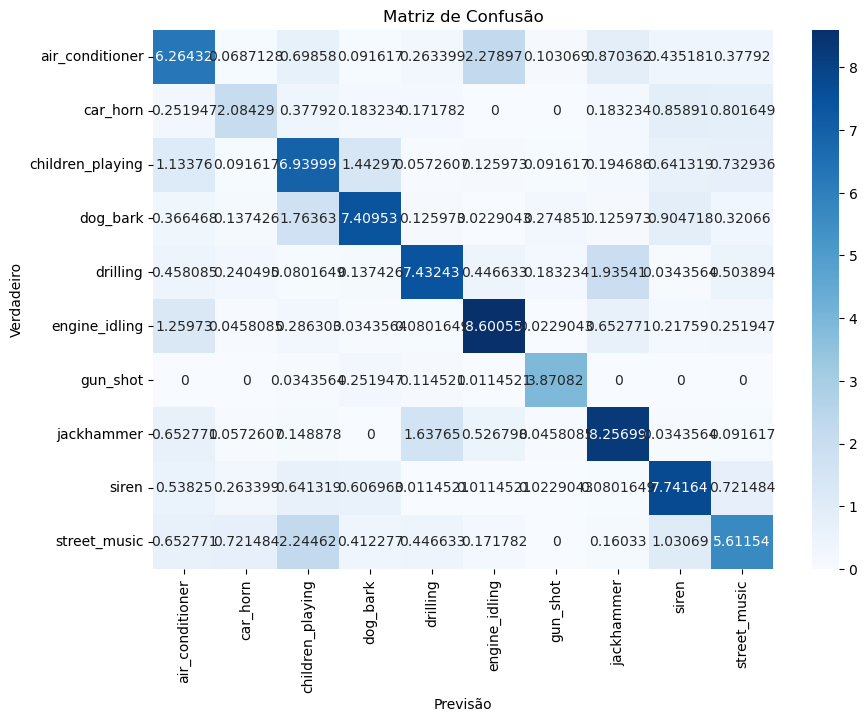

In [156]:
print(best_model.summary())
print("Learning rate: ", best_model_lr)
print("Number of epochs: ", best_model_n_epochs)
print("Batch Size: ", best_model_batch_size)
print("Accuracy: ", best_accuracy)
print("Loss: ", best_model_loss)
print("Standadr Deviation: ", best_model_std)

cm = pd.DataFrame(best_model_cf, index=label_encoder.classes_, columns=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Verdadeiro')
plt.show()

## Grid Search para MLP com 2 camadas escondidas e funções de ativação LeakyReLU

In [159]:
learning_rate = [0.1, 0.01, 0.001]
epochs = [50, 100, 200]
batch_size = [16, 32, 64, 128]
best_model = None
best_accuracy = None
best_model_cf = None
best_model_loss = None
best_model_std = None
best_model_lr = None
best_model_n_epochs = None
best_model_batch_size = None

for i in learning_rate:
    for j in epochs:
        for m in batch_size:
            adam_optimizer = tf.keras.optimizers.Adam(learning_rate=i)
            # Definir o modelo
            model = tf.keras.models.Sequential([
                tf.keras.layers.Input(shape=(input_dim,)),
                tf.keras.layers.Dense(n_neur[0], kernel_initializer=initialize_weights),
                tf.keras.layers.LeakyReLU(negative_slope=0.01),
                tf.keras.layers.Dense(n_neur[1], kernel_initializer=initialize_weights),
                tf.keras.layers.LeakyReLU(negative_slope=0.01),
                tf.keras.layers.Dense(output_dim, activation='softmax', kernel_initializer=initialize_weights)
            ])

            
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            folds = list(kf.split(X))
            all_accuracies = []
            all_confusion_matrices = []
            all_losses = []
            # Cross-validation com cada fold usado uma vez para teste, uma vez para desenvolvimento e 8 vezes para treino
            for fold_idx in range(len(folds)):
                # Selecionar fold para teste
                train_val_indices, test_indices = folds[fold_idx]

                # Selecionar fold para desenvolvimento
                dev_fold_idx = (fold_idx + 1) % len(folds)
                train_indices, dev_indices = folds[dev_fold_idx]

                # Treinamento e Desenvolvimento
                X_train, y_train = X[train_val_indices], y[train_val_indices]
                X_dev, y_dev = X[dev_indices], y[dev_indices]

                # Teste
                X_test, y_test = X[test_indices], y[test_indices]

                # Compilar o modelo
                model.compile(optimizer=adam_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

                model.summary()

                model.fit(X_train, y_train, epochs=j, batch_size=m, validation_data=(X_dev, y_dev), callbacks=[lr_scheduler, early_stopping])

                # Avaliar o modelo
                loss, accuracy = model.evaluate(X_test, y_test)

                all_accuracies.append(accuracy) 
                y_pred = model.predict(X_test) 
                y_pred_classes = np.argmax(y_pred, axis=1) 
                cm = confusion_matrix(y_test, y_pred_classes) 
                all_confusion_matrices.append(cm)
                all_losses.append(loss)

            accumulated_cm = np.sum(all_confusion_matrices, axis=0) 
            accumulated_cm_percentage = accumulated_cm / np.sum(accumulated_cm) * 100
            mean_accuracy = np.mean(all_accuracies) 
            std_accuracy = np.std(all_accuracies)
            mean_loss = np.mean(all_losses)
            print("Accuracy: ", mean_accuracy)
            print("Confusion Matrix: ", accumulated_cm_percentage)
            print("Loss: ", mean_loss)
            print("Standard Deviation: ", std_accuracy)
            
            if best_model == None or mean_accuracy > best_accuracy:
                best_model = model
                best_accuracy = mean_accuracy
                best_model_cf = accumulated_cm_percentage
                best_model_loss = mean_loss
                best_model_std = std_accuracy
                best_model_lr = i
                best_model_n_epochs = j
                best_model_batch_size = m         

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2506 - loss: 1.9447 - val_accuracy: 0.3249 - val_loss: 1.8900 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3586 - loss: 1.7325 - val_accuracy: 0.3902 - val_loss: 1.5085 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4247 - loss: 1.5219 - val_accuracy: 0.4760 - val_loss: 1.3719 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4375 - loss: 1.4975 - val_accuracy: 0.4279 - val_loss: 1.4917 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4267 - loss: 1.5142 - val_accuracy: 0.4519 - val_loss: 1.4319 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4361 - loss: 1.4683 - val_accuracy: 0.4405 - val_loss: 1.3836 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4509 - loss: 1.4176 - 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4830 - loss: 1.3656 - val_accuracy: 0.4696 - val_loss: 1.4110 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4857 - loss: 1.4322 - val_accuracy: 0.5097 - val_loss: 1.2713 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5128 - loss: 1.2920 - val_accuracy: 0.5258 - val_loss: 1.3039 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4781 - loss: 1.4705 - val_accuracy: 0.5120 - val_loss: 1.2559 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5112 - loss: 1.3186 - val_accuracy: 0.5304 - val_loss: 1.2432 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5325 - loss: 1.2754 - val_accuracy: 0.4502 - val_loss: 1.5870 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5090 - loss: 1.3282 - 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4697 - loss: 1.4845 - val_accuracy: 0.5475 - val_loss: 1.2262 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.5246 - loss: 1.4705 - val_accuracy: 0.5178 - val_loss: 1.2687 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5294 - loss: 1.2282 - val_accuracy: 0.5155 - val_loss: 1.2446 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5462 - loss: 1.2226 - val_accuracy: 0.5269 - val_loss: 1.2725 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - accuracy: 0.5489 - loss: 1.2272 - val_accuracy: 0.5865 - val_loss: 1.1521 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5551 - loss: 1.2052 - val_accuracy: 0.5246 - val_loss: 1.2785 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5184 - loss: 1.323

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5512 - loss: 1.2135 - val_accuracy: 0.5578 - val_loss: 1.1995 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5555 - loss: 1.2090 - val_accuracy: 0.5269 - val_loss: 1.2475 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5630 - loss: 1.1749 - val_accuracy: 0.5739 - val_loss: 1.1620 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5819 - loss: 1.1796 - val_accuracy: 0.5647 - val_loss: 1.1820 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5470 - loss: 1.2788 - val_accuracy: 0.5922 - val_loss: 1.1082 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.5692 - loss: 1.1992 - val_accuracy: 0.5349 - val_loss: 1.2163 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5425 - loss: 1.2424 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5795 - loss: 1.1625 - val_accuracy: 0.5682 - val_loss: 1.1927 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5720 - loss: 1.1636 - val_accuracy: 0.6002 - val_loss: 1.1260 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5772 - loss: 1.2282 - val_accuracy: 0.5636 - val_loss: 1.2175 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - accuracy: 0.5743 - loss: 1.1643 - val_accuracy: 0.5556 - val_loss: 1.1861 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5940 - loss: 1.1368 - val_accuracy: 0.5246 - val_loss: 1.2875 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5312 - loss: 1.3033 - val_accuracy: 0.5590 - val_loss: 1.1470 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5910 - loss: 1.1274 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6134 - loss: 1.0775 - val_accuracy: 0.6014 - val_loss: 1.0856 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5953 - loss: 1.1164 - val_accuracy: 0.5189 - val_loss: 1.2862 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5950 - loss: 1.1200 - val_accuracy: 0.5899 - val_loss: 1.1044 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5329 - loss: 1.6806 - val_accuracy: 0.5773 - val_loss: 1.1348 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5977 - loss: 1.1248 - val_accuracy: 0.5682 - val_loss: 1.1348 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6024 - loss: 1.0965 - val_accuracy: 0.6048 - val_loss: 1.0781 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - accuracy: 0.5811 - loss: 1.1645 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5807 - loss: 1.1545 - val_accuracy: 0.6060 - val_loss: 3.5457 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.5794 - loss: 1.3566 - val_accuracy: 0.5888 - val_loss: 1.1420 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - accuracy: 0.6015 - loss: 1.1538 - val_accuracy: 0.6254 - val_loss: 1.0435 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - accuracy: 0.5989 - loss: 1.1324 - val_accuracy: 0.6541 - val_loss: 0.9976 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6180 - loss: 1.1006 - val_accuracy: 0.6186 - val_loss: 1.0464 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6046 - loss: 1.1326 - val_accuracy: 0.6266 - val_loss: 1.0436 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6211 - loss: 1.0

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6176 - loss: 1.0881 - val_accuracy: 0.5968 - val_loss: 1.1407 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6169 - loss: 1.0984 - val_accuracy: 0.6186 - val_loss: 1.0577 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6148 - loss: 1.1222 - val_accuracy: 0.6174 - val_loss: 1.0626 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5980 - loss: 1.1191 - val_accuracy: 0.6243 - val_loss: 1.0179 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6134 - loss: 1.1058 - val_accuracy: 0.5762 - val_loss: 1.0878 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5902 - loss: 1.1426 - val_accuracy: 0.5166 - val_loss: 1.2958 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5591 - loss: 1.2098 - 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6178 - loss: 1.0830 - val_accuracy: 0.5899 - val_loss: 1.0891 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6040 - loss: 1.1150 - val_accuracy: 0.6243 - val_loss: 1.1039 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6008 - loss: 1.1338 - val_accuracy: 0.6060 - val_loss: 1.0911 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5986 - loss: 1.1547 - val_accuracy: 0.5533 - val_loss: 1.1967 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6104 - loss: 1.1212 - val_accuracy: 0.5956 - val_loss: 1.1027 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.6071 - loss: 1.1324 - val_accuracy: 0.5922 - val_loss: 1.1209 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6050 - loss: 1.1294 

Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1107 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_190 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_191 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6036 - loss: 1.1230 - val_accuracy: 0.6007 - val_loss: 1.1365 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6071 - loss: 1.0926 - val_accuracy: 0.6476 - val_loss: 1.0559 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6174 - loss: 1.0969 - val_accuracy: 0.5870 - val_loss: 1.1836 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5575 - loss: 1.3493 - val_accuracy: 0.6076 - val_loss: 1.1281 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5923 - loss: 1.3329 - val_accuracy: 0.5458 - val_loss: 1.2128 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5953 - loss: 1.1459 - val_accuracy: 0.6304 - val_loss: 1.0693 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5868 - loss: 1.1426 - 

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2341 - loss: 1.9787 - val_accuracy: 0.4027 - val_loss: 1.5942 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3917 - loss: 1.6393 - val_accuracy: 0.4199 - val_loss: 1.5629 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.4191 - loss: 1.5188 - val_accuracy: 0.4428 - val_loss: 1.4113 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4736 - loss: 1.3870 - val_accuracy: 0.5046 - val_loss: 1.3027 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.4880 - loss: 1.3367 - val_accuracy: 0.5412 - val_loss: 1.2645 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4891 - loss: 1.3566 - val_accuracy: 0.4817 - val_loss: 1.3045 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4842 - loss: 1.416

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5289 - loss: 1.2859 - val_accuracy: 0.5830 - val_loss: 1.1619 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5317 - loss: 1.2530 - val_accuracy: 0.5830 - val_loss: 1.1877 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - accuracy: 0.5247 - loss: 1.2584 - val_accuracy: 0.5372 - val_loss: 1.2322 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5529 - loss: 1.1843 - val_accuracy: 0.5430 - val_loss: 1.2344 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5470 - loss: 1.2014 - val_accuracy: 0.5727 - val_loss: 1.1567 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - accuracy: 0.5574 - loss: 1.1716 - val_accuracy: 0.5647 - val_loss: 1.1567 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5630 - loss: 1.14

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5574 - loss: 1.1704 - val_accuracy: 0.5888 - val_loss: 1.1272 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5678 - loss: 1.1291 - val_accuracy: 0.5785 - val_loss: 1.1607 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5735 - loss: 1.1284 - val_accuracy: 0.5842 - val_loss: 1.1112 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5741 - loss: 1.1314 - val_accuracy: 0.5647 - val_loss: 1.1446 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5497 - loss: 1.1883 - val_accuracy: 0.5888 - val_loss: 1.1324 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5735 - loss: 1.1359 - val_accuracy: 0.5544 - val_loss: 1.1824 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5707 - loss: 1.1289 - 

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5789 - loss: 1.1397 - val_accuracy: 0.6243 - val_loss: 1.0589 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.5842 - loss: 1.1124 - val_accuracy: 0.5934 - val_loss: 1.0829 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6028 - loss: 1.0949 - val_accuracy: 0.5510 - val_loss: 1.1694 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5861 - loss: 1.1112 - val_accuracy: 0.5922 - val_loss: 1.1133 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5914 - loss: 1.0978 - val_accuracy: 0.5979 - val_loss: 1.1422 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6079 - loss: 1.0814 - val_accuracy: 0.6128 - val_loss: 1.0801 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5939 - loss: 1.1293

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5902 - loss: 1.1004 - val_accuracy: 0.6025 - val_loss: 1.0757 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - accuracy: 0.6038 - loss: 1.0985 - val_accuracy: 0.6094 - val_loss: 1.0310 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5943 - loss: 1.1202 - val_accuracy: 0.5716 - val_loss: 1.1573 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6028 - loss: 1.1008 - val_accuracy: 0.5590 - val_loss: 1.1501 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.5785 - loss: 1.1219 - val_accuracy: 0.6128 - val_loss: 1.0761 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - accuracy: 0.6032 - loss: 1.0774 - val_accuracy: 0.6231 - val_loss: 1.0389 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.5944 - loss: 1

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6086 - loss: 1.0713 - val_accuracy: 0.5647 - val_loss: 1.1359 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6005 - loss: 1.0843 - val_accuracy: 0.5762 - val_loss: 1.1387 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6144 - loss: 1.0497 - val_accuracy: 0.5601 - val_loss: 1.2971 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5999 - loss: 1.1008 - val_accuracy: 0.5819 - val_loss: 1.1042 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6159 - loss: 1.0453 - val_accuracy: 0.5762 - val_loss: 1.1232 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6076 - loss: 1.0837 - val_accuracy: 0.5830 - val_loss: 1.1076 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6163 - loss: 1.0636 - 

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6128 - loss: 1.0483 - val_accuracy: 0.6438 - val_loss: 0.9806 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6253 - loss: 1.0434 - val_accuracy: 0.6529 - val_loss: 0.9840 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.6288 - loss: 1.0148 - val_accuracy: 0.6426 - val_loss: 0.9599 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6201 - loss: 1.0380 - val_accuracy: 0.6254 - val_loss: 1.0035 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.6035 - loss: 1.0878 - val_accuracy: 0.6369 - val_loss: 0.9806 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6198 - loss: 1.0392 - val_accuracy: 0.6426 - val_loss: 1.0074 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.6255 - loss: 1.0

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6224 - loss: 1.0551 - val_accuracy: 0.5601 - val_loss: 1.3121 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6000 - loss: 1.0805 - val_accuracy: 0.6174 - val_loss: 1.0248 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6145 - loss: 1.0519 - val_accuracy: 0.6380 - val_loss: 0.9914 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6307 - loss: 1.0256 - val_accuracy: 0.6048 - val_loss: 1.0593 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6021 - loss: 1.0822 - val_accuracy: 0.6174 - val_loss: 1.0247 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6199 - loss: 1.0652 - val_accuracy: 0.6369 - val_loss: 1.0421 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6292 - loss: 1.0400 - 

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6324 - loss: 1.0372 - val_accuracy: 0.6415 - val_loss: 0.9787 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.6273 - loss: 1.0430 - val_accuracy: 0.6014 - val_loss: 1.1164 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6321 - loss: 1.0408 - val_accuracy: 0.6186 - val_loss: 1.0242 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6334 - loss: 1.0150 - val_accuracy: 0.6529 - val_loss: 0.9891 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6264 - loss: 1.0406 - val_accuracy: 0.5819 - val_loss: 1.1645 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6336 - loss: 1.0443 - val_accuracy: 0.6564 - val_loss: 0.9938 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.6368 - loss: 1.030

Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1110 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_192 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_193 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5983 - loss: 1.5651 - val_accuracy: 0.6236 - val_loss: 1.0430 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.6279 - loss: 1.0606 - val_accuracy: 0.6545 - val_loss: 1.0195 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6338 - loss: 1.0172 - val_accuracy: 0.6327 - val_loss: 1.0325 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6346 - loss: 1.0125 - val_accuracy: 0.6785 - val_loss: 0.9413 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6490 - loss: 1.0113 - val_accuracy: 0.6465 - val_loss: 1.0270 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6448 - loss: 1.0427 - val_accuracy: 0.6465 - val_loss: 1.0191 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6157 - loss: 1.1745

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2161 - loss: 1.9971 - val_accuracy: 0.4416 - val_loss: 1.4854 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4228 - loss: 1.5052 - val_accuracy: 0.4211 - val_loss: 1.4682 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4674 - loss: 1.3865 - val_accuracy: 0.5286 - val_loss: 1.3321 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4739 - loss: 1.3752 - val_accuracy: 0.5332 - val_loss: 1.2745 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.5008 - loss: 1.3268 - val_accuracy: 0.5172 - val_loss: 1.2876 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5058 - loss: 1.3199 - val_accuracy: 0.5526 - val_loss: 1.1932 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5058 - loss: 1.3005 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5192 - loss: 1.2838 - val_accuracy: 0.5727 - val_loss: 1.2274 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5487 - loss: 1.2293 - val_accuracy: 0.4593 - val_loss: 1.4417 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5442 - loss: 1.2734 - val_accuracy: 0.5464 - val_loss: 1.1901 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5668 - loss: 1.1736 - val_accuracy: 0.5888 - val_loss: 1.1974 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5880 - loss: 1.1243 - val_accuracy: 0.6231 - val_loss: 1.0662 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5921 - loss: 1.1299 - val_accuracy: 0.6197 - val_loss: 1.0553 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5947 - loss: 1.1176 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5959 - loss: 1.0902 - val_accuracy: 0.5899 - val_loss: 1.0701 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6013 - loss: 1.1245 - val_accuracy: 0.6231 - val_loss: 1.0439 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5950 - loss: 1.1014 - val_accuracy: 0.5876 - val_loss: 1.1354 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5796 - loss: 1.1012 - val_accuracy: 0.5911 - val_loss: 1.1278 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5944 - loss: 1.0789 - val_accuracy: 0.6208 - val_loss: 1.0682 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5709 - loss: 1.1841 - val_accuracy: 0.5911 - val_loss: 1.0747 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6098 - loss: 1.0574 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6031 - loss: 1.0729 - val_accuracy: 0.6082 - val_loss: 1.0598 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5832 - loss: 1.0950 - val_accuracy: 0.5934 - val_loss: 1.0715 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5802 - loss: 1.1310 - val_accuracy: 0.6277 - val_loss: 0.9723 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6148 - loss: 1.0363 - val_accuracy: 0.6380 - val_loss: 0.9723 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6222 - loss: 1.0150 - val_accuracy: 0.6071 - val_loss: 1.0429 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6004 - loss: 1.0524 - val_accuracy: 0.5865 - val_loss: 1.0760 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6192 - loss: 1.0439 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6126 - loss: 1.0426 - val_accuracy: 0.6266 - val_loss: 1.0311 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6119 - loss: 1.0502 - val_accuracy: 0.5659 - val_loss: 1.0672 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5904 - loss: 1.0799 - val_accuracy: 0.5659 - val_loss: 1.1156 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5968 - loss: 1.0807 - val_accuracy: 0.6186 - val_loss: 1.0914 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6282 - loss: 1.0213 - val_accuracy: 0.6380 - val_loss: 1.0493 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6253 - loss: 1.0287 - val_accuracy: 0.6048 - val_loss: 1.1099 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6016 - loss: 1.0718 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6143 - loss: 1.0635 - val_accuracy: 0.5773 - val_loss: 1.0929 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6128 - loss: 1.0624 - val_accuracy: 0.6071 - val_loss: 1.0499 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6129 - loss: 1.0388 - val_accuracy: 0.5888 - val_loss: 1.0770 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.6136 - loss: 1.0564 - val_accuracy: 0.6071 - val_loss: 1.0241 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6042 - loss: 1.0468 - val_accuracy: 0.5922 - val_loss: 1.0873 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6285 - loss: 1.0105 - val_accuracy: 0.5876 - val_loss: 1.0447 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6218 - loss: 1.0217 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6337 - loss: 1.0016 - val_accuracy: 0.6564 - val_loss: 0.9724 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.6339 - loss: 1.0214 - val_accuracy: 0.6518 - val_loss: 0.9716 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6387 - loss: 0.9869 - val_accuracy: 0.6346 - val_loss: 0.9938 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6340 - loss: 1.0064 - val_accuracy: 0.6667 - val_loss: 0.9262 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - accuracy: 0.6367 - loss: 0.9832 - val_accuracy: 0.6575 - val_loss: 0.9234 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6298 - loss: 1.0256 - val_accuracy: 0.6438 - val_loss: 0.9633 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - accuracy: 0.6361 - loss: 1.0

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6326 - loss: 1.0078 - val_accuracy: 0.6094 - val_loss: 1.0520 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6354 - loss: 1.0076 - val_accuracy: 0.6357 - val_loss: 0.9605 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6254 - loss: 1.0391 - val_accuracy: 0.6128 - val_loss: 1.0158 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6213 - loss: 1.0111 - val_accuracy: 0.6140 - val_loss: 1.0211 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6367 - loss: 0.9886 - val_accuracy: 0.6609 - val_loss: 0.9333 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6278 - loss: 1.0234 - val_accuracy: 0.6334 - val_loss: 0.9975 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6323 - loss: 1.0007 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6393 - loss: 0.9742 - val_accuracy: 0.6495 - val_loss: 0.9578 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6329 - loss: 1.0099 - val_accuracy: 0.6529 - val_loss: 0.9562 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6563 - loss: 0.9734 - val_accuracy: 0.6186 - val_loss: 1.0145 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6391 - loss: 1.0285 - val_accuracy: 0.6483 - val_loss: 0.9675 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6492 - loss: 0.9941 - val_accuracy: 0.6369 - val_loss: 0.9599 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6350 - loss: 1.0094 - val_accuracy: 0.6529 - val_loss: 0.9480 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6537 - loss: 0.9643 - 

Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_194 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_195 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6400 - loss: 1.0007 - val_accuracy: 0.6796 - val_loss: 0.9296 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6508 - loss: 0.9509 - val_accuracy: 0.6819 - val_loss: 0.9144 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6467 - loss: 0.9885 - val_accuracy: 0.6259 - val_loss: 1.1369 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6219 - loss: 1.0633 - val_accuracy: 0.6625 - val_loss: 0.9296 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6521 - loss: 0.9800 - val_accuracy: 0.6785 - val_loss: 0.9317 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6460 - loss: 0.9808 - val_accuracy: 0.6819 - val_loss: 0.9096 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.6547 - loss: 0.9923 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2433 - loss: 1.9745 - val_accuracy: 0.4119 - val_loss: 1.5142 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4465 - loss: 1.4337 - val_accuracy: 0.5103 - val_loss: 1.2723 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5041 - loss: 1.2739 - val_accuracy: 0.5023 - val_loss: 1.2903 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5166 - loss: 1.2491 - val_accuracy: 0.5069 - val_loss: 1.3031 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5331 - loss: 1.2293 - val_accuracy: 0.5549 - val_loss: 1.1501 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5510 - loss: 1.1884 - val_accuracy: 0.5526 - val_loss: 1.1237 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5377 - loss: 1.2162 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5933 - loss: 1.0811 - val_accuracy: 0.6094 - val_loss: 1.0657 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5684 - loss: 1.1385 - val_accuracy: 0.5853 - val_loss: 1.0966 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5863 - loss: 1.1178 - val_accuracy: 0.5979 - val_loss: 1.0645 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5952 - loss: 1.1029 - val_accuracy: 0.6105 - val_loss: 1.0526 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6051 - loss: 1.1019 - val_accuracy: 0.5830 - val_loss: 1.1482 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5579 - loss: 1.1644 - val_accuracy: 0.5452 - val_loss: 1.2435 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5877 - loss: 1.0968 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6122 - loss: 1.0740 - val_accuracy: 0.5842 - val_loss: 1.1353 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6030 - loss: 1.0685 - val_accuracy: 0.5911 - val_loss: 1.0824 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6133 - loss: 1.0429 - val_accuracy: 0.5853 - val_loss: 1.1188 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6121 - loss: 1.0657 - val_accuracy: 0.5968 - val_loss: 1.1110 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6283 - loss: 1.0297 - val_accuracy: 0.6071 - val_loss: 1.1292 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6089 - loss: 1.0655 - val_accuracy: 0.6266 - val_loss: 1.0541 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6255 - loss: 1.0528 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6172 - loss: 1.1077 - val_accuracy: 0.6334 - val_loss: 1.0302 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6421 - loss: 1.0061 - val_accuracy: 0.6300 - val_loss: 0.9900 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6454 - loss: 0.9939 - val_accuracy: 0.6231 - val_loss: 1.0638 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6353 - loss: 1.0263 - val_accuracy: 0.6472 - val_loss: 1.0008 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6203 - loss: 1.0255 - val_accuracy: 0.6002 - val_loss: 1.0852 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6264 - loss: 1.0643 - val_accuracy: 0.6449 - val_loss: 0.9897 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6405 - loss: 1.0053 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6287 - loss: 1.0445 - val_accuracy: 0.6060 - val_loss: 1.1456 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6213 - loss: 1.0546 - val_accuracy: 0.6357 - val_loss: 0.9832 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6491 - loss: 0.9612 - val_accuracy: 0.6495 - val_loss: 0.9697 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6401 - loss: 1.0046 - val_accuracy: 0.6254 - val_loss: 1.0191 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6437 - loss: 1.0244 - val_accuracy: 0.6220 - val_loss: 1.0112 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6333 - loss: 1.0113 - val_accuracy: 0.6483 - val_loss: 0.9884 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6510 - loss: 0.9750 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6485 - loss: 0.9730 - val_accuracy: 0.6575 - val_loss: 0.9144 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6565 - loss: 0.9501 - val_accuracy: 0.6564 - val_loss: 0.9376 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6715 - loss: 0.9327 - val_accuracy: 0.6392 - val_loss: 0.9493 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6586 - loss: 0.9445 - val_accuracy: 0.6529 - val_loss: 0.9930 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6563 - loss: 0.9617 - val_accuracy: 0.6804 - val_loss: 0.9374 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6601 - loss: 0.9559 - val_accuracy: 0.6426 - val_loss: 1.0111 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6173 - loss: 1.0530 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6820 - loss: 0.8943 - val_accuracy: 0.6621 - val_loss: 0.8981 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6610 - loss: 0.9713 - val_accuracy: 0.6770 - val_loss: 0.8617 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6666 - loss: 0.9508 - val_accuracy: 0.6793 - val_loss: 0.9268 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6705 - loss: 0.9354 - val_accuracy: 0.6506 - val_loss: 0.9385 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6644 - loss: 0.9595 - val_accuracy: 0.6254 - val_loss: 1.0766 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6426 - loss: 0.9988 - val_accuracy: 0.6781 - val_loss: 0.8756 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6825 - loss: 0.8928 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6734 - loss: 0.9227 - val_accuracy: 0.6415 - val_loss: 0.9860 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6444 - loss: 0.9902 - val_accuracy: 0.6277 - val_loss: 1.0303 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6620 - loss: 0.9641 - val_accuracy: 0.6781 - val_loss: 0.9070 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6720 - loss: 0.9085 - val_accuracy: 0.6632 - val_loss: 0.9471 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6602 - loss: 0.9514 - val_accuracy: 0.6804 - val_loss: 0.9094 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6664 - loss: 0.9387 - val_accuracy: 0.7033 - val_loss: 0.8428 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6923 - loss: 0.8823 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7041 - loss: 0.8583 - val_accuracy: 0.6942 - val_loss: 0.8975 - learning_rate: 0.0549
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6943 - loss: 0.8977 - val_accuracy: 0.7022 - val_loss: 0.8822 - learning_rate: 0.0549
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6983 - loss: 0.8571 - val_accuracy: 0.6930 - val_loss: 0.8848 - learning_rate: 0.0549
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7052 - loss: 0.8472 - val_accuracy: 0.7125 - val_loss: 0.8801 - learning_rate: 0.0549
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7187 - loss: 0.8259 - val_accuracy: 0.6884 - val_loss: 0.9417 - learning_rate: 0.0549
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6709 - loss: 0.9596 - val_accuracy: 0.6999 - val_loss: 0.8576 - learning_rate: 0.0549
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7085 - loss: 0.8411 - val_accuracy: 

Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1116 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_196 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_197 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6950 - loss: 0.8740 - val_accuracy: 0.7243 - val_loss: 0.8485 - learning_rate: 0.0549
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7006 - loss: 0.8414 - val_accuracy: 0.7037 - val_loss: 0.8272 - learning_rate: 0.0549
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7110 - loss: 0.8375 - val_accuracy: 0.7059 - val_loss: 0.8279 - learning_rate: 0.0549
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7127 - loss: 0.8284 - val_accuracy: 0.6957 - val_loss: 0.8479 - learning_rate: 0.0549
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7126 - loss: 0.8344 - val_accuracy: 0.7059 - val_loss: 0.8500 - learning_rate: 0.0549
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7100 - loss: 0.8310 - val_accuracy: 0.7105 - val_loss: 0.8424 - learning_rate: 0.0549
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7121 - loss: 0.8379 - val_accuracy: 

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1474 - loss: 2.2422 - val_accuracy: 0.2975 - val_loss: 1.8398 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.2683 - loss: 1.8643 - val_accuracy: 0.3249 - val_loss: 1.7753 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - accuracy: 0.3220 - loss: 1.7678 - val_accuracy: 0.3421 - val_loss: 1.6647 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.3690 - loss: 1.6339 - val_accuracy: 0.3776 - val_loss: 1.5870 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - accuracy: 0.3854 - loss: 1.6022 - val_accuracy: 0.3650 - val_loss: 1.5745 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - accuracy: 0.3874 - loss: 1.7088 - val_accuracy: 0.4222 - val_loss: 1.4854 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - accuracy: 0.409

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4060 - loss: 1.5358 - val_accuracy: 0.4422 - val_loss: 1.4332 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - accuracy: 0.4463 - loss: 1.4390 - val_accuracy: 0.4639 - val_loss: 1.4344 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4324 - loss: 1.4947 - val_accuracy: 0.4387 - val_loss: 1.4371 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4406 - loss: 1.4637 - val_accuracy: 0.4616 - val_loss: 1.3635 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4618 - loss: 1.3961 - val_accuracy: 0.4387 - val_loss: 1.4285 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - accuracy: 0.4452 - loss: 1.4038 - val_accuracy: 0.4410 - val_loss: 1.5355 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.4543 - lo

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4868 - loss: 1.3150 - val_accuracy: 0.5178 - val_loss: 1.2890 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - accuracy: 0.4819 - loss: 1.4003 - val_accuracy: 0.4273 - val_loss: 1.4262 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - accuracy: 0.4882 - loss: 1.3458 - val_accuracy: 0.4960 - val_loss: 1.2942 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.5008 - loss: 1.3386 - val_accuracy: 0.4605 - val_loss: 1.3547 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.5021 - loss: 1.3137 - val_accuracy: 0.4685 - val_loss: 1.3547 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - accuracy: 0.5037 - loss: 1.3038 - val_accuracy: 0.4891 - val_loss: 1.3189 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.515

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5084 - loss: 1.2996 - val_accuracy: 0.4937 - val_loss: 1.2943 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - accuracy: 0.5280 - loss: 1.2572 - val_accuracy: 0.5304 - val_loss: 1.2118 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.5240 - loss: 1.2539 - val_accuracy: 0.5544 - val_loss: 1.1691 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - accuracy: 0.5275 - loss: 1.2777 - val_accuracy: 0.5200 - val_loss: 1.2388 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - accuracy: 0.5234 - loss: 1.2649 - val_accuracy: 0.5567 - val_loss: 1.1549 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.5227 - loss: 1.2661 - val_accuracy: 0.5739 - val_loss: 1.1542 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - accuracy: 0.516

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5440 - loss: 1.2956 - val_accuracy: 0.5200 - val_loss: 1.3645 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.5355 - loss: 1.2413 - val_accuracy: 0.5716 - val_loss: 1.3382 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.5405 - loss: 1.2386 - val_accuracy: 0.5773 - val_loss: 1.2143 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.5394 - loss: 1.2391 - val_accuracy: 0.5533 - val_loss: 1.1928 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5517 - loss: 1.2121 - val_accuracy: 0.5143 - val_loss: 1.2730 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5312 - loss: 1.2518 - val_accuracy: 0.4960 - val_loss: 1.3075 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4974 - lo

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5476 - loss: 1.2616 - val_accuracy: 0.5441 - val_loss: 1.2671 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - accuracy: 0.5428 - loss: 1.2568 - val_accuracy: 0.5326 - val_loss: 1.2323 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5610 - loss: 1.2069 - val_accuracy: 0.4971 - val_loss: 1.2790 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5563 - loss: 1.2502 - val_accuracy: 0.5556 - val_loss: 1.2274 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - accuracy: 0.5445 - loss: 1.6548 - val_accuracy: 0.4983 - val_loss: 1.2884 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5483 - loss: 1.2495 - val_accuracy: 0.5315 - val_loss: 1.2472 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - accuracy: 0.5440 - lo

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5708 - loss: 1.1854 - val_accuracy: 0.6140 - val_loss: 1.1104 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.5616 - loss: 1.1911 - val_accuracy: 0.6151 - val_loss: 1.0866 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - accuracy: 0.5699 - loss: 1.2125 - val_accuracy: 0.5922 - val_loss: 1.1269 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.5661 - loss: 1.2131 - val_accuracy: 0.6071 - val_loss: 1.1024 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5734 - loss: 1.1924 - val_accuracy: 0.6037 - val_loss: 1.1164 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - accuracy: 0.5701 - loss: 1.1680 - val_accuracy: 0.5876 - val_loss: 1.1476 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.5726 

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5626 - loss: 1.2097 - val_accuracy: 0.5281 - val_loss: 1.3079 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - accuracy: 0.5408 - loss: 1.3192 - val_accuracy: 0.5533 - val_loss: 1.1889 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - accuracy: 0.5712 - loss: 1.1957 - val_accuracy: 0.5407 - val_loss: 1.1985 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.5655 - loss: 1.2055 - val_accuracy: 0.5304 - val_loss: 1.2515 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.5596 - loss: 1.3296 - val_accuracy: 0.5338 - val_loss: 1.2217 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - accuracy: 0.5674 - loss: 1.2131 - val_accuracy: 0.5166 - val_loss: 1.2737 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5625 

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5717 - loss: 1.1937 - val_accuracy: 0.5693 - val_loss: 1.1459 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5809 - loss: 1.1520 - val_accuracy: 0.5888 - val_loss: 1.1363 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5866 - loss: 1.1832 - val_accuracy: 0.5670 - val_loss: 1.2060 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.5864 - loss: 1.1625 - val_accuracy: 0.5830 - val_loss: 1.1638 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.5883 - loss: 1.1789 - val_accuracy: 0.5842 - val_loss: 1.1690 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.5939 - loss: 1.1626 - val_accuracy: 0.5750 - val_loss: 1.1402 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5821 - lo

Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1119 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_198 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1120 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_199 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5900 - loss: 1.1725 - val_accuracy: 0.5961 - val_loss: 1.1313 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.5769 - loss: 1.3269 - val_accuracy: 0.6007 - val_loss: 1.1271 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.5965 - loss: 1.1506 - val_accuracy: 0.5973 - val_loss: 1.1168 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.6013 - loss: 1.2903 - val_accuracy: 0.5915 - val_loss: 1.1800 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - accuracy: 0.5976 - loss: 1.1603 - val_accuracy: 0.5973 - val_loss: 1.1535 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6008 - loss: 1.1441 - val_accuracy: 0.5973 - val_loss: 1.1662 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5554 - 

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1591 - loss: 2.1712 - val_accuracy: 0.2998 - val_loss: 1.7887 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2981 - loss: 1.8196 - val_accuracy: 0.3055 - val_loss: 1.7973 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.2948 - loss: 1.8272 - val_accuracy: 0.3421 - val_loss: 1.6870 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3463 - loss: 1.7244 - val_accuracy: 0.4027 - val_loss: 1.5171 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4003 - loss: 1.5519 - val_accuracy: 0.4222 - val_loss: 1.5175 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4065 - loss: 1.5526 - val_accuracy: 0.3444 - val_loss: 1.6538 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4159 - loss: 

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4591 - loss: 1.4426 - val_accuracy: 0.4479 - val_loss: 1.4010 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4722 - loss: 1.4109 - val_accuracy: 0.4903 - val_loss: 1.3854 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4645 - loss: 1.4178 - val_accuracy: 0.4112 - val_loss: 1.4952 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4628 - loss: 1.4034 - val_accuracy: 0.4341 - val_loss: 1.4384 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4776 - loss: 1.3690 - val_accuracy: 0.4570 - val_loss: 1.5002 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4703 - loss: 1.4170 - val_accuracy: 0.4708 - val_loss: 1.3919 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4729 - loss: 

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4848 - loss: 1.3481 - val_accuracy: 0.5063 - val_loss: 1.3209 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.5062 - loss: 1.3367 - val_accuracy: 0.4674 - val_loss: 1.3967 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5067 - loss: 1.3281 - val_accuracy: 0.5304 - val_loss: 1.2731 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5043 - loss: 1.3051 - val_accuracy: 0.5074 - val_loss: 1.2923 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5158 - loss: 1.2836 - val_accuracy: 0.5304 - val_loss: 1.2757 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.5035 - loss: 1.3297 - val_accuracy: 0.5029 - val_loss: 1.2849 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.5272 - lo

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5238 - loss: 1.2892 - val_accuracy: 0.5040 - val_loss: 1.2957 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5194 - loss: 1.6085 - val_accuracy: 0.5384 - val_loss: 1.2607 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5155 - loss: 1.2919 - val_accuracy: 0.5120 - val_loss: 1.3461 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5289 - loss: 1.3026 - val_accuracy: 0.5246 - val_loss: 1.2625 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5228 - loss: 1.2992 - val_accuracy: 0.5281 - val_loss: 1.2625 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.5366 - loss: 1.3604 - val_accuracy: 0.5040 - val_loss: 1.2900 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.5254 - loss

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5311 - loss: 1.3794 - val_accuracy: 0.5395 - val_loss: 1.2344 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.5397 - loss: 1.2647 - val_accuracy: 0.5407 - val_loss: 1.2111 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5366 - loss: 1.2587 - val_accuracy: 0.5498 - val_loss: 1.1982 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5629 - loss: 1.2336 - val_accuracy: 0.5590 - val_loss: 1.1823 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - accuracy: 0.5489 - loss: 1.2481 - val_accuracy: 0.5223 - val_loss: 1.2939 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.5374 - loss: 1.2401 - val_accuracy: 0.5556 - val_loss: 1.2542 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5368 - lo

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5661 - loss: 1.1899 - val_accuracy: 0.5613 - val_loss: 1.1964 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5593 - loss: 1.2061 - val_accuracy: 0.5304 - val_loss: 1.2900 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5654 - loss: 1.2218 - val_accuracy: 0.5452 - val_loss: 1.2057 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5624 - loss: 1.2157 - val_accuracy: 0.5338 - val_loss: 1.2535 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5556 - loss: 1.2405 - val_accuracy: 0.5086 - val_loss: 1.2630 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5648 - loss: 1.2019 - val_accuracy: 0.5487 - val_loss: 1.2159 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5479 - loss: 1.

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5671 - loss: 1.1902 - val_accuracy: 0.5842 - val_loss: 1.1063 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - accuracy: 0.5737 - loss: 1.1902 - val_accuracy: 0.6266 - val_loss: 1.0948 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5794 - loss: 1.1666 - val_accuracy: 0.6037 - val_loss: 1.0950 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5581 - loss: 1.7590 - val_accuracy: 0.5613 - val_loss: 1.1882 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5566 - loss: 1.2831 - val_accuracy: 0.6243 - val_loss: 1.1104 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5546 - loss: 1.2245 - val_accuracy: 0.5578 - val_loss: 1.2122 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5702 - loss: 

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5746 - loss: 1.1678 - val_accuracy: 0.5704 - val_loss: 1.2366 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5793 - loss: 1.1682 - val_accuracy: 0.5407 - val_loss: 1.1905 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5600 - loss: 1.2532 - val_accuracy: 0.5785 - val_loss: 1.1656 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5669 - loss: 1.4478 - val_accuracy: 0.5475 - val_loss: 1.3076 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5401 - loss: 1.2758 - val_accuracy: 0.5556 - val_loss: 1.2116 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5735 - loss: 1.1781 - val_accuracy: 0.5808 - val_loss: 1.1310 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5854 - loss: 1.

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5819 - loss: 1.1744 - val_accuracy: 0.6025 - val_loss: 1.1469 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5897 - loss: 1.1559 - val_accuracy: 0.5956 - val_loss: 1.1288 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6103 - loss: 1.1270 - val_accuracy: 0.5418 - val_loss: 1.2564 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6025 - loss: 1.1194 - val_accuracy: 0.5750 - val_loss: 1.2005 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5869 - loss: 1.1450 - val_accuracy: 0.5853 - val_loss: 1.1305 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5908 - loss: 1.1563 - val_accuracy: 0.5590 - val_loss: 1.2058 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5739 - loss: 1.

Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1122 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_200 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_201 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5874 - loss: 1.1582 - val_accuracy: 0.6110 - val_loss: 1.1051 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.5996 - loss: 1.1290 - val_accuracy: 0.6110 - val_loss: 1.1412 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - accuracy: 0.5802 - loss: 1.1662 - val_accuracy: 0.6247 - val_loss: 1.1236 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.6029 - loss: 1.1386 - val_accuracy: 0.5858 - val_loss: 1.1308 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.5989 - loss: 1.1324 - val_accuracy: 0.6201 - val_loss: 1.1082 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.5936 - loss: 1.1406 - val_accuracy: 0.5995 - val_loss: 1.1485 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6116 

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1980 - loss: 2.0707 - val_accuracy: 0.3719 - val_loss: 1.6163 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3985 - loss: 1.5377 - val_accuracy: 0.4577 - val_loss: 1.4493 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.4486 - loss: 1.4278 - val_accuracy: 0.4714 - val_loss: 1.3708 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4658 - loss: 1.3712 - val_accuracy: 0.5137 - val_loss: 1.3129 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4747 - loss: 1.3602 - val_accuracy: 0.4840 - val_loss: 1.3028 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4804 - loss: 1.3187 - val_accuracy: 0.5069 - val_loss: 1.2375 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4979 - loss: 

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4873 - loss: 1.3269 - val_accuracy: 0.4914 - val_loss: 1.2863 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5150 - loss: 1.2712 - val_accuracy: 0.5155 - val_loss: 1.3574 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5101 - loss: 1.2797 - val_accuracy: 0.5762 - val_loss: 1.2192 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5401 - loss: 1.1918 - val_accuracy: 0.5487 - val_loss: 1.2049 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5368 - loss: 1.2086 - val_accuracy: 0.5166 - val_loss: 1.2575 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5559 - loss: 1.2048 - val_accuracy: 0.5452 - val_loss: 1.2370 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5602 - loss: 1.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5536 - loss: 1.1892 - val_accuracy: 0.5281 - val_loss: 1.2083 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5797 - loss: 1.1470 - val_accuracy: 0.5934 - val_loss: 1.1393 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5875 - loss: 1.1467 - val_accuracy: 0.5979 - val_loss: 1.1218 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5894 - loss: 1.1026 - val_accuracy: 0.5956 - val_loss: 1.1147 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5887 - loss: 1.1374 - val_accuracy: 0.5830 - val_loss: 1.1285 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5987 - loss: 1.1017 - val_accuracy: 0.6277 - val_loss: 1.0397 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6107 - loss: 1.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6071 - loss: 1.0712 - val_accuracy: 0.6151 - val_loss: 1.0520 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5997 - loss: 1.0878 - val_accuracy: 0.5510 - val_loss: 1.2211 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6145 - loss: 1.0685 - val_accuracy: 0.6060 - val_loss: 1.0536 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.6381 - loss: 1.0352 - val_accuracy: 0.5934 - val_loss: 1.0803 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.6062 - loss: 1.0995 - val_accuracy: 0.6300 - val_loss: 1.0510 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6205 - loss: 1.0649 - val_accuracy: 0.6483 - val_loss: 0.9889 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6100 - loss

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6217 - loss: 1.0589 - val_accuracy: 0.6071 - val_loss: 1.1181 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6179 - loss: 1.0459 - val_accuracy: 0.6197 - val_loss: 1.0480 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6321 - loss: 1.0357 - val_accuracy: 0.6369 - val_loss: 1.0103 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6302 - loss: 1.0303 - val_accuracy: 0.6186 - val_loss: 1.0232 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6160 - loss: 1.0665 - val_accuracy: 0.6346 - val_loss: 1.0323 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6386 - loss: 1.0309 - val_accuracy: 0.6289 - val_loss: 1.0417 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6323 - loss: 1.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6375 - loss: 1.0299 - val_accuracy: 0.6197 - val_loss: 1.0306 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6443 - loss: 1.0153 - val_accuracy: 0.6334 - val_loss: 1.0217 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6408 - loss: 1.0188 - val_accuracy: 0.5590 - val_loss: 1.2045 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6170 - loss: 1.0813 - val_accuracy: 0.6128 - val_loss: 1.1187 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6313 - loss: 1.0322 - val_accuracy: 0.5991 - val_loss: 1.1169 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6548 - loss: 0.9924 - val_accuracy: 0.5979 - val_loss: 1.0846 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6459 - loss: 0.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6373 - loss: 1.0122 - val_accuracy: 0.6758 - val_loss: 0.8993 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6532 - loss: 0.9814 - val_accuracy: 0.6598 - val_loss: 0.9600 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6583 - loss: 0.9764 - val_accuracy: 0.6483 - val_loss: 1.0351 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6359 - loss: 1.0131 - val_accuracy: 0.6838 - val_loss: 0.9040 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6392 - loss: 0.9926 - val_accuracy: 0.6758 - val_loss: 0.9096 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6438 - loss: 1.0051 - val_accuracy: 0.6930 - val_loss: 0.9060 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6587 - loss: 0.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6546 - loss: 1.0144 - val_accuracy: 0.6621 - val_loss: 0.9155 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6453 - loss: 1.0007 - val_accuracy: 0.6025 - val_loss: 1.0795 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5954 - loss: 1.1820 - val_accuracy: 0.6621 - val_loss: 0.9361 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6607 - loss: 0.9735 - val_accuracy: 0.6701 - val_loss: 0.8920 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6433 - loss: 1.0093 - val_accuracy: 0.6850 - val_loss: 0.9037 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6534 - loss: 0.9948 - val_accuracy: 0.6552 - val_loss: 0.9423 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6465 - loss: 1.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6627 - loss: 0.9606 - val_accuracy: 0.6506 - val_loss: 0.9700 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6580 - loss: 0.9775 - val_accuracy: 0.6816 - val_loss: 0.9178 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6672 - loss: 0.9466 - val_accuracy: 0.6460 - val_loss: 0.9796 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6444 - loss: 0.9895 - val_accuracy: 0.6781 - val_loss: 0.9363 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6560 - loss: 0.9630 - val_accuracy: 0.6586 - val_loss: 0.9615 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6583 - loss: 0.9892 - val_accuracy: 0.6655 - val_loss: 1.0060 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6628 - loss: 0.

Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1125 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_202 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_203 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1127 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6412 - loss: 1.0082 - val_accuracy: 0.6407 - val_loss: 1.0228 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6514 - loss: 0.9967 - val_accuracy: 0.6259 - val_loss: 0.9991 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6471 - loss: 0.9683 - val_accuracy: 0.6590 - val_loss: 0.9777 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6709 - loss: 0.9510 - val_accuracy: 0.6705 - val_loss: 0.9493 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6606 - loss: 0.9719 - val_accuracy: 0.6796 - val_loss: 0.9165 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6600 - loss: 0.9531 - val_accuracy: 0.6922 - val_loss: 0.9220 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6679 - loss: 0.

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2497 - loss: 1.9642 - val_accuracy: 0.4428 - val_loss: 1.4222 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4517 - loss: 1.4274 - val_accuracy: 0.4851 - val_loss: 1.3045 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4907 - loss: 1.3260 - val_accuracy: 0.4428 - val_loss: 1.3660 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4852 - loss: 1.3190 - val_accuracy: 0.4748 - val_loss: 1.4371 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4919 - loss: 1.3481 - val_accuracy: 0.5515 - val_loss: 1.1521 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5365 - loss: 1.2088 - val_accuracy: 0.5744 - val_loss: 1.1644 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5716 - loss: 1.1518 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 35s 12ms/step - accuracy: 0.6023 - loss: 1.1077 - val_accuracy: 0.6025 - val_loss: 1.0595 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5955 - loss: 1.1089 - val_accuracy: 0.6060 - val_loss: 1.1070 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5815 - loss: 1.1287 - val_accuracy: 0.5911 - val_loss: 1.0989 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5871 - loss: 1.1155 - val_accuracy: 0.6002 - val_loss: 1.0538 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5921 - loss: 1.0909 - val_accuracy: 0.6197 - val_loss: 1.0727 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6024 - loss: 1.0905 - val_accuracy: 0.6002 - val_loss: 1.0988 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6287 - loss: 1.0430 - val_a

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6261 - loss: 1.0517 - val_accuracy: 0.6472 - val_loss: 1.0504 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6422 - loss: 1.0108 - val_accuracy: 0.6243 - val_loss: 1.0565 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6487 - loss: 0.9992 - val_accuracy: 0.6438 - val_loss: 1.0583 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6310 - loss: 1.0311 - val_accuracy: 0.6346 - val_loss: 1.0305 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6480 - loss: 0.9799 - val_accuracy: 0.6438 - val_loss: 1.0318 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6466 - loss: 1.0108 - val_accuracy: 0.6357 - val_loss: 1.0543 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6414 - loss: 0.9930 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6395 - loss: 0.9889 - val_accuracy: 0.6392 - val_loss: 0.9643 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6503 - loss: 0.9871 - val_accuracy: 0.6690 - val_loss: 0.9462 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6595 - loss: 0.9848 - val_accuracy: 0.6357 - val_loss: 0.9560 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6427 - loss: 0.9940 - val_accuracy: 0.6483 - val_loss: 0.9399 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6430 - loss: 0.9816 - val_accuracy: 0.6770 - val_loss: 0.9135 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6624 - loss: 0.9448 - val_accuracy: 0.7010 - val_loss: 0.8589 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6719 - loss: 0.9258 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6587 - loss: 0.9762 - val_accuracy: 0.6483 - val_loss: 0.9543 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6329 - loss: 1.0258 - val_accuracy: 0.6312 - val_loss: 0.9986 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6437 - loss: 1.0136 - val_accuracy: 0.6564 - val_loss: 0.9113 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6630 - loss: 0.9463 - val_accuracy: 0.6346 - val_loss: 1.0146 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6562 - loss: 0.9422 - val_accuracy: 0.6667 - val_loss: 0.8654 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6649 - loss: 0.9546 - val_accuracy: 0.6861 - val_loss: 0.8463 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6576 - loss: 0.9656 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6788 - loss: 0.9267 - val_accuracy: 0.6357 - val_loss: 0.9903 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6480 - loss: 0.9827 - val_accuracy: 0.6369 - val_loss: 0.9775 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6716 - loss: 0.9362 - val_accuracy: 0.6231 - val_loss: 1.0884 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6554 - loss: 0.9984 - val_accuracy: 0.6369 - val_loss: 1.0594 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6615 - loss: 0.9648 - val_accuracy: 0.6529 - val_loss: 0.9519 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6604 - loss: 0.9619 - val_accuracy: 0.6243 - val_loss: 1.0004 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6750 - loss: 0.9317 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6676 - loss: 0.9286 - val_accuracy: 0.6712 - val_loss: 0.8957 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6706 - loss: 0.9260 - val_accuracy: 0.6850 - val_loss: 0.9043 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6624 - loss: 0.9420 - val_accuracy: 0.7033 - val_loss: 0.8552 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6745 - loss: 0.9222 - val_accuracy: 0.7102 - val_loss: 0.8300 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6841 - loss: 0.8835 - val_accuracy: 0.6667 - val_loss: 0.9307 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6541 - loss: 0.9645 - val_accuracy: 0.7068 - val_loss: 0.8548 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6840 - loss: 0.8928 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6755 - loss: 0.9158 - val_accuracy: 0.6758 - val_loss: 0.9355 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6723 - loss: 0.9464 - val_accuracy: 0.6655 - val_loss: 0.9679 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6792 - loss: 0.9105 - val_accuracy: 0.6655 - val_loss: 0.9324 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6890 - loss: 0.9199 - val_accuracy: 0.6690 - val_loss: 0.9292 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6950 - loss: 0.8738 - val_accuracy: 0.7090 - val_loss: 0.8471 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6959 - loss: 0.8642 - val_accuracy: 0.6197 - val_loss: 1.0399 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6595 - loss: 0.9639 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6822 - loss: 0.8925 - val_accuracy: 0.6724 - val_loss: 0.8979 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6590 - loss: 0.9487 - val_accuracy: 0.6999 - val_loss: 0.8572 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6985 - loss: 0.8689 - val_accuracy: 0.6987 - val_loss: 0.8340 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7029 - loss: 0.8643 - val_accuracy: 0.6816 - val_loss: 0.9068 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6997 - loss: 0.8598 - val_accuracy: 0.6816 - val_loss: 0.9039 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6926 - loss: 0.8742 - val_accuracy: 0.6781 - val_loss: 0.8767 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7098 - loss: 0.8193 - val_acc

Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1128 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_204 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_205 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6930 - loss: 0.8795 - val_accuracy: 0.7059 - val_loss: 0.8487 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7040 - loss: 0.8735 - val_accuracy: 0.7094 - val_loss: 0.8567 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6964 - loss: 0.8823 - val_accuracy: 0.7185 - val_loss: 0.8475 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6882 - loss: 0.8832 - val_accuracy: 0.6442 - val_loss: 1.0242 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6593 - loss: 0.9820 - val_accuracy: 0.7014 - val_loss: 0.8507 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6831 - loss: 0.8988 - val_accuracy: 0.7094 - val_loss: 0.8110 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7115 - loss: 0.8385 - val_acc

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2014 - loss: 2.0893 - val_accuracy: 0.3787 - val_loss: 1.6435 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - accuracy: 0.3687 - loss: 1.6502 - val_accuracy: 0.4211 - val_loss: 1.4956 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4012 - loss: 1.5895 - val_accuracy: 0.3570 - val_loss: 1.6563 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3972 - loss: 1.5904 - val_accuracy: 0.4073 - val_loss: 1.5304 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3928 - loss: 1.5916 - val_accuracy: 0.4050 - val_loss: 1.5544 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3997 - loss: 1.5608 - val_accuracy: 0.4050 - val_loss: 1.5302 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - accuracy: 0.3950 - loss

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4138 - loss: 1.5005 - val_accuracy: 0.4273 - val_loss: 1.4275 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.4444 - loss: 1.4438 - val_accuracy: 0.4078 - val_loss: 1.4846 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - accuracy: 0.4265 - loss: 1.5018 - val_accuracy: 0.4101 - val_loss: 1.5203 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.4313 - loss: 1.4809 - val_accuracy: 0.4433 - val_loss: 1.4709 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - accuracy: 0.4455 - loss: 1.5957 - val_accuracy: 0.4192 - val_loss: 1.4813 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - accuracy: 0.4448 - loss: 1.4269 - val_accuracy: 0.4284 - val_loss: 1.5303 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - accuracy: 0.443

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4612 - loss: 1.7474 - val_accuracy: 0.4570 - val_loss: 1.3747 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.4565 - loss: 1.4238 - val_accuracy: 0.4639 - val_loss: 1.4695 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - accuracy: 0.4695 - loss: 1.4204 - val_accuracy: 0.4834 - val_loss: 1.3029 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.4740 - loss: 1.4059 - val_accuracy: 0.4674 - val_loss: 1.4343 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.4778 - loss: 1.4342 - val_accuracy: 0.4593 - val_loss: 1.4122 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4797 - loss: 1.3761 - val_accuracy: 0.4994 - val_loss: 1.3739 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4959 - 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4774 - loss: 1.9763 - val_accuracy: 0.5407 - val_loss: 1.2278 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5137 - loss: 1.3402 - val_accuracy: 0.4914 - val_loss: 1.3087 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - accuracy: 0.4881 - loss: 1.3809 - val_accuracy: 0.5086 - val_loss: 1.6815 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - accuracy: 0.5064 - loss: 1.4535 - val_accuracy: 0.5074 - val_loss: 1.2963 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.5244 - loss: 1.2873 - val_accuracy: 0.5361 - val_loss: 1.2371 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5283 - loss: 1.2889 - val_accuracy: 0.5430 - val_loss: 1.2076 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.5252 - 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5255 - loss: 1.2849 - val_accuracy: 0.5510 - val_loss: 1.2652 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.5260 - loss: 1.2805 - val_accuracy: 0.5281 - val_loss: 1.2778 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5307 - loss: 1.3351 - val_accuracy: 0.4960 - val_loss: 1.3210 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - accuracy: 0.5397 - loss: 1.2560 - val_accuracy: 0.5407 - val_loss: 1.2572 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - accuracy: 0.5152 - loss: 1.4405 - val_accuracy: 0.5269 - val_loss: 1.2698 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.5351 - loss: 1.2611 - val_accuracy: 0.5086 - val_loss: 1.3223 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.5306 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5378 - loss: 1.2695 - val_accuracy: 0.5441 - val_loss: 1.2242 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.5445 - loss: 1.2315 - val_accuracy: 0.4960 - val_loss: 1.3182 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - accuracy: 0.5498 - loss: 1.2319 - val_accuracy: 0.5395 - val_loss: 1.2028 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5461 - loss: 1.2363 - val_accuracy: 0.5338 - val_loss: 1.2190 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.5554 - loss: 1.2172 - val_accuracy: 0.5590 - val_loss: 1.2476 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.5392 - loss: 1.2277 - val_accuracy: 0.5097 - val_loss: 1.2536 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.5502 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5613 - loss: 1.7287 - val_accuracy: 0.5773 - val_loss: 1.1461 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - accuracy: 0.5623 - loss: 1.2167 - val_accuracy: 0.5659 - val_loss: 1.2054 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.5610 - loss: 1.2080 - val_accuracy: 0.5636 - val_loss: 1.2365 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - accuracy: 0.5600 - loss: 1.2185 - val_accuracy: 0.6174 - val_loss: 1.1002 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5784 - loss: 1.1953 - val_accuracy: 0.5750 - val_loss: 1.1505 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - accuracy: 0.5488 - loss: 1.2333 - val_accuracy: 0.6082 - val_loss: 1.1434 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.5778 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5679 - loss: 1.2515 - val_accuracy: 0.5212 - val_loss: 1.2631 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - accuracy: 0.5674 - loss: 1.2310 - val_accuracy: 0.5613 - val_loss: 1.1992 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5747 - loss: 1.1990 - val_accuracy: 0.5395 - val_loss: 1.1921 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - accuracy: 0.5547 - loss: 1.2154 - val_accuracy: 0.5899 - val_loss: 1.1236 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - accuracy: 0.5755 - loss: 1.1708 - val_accuracy: 0.5830 - val_loss: 1.1714 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - accuracy: 0.5709 - loss: 1.2066 - val_accuracy: 0.5842 - val_loss: 1.1303 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5694 - 

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5918 - loss: 1.1546 - val_accuracy: 0.6060 - val_loss: 1.1275 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.5742 - loss: 1.3263 - val_accuracy: 0.5853 - val_loss: 1.1618 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - accuracy: 0.5579 - loss: 2.5520 - val_accuracy: 0.5430 - val_loss: 1.2146 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.6005 - loss: 1.1555 - val_accuracy: 0.5991 - val_loss: 1.1962 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.5931 - loss: 1.1454 - val_accuracy: 0.5968 - val_loss: 1.1542 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - accuracy: 0.5867 - loss: 1.1426 - val_accuracy: 0.5830 - val_loss: 1.1686 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - accuracy: 0.580

Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1131 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_206 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_207 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5887 - loss: 1.3642 - val_accuracy: 0.6076 - val_loss: 1.1173 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5988 - loss: 1.1442 - val_accuracy: 0.5927 - val_loss: 1.1538 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.5974 - loss: 1.1547 - val_accuracy: 0.5984 - val_loss: 1.1323 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.6055 - loss: 1.1544 - val_accuracy: 0.6133 - val_loss: 1.1161 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6052 - loss: 1.1366 - val_accuracy: 0.5812 - val_loss: 1.1527 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.5996 - loss: 1.1397 - val_accuracy: 0.6133 - val_loss: 1.1100 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - accuracy: 0.6120 - 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2396 - loss: 1.9614 - val_accuracy: 0.3947 - val_loss: 1.5713 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.3824 - loss: 1.6090 - val_accuracy: 0.4371 - val_loss: 1.4896 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4207 - loss: 1.5074 - val_accuracy: 0.4085 - val_loss: 1.5997 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4236 - loss: 1.5351 - val_accuracy: 0.4336 - val_loss: 1.4207 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4459 - loss: 1.4357 - val_accuracy: 0.4657 - val_loss: 1.3471 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4557 - loss: 1.3997 - val_accuracy: 0.4348 - val_loss: 1.4249 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4487 - loss: 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4815 - loss: 1.4442 - val_accuracy: 0.4960 - val_loss: 1.3242 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4886 - loss: 1.3005 - val_accuracy: 0.5200 - val_loss: 1.2443 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4882 - loss: 1.2948 - val_accuracy: 0.4490 - val_loss: 1.3526 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4761 - loss: 1.3100 - val_accuracy: 0.5143 - val_loss: 1.2786 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - accuracy: 0.4951 - loss: 1.2767 - val_accuracy: 0.5189 - val_loss: 1.2287 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.5130 - loss: 1.2733 - val_accuracy: 0.4971 - val_loss: 1.2812 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.4966 - 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5034 - loss: 1.2585 - val_accuracy: 0.4937 - val_loss: 1.3057 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5088 - loss: 1.2556 - val_accuracy: 0.5384 - val_loss: 1.1933 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5240 - loss: 1.2415 - val_accuracy: 0.5040 - val_loss: 1.2527 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5140 - loss: 1.2548 - val_accuracy: 0.5235 - val_loss: 1.2423 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - accuracy: 0.5133 - loss: 1.2975 - val_accuracy: 0.5281 - val_loss: 1.2371 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5241 - loss: 1.2494 - val_accuracy: 0.5407 - val_loss: 1.1847 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5224 - loss: 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5430 - loss: 1.2279 - val_accuracy: 0.5716 - val_loss: 1.1604 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - accuracy: 0.5309 - loss: 1.2304 - val_accuracy: 0.5739 - val_loss: 1.1384 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.5592 - loss: 1.1987 - val_accuracy: 0.5601 - val_loss: 1.1579 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - accuracy: 0.5589 - loss: 1.2154 - val_accuracy: 0.5704 - val_loss: 1.1386 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5700 - loss: 1.1552 - val_accuracy: 0.5510 - val_loss: 1.1917 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5269 - loss: 1.2751 - val_accuracy: 0.5326 - val_loss: 1.2268 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5434 - lo

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5255 - loss: 1.5086 - val_accuracy: 0.4009 - val_loss: 1.5678 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4066 - loss: 1.5200 - val_accuracy: 0.4926 - val_loss: 1.4294 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4696 - loss: 1.4173 - val_accuracy: 0.4410 - val_loss: 1.6636 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.4788 - loss: 1.3864 - val_accuracy: 0.4926 - val_loss: 1.3400 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - accuracy: 0.4995 - loss: 1.3137 - val_accuracy: 0.5086 - val_loss: 1.3036 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5153 - loss: 1.2748 - val_accuracy: 0.4765 - val_loss: 1.3822 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.5260 - lo

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5255 - loss: 1.3324 - val_accuracy: 0.5315 - val_loss: 1.2191 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5486 - loss: 1.2279 - val_accuracy: 0.5361 - val_loss: 1.2203 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5507 - loss: 1.1965 - val_accuracy: 0.5590 - val_loss: 1.2347 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.5613 - loss: 1.1938 - val_accuracy: 0.5498 - val_loss: 1.1944 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.5414 - loss: 1.2410 - val_accuracy: 0.5773 - val_loss: 1.1788 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - accuracy: 0.5568 - loss: 1.2007 - val_accuracy: 0.5556 - val_loss: 1.2084 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.5598 - 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5610 - loss: 1.1955 - val_accuracy: 0.6048 - val_loss: 1.1108 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - accuracy: 0.5457 - loss: 1.2527 - val_accuracy: 0.5968 - val_loss: 1.0909 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.5608 - loss: 1.1732 - val_accuracy: 0.5922 - val_loss: 1.1035 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.5667 - loss: 1.1930 - val_accuracy: 0.6105 - val_loss: 1.5352 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4989 - loss: 1.6534 - val_accuracy: 0.5911 - val_loss: 1.1150 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.5582 - loss: 1.2145 - val_accuracy: 0.6014 - val_loss: 1.0942 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.5610 

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5825 - loss: 1.1577 - val_accuracy: 0.5498 - val_loss: 1.1950 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - accuracy: 0.5656 - loss: 1.1858 - val_accuracy: 0.5338 - val_loss: 1.2136 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5895 - loss: 1.1561 - val_accuracy: 0.5292 - val_loss: 1.2229 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5847 - loss: 1.1585 - val_accuracy: 0.5659 - val_loss: 1.1730 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.5836 - loss: 1.1477 - val_accuracy: 0.5773 - val_loss: 1.1412 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - accuracy: 0.5723 - loss: 1.1555 - val_accuracy: 0.5773 - val_loss: 1.1910 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5926 - lo

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5909 - loss: 1.1602 - val_accuracy: 0.5979 - val_loss: 1.1212 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.5961 - loss: 1.1495 - val_accuracy: 0.5865 - val_loss: 1.2603 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5777 - loss: 1.3034 - val_accuracy: 0.5292 - val_loss: 1.2477 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - accuracy: 0.5810 - loss: 1.1626 - val_accuracy: 0.5750 - val_loss: 1.1782 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5890 - loss: 1.1511 - val_accuracy: 0.5899 - val_loss: 1.4451 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5966 - loss: 1.1458 - val_accuracy: 0.6002 - val_loss: 1.1411 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - accuracy: 0.5982 - lo

Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_208 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_209 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6064 - loss: 1.1177 - val_accuracy: 0.6076 - val_loss: 1.0767 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - accuracy: 0.5969 - loss: 1.1200 - val_accuracy: 0.6121 - val_loss: 1.1149 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5980 - loss: 1.1481 - val_accuracy: 0.5801 - val_loss: 1.1898 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.5951 - loss: 1.1207 - val_accuracy: 0.5755 - val_loss: 1.1376 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.5854 - loss: 1.1308 - val_accuracy: 0.6293 - val_loss: 1.0768 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6116 - loss: 1.0855 - val_accuracy: 0.6007 - val_loss: 1.0947 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - accuracy: 0.6091 - 

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2327 - loss: 1.9660 - val_accuracy: 0.3352 - val_loss: 1.6981 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.4050 - loss: 1.5686 - val_accuracy: 0.4943 - val_loss: 1.3877 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4791 - loss: 1.3864 - val_accuracy: 0.4817 - val_loss: 1.3506 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4852 - loss: 1.3623 - val_accuracy: 0.4554 - val_loss: 1.3956 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4608 - loss: 1.3775 - val_accuracy: 0.4462 - val_loss: 1.3741 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4774 - loss: 1.3218 - val_accuracy: 0.4805 - val_loss: 1.2739 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - accuracy: 0.4926 - loss

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5323 - loss: 1.2228 - val_accuracy: 0.5292 - val_loss: 1.1953 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.5408 - loss: 1.1996 - val_accuracy: 0.5189 - val_loss: 1.2518 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.5337 - loss: 1.2297 - val_accuracy: 0.5120 - val_loss: 1.2863 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5523 - loss: 1.1981 - val_accuracy: 0.4593 - val_loss: 1.4876 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5319 - loss: 1.2575 - val_accuracy: 0.5613 - val_loss: 1.1853 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.5600 - loss: 1.1617 - val_accuracy: 0.5521 - val_loss: 1.2010 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5569 - lo

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 66s 7ms/step - accuracy: 0.5725 - loss: 1.1402 - val_accuracy: 0.5773 - val_loss: 1.0831 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5782 - loss: 1.1295 - val_accuracy: 0.5510 - val_loss: 1.1693 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5985 - loss: 1.1057 - val_accuracy: 0.5853 - val_loss: 1.1027 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5923 - loss: 1.0921 - val_accuracy: 0.6197 - val_loss: 1.0989 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5872 - loss: 1.1137 - val_accuracy: 0.6323 - val_loss: 1.0525 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5973 - loss: 1.0898 - val_accuracy: 0.6037 - val_loss: 1.0860 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6019 - loss: 1

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6168 - loss: 1.0683 - val_accuracy: 0.5991 - val_loss: 1.1256 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6181 - loss: 1.0619 - val_accuracy: 0.6254 - val_loss: 1.0388 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6196 - loss: 1.0495 - val_accuracy: 0.6392 - val_loss: 1.0483 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6305 - loss: 1.0670 - val_accuracy: 0.6197 - val_loss: 1.0202 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6049 - loss: 1.0783 - val_accuracy: 0.6506 - val_loss: 0.9871 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6307 - loss: 1.0390 - val_accuracy: 0.6495 - val_loss: 1.0266 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6263 - loss: 1.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6231 - loss: 1.1956 - val_accuracy: 0.4937 - val_loss: 1.3953 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5212 - loss: 1.2987 - val_accuracy: 0.5647 - val_loss: 1.1995 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5655 - loss: 1.2003 - val_accuracy: 0.5567 - val_loss: 1.1894 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5675 - loss: 1.1670 - val_accuracy: 0.5739 - val_loss: 1.1268 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5817 - loss: 1.1377 - val_accuracy: 0.6071 - val_loss: 1.0889 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5831 - loss: 1.1364 - val_accuracy: 0.5945 - val_loss: 1.0795 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5852 - loss: 1.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6147 - loss: 1.0881 - val_accuracy: 0.5601 - val_loss: 1.1720 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6184 - loss: 1.0701 - val_accuracy: 0.5659 - val_loss: 1.1435 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6234 - loss: 1.0680 - val_accuracy: 0.5624 - val_loss: 1.1934 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6000 - loss: 1.1269 - val_accuracy: 0.6300 - val_loss: 1.0765 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6234 - loss: 1.0638 - val_accuracy: 0.6048 - val_loss: 1.1115 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6168 - loss: 1.0669 - val_accuracy: 0.6037 - val_loss: 1.1060 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6233 - loss: 1.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6287 - loss: 1.0458 - val_accuracy: 0.6609 - val_loss: 0.9723 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6301 - loss: 1.0936 - val_accuracy: 0.6392 - val_loss: 1.0243 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6418 - loss: 1.0184 - val_accuracy: 0.6495 - val_loss: 1.0087 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6328 - loss: 1.0408 - val_accuracy: 0.6712 - val_loss: 0.9519 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6484 - loss: 1.0143 - val_accuracy: 0.6312 - val_loss: 1.0130 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6352 - loss: 1.0269 - val_accuracy: 0.6575 - val_loss: 0.9890 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6371 - loss: 1.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6389 - loss: 1.0315 - val_accuracy: 0.6609 - val_loss: 1.0063 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6604 - loss: 0.9853 - val_accuracy: 0.6415 - val_loss: 1.0699 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6333 - loss: 1.0071 - val_accuracy: 0.6472 - val_loss: 1.0276 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6537 - loss: 1.0038 - val_accuracy: 0.6300 - val_loss: 1.0419 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6464 - loss: 1.0187 - val_accuracy: 0.6277 - val_loss: 1.0150 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6114 - loss: 1.1168 - val_accuracy: 0.6655 - val_loss: 1.0161 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6678 - loss: 0.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6533 - loss: 1.0079 - val_accuracy: 0.6827 - val_loss: 0.9482 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6332 - loss: 1.0738 - val_accuracy: 0.6667 - val_loss: 1.0476 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6143 - loss: 1.1362 - val_accuracy: 0.5590 - val_loss: 1.2739 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5883 - loss: 1.1415 - val_accuracy: 0.6392 - val_loss: 1.0214 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6318 - loss: 1.0352 - val_accuracy: 0.6804 - val_loss: 0.9452 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6530 - loss: 0.9809 - val_accuracy: 0.6472 - val_loss: 0.9771 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6522 - loss: 1.

Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1137 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_210 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_211 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6555 - loss: 0.9828 - val_accuracy: 0.6396 - val_loss: 1.0561 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6447 - loss: 0.9971 - val_accuracy: 0.6407 - val_loss: 1.0349 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6519 - loss: 1.0038 - val_accuracy: 0.6842 - val_loss: 0.9736 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6678 - loss: 0.9818 - val_accuracy: 0.6327 - val_loss: 1.0675 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6268 - loss: 1.1152 - val_accuracy: 0.6362 - val_loss: 1.0261 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6496 - loss: 1.0220 - val_accuracy: 0.6453 - val_loss: 1.0313 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6570 - loss: 1.

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1490 - loss: 2.2391 - val_accuracy: 0.3215 - val_loss: 1.7219 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3596 - loss: 1.6383 - val_accuracy: 0.4199 - val_loss: 1.4939 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4152 - loss: 1.4823 - val_accuracy: 0.4062 - val_loss: 1.4895 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4202 - loss: 1.4665 - val_accuracy: 0.4005 - val_loss: 1.5518 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4278 - loss: 1.4796 - val_accuracy: 0.4714 - val_loss: 1.3439 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4556 - loss: 1.3801 - val_accuracy: 0.4760 - val_loss: 1.3826 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4849 - loss: 1.3569 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5246 - loss: 1.2679 - val_accuracy: 0.5052 - val_loss: 1.2696 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5231 - loss: 1.2914 - val_accuracy: 0.5223 - val_loss: 1.2878 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5271 - loss: 1.2662 - val_accuracy: 0.5269 - val_loss: 1.2656 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5170 - loss: 1.2794 - val_accuracy: 0.5441 - val_loss: 1.2214 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5184 - loss: 1.2638 - val_accuracy: 0.5315 - val_loss: 1.2429 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5339 - loss: 1.2178 - val_accuracy: 0.5395 - val_loss: 1.2236 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5496 - loss: 1.1945 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5626 - loss: 1.1928 - val_accuracy: 0.5533 - val_loss: 1.2133 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5514 - loss: 1.2092 - val_accuracy: 0.5361 - val_loss: 1.2453 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5598 - loss: 1.1958 - val_accuracy: 0.5544 - val_loss: 1.2323 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5488 - loss: 1.2203 - val_accuracy: 0.5304 - val_loss: 1.2330 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5592 - loss: 1.1886 - val_accuracy: 0.5521 - val_loss: 1.2153 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5616 - loss: 1.2222 - val_accuracy: 0.5407 - val_loss: 1.2837 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5524 - loss: 1.2161 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5793 - loss: 1.1599 - val_accuracy: 0.6025 - val_loss: 1.0949 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5819 - loss: 1.1339 - val_accuracy: 0.5544 - val_loss: 1.1394 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5810 - loss: 1.1509 - val_accuracy: 0.5693 - val_loss: 1.1522 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5746 - loss: 1.1842 - val_accuracy: 0.5624 - val_loss: 1.1368 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5851 - loss: 1.1450 - val_accuracy: 0.5510 - val_loss: 1.1539 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5820 - loss: 1.1399 - val_accuracy: 0.5956 - val_loss: 1.1182 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5949 - loss: 1.1033 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5547 - loss: 1.1910 - val_accuracy: 0.5842 - val_loss: 1.1250 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5721 - loss: 1.2034 - val_accuracy: 0.5785 - val_loss: 1.1345 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5818 - loss: 1.1549 - val_accuracy: 0.6060 - val_loss: 1.0930 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5891 - loss: 1.1167 - val_accuracy: 0.5556 - val_loss: 1.1505 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5791 - loss: 1.1628 - val_accuracy: 0.5533 - val_loss: 1.1513 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5585 - loss: 1.1854 - val_accuracy: 0.5899 - val_loss: 1.0835 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5818 - loss: 1.1421 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5850 - loss: 1.1363 - val_accuracy: 0.5384 - val_loss: 1.2140 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5801 - loss: 1.1261 - val_accuracy: 0.5326 - val_loss: 1.2072 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5842 - loss: 1.1335 - val_accuracy: 0.5578 - val_loss: 1.1548 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5943 - loss: 1.1373 - val_accuracy: 0.5647 - val_loss: 1.1466 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5811 - loss: 1.1449 - val_accuracy: 0.5808 - val_loss: 1.1481 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5918 - loss: 1.1014 - val_accuracy: 0.5888 - val_loss: 1.1041 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6010 - loss: 1.1013 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5699 - loss: 1.2441 - val_accuracy: 0.6014 - val_loss: 1.0732 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5987 - loss: 1.1023 - val_accuracy: 0.6174 - val_loss: 1.0713 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5982 - loss: 1.0844 - val_accuracy: 0.6266 - val_loss: 1.0218 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6089 - loss: 1.0781 - val_accuracy: 0.5888 - val_loss: 1.0767 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6008 - loss: 1.0932 - val_accuracy: 0.5727 - val_loss: 1.1011 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5834 - loss: 1.1570 - val_accuracy: 0.6186 - val_loss: 1.0622 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5876 - loss: 1.1086 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6215 - loss: 1.0549 - val_accuracy: 0.6117 - val_loss: 1.0544 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6019 - loss: 1.0956 - val_accuracy: 0.5888 - val_loss: 1.1036 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6103 - loss: 1.0602 - val_accuracy: 0.5911 - val_loss: 1.0766 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6010 - loss: 1.0821 - val_accuracy: 0.5796 - val_loss: 1.1137 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5989 - loss: 1.0917 - val_accuracy: 0.5739 - val_loss: 1.1308 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6078 - loss: 1.1026 - val_accuracy: 0.5865 - val_loss: 1.0723 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6055 - loss: 1.0835 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6086 - loss: 1.0493 - val_accuracy: 0.6094 - val_loss: 1.0239 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6183 - loss: 1.0298 - val_accuracy: 0.6208 - val_loss: 1.0401 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6155 - loss: 1.0590 - val_accuracy: 0.6082 - val_loss: 1.0821 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6139 - loss: 1.0498 - val_accuracy: 0.6334 - val_loss: 1.0532 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6412 - loss: 1.0087 - val_accuracy: 0.6266 - val_loss: 1.0316 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6140 - loss: 1.0574 - val_accuracy: 0.6495 - val_loss: 1.0262 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6288 - loss: 1.0261 - val_acc

Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1140 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_212 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1141 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_213 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6104 - loss: 1.0710 - val_accuracy: 0.6327 - val_loss: 1.0611 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6340 - loss: 1.0333 - val_accuracy: 0.6373 - val_loss: 1.0178 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6282 - loss: 1.0487 - val_accuracy: 0.6476 - val_loss: 1.0260 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6273 - loss: 1.0771 - val_accuracy: 0.6556 - val_loss: 1.0031 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6314 - loss: 1.0373 - val_accuracy: 0.6453 - val_loss: 1.0213 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6284 - loss: 1.0360 - val_accuracy: 0.6373 - val_loss: 1.0255 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6321 - loss: 1.0249 - val_acc

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1981 - loss: 2.0060 - val_accuracy: 0.3650 - val_loss: 1.5709 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.3771 - loss: 1.5720 - val_accuracy: 0.4703 - val_loss: 1.3562 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4720 - loss: 1.3726 - val_accuracy: 0.4783 - val_loss: 1.3270 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - accuracy: 0.5231 - loss: 1.2433 - val_accuracy: 0.5355 - val_loss: 1.1730 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - accuracy: 0.5365 - loss: 1.1872 - val_accuracy: 0.5606 - val_loss: 1.1433 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5675 - loss: 1.1258 - val_accuracy: 0.6018 - val_loss: 1.0929 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5898 - loss: 1.0

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6315 - loss: 1.0116 - val_accuracy: 0.6644 - val_loss: 0.9510 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6535 - loss: 0.9577 - val_accuracy: 0.6770 - val_loss: 0.9049 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6626 - loss: 0.9379 - val_accuracy: 0.6586 - val_loss: 0.9520 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6678 - loss: 0.9467 - val_accuracy: 0.6621 - val_loss: 0.9278 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.6515 - loss: 0.9542 - val_accuracy: 0.6919 - val_loss: 0.9179 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6710 - loss: 0.9207 - val_accuracy: 0.6907 - val_loss: 0.9015 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6662 - loss: 0.9312 

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6724 - loss: 0.9115 - val_accuracy: 0.6793 - val_loss: 0.9056 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7053 - loss: 0.8466 - val_accuracy: 0.6827 - val_loss: 0.8973 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.6978 - loss: 0.8337 - val_accuracy: 0.6747 - val_loss: 0.9341 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6889 - loss: 0.8720 - val_accuracy: 0.6999 - val_loss: 0.8627 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7064 - loss: 0.8608 - val_accuracy: 0.6735 - val_loss: 0.9127 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - accuracy: 0.7144 - loss: 0.8186 - val_accuracy: 0.6747 - val_loss: 0.8914 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7111 - loss: 0.831

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7155 - loss: 0.8067 - val_accuracy: 0.7056 - val_loss: 0.8076 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7131 - loss: 0.8173 - val_accuracy: 0.7308 - val_loss: 0.7658 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7150 - loss: 0.8092 - val_accuracy: 0.7342 - val_loss: 0.7556 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7337 - loss: 0.7627 - val_accuracy: 0.7331 - val_loss: 0.7535 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7216 - loss: 0.7935 - val_accuracy: 0.7205 - val_loss: 0.7498 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7202 - loss: 0.7961 - val_accuracy: 0.7572 - val_loss: 0.7156 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7283 - loss: 0.7894 - 

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7800 - loss: 0.6374 - val_accuracy: 0.7789 - val_loss: 0.5996 - learning_rate: 1.8316e-04
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7845 - loss: 0.6225 - val_accuracy: 0.7824 - val_loss: 0.5968 - learning_rate: 1.8316e-04
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7789 - loss: 0.6478 - val_accuracy: 0.7812 - val_loss: 0.5986 - learning_rate: 1.8316e-04
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7786 - loss: 0.6268 - val_accuracy: 0.7801 - val_loss: 0.5983 - learning_rate: 1.8316e-04
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7821 - loss: 0.6261 - val_accuracy: 0.7835 - val_loss: 0.5967 - learning_rate: 1.8316e-04
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.7770 - loss: 0.6337 - val_accuracy: 0.7801 - val_loss: 0.5979 - learning_rate: 1.8316e-04
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7760 - loss: 0.6422 - val_accuracy: 0.7686 - val_loss: 0.6726 - learning_rate: 1.8316e-04
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7800 - loss: 0.6234 - val_accuracy: 0.7663 - val_loss: 0.6737 - learning_rate: 1.8316e-04
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7865 - loss: 0.6363 - val_accuracy: 0.7675 - val_loss: 0.6722 - learning_rate: 1.8316e-04
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7834 - loss: 0.6399 - val_accuracy: 0.7652 - val_loss: 0.6707 - learning_rate: 1.8316e-04
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7834 - loss: 0.6379 - val_accuracy: 0.7698 - val_loss: 0.6710 - learning_rate: 1.8316e-04
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7838 - loss: 0.6260 - val_accuracy: 0.7732 - val_loss: 0.6719 - learning_rate: 1.8316e-04
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7830 - loss: 0.6141 - val_accuracy: 0.8064 - val_loss: 0.5770 - learning_rate: 1.8316e-04
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.7836 - loss: 0.6232 - val_accuracy: 0.7995 - val_loss: 0.5765 - learning_rate: 1.8316e-04
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.7858 - loss: 0.6285 - val_accuracy: 0.8053 - val_loss: 0.5764 - learning_rate: 1.8316e-04
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.7846 - loss: 0.6273 - val_accuracy: 0.8087 - val_loss: 0.5769 - learning_rate: 1.8316e-04
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.7735 - loss: 0.6417 - val_accuracy: 0.8030 - val_loss: 0.5775 - learning_rate: 1.8316e-04
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.7805 - loss: 0.6277 - val_accuracy: 0.8099 - val_loss: 0.5763 - learning_rate: 1.8316e-04
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - 

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7841 - loss: 0.6235 - val_accuracy: 0.7847 - val_loss: 0.6205 - learning_rate: 5.5166e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - accuracy: 0.7861 - loss: 0.6168 - val_accuracy: 0.7847 - val_loss: 0.6206 - learning_rate: 5.5166e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7802 - loss: 0.6342 - val_accuracy: 0.7847 - val_loss: 0.6204 - learning_rate: 5.5166e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7817 - loss: 0.6285 - val_accuracy: 0.7858 - val_loss: 0.6204 - learning_rate: 5.5166e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7860 - loss: 0.6266 - val_accuracy: 0.7847 - val_loss: 0.6204 - learning_rate: 5.5166e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7909 - loss: 0.6166 - val_accuracy: 0.7847 - val_loss: 0.6201 - learning_rate: 5.5166e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7818 - loss: 0.6380 - val_accuracy: 0.7743 - val_loss: 0.6550 - learning_rate: 5.5166e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7905 - loss: 0.6032 - val_accuracy: 0.7732 - val_loss: 0.6545 - learning_rate: 5.5166e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7815 - loss: 0.6236 - val_accuracy: 0.7732 - val_loss: 0.6548 - learning_rate: 5.5166e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7865 - loss: 0.6157 - val_accuracy: 0.7743 - val_loss: 0.6545 - learning_rate: 5.5166e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7800 - loss: 0.6229 - val_accuracy: 0.7732 - val_loss: 0.6551 - learning_rate: 5.5166e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7846 - loss: 0.6245 - val_accuracy: 0.7721 - val_loss: 0.6545 - learning_rate: 5.5166e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7796 - loss: 0.6260 - val_accuracy: 0.8089 - val_loss: 0.5960 - learning_rate: 5.5166e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7879 - loss: 0.6062 - val_accuracy: 0.8078 - val_loss: 0.5949 - learning_rate: 5.5166e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7859 - loss: 0.6170 - val_accuracy: 0.8078 - val_loss: 0.5946 - learning_rate: 5.5166e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7815 - loss: 0.6199 - val_accuracy: 0.8089 - val_loss: 0.5953 - learning_rate: 5.5166e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7848 - loss: 0.6266 - val_accuracy: 0.8112 - val_loss: 0.5951 - learning_rate: 5.5166e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.7884 - loss: 0.6295 - val_accuracy: 0.8112 - val_loss: 0.5954 - learning_rate: 5.5166e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1875 - loss: 2.0753 - val_accuracy: 0.4016 - val_loss: 1.5306 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - accuracy: 0.4198 - loss: 1.4823 - val_accuracy: 0.4611 - val_loss: 1.3827 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4683 - loss: 1.3792 - val_accuracy: 0.4943 - val_loss: 1.2879 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4959 - loss: 1.2813 - val_accuracy: 0.5126 - val_loss: 1.2319 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5190 - loss: 1.2302 - val_accuracy: 0.5195 - val_loss: 1.1733 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5539 - loss: 1.1716 - val_accuracy: 0.5870 - val_loss: 1.0662 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5893 - loss: 1.1195 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6306 - loss: 0.9987 - val_accuracy: 0.6655 - val_loss: 0.9709 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6395 - loss: 1.0020 - val_accuracy: 0.6712 - val_loss: 0.9565 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6434 - loss: 0.9718 - val_accuracy: 0.6781 - val_loss: 0.9161 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6543 - loss: 0.9494 - val_accuracy: 0.6793 - val_loss: 0.8865 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6663 - loss: 0.9198 - val_accuracy: 0.6884 - val_loss: 0.9075 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6659 - loss: 0.9132 - val_accuracy: 0.7010 - val_loss: 0.8709 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6666 - loss: 0.9231 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6948 - loss: 0.8682 - val_accuracy: 0.6632 - val_loss: 0.9395 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6954 - loss: 0.8681 - val_accuracy: 0.7010 - val_loss: 0.9050 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7093 - loss: 0.8326 - val_accuracy: 0.6976 - val_loss: 0.9113 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7029 - loss: 0.8348 - val_accuracy: 0.6701 - val_loss: 0.9133 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.7031 - loss: 0.8290 - val_accuracy: 0.6930 - val_loss: 0.8529 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.7067 - loss: 0.8098 - val_accuracy: 0.6907 - val_loss: 0.8902 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7032 - loss: 0.833

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7107 - loss: 0.8159 - val_accuracy: 0.7342 - val_loss: 0.7724 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7050 - loss: 0.8276 - val_accuracy: 0.7010 - val_loss: 0.8067 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7138 - loss: 0.8346 - val_accuracy: 0.7239 - val_loss: 0.8075 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7306 - loss: 0.7791 - val_accuracy: 0.7388 - val_loss: 0.7583 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7240 - loss: 0.7789 - val_accuracy: 0.7274 - val_loss: 0.7660 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7132 - loss: 0.8050 - val_accuracy: 0.7159 - val_loss: 0.8076 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7029 - loss: 0.8167 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7120 - loss: 0.8117 - val_accuracy: 0.7285 - val_loss: 0.7183 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - accuracy: 0.7240 - loss: 0.8034 - val_accuracy: 0.7549 - val_loss: 0.7324 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7190 - loss: 0.8064 - val_accuracy: 0.7342 - val_loss: 0.7213 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7175 - loss: 0.8057 - val_accuracy: 0.7251 - val_loss: 0.7431 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7327 - loss: 0.7730 - val_accuracy: 0.7205 - val_loss: 0.7598 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7279 - loss: 0.7921 - val_accuracy: 0.7068 - val_loss: 0.7565 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7222 - loss: 0.7906 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7238 - loss: 0.7824 - val_accuracy: 0.6873 - val_loss: 0.8556 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7238 - loss: 0.7562 - val_accuracy: 0.6712 - val_loss: 0.8597 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7375 - loss: 0.7559 - val_accuracy: 0.6942 - val_loss: 0.8374 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7315 - loss: 0.7697 - val_accuracy: 0.6884 - val_loss: 0.8607 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7307 - loss: 0.7780 - val_accuracy: 0.7045 - val_loss: 0.8336 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7360 - loss: 0.7549 - val_accuracy: 0.7251 - val_loss: 0.7765 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7313 - loss: 0.7692 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7454 - loss: 0.7311 - val_accuracy: 0.7755 - val_loss: 0.6777 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7478 - loss: 0.7277 - val_accuracy: 0.7560 - val_loss: 0.7161 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7536 - loss: 0.7045 - val_accuracy: 0.7721 - val_loss: 0.7275 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7459 - loss: 0.7281 - val_accuracy: 0.7698 - val_loss: 0.6909 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7576 - loss: 0.6975 - val_accuracy: 0.7595 - val_loss: 0.7310 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7334 - loss: 0.7496 - val_accuracy: 0.7595 - val_loss: 0.6858 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7420 - loss: 0.7404 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7449 - loss: 0.7353 - val_accuracy: 0.7388 - val_loss: 0.7185 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7487 - loss: 0.7192 - val_accuracy: 0.7572 - val_loss: 0.7040 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7428 - loss: 0.7261 - val_accuracy: 0.7468 - val_loss: 0.7494 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7449 - loss: 0.7296 - val_accuracy: 0.7354 - val_loss: 0.7702 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7470 - loss: 0.7067 - val_accuracy: 0.7457 - val_loss: 0.6995 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7474 - loss: 0.7215 - val_accuracy: 0.7549 - val_loss: 0.7080 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7503 - loss: 0.7173 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7490 - loss: 0.7031 - val_accuracy: 0.7617 - val_loss: 0.6813 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7558 - loss: 0.7029 - val_accuracy: 0.7709 - val_loss: 0.6562 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7636 - loss: 0.6881 - val_accuracy: 0.7572 - val_loss: 0.6940 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7555 - loss: 0.7025 - val_accuracy: 0.7549 - val_loss: 0.6843 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7563 - loss: 0.6932 - val_accuracy: 0.7377 - val_loss: 0.7788 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7471 - loss: 0.7229 - val_accuracy: 0.7056 - val_loss: 0.8432 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7493 - loss: 0.7060 - 

Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1146 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_216 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_217 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1148 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7641 - loss: 0.6863 - val_accuracy: 0.7757 - val_loss: 0.6680 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7536 - loss: 0.7054 - val_accuracy: 0.7746 - val_loss: 0.6429 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7611 - loss: 0.6869 - val_accuracy: 0.7757 - val_loss: 0.6631 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7485 - loss: 0.7256 - val_accuracy: 0.7654 - val_loss: 0.6638 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7616 - loss: 0.6862 - val_accuracy: 0.7265 - val_loss: 0.8376 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7382 - loss: 0.7417 - val_accuracy: 0.7483 - val_loss: 0.7233 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7516 - loss: 0.7060 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1448 - loss: 2.1863 - val_accuracy: 0.3078 - val_loss: 1.7406 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3317 - loss: 1.6747 - val_accuracy: 0.4268 - val_loss: 1.4711 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4389 - loss: 1.4578 - val_accuracy: 0.4508 - val_loss: 1.4026 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4555 - loss: 1.3890 - val_accuracy: 0.4897 - val_loss: 1.3533 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4946 - loss: 1.3301 - val_accuracy: 0.5263 - val_loss: 1.2787 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4999 - loss: 1.2791 - val_accuracy: 0.5183 - val_loss: 1.2240 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5135 - loss: 1.2273 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5927 - loss: 1.1052 - val_accuracy: 0.6254 - val_loss: 1.0393 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6061 - loss: 1.0679 - val_accuracy: 0.6117 - val_loss: 1.0369 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6149 - loss: 1.0421 - val_accuracy: 0.6472 - val_loss: 1.0069 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6245 - loss: 1.0299 - val_accuracy: 0.6117 - val_loss: 1.0589 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6349 - loss: 1.0101 - val_accuracy: 0.6644 - val_loss: 0.9904 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6332 - loss: 0.9993 - val_accuracy: 0.6586 - val_loss: 0.9803 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6548 - loss: 0.9783 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6642 - loss: 0.9413 - val_accuracy: 0.6564 - val_loss: 1.0062 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6737 - loss: 0.9391 - val_accuracy: 0.6609 - val_loss: 0.9765 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6794 - loss: 0.9335 - val_accuracy: 0.6426 - val_loss: 0.9826 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6644 - loss: 0.9636 - val_accuracy: 0.6609 - val_loss: 0.9519 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6732 - loss: 0.9321 - val_accuracy: 0.6690 - val_loss: 0.9827 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6802 - loss: 0.9314 - val_accuracy: 0.6712 - val_loss: 0.9457 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6801 - loss: 0.9319 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7052 - loss: 0.8779 - val_accuracy: 0.7102 - val_loss: 0.8581 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7024 - loss: 0.8700 - val_accuracy: 0.7159 - val_loss: 0.8204 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6992 - loss: 0.8702 - val_accuracy: 0.7182 - val_loss: 0.8102 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7063 - loss: 0.8496 - val_accuracy: 0.7194 - val_loss: 0.8170 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7044 - loss: 0.8582 - val_accuracy: 0.6896 - val_loss: 0.8481 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7029 - loss: 0.8473 - val_accuracy: 0.7125 - val_loss: 0.8116 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7087 - loss: 0.8567 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7124 - loss: 0.8308 - val_accuracy: 0.7331 - val_loss: 0.7699 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7210 - loss: 0.8089 - val_accuracy: 0.7216 - val_loss: 0.8030 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7085 - loss: 0.8467 - val_accuracy: 0.7377 - val_loss: 0.7747 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7237 - loss: 0.8135 - val_accuracy: 0.7194 - val_loss: 0.7971 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7284 - loss: 0.7948 - val_accuracy: 0.7354 - val_loss: 0.7720 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.7286 - loss: 0.8004 - val_accuracy: 0.7377 - val_loss: 0.7520 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7371 - loss: 0.7917 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7268 - loss: 0.7972 - val_accuracy: 0.7308 - val_loss: 0.8113 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - accuracy: 0.7320 - loss: 0.7918 - val_accuracy: 0.7262 - val_loss: 0.8091 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7164 - loss: 0.8182 - val_accuracy: 0.7125 - val_loss: 0.8257 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7338 - loss: 0.7912 - val_accuracy: 0.7205 - val_loss: 0.8063 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7271 - loss: 0.8025 - val_accuracy: 0.7079 - val_loss: 0.8724 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.7274 - loss: 0.8023 - val_accuracy: 0.7262 - val_loss: 0.7938 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7454 - loss: 0.761

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7370 - loss: 0.7554 - val_accuracy: 0.7537 - val_loss: 0.7026 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7366 - loss: 0.7596 - val_accuracy: 0.7468 - val_loss: 0.7320 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7319 - loss: 0.7665 - val_accuracy: 0.7652 - val_loss: 0.7176 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7468 - loss: 0.7405 - val_accuracy: 0.7503 - val_loss: 0.7039 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - accuracy: 0.7434 - loss: 0.7385 - val_accuracy: 0.7789 - val_loss: 0.7013 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7406 - loss: 0.7542 - val_accuracy: 0.7468 - val_loss: 0.6971 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7414 - loss: 0.7362 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7493 - loss: 0.7423 - val_accuracy: 0.7606 - val_loss: 0.7031 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7570 - loss: 0.7022 - val_accuracy: 0.7457 - val_loss: 0.7274 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7361 - loss: 0.7566 - val_accuracy: 0.7698 - val_loss: 0.6962 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7509 - loss: 0.7221 - val_accuracy: 0.7526 - val_loss: 0.7091 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7374 - loss: 0.7442 - val_accuracy: 0.7606 - val_loss: 0.6914 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7419 - loss: 0.7320 - val_accuracy: 0.7721 - val_loss: 0.6714 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7465 - loss: 0.7178 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.7446 - loss: 0.7372 - val_accuracy: 0.7446 - val_loss: 0.7103 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7519 - loss: 0.7239 - val_accuracy: 0.7400 - val_loss: 0.7421 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7531 - loss: 0.7222 - val_accuracy: 0.7400 - val_loss: 0.7486 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7567 - loss: 0.7040 - val_accuracy: 0.7342 - val_loss: 0.7508 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7458 - loss: 0.7301 - val_accuracy: 0.7503 - val_loss: 0.7072 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7543 - loss: 0.7072 - val_accuracy: 0.7560 - val_loss: 0.7083 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7559 - loss: 0.7221 - 

Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1149 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_218 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_219 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7637 - loss: 0.7050 - val_accuracy: 0.7506 - val_loss: 0.6958 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7616 - loss: 0.7010 - val_accuracy: 0.7597 - val_loss: 0.7123 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.7570 - loss: 0.6966 - val_accuracy: 0.7700 - val_loss: 0.6834 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7647 - loss: 0.6805 - val_accuracy: 0.7586 - val_loss: 0.7008 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7589 - loss: 0.7053 - val_accuracy: 0.7757 - val_loss: 0.6722 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7535 - loss: 0.6983 - val_accuracy: 0.7712 - val_loss: 0.6755 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7563 - loss: 0.6956 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1216 - loss: 2.2516 - val_accuracy: 0.2506 - val_loss: 1.8824 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2553 - loss: 1.8524 - val_accuracy: 0.2872 - val_loss: 1.7653 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3022 - loss: 1.7557 - val_accuracy: 0.3707 - val_loss: 1.6018 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3997 - loss: 1.5600 - val_accuracy: 0.4348 - val_loss: 1.4421 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4485 - loss: 1.4398 - val_accuracy: 0.4680 - val_loss: 1.3682 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4753 - loss: 1.3724 - val_accuracy: 0.4737 - val_loss: 1.3790 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4854 - loss: 1.3477 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5568 - loss: 1.1542 - val_accuracy: 0.6048 - val_loss: 1.1382 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5560 - loss: 1.1646 - val_accuracy: 0.5659 - val_loss: 1.1562 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5772 - loss: 1.1250 - val_accuracy: 0.5968 - val_loss: 1.1138 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5728 - loss: 1.1234 - val_accuracy: 0.5991 - val_loss: 1.0737 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5910 - loss: 1.0923 - val_accuracy: 0.6186 - val_loss: 1.0488 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5995 - loss: 1.0689 - val_accuracy: 0.6346 - val_loss: 1.0234 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6082 - loss: 1.0469 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6288 - loss: 0.9976 - val_accuracy: 0.6186 - val_loss: 1.0371 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6452 - loss: 0.9934 - val_accuracy: 0.6231 - val_loss: 1.0519 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6253 - loss: 1.0203 - val_accuracy: 0.6277 - val_loss: 1.0316 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6330 - loss: 0.9992 - val_accuracy: 0.6392 - val_loss: 1.0287 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6434 - loss: 0.9805 - val_accuracy: 0.6300 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6428 - loss: 0.9697 - val_accuracy: 0.6426 - val_loss: 1.0072 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6506 - loss: 0.9773 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6690 - loss: 0.9261 - val_accuracy: 0.6724 - val_loss: 0.9040 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6643 - loss: 0.9232 - val_accuracy: 0.6827 - val_loss: 0.8883 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6845 - loss: 0.9073 - val_accuracy: 0.6896 - val_loss: 0.8808 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6820 - loss: 0.9036 - val_accuracy: 0.7010 - val_loss: 0.8572 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6840 - loss: 0.8923 - val_accuracy: 0.6964 - val_loss: 0.8654 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6962 - loss: 0.8745 - val_accuracy: 0.7045 - val_loss: 0.8612 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6958 - loss: 0.8616 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6828 - loss: 0.8997 - val_accuracy: 0.6907 - val_loss: 0.8412 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6896 - loss: 0.8926 - val_accuracy: 0.7090 - val_loss: 0.8351 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7038 - loss: 0.8610 - val_accuracy: 0.6861 - val_loss: 0.8550 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7007 - loss: 0.8628 - val_accuracy: 0.6873 - val_loss: 0.8503 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7028 - loss: 0.8555 - val_accuracy: 0.7102 - val_loss: 0.8342 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6951 - loss: 0.8896 - val_accuracy: 0.6999 - val_loss: 0.8445 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7131 - loss: 0.8292 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7177 - loss: 0.8335 - val_accuracy: 0.6907 - val_loss: 0.8723 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7136 - loss: 0.8500 - val_accuracy: 0.7022 - val_loss: 0.8695 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7147 - loss: 0.8373 - val_accuracy: 0.7010 - val_loss: 0.8792 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7280 - loss: 0.8182 - val_accuracy: 0.7125 - val_loss: 0.8564 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7173 - loss: 0.8161 - val_accuracy: 0.6793 - val_loss: 0.8873 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7142 - loss: 0.8326 - val_accuracy: 0.7079 - val_loss: 0.8482 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7290 - loss: 0.8109 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7165 - loss: 0.8224 - val_accuracy: 0.7491 - val_loss: 0.7529 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7408 - loss: 0.7795 - val_accuracy: 0.7640 - val_loss: 0.7711 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7137 - loss: 0.8245 - val_accuracy: 0.7480 - val_loss: 0.7574 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7345 - loss: 0.7851 - val_accuracy: 0.7526 - val_loss: 0.7717 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7271 - loss: 0.7911 - val_accuracy: 0.7686 - val_loss: 0.7493 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7257 - loss: 0.8021 - val_accuracy: 0.7537 - val_loss: 0.7783 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7285 - loss: 0.8019 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7292 - loss: 0.7883 - val_accuracy: 0.7537 - val_loss: 0.7454 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7320 - loss: 0.7884 - val_accuracy: 0.7434 - val_loss: 0.7393 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7251 - loss: 0.7842 - val_accuracy: 0.7388 - val_loss: 0.7422 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7399 - loss: 0.7639 - val_accuracy: 0.7331 - val_loss: 0.7562 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7323 - loss: 0.7758 - val_accuracy: 0.7526 - val_loss: 0.7492 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7326 - loss: 0.7848 - val_accuracy: 0.7503 - val_loss: 0.7361 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7288 - loss: 0.7898 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7299 - loss: 0.7759 - val_accuracy: 0.7514 - val_loss: 0.7391 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7459 - loss: 0.7431 - val_accuracy: 0.7572 - val_loss: 0.7298 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7424 - loss: 0.7533 - val_accuracy: 0.7434 - val_loss: 0.7491 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7390 - loss: 0.7618 - val_accuracy: 0.7572 - val_loss: 0.7398 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7449 - loss: 0.7317 - val_accuracy: 0.7491 - val_loss: 0.7375 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7405 - loss: 0.7640 - val_accuracy: 0.7503 - val_loss: 0.7466 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7402 - loss: 0.7538 - val_accuracy: 

Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1152 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_220 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_221 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7401 - loss: 0.7497 - val_accuracy: 0.7346 - val_loss: 0.7987 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7462 - loss: 0.7534 - val_accuracy: 0.7551 - val_loss: 0.7397 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7482 - loss: 0.7251 - val_accuracy: 0.7368 - val_loss: 0.7724 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7435 - loss: 0.7480 - val_accuracy: 0.7403 - val_loss: 0.7540 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7405 - loss: 0.7558 - val_accuracy: 0.7586 - val_loss: 0.7186 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7432 - loss: 0.7429 - val_accuracy: 0.7483 - val_loss: 0.7372 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7437 - loss: 0.7446 - val_accuracy: 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1873 - loss: 2.0923 - val_accuracy: 0.4565 - val_loss: 1.4225 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - accuracy: 0.4504 - loss: 1.4057 - val_accuracy: 0.4805 - val_loss: 1.3229 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - accuracy: 0.4933 - loss: 1.2981 - val_accuracy: 0.5309 - val_loss: 1.2118 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - accuracy: 0.5363 - loss: 1.2110 - val_accuracy: 0.6041 - val_loss: 1.1045 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - accuracy: 0.5633 - loss: 1.1511 - val_accuracy: 0.5721 - val_loss: 1.1552 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - accuracy: 0.6033 - loss: 1.0770 - val_accuracy: 0.6110 - val_loss: 1.0605 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - accuracy: 0.615

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6349 - loss: 1.0167 - val_accuracy: 0.6690 - val_loss: 0.9401 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - accuracy: 0.6415 - loss: 0.9783 - val_accuracy: 0.6667 - val_loss: 0.9212 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step - accuracy: 0.6520 - loss: 0.9706 - val_accuracy: 0.6678 - val_loss: 0.9609 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.6584 - loss: 0.9586 - val_accuracy: 0.6793 - val_loss: 0.9209 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - accuracy: 0.6604 - loss: 0.9572 - val_accuracy: 0.6609 - val_loss: 0.9418 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6663 - loss: 0.9376 - val_accuracy: 0.6827 - val_loss: 0.9089 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - accuracy: 0.6817 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6816 - loss: 0.9009 - val_accuracy: 0.6953 - val_loss: 0.9284 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6977 - loss: 0.8763 - val_accuracy: 0.6907 - val_loss: 0.9384 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6945 - loss: 0.8832 - val_accuracy: 0.7068 - val_loss: 0.8806 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - accuracy: 0.7055 - loss: 0.8423 - val_accuracy: 0.6712 - val_loss: 0.9297 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - accuracy: 0.6821 - loss: 0.8735 - val_accuracy: 0.7194 - val_loss: 0.8728 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - accuracy: 0.6902 - loss: 0.8641 - val_accuracy: 0.7068 - val_loss: 0.8651 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.7160 - 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7055 - loss: 0.8454 - val_accuracy: 0.7228 - val_loss: 0.8112 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - accuracy: 0.7099 - loss: 0.8365 - val_accuracy: 0.7308 - val_loss: 0.7958 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7133 - loss: 0.8408 - val_accuracy: 0.7136 - val_loss: 0.7953 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - accuracy: 0.7007 - loss: 0.8539 - val_accuracy: 0.7194 - val_loss: 0.8142 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.7108 - loss: 0.8253 - val_accuracy: 0.7205 - val_loss: 0.7804 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - accuracy: 0.7104 - loss: 0.8147 - val_accuracy: 0.6850 - val_loss: 0.8775 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7106 - 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7085 - loss: 0.8288 - val_accuracy: 0.7125 - val_loss: 0.7761 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.7293 - loss: 0.7941 - val_accuracy: 0.7148 - val_loss: 0.7979 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - accuracy: 0.7208 - loss: 0.8147 - val_accuracy: 0.7068 - val_loss: 0.8257 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7121 - loss: 0.8116 - val_accuracy: 0.7182 - val_loss: 0.7913 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7098 - loss: 0.8585 - val_accuracy: 0.6873 - val_loss: 0.8421 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.7048 - loss: 0.8400 - val_accuracy: 0.7068 - val_loss: 0.7978 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7203 - lo

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7333 - loss: 0.7847 - val_accuracy: 0.7068 - val_loss: 0.8250 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.7326 - loss: 0.7800 - val_accuracy: 0.7045 - val_loss: 0.8425 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - accuracy: 0.7262 - loss: 0.7968 - val_accuracy: 0.7079 - val_loss: 0.8226 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.7190 - loss: 0.8114 - val_accuracy: 0.6781 - val_loss: 0.9516 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - accuracy: 0.7156 - loss: 0.8136 - val_accuracy: 0.7056 - val_loss: 0.8493 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - accuracy: 0.7262 - loss: 0.7865 - val_accuracy: 0.7182 - val_loss: 0.8287 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.730

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7281 - loss: 0.7705 - val_accuracy: 0.7411 - val_loss: 0.7531 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.7181 - loss: 0.7962 - val_accuracy: 0.7297 - val_loss: 0.7868 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - accuracy: 0.7337 - loss: 0.7712 - val_accuracy: 0.7423 - val_loss: 0.7332 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - accuracy: 0.7294 - loss: 0.7720 - val_accuracy: 0.7320 - val_loss: 0.7512 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.7284 - loss: 0.7902 - val_accuracy: 0.7423 - val_loss: 0.7707 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7241 - loss: 0.7979 - val_accuracy: 0.7365 - val_loss: 0.7604 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - accuracy: 0.7391 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7354 - loss: 0.7791 - val_accuracy: 0.7514 - val_loss: 0.6999 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.7384 - loss: 0.7453 - val_accuracy: 0.7205 - val_loss: 0.7742 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - accuracy: 0.7348 - loss: 0.7619 - val_accuracy: 0.7365 - val_loss: 0.7192 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - accuracy: 0.7287 - loss: 0.7794 - val_accuracy: 0.7491 - val_loss: 0.7088 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - accuracy: 0.7390 - loss: 0.7645 - val_accuracy: 0.7228 - val_loss: 0.7675 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.7226 - loss: 0.7807 - val_accuracy: 0.7377 - val_loss: 0.7298 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.720

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7404 - loss: 0.7523 - val_accuracy: 0.7239 - val_loss: 0.7690 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7404 - loss: 0.7613 - val_accuracy: 0.7365 - val_loss: 0.7324 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.7384 - loss: 0.7626 - val_accuracy: 0.7297 - val_loss: 0.8005 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - accuracy: 0.7403 - loss: 0.7555 - val_accuracy: 0.7297 - val_loss: 0.7422 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - accuracy: 0.7431 - loss: 0.7480 - val_accuracy: 0.7297 - val_loss: 0.7209 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.7388 - loss: 0.7519 - val_accuracy: 0.7423 - val_loss: 0.7368 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - accuracy: 0.7413 

Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_222 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_223 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7492 - loss: 0.7315 - val_accuracy: 0.7815 - val_loss: 0.6798 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - accuracy: 0.7488 - loss: 0.7279 - val_accuracy: 0.7449 - val_loss: 0.7369 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - accuracy: 0.7468 - loss: 0.7314 - val_accuracy: 0.7460 - val_loss: 0.7305 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - accuracy: 0.7398 - loss: 0.7595 - val_accuracy: 0.7551 - val_loss: 0.7219 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.7409 - loss: 0.7373 - val_accuracy: 0.7746 - val_loss: 0.6977 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - accuracy: 0.7408 - loss: 0.7411 - val_accuracy: 0.7780 - val_loss: 0.6898 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - accuracy: 0.744

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2061 - loss: 2.0638 - val_accuracy: 0.3879 - val_loss: 1.5325 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4215 - loss: 1.4842 - val_accuracy: 0.4531 - val_loss: 1.3664 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.4533 - loss: 1.3956 - val_accuracy: 0.5206 - val_loss: 1.2708 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - accuracy: 0.5030 - loss: 1.2673 - val_accuracy: 0.5515 - val_loss: 1.2148 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5253 - loss: 1.2178 - val_accuracy: 0.5812 - val_loss: 1.1438 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.5662 - loss: 1.1465 - val_accuracy: 0.5686 - val_loss: 1.1256 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5844 - lo

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6448 - loss: 1.0009 - val_accuracy: 0.6896 - val_loss: 0.9503 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6498 - loss: 0.9871 - val_accuracy: 0.6678 - val_loss: 0.9487 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6537 - loss: 0.9918 - val_accuracy: 0.6678 - val_loss: 0.9399 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6626 - loss: 0.9718 - val_accuracy: 0.7010 - val_loss: 0.8775 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6776 - loss: 0.9437 - val_accuracy: 0.6816 - val_loss: 0.9032 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6822 - loss: 0.9327 - val_accuracy: 0.6907 - val_loss: 0.9154 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6771 - loss: 0.

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6954 - loss: 0.8759 - val_accuracy: 0.6942 - val_loss: 0.8999 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6908 - loss: 0.8603 - val_accuracy: 0.6598 - val_loss: 0.9785 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6885 - loss: 0.8654 - val_accuracy: 0.6609 - val_loss: 0.9549 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6958 - loss: 0.8734 - val_accuracy: 0.6701 - val_loss: 0.9303 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6925 - loss: 0.8654 - val_accuracy: 0.6930 - val_loss: 0.9036 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6961 - loss: 0.8675 - val_accuracy: 0.6770 - val_loss: 0.8948 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6972 - loss: 0.

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7151 - loss: 0.8291 - val_accuracy: 0.6747 - val_loss: 0.8515 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.7080 - loss: 0.8426 - val_accuracy: 0.7446 - val_loss: 0.7846 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.7114 - loss: 0.8294 - val_accuracy: 0.6976 - val_loss: 0.8108 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7193 - loss: 0.8066 - val_accuracy: 0.7320 - val_loss: 0.7667 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - accuracy: 0.7256 - loss: 0.8010 - val_accuracy: 0.7274 - val_loss: 0.7843 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7210 - loss: 0.7983 - val_accuracy: 0.7113 - val_loss: 0.7915 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7267 - lo

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7336 - loss: 0.7799 - val_accuracy: 0.7308 - val_loss: 0.7702 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7258 - loss: 0.7854 - val_accuracy: 0.7182 - val_loss: 0.7990 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7308 - loss: 0.7777 - val_accuracy: 0.7377 - val_loss: 0.7445 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7334 - loss: 0.7614 - val_accuracy: 0.7308 - val_loss: 0.7557 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7235 - loss: 0.7774 - val_accuracy: 0.7216 - val_loss: 0.7466 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7238 - loss: 0.7989 - val_accuracy: 0.7365 - val_loss: 0.7453 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7390 - loss: 0.

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7414 - loss: 0.7433 - val_accuracy: 0.7365 - val_loss: 0.7361 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.7463 - loss: 0.7435 - val_accuracy: 0.7411 - val_loss: 0.7273 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7475 - loss: 0.7342 - val_accuracy: 0.7262 - val_loss: 0.7717 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - accuracy: 0.7416 - loss: 0.7326 - val_accuracy: 0.7377 - val_loss: 0.7353 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - accuracy: 0.7409 - loss: 0.7432 - val_accuracy: 0.7308 - val_loss: 0.7691 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.7377 - loss: 0.7459 - val_accuracy: 0.7434 - val_loss: 0.7203 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7452 - 

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7565 - loss: 0.7285 - val_accuracy: 0.7778 - val_loss: 0.6598 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - accuracy: 0.7580 - loss: 0.7200 - val_accuracy: 0.7858 - val_loss: 0.6386 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.7381 - loss: 0.7331 - val_accuracy: 0.7824 - val_loss: 0.6622 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.7516 - loss: 0.7256 - val_accuracy: 0.7629 - val_loss: 0.6652 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - accuracy: 0.7515 - loss: 0.7330 - val_accuracy: 0.7629 - val_loss: 0.6787 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7488 - loss: 0.7418 - val_accuracy: 0.7297 - val_loss: 0.7831 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.7513 

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7463 - loss: 0.7251 - val_accuracy: 0.7560 - val_loss: 0.6873 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7575 - loss: 0.7080 - val_accuracy: 0.7572 - val_loss: 0.7283 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7492 - loss: 0.7280 - val_accuracy: 0.7572 - val_loss: 0.6702 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - accuracy: 0.7351 - loss: 0.7466 - val_accuracy: 0.7629 - val_loss: 0.7073 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - accuracy: 0.7371 - loss: 0.7608 - val_accuracy: 0.7595 - val_loss: 0.7049 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7539 - loss: 0.7195 - val_accuracy: 0.7423 - val_loss: 0.7265 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7545 - loss

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7557 - loss: 0.7069 - val_accuracy: 0.7663 - val_loss: 0.6823 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7634 - loss: 0.6875 - val_accuracy: 0.7434 - val_loss: 0.7249 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.7503 - loss: 0.7342 - val_accuracy: 0.7858 - val_loss: 0.6540 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.7487 - loss: 0.7136 - val_accuracy: 0.7514 - val_loss: 0.6850 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7522 - loss: 0.7171 - val_accuracy: 0.7514 - val_loss: 0.7523 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.7507 - loss: 0.7128 - val_accuracy: 0.7388 - val_loss: 0.7550 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.7597 - 

Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1158 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_224 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_225 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7582 - loss: 0.6967 - val_accuracy: 0.7323 - val_loss: 0.7384 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7561 - loss: 0.7007 - val_accuracy: 0.7551 - val_loss: 0.6960 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7736 - loss: 0.6669 - val_accuracy: 0.7700 - val_loss: 0.6880 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7573 - loss: 0.6919 - val_accuracy: 0.7780 - val_loss: 0.6662 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7577 - loss: 0.6999 - val_accuracy: 0.7723 - val_loss: 0.6821 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7581 - loss: 0.6929 - val_accuracy: 0.7780 - val_loss: 0.6779 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7664 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1381 - loss: 2.1792 - val_accuracy: 0.3513 - val_loss: 1.6825 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.3686 - loss: 1.6227 - val_accuracy: 0.4222 - val_loss: 1.4490 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.4455 - loss: 1.4367 - val_accuracy: 0.4668 - val_loss: 1.4017 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4684 - loss: 1.3732 - val_accuracy: 0.4657 - val_loss: 1.3225 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4743 - loss: 1.3268 - val_accuracy: 0.5057 - val_loss: 1.2876 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4860 - loss: 1.3122 - val_accuracy: 0.5069 - val_loss: 1.2403 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5002 - lo

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5959 - loss: 1.1068 - val_accuracy: 0.6025 - val_loss: 1.0729 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6196 - loss: 1.0466 - val_accuracy: 0.6552 - val_loss: 1.0047 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6452 - loss: 1.0012 - val_accuracy: 0.6655 - val_loss: 0.9761 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6380 - loss: 1.0183 - val_accuracy: 0.6277 - val_loss: 1.0505 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.6279 - loss: 1.0378 - val_accuracy: 0.6586 - val_loss: 0.9908 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6486 - loss: 0.9985 - val_accuracy: 0.6816 - val_loss: 0.9383 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6539 - loss: 

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6808 - loss: 0.9306 - val_accuracy: 0.6518 - val_loss: 0.9763 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6828 - loss: 0.9133 - val_accuracy: 0.6598 - val_loss: 0.9698 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6871 - loss: 0.8992 - val_accuracy: 0.6667 - val_loss: 0.9636 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6802 - loss: 0.9231 - val_accuracy: 0.6724 - val_loss: 0.9479 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6806 - loss: 0.9146 - val_accuracy: 0.6460 - val_loss: 0.9775 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6820 - loss: 0.9037 - val_accuracy: 0.6838 - val_loss: 0.9353 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6834 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7071 - loss: 0.8504 - val_accuracy: 0.7446 - val_loss: 0.8145 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7092 - loss: 0.8392 - val_accuracy: 0.6861 - val_loss: 0.8754 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7010 - loss: 0.8739 - val_accuracy: 0.7171 - val_loss: 0.8076 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7171 - loss: 0.8252 - val_accuracy: 0.7285 - val_loss: 0.8162 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7079 - loss: 0.8578 - val_accuracy: 0.7113 - val_loss: 0.8081 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7202 - loss: 0.7976 - val_accuracy: 0.7262 - val_loss: 0.7996 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7237 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7254 - loss: 0.7996 - val_accuracy: 0.7125 - val_loss: 0.7917 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7212 - loss: 0.8167 - val_accuracy: 0.7079 - val_loss: 0.8713 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - accuracy: 0.7089 - loss: 0.8448 - val_accuracy: 0.7308 - val_loss: 0.7741 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7253 - loss: 0.8160 - val_accuracy: 0.7194 - val_loss: 0.7701 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.7294 - loss: 0.8040 - val_accuracy: 0.7171 - val_loss: 0.7910 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7238 - loss: 0.8209 - val_accuracy: 0.7331 - val_loss: 0.7873 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7280 - loss

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7332 - loss: 0.7963 - val_accuracy: 0.7216 - val_loss: 0.8024 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7198 - loss: 0.8019 - val_accuracy: 0.7159 - val_loss: 0.8258 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7402 - loss: 0.7778 - val_accuracy: 0.7308 - val_loss: 0.7958 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7328 - loss: 0.7793 - val_accuracy: 0.7308 - val_loss: 0.7939 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7306 - loss: 0.7831 - val_accuracy: 0.7342 - val_loss: 0.7858 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7382 - loss: 0.7835 - val_accuracy: 0.7102 - val_loss: 0.8163 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7433 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7462 - loss: 0.7525 - val_accuracy: 0.7766 - val_loss: 0.6988 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7426 - loss: 0.7519 - val_accuracy: 0.7446 - val_loss: 0.7275 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7331 - loss: 0.7791 - val_accuracy: 0.7686 - val_loss: 0.6867 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7471 - loss: 0.7461 - val_accuracy: 0.7617 - val_loss: 0.7272 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7467 - loss: 0.7507 - val_accuracy: 0.7491 - val_loss: 0.7759 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7386 - loss: 0.7751 - val_accuracy: 0.7709 - val_loss: 0.7074 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7455 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7431 - loss: 0.7684 - val_accuracy: 0.7308 - val_loss: 0.7896 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7374 - loss: 0.7752 - val_accuracy: 0.7698 - val_loss: 0.7188 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7451 - loss: 0.7398 - val_accuracy: 0.7629 - val_loss: 0.7255 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7366 - loss: 0.7595 - val_accuracy: 0.7514 - val_loss: 0.7189 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7445 - loss: 0.7535 - val_accuracy: 0.7480 - val_loss: 0.7445 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7388 - loss: 0.7717 - val_accuracy: 0.7732 - val_loss: 0.7000 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7400 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7564 - loss: 0.7149 - val_accuracy: 0.7537 - val_loss: 0.7259 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7435 - loss: 0.7502 - val_accuracy: 0.7491 - val_loss: 0.7340 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7518 - loss: 0.7271 - val_accuracy: 0.7514 - val_loss: 0.7280 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7452 - loss: 0.7457 - val_accuracy: 0.7480 - val_loss: 0.7647 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7549 - loss: 0.7166 - val_accuracy: 0.7457 - val_loss: 0.7356 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7407 - loss: 0.7358 - val_accuracy: 0.7365 - val_loss: 0.7539 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7524 - loss: 0.

Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1161 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_226 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1162 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_227 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7582 - loss: 0.7081 - val_accuracy: 0.7597 - val_loss: 0.7055 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7596 - loss: 0.7068 - val_accuracy: 0.7712 - val_loss: 0.7139 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7458 - loss: 0.7531 - val_accuracy: 0.7449 - val_loss: 0.7507 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7623 - loss: 0.7048 - val_accuracy: 0.7494 - val_loss: 0.7477 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7518 - loss: 0.7147 - val_accuracy: 0.7540 - val_loss: 0.7118 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7590 - loss: 0.7102 - val_accuracy: 0.7506 - val_loss: 0.7192 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7545 - loss: 0.

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1204 - loss: 2.2691 - val_accuracy: 0.2506 - val_loss: 1.8739 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2778 - loss: 1.8202 - val_accuracy: 0.3661 - val_loss: 1.6323 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4004 - loss: 1.5704 - val_accuracy: 0.3856 - val_loss: 1.5000 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4286 - loss: 1.4951 - val_accuracy: 0.4474 - val_loss: 1.4002 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4560 - loss: 1.4022 - val_accuracy: 0.4668 - val_loss: 1.3568 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4670 - loss: 1.3764 - val_accuracy: 0.4611 - val_loss: 1.3634 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4758 - loss: 1.3545 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5239 - loss: 1.2097 - val_accuracy: 0.5338 - val_loss: 1.2095 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5313 - loss: 1.2015 - val_accuracy: 0.5292 - val_loss: 1.1856 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5433 - loss: 1.1772 - val_accuracy: 0.5464 - val_loss: 1.1572 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5737 - loss: 1.1399 - val_accuracy: 0.5647 - val_loss: 1.1459 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5576 - loss: 1.1744 - val_accuracy: 0.5762 - val_loss: 1.1364 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5651 - loss: 1.1366 - val_accuracy: 0.5842 - val_loss: 1.1054 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5704 - loss: 1.1260 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6289 - loss: 1.0402 - val_accuracy: 0.6300 - val_loss: 1.0144 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6265 - loss: 1.0404 - val_accuracy: 0.6002 - val_loss: 1.0675 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6394 - loss: 1.0055 - val_accuracy: 0.6220 - val_loss: 1.0397 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6361 - loss: 1.0163 - val_accuracy: 0.6369 - val_loss: 1.0166 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6438 - loss: 1.0002 - val_accuracy: 0.6426 - val_loss: 0.9830 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6466 - loss: 0.9759 - val_accuracy: 0.6495 - val_loss: 1.0114 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6332 - loss: 1.0121 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6640 - loss: 0.9428 - val_accuracy: 0.6747 - val_loss: 0.8841 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6670 - loss: 0.9470 - val_accuracy: 0.6712 - val_loss: 0.8861 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6621 - loss: 0.9448 - val_accuracy: 0.6758 - val_loss: 0.8728 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6691 - loss: 0.9395 - val_accuracy: 0.6781 - val_loss: 0.8772 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6782 - loss: 0.9204 - val_accuracy: 0.6678 - val_loss: 0.8960 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6691 - loss: 0.9440 - val_accuracy: 0.6690 - val_loss: 0.9080 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6673 - loss: 0.9184 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6818 - loss: 0.8903 - val_accuracy: 0.6873 - val_loss: 0.8539 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6852 - loss: 0.8809 - val_accuracy: 0.6884 - val_loss: 0.8682 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6876 - loss: 0.8745 - val_accuracy: 0.6770 - val_loss: 0.8738 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6945 - loss: 0.8686 - val_accuracy: 0.6942 - val_loss: 0.8524 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6911 - loss: 0.8871 - val_accuracy: 0.6964 - val_loss: 0.8287 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7027 - loss: 0.8521 - val_accuracy: 0.6976 - val_loss: 0.8191 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7103 - loss: 0.8403 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6869 - loss: 0.8727 - val_accuracy: 0.6850 - val_loss: 0.8760 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6926 - loss: 0.8531 - val_accuracy: 0.6896 - val_loss: 0.8678 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7163 - loss: 0.8161 - val_accuracy: 0.6919 - val_loss: 0.8770 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7185 - loss: 0.8083 - val_accuracy: 0.6804 - val_loss: 0.8756 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7191 - loss: 0.8153 - val_accuracy: 0.6964 - val_loss: 0.8571 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7088 - loss: 0.8180 - val_accuracy: 0.6816 - val_loss: 0.8674 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7053 - loss: 0.8319 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7140 - loss: 0.8121 - val_accuracy: 0.7251 - val_loss: 0.7777 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7289 - loss: 0.7785 - val_accuracy: 0.7434 - val_loss: 0.7607 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7297 - loss: 0.7829 - val_accuracy: 0.7331 - val_loss: 0.7670 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7248 - loss: 0.7909 - val_accuracy: 0.7434 - val_loss: 0.7691 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7315 - loss: 0.7866 - val_accuracy: 0.7468 - val_loss: 0.7375 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7211 - loss: 0.8069 - val_accuracy: 0.7010 - val_loss: 0.8145 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7244 - loss: 0.7888 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7224 - loss: 0.7987 - val_accuracy: 0.7251 - val_loss: 0.7701 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7134 - loss: 0.8128 - val_accuracy: 0.7045 - val_loss: 0.8101 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7187 - loss: 0.8114 - val_accuracy: 0.7171 - val_loss: 0.7775 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7232 - loss: 0.7865 - val_accuracy: 0.7285 - val_loss: 0.7809 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7184 - loss: 0.7995 - val_accuracy: 0.7194 - val_loss: 0.7781 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7255 - loss: 0.7945 - val_accuracy: 0.7239 - val_loss: 0.7591 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7242 - loss: 0.7941 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7319 - loss: 0.7790 - val_accuracy: 0.7423 - val_loss: 0.7442 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7314 - loss: 0.7711 - val_accuracy: 0.7411 - val_loss: 0.7387 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7398 - loss: 0.7696 - val_accuracy: 0.7308 - val_loss: 0.7669 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7364 - loss: 0.7687 - val_accuracy: 0.7320 - val_loss: 0.7345 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7316 - loss: 0.7495 - val_accuracy: 0.7056 - val_loss: 0.8206 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7440 - loss: 0.7669 - val_accuracy: 0.6999 - val_loss: 0.7986 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7327 - loss: 0.7657 - val_acc

Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1164 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_228 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_229 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7356 - loss: 0.7634 - val_accuracy: 0.7551 - val_loss: 0.7405 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7282 - loss: 0.7677 - val_accuracy: 0.7597 - val_loss: 0.7397 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7340 - loss: 0.7783 - val_accuracy: 0.7609 - val_loss: 0.7363 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7427 - loss: 0.7570 - val_accuracy: 0.7563 - val_loss: 0.7418 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7579 - loss: 0.7198 - val_accuracy: 0.7494 - val_loss: 0.7525 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7394 - loss: 0.7626 - val_accuracy: 0.7529 - val_loss: 0.7420 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7474 - loss: 0.7475 - val_acc

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1917 - loss: 2.0360 - val_accuracy: 0.3982 - val_loss: 1.5620 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4163 - loss: 1.4880 - val_accuracy: 0.5160 - val_loss: 1.3140 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5125 - loss: 1.2873 - val_accuracy: 0.5492 - val_loss: 1.1943 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5267 - loss: 1.2346 - val_accuracy: 0.5652 - val_loss: 1.1677 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - accuracy: 0.5485 - loss: 1.1820 - val_accuracy: 0.5801 - val_loss: 1.0768 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - accuracy: 0.5728 - loss: 1.1253 - val_accuracy: 0.6419 - val_loss: 1.0262 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6101 - loss

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6431 - loss: 0.9971 - val_accuracy: 0.6907 - val_loss: 0.9310 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.6574 - loss: 0.9607 - val_accuracy: 0.7079 - val_loss: 0.8724 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - accuracy: 0.6711 - loss: 0.9258 - val_accuracy: 0.6770 - val_loss: 0.9440 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6752 - loss: 0.9032 - val_accuracy: 0.6953 - val_loss: 0.8603 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - accuracy: 0.6692 - loss: 0.9149 - val_accuracy: 0.6793 - val_loss: 0.9316 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6758 - loss: 0.9106 - val_accuracy: 0.6827 - val_loss: 0.8998 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6738 - lo

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6964 - loss: 0.8681 - val_accuracy: 0.6449 - val_loss: 1.0092 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6911 - loss: 0.8849 - val_accuracy: 0.6701 - val_loss: 0.9212 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6943 - loss: 0.8755 - val_accuracy: 0.6942 - val_loss: 0.8820 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6960 - loss: 0.8409 - val_accuracy: 0.6930 - val_loss: 0.8884 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - accuracy: 0.6896 - loss: 0.8593 - val_accuracy: 0.6896 - val_loss: 0.8422 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7026 - loss: 0.8371 - val_accuracy: 0.6896 - val_loss: 0.8280 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7119 - loss: 

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7082 - loss: 0.8226 - val_accuracy: 0.7308 - val_loss: 0.7635 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7134 - loss: 0.8121 - val_accuracy: 0.7148 - val_loss: 0.8505 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6986 - loss: 0.8387 - val_accuracy: 0.7297 - val_loss: 0.7655 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7128 - loss: 0.8134 - val_accuracy: 0.7239 - val_loss: 0.8038 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7156 - loss: 0.7901 - val_accuracy: 0.7239 - val_loss: 0.8051 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7219 - loss: 0.7847 - val_accuracy: 0.7194 - val_loss: 0.8055 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7195 - loss: 0.

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7171 - loss: 0.7992 - val_accuracy: 0.7125 - val_loss: 0.7636 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7155 - loss: 0.8045 - val_accuracy: 0.7182 - val_loss: 0.7428 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7162 - loss: 0.7885 - val_accuracy: 0.7194 - val_loss: 0.7679 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.7182 - loss: 0.8041 - val_accuracy: 0.7205 - val_loss: 0.7620 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7299 - loss: 0.7833 - val_accuracy: 0.7125 - val_loss: 0.7750 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7262 - loss: 0.7757 - val_accuracy: 0.7388 - val_loss: 0.7171 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - accuracy: 0.7294 - loss

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7214 - loss: 0.7869 - val_accuracy: 0.7320 - val_loss: 0.7671 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7346 - loss: 0.7720 - val_accuracy: 0.7010 - val_loss: 0.8822 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7253 - loss: 0.7933 - val_accuracy: 0.7411 - val_loss: 0.7663 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7359 - loss: 0.7534 - val_accuracy: 0.7365 - val_loss: 0.7841 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7332 - loss: 0.7743 - val_accuracy: 0.7377 - val_loss: 0.7788 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7338 - loss: 0.7892 - val_accuracy: 0.7503 - val_loss: 0.7329 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - accuracy: 0.7379 - loss: 

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7465 - loss: 0.7450 - val_accuracy: 0.7354 - val_loss: 0.7657 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.7388 - loss: 0.7556 - val_accuracy: 0.7835 - val_loss: 0.6708 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - accuracy: 0.7385 - loss: 0.7497 - val_accuracy: 0.7812 - val_loss: 0.6825 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7382 - loss: 0.7508 - val_accuracy: 0.7583 - val_loss: 0.7115 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - accuracy: 0.7480 - loss: 0.7226 - val_accuracy: 0.7514 - val_loss: 0.7228 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7398 - loss: 0.7457 - val_accuracy: 0.7789 - val_loss: 0.6641 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.7502 - 

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7473 - loss: 0.7517 - val_accuracy: 0.7698 - val_loss: 0.6735 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7416 - loss: 0.7363 - val_accuracy: 0.7480 - val_loss: 0.7068 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7368 - loss: 0.7510 - val_accuracy: 0.7652 - val_loss: 0.6836 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - accuracy: 0.7239 - loss: 0.7789 - val_accuracy: 0.7606 - val_loss: 0.6775 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7358 - loss: 0.7609 - val_accuracy: 0.7640 - val_loss: 0.6778 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7306 - loss: 0.7590 - val_accuracy: 0.7709 - val_loss: 0.6735 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7496 - loss: 

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7482 - loss: 0.7259 - val_accuracy: 0.7572 - val_loss: 0.7351 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.7498 - loss: 0.7455 - val_accuracy: 0.7457 - val_loss: 0.7411 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.7575 - loss: 0.6996 - val_accuracy: 0.7468 - val_loss: 0.7583 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.7463 - loss: 0.7399 - val_accuracy: 0.7388 - val_loss: 0.7466 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - accuracy: 0.7441 - loss: 0.7510 - val_accuracy: 0.7388 - val_loss: 0.7221 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - accuracy: 0.7606 - loss: 0.6967 - val_accuracy: 0.7308 - val_loss: 0.7778 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7449 

Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1167 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_230 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_231 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1169 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7552 - loss: 0.7270 - val_accuracy: 0.7563 - val_loss: 0.7073 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7468 - loss: 0.7290 - val_accuracy: 0.7574 - val_loss: 0.6929 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7485 - loss: 0.7238 - val_accuracy: 0.7563 - val_loss: 0.7193 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7404 - loss: 0.7610 - val_accuracy: 0.7780 - val_loss: 0.6710 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - accuracy: 0.7539 - loss: 0.7242 - val_accuracy: 0.7712 - val_loss: 0.6504 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - accuracy: 0.7456 - loss: 0.7463 - val_accuracy: 0.7666 - val_loss: 0.6967 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7338 - loss

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1737 - loss: 2.1141 - val_accuracy: 0.4142 - val_loss: 1.5203 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4207 - loss: 1.4780 - val_accuracy: 0.4989 - val_loss: 1.3338 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4817 - loss: 1.3202 - val_accuracy: 0.5538 - val_loss: 1.1933 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5397 - loss: 1.2234 - val_accuracy: 0.5584 - val_loss: 1.1570 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5635 - loss: 1.1671 - val_accuracy: 0.5995 - val_loss: 1.0884 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5883 - loss: 1.1145 - val_accuracy: 0.6396 - val_loss: 1.0089 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6141 - loss: 1.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6489 - loss: 0.9945 - val_accuracy: 0.6541 - val_loss: 0.9712 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.6588 - loss: 0.9606 - val_accuracy: 0.7056 - val_loss: 0.9053 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.6603 - loss: 0.9610 - val_accuracy: 0.7022 - val_loss: 0.8857 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6689 - loss: 0.9268 - val_accuracy: 0.7102 - val_loss: 0.8858 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6769 - loss: 0.9151 - val_accuracy: 0.7262 - val_loss: 0.8575 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6925 - loss: 0.8848 - val_accuracy: 0.6930 - val_loss: 0.8945 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6909 - loss

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6983 - loss: 0.8541 - val_accuracy: 0.6999 - val_loss: 0.8805 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6999 - loss: 0.8525 - val_accuracy: 0.6896 - val_loss: 0.9074 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7016 - loss: 0.8473 - val_accuracy: 0.6873 - val_loss: 0.9193 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7046 - loss: 0.8442 - val_accuracy: 0.7102 - val_loss: 0.8319 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7085 - loss: 0.8327 - val_accuracy: 0.7148 - val_loss: 0.8196 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7068 - loss: 0.8278 - val_accuracy: 0.7102 - val_loss: 0.8414 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6976 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7108 - loss: 0.8170 - val_accuracy: 0.7262 - val_loss: 0.7545 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7066 - loss: 0.8059 - val_accuracy: 0.7365 - val_loss: 0.7509 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7199 - loss: 0.8068 - val_accuracy: 0.7320 - val_loss: 0.7341 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7275 - loss: 0.7641 - val_accuracy: 0.7285 - val_loss: 0.7409 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7278 - loss: 0.7771 - val_accuracy: 0.7320 - val_loss: 0.7283 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7182 - loss: 0.7921 - val_accuracy: 0.7068 - val_loss: 0.7710 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7308 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7338 - loss: 0.7680 - val_accuracy: 0.7148 - val_loss: 0.7854 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7396 - loss: 0.7573 - val_accuracy: 0.7388 - val_loss: 0.7311 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7328 - loss: 0.7703 - val_accuracy: 0.7297 - val_loss: 0.7740 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7274 - loss: 0.7535 - val_accuracy: 0.7377 - val_loss: 0.7488 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7245 - loss: 0.7772 - val_accuracy: 0.7079 - val_loss: 0.7795 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7294 - loss: 0.7834 - val_accuracy: 0.7400 - val_loss: 0.7467 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7315 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7326 - loss: 0.7597 - val_accuracy: 0.7365 - val_loss: 0.7782 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7404 - loss: 0.7402 - val_accuracy: 0.7354 - val_loss: 0.7588 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7497 - loss: 0.7284 - val_accuracy: 0.7308 - val_loss: 0.7917 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7377 - loss: 0.7477 - val_accuracy: 0.7171 - val_loss: 0.7899 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7280 - loss: 0.7780 - val_accuracy: 0.7365 - val_loss: 0.7559 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7461 - loss: 0.7263 - val_accuracy: 0.7216 - val_loss: 0.8086 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7414 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7350 - loss: 0.7473 - val_accuracy: 0.7388 - val_loss: 0.7189 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7376 - loss: 0.7582 - val_accuracy: 0.7595 - val_loss: 0.6991 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7457 - loss: 0.7335 - val_accuracy: 0.7698 - val_loss: 0.6639 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7418 - loss: 0.7179 - val_accuracy: 0.7514 - val_loss: 0.6831 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7537 - loss: 0.7037 - val_accuracy: 0.7400 - val_loss: 0.7410 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7443 - loss: 0.7257 - val_accuracy: 0.7480 - val_loss: 0.7084 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7380 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7495 - loss: 0.7293 - val_accuracy: 0.7400 - val_loss: 0.7137 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7425 - loss: 0.7237 - val_accuracy: 0.7537 - val_loss: 0.6732 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7464 - loss: 0.7276 - val_accuracy: 0.7354 - val_loss: 0.7111 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7449 - loss: 0.7137 - val_accuracy: 0.7514 - val_loss: 0.7331 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7482 - loss: 0.7358 - val_accuracy: 0.7468 - val_loss: 0.7051 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7472 - loss: 0.7235 - val_accuracy: 0.7434 - val_loss: 0.6979 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7534 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7565 - loss: 0.7128 - val_accuracy: 0.7698 - val_loss: 0.6902 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7424 - loss: 0.7212 - val_accuracy: 0.7572 - val_loss: 0.6808 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7529 - loss: 0.7104 - val_accuracy: 0.7801 - val_loss: 0.6616 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7585 - loss: 0.6860 - val_accuracy: 0.7468 - val_loss: 0.7218 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7453 - loss: 0.7280 - val_accuracy: 0.7572 - val_loss: 0.7054 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7461 - loss: 0.7121 - val_accuracy: 0.7491 - val_loss: 0.7071 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7650 - loss: 0.

Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1170 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_232 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_233 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7567 - loss: 0.7034 - val_accuracy: 0.7723 - val_loss: 0.6640 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7583 - loss: 0.6972 - val_accuracy: 0.7414 - val_loss: 0.7149 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7514 - loss: 0.7117 - val_accuracy: 0.7700 - val_loss: 0.6700 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7652 - loss: 0.6722 - val_accuracy: 0.7563 - val_loss: 0.7000 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7533 - loss: 0.6930 - val_accuracy: 0.7975 - val_loss: 0.6361 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7661 - loss: 0.6783 - val_accuracy: 0.7975 - val_loss: 0.6321 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7560 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1451 - loss: 2.1905 - val_accuracy: 0.2689 - val_loss: 1.8181 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3042 - loss: 1.7506 - val_accuracy: 0.3867 - val_loss: 1.5122 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4252 - loss: 1.4580 - val_accuracy: 0.4382 - val_loss: 1.3908 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4546 - loss: 1.3838 - val_accuracy: 0.4622 - val_loss: 1.3436 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4753 - loss: 1.3439 - val_accuracy: 0.5000 - val_loss: 1.2798 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4877 - loss: 1.2949 - val_accuracy: 0.4828 - val_loss: 1.2341 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4991 - loss: 1.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5832 - loss: 1.0883 - val_accuracy: 0.5979 - val_loss: 1.0748 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5895 - loss: 1.0975 - val_accuracy: 0.6197 - val_loss: 1.0568 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5972 - loss: 1.0739 - val_accuracy: 0.6105 - val_loss: 1.0395 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6213 - loss: 1.0350 - val_accuracy: 0.6220 - val_loss: 1.0088 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6276 - loss: 1.0109 - val_accuracy: 0.6300 - val_loss: 0.9777 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6485 - loss: 0.9767 - val_accuracy: 0.6690 - val_loss: 0.9523 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6459 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6756 - loss: 0.9235 - val_accuracy: 0.6942 - val_loss: 0.9216 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6889 - loss: 0.8980 - val_accuracy: 0.6758 - val_loss: 0.9489 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6818 - loss: 0.9044 - val_accuracy: 0.6838 - val_loss: 0.9344 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6973 - loss: 0.8738 - val_accuracy: 0.6884 - val_loss: 0.9115 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6980 - loss: 0.8825 - val_accuracy: 0.6861 - val_loss: 0.9066 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7026 - loss: 0.8610 - val_accuracy: 0.6942 - val_loss: 0.8917 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7037 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7092 - loss: 0.8314 - val_accuracy: 0.7331 - val_loss: 0.7760 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7138 - loss: 0.8415 - val_accuracy: 0.7331 - val_loss: 0.7768 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7223 - loss: 0.8123 - val_accuracy: 0.7308 - val_loss: 0.7763 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7073 - loss: 0.8304 - val_accuracy: 0.7216 - val_loss: 0.7683 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7162 - loss: 0.8150 - val_accuracy: 0.7136 - val_loss: 0.8133 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7003 - loss: 0.8530 - val_accuracy: 0.7274 - val_loss: 0.7845 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7221 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7146 - loss: 0.8212 - val_accuracy: 0.6942 - val_loss: 0.8414 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7180 - loss: 0.8043 - val_accuracy: 0.7205 - val_loss: 0.7958 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7226 - loss: 0.8119 - val_accuracy: 0.7068 - val_loss: 0.8151 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7174 - loss: 0.7961 - val_accuracy: 0.7194 - val_loss: 0.7828 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7158 - loss: 0.8091 - val_accuracy: 0.7216 - val_loss: 0.7780 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7374 - loss: 0.7645 - val_accuracy: 0.7068 - val_loss: 0.7880 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7291 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7258 - loss: 0.7907 - val_accuracy: 0.6884 - val_loss: 0.8844 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7375 - loss: 0.7716 - val_accuracy: 0.7194 - val_loss: 0.8064 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7357 - loss: 0.7747 - val_accuracy: 0.7090 - val_loss: 0.8317 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7382 - loss: 0.7925 - val_accuracy: 0.6781 - val_loss: 0.9149 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7335 - loss: 0.7862 - val_accuracy: 0.7274 - val_loss: 0.8055 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7371 - loss: 0.7639 - val_accuracy: 0.7297 - val_loss: 0.8029 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7323 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7295 - loss: 0.7746 - val_accuracy: 0.7698 - val_loss: 0.6817 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7421 - loss: 0.7397 - val_accuracy: 0.7537 - val_loss: 0.7160 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7384 - loss: 0.7563 - val_accuracy: 0.7743 - val_loss: 0.6780 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7445 - loss: 0.7486 - val_accuracy: 0.7503 - val_loss: 0.7064 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7336 - loss: 0.7633 - val_accuracy: 0.7629 - val_loss: 0.7069 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7386 - loss: 0.7595 - val_accuracy: 0.7503 - val_loss: 0.7211 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7400 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7378 - loss: 0.7593 - val_accuracy: 0.7503 - val_loss: 0.7253 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7512 - loss: 0.7266 - val_accuracy: 0.7377 - val_loss: 0.7272 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7286 - loss: 0.7717 - val_accuracy: 0.7400 - val_loss: 0.7424 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7483 - loss: 0.7417 - val_accuracy: 0.7285 - val_loss: 0.7954 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7393 - loss: 0.7477 - val_accuracy: 0.7388 - val_loss: 0.7219 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7480 - loss: 0.7201 - val_accuracy: 0.7239 - val_loss: 0.7399 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7454 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7404 - loss: 0.7555 - val_accuracy: 0.7388 - val_loss: 0.7306 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7459 - loss: 0.7357 - val_accuracy: 0.7663 - val_loss: 0.6799 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7480 - loss: 0.7333 - val_accuracy: 0.7583 - val_loss: 0.6928 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7478 - loss: 0.7350 - val_accuracy: 0.7411 - val_loss: 0.7396 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7469 - loss: 0.7433 - val_accuracy: 0.7468 - val_loss: 0.7262 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7533 - loss: 0.7121 - val_accuracy: 0.7503 - val_loss: 0.7320 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7437 - loss: 0.

Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1173 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_234 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_235 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7578 - loss: 0.7059 - val_accuracy: 0.7723 - val_loss: 0.7028 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7583 - loss: 0.7031 - val_accuracy: 0.7883 - val_loss: 0.6841 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7564 - loss: 0.7106 - val_accuracy: 0.7586 - val_loss: 0.7133 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7488 - loss: 0.7190 - val_accuracy: 0.7677 - val_loss: 0.7021 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7552 - loss: 0.7101 - val_accuracy: 0.7551 - val_loss: 0.6921 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7612 - loss: 0.6899 - val_accuracy: 0.7586 - val_loss: 0.7277 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7561 - loss: 0.

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1256 - loss: 2.2548 - val_accuracy: 0.2323 - val_loss: 1.8560 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2548 - loss: 1.8381 - val_accuracy: 0.2815 - val_loss: 1.7828 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2887 - loss: 1.7767 - val_accuracy: 0.3066 - val_loss: 1.7017 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3406 - loss: 1.6838 - val_accuracy: 0.3879 - val_loss: 1.5580 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3917 - loss: 1.5470 - val_accuracy: 0.4451 - val_loss: 1.4293 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4514 - loss: 1.4411 - val_accuracy: 0.4703 - val_loss: 1.4031 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4699 - loss: 1.3840 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5023 - loss: 1.2583 - val_accuracy: 0.4994 - val_loss: 1.2351 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5156 - loss: 1.2287 - val_accuracy: 0.5258 - val_loss: 1.2243 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5445 - loss: 1.1965 - val_accuracy: 0.5361 - val_loss: 1.1825 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5534 - loss: 1.1840 - val_accuracy: 0.5704 - val_loss: 1.1488 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5738 - loss: 1.1317 - val_accuracy: 0.5601 - val_loss: 1.1577 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5757 - loss: 1.1388 - val_accuracy: 0.6094 - val_loss: 1.0928 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6031 - loss: 1.0725 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6163 - loss: 1.0609 - val_accuracy: 0.6357 - val_loss: 1.0442 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6269 - loss: 1.0235 - val_accuracy: 0.6082 - val_loss: 1.0525 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6292 - loss: 1.0290 - val_accuracy: 0.6277 - val_loss: 1.0324 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6220 - loss: 1.0321 - val_accuracy: 0.6346 - val_loss: 1.0145 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6419 - loss: 0.9943 - val_accuracy: 0.6369 - val_loss: 1.0115 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6495 - loss: 0.9747 - val_accuracy: 0.6048 - val_loss: 1.0847 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6362 - loss: 0.9946 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6621 - loss: 0.9489 - val_accuracy: 0.6896 - val_loss: 0.8962 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6738 - loss: 0.9276 - val_accuracy: 0.6861 - val_loss: 0.8739 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6662 - loss: 0.9381 - val_accuracy: 0.6495 - val_loss: 0.9077 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6629 - loss: 0.9487 - val_accuracy: 0.7010 - val_loss: 0.8562 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6738 - loss: 0.9300 - val_accuracy: 0.6907 - val_loss: 0.8617 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6785 - loss: 0.9084 - val_accuracy: 0.7033 - val_loss: 0.8436 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6981 - loss: 0.8708 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6845 - loss: 0.9042 - val_accuracy: 0.6816 - val_loss: 0.8735 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6827 - loss: 0.9011 - val_accuracy: 0.7102 - val_loss: 0.8474 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6896 - loss: 0.8899 - val_accuracy: 0.6804 - val_loss: 0.8816 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6910 - loss: 0.8951 - val_accuracy: 0.7090 - val_loss: 0.8395 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6887 - loss: 0.8871 - val_accuracy: 0.7022 - val_loss: 0.8481 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7083 - loss: 0.8617 - val_accuracy: 0.6850 - val_loss: 0.8715 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6883 - loss: 0.8939 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7112 - loss: 0.8527 - val_accuracy: 0.6838 - val_loss: 0.9110 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7056 - loss: 0.8474 - val_accuracy: 0.6632 - val_loss: 0.9179 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7015 - loss: 0.8599 - val_accuracy: 0.6816 - val_loss: 0.9063 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7046 - loss: 0.8395 - val_accuracy: 0.6564 - val_loss: 0.9232 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7035 - loss: 0.8468 - val_accuracy: 0.6827 - val_loss: 0.8899 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7050 - loss: 0.8564 - val_accuracy: 0.6701 - val_loss: 0.9105 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7100 - loss: 0.8432 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7332 - loss: 0.8029 - val_accuracy: 0.7285 - val_loss: 0.7959 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7146 - loss: 0.8289 - val_accuracy: 0.7365 - val_loss: 0.7768 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7203 - loss: 0.7995 - val_accuracy: 0.7251 - val_loss: 0.8210 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7156 - loss: 0.8272 - val_accuracy: 0.7251 - val_loss: 0.7876 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7035 - loss: 0.8419 - val_accuracy: 0.7136 - val_loss: 0.8199 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7203 - loss: 0.8130 - val_accuracy: 0.7388 - val_loss: 0.7690 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7091 - loss: 0.8281 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7155 - loss: 0.8107 - val_accuracy: 0.7159 - val_loss: 0.8091 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7179 - loss: 0.8129 - val_accuracy: 0.7308 - val_loss: 0.7780 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7150 - loss: 0.8254 - val_accuracy: 0.7400 - val_loss: 0.7682 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7255 - loss: 0.7841 - val_accuracy: 0.7113 - val_loss: 0.8299 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7074 - loss: 0.8224 - val_accuracy: 0.6838 - val_loss: 0.8866 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7119 - loss: 0.8183 - val_accuracy: 0.7377 - val_loss: 0.7781 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7238 - loss: 0.7949 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7219 - loss: 0.7902 - val_accuracy: 0.7342 - val_loss: 0.7498 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7153 - loss: 0.8052 - val_accuracy: 0.7228 - val_loss: 0.7753 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7268 - loss: 0.7770 - val_accuracy: 0.7308 - val_loss: 0.7611 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7218 - loss: 0.8021 - val_accuracy: 0.7354 - val_loss: 0.7598 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7337 - loss: 0.7674 - val_accuracy: 0.7583 - val_loss: 0.7333 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7362 - loss: 0.7678 - val_accuracy: 0.7297 - val_loss: 0.7623 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7268 - loss: 0.7700 - val_acc

Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_236 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_237 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7260 - loss: 0.7913 - val_accuracy: 0.7471 - val_loss: 0.7660 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7328 - loss: 0.7856 - val_accuracy: 0.7231 - val_loss: 0.8010 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7343 - loss: 0.7823 - val_accuracy: 0.7426 - val_loss: 0.7355 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7337 - loss: 0.7659 - val_accuracy: 0.7483 - val_loss: 0.7488 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7299 - loss: 0.7887 - val_accuracy: 0.7460 - val_loss: 0.7328 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7382 - loss: 0.7541 - val_accuracy: 0.7254 - val_loss: 0.8086 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7281 - loss: 0.7795 - val_acc

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1165 - loss: 2.2740 - val_accuracy: 0.2277 - val_loss: 1.9342 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2439 - loss: 1.8748 - val_accuracy: 0.2689 - val_loss: 1.8053 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2608 - loss: 1.8228 - val_accuracy: 0.2838 - val_loss: 1.7832 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2886 - loss: 1.7943 - val_accuracy: 0.3078 - val_loss: 1.7618 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2916 - loss: 1.7651 - val_accuracy: 0.2838 - val_loss: 1.7470 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2976 - loss: 1.7570 - val_accuracy: 0.3307 - val_loss: 1.7146 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3208 - loss: 1.7319 - 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4245 - loss: 1.5029 - val_accuracy: 0.4399 - val_loss: 1.4876 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4456 - loss: 1.4731 - val_accuracy: 0.4399 - val_loss: 1.4604 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - accuracy: 0.4377 - loss: 1.4548 - val_accuracy: 0.4502 - val_loss: 1.4426 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4662 - loss: 1.4154 - val_accuracy: 0.4616 - val_loss: 1.4352 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4529 - loss: 1.4284 - val_accuracy: 0.4513 - val_loss: 1.4116 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4771 - loss: 1.3926 - val_accuracy: 0.4742 - val_loss: 1.4081 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4757 - loss: 1.3795 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4895 - loss: 1.3426 - val_accuracy: 0.5235 - val_loss: 1.3247 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - accuracy: 0.5116 - loss: 1.3193 - val_accuracy: 0.5189 - val_loss: 1.3186 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5139 - loss: 1.2911 - val_accuracy: 0.5338 - val_loss: 1.3043 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5166 - loss: 1.2912 - val_accuracy: 0.5281 - val_loss: 1.2927 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5145 - loss: 1.2833 - val_accuracy: 0.5361 - val_loss: 1.2964 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5128 - loss: 1.2704 - val_accuracy: 0.5235 - val_loss: 1.2853 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - accuracy: 0.5184 - loss: 1.260

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5375 - loss: 1.2144 - val_accuracy: 0.5338 - val_loss: 1.1975 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5469 - loss: 1.2192 - val_accuracy: 0.5407 - val_loss: 1.1938 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5467 - loss: 1.2127 - val_accuracy: 0.5533 - val_loss: 1.1876 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5429 - loss: 1.1969 - val_accuracy: 0.5418 - val_loss: 1.1813 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5475 - loss: 1.2089 - val_accuracy: 0.5498 - val_loss: 1.1774 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5398 - loss: 1.1842 - val_accuracy: 0.5464 - val_loss: 1.1684 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5340 - loss: 1.2165 - 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5447 - loss: 1.1918 - val_accuracy: 0.5120 - val_loss: 1.1895 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5447 - loss: 1.1924 - val_accuracy: 0.5338 - val_loss: 1.1846 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5466 - loss: 1.1821 - val_accuracy: 0.5326 - val_loss: 1.1875 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5476 - loss: 1.1861 - val_accuracy: 0.5235 - val_loss: 1.1927 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5430 - loss: 1.1932 - val_accuracy: 0.5258 - val_loss: 1.1816 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5536 - loss: 1.1768 - val_accuracy: 0.5304 - val_loss: 1.1806 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5565 - loss: 1.1756 - 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5651 - loss: 1.1434 - val_accuracy: 0.5223 - val_loss: 1.1985 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5608 - loss: 1.1543 - val_accuracy: 0.5281 - val_loss: 1.1993 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.5652 - loss: 1.1550 - val_accuracy: 0.5395 - val_loss: 1.2000 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5697 - loss: 1.1395 - val_accuracy: 0.5315 - val_loss: 1.1897 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5684 - loss: 1.1376 - val_accuracy: 0.5200 - val_loss: 1.2008 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5628 - loss: 1.1459 - val_accuracy: 0.5430 - val_loss: 1.1836 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5781 - loss: 1.1307 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5778 - loss: 1.1197 - val_accuracy: 0.5991 - val_loss: 1.0601 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5711 - loss: 1.1087 - val_accuracy: 0.5979 - val_loss: 1.0560 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5880 - loss: 1.0968 - val_accuracy: 0.6048 - val_loss: 1.0452 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5887 - loss: 1.1096 - val_accuracy: 0.6071 - val_loss: 1.0433 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.5870 - loss: 1.1094 - val_accuracy: 0.6071 - val_loss: 1.0487 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5783 - loss: 1.1213 - val_accuracy: 0.6174 - val_loss: 1.0403 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5960 - loss: 1.0918 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5919 - loss: 1.1066 - val_accuracy: 0.5544 - val_loss: 1.1347 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5908 - loss: 1.0981 - val_accuracy: 0.5911 - val_loss: 1.0967 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - accuracy: 0.5974 - loss: 1.1024 - val_accuracy: 0.5544 - val_loss: 1.1113 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - accuracy: 0.5833 - loss: 1.1130 - val_accuracy: 0.5624 - val_loss: 1.1157 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6065 - loss: 1.0714 - val_accuracy: 0.5853 - val_loss: 1.0978 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5964 - loss: 1.0767 - val_accuracy: 0.5796 - val_loss: 1.0973 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5929 - loss: 1.106

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5964 - loss: 1.0936 - val_accuracy: 0.6048 - val_loss: 1.0463 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6075 - loss: 1.0634 - val_accuracy: 0.6071 - val_loss: 1.0529 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6159 - loss: 1.0679 - val_accuracy: 0.6163 - val_loss: 1.0479 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6152 - loss: 1.0606 - val_accuracy: 0.6151 - val_loss: 1.0501 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6122 - loss: 1.0688 - val_accuracy: 0.6048 - val_loss: 1.0368 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6072 - loss: 1.0683 - val_accuracy: 0.6300 - val_loss: 1.0343 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6203 - loss: 1.0485 - 

Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1179 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_238 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_239 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6041 - loss: 1.0696 - val_accuracy: 0.6167 - val_loss: 1.0612 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6189 - loss: 1.0575 - val_accuracy: 0.6270 - val_loss: 1.0523 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6242 - loss: 1.0410 - val_accuracy: 0.6350 - val_loss: 1.0528 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6254 - loss: 1.0453 - val_accuracy: 0.6316 - val_loss: 1.0551 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - accuracy: 0.6191 - loss: 1.0439 - val_accuracy: 0.6247 - val_loss: 1.0451 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.6192 - loss: 1.0492 - val_accuracy: 0.6316 - val_loss: 1.0447 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6255 - loss: 1.049

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1242 - loss: 2.2825 - val_accuracy: 0.1247 - val_loss: 2.2266 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1640 - loss: 2.1052 - val_accuracy: 0.2586 - val_loss: 1.8372 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2438 - loss: 1.8614 - val_accuracy: 0.2826 - val_loss: 1.8077 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2656 - loss: 1.8077 - val_accuracy: 0.2780 - val_loss: 1.7999 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2674 - loss: 1.8013 - val_accuracy: 0.2757 - val_loss: 1.7826 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2676 - loss: 1.7948 - val_accuracy: 0.2883 - val_loss: 1.7720 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2836 - loss: 1.7933 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2951 - loss: 1.7522 - val_accuracy: 0.3299 - val_loss: 1.7228 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3108 - loss: 1.7522 - val_accuracy: 0.2990 - val_loss: 1.7166 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3090 - loss: 1.7347 - val_accuracy: 0.3299 - val_loss: 1.7092 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3095 - loss: 1.7290 - val_accuracy: 0.3333 - val_loss: 1.6909 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3246 - loss: 1.6996 - val_accuracy: 0.3436 - val_loss: 1.6784 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3249 - loss: 1.6928 - val_accuracy: 0.3471 - val_loss: 1.6529 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3463 - loss: 1.6689 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3804 - loss: 1.5901 - val_accuracy: 0.3711 - val_loss: 1.5672 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3999 - loss: 1.5723 - val_accuracy: 0.4112 - val_loss: 1.5324 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4106 - loss: 1.5511 - val_accuracy: 0.4548 - val_loss: 1.4979 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4235 - loss: 1.5188 - val_accuracy: 0.4582 - val_loss: 1.4725 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4183 - loss: 1.4943 - val_accuracy: 0.4502 - val_loss: 1.4397 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4369 - loss: 1.4594 - val_accuracy: 0.4570 - val_loss: 1.4068 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4507 - loss: 1.4206 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4732 - loss: 1.3658 - val_accuracy: 0.4788 - val_loss: 1.3311 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4756 - loss: 1.3467 - val_accuracy: 0.4937 - val_loss: 1.3080 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4781 - loss: 1.3361 - val_accuracy: 0.5006 - val_loss: 1.2976 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4935 - loss: 1.3137 - val_accuracy: 0.4937 - val_loss: 1.2819 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4918 - loss: 1.3234 - val_accuracy: 0.5109 - val_loss: 1.2768 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5002 - loss: 1.3057 - val_accuracy: 0.5052 - val_loss: 1.2653 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5093 - loss: 1.2734 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5230 - loss: 1.2481 - val_accuracy: 0.5178 - val_loss: 1.2791 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5366 - loss: 1.2332 - val_accuracy: 0.5178 - val_loss: 1.2710 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5289 - loss: 1.2519 - val_accuracy: 0.5372 - val_loss: 1.2632 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5208 - loss: 1.2487 - val_accuracy: 0.5166 - val_loss: 1.2712 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5399 - loss: 1.2186 - val_accuracy: 0.5361 - val_loss: 1.2471 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5269 - loss: 1.2396 - val_accuracy: 0.5418 - val_loss: 1.2454 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5376 - loss: 1.2210 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5401 - loss: 1.2087 - val_accuracy: 0.5086 - val_loss: 1.2473 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5430 - loss: 1.2088 - val_accuracy: 0.5166 - val_loss: 1.2507 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5455 - loss: 1.2052 - val_accuracy: 0.5143 - val_loss: 1.2358 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5499 - loss: 1.1939 - val_accuracy: 0.5189 - val_loss: 1.2347 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5413 - loss: 1.2117 - val_accuracy: 0.5109 - val_loss: 1.2374 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.5567 - loss: 1.1733 - val_accuracy: 0.5304 - val_loss: 1.2307 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5468 - loss: 1.1743 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5598 - loss: 1.1660 - val_accuracy: 0.5945 - val_loss: 1.1009 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5558 - loss: 1.1740 - val_accuracy: 0.5945 - val_loss: 1.1061 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5599 - loss: 1.1581 - val_accuracy: 0.5922 - val_loss: 1.0940 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5563 - loss: 1.1636 - val_accuracy: 0.5899 - val_loss: 1.0926 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5580 - loss: 1.1609 - val_accuracy: 0.5899 - val_loss: 1.0900 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - accuracy: 0.5626 - loss: 1.1520 - val_accuracy: 0.5842 - val_loss: 1.0962 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5658 - loss: 1.1608 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5615 - loss: 1.1468 - val_accuracy: 0.5452 - val_loss: 1.1562 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5678 - loss: 1.1357 - val_accuracy: 0.5372 - val_loss: 1.1640 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5624 - loss: 1.1394 - val_accuracy: 0.5544 - val_loss: 1.1486 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5739 - loss: 1.1390 - val_accuracy: 0.5590 - val_loss: 1.1369 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5585 - loss: 1.1457 - val_accuracy: 0.5498 - val_loss: 1.1440 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5673 - loss: 1.1415 - val_accuracy: 0.5601 - val_loss: 1.1507 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5687 - loss: 1.1494 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5745 - loss: 1.1072 - val_accuracy: 0.5819 - val_loss: 1.1068 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5689 - loss: 1.1301 - val_accuracy: 0.5659 - val_loss: 1.1105 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5719 - loss: 1.1181 - val_accuracy: 0.5773 - val_loss: 1.1184 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5732 - loss: 1.1347 - val_accuracy: 0.5785 - val_loss: 1.1009 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5786 - loss: 1.1049 - val_accuracy: 0.5556 - val_loss: 1.1108 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5777 - loss: 1.1097 - val_accuracy: 0.5762 - val_loss: 1.1077 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5827 - loss: 1.0984 - 

Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1182 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_240 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1183 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_241 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5807 - loss: 1.0900 - val_accuracy: 0.5938 - val_loss: 1.1168 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5982 - loss: 1.0833 - val_accuracy: 0.5892 - val_loss: 1.1130 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5933 - loss: 1.0943 - val_accuracy: 0.6030 - val_loss: 1.1110 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5945 - loss: 1.0838 - val_accuracy: 0.6064 - val_loss: 1.1069 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5958 - loss: 1.0903 - val_accuracy: 0.6030 - val_loss: 1.1097 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5936 - loss: 1.0895 - val_accuracy: 0.6053 - val_loss: 1.1000 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.5974 - loss: 1.0800 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1110 - loss: 2.2952 - val_accuracy: 0.1304 - val_loss: 2.2572 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1160 - loss: 2.2428 - val_accuracy: 0.2174 - val_loss: 2.1255 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2129 - loss: 2.0338 - val_accuracy: 0.2551 - val_loss: 1.8519 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2577 - loss: 1.8452 - val_accuracy: 0.2632 - val_loss: 1.8065 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2694 - loss: 1.8143 - val_accuracy: 0.2643 - val_loss: 1.7854 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2714 - loss: 1.7985 - val_accuracy: 0.3055 - val_loss: 1.7753 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3002 - loss: 1.7834 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3762 - loss: 1.5657 - val_accuracy: 0.3780 - val_loss: 1.5677 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3892 - loss: 1.5516 - val_accuracy: 0.3895 - val_loss: 1.5517 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4041 - loss: 1.5439 - val_accuracy: 0.3998 - val_loss: 1.5326 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4236 - loss: 1.5045 - val_accuracy: 0.4135 - val_loss: 1.5265 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4175 - loss: 1.5092 - val_accuracy: 0.4192 - val_loss: 1.5071 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4247 - loss: 1.4958 - val_accuracy: 0.4250 - val_loss: 1.5014 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4212 - loss: 1.5066 -

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4371 - loss: 1.4675 - val_accuracy: 0.4616 - val_loss: 1.4501 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4482 - loss: 1.4614 - val_accuracy: 0.4536 - val_loss: 1.4441 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4526 - loss: 1.4539 - val_accuracy: 0.4536 - val_loss: 1.4408 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4432 - loss: 1.4635 - val_accuracy: 0.4422 - val_loss: 1.4372 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4436 - loss: 1.4469 - val_accuracy: 0.4525 - val_loss: 1.4384 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4521 - loss: 1.4427 - val_accuracy: 0.4662 - val_loss: 1.4389 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4613 - loss: 1.4243 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4616 - loss: 1.4141 - val_accuracy: 0.4765 - val_loss: 1.3852 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4666 - loss: 1.4096 - val_accuracy: 0.4719 - val_loss: 1.3814 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4626 - loss: 1.4041 - val_accuracy: 0.4628 - val_loss: 1.3827 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4632 - loss: 1.3986 - val_accuracy: 0.4593 - val_loss: 1.3804 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4769 - loss: 1.3887 - val_accuracy: 0.4857 - val_loss: 1.3718 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4588 - loss: 1.4181 - val_accuracy: 0.4811 - val_loss: 1.3650 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4798 - loss: 1.3860 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4761 - loss: 1.3884 - val_accuracy: 0.4811 - val_loss: 1.3935 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4897 - loss: 1.3631 - val_accuracy: 0.4891 - val_loss: 1.3915 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4783 - loss: 1.3847 - val_accuracy: 0.4891 - val_loss: 1.3856 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4836 - loss: 1.3711 - val_accuracy: 0.4891 - val_loss: 1.3790 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4841 - loss: 1.3687 - val_accuracy: 0.4880 - val_loss: 1.3749 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4807 - loss: 1.3707 - val_accuracy: 0.4971 - val_loss: 1.3742 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4901 - loss: 1.3548 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4942 - loss: 1.3344 - val_accuracy: 0.4777 - val_loss: 1.3726 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4940 - loss: 1.3202 - val_accuracy: 0.4868 - val_loss: 1.3659 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4980 - loss: 1.3377 - val_accuracy: 0.4926 - val_loss: 1.3614 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5148 - loss: 1.3130 - val_accuracy: 0.4811 - val_loss: 1.3607 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4966 - loss: 1.3148 - val_accuracy: 0.4857 - val_loss: 1.3542 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5002 - loss: 1.3081 - val_accuracy: 0.4994 - val_loss: 1.3520 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5028 - loss: 1.3263 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5179 - loss: 1.2851 - val_accuracy: 0.5418 - val_loss: 1.2227 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5101 - loss: 1.2924 - val_accuracy: 0.5418 - val_loss: 1.2179 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5095 - loss: 1.2782 - val_accuracy: 0.5304 - val_loss: 1.2165 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5170 - loss: 1.2654 - val_accuracy: 0.5395 - val_loss: 1.2130 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5054 - loss: 1.2773 - val_accuracy: 0.5521 - val_loss: 1.1976 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5172 - loss: 1.2783 - val_accuracy: 0.5407 - val_loss: 1.2018 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5271 - loss: 1.2564 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5222 - loss: 1.2574 - val_accuracy: 0.5120 - val_loss: 1.2424 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5284 - loss: 1.2553 - val_accuracy: 0.5384 - val_loss: 1.2317 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5356 - loss: 1.2345 - val_accuracy: 0.5315 - val_loss: 1.2298 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5314 - loss: 1.2450 - val_accuracy: 0.5510 - val_loss: 1.2220 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5262 - loss: 1.2325 - val_accuracy: 0.5430 - val_loss: 1.2220 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5356 - loss: 1.2541 - val_accuracy: 0.5304 - val_loss: 1.2154 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5416 - loss: 1.2226 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5490 - loss: 1.1996 - val_accuracy: 0.5521 - val_loss: 1.1880 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5505 - loss: 1.2229 - val_accuracy: 0.5475 - val_loss: 1.1825 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5486 - loss: 1.2077 - val_accuracy: 0.5578 - val_loss: 1.1792 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5607 - loss: 1.2061 - val_accuracy: 0.5647 - val_loss: 1.1737 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5730 - loss: 1.1839 - val_accuracy: 0.5521 - val_loss: 1.1757 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5724 - loss: 1.1781 - val_accuracy: 0.5613 - val_loss: 1.1679 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5648 - loss: 1.1737 - 

Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1185 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_242 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_243 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 121s 10ms/step - accuracy: 0.5699 - loss: 1.1849 - val_accuracy: 0.5915 - val_loss: 1.1836 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5575 - loss: 1.2067 - val_accuracy: 0.5950 - val_loss: 1.1749 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5784 - loss: 1.1569 - val_accuracy: 0.5995 - val_loss: 1.1734 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5782 - loss: 1.1756 - val_accuracy: 0.5835 - val_loss: 1.1733 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5751 - loss: 1.1618 - val_accuracy: 0.5961 - val_loss: 1.1768 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5826 - loss: 1.1599 - val_accuracy: 0.5950 - val_loss: 1.1648 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5894 - loss: 1.1535

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1101 - loss: 2.2995 - val_accuracy: 0.1247 - val_loss: 2.2802 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1168 - loss: 2.2675 - val_accuracy: 0.1098 - val_loss: 2.2513 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1182 - loss: 2.2410 - val_accuracy: 0.1384 - val_loss: 2.2047 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1518 - loss: 2.1591 - val_accuracy: 0.2151 - val_loss: 1.9615 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2194 - loss: 1.9252 - val_accuracy: 0.2471 - val_loss: 1.8448 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2495 - loss: 1.8439 - val_accuracy: 0.2769 - val_loss: 1.8210 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2723 - loss: 1.8335 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.2802 - loss: 1.7939 - val_accuracy: 0.3024 - val_loss: 1.7614 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2736 - loss: 1.7915 - val_accuracy: 0.2864 - val_loss: 1.7622 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2802 - loss: 1.7904 - val_accuracy: 0.3104 - val_loss: 1.7591 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2889 - loss: 1.7832 - val_accuracy: 0.3219 - val_loss: 1.7445 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2975 - loss: 1.7693 - val_accuracy: 0.3150 - val_loss: 1.7396 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2912 - loss: 1.7779 - val_accuracy: 0.3219 - val_loss: 1.7316 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2918 - loss: 1.7558 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3507 - loss: 1.6833 - val_accuracy: 0.3471 - val_loss: 1.6320 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3498 - loss: 1.6506 - val_accuracy: 0.3585 - val_loss: 1.6009 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3574 - loss: 1.6221 - val_accuracy: 0.3780 - val_loss: 1.5748 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3890 - loss: 1.5840 - val_accuracy: 0.4204 - val_loss: 1.5407 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4041 - loss: 1.5472 - val_accuracy: 0.4215 - val_loss: 1.5136 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4061 - loss: 1.5508 - val_accuracy: 0.4353 - val_loss: 1.5071 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4161 - loss: 1.5300 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.4278 - loss: 1.4861 - val_accuracy: 0.4479 - val_loss: 1.4513 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4347 - loss: 1.4784 - val_accuracy: 0.4570 - val_loss: 1.4445 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4428 - loss: 1.4665 - val_accuracy: 0.4479 - val_loss: 1.4363 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4528 - loss: 1.4496 - val_accuracy: 0.4674 - val_loss: 1.4364 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4423 - loss: 1.4685 - val_accuracy: 0.4651 - val_loss: 1.4259 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4497 - loss: 1.4494 - val_accuracy: 0.4662 - val_loss: 1.4201 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4450 - loss: 1.4465 - val_accuracy:

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.4610 - loss: 1.4363 - val_accuracy: 0.4593 - val_loss: 1.4451 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4606 - loss: 1.4239 - val_accuracy: 0.4754 - val_loss: 1.4370 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.4645 - loss: 1.4234 - val_accuracy: 0.4696 - val_loss: 1.4328 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4589 - loss: 1.4264 - val_accuracy: 0.4765 - val_loss: 1.4306 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4686 - loss: 1.4126 - val_accuracy: 0.4891 - val_loss: 1.4231 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4647 - loss: 1.4121 - val_accuracy: 0.4845 - val_loss: 1.4198 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4801 - loss: 1.3972 - val_accurac

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4858 - loss: 1.3692 - val_accuracy: 0.4788 - val_loss: 1.4117 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4765 - loss: 1.3943 - val_accuracy: 0.4822 - val_loss: 1.4083 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4820 - loss: 1.3704 - val_accuracy: 0.4845 - val_loss: 1.4039 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4897 - loss: 1.3676 - val_accuracy: 0.4822 - val_loss: 1.4004 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4881 - loss: 1.3617 - val_accuracy: 0.4834 - val_loss: 1.3991 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4907 - loss: 1.3486 - val_accuracy: 0.4857 - val_loss: 1.3915 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4906 - loss: 1.3655 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4829 - loss: 1.3598 - val_accuracy: 0.5246 - val_loss: 1.2779 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4994 - loss: 1.3391 - val_accuracy: 0.5189 - val_loss: 1.2827 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4986 - loss: 1.3363 - val_accuracy: 0.5304 - val_loss: 1.2702 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5003 - loss: 1.3239 - val_accuracy: 0.5361 - val_loss: 1.2660 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5009 - loss: 1.3237 - val_accuracy: 0.5361 - val_loss: 1.2644 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5038 - loss: 1.3169 - val_accuracy: 0.5246 - val_loss: 1.2647 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5103 - loss: 1.3222 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5051 - loss: 1.3176 - val_accuracy: 0.4857 - val_loss: 1.3081 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5047 - loss: 1.3130 - val_accuracy: 0.4845 - val_loss: 1.3122 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5001 - loss: 1.3277 - val_accuracy: 0.4891 - val_loss: 1.3011 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5006 - loss: 1.3252 - val_accuracy: 0.4754 - val_loss: 1.3031 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5070 - loss: 1.3011 - val_accuracy: 0.4971 - val_loss: 1.2956 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5062 - loss: 1.2965 - val_accuracy: 0.4880 - val_loss: 1.2901 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5179 - loss: 1.2696 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5257 - loss: 1.2682 - val_accuracy: 0.5235 - val_loss: 1.2693 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5233 - loss: 1.2687 - val_accuracy: 0.5223 - val_loss: 1.2687 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5291 - loss: 1.2541 - val_accuracy: 0.5315 - val_loss: 1.2633 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5242 - loss: 1.2772 - val_accuracy: 0.5281 - val_loss: 1.2614 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5305 - loss: 1.2678 - val_accuracy: 0.5281 - val_loss: 1.2563 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5303 - loss: 1.2424 - val_accuracy: 0.5326 - val_loss: 1.2504 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5328 - loss: 1.2466 - val_accuracy: 

Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1188 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_244 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_245 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1190 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5228 - loss: 1.2669 - val_accuracy: 0.5526 - val_loss: 1.2521 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5339 - loss: 1.2360 - val_accuracy: 0.5492 - val_loss: 1.2518 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5371 - loss: 1.2265 - val_accuracy: 0.5595 - val_loss: 1.2459 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5230 - loss: 1.2493 - val_accuracy: 0.5492 - val_loss: 1.2408 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5320 - loss: 1.2281 - val_accuracy: 0.5549 - val_loss: 1.2411 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5333 - loss: 1.2389 - val_accuracy: 0.5629 - val_loss: 1.2382 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5412 - loss: 1.2475 - val_accuracy: 

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1145 - loss: 2.2685 - val_accuracy: 0.2174 - val_loss: 1.9419 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2435 - loss: 1.8934 - val_accuracy: 0.3330 - val_loss: 1.7577 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3227 - loss: 1.7465 - val_accuracy: 0.3535 - val_loss: 1.6451 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3600 - loss: 1.6299 - val_accuracy: 0.3867 - val_loss: 1.5822 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3783 - loss: 1.5942 - val_accuracy: 0.3924 - val_loss: 1.5499 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.3933 - loss: 1.5533 - val_accuracy: 0.3719 - val_loss: 1.5177 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4005 - loss: 

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4275 - loss: 1.4750 - val_accuracy: 0.4307 - val_loss: 1.4845 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4398 - loss: 1.4552 - val_accuracy: 0.4399 - val_loss: 1.4595 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4590 - loss: 1.4365 - val_accuracy: 0.4101 - val_loss: 1.4531 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4398 - loss: 1.4315 - val_accuracy: 0.4422 - val_loss: 1.4528 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4513 - loss: 1.4087 - val_accuracy: 0.4330 - val_loss: 1.4460 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4459 - loss: 1.4505 - val_accuracy: 0.4456 - val_loss: 1.4431 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4598 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4646 - loss: 1.3842 - val_accuracy: 0.4548 - val_loss: 1.3921 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4629 - loss: 1.3920 - val_accuracy: 0.4788 - val_loss: 1.3904 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4803 - loss: 1.3529 - val_accuracy: 0.4662 - val_loss: 1.4004 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4801 - loss: 1.3447 - val_accuracy: 0.4868 - val_loss: 1.3669 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4781 - loss: 1.3588 - val_accuracy: 0.4696 - val_loss: 1.3790 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4696 - loss: 1.3567 - val_accuracy: 0.4788 - val_loss: 1.3532 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4963 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5044 - loss: 1.2906 - val_accuracy: 0.5166 - val_loss: 1.2336 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5089 - loss: 1.2639 - val_accuracy: 0.5326 - val_loss: 1.2192 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5259 - loss: 1.2454 - val_accuracy: 0.5326 - val_loss: 1.2044 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5148 - loss: 1.2431 - val_accuracy: 0.5464 - val_loss: 1.1846 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5221 - loss: 1.2326 - val_accuracy: 0.5441 - val_loss: 1.1862 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5430 - loss: 1.2071 - val_accuracy: 0.5510 - val_loss: 1.1553 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5509 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5548 - loss: 1.1500 - val_accuracy: 0.5510 - val_loss: 1.1699 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5629 - loss: 1.1575 - val_accuracy: 0.5533 - val_loss: 1.1402 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5591 - loss: 1.1420 - val_accuracy: 0.5544 - val_loss: 1.1386 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5630 - loss: 1.1399 - val_accuracy: 0.5590 - val_loss: 1.1557 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5833 - loss: 1.1271 - val_accuracy: 0.5693 - val_loss: 1.1263 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5762 - loss: 1.1288 - val_accuracy: 0.5601 - val_loss: 1.1246 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5731 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5908 - loss: 1.1078 - val_accuracy: 0.5556 - val_loss: 1.1460 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6005 - loss: 1.0854 - val_accuracy: 0.5659 - val_loss: 1.1432 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6016 - loss: 1.0812 - val_accuracy: 0.5544 - val_loss: 1.1506 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5937 - loss: 1.1065 - val_accuracy: 0.5544 - val_loss: 1.1448 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5907 - loss: 1.0785 - val_accuracy: 0.5808 - val_loss: 1.1423 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6091 - loss: 1.0804 - val_accuracy: 0.5762 - val_loss: 1.1329 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6044 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6073 - loss: 1.0632 - val_accuracy: 0.6300 - val_loss: 1.0102 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6131 - loss: 1.0719 - val_accuracy: 0.6392 - val_loss: 0.9910 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6199 - loss: 1.0502 - val_accuracy: 0.6438 - val_loss: 1.0102 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6289 - loss: 1.0472 - val_accuracy: 0.6334 - val_loss: 0.9867 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6221 - loss: 1.0359 - val_accuracy: 0.6312 - val_loss: 0.9902 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6144 - loss: 1.0388 - val_accuracy: 0.6369 - val_loss: 0.9771 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6256 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6229 - loss: 1.0398 - val_accuracy: 0.6071 - val_loss: 1.0183 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6167 - loss: 1.0350 - val_accuracy: 0.6140 - val_loss: 1.0161 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6332 - loss: 1.0064 - val_accuracy: 0.6140 - val_loss: 1.0211 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6396 - loss: 1.0185 - val_accuracy: 0.6140 - val_loss: 1.0120 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6334 - loss: 1.0099 - val_accuracy: 0.6105 - val_loss: 1.0180 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6388 - loss: 1.0095 - val_accuracy: 0.6266 - val_loss: 1.0206 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6408 - loss: 1.

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6508 - loss: 1.0042 - val_accuracy: 0.6541 - val_loss: 0.9708 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6625 - loss: 0.9709 - val_accuracy: 0.6506 - val_loss: 0.9684 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6474 - loss: 0.9763 - val_accuracy: 0.6564 - val_loss: 0.9684 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.6627 - loss: 0.9592 - val_accuracy: 0.6644 - val_loss: 0.9515 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6628 - loss: 0.9570 - val_accuracy: 0.6632 - val_loss: 0.9586 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - accuracy: 0.6629 - loss: 0.9787 - val_accuracy: 0.6632 - val_loss: 0.9491 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6640 - loss: 

Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1191 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_246 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_247 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6574 - loss: 0.9564 - val_accuracy: 0.6659 - val_loss: 0.9639 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6586 - loss: 0.9660 - val_accuracy: 0.6659 - val_loss: 0.9577 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6653 - loss: 0.9440 - val_accuracy: 0.6648 - val_loss: 0.9551 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6679 - loss: 0.9447 - val_accuracy: 0.6648 - val_loss: 0.9527 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6638 - loss: 0.9624 - val_accuracy: 0.6659 - val_loss: 0.9559 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6719 - loss: 0.9362 - val_accuracy: 0.6773 - val_loss: 0.9515 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6709 - loss: 0.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1117 - loss: 2.2896 - val_accuracy: 0.1247 - val_loss: 2.2561 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1205 - loss: 2.2444 - val_accuracy: 0.1705 - val_loss: 2.0501 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.2201 - loss: 1.9502 - val_accuracy: 0.2551 - val_loss: 1.8250 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2682 - loss: 1.8108 - val_accuracy: 0.2666 - val_loss: 1.7732 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2966 - loss: 1.7718 - val_accuracy: 0.3467 - val_loss: 1.6966 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3428 - loss: 1.6804 - val_accuracy: 0.3707 - val_loss: 1.6389 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3646 - loss: 

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4203 - loss: 1.5121 - val_accuracy: 0.4170 - val_loss: 1.5052 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4287 - loss: 1.4939 - val_accuracy: 0.4341 - val_loss: 1.4876 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4296 - loss: 1.4842 - val_accuracy: 0.4261 - val_loss: 1.4814 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4400 - loss: 1.4593 - val_accuracy: 0.4410 - val_loss: 1.4589 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4518 - loss: 1.4319 - val_accuracy: 0.4353 - val_loss: 1.4615 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4524 - loss: 1.4429 - val_accuracy: 0.4479 - val_loss: 1.4424 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4447 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4747 - loss: 1.3842 - val_accuracy: 0.4605 - val_loss: 1.3868 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4773 - loss: 1.3794 - val_accuracy: 0.4811 - val_loss: 1.3774 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4704 - loss: 1.3668 - val_accuracy: 0.4822 - val_loss: 1.3713 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4831 - loss: 1.3577 - val_accuracy: 0.4891 - val_loss: 1.3671 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4867 - loss: 1.3486 - val_accuracy: 0.4582 - val_loss: 1.3822 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4786 - loss: 1.3614 - val_accuracy: 0.4857 - val_loss: 1.3630 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4930 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4990 - loss: 1.3113 - val_accuracy: 0.5040 - val_loss: 1.2835 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4964 - loss: 1.3088 - val_accuracy: 0.4994 - val_loss: 1.2718 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4921 - loss: 1.3184 - val_accuracy: 0.4948 - val_loss: 1.2641 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5027 - loss: 1.3096 - val_accuracy: 0.4971 - val_loss: 1.2662 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4986 - loss: 1.2963 - val_accuracy: 0.4937 - val_loss: 1.2661 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4986 - loss: 1.2968 - val_accuracy: 0.5017 - val_loss: 1.2573 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4993 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5040 - loss: 1.2897 - val_accuracy: 0.5120 - val_loss: 1.2804 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5048 - loss: 1.3047 - val_accuracy: 0.5052 - val_loss: 1.2739 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5190 - loss: 1.2649 - val_accuracy: 0.5235 - val_loss: 1.2630 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5324 - loss: 1.2489 - val_accuracy: 0.5109 - val_loss: 1.2629 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5222 - loss: 1.2415 - val_accuracy: 0.5223 - val_loss: 1.2486 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5352 - loss: 1.2378 - val_accuracy: 0.5269 - val_loss: 1.2394 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5380 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5262 - loss: 1.2342 - val_accuracy: 0.5246 - val_loss: 1.2417 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5486 - loss: 1.1908 - val_accuracy: 0.5292 - val_loss: 1.2355 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5547 - loss: 1.1831 - val_accuracy: 0.5189 - val_loss: 1.2288 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5542 - loss: 1.1651 - val_accuracy: 0.5326 - val_loss: 1.2274 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5702 - loss: 1.1491 - val_accuracy: 0.5338 - val_loss: 1.2243 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5625 - loss: 1.1593 - val_accuracy: 0.5338 - val_loss: 1.2163 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5599 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5715 - loss: 1.1418 - val_accuracy: 0.6025 - val_loss: 1.0637 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5817 - loss: 1.1152 - val_accuracy: 0.6186 - val_loss: 1.0619 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5816 - loss: 1.1416 - val_accuracy: 0.6014 - val_loss: 1.0594 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5941 - loss: 1.1144 - val_accuracy: 0.6048 - val_loss: 1.0486 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5977 - loss: 1.0946 - val_accuracy: 0.5968 - val_loss: 1.0514 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5790 - loss: 1.1038 - val_accuracy: 0.5934 - val_loss: 1.0529 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5929 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5993 - loss: 1.0898 - val_accuracy: 0.5956 - val_loss: 1.1086 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5902 - loss: 1.1043 - val_accuracy: 0.5842 - val_loss: 1.0979 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6180 - loss: 1.0753 - val_accuracy: 0.5750 - val_loss: 1.0866 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6071 - loss: 1.0706 - val_accuracy: 0.5819 - val_loss: 1.0885 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5946 - loss: 1.0924 - val_accuracy: 0.5934 - val_loss: 1.0853 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5971 - loss: 1.0854 - val_accuracy: 0.5876 - val_loss: 1.0809 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5973 - loss: 1.

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6072 - loss: 1.0677 - val_accuracy: 0.6208 - val_loss: 1.0301 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6061 - loss: 1.0571 - val_accuracy: 0.6174 - val_loss: 1.0300 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6202 - loss: 1.0475 - val_accuracy: 0.6094 - val_loss: 1.0274 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6152 - loss: 1.0506 - val_accuracy: 0.6174 - val_loss: 1.0253 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6195 - loss: 1.0514 - val_accuracy: 0.6128 - val_loss: 1.0241 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.6253 - loss: 1.0489 - val_accuracy: 0.6094 - val_loss: 1.0332 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6193 - loss: 

Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1194 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_248 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_249 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6179 - loss: 1.0406 - val_accuracy: 0.6316 - val_loss: 1.0513 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6291 - loss: 1.0300 - val_accuracy: 0.6350 - val_loss: 1.0466 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6257 - loss: 1.0341 - val_accuracy: 0.6281 - val_loss: 1.0486 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6261 - loss: 1.0368 - val_accuracy: 0.6327 - val_loss: 1.0514 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6245 - loss: 1.0325 - val_accuracy: 0.6213 - val_loss: 1.0443 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6387 - loss: 1.0070 - val_accuracy: 0.6316 - val_loss: 1.0414 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6206 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1020 - loss: 2.2942 - val_accuracy: 0.1098 - val_loss: 2.2430 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1459 - loss: 2.1911 - val_accuracy: 0.2208 - val_loss: 1.9268 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2402 - loss: 1.9074 - val_accuracy: 0.2494 - val_loss: 1.8327 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2577 - loss: 1.8337 - val_accuracy: 0.2460 - val_loss: 1.8079 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2672 - loss: 1.8189 - val_accuracy: 0.2654 - val_loss: 1.8004 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2530 - loss: 1.8191 - val_accuracy: 0.2654 - val_loss: 1.7898 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2641 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2778 - loss: 1.7922 - val_accuracy: 0.2887 - val_loss: 1.7523 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2719 - loss: 1.7891 - val_accuracy: 0.2898 - val_loss: 1.7531 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2671 - loss: 1.7793 - val_accuracy: 0.2784 - val_loss: 1.7512 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2713 - loss: 1.7726 - val_accuracy: 0.2864 - val_loss: 1.7454 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2807 - loss: 1.7754 - val_accuracy: 0.2887 - val_loss: 1.7451 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2865 - loss: 1.7765 - val_accuracy: 0.2932 - val_loss: 1.7455 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2977 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3355 - loss: 1.7073 - val_accuracy: 0.3322 - val_loss: 1.6645 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3551 - loss: 1.6755 - val_accuracy: 0.3540 - val_loss: 1.6314 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3506 - loss: 1.6461 - val_accuracy: 0.4044 - val_loss: 1.5891 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3653 - loss: 1.6105 - val_accuracy: 0.3986 - val_loss: 1.5600 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3800 - loss: 1.5742 - val_accuracy: 0.3688 - val_loss: 1.5363 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3776 - loss: 1.5517 - val_accuracy: 0.4055 - val_loss: 1.5194 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4005 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4071 - loss: 1.4938 - val_accuracy: 0.4525 - val_loss: 1.4482 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4328 - loss: 1.4813 - val_accuracy: 0.4399 - val_loss: 1.4457 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4312 - loss: 1.4868 - val_accuracy: 0.4525 - val_loss: 1.4338 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4370 - loss: 1.4605 - val_accuracy: 0.4307 - val_loss: 1.4312 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4464 - loss: 1.4301 - val_accuracy: 0.4479 - val_loss: 1.4273 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4410 - loss: 1.4660 - val_accuracy: 0.4570 - val_loss: 1.4194 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4471 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4557 - loss: 1.4405 - val_accuracy: 0.4696 - val_loss: 1.4397 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4628 - loss: 1.4174 - val_accuracy: 0.4593 - val_loss: 1.4319 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4518 - loss: 1.4372 - val_accuracy: 0.4754 - val_loss: 1.4320 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - accuracy: 0.4741 - loss: 1.3961 - val_accuracy: 0.4616 - val_loss: 1.4222 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4630 - loss: 1.4003 - val_accuracy: 0.4777 - val_loss: 1.4198 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4773 - loss: 1.4005 - val_accuracy: 0.4754 - val_loss: 1.4073 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4805 - loss: 

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4771 - loss: 1.3785 - val_accuracy: 0.4559 - val_loss: 1.4057 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4726 - loss: 1.3765 - val_accuracy: 0.4651 - val_loss: 1.3966 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4699 - loss: 1.3639 - val_accuracy: 0.4719 - val_loss: 1.3909 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.5031 - loss: 1.3555 - val_accuracy: 0.4811 - val_loss: 1.3819 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4832 - loss: 1.3434 - val_accuracy: 0.4708 - val_loss: 1.3820 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4764 - loss: 1.3622 - val_accuracy: 0.4811 - val_loss: 1.3776 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4993 - loss: 

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4966 - loss: 1.3283 - val_accuracy: 0.5349 - val_loss: 1.2435 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4970 - loss: 1.3253 - val_accuracy: 0.5235 - val_loss: 1.2367 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4916 - loss: 1.3128 - val_accuracy: 0.5430 - val_loss: 1.2315 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4955 - loss: 1.3128 - val_accuracy: 0.5315 - val_loss: 1.2277 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5073 - loss: 1.2900 - val_accuracy: 0.5326 - val_loss: 1.2168 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5068 - loss: 1.2804 - val_accuracy: 0.5361 - val_loss: 1.2125 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5108 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4939 - loss: 1.2860 - val_accuracy: 0.4891 - val_loss: 1.2717 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5021 - loss: 1.2652 - val_accuracy: 0.4937 - val_loss: 1.2616 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5080 - loss: 1.2441 - val_accuracy: 0.5040 - val_loss: 1.2585 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5096 - loss: 1.2554 - val_accuracy: 0.5097 - val_loss: 1.2530 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5239 - loss: 1.2469 - val_accuracy: 0.5269 - val_loss: 1.2542 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5267 - loss: 1.2502 - val_accuracy: 0.5074 - val_loss: 1.2395 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5171 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5364 - loss: 1.2309 - val_accuracy: 0.5304 - val_loss: 1.1966 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5379 - loss: 1.2234 - val_accuracy: 0.5281 - val_loss: 1.1943 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5345 - loss: 1.2326 - val_accuracy: 0.5395 - val_loss: 1.1949 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5515 - loss: 1.1939 - val_accuracy: 0.5384 - val_loss: 1.1846 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5507 - loss: 1.1896 - val_accuracy: 0.5464 - val_loss: 1.1835 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5583 - loss: 1.2027 - val_accuracy: 0.5452 - val_loss: 1.1886 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5564 - loss: 1.

Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_250 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_251 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5535 - loss: 1.2071 - val_accuracy: 0.5698 - val_loss: 1.1918 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5455 - loss: 1.2068 - val_accuracy: 0.5664 - val_loss: 1.1915 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5598 - loss: 1.1951 - val_accuracy: 0.5698 - val_loss: 1.1887 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5551 - loss: 1.1901 - val_accuracy: 0.5549 - val_loss: 1.1915 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5523 - loss: 1.2019 - val_accuracy: 0.5686 - val_loss: 1.1863 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5584 - loss: 1.1961 - val_accuracy: 0.5629 - val_loss: 1.1856 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5694 - loss: 1.

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1140 - loss: 2.2996 - val_accuracy: 0.2162 - val_loss: 2.2806 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1817 - loss: 2.2675 - val_accuracy: 0.1854 - val_loss: 2.2245 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1985 - loss: 2.1951 - val_accuracy: 0.2403 - val_loss: 2.0076 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2291 - loss: 1.9673 - val_accuracy: 0.2586 - val_loss: 1.8620 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2494 - loss: 1.8747 - val_accuracy: 0.2666 - val_loss: 1.8195 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2708 - loss: 1.8316 - val_accuracy: 0.2803 - val_loss: 1.8015 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2769 - loss: 1.8092 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3322 - loss: 1.7470 - val_accuracy: 0.3551 - val_loss: 1.7015 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3414 - loss: 1.7112 - val_accuracy: 0.3700 - val_loss: 1.6710 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3470 - loss: 1.6772 - val_accuracy: 0.3574 - val_loss: 1.6587 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3520 - loss: 1.6566 - val_accuracy: 0.3482 - val_loss: 1.6297 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3759 - loss: 1.6189 - val_accuracy: 0.3643 - val_loss: 1.6089 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3725 - loss: 1.6205 - val_accuracy: 0.3643 - val_loss: 1.5890 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3725 - loss: 1.5847 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3933 - loss: 1.5287 - val_accuracy: 0.3940 - val_loss: 1.5069 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3942 - loss: 1.5109 - val_accuracy: 0.4112 - val_loss: 1.4939 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4069 - loss: 1.5064 - val_accuracy: 0.4284 - val_loss: 1.4829 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4336 - loss: 1.4816 - val_accuracy: 0.4307 - val_loss: 1.4763 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4173 - loss: 1.4833 - val_accuracy: 0.4318 - val_loss: 1.4687 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4272 - loss: 1.4705 - val_accuracy: 0.4456 - val_loss: 1.4644 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4332 - loss: 1.4604 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4596 - loss: 1.4392 - val_accuracy: 0.4536 - val_loss: 1.4026 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4519 - loss: 1.4345 - val_accuracy: 0.4651 - val_loss: 1.3974 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4506 - loss: 1.4235 - val_accuracy: 0.4639 - val_loss: 1.3934 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4634 - loss: 1.4191 - val_accuracy: 0.4525 - val_loss: 1.3916 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4641 - loss: 1.3979 - val_accuracy: 0.4719 - val_loss: 1.3870 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4612 - loss: 1.4093 - val_accuracy: 0.4628 - val_loss: 1.3855 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4547 - loss: 1.4141 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4652 - loss: 1.4036 - val_accuracy: 0.4685 - val_loss: 1.4184 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4731 - loss: 1.4083 - val_accuracy: 0.4536 - val_loss: 1.4218 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4547 - loss: 1.4074 - val_accuracy: 0.4708 - val_loss: 1.4134 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4660 - loss: 1.3978 - val_accuracy: 0.4777 - val_loss: 1.4126 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4721 - loss: 1.3858 - val_accuracy: 0.4731 - val_loss: 1.4063 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4764 - loss: 1.3744 - val_accuracy: 0.4742 - val_loss: 1.4013 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4712 - loss: 1.3879 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4755 - loss: 1.3647 - val_accuracy: 0.4662 - val_loss: 1.4017 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4744 - loss: 1.3604 - val_accuracy: 0.4777 - val_loss: 1.3979 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4807 - loss: 1.3484 - val_accuracy: 0.4845 - val_loss: 1.3932 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4930 - loss: 1.3447 - val_accuracy: 0.4719 - val_loss: 1.3928 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4901 - loss: 1.3573 - val_accuracy: 0.4822 - val_loss: 1.3876 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4909 - loss: 1.3554 - val_accuracy: 0.4708 - val_loss: 1.3900 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4911 - loss: 1.3467 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4960 - loss: 1.3322 - val_accuracy: 0.5292 - val_loss: 1.2671 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4986 - loss: 1.3427 - val_accuracy: 0.5361 - val_loss: 1.2719 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4993 - loss: 1.3195 - val_accuracy: 0.5315 - val_loss: 1.2602 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5045 - loss: 1.3130 - val_accuracy: 0.5326 - val_loss: 1.2557 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5035 - loss: 1.3167 - val_accuracy: 0.5372 - val_loss: 1.2534 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4979 - loss: 1.3329 - val_accuracy: 0.5372 - val_loss: 1.2498 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4938 - loss: 1.3209 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4931 - loss: 1.3135 - val_accuracy: 0.4937 - val_loss: 1.3059 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4992 - loss: 1.3235 - val_accuracy: 0.4914 - val_loss: 1.3083 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4942 - loss: 1.3185 - val_accuracy: 0.4914 - val_loss: 1.3001 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5006 - loss: 1.3168 - val_accuracy: 0.4948 - val_loss: 1.3000 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4965 - loss: 1.3141 - val_accuracy: 0.4891 - val_loss: 1.2962 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5027 - loss: 1.3112 - val_accuracy: 0.4845 - val_loss: 1.2964 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4988 - loss: 1.3049 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5107 - loss: 1.2822 - val_accuracy: 0.4914 - val_loss: 1.2625 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5146 - loss: 1.2664 - val_accuracy: 0.5029 - val_loss: 1.2602 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5065 - loss: 1.2837 - val_accuracy: 0.4914 - val_loss: 1.2522 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5033 - loss: 1.2769 - val_accuracy: 0.4891 - val_loss: 1.2507 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5059 - loss: 1.2647 - val_accuracy: 0.4960 - val_loss: 1.2440 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5070 - loss: 1.2541 - val_accuracy: 0.4891 - val_loss: 1.2410 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5156 - loss: 1.2377 - val_acc

Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1200 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_252 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_253 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5223 - loss: 1.2283 - val_accuracy: 0.5217 - val_loss: 1.2510 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5127 - loss: 1.2587 - val_accuracy: 0.5343 - val_loss: 1.2478 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5255 - loss: 1.2236 - val_accuracy: 0.5263 - val_loss: 1.2413 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5302 - loss: 1.2241 - val_accuracy: 0.5343 - val_loss: 1.2380 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5366 - loss: 1.2158 - val_accuracy: 0.5206 - val_loss: 1.2371 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5185 - loss: 1.2321 - val_accuracy: 0.5332 - val_loss: 1.2310 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5256 - loss: 1.2258 - val_ac

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1209 - loss: 2.2474 - val_accuracy: 0.2471 - val_loss: 1.8446 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2643 - loss: 1.8342 - val_accuracy: 0.2643 - val_loss: 1.8099 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2763 - loss: 1.7954 - val_accuracy: 0.2986 - val_loss: 1.7703 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2970 - loss: 1.7653 - val_accuracy: 0.3227 - val_loss: 1.7310 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3185 - loss: 1.7239 - val_accuracy: 0.3707 - val_loss: 1.6662 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3487 - loss: 1.6539 - val_accuracy: 0.3959 - val_loss: 1.5975 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - accuracy: 0.3644 - loss: 

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4388 - loss: 1.4482 - val_accuracy: 0.4456 - val_loss: 1.4609 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4422 - loss: 1.4600 - val_accuracy: 0.4353 - val_loss: 1.4472 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4589 - loss: 1.4344 - val_accuracy: 0.4593 - val_loss: 1.4326 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4772 - loss: 1.4185 - val_accuracy: 0.4422 - val_loss: 1.4253 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4654 - loss: 1.4157 - val_accuracy: 0.4719 - val_loss: 1.4144 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - accuracy: 0.4853 - loss: 1.3727 - val_accuracy: 0.4605 - val_loss: 1.4110 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4828 - loss: 

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4935 - loss: 1.3528 - val_accuracy: 0.4777 - val_loss: 1.3602 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4916 - loss: 1.3479 - val_accuracy: 0.4914 - val_loss: 1.3528 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5009 - loss: 1.3227 - val_accuracy: 0.5143 - val_loss: 1.3339 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4925 - loss: 1.3380 - val_accuracy: 0.5006 - val_loss: 1.3407 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5038 - loss: 1.3186 - val_accuracy: 0.5006 - val_loss: 1.3226 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5108 - loss: 1.2977 - val_accuracy: 0.5166 - val_loss: 1.3120 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5126 - loss: 1.

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5242 - loss: 1.2577 - val_accuracy: 0.5326 - val_loss: 1.2326 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5166 - loss: 1.2486 - val_accuracy: 0.5326 - val_loss: 1.2181 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5264 - loss: 1.2442 - val_accuracy: 0.5361 - val_loss: 1.2081 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5232 - loss: 1.2444 - val_accuracy: 0.5269 - val_loss: 1.2067 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5371 - loss: 1.2183 - val_accuracy: 0.5487 - val_loss: 1.1887 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5312 - loss: 1.2224 - val_accuracy: 0.5372 - val_loss: 1.1738 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5321 - loss: 1.

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5465 - loss: 1.1945 - val_accuracy: 0.5372 - val_loss: 1.1960 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5463 - loss: 1.1980 - val_accuracy: 0.5349 - val_loss: 1.1932 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5606 - loss: 1.1640 - val_accuracy: 0.5223 - val_loss: 1.1978 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5427 - loss: 1.1950 - val_accuracy: 0.5521 - val_loss: 1.1778 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.5378 - loss: 1.1906 - val_accuracy: 0.5452 - val_loss: 1.1708 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5427 - loss: 1.1837 - val_accuracy: 0.5452 - val_loss: 1.1714 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5442 - loss: 

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5476 - loss: 1.1653 - val_accuracy: 0.5372 - val_loss: 1.1932 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5619 - loss: 1.1576 - val_accuracy: 0.5246 - val_loss: 1.1971 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5651 - loss: 1.1461 - val_accuracy: 0.5418 - val_loss: 1.1857 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5700 - loss: 1.1284 - val_accuracy: 0.5521 - val_loss: 1.1826 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5642 - loss: 1.1524 - val_accuracy: 0.5452 - val_loss: 1.1844 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5690 - loss: 1.1210 - val_accuracy: 0.5613 - val_loss: 1.1831 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5715 - loss: 1.

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5855 - loss: 1.1068 - val_accuracy: 0.6231 - val_loss: 1.0428 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5971 - loss: 1.0989 - val_accuracy: 0.6254 - val_loss: 1.0363 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5871 - loss: 1.0842 - val_accuracy: 0.6300 - val_loss: 1.0345 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5926 - loss: 1.1001 - val_accuracy: 0.6254 - val_loss: 1.0404 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6003 - loss: 1.0828 - val_accuracy: 0.6323 - val_loss: 1.0305 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6039 - loss: 1.0721 - val_accuracy: 0.6357 - val_loss: 1.0397 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.6052 - loss: 

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6151 - loss: 1.0637 - val_accuracy: 0.6002 - val_loss: 1.0651 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6188 - loss: 1.0615 - val_accuracy: 0.6025 - val_loss: 1.0690 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6177 - loss: 1.0641 - val_accuracy: 0.6025 - val_loss: 1.0700 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6178 - loss: 1.0599 - val_accuracy: 0.6094 - val_loss: 1.0562 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6269 - loss: 1.0343 - val_accuracy: 0.6105 - val_loss: 1.0563 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6303 - loss: 1.0410 - val_accuracy: 0.6174 - val_loss: 1.0405 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6223 - loss: 1.

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6277 - loss: 1.0276 - val_accuracy: 0.6380 - val_loss: 1.0104 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6314 - loss: 1.0324 - val_accuracy: 0.6277 - val_loss: 1.0091 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6325 - loss: 1.0227 - val_accuracy: 0.6163 - val_loss: 1.0089 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6414 - loss: 1.0099 - val_accuracy: 0.6426 - val_loss: 0.9962 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6397 - loss: 1.0158 - val_accuracy: 0.6300 - val_loss: 0.9983 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6461 - loss: 1.0031 - val_accuracy: 0.6415 - val_loss: 0.9946 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6459 - loss: 1.

Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1203 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_254 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1204 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_255 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6413 - loss: 1.0012 - val_accuracy: 0.6522 - val_loss: 1.0135 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6606 - loss: 0.9877 - val_accuracy: 0.6304 - val_loss: 1.0308 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6517 - loss: 0.9888 - val_accuracy: 0.6533 - val_loss: 1.0043 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6485 - loss: 0.9902 - val_accuracy: 0.6533 - val_loss: 1.0025 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6596 - loss: 0.9736 - val_accuracy: 0.6602 - val_loss: 1.0044 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6566 - loss: 0.9677 - val_accuracy: 0.6613 - val_loss: 1.0019 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6502 - loss: 0.

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1140 - loss: 2.2830 - val_accuracy: 0.1247 - val_loss: 2.2439 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1424 - loss: 2.1750 - val_accuracy: 0.2620 - val_loss: 1.8450 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2601 - loss: 1.8255 - val_accuracy: 0.2643 - val_loss: 1.7955 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2670 - loss: 1.8125 - val_accuracy: 0.3043 - val_loss: 1.7742 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2801 - loss: 1.7801 - val_accuracy: 0.2918 - val_loss: 1.7614 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.2865 - loss: 1.7697 - val_accuracy: 0.2975 - val_loss: 1.7629 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3079 - loss: 

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3669 - loss: 1.6549 - val_accuracy: 0.4044 - val_loss: 1.6239 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3826 - loss: 1.6223 - val_accuracy: 0.3792 - val_loss: 1.5945 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3818 - loss: 1.6038 - val_accuracy: 0.3918 - val_loss: 1.5667 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3927 - loss: 1.5694 - val_accuracy: 0.4101 - val_loss: 1.5483 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4025 - loss: 1.5372 - val_accuracy: 0.3814 - val_loss: 1.5313 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4195 - loss: 1.5136 - val_accuracy: 0.4318 - val_loss: 1.5099 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4219 - loss: 1.

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4354 - loss: 1.4344 - val_accuracy: 0.4582 - val_loss: 1.4219 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.4442 - loss: 1.4192 - val_accuracy: 0.4490 - val_loss: 1.4118 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4475 - loss: 1.4069 - val_accuracy: 0.4605 - val_loss: 1.3990 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - accuracy: 0.4461 - loss: 1.4237 - val_accuracy: 0.4674 - val_loss: 1.3929 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - accuracy: 0.4504 - loss: 1.4061 - val_accuracy: 0.4857 - val_loss: 1.3849 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.4639 - loss: 1.3984 - val_accuracy: 0.4513 - val_loss: 1.3790 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4765 - 

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5048 - loss: 1.3017 - val_accuracy: 0.5017 - val_loss: 1.2851 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.5036 - loss: 1.3154 - val_accuracy: 0.5052 - val_loss: 1.2747 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4984 - loss: 1.3135 - val_accuracy: 0.5292 - val_loss: 1.2608 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5115 - loss: 1.3023 - val_accuracy: 0.5246 - val_loss: 1.2571 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5271 - loss: 1.2635 - val_accuracy: 0.5326 - val_loss: 1.2538 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5307 - loss: 1.2746 - val_accuracy: 0.5246 - val_loss: 1.2494 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5241 - loss: 

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5494 - loss: 1.2196 - val_accuracy: 0.5395 - val_loss: 1.2527 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5407 - loss: 1.2545 - val_accuracy: 0.5430 - val_loss: 1.2484 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5476 - loss: 1.2378 - val_accuracy: 0.5372 - val_loss: 1.2447 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5549 - loss: 1.2282 - val_accuracy: 0.5395 - val_loss: 1.2410 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5581 - loss: 1.2257 - val_accuracy: 0.5372 - val_loss: 1.2322 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5567 - loss: 1.2094 - val_accuracy: 0.5349 - val_loss: 1.2338 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5530 - loss: 1.

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5506 - loss: 1.2114 - val_accuracy: 0.5223 - val_loss: 1.2522 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - accuracy: 0.5637 - loss: 1.1959 - val_accuracy: 0.5143 - val_loss: 1.2437 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5543 - loss: 1.1917 - val_accuracy: 0.5200 - val_loss: 1.2393 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.5593 - loss: 1.1931 - val_accuracy: 0.5143 - val_loss: 1.2440 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5560 - loss: 1.2075 - val_accuracy: 0.5338 - val_loss: 1.2351 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - accuracy: 0.5601 - loss: 1.1859 - val_accuracy: 0.5269 - val_loss: 1.2320 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.5519 - 

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5633 - loss: 1.1764 - val_accuracy: 0.5865 - val_loss: 1.1058 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5655 - loss: 1.1554 - val_accuracy: 0.5842 - val_loss: 1.1043 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5632 - loss: 1.1724 - val_accuracy: 0.6037 - val_loss: 1.0941 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5589 - loss: 1.1720 - val_accuracy: 0.5956 - val_loss: 1.0916 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5605 - loss: 1.1660 - val_accuracy: 0.6014 - val_loss: 1.0948 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5603 - loss: 1.1440 - val_accuracy: 0.5968 - val_loss: 1.0926 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5738 - loss: 1.

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5519 - loss: 1.1647 - val_accuracy: 0.5487 - val_loss: 1.1602 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5615 - loss: 1.1585 - val_accuracy: 0.5510 - val_loss: 1.1564 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5628 - loss: 1.1567 - val_accuracy: 0.5613 - val_loss: 1.1489 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5629 - loss: 1.1510 - val_accuracy: 0.5487 - val_loss: 1.1411 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - accuracy: 0.5520 - loss: 1.1691 - val_accuracy: 0.5498 - val_loss: 1.1470 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5636 - loss: 1.1416 - val_accuracy: 0.5578 - val_loss: 1.1340 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5734 - loss: 

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5708 - loss: 1.1319 - val_accuracy: 0.5647 - val_loss: 1.1093 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5722 - loss: 1.1244 - val_accuracy: 0.5716 - val_loss: 1.1027 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5626 - loss: 1.1301 - val_accuracy: 0.5716 - val_loss: 1.0994 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5850 - loss: 1.1235 - val_accuracy: 0.5716 - val_loss: 1.0945 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5776 - loss: 1.1118 - val_accuracy: 0.5613 - val_loss: 1.1005 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5862 - loss: 1.1113 - val_accuracy: 0.5796 - val_loss: 1.0938 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5844 - loss: 1.

Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1206 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_256 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_257 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5943 - loss: 1.1023 - val_accuracy: 0.6098 - val_loss: 1.1019 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5966 - loss: 1.0944 - val_accuracy: 0.6098 - val_loss: 1.1087 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6019 - loss: 1.0861 - val_accuracy: 0.6041 - val_loss: 1.1033 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5887 - loss: 1.1026 - val_accuracy: 0.5961 - val_loss: 1.1018 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5970 - loss: 1.0908 - val_accuracy: 0.6087 - val_loss: 1.0943 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6082 - loss: 1.0661 - val_accuracy: 0.6098 - val_loss: 1.0885 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5961 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1086 - loss: 2.2947 - val_accuracy: 0.1247 - val_loss: 2.2578 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1092 - loss: 2.2442 - val_accuracy: 0.1865 - val_loss: 2.1916 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2011 - loss: 2.0955 - val_accuracy: 0.2506 - val_loss: 1.8588 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2512 - loss: 1.8480 - val_accuracy: 0.2803 - val_loss: 1.8091 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2766 - loss: 1.8094 - val_accuracy: 0.2803 - val_loss: 1.7873 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2834 - loss: 1.7944 - val_accuracy: 0.2838 - val_loss: 1.7804 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2904 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3764 - loss: 1.6354 - val_accuracy: 0.3780 - val_loss: 1.6014 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3729 - loss: 1.5974 - val_accuracy: 0.3860 - val_loss: 1.5816 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3931 - loss: 1.5544 - val_accuracy: 0.3814 - val_loss: 1.5456 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3991 - loss: 1.5437 - val_accuracy: 0.4066 - val_loss: 1.5224 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4072 - loss: 1.5157 - val_accuracy: 0.4078 - val_loss: 1.5085 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4170 - loss: 1.5078 - val_accuracy: 0.4273 - val_loss: 1.4976 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4356 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4452 - loss: 1.4506 - val_accuracy: 0.4376 - val_loss: 1.4243 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4600 - loss: 1.4216 - val_accuracy: 0.4525 - val_loss: 1.4248 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4499 - loss: 1.4311 - val_accuracy: 0.4708 - val_loss: 1.4108 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4576 - loss: 1.4296 - val_accuracy: 0.4777 - val_loss: 1.4125 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4763 - loss: 1.4115 - val_accuracy: 0.4708 - val_loss: 1.3990 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4615 - loss: 1.4268 - val_accuracy: 0.4754 - val_loss: 1.3917 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4732 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4810 - loss: 1.3783 - val_accuracy: 0.4937 - val_loss: 1.3443 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4870 - loss: 1.3768 - val_accuracy: 0.4914 - val_loss: 1.3451 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4831 - loss: 1.3675 - val_accuracy: 0.4937 - val_loss: 1.3359 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4915 - loss: 1.3563 - val_accuracy: 0.4811 - val_loss: 1.3362 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4813 - loss: 1.3757 - val_accuracy: 0.5017 - val_loss: 1.3231 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4739 - loss: 1.3725 - val_accuracy: 0.4914 - val_loss: 1.3241 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4876 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4929 - loss: 1.3342 - val_accuracy: 0.4948 - val_loss: 1.3475 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4887 - loss: 1.3505 - val_accuracy: 0.5006 - val_loss: 1.3427 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4959 - loss: 1.3308 - val_accuracy: 0.5109 - val_loss: 1.3338 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4980 - loss: 1.3265 - val_accuracy: 0.5074 - val_loss: 1.3341 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5023 - loss: 1.3266 - val_accuracy: 0.5097 - val_loss: 1.3258 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4978 - loss: 1.3226 - val_accuracy: 0.4948 - val_loss: 1.3224 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5048 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4973 - loss: 1.3147 - val_accuracy: 0.4937 - val_loss: 1.3463 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5134 - loss: 1.2942 - val_accuracy: 0.4926 - val_loss: 1.3425 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5014 - loss: 1.3010 - val_accuracy: 0.4971 - val_loss: 1.3387 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5249 - loss: 1.2673 - val_accuracy: 0.4914 - val_loss: 1.3361 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5035 - loss: 1.2998 - val_accuracy: 0.5040 - val_loss: 1.3379 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4933 - loss: 1.3042 - val_accuracy: 0.5006 - val_loss: 1.3288 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5010 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5126 - loss: 1.2596 - val_accuracy: 0.5521 - val_loss: 1.1881 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5198 - loss: 1.2536 - val_accuracy: 0.5384 - val_loss: 1.1792 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5143 - loss: 1.2497 - val_accuracy: 0.5407 - val_loss: 1.1829 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5248 - loss: 1.2404 - val_accuracy: 0.5498 - val_loss: 1.1743 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5234 - loss: 1.2158 - val_accuracy: 0.5475 - val_loss: 1.1728 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5302 - loss: 1.2406 - val_accuracy: 0.5556 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5274 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5309 - loss: 1.2140 - val_accuracy: 0.5258 - val_loss: 1.2168 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5270 - loss: 1.2279 - val_accuracy: 0.5304 - val_loss: 1.2171 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5300 - loss: 1.2164 - val_accuracy: 0.5304 - val_loss: 1.2137 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5401 - loss: 1.1992 - val_accuracy: 0.5132 - val_loss: 1.2146 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5293 - loss: 1.2292 - val_accuracy: 0.5074 - val_loss: 1.2107 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5426 - loss: 1.1942 - val_accuracy: 0.5349 - val_loss: 1.2050 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5410 - loss: 1.

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5515 - loss: 1.1572 - val_accuracy: 0.5567 - val_loss: 1.1524 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5556 - loss: 1.1715 - val_accuracy: 0.5475 - val_loss: 1.1444 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5565 - loss: 1.1593 - val_accuracy: 0.5567 - val_loss: 1.1453 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.5580 - loss: 1.1604 - val_accuracy: 0.5452 - val_loss: 1.1406 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5467 - loss: 1.1884 - val_accuracy: 0.5452 - val_loss: 1.1402 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5556 - loss: 1.1575 - val_accuracy: 0.5544 - val_loss: 1.1386 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5581 - loss: 

Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1209 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_258 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_259 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1211 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5661 - loss: 1.1553 - val_accuracy: 0.6007 - val_loss: 1.1647 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5658 - loss: 1.1620 - val_accuracy: 0.5915 - val_loss: 1.1576 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5692 - loss: 1.1533 - val_accuracy: 0.5938 - val_loss: 1.1590 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5677 - loss: 1.1520 - val_accuracy: 0.5767 - val_loss: 1.1563 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5628 - loss: 1.1568 - val_accuracy: 0.5927 - val_loss: 1.1507 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5627 - loss: 1.1605 - val_accuracy: 0.5881 - val_loss: 1.1524 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5635 - loss: 1.

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1160 - loss: 2.2995 - val_accuracy: 0.1098 - val_loss: 2.2807 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1185 - loss: 2.2634 - val_accuracy: 0.1270 - val_loss: 2.2392 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1299 - loss: 2.2178 - val_accuracy: 0.2243 - val_loss: 2.1285 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2014 - loss: 2.0603 - val_accuracy: 0.2346 - val_loss: 1.8785 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2418 - loss: 1.8730 - val_accuracy: 0.2563 - val_loss: 1.8249 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2676 - loss: 1.8387 - val_accuracy: 0.2735 - val_loss: 1.8023 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2799 - loss: 1.8118 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.2950 - loss: 1.7827 - val_accuracy: 0.3253 - val_loss: 1.7375 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2932 - loss: 1.7581 - val_accuracy: 0.3299 - val_loss: 1.7248 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3186 - loss: 1.7217 - val_accuracy: 0.3505 - val_loss: 1.6833 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3520 - loss: 1.6791 - val_accuracy: 0.3574 - val_loss: 1.6486 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3414 - loss: 1.6566 - val_accuracy: 0.3677 - val_loss: 1.6196 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3653 - loss: 1.6193 - val_accuracy: 0.3677 - val_loss: 1.6053 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3566 - loss: 1.6099 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.3929 - loss: 1.5205 - val_accuracy: 0.3918 - val_loss: 1.5129 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4090 - loss: 1.5103 - val_accuracy: 0.3998 - val_loss: 1.5045 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4097 - loss: 1.5027 - val_accuracy: 0.4135 - val_loss: 1.4964 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4216 - loss: 1.5154 - val_accuracy: 0.4227 - val_loss: 1.4888 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4268 - loss: 1.4930 - val_accuracy: 0.4273 - val_loss: 1.4833 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4273 - loss: 1.4816 - val_accuracy: 0.4261 - val_loss: 1.4742 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4310 - loss: 1.4767 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4413 - loss: 1.4685 - val_accuracy: 0.4490 - val_loss: 1.4171 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4426 - loss: 1.4479 - val_accuracy: 0.4490 - val_loss: 1.4126 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4476 - loss: 1.4443 - val_accuracy: 0.4502 - val_loss: 1.4073 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4602 - loss: 1.4127 - val_accuracy: 0.4651 - val_loss: 1.4019 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4544 - loss: 1.4288 - val_accuracy: 0.4433 - val_loss: 1.3988 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4496 - loss: 1.4252 - val_accuracy: 0.4570 - val_loss: 1.3931 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4540 - loss: 1.4251 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4493 - loss: 1.4308 - val_accuracy: 0.4593 - val_loss: 1.4448 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4618 - loss: 1.4267 - val_accuracy: 0.4731 - val_loss: 1.4297 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4655 - loss: 1.3966 - val_accuracy: 0.4639 - val_loss: 1.4318 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4702 - loss: 1.3944 - val_accuracy: 0.4651 - val_loss: 1.4270 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4611 - loss: 1.4181 - val_accuracy: 0.4708 - val_loss: 1.4214 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4635 - loss: 1.3976 - val_accuracy: 0.4639 - val_loss: 1.4161 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4579 - loss: 1.3991 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.4715 - loss: 1.3645 - val_accuracy: 0.4811 - val_loss: 1.4024 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4783 - loss: 1.3601 - val_accuracy: 0.4834 - val_loss: 1.3968 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4772 - loss: 1.3665 - val_accuracy: 0.4742 - val_loss: 1.3954 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4858 - loss: 1.3613 - val_accuracy: 0.4754 - val_loss: 1.3880 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4856 - loss: 1.3362 - val_accuracy: 0.4696 - val_loss: 1.3865 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4916 - loss: 1.3515 - val_accuracy: 0.4674 - val_loss: 1.3854 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4944 - loss: 1.3281 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4941 - loss: 1.3289 - val_accuracy: 0.5498 - val_loss: 1.2464 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4986 - loss: 1.2946 - val_accuracy: 0.5452 - val_loss: 1.2423 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5038 - loss: 1.3026 - val_accuracy: 0.5510 - val_loss: 1.2339 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5076 - loss: 1.3121 - val_accuracy: 0.5521 - val_loss: 1.2341 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5116 - loss: 1.2914 - val_accuracy: 0.5464 - val_loss: 1.2269 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5180 - loss: 1.2784 - val_accuracy: 0.5533 - val_loss: 1.2192 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5223 - loss: 1.2702 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5203 - loss: 1.2815 - val_accuracy: 0.5040 - val_loss: 1.2665 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5129 - loss: 1.2853 - val_accuracy: 0.5223 - val_loss: 1.2615 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5220 - loss: 1.2662 - val_accuracy: 0.5166 - val_loss: 1.2658 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5228 - loss: 1.2805 - val_accuracy: 0.5338 - val_loss: 1.2538 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5283 - loss: 1.2514 - val_accuracy: 0.5235 - val_loss: 1.2503 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5437 - loss: 1.2426 - val_accuracy: 0.5178 - val_loss: 1.2566 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5250 - loss: 1.2475 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5407 - loss: 1.2255 - val_accuracy: 0.5430 - val_loss: 1.2009 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5324 - loss: 1.2369 - val_accuracy: 0.5464 - val_loss: 1.1984 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5503 - loss: 1.2334 - val_accuracy: 0.5521 - val_loss: 1.1928 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5484 - loss: 1.2308 - val_accuracy: 0.5452 - val_loss: 1.1912 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5439 - loss: 1.2199 - val_accuracy: 0.5544 - val_loss: 1.1824 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5501 - loss: 1.2143 - val_accuracy: 0.5613 - val_loss: 1.1833 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5532 - loss: 1.2126 - val_acc

Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1212 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_260 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_261 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5584 - loss: 1.1882 - val_accuracy: 0.5778 - val_loss: 1.2057 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5570 - loss: 1.1990 - val_accuracy: 0.5709 - val_loss: 1.2012 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5656 - loss: 1.1775 - val_accuracy: 0.5778 - val_loss: 1.1989 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5616 - loss: 1.1859 - val_accuracy: 0.5664 - val_loss: 1.1985 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5657 - loss: 1.1715 - val_accuracy: 0.5767 - val_loss: 1.1948 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5654 - loss: 1.1795 - val_accuracy: 0.5641 - val_loss: 1.1960 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5603 - loss: 1.1960 - val_acc

## Best Model MLP com 2 camadas escondidas e funções de ativação LeakyReLU

Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1143 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_214 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_215 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

None
Learning rate:  0.01
Number of epochs:  50
Batch Size:  16
Accuracy:  0.7446340799331665
Loss:  0.7324541985988617
Standadr Deviation:  0.04925328828654427


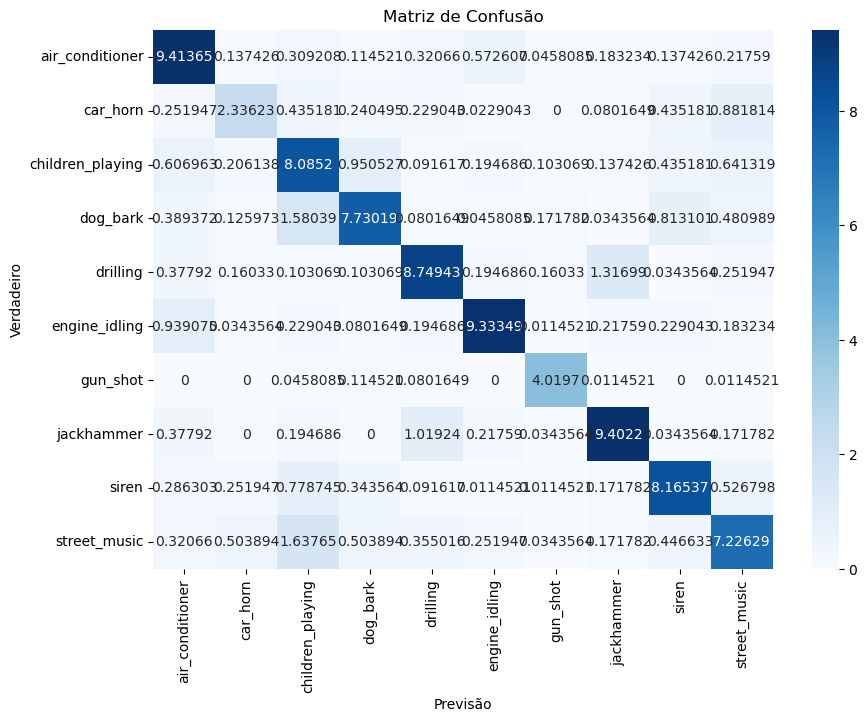

In [160]:
print(best_model.summary())
print("Learning rate: ", best_model_lr)
print("Number of epochs: ", best_model_n_epochs)
print("Batch Size: ", best_model_batch_size)
print("Accuracy: ", best_accuracy)
print("Loss: ", best_model_loss)
print("Standadr Deviation: ", best_model_std)

cm = pd.DataFrame(best_model_cf, index=label_encoder.classes_, columns=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Verdadeiro')
plt.show()

## Grid Search para MLP com 3 camadas escondidas e funções de ativação ReLU

In [161]:
learning_rate = [0.1, 0.01, 0.001]
epochs = [50, 100, 200]
batch_size = [16, 32, 64, 128]
best_model = None
best_accuracy = None
best_model_cf = None
best_model_loss = None
best_model_std = None
best_model_lr = None
best_model_n_epochs = None
best_model_batch_size = None

#KFold para fazer 10 cross validation
for i in learning_rate:
    for j in epochs:
        for m in batch_size:
            adam_optimizer = tf.keras.optimizers.Adam(learning_rate=i)
            # Definir o modelo
            model = tf.keras.models.Sequential([ 
                tf.keras.layers.Input(shape=(X_train.shape[1],)), 
                tf.keras.layers.Dense(n_neur[0], kernel_initializer=initialize_weights, activation='relu'), 
                tf.keras.layers.Dense(n_neur[1], kernel_initializer=initialize_weights, activation='relu'),
                tf.keras.layers.Dense(n_neur[2], kernel_initializer=initialize_weights, activation='relu'),
                tf.keras.layers.Dense(output_dim, activation='softmax', kernel_initializer=initialize_weights) 
            ])
            
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            folds = list(kf.split(X))
            all_accuracies = []
            all_confusion_matrices = []
            all_losses = []
            # Cross-validation com cada fold usado uma vez para teste, uma vez para desenvolvimento e 8 vezes para treino
            for fold_idx in range(len(folds)):
                # Selecionar fold para teste
                train_val_indices, test_indices = folds[fold_idx]

                # Selecionar fold para desenvolvimento
                dev_fold_idx = (fold_idx + 1) % len(folds)
                train_indices, dev_indices = folds[dev_fold_idx]

                # Treinamento e Desenvolvimento
                X_train, y_train = X[train_val_indices], y[train_val_indices]
                X_dev, y_dev = X[dev_indices], y[dev_indices]

                # Teste
                X_test, y_test = X[test_indices], y[test_indices]

                # Compilar o modelo
                model.compile(optimizer=adam_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

                model.summary()

                model.fit(X_train, y_train, epochs=j, batch_size=m, validation_data=(X_dev, y_dev), callbacks=[lr_scheduler, early_stopping])

                # Avaliar o modelo
                loss, accuracy = model.evaluate(X_test, y_test)

                all_accuracies.append(accuracy) 
                y_pred = model.predict(X_test) 
                y_pred_classes = np.argmax(y_pred, axis=1) 
                cm = confusion_matrix(y_test, y_pred_classes) 
                all_confusion_matrices.append(cm)
                all_losses.append(loss)

            accumulated_cm = np.sum(all_confusion_matrices, axis=0) 
            accumulated_cm_percentage = accumulated_cm / np.sum(accumulated_cm) * 100
            mean_accuracy = np.mean(all_accuracies) 
            std_accuracy = np.std(all_accuracies)
            mean_loss = np.mean(all_losses)
            print("Accuracy: ", mean_accuracy)
            print("Confusion Matrix: ", accumulated_cm_percentage)
            print("Loss: ", mean_loss)
            print("Standard Deviation: ", std_accuracy)
            
            if best_model == None or mean_accuracy > best_accuracy:
                best_model = model
                best_accuracy = mean_accuracy
                best_model_cf = accumulated_cm_percentage
                best_model_loss = mean_loss
                best_model_std = std_accuracy
                best_model_lr = i
                best_model_n_epochs = j
                best_model_batch_size = m  

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1107 - loss: 2.2827 - val_accuracy: 0.1076 - val_loss: 2.2790 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1138 - loss: 2.2773 - val_accuracy: 0.1030 - val_loss: 2.2797 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1181 - loss: 2.2753 - val_accuracy: 0.1224 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1085 - loss: 2.2778 - val_accuracy: 0.1247 - val_loss: 2.2960 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1123 - loss: 2.2883 - val_accuracy: 0.1053 - val_loss: 2.2667 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1128 - loss: 2.2805 - val_accuracy: 0.1076 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1193 - loss: 2.2763 - 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1134 - loss: 2.2836 - val_accuracy: 0.1180 - val_loss: 2.2558 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - accuracy: 0.1053 - loss: 2.2795 - val_accuracy: 0.1168 - val_loss: 2.2546 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1145 - loss: 2.2798 - val_accuracy: 0.1180 - val_loss: 2.2829 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.1068 - loss: 2.2840 - val_accuracy: 0.1042 - val_loss: 2.2640 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1208 - loss: 2.2810 - val_accuracy: 0.1168 - val_loss: 2.2723 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - accuracy: 0.1226 - loss: 2.2775 - val_accuracy: 0.1168 - val_loss: 2.2749 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.1033 - loss: 2

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1058 - loss: 2.2778 - val_accuracy: 0.1180 - val_loss: 2.2877 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1053 - loss: 2.2802 - val_accuracy: 0.0939 - val_loss: 2.2682 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1181 - loss: 2.2789 - val_accuracy: 0.1283 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1127 - loss: 2.2737 - val_accuracy: 0.1157 - val_loss: 2.2948 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1151 - loss: 2.2723 - val_accuracy: 0.1226 - val_loss: 2.2739 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1073 - loss: 2.2866 - val_accuracy: 0.1180 - val_loss: 2.2909 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1201 - loss: 2.2871 - 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1166 - loss: 2.2739 - val_accuracy: 0.0997 - val_loss: 2.2822 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1051 - loss: 2.2734 - val_accuracy: 0.1042 - val_loss: 2.2803 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - accuracy: 0.1173 - loss: 2.2753 - val_accuracy: 0.1100 - val_loss: 2.2845 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.0998 - loss: 2.2833 - val_accuracy: 0.1214 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1216 - loss: 2.2807 - val_accuracy: 0.1168 - val_loss: 2.2813 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - accuracy: 0.1178 - loss: 2.2799 - val_accuracy: 0.1077 - val_loss: 2.2965 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1172 - loss: 2.2

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1177 - loss: 2.2749 - val_accuracy: 0.1157 - val_loss: 2.2797 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1131 - loss: 2.2738 - val_accuracy: 0.1168 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1187 - loss: 2.2699 - val_accuracy: 0.1111 - val_loss: 2.2832 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1213 - loss: 2.2715 - val_accuracy: 0.1168 - val_loss: 2.2661 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1154 - loss: 2.2746 - val_accuracy: 0.1168 - val_loss: 2.2764 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1157 - loss: 2.2748 - val_accuracy: 0.1180 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1117 - loss: 2.2698 - 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1078 - loss: 2.2785 - val_accuracy: 0.0974 - val_loss: 2.2755 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1079 - loss: 2.2790 - val_accuracy: 0.0974 - val_loss: 2.2876 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1165 - loss: 2.2807 - val_accuracy: 0.1111 - val_loss: 2.2985 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1122 - loss: 2.2759 - val_accuracy: 0.1134 - val_loss: 2.2719 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1093 - loss: 2.2819 - val_accuracy: 0.1134 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1130 - loss: 2.2766 - val_accuracy: 0.1134 - val_loss: 2.2671 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1095 - loss: 2.2741 - 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1079 - loss: 2.2799 - val_accuracy: 0.1191 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1037 - loss: 2.2744 - val_accuracy: 0.1226 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1130 - loss: 2.2742 - val_accuracy: 0.1249 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1077 - loss: 2.2828 - val_accuracy: 0.1168 - val_loss: 2.2751 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.1106 - loss: 2.2784 - val_accuracy: 0.1168 - val_loss: 2.2911 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1099 - loss: 2.2785 - val_accuracy: 0.1168 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1115 - loss: 2.2840 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1106 - loss: 2.2813 - val_accuracy: 0.0939 - val_loss: 2.2868 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1188 - loss: 2.2759 - val_accuracy: 0.1168 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1108 - loss: 2.2713 - val_accuracy: 0.1134 - val_loss: 2.2717 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - accuracy: 0.1176 - loss: 2.2823 - val_accuracy: 0.1203 - val_loss: 2.2716 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1043 - loss: 2.2811 - val_accuracy: 0.1088 - val_loss: 2.2748 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - accuracy: 0.1196 - loss: 2.2778 - val_accuracy: 0.1203 - val_loss: 2.2772 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.1150 - loss: 2.2

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1129 - loss: 2.2760 - val_accuracy: 0.0985 - val_loss: 2.2721 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - accuracy: 0.1229 - loss: 2.2776 - val_accuracy: 0.1168 - val_loss: 2.3005 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1134 - loss: 2.2758 - val_accuracy: 0.1214 - val_loss: 2.2738 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1083 - loss: 2.2838 - val_accuracy: 0.1134 - val_loss: 2.2716 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1184 - loss: 2.2745 - val_accuracy: 0.1123 - val_loss: 2.2701 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1214 - loss: 2.2722 - val_accuracy: 0.1168 - val_loss: 2.2747 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1215 - loss: 2.2734 

Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1215 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1218 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1138 - loss: 2.2778 - val_accuracy: 0.1121 - val_loss: 2.2716 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1121 - loss: 2.2844 - val_accuracy: 0.1121 - val_loss: 2.2822 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1131 - loss: 2.2695 - val_accuracy: 0.1121 - val_loss: 2.2621 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1109 - loss: 2.2736 - val_accuracy: 0.1156 - val_loss: 2.2680 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1089 - loss: 2.2765 - val_accuracy: 0.1121 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1195 - loss: 2.2802 - val_accuracy: 0.1133 - val_loss: 2.2793 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1160 - loss: 2.2759 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1163 - loss: 2.2790 - val_accuracy: 0.1224 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1133 - loss: 2.2747 - val_accuracy: 0.1098 - val_loss: 2.2783 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1103 - loss: 2.2718 - val_accuracy: 0.1201 - val_loss: 2.2629 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1047 - loss: 2.2694 - val_accuracy: 0.1201 - val_loss: 2.2742 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1049 - loss: 2.2765 - val_accuracy: 0.1201 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1069 - loss: 2.2726 - val_accuracy: 0.1098 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1061 - loss: 2.2730 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1176 - loss: 2.2774 - val_accuracy: 0.1180 - val_loss: 2.2503 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1091 - loss: 2.2694 - val_accuracy: 0.1306 - val_loss: 2.2562 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1187 - loss: 2.2694 - val_accuracy: 0.0974 - val_loss: 2.2534 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.1136 - loss: 2.2724 - val_accuracy: 0.1306 - val_loss: 2.2483 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.0980 - loss: 2.2715 - val_accuracy: 0.1260 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1139 - loss: 2.2772 - val_accuracy: 0.0974 - val_loss: 2.2541 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1090 - loss: 2.2757 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1179 - loss: 2.2721 - val_accuracy: 0.1111 - val_loss: 2.2621 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1148 - loss: 2.2716 - val_accuracy: 0.1180 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1056 - loss: 2.2722 - val_accuracy: 0.1283 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1098 - loss: 2.2700 - val_accuracy: 0.1226 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1017 - loss: 2.2727 - val_accuracy: 0.1111 - val_loss: 2.2614 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1209 - loss: 2.2683 - val_accuracy: 0.1180 - val_loss: 2.2557 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1092 - loss: 2.2742 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1216 - loss: 2.2758 - val_accuracy: 0.1260 - val_loss: 2.2830 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1101 - loss: 2.2774 - val_accuracy: 0.1042 - val_loss: 2.2816 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1145 - loss: 2.2714 - val_accuracy: 0.0997 - val_loss: 2.2936 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1208 - loss: 2.2711 - val_accuracy: 0.1077 - val_loss: 2.2752 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1185 - loss: 2.2702 - val_accuracy: 0.1260 - val_loss: 2.2756 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1160 - loss: 2.2729 - val_accuracy: 0.1100 - val_loss: 2.2778 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1078 - loss: 2.2746 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1159 - loss: 2.2702 - val_accuracy: 0.1180 - val_loss: 2.2872 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1142 - loss: 2.2667 - val_accuracy: 0.1111 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1136 - loss: 2.2688 - val_accuracy: 0.1157 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - accuracy: 0.1114 - loss: 2.2687 - val_accuracy: 0.1180 - val_loss: 2.2747 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - accuracy: 0.1174 - loss: 2.2726 - val_accuracy: 0.1111 - val_loss: 2.2683 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1072 - loss: 2.2750 - val_accuracy: 0.1180 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.1155 - loss: 2.2

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1166 - loss: 2.2710 - val_accuracy: 0.1134 - val_loss: 2.2771 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1151 - loss: 2.2650 - val_accuracy: 0.1134 - val_loss: 2.2880 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1046 - loss: 2.2779 - val_accuracy: 0.1134 - val_loss: 2.2813 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1106 - loss: 2.2648 - val_accuracy: 0.1134 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1058 - loss: 2.2733 - val_accuracy: 0.1134 - val_loss: 2.2965 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1143 - loss: 2.2690 - val_accuracy: 0.1134 - val_loss: 2.2857 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1109 - loss: 2.2775 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1171 - loss: 2.2720 - val_accuracy: 0.1088 - val_loss: 2.2743 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1063 - loss: 2.2741 - val_accuracy: 0.1077 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1168 - loss: 2.2710 - val_accuracy: 0.1077 - val_loss: 2.2777 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1188 - loss: 2.2633 - val_accuracy: 0.1226 - val_loss: 2.2639 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1094 - loss: 2.2685 - val_accuracy: 0.1134 - val_loss: 2.2653 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1260 - loss: 2.2705 - val_accuracy: 0.0997 - val_loss: 2.2620 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1166 - loss: 2.2696 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1124 - loss: 2.2729 - val_accuracy: 0.1134 - val_loss: 2.2763 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1065 - loss: 2.2719 - val_accuracy: 0.1088 - val_loss: 2.2671 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1137 - loss: 2.2726 - val_accuracy: 0.1271 - val_loss: 2.2611 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1215 - loss: 2.2771 - val_accuracy: 0.1271 - val_loss: 2.2636 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1204 - loss: 2.2799 - val_accuracy: 0.1088 - val_loss: 2.2601 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1104 - loss: 2.2742 - val_accuracy: 0.0939 - val_loss: 2.2639 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1053 - loss: 2.2772 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1104 - loss: 2.2702 - val_accuracy: 0.1031 - val_loss: 2.2832 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1054 - loss: 2.2674 - val_accuracy: 0.1031 - val_loss: 2.3002 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1036 - loss: 2.2771 - val_accuracy: 0.1065 - val_loss: 2.2714 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1171 - loss: 2.2727 - val_accuracy: 0.1214 - val_loss: 2.2773 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1063 - loss: 2.2707 - val_accuracy: 0.1031 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1203 - loss: 2.2742 - val_accuracy: 0.0985 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1114 - loss: 2.2729 - 

Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1219 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1106 - loss: 2.2689 - val_accuracy: 0.1236 - val_loss: 2.2593 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1144 - loss: 2.2700 - val_accuracy: 0.1053 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1195 - loss: 2.2713 - val_accuracy: 0.1236 - val_loss: 2.2768 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1141 - loss: 2.2654 - val_accuracy: 0.1121 - val_loss: 2.2576 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1110 - loss: 2.2735 - val_accuracy: 0.1259 - val_loss: 2.2615 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1125 - loss: 2.2771 - val_accuracy: 0.1156 - val_loss: 2.2595 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1166 - loss: 2.2699 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1100 - loss: 2.2771 - val_accuracy: 0.1076 - val_loss: 2.2742 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1119 - loss: 2.2678 - val_accuracy: 0.1030 - val_loss: 2.2660 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.2682 - val_accuracy: 0.1098 - val_loss: 2.2700 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1101 - loss: 2.2689 - val_accuracy: 0.1201 - val_loss: 2.2651 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1188 - loss: 2.2695 - val_accuracy: 0.1098 - val_loss: 2.2718 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1075 - loss: 2.2636 - val_accuracy: 0.1201 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1161 - loss: 2.2602 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1134 - loss: 2.2725 - val_accuracy: 0.1306 - val_loss: 2.2528 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1123 - loss: 2.2731 - val_accuracy: 0.1042 - val_loss: 2.2573 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1145 - loss: 2.2715 - val_accuracy: 0.1168 - val_loss: 2.2538 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1038 - loss: 2.2665 - val_accuracy: 0.1260 - val_loss: 2.2578 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1069 - loss: 2.2676 - val_accuracy: 0.1180 - val_loss: 2.2490 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1202 - loss: 2.2632 - val_accuracy: 0.1180 - val_loss: 2.2743 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1103 - loss: 2.2742 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1158 - loss: 2.2702 - val_accuracy: 0.1157 - val_loss: 2.2710 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1156 - loss: 2.2727 - val_accuracy: 0.1111 - val_loss: 2.2567 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1151 - loss: 2.2743 - val_accuracy: 0.1226 - val_loss: 2.2543 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1067 - loss: 2.2724 - val_accuracy: 0.1065 - val_loss: 2.2657 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1163 - loss: 2.2700 - val_accuracy: 0.1180 - val_loss: 2.2540 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1086 - loss: 2.2659 - val_accuracy: 0.1065 - val_loss: 2.2566 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1107 - loss: 2.2710 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1131 - loss: 2.2611 - val_accuracy: 0.1100 - val_loss: 2.2873 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1178 - loss: 2.2685 - val_accuracy: 0.0997 - val_loss: 2.2782 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1129 - loss: 2.2700 - val_accuracy: 0.1042 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1144 - loss: 2.2660 - val_accuracy: 0.1042 - val_loss: 2.2748 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1055 - loss: 2.2677 - val_accuracy: 0.1042 - val_loss: 2.2795 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1140 - loss: 2.2659 - val_accuracy: 0.1042 - val_loss: 2.2788 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1108 - loss: 2.2643 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1095 - loss: 2.2678 - val_accuracy: 0.1157 - val_loss: 2.2776 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1137 - loss: 2.2650 - val_accuracy: 0.1157 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1176 - loss: 2.2691 - val_accuracy: 0.1203 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1097 - loss: 2.2719 - val_accuracy: 0.1157 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1075 - loss: 2.2675 - val_accuracy: 0.1168 - val_loss: 2.2629 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0997 - loss: 2.2688 - val_accuracy: 0.1203 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1108 - loss: 2.2714 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1059 - loss: 2.2692 - val_accuracy: 0.1134 - val_loss: 2.2740 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1162 - loss: 2.2676 - val_accuracy: 0.1123 - val_loss: 2.2803 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1220 - loss: 2.2628 - val_accuracy: 0.1054 - val_loss: 2.2669 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1159 - loss: 2.2676 - val_accuracy: 0.1134 - val_loss: 2.2646 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1114 - loss: 2.2638 - val_accuracy: 0.1123 - val_loss: 2.2718 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1142 - loss: 2.2656 - val_accuracy: 0.1134 - val_loss: 2.2786 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1102 - loss: 2.2687 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1173 - loss: 2.2699 - val_accuracy: 0.1226 - val_loss: 2.2568 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1080 - loss: 2.2670 - val_accuracy: 0.1249 - val_loss: 2.2561 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1169 - loss: 2.2683 - val_accuracy: 0.1134 - val_loss: 2.2603 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1091 - loss: 2.2614 - val_accuracy: 0.1134 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2667 - val_accuracy: 0.1088 - val_loss: 2.2627 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1071 - loss: 2.2711 - val_accuracy: 0.1249 - val_loss: 2.2578 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1169 - loss: 2.2668 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.0988 - loss: 2.2730 - val_accuracy: 0.1088 - val_loss: 2.2787 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1108 - loss: 2.2718 - val_accuracy: 0.1134 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1086 - loss: 2.2635 - val_accuracy: 0.1271 - val_loss: 2.2657 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1065 - loss: 2.2691 - val_accuracy: 0.1271 - val_loss: 2.2560 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2692 - val_accuracy: 0.1226 - val_loss: 2.2702 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1135 - loss: 2.2694 - val_accuracy: 0.0939 - val_loss: 2.2646 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1115 - loss: 2.2675 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1201 - loss: 2.2621 - val_accuracy: 0.1214 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1088 - loss: 2.2660 - val_accuracy: 0.1134 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1127 - loss: 2.2680 - val_accuracy: 0.1065 - val_loss: 2.2682 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1090 - loss: 2.2680 - val_accuracy: 0.1123 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1162 - loss: 2.2667 - val_accuracy: 0.1214 - val_loss: 2.2693 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1029 - loss: 2.2640 - val_accuracy: 0.1134 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1130 - loss: 2.2611 - 

Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1223 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1225 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1068 - loss: 2.2702 - val_accuracy: 0.1121 - val_loss: 2.2571 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1111 - loss: 2.2621 - val_accuracy: 0.1133 - val_loss: 2.2579 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1188 - loss: 2.2689 - val_accuracy: 0.1259 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1136 - loss: 2.2648 - val_accuracy: 0.1121 - val_loss: 2.2620 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1143 - loss: 2.2719 - val_accuracy: 0.1156 - val_loss: 2.2630 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1131 - loss: 2.2700 - val_accuracy: 0.1156 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1141 - loss: 2.2678 - 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1117 - loss: 2.2766 - val_accuracy: 0.1224 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1235 - loss: 2.2651 - val_accuracy: 0.1247 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1114 - loss: 2.2603 - val_accuracy: 0.1224 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1068 - loss: 2.2668 - val_accuracy: 0.1247 - val_loss: 2.2675 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1186 - loss: 2.2676 - val_accuracy: 0.1201 - val_loss: 2.2651 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1103 - loss: 2.2635 - val_accuracy: 0.1098 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1161 - loss: 2.2606 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.1058 - loss: 2.2695 - val_accuracy: 0.1260 - val_loss: 2.2557 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1173 - loss: 2.2609 - val_accuracy: 0.1168 - val_loss: 2.2559 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1158 - loss: 2.2674 - val_accuracy: 0.1306 - val_loss: 2.2449 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1176 - loss: 2.2597 - val_accuracy: 0.1042 - val_loss: 2.2530 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1090 - loss: 2.2661 - val_accuracy: 0.1306 - val_loss: 2.2506 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1054 - loss: 2.2623 - val_accuracy: 0.0974 - val_loss: 2.2559 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1131 - loss: 2.2658 - val_accuracy:

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1127 - loss: 2.2672 - val_accuracy: 0.0939 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1187 - loss: 2.2652 - val_accuracy: 0.1111 - val_loss: 2.2581 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1151 - loss: 2.2641 - val_accuracy: 0.0939 - val_loss: 2.2653 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1115 - loss: 2.2690 - val_accuracy: 0.1157 - val_loss: 2.2680 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1137 - loss: 2.2677 - val_accuracy: 0.1157 - val_loss: 2.2615 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1112 - loss: 2.2692 - val_accuracy: 0.1157 - val_loss: 2.2634 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1166 - loss: 2.2685 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1110 - loss: 2.2695 - val_accuracy: 0.1100 - val_loss: 2.2708 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1136 - loss: 2.2717 - val_accuracy: 0.1168 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1152 - loss: 2.2650 - val_accuracy: 0.1042 - val_loss: 2.2761 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1091 - loss: 2.2735 - val_accuracy: 0.1260 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1225 - loss: 2.2603 - val_accuracy: 0.1214 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1133 - loss: 2.2697 - val_accuracy: 0.0997 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1111 - loss: 2.2594 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1174 - loss: 2.2626 - val_accuracy: 0.1111 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1051 - loss: 2.2682 - val_accuracy: 0.1111 - val_loss: 2.2642 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1063 - loss: 2.2641 - val_accuracy: 0.1180 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1041 - loss: 2.2674 - val_accuracy: 0.1111 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1048 - loss: 2.2618 - val_accuracy: 0.1180 - val_loss: 2.2667 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1162 - loss: 2.2564 - val_accuracy: 0.1111 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1137 - loss: 2.2639 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.1135 - loss: 2.2646 - val_accuracy: 0.1363 - val_loss: 2.2637 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1127 - loss: 2.2616 - val_accuracy: 0.1054 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1082 - loss: 2.2658 - val_accuracy: 0.1363 - val_loss: 2.2620 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1152 - loss: 2.2665 - val_accuracy: 0.1054 - val_loss: 2.2688 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1207 - loss: 2.2615 - val_accuracy: 0.1054 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1049 - loss: 2.2664 - val_accuracy: 0.1134 - val_loss: 2.2662 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1234 - loss: 2.2601 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.1171 - loss: 2.2637 - val_accuracy: 0.0997 - val_loss: 2.2594 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1088 - loss: 2.2673 - val_accuracy: 0.1226 - val_loss: 2.2583 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1044 - loss: 2.2652 - val_accuracy: 0.1077 - val_loss: 2.2583 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1145 - loss: 2.2627 - val_accuracy: 0.1077 - val_loss: 2.2599 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1159 - loss: 2.2671 - val_accuracy: 0.1226 - val_loss: 2.2560 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1147 - loss: 2.2626 - val_accuracy: 0.1134 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1170 - loss: 2.2603 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1091 - loss: 2.2668 - val_accuracy: 0.1088 - val_loss: 2.2599 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1174 - loss: 2.2630 - val_accuracy: 0.1271 - val_loss: 2.2587 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1183 - loss: 2.2594 - val_accuracy: 0.1134 - val_loss: 2.2581 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1114 - loss: 2.2647 - val_accuracy: 0.1088 - val_loss: 2.2662 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1172 - loss: 2.2679 - val_accuracy: 0.0939 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1112 - loss: 2.2611 - val_accuracy: 0.1088 - val_loss: 2.2628 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1144 - loss: 2.2662 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1144 - loss: 2.2643 - val_accuracy: 0.1317 - val_loss: 2.2638 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1107 - loss: 2.2657 - val_accuracy: 0.1031 - val_loss: 2.2662 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2666 - val_accuracy: 0.1123 - val_loss: 2.2636 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2621 - val_accuracy: 0.1065 - val_loss: 2.2667 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1059 - loss: 2.2679 - val_accuracy: 0.1134 - val_loss: 2.2775 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1121 - loss: 2.2683 - val_accuracy: 0.1134 - val_loss: 2.2709 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1153 - loss: 2.2592 - val_accuracy: 

Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1227 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1051 - loss: 2.2605 - val_accuracy: 0.1133 - val_loss: 2.2634 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1166 - loss: 2.2677 - val_accuracy: 0.1133 - val_loss: 2.2585 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1132 - loss: 2.2631 - val_accuracy: 0.1259 - val_loss: 2.2570 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1159 - loss: 2.2570 - val_accuracy: 0.1041 - val_loss: 2.2652 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1069 - loss: 2.2679 - val_accuracy: 0.1156 - val_loss: 2.2575 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1193 - loss: 2.2649 - val_accuracy: 0.1053 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1042 - loss: 2.2662 - val_accuracy: 

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1105 - loss: 2.2833 - val_accuracy: 0.1053 - val_loss: 2.2745 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.1067 - loss: 2.2842 - val_accuracy: 0.1098 - val_loss: 2.2948 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1244 - loss: 2.2802 - val_accuracy: 0.1098 - val_loss: 2.2919 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1163 - loss: 2.2870 - val_accuracy: 0.1053 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - accuracy: 0.1107 - loss: 2.2791 - val_accuracy: 0.1247 - val_loss: 2.2689 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.1230 - loss: 2.2737 - val_accuracy: 0.1053 - val_loss: 2.2847 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1144 - lo

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1162 - loss: 2.2760 - val_accuracy: 0.1180 - val_loss: 2.2534 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1118 - loss: 2.2805 - val_accuracy: 0.1168 - val_loss: 2.2909 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1076 - loss: 2.2851 - val_accuracy: 0.1042 - val_loss: 2.2652 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1096 - loss: 2.2730 - val_accuracy: 0.1168 - val_loss: 2.2563 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1261 - loss: 2.2700 - val_accuracy: 0.1180 - val_loss: 2.2632 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1209 - loss: 2.2755 - val_accuracy: 0.1260 - val_loss: 2.2638 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1112 - loss: 2.

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1078 - loss: 2.2801 - val_accuracy: 0.1226 - val_loss: 2.2621 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1012 - loss: 2.2759 - val_accuracy: 0.1111 - val_loss: 2.2740 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - accuracy: 0.1033 - loss: 2.2869 - val_accuracy: 0.1226 - val_loss: 2.2559 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.1153 - loss: 2.2758 - val_accuracy: 0.1180 - val_loss: 2.2699 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.1135 - loss: 2.2845 - val_accuracy: 0.1180 - val_loss: 2.2675 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - accuracy: 0.1147 - loss: 2.2829 - val_accuracy: 0.1180 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - accuracy: 0.1070 

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1168 - loss: 2.2759 - val_accuracy: 0.1077 - val_loss: 2.2908 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - accuracy: 0.1171 - loss: 2.2818 - val_accuracy: 0.1042 - val_loss: 2.2867 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.1096 - loss: 2.2827 - val_accuracy: 0.1100 - val_loss: 2.2892 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - accuracy: 0.1165 - loss: 2.2755 - val_accuracy: 0.1100 - val_loss: 2.2886 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.1176 - loss: 2.2788 - val_accuracy: 0.1077 - val_loss: 2.2767 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1122 - loss: 2.2786 - val_accuracy: 0.1168 - val_loss: 2.2863 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1073 - 

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1162 - loss: 2.2761 - val_accuracy: 0.1111 - val_loss: 2.2684 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1067 - loss: 2.2784 - val_accuracy: 0.1111 - val_loss: 2.2872 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1166 - loss: 2.2715 - val_accuracy: 0.1203 - val_loss: 2.2711 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.1154 - loss: 2.2734 - val_accuracy: 0.1111 - val_loss: 2.2938 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1151 - loss: 2.2771 - val_accuracy: 0.1111 - val_loss: 2.2974 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1034 - loss: 2.2795 - val_accuracy: 0.1111 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1184 - loss: 

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1207 - loss: 2.2772 - val_accuracy: 0.1134 - val_loss: 2.2885 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.1083 - loss: 2.2805 - val_accuracy: 0.0974 - val_loss: 2.2757 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1111 - loss: 2.2780 - val_accuracy: 0.1054 - val_loss: 2.2945 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - accuracy: 0.1075 - loss: 2.2775 - val_accuracy: 0.1054 - val_loss: 2.2685 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1192 - loss: 2.2760 - val_accuracy: 0.1054 - val_loss: 2.2770 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1167 - loss: 2.2742 - val_accuracy: 0.1134 - val_loss: 2.2710 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1103 - loss

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1074 - loss: 2.2748 - val_accuracy: 0.1134 - val_loss: 2.2702 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1044 - loss: 2.2827 - val_accuracy: 0.1134 - val_loss: 2.2781 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - accuracy: 0.1102 - loss: 2.2713 - val_accuracy: 0.1134 - val_loss: 2.2738 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1130 - loss: 2.2821 - val_accuracy: 0.1226 - val_loss: 2.2574 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1126 - loss: 2.2790 - val_accuracy: 0.1134 - val_loss: 2.2817 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1190 - loss: 2.2741 - val_accuracy: 0.1226 - val_loss: 2.2731 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1123 - loss: 

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1214 - loss: 2.2770 - val_accuracy: 0.1271 - val_loss: 2.2697 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1117 - loss: 2.2737 - val_accuracy: 0.1088 - val_loss: 2.2772 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1203 - loss: 2.2720 - val_accuracy: 0.1271 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1022 - loss: 2.2815 - val_accuracy: 0.1168 - val_loss: 2.2900 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1158 - loss: 2.2713 - val_accuracy: 0.1134 - val_loss: 2.2757 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1120 - loss: 2.2738 - val_accuracy: 0.1088 - val_loss: 2.2929 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1118 - loss: 2.

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1090 - loss: 2.2766 - val_accuracy: 0.1168 - val_loss: 2.2728 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.1128 - loss: 2.2814 - val_accuracy: 0.0985 - val_loss: 2.2785 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1117 - loss: 2.2748 - val_accuracy: 0.1168 - val_loss: 2.2751 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1050 - loss: 2.2861 - val_accuracy: 0.1031 - val_loss: 2.2898 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - accuracy: 0.1154 - loss: 2.2780 - val_accuracy: 0.1317 - val_loss: 2.2766 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - accuracy: 0.1103 - loss: 2.2752 - val_accuracy: 0.1317 - val_loss: 2.2711 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1181 - lo

Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1231 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1232 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1118 - loss: 2.2810 - val_accuracy: 0.1133 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1077 - loss: 2.2784 - val_accuracy: 0.1121 - val_loss: 2.2645 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1043 - loss: 2.2792 - val_accuracy: 0.1133 - val_loss: 2.2658 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1152 - loss: 2.2775 - val_accuracy: 0.1041 - val_loss: 2.2783 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1106 - loss: 2.2786 - val_accuracy: 0.1041 - val_loss: 2.2796 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1064 - loss: 2.2717 - val_accuracy: 0.1053 - val_loss: 2.2657 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1122 - loss: 2.

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1193 - loss: 2.2708 - val_accuracy: 0.1224 - val_loss: 2.2714 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.1107 - loss: 2.2704 - val_accuracy: 0.1224 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.1084 - loss: 2.2726 - val_accuracy: 0.1030 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1178 - loss: 2.2727 - val_accuracy: 0.1224 - val_loss: 2.2673 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1124 - loss: 2.2735 - val_accuracy: 0.1201 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1143 - loss: 2.2694 - val_accuracy: 0.1030 - val_loss: 2.2909 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1163 - loss

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1141 - loss: 2.2693 - val_accuracy: 0.1168 - val_loss: 2.2545 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1153 - loss: 2.2697 - val_accuracy: 0.1042 - val_loss: 2.2575 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1249 - loss: 2.2634 - val_accuracy: 0.1306 - val_loss: 2.2831 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1278 - loss: 2.2704 - val_accuracy: 0.0974 - val_loss: 2.2727 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1064 - loss: 2.2678 - val_accuracy: 0.0974 - val_loss: 2.2641 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1167 - loss: 2.2729 - val_accuracy: 0.0974 - val_loss: 2.2665 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1128 - loss: 2.

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1113 - loss: 2.2669 - val_accuracy: 0.1065 - val_loss: 2.2644 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.1071 - loss: 2.2736 - val_accuracy: 0.1226 - val_loss: 2.2598 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.1169 - loss: 2.2749 - val_accuracy: 0.1283 - val_loss: 2.2561 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1048 - loss: 2.2710 - val_accuracy: 0.0939 - val_loss: 2.2646 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1198 - loss: 2.2732 - val_accuracy: 0.1111 - val_loss: 2.2703 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1139 - loss: 2.2742 - val_accuracy: 0.1180 - val_loss: 2.2642 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1187 - loss

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1125 - loss: 2.2671 - val_accuracy: 0.1168 - val_loss: 2.2839 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.1164 - loss: 2.2822 - val_accuracy: 0.1214 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.1083 - loss: 2.2686 - val_accuracy: 0.1214 - val_loss: 2.2802 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.1126 - loss: 2.2757 - val_accuracy: 0.1100 - val_loss: 2.2797 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.0979 - loss: 2.2719 - val_accuracy: 0.1042 - val_loss: 2.2976 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1089 - loss: 2.2768 - val_accuracy: 0.1260 - val_loss: 2.2743 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.1149 - 

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1129 - loss: 2.2679 - val_accuracy: 0.1157 - val_loss: 2.2798 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1029 - loss: 2.2759 - val_accuracy: 0.1180 - val_loss: 2.2673 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1219 - loss: 2.2680 - val_accuracy: 0.1168 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1154 - loss: 2.2726 - val_accuracy: 0.1111 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1139 - loss: 2.2689 - val_accuracy: 0.1203 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1098 - loss: 2.2656 - val_accuracy: 0.1180 - val_loss: 2.2702 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - accuracy: 0.1170 - loss: 

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1104 - loss: 2.2724 - val_accuracy: 0.1363 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - accuracy: 0.1108 - loss: 2.2748 - val_accuracy: 0.1363 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - accuracy: 0.1142 - loss: 2.2773 - val_accuracy: 0.1134 - val_loss: 2.2690 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - accuracy: 0.1080 - loss: 2.2698 - val_accuracy: 0.1111 - val_loss: 2.2764 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1129 - loss: 2.2735 - val_accuracy: 0.1363 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1145 - loss: 2.2666 - val_accuracy: 0.1134 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1093 - lo

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1087 - loss: 2.2764 - val_accuracy: 0.1249 - val_loss: 2.2801 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1124 - loss: 2.2695 - val_accuracy: 0.1088 - val_loss: 2.2639 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1149 - loss: 2.2777 - val_accuracy: 0.1226 - val_loss: 2.2600 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1142 - loss: 2.2666 - val_accuracy: 0.1191 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1035 - loss: 2.2674 - val_accuracy: 0.1226 - val_loss: 2.2601 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1149 - loss: 2.2726 - val_accuracy: 0.1226 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1105 - loss: 2.

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1148 - loss: 2.2715 - val_accuracy: 0.0939 - val_loss: 2.2681 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1072 - loss: 2.2747 - val_accuracy: 0.1271 - val_loss: 2.2743 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1274 - loss: 2.2736 - val_accuracy: 0.1088 - val_loss: 2.2635 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1188 - loss: 2.2746 - val_accuracy: 0.1088 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1173 - loss: 2.2741 - val_accuracy: 0.1271 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1139 - loss: 2.2687 - val_accuracy: 0.0939 - val_loss: 2.2784 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 2.

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1179 - loss: 2.2706 - val_accuracy: 0.1134 - val_loss: 2.2639 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1181 - loss: 2.2737 - val_accuracy: 0.1214 - val_loss: 2.2765 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1142 - loss: 2.2771 - val_accuracy: 0.1123 - val_loss: 2.2824 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1125 - loss: 2.2744 - val_accuracy: 0.1065 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1127 - loss: 2.2685 - val_accuracy: 0.1065 - val_loss: 2.2709 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1108 - loss: 2.2714 - val_accuracy: 0.1065 - val_loss: 2.2829 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1095 - loss: 2.

Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1235 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1085 - loss: 2.2764 - val_accuracy: 0.1121 - val_loss: 2.2593 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1132 - loss: 2.2691 - val_accuracy: 0.1156 - val_loss: 2.2591 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1115 - loss: 2.2709 - val_accuracy: 0.1121 - val_loss: 2.2982 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.1095 - loss: 2.2789 - val_accuracy: 0.1041 - val_loss: 2.2687 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2691 - val_accuracy: 0.1053 - val_loss: 2.2773 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1191 - loss: 2.2717 - val_accuracy: 0.1133 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1059 - loss: 

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1140 - loss: 2.2737 - val_accuracy: 0.1098 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1068 - loss: 2.2707 - val_accuracy: 0.1030 - val_loss: 2.2644 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1152 - loss: 2.2661 - val_accuracy: 0.1030 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1112 - loss: 2.2644 - val_accuracy: 0.1053 - val_loss: 2.2815 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2684 - val_accuracy: 0.1098 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.1158 - loss: 2.2700 - val_accuracy: 0.1201 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1115 - loss: 

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1213 - loss: 2.2691 - val_accuracy: 0.1042 - val_loss: 2.2558 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1166 - loss: 2.2645 - val_accuracy: 0.1306 - val_loss: 2.2508 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1183 - loss: 2.2660 - val_accuracy: 0.0974 - val_loss: 2.2637 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1112 - loss: 2.2666 - val_accuracy: 0.1271 - val_loss: 2.2546 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1157 - loss: 2.2631 - val_accuracy: 0.0974 - val_loss: 2.2599 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1039 - loss: 2.2698 - val_accuracy: 0.1168 - val_loss: 2.2628 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1131 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1061 - loss: 2.2635 - val_accuracy: 0.1111 - val_loss: 2.2584 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1070 - loss: 2.2708 - val_accuracy: 0.1157 - val_loss: 2.2621 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1129 - loss: 2.2669 - val_accuracy: 0.1065 - val_loss: 2.2607 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1118 - loss: 2.2662 - val_accuracy: 0.1111 - val_loss: 2.2626 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1090 - loss: 2.2738 - val_accuracy: 0.1180 - val_loss: 2.2591 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1136 - loss: 2.2647 - val_accuracy: 0.1283 - val_loss: 2.2526 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1161 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1208 - loss: 2.2686 - val_accuracy: 0.0997 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1164 - loss: 2.2652 - val_accuracy: 0.1260 - val_loss: 2.2734 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1124 - loss: 2.2712 - val_accuracy: 0.1260 - val_loss: 2.2825 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1096 - loss: 2.2719 - val_accuracy: 0.1100 - val_loss: 2.2741 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1123 - loss: 2.2659 - val_accuracy: 0.0997 - val_loss: 2.2731 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1082 - loss: 2.2632 - val_accuracy: 0.0997 - val_loss: 2.2798 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1202 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1105 - loss: 2.2669 - val_accuracy: 0.1111 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1177 - loss: 2.2623 - val_accuracy: 0.1111 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1093 - loss: 2.2720 - val_accuracy: 0.1157 - val_loss: 2.2680 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1125 - loss: 2.2694 - val_accuracy: 0.1111 - val_loss: 2.2657 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1144 - loss: 2.2631 - val_accuracy: 0.1180 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1109 - loss: 2.2661 - val_accuracy: 0.1111 - val_loss: 2.2703 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1062 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.1105 - loss: 2.2663 - val_accuracy: 0.1134 - val_loss: 2.2703 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1169 - loss: 2.2657 - val_accuracy: 0.1134 - val_loss: 2.2769 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1135 - loss: 2.2671 - val_accuracy: 0.1134 - val_loss: 2.2750 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1058 - loss: 2.2679 - val_accuracy: 0.1363 - val_loss: 2.2721 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1131 - loss: 2.2695 - val_accuracy: 0.1123 - val_loss: 2.2683 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1139 - loss: 2.2674 - val_accuracy: 0.1363 - val_loss: 2.2631 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1129 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1114 - loss: 2.2680 - val_accuracy: 0.1226 - val_loss: 2.2540 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1074 - loss: 2.2723 - val_accuracy: 0.1134 - val_loss: 2.2565 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1115 - loss: 2.2648 - val_accuracy: 0.1226 - val_loss: 2.2569 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1157 - loss: 2.2678 - val_accuracy: 0.1134 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1205 - loss: 2.2648 - val_accuracy: 0.1134 - val_loss: 2.2782 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1121 - loss: 2.2707 - val_accuracy: 0.1191 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1168 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1075 - loss: 2.2683 - val_accuracy: 0.0939 - val_loss: 2.2703 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1119 - loss: 2.2757 - val_accuracy: 0.1134 - val_loss: 2.2714 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1166 - loss: 2.2619 - val_accuracy: 0.1203 - val_loss: 2.2673 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1041 - loss: 2.2702 - val_accuracy: 0.1134 - val_loss: 2.2626 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1144 - loss: 2.2652 - val_accuracy: 0.1168 - val_loss: 2.2617 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1175 - loss: 2.2697 - val_accuracy: 0.1088 - val_loss: 2.2638 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1202 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1095 - loss: 2.2690 - val_accuracy: 0.1134 - val_loss: 2.2738 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1057 - loss: 2.2666 - val_accuracy: 0.1134 - val_loss: 2.2710 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1189 - loss: 2.2595 - val_accuracy: 0.1168 - val_loss: 2.2670 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1086 - loss: 2.2674 - val_accuracy: 0.1065 - val_loss: 2.2689 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1183 - loss: 2.2718 - val_accuracy: 0.1168 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1168 - loss: 2.2679 - val_accuracy: 0.1123 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1184 - loss: 2.

Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1127 - loss: 2.2637 - val_accuracy: 0.1156 - val_loss: 2.2587 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1110 - loss: 2.2673 - val_accuracy: 0.1259 - val_loss: 2.2596 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1034 - loss: 2.2677 - val_accuracy: 0.1121 - val_loss: 2.2641 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1088 - loss: 2.2684 - val_accuracy: 0.1041 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1135 - loss: 2.2639 - val_accuracy: 0.1053 - val_loss: 2.2687 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1060 - loss: 2.2688 - val_accuracy: 0.1121 - val_loss: 2.2639 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1059 - loss: 2.

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1561 - loss: 2.1738 - val_accuracy: 0.2597 - val_loss: 1.8097 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2807 - loss: 1.8219 - val_accuracy: 0.3330 - val_loss: 1.6786 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3434 - loss: 1.6705 - val_accuracy: 0.4314 - val_loss: 1.4965 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4031 - loss: 1.5179 - val_accuracy: 0.4073 - val_loss: 1.4399 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4020 - loss: 1.4957 - val_accuracy: 0.4039 - val_loss: 1.5037 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4211 - loss: 1.4770 - val_accuracy: 0.4073 - val_loss: 1.4396 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4263 - loss: 1.4484 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4603 - loss: 1.4146 - val_accuracy: 0.4135 - val_loss: 1.3949 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4681 - loss: 1.3797 - val_accuracy: 0.4112 - val_loss: 1.5065 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4514 - loss: 1.4091 - val_accuracy: 0.4662 - val_loss: 1.3618 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4696 - loss: 1.3902 - val_accuracy: 0.4513 - val_loss: 1.3807 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4672 - loss: 1.3802 - val_accuracy: 0.4605 - val_loss: 1.3673 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4633 - loss: 1.3814 - val_accuracy: 0.4662 - val_loss: 1.3750 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4581 - loss: 1.3944 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4517 - loss: 1.4370 - val_accuracy: 0.4685 - val_loss: 1.4345 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4530 - loss: 1.4006 - val_accuracy: 0.3986 - val_loss: 1.5643 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4337 - loss: 1.4646 - val_accuracy: 0.4708 - val_loss: 1.4671 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4530 - loss: 1.4170 - val_accuracy: 0.4651 - val_loss: 1.4241 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4678 - loss: 1.3983 - val_accuracy: 0.4639 - val_loss: 1.4730 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4562 - loss: 1.4100 - val_accuracy: 0.4616 - val_loss: 1.4178 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4669 - loss: 1.3643 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4555 - loss: 1.3857 - val_accuracy: 0.4559 - val_loss: 1.3994 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4736 - loss: 1.3647 - val_accuracy: 0.4834 - val_loss: 1.2967 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4752 - loss: 1.3603 - val_accuracy: 0.4834 - val_loss: 1.3164 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4536 - loss: 1.3767 - val_accuracy: 0.4971 - val_loss: 1.3433 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4776 - loss: 1.3541 - val_accuracy: 0.4983 - val_loss: 1.3139 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4748 - loss: 1.3723 - val_accuracy: 0.5178 - val_loss: 1.3021 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4701 - loss: 1.3609 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4602 - loss: 1.4099 - val_accuracy: 0.4548 - val_loss: 1.3535 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4703 - loss: 1.3601 - val_accuracy: 0.4777 - val_loss: 1.3859 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4732 - loss: 1.3595 - val_accuracy: 0.4777 - val_loss: 1.3855 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4544 - loss: 1.4067 - val_accuracy: 0.4387 - val_loss: 1.3634 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4765 - loss: 1.3373 - val_accuracy: 0.4845 - val_loss: 1.4043 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4627 - loss: 1.3602 - val_accuracy: 0.4593 - val_loss: 1.3399 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4687 - loss: 1.3723 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4728 - loss: 1.3709 - val_accuracy: 0.5074 - val_loss: 1.3462 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4841 - loss: 1.3624 - val_accuracy: 0.4731 - val_loss: 1.4152 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4647 - loss: 1.3828 - val_accuracy: 0.4719 - val_loss: 1.3937 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4905 - loss: 1.3596 - val_accuracy: 0.4055 - val_loss: 1.4557 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4579 - loss: 1.3787 - val_accuracy: 0.5006 - val_loss: 1.3288 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4775 - loss: 1.3620 - val_accuracy: 0.4593 - val_loss: 1.3588 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4685 - loss: 1.3590 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4748 - loss: 1.3422 - val_accuracy: 0.4845 - val_loss: 1.3605 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4720 - loss: 1.3501 - val_accuracy: 0.5315 - val_loss: 1.2570 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4888 - loss: 1.3327 - val_accuracy: 0.4948 - val_loss: 1.3308 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4736 - loss: 1.3749 - val_accuracy: 0.4994 - val_loss: 1.3781 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4637 - loss: 1.3685 - val_accuracy: 0.5006 - val_loss: 1.3055 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4774 - loss: 1.3594 - val_accuracy: 0.4674 - val_loss: 1.3213 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4536 - loss: 1.3803 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4438 - loss: 1.4153 - val_accuracy: 0.4948 - val_loss: 1.3039 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4786 - loss: 1.3363 - val_accuracy: 0.4559 - val_loss: 1.4248 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4486 - loss: 1.4032 - val_accuracy: 0.4318 - val_loss: 1.5147 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4637 - loss: 1.3900 - val_accuracy: 0.4754 - val_loss: 1.3775 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4729 - loss: 1.3563 - val_accuracy: 0.5029 - val_loss: 1.2756 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4847 - loss: 1.3334 - val_accuracy: 0.4914 - val_loss: 1.3020 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4819 - loss: 1.3421 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4675 - loss: 1.3526 - val_accuracy: 0.4525 - val_loss: 1.3981 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4631 - loss: 1.3897 - val_accuracy: 0.4777 - val_loss: 1.3091 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4677 - loss: 1.3408 - val_accuracy: 0.4777 - val_loss: 1.3521 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4816 - loss: 1.3435 - val_accuracy: 0.4731 - val_loss: 1.3582 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4624 - loss: 1.3720 - val_accuracy: 0.4754 - val_loss: 1.3368 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4692 - loss: 1.3796 - val_accuracy: 0.4765 - val_loss: 1.3217 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4753 - loss: 1.3733 - val_acc

Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1243 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1246 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4818 - loss: 1.3551 - val_accuracy: 0.4897 - val_loss: 1.3613 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4572 - loss: 1.3751 - val_accuracy: 0.5023 - val_loss: 1.3608 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4738 - loss: 1.3608 - val_accuracy: 0.4943 - val_loss: 1.3307 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4736 - loss: 1.3453 - val_accuracy: 0.4703 - val_loss: 1.3508 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4722 - loss: 1.3503 - val_accuracy: 0.4828 - val_loss: 1.4221 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4561 - loss: 1.4081 - val_accuracy: 0.4542 - val_loss: 1.3620 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4788 - loss: 1.3425 - val_acc

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1045 - loss: 2.2811 - val_accuracy: 0.1201 - val_loss: 2.2796 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1183 - loss: 2.2767 - val_accuracy: 0.1224 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1101 - loss: 2.2831 - val_accuracy: 0.1098 - val_loss: 2.2907 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1131 - loss: 2.2763 - val_accuracy: 0.1053 - val_loss: 2.2728 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - accuracy: 0.1101 - loss: 2.2861 - val_accuracy: 0.1053 - val_loss: 2.2886 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.1055 - loss: 2.2879 - val_accuracy: 0.1053 - val_loss: 2.2908 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - accuracy: 0.1174 - lo

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1041 - loss: 2.2857 - val_accuracy: 0.1042 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1125 - loss: 2.2745 - val_accuracy: 0.1180 - val_loss: 2.2747 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1139 - loss: 2.2774 - val_accuracy: 0.1042 - val_loss: 2.2616 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1137 - loss: 2.2785 - val_accuracy: 0.0974 - val_loss: 2.2684 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1179 - loss: 2.2764 - val_accuracy: 0.1042 - val_loss: 2.2603 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1186 - loss: 2.2720 - val_accuracy: 0.1168 - val_loss: 2.2891 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1141 - loss: 2.

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1169 - loss: 2.2801 - val_accuracy: 0.1111 - val_loss: 2.2696 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1121 - loss: 2.2724 - val_accuracy: 0.1180 - val_loss: 2.2821 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1322 - loss: 2.2734 - val_accuracy: 0.1157 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1152 - loss: 2.2792 - val_accuracy: 0.1283 - val_loss: 2.2709 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1146 - loss: 2.2827 - val_accuracy: 0.1226 - val_loss: 2.2594 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1114 - loss: 2.2798 - val_accuracy: 0.1157 - val_loss: 2.2726 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1127 - loss: 2.

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1091 - loss: 2.2746 - val_accuracy: 0.0997 - val_loss: 2.2896 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1130 - loss: 2.2749 - val_accuracy: 0.1100 - val_loss: 2.2748 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1170 - loss: 2.2792 - val_accuracy: 0.1168 - val_loss: 2.2769 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1116 - loss: 2.2777 - val_accuracy: 0.1077 - val_loss: 2.2968 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1130 - loss: 2.2866 - val_accuracy: 0.0997 - val_loss: 2.2902 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - accuracy: 0.1124 - loss: 2.2765 - val_accuracy: 0.1214 - val_loss: 2.2821 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - accuracy: 0.1105 - loss

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1129 - loss: 2.2848 - val_accuracy: 0.1111 - val_loss: 2.2963 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1061 - loss: 2.2747 - val_accuracy: 0.1111 - val_loss: 2.2773 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - accuracy: 0.1121 - loss: 2.2764 - val_accuracy: 0.1111 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - accuracy: 0.1173 - loss: 2.2759 - val_accuracy: 0.1111 - val_loss: 2.2794 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1122 - loss: 2.2802 - val_accuracy: 0.1008 - val_loss: 2.2660 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1192 - loss: 2.2741 - val_accuracy: 0.1111 - val_loss: 2.2781 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1090 - loss

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 228s 5ms/step - accuracy: 0.1080 - loss: 2.2840 - val_accuracy: 0.1134 - val_loss: 2.2695 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1137 - loss: 2.2765 - val_accuracy: 0.1111 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1113 - loss: 2.2798 - val_accuracy: 0.0974 - val_loss: 2.2875 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1093 - loss: 2.2734 - val_accuracy: 0.1111 - val_loss: 2.2888 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1074 - loss: 2.2838 - val_accuracy: 0.1123 - val_loss: 2.2793 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1134 - loss: 2.2776 - val_accuracy: 0.1134 - val_loss: 2.2884 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1094 - loss: 

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.1194 - loss: 2.2836 - val_accuracy: 0.1168 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1146 - loss: 2.2775 - val_accuracy: 0.1134 - val_loss: 2.2637 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1107 - loss: 2.2792 - val_accuracy: 0.1226 - val_loss: 2.2632 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1214 - loss: 2.2736 - val_accuracy: 0.1249 - val_loss: 2.2656 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1154 - loss: 2.2768 - val_accuracy: 0.1088 - val_loss: 2.2676 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1144 - loss: 2.2732 - val_accuracy: 0.1134 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1096 - loss: 2.

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.1165 - loss: 2.2722 - val_accuracy: 0.1134 - val_loss: 2.2754 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1123 - loss: 2.2751 - val_accuracy: 0.1226 - val_loss: 2.2830 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1083 - loss: 2.2815 - val_accuracy: 0.1226 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1181 - loss: 2.2703 - val_accuracy: 0.1271 - val_loss: 2.2665 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1151 - loss: 2.2811 - val_accuracy: 0.1203 - val_loss: 2.2630 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1138 - loss: 2.2722 - val_accuracy: 0.1226 - val_loss: 2.2583 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1124 - loss: 2.

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1147 - loss: 2.2824 - val_accuracy: 0.1031 - val_loss: 2.2831 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1139 - loss: 2.2751 - val_accuracy: 0.0985 - val_loss: 2.2803 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1170 - loss: 2.2812 - val_accuracy: 0.1168 - val_loss: 2.2827 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1131 - loss: 2.2730 - val_accuracy: 0.1123 - val_loss: 2.2837 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1057 - loss: 2.2784 - val_accuracy: 0.1134 - val_loss: 2.2868 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1107 - loss: 2.2817 - val_accuracy: 0.1168 - val_loss: 2.2842 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1130 - loss: 2.

Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1247 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1054 - loss: 2.2783 - val_accuracy: 0.1053 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1123 - loss: 2.2804 - val_accuracy: 0.1133 - val_loss: 2.2599 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1142 - loss: 2.2728 - val_accuracy: 0.1053 - val_loss: 2.2674 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1146 - loss: 2.2719 - val_accuracy: 0.1156 - val_loss: 2.2744 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1076 - loss: 2.2828 - val_accuracy: 0.1121 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1142 - loss: 2.2808 - val_accuracy: 0.1236 - val_loss: 2.2614 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1162 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.1101 - loss: 2.2784 - val_accuracy: 0.1224 - val_loss: 2.2732 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1047 - loss: 2.2734 - val_accuracy: 0.1247 - val_loss: 2.2840 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1150 - loss: 2.2707 - val_accuracy: 0.1098 - val_loss: 2.2781 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1104 - loss: 2.2685 - val_accuracy: 0.1247 - val_loss: 2.2705 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1186 - loss: 2.2666 - val_accuracy: 0.1247 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1159 - loss: 2.2716 - val_accuracy: 0.1201 - val_loss: 2.2769 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1138 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1089 - loss: 2.2727 - val_accuracy: 0.1168 - val_loss: 2.2596 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1109 - loss: 2.2672 - val_accuracy: 0.1260 - val_loss: 2.2529 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1155 - loss: 2.2751 - val_accuracy: 0.1260 - val_loss: 2.2603 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1168 - loss: 2.2678 - val_accuracy: 0.1168 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1193 - loss: 2.2704 - val_accuracy: 0.0974 - val_loss: 2.2635 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1111 - loss: 2.2730 - val_accuracy: 0.1260 - val_loss: 2.2568 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1106 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1081 - loss: 2.2715 - val_accuracy: 0.1111 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1103 - loss: 2.2781 - val_accuracy: 0.1180 - val_loss: 2.2588 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1131 - loss: 2.2733 - val_accuracy: 0.1226 - val_loss: 2.2627 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1121 - loss: 2.2731 - val_accuracy: 0.1180 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1115 - loss: 2.2766 - val_accuracy: 0.1283 - val_loss: 2.2619 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1066 - loss: 2.2817 - val_accuracy: 0.1065 - val_loss: 2.2701 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1185 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1178 - loss: 2.2706 - val_accuracy: 0.1123 - val_loss: 2.2773 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1176 - loss: 2.2702 - val_accuracy: 0.1260 - val_loss: 2.2790 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1265 - loss: 2.2689 - val_accuracy: 0.0997 - val_loss: 2.2789 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1095 - loss: 2.2727 - val_accuracy: 0.1042 - val_loss: 2.2822 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1144 - loss: 2.2706 - val_accuracy: 0.1168 - val_loss: 2.2800 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1077 - loss: 2.2725 - val_accuracy: 0.1260 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1148 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1175 - loss: 2.2664 - val_accuracy: 0.1111 - val_loss: 2.2708 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2708 - val_accuracy: 0.1203 - val_loss: 2.2749 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1110 - loss: 2.2722 - val_accuracy: 0.1157 - val_loss: 2.2706 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1076 - loss: 2.2696 - val_accuracy: 0.1168 - val_loss: 2.2924 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1136 - loss: 2.2717 - val_accuracy: 0.1203 - val_loss: 2.2727 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1129 - loss: 2.2707 - val_accuracy: 0.1111 - val_loss: 2.2734 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1083 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1184 - loss: 2.2709 - val_accuracy: 0.1054 - val_loss: 2.2681 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1161 - loss: 2.2792 - val_accuracy: 0.1054 - val_loss: 2.2729 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1080 - loss: 2.2771 - val_accuracy: 0.1363 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1105 - loss: 2.2709 - val_accuracy: 0.1054 - val_loss: 2.3045 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1133 - loss: 2.2739 - val_accuracy: 0.1134 - val_loss: 2.2722 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2738 - val_accuracy: 0.1054 - val_loss: 2.2823 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1105 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1165 - loss: 2.2718 - val_accuracy: 0.0997 - val_loss: 2.2695 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1135 - loss: 2.2728 - val_accuracy: 0.1077 - val_loss: 2.2610 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1177 - loss: 2.2710 - val_accuracy: 0.1226 - val_loss: 2.2605 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1151 - loss: 2.2658 - val_accuracy: 0.0997 - val_loss: 2.2783 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1074 - loss: 2.2714 - val_accuracy: 0.1226 - val_loss: 2.2717 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1099 - loss: 2.2763 - val_accuracy: 0.1134 - val_loss: 2.2659 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1109 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1082 - loss: 2.2712 - val_accuracy: 0.1088 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1120 - loss: 2.2728 - val_accuracy: 0.0939 - val_loss: 2.2659 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1085 - loss: 2.2733 - val_accuracy: 0.1134 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1186 - loss: 2.2662 - val_accuracy: 0.1088 - val_loss: 2.2738 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1114 - loss: 2.2796 - val_accuracy: 0.1168 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1174 - loss: 2.2701 - val_accuracy: 0.1226 - val_loss: 2.2661 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1093 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1220 - loss: 2.2703 - val_accuracy: 0.1065 - val_loss: 2.2699 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1198 - loss: 2.2729 - val_accuracy: 0.1214 - val_loss: 2.2792 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1145 - loss: 2.2708 - val_accuracy: 0.1031 - val_loss: 2.2688 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1081 - loss: 2.2758 - val_accuracy: 0.1123 - val_loss: 2.2691 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1211 - loss: 2.2762 - val_accuracy: 0.1317 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1133 - loss: 2.2736 - val_accuracy: 0.1317 - val_loss: 2.2709 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1077 - loss: 2.

Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1251 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1253 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1117 - loss: 2.2769 - val_accuracy: 0.1259 - val_loss: 2.2604 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1171 - loss: 2.2672 - val_accuracy: 0.1236 - val_loss: 2.2718 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1147 - loss: 2.2717 - val_accuracy: 0.1259 - val_loss: 2.2573 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1200 - loss: 2.2681 - val_accuracy: 0.1041 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1197 - loss: 2.2696 - val_accuracy: 0.1121 - val_loss: 2.2570 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1151 - loss: 2.2686 - val_accuracy: 0.1053 - val_loss: 2.2909 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1201 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.1197 - loss: 2.2736 - val_accuracy: 0.1030 - val_loss: 2.2835 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1147 - loss: 2.2705 - val_accuracy: 0.1098 - val_loss: 2.2665 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1202 - loss: 2.2674 - val_accuracy: 0.1053 - val_loss: 2.2735 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1104 - loss: 2.2692 - val_accuracy: 0.1053 - val_loss: 2.2723 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1104 - loss: 2.2632 - val_accuracy: 0.1076 - val_loss: 2.2675 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1104 - loss: 2.2679 - val_accuracy: 0.1224 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1263 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1131 - loss: 2.2703 - val_accuracy: 0.1042 - val_loss: 2.2667 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1171 - loss: 2.2611 - val_accuracy: 0.1306 - val_loss: 2.2664 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1198 - loss: 2.2719 - val_accuracy: 0.1168 - val_loss: 2.2736 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 2.2665 - val_accuracy: 0.1271 - val_loss: 2.2473 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1117 - loss: 2.2662 - val_accuracy: 0.1042 - val_loss: 2.2545 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1128 - loss: 2.2688 - val_accuracy: 0.1180 - val_loss: 2.2597 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1087 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.1202 - loss: 2.2735 - val_accuracy: 0.0939 - val_loss: 2.2626 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1093 - loss: 2.2691 - val_accuracy: 0.0939 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1192 - loss: 2.2677 - val_accuracy: 0.1180 - val_loss: 2.2617 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1158 - loss: 2.2691 - val_accuracy: 0.1157 - val_loss: 2.2642 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1072 - loss: 2.2701 - val_accuracy: 0.1157 - val_loss: 2.2612 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1224 - loss: 2.2674 - val_accuracy: 0.1283 - val_loss: 2.2667 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1130 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1160 - loss: 2.2702 - val_accuracy: 0.1042 - val_loss: 2.2757 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1112 - loss: 2.2663 - val_accuracy: 0.1168 - val_loss: 2.2727 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1124 - loss: 2.2659 - val_accuracy: 0.1168 - val_loss: 2.2686 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1146 - loss: 2.2691 - val_accuracy: 0.1123 - val_loss: 2.2733 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1062 - loss: 2.2710 - val_accuracy: 0.1100 - val_loss: 2.2746 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1148 - loss: 2.2666 - val_accuracy: 0.1260 - val_loss: 2.2762 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1129 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1183 - loss: 2.2674 - val_accuracy: 0.1180 - val_loss: 2.2690 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1164 - loss: 2.2697 - val_accuracy: 0.1111 - val_loss: 2.2714 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1161 - loss: 2.2651 - val_accuracy: 0.1168 - val_loss: 2.2764 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1097 - loss: 2.2627 - val_accuracy: 0.1111 - val_loss: 2.2689 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1068 - loss: 2.2648 - val_accuracy: 0.1111 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1160 - loss: 2.2642 - val_accuracy: 0.1111 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1127 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.1084 - loss: 2.2694 - val_accuracy: 0.1054 - val_loss: 2.2674 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1186 - loss: 2.2720 - val_accuracy: 0.1111 - val_loss: 2.2737 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1105 - loss: 2.2670 - val_accuracy: 0.1363 - val_loss: 2.2630 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1112 - loss: 2.2689 - val_accuracy: 0.1123 - val_loss: 2.2758 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1144 - loss: 2.2676 - val_accuracy: 0.1134 - val_loss: 2.2665 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1095 - loss: 2.2643 - val_accuracy: 0.1363 - val_loss: 2.2658 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1043 - loss: 2

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1170 - loss: 2.2614 - val_accuracy: 0.1077 - val_loss: 2.2655 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1157 - loss: 2.2628 - val_accuracy: 0.1134 - val_loss: 2.2618 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1147 - loss: 2.2684 - val_accuracy: 0.1191 - val_loss: 2.2593 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1054 - loss: 2.2668 - val_accuracy: 0.1249 - val_loss: 2.2624 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1082 - loss: 2.2738 - val_accuracy: 0.1134 - val_loss: 2.2572 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1070 - loss: 2.2642 - val_accuracy: 0.0997 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1063 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1105 - loss: 2.2732 - val_accuracy: 0.1088 - val_loss: 2.2682 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1204 - loss: 2.2700 - val_accuracy: 0.1271 - val_loss: 2.2581 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1142 - loss: 2.2696 - val_accuracy: 0.0939 - val_loss: 2.2616 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1137 - loss: 2.2639 - val_accuracy: 0.1203 - val_loss: 2.2692 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1140 - loss: 2.2714 - val_accuracy: 0.0939 - val_loss: 2.2717 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1179 - loss: 2.2683 - val_accuracy: 0.1134 - val_loss: 2.2616 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1026 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1133 - loss: 2.2725 - val_accuracy: 0.1317 - val_loss: 2.2700 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1036 - loss: 2.2703 - val_accuracy: 0.1134 - val_loss: 2.2781 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1212 - loss: 2.2663 - val_accuracy: 0.1065 - val_loss: 2.2671 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1141 - loss: 2.2642 - val_accuracy: 0.1214 - val_loss: 2.2846 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1175 - loss: 2.2648 - val_accuracy: 0.1065 - val_loss: 2.2684 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1131 - loss: 2.2715 - val_accuracy: 0.1214 - val_loss: 2.2732 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1156 - loss: 2.

Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1255 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1114 - loss: 2.2664 - val_accuracy: 0.1041 - val_loss: 2.2724 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1140 - loss: 2.2658 - val_accuracy: 0.1053 - val_loss: 2.2606 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1087 - loss: 2.2653 - val_accuracy: 0.1236 - val_loss: 2.2611 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1165 - loss: 2.2644 - val_accuracy: 0.1259 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1127 - loss: 2.2641 - val_accuracy: 0.1133 - val_loss: 2.2568 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1073 - loss: 2.2620 - val_accuracy: 0.1259 - val_loss: 2.2564 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1122 - loss: 2.

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1150 - loss: 2.2719 - val_accuracy: 0.1076 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1122 - loss: 2.2656 - val_accuracy: 0.1076 - val_loss: 2.2698 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1083 - loss: 2.2628 - val_accuracy: 0.1247 - val_loss: 2.2645 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1071 - loss: 2.2666 - val_accuracy: 0.1053 - val_loss: 2.2684 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1125 - loss: 2.2690 - val_accuracy: 0.1201 - val_loss: 2.2688 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1174 - loss: 2.2671 - val_accuracy: 0.1076 - val_loss: 2.2730 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1107 - loss: 2.2710 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.1091 - loss: 2.2683 - val_accuracy: 0.1042 - val_loss: 2.2554 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1105 - loss: 2.2649 - val_accuracy: 0.1260 - val_loss: 2.2539 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1203 - loss: 2.2636 - val_accuracy: 0.0974 - val_loss: 2.2712 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1163 - loss: 2.2679 - val_accuracy: 0.1180 - val_loss: 2.2550 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1141 - loss: 2.2648 - val_accuracy: 0.1306 - val_loss: 2.2529 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1148 - loss: 2.2639 - val_accuracy: 0.1042 - val_loss: 2.2587 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1144 - loss: 2.2637 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.1097 - loss: 2.2709 - val_accuracy: 0.1180 - val_loss: 2.2647 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1228 - loss: 2.2675 - val_accuracy: 0.1226 - val_loss: 2.2517 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1137 - loss: 2.2647 - val_accuracy: 0.1157 - val_loss: 2.2609 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1214 - loss: 2.2635 - val_accuracy: 0.1157 - val_loss: 2.2546 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1153 - loss: 2.2665 - val_accuracy: 0.1180 - val_loss: 2.2551 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1137 - loss: 2.2620 - val_accuracy: 0.1157 - val_loss: 2.2547 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1175 - loss: 2.2658 - val_ac

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.1184 - loss: 2.2675 - val_accuracy: 0.1214 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1045 - loss: 2.2595 - val_accuracy: 0.1214 - val_loss: 2.2707 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1079 - loss: 2.2626 - val_accuracy: 0.0997 - val_loss: 2.2760 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1138 - loss: 2.2625 - val_accuracy: 0.1123 - val_loss: 2.2728 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1129 - loss: 2.2620 - val_accuracy: 0.1077 - val_loss: 2.2718 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1125 - loss: 2.2680 - val_accuracy: 0.0997 - val_loss: 2.2805 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1168 - loss: 2.2654 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1094 - loss: 2.2640 - val_accuracy: 0.1168 - val_loss: 2.2694 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1152 - loss: 2.2668 - val_accuracy: 0.1157 - val_loss: 2.2710 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1229 - loss: 2.2604 - val_accuracy: 0.1203 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1150 - loss: 2.2712 - val_accuracy: 0.1111 - val_loss: 2.2646 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1124 - loss: 2.2636 - val_accuracy: 0.1157 - val_loss: 2.2649 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1238 - loss: 2.2630 - val_accuracy: 0.1168 - val_loss: 2.2664 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1019 - loss: 2.2673 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.1099 - loss: 2.2638 - val_accuracy: 0.1123 - val_loss: 2.2678 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1203 - loss: 2.2647 - val_accuracy: 0.1363 - val_loss: 2.2610 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1086 - loss: 2.2654 - val_accuracy: 0.1054 - val_loss: 2.2683 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1131 - loss: 2.2623 - val_accuracy: 0.1134 - val_loss: 2.2719 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1133 - loss: 2.2632 - val_accuracy: 0.1363 - val_loss: 2.2677 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1158 - loss: 2.2653 - val_accuracy: 0.1054 - val_loss: 2.2648 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1108 - loss: 2.2697 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1162 - loss: 2.2612 - val_accuracy: 0.1249 - val_loss: 2.2595 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1206 - loss: 2.2592 - val_accuracy: 0.1077 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1161 - loss: 2.2623 - val_accuracy: 0.1249 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1163 - loss: 2.2736 - val_accuracy: 0.1191 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1038 - loss: 2.2661 - val_accuracy: 0.0997 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1139 - loss: 2.2656 - val_accuracy: 0.1249 - val_loss: 2.2622 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1149 - loss: 2.2680 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1160 - loss: 2.2637 - val_accuracy: 0.1088 - val_loss: 2.2592 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1118 - loss: 2.2622 - val_accuracy: 0.1134 - val_loss: 2.2556 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1109 - loss: 2.2655 - val_accuracy: 0.1088 - val_loss: 2.2625 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1159 - loss: 2.2599 - val_accuracy: 0.1203 - val_loss: 2.2643 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1030 - loss: 2.2684 - val_accuracy: 0.1088 - val_loss: 2.2668 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1136 - loss: 2.2668 - val_accuracy: 0.1088 - val_loss: 2.2591 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1176 - loss: 2.2654 - val_acc

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1080 - loss: 2.2667 - val_accuracy: 0.1123 - val_loss: 2.2636 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1147 - loss: 2.2631 - val_accuracy: 0.1123 - val_loss: 2.2713 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1124 - loss: 2.2637 - val_accuracy: 0.0985 - val_loss: 2.2672 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1214 - loss: 2.2632 - val_accuracy: 0.1123 - val_loss: 2.2666 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1210 - loss: 2.2642 - val_accuracy: 0.1168 - val_loss: 2.2681 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1216 - loss: 2.2620 - val_accuracy: 0.1214 - val_loss: 2.2679 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1082 - loss: 2.2659 - val_ac

Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1259 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1260 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1140 - loss: 2.2637 - val_accuracy: 0.1236 - val_loss: 2.2581 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1178 - loss: 2.2601 - val_accuracy: 0.1259 - val_loss: 2.2572 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1190 - loss: 2.2641 - val_accuracy: 0.1156 - val_loss: 2.2602 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1135 - loss: 2.2578 - val_accuracy: 0.1156 - val_loss: 2.2605 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1218 - loss: 2.2623 - val_accuracy: 0.1041 - val_loss: 2.2633 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1106 - loss: 2.2610 - val_accuracy: 0.1053 - val_loss: 2.2603 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1131 - loss: 2.2653 - val_acc

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1547 - loss: 2.1539 - val_accuracy: 0.2654 - val_loss: 1.8306 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.2628 - loss: 1.8083 - val_accuracy: 0.2609 - val_loss: 1.7821 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2792 - loss: 1.7879 - val_accuracy: 0.2986 - val_loss: 1.7344 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2885 - loss: 1.7693 - val_accuracy: 0.3066 - val_loss: 1.7470 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2997 - loss: 1.7505 - val_accuracy: 0.2952 - val_loss: 1.6782 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3176 - loss: 1.7101 - val_accuracy: 0.2986 - val_loss: 1.6370 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3303 - loss: 1.6712 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.3804 - loss: 1.5891 - val_accuracy: 0.3757 - val_loss: 1.5599 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3909 - loss: 1.5265 - val_accuracy: 0.3895 - val_loss: 1.4824 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3920 - loss: 1.5103 - val_accuracy: 0.3814 - val_loss: 1.4734 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4178 - loss: 1.4705 - val_accuracy: 0.4215 - val_loss: 1.4170 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4416 - loss: 1.4398 - val_accuracy: 0.3929 - val_loss: 1.4418 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4378 - loss: 1.4343 - val_accuracy: 0.4364 - val_loss: 1.3963 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4585 - loss: 1.4199 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4651 - loss: 1.4064 - val_accuracy: 0.4960 - val_loss: 1.3680 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4689 - loss: 1.3852 - val_accuracy: 0.4926 - val_loss: 1.3875 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4693 - loss: 1.3839 - val_accuracy: 0.4479 - val_loss: 1.4674 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4650 - loss: 1.3810 - val_accuracy: 0.5097 - val_loss: 1.3852 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4797 - loss: 1.3739 - val_accuracy: 0.4628 - val_loss: 1.4524 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4720 - loss: 1.3839 - val_accuracy: 0.4880 - val_loss: 1.3952 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4764 - loss: 1.3491 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4766 - loss: 1.3511 - val_accuracy: 0.5200 - val_loss: 1.2704 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4810 - loss: 1.3543 - val_accuracy: 0.5223 - val_loss: 1.2750 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4779 - loss: 1.3553 - val_accuracy: 0.5200 - val_loss: 1.2768 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4816 - loss: 1.3383 - val_accuracy: 0.5338 - val_loss: 1.2737 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4861 - loss: 1.3615 - val_accuracy: 0.5029 - val_loss: 1.2786 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4970 - loss: 1.3413 - val_accuracy: 0.5315 - val_loss: 1.2544 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4963 - loss: 1.3179 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4917 - loss: 1.3363 - val_accuracy: 0.4891 - val_loss: 1.3570 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5086 - loss: 1.3310 - val_accuracy: 0.4937 - val_loss: 1.3228 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4940 - loss: 1.3370 - val_accuracy: 0.4960 - val_loss: 1.3306 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4854 - loss: 1.3593 - val_accuracy: 0.4788 - val_loss: 1.3249 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4925 - loss: 1.3419 - val_accuracy: 0.5178 - val_loss: 1.3084 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4959 - loss: 1.3471 - val_accuracy: 0.4628 - val_loss: 1.3827 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4993 - loss: 1.3246 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5045 - loss: 1.3259 - val_accuracy: 0.4719 - val_loss: 1.3769 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5039 - loss: 1.3184 - val_accuracy: 0.4719 - val_loss: 1.3844 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5127 - loss: 1.3178 - val_accuracy: 0.4903 - val_loss: 1.3559 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - accuracy: 0.5093 - loss: 1.3187 - val_accuracy: 0.4914 - val_loss: 1.3559 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4985 - loss: 1.3279 - val_accuracy: 0.4937 - val_loss: 1.3419 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5016 - loss: 1.3221 - val_accuracy: 0.4971 - val_loss: 1.3361 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.4932 - loss: 1.324

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5238 - loss: 1.2988 - val_accuracy: 0.5475 - val_loss: 1.3095 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5184 - loss: 1.2995 - val_accuracy: 0.5372 - val_loss: 1.2901 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5145 - loss: 1.3070 - val_accuracy: 0.5235 - val_loss: 1.2723 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5113 - loss: 1.3132 - val_accuracy: 0.4662 - val_loss: 1.3011 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4941 - loss: 1.3383 - val_accuracy: 0.5395 - val_loss: 1.2735 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4925 - loss: 1.3530 - val_accuracy: 0.5109 - val_loss: 1.2629 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5131 - loss: 1.3018 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5076 - loss: 1.3305 - val_accuracy: 0.4937 - val_loss: 1.3499 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5002 - loss: 1.3390 - val_accuracy: 0.5074 - val_loss: 1.3036 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5125 - loss: 1.3130 - val_accuracy: 0.4926 - val_loss: 1.3047 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5062 - loss: 1.3017 - val_accuracy: 0.5223 - val_loss: 1.2697 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5237 - loss: 1.2950 - val_accuracy: 0.4971 - val_loss: 1.2831 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5140 - loss: 1.3232 - val_accuracy: 0.5017 - val_loss: 1.2731 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5099 - loss: 1.3083 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5154 - loss: 1.3073 - val_accuracy: 0.5304 - val_loss: 1.3102 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5105 - loss: 1.2971 - val_accuracy: 0.5349 - val_loss: 1.3012 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5019 - loss: 1.3498 - val_accuracy: 0.5086 - val_loss: 1.3179 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5075 - loss: 1.3169 - val_accuracy: 0.5155 - val_loss: 1.3145 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5227 - loss: 1.2874 - val_accuracy: 0.5178 - val_loss: 1.2891 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5147 - loss: 1.3110 - val_accuracy: 0.5074 - val_loss: 1.3645 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5093 - loss: 1.3040 - 

Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1263 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5156 - loss: 1.2997 - val_accuracy: 0.5252 - val_loss: 1.2757 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5247 - loss: 1.2843 - val_accuracy: 0.5160 - val_loss: 1.2775 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5165 - loss: 1.2799 - val_accuracy: 0.5172 - val_loss: 1.2793 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5039 - loss: 1.3248 - val_accuracy: 0.4817 - val_loss: 1.3683 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5192 - loss: 1.2962 - val_accuracy: 0.5366 - val_loss: 1.2696 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5252 - loss: 1.2826 - val_accuracy: 0.5195 - val_loss: 1.3210 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5115 - loss: 1.2972 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1077 - loss: 2.2764 - val_accuracy: 0.1247 - val_loss: 2.2622 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1159 - loss: 2.2568 - val_accuracy: 0.1247 - val_loss: 2.2622 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1140 - loss: 2.2601 - val_accuracy: 0.1201 - val_loss: 2.2632 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1166 - loss: 2.2562 - val_accuracy: 0.1098 - val_loss: 2.2638 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1095 - loss: 2.2586 - val_accuracy: 0.1247 - val_loss: 2.2647 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1181 - loss: 2.2551 - val_accuracy: 0.1030 - val_loss: 2.2655 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1134 - loss: 2.2599 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1155 - loss: 2.2593 - val_accuracy: 0.1260 - val_loss: 2.2481 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1169 - loss: 2.2557 - val_accuracy: 0.1168 - val_loss: 2.2486 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1087 - loss: 2.2590 - val_accuracy: 0.1168 - val_loss: 2.2497 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1098 - loss: 2.2576 - val_accuracy: 0.0974 - val_loss: 2.2501 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1127 - loss: 2.2622 - val_accuracy: 0.1042 - val_loss: 2.2495 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1153 - loss: 2.2615 - val_accuracy: 0.1168 - val_loss: 2.2499 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1077 - loss: 2.2603 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1146 - loss: 2.2532 - val_accuracy: 0.1180 - val_loss: 2.2542 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1113 - loss: 2.2619 - val_accuracy: 0.1283 - val_loss: 2.2522 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1112 - loss: 2.2604 - val_accuracy: 0.1111 - val_loss: 2.2528 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1221 - loss: 2.2629 - val_accuracy: 0.0939 - val_loss: 2.2545 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1143 - loss: 2.2571 - val_accuracy: 0.1180 - val_loss: 2.2518 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - accuracy: 0.1146 - loss: 2.2572 - val_accuracy: 0.1157 - val_loss: 2.2548 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1077 - loss: 2.2682 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1178 - loss: 2.2666 - val_accuracy: 0.0997 - val_loss: 2.2719 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1078 - loss: 2.2605 - val_accuracy: 0.1168 - val_loss: 2.2705 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1136 - loss: 2.2608 - val_accuracy: 0.1168 - val_loss: 2.2685 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1167 - loss: 2.2620 - val_accuracy: 0.1100 - val_loss: 2.2683 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1131 - loss: 2.2626 - val_accuracy: 0.1260 - val_loss: 2.2689 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1153 - loss: 2.2641 - val_accuracy: 0.1168 - val_loss: 2.2700 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1081 - loss: 2.2644 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1062 - loss: 2.2594 - val_accuracy: 0.1203 - val_loss: 2.2614 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1057 - loss: 2.2589 - val_accuracy: 0.1203 - val_loss: 2.2616 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1167 - loss: 2.2588 - val_accuracy: 0.1203 - val_loss: 2.2617 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1102 - loss: 2.2634 - val_accuracy: 0.1180 - val_loss: 2.2613 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1098 - loss: 2.2556 - val_accuracy: 0.1111 - val_loss: 2.2625 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1117 - loss: 2.2586 - val_accuracy: 0.1180 - val_loss: 2.2623 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1102 - loss: 2.2592 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1153 - loss: 2.2638 - val_accuracy: 0.1134 - val_loss: 2.2629 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1080 - loss: 2.2607 - val_accuracy: 0.1134 - val_loss: 2.2629 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1151 - loss: 2.2615 - val_accuracy: 0.1134 - val_loss: 2.2643 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1113 - loss: 2.2576 - val_accuracy: 0.1123 - val_loss: 2.2622 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1078 - loss: 2.2629 - val_accuracy: 0.1134 - val_loss: 2.2653 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1144 - loss: 2.2572 - val_accuracy: 0.1363 - val_loss: 2.2625 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1090 - loss: 2.2594 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.1076 - loss: 2.2651 - val_accuracy: 0.1191 - val_loss: 2.2550 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1147 - loss: 2.2583 - val_accuracy: 0.1168 - val_loss: 2.2565 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1070 - loss: 2.2593 - val_accuracy: 0.1226 - val_loss: 2.2560 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1188 - loss: 2.2590 - val_accuracy: 0.1077 - val_loss: 2.2559 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1065 - loss: 2.2589 - val_accuracy: 0.1191 - val_loss: 2.2554 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1071 - loss: 2.2661 - val_accuracy: 0.1226 - val_loss: 2.2552 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1068 - loss: 2.2579 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1083 - loss: 2.2566 - val_accuracy: 0.1088 - val_loss: 2.2576 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1203 - loss: 2.2622 - val_accuracy: 0.1271 - val_loss: 2.2565 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1100 - loss: 2.2622 - val_accuracy: 0.1168 - val_loss: 2.2564 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1066 - loss: 2.2625 - val_accuracy: 0.1134 - val_loss: 2.2574 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - accuracy: 0.1192 - loss: 2.2619 - val_accuracy: 0.1088 - val_loss: 2.2588 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1082 - loss: 2.2568 - val_accuracy: 0.1088 - val_loss: 2.2589 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1141 - loss: 2.2583 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1168 - loss: 2.2610 - val_accuracy: 0.1214 - val_loss: 2.2611 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1058 - loss: 2.2597 - val_accuracy: 0.1134 - val_loss: 2.2630 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1054 - loss: 2.2594 - val_accuracy: 0.1065 - val_loss: 2.2639 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1051 - loss: 2.2629 - val_accuracy: 0.1134 - val_loss: 2.2632 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1111 - loss: 2.2617 - val_accuracy: 0.1214 - val_loss: 2.2617 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1111 - loss: 2.2655 - val_accuracy: 0.1065 - val_loss: 2.2620 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1160 - loss: 2.2568 - 

Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1087 - loss: 2.2648 - val_accuracy: 0.1236 - val_loss: 2.2561 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1163 - loss: 2.2542 - val_accuracy: 0.1053 - val_loss: 2.2559 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1174 - loss: 2.2600 - val_accuracy: 0.1236 - val_loss: 2.2559 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1159 - loss: 2.2558 - val_accuracy: 0.1121 - val_loss: 2.2566 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1101 - loss: 2.2573 - val_accuracy: 0.1121 - val_loss: 2.2556 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1244 - loss: 2.2558 - val_accuracy: 0.1133 - val_loss: 2.2554 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1152 - loss: 2.2632 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1279 - loss: 2.2464 - val_accuracy: 0.2300 - val_loss: 1.9553 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2186 - loss: 1.9385 - val_accuracy: 0.2574 - val_loss: 1.8549 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2475 - loss: 1.8656 - val_accuracy: 0.2735 - val_loss: 1.8112 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2708 - loss: 1.8101 - val_accuracy: 0.2952 - val_loss: 1.7522 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2853 - loss: 1.7790 - val_accuracy: 0.2906 - val_loss: 1.7362 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2901 - loss: 1.7504 - val_accuracy: 0.3101 - val_loss: 1.7166 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3019 - loss: 1.7051 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3036 - loss: 1.6948 - val_accuracy: 0.3104 - val_loss: 1.6627 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3131 - loss: 1.6567 - val_accuracy: 0.3093 - val_loss: 1.6308 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3082 - loss: 1.6432 - val_accuracy: 0.3688 - val_loss: 1.5969 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3654 - loss: 1.5767 - val_accuracy: 0.3746 - val_loss: 1.5188 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4032 - loss: 1.4941 - val_accuracy: 0.4250 - val_loss: 1.4600 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4192 - loss: 1.4826 - val_accuracy: 0.4754 - val_loss: 1.4308 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4619 - loss: 1.4265 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4973 - loss: 1.3104 - val_accuracy: 0.4811 - val_loss: 1.3438 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4987 - loss: 1.3169 - val_accuracy: 0.5223 - val_loss: 1.2974 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4985 - loss: 1.2917 - val_accuracy: 0.5120 - val_loss: 1.3041 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5069 - loss: 1.2867 - val_accuracy: 0.5097 - val_loss: 1.2932 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5111 - loss: 1.2684 - val_accuracy: 0.5326 - val_loss: 1.3057 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5338 - loss: 1.2287 - val_accuracy: 0.5269 - val_loss: 1.2880 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5357 - loss: 1.2254 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5513 - loss: 1.1913 - val_accuracy: 0.5670 - val_loss: 1.1567 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5482 - loss: 1.1995 - val_accuracy: 0.5911 - val_loss: 1.0865 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5694 - loss: 1.1525 - val_accuracy: 0.5865 - val_loss: 1.0857 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5751 - loss: 1.1267 - val_accuracy: 0.5899 - val_loss: 1.0796 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5629 - loss: 1.1519 - val_accuracy: 0.6002 - val_loss: 1.1099 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5791 - loss: 1.1284 - val_accuracy: 0.5888 - val_loss: 1.0709 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5642 - loss: 1.1469 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5826 - loss: 1.1173 - val_accuracy: 0.5659 - val_loss: 1.1070 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5779 - loss: 1.1177 - val_accuracy: 0.5911 - val_loss: 1.1003 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5904 - loss: 1.0940 - val_accuracy: 0.5911 - val_loss: 1.0954 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5851 - loss: 1.1201 - val_accuracy: 0.5750 - val_loss: 1.1160 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6036 - loss: 1.0917 - val_accuracy: 0.5808 - val_loss: 1.1326 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5951 - loss: 1.1041 - val_accuracy: 0.5945 - val_loss: 1.0849 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5998 - loss: 1.1039 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.6098 - loss: 1.0865 - val_accuracy: 0.5521 - val_loss: 1.1629 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6029 - loss: 1.0758 - val_accuracy: 0.5590 - val_loss: 1.1265 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6131 - loss: 1.0668 - val_accuracy: 0.5956 - val_loss: 1.1027 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6150 - loss: 1.0649 - val_accuracy: 0.5785 - val_loss: 1.1278 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6016 - loss: 1.0858 - val_accuracy: 0.5899 - val_loss: 1.0815 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6159 - loss: 1.0428 - val_accuracy: 0.5556 - val_loss: 1.1835 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6023 - loss: 1.0802 -

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6091 - loss: 1.0680 - val_accuracy: 0.6415 - val_loss: 1.0029 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6101 - loss: 1.0833 - val_accuracy: 0.6220 - val_loss: 1.0218 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6160 - loss: 1.0662 - val_accuracy: 0.6369 - val_loss: 1.0137 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6132 - loss: 1.0471 - val_accuracy: 0.6380 - val_loss: 0.9964 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6102 - loss: 1.0613 - val_accuracy: 0.6220 - val_loss: 1.0525 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6217 - loss: 1.0477 - val_accuracy: 0.6060 - val_loss: 1.0554 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6189 - loss: 1.0678 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6224 - loss: 1.0581 - val_accuracy: 0.6300 - val_loss: 1.0105 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6299 - loss: 1.0294 - val_accuracy: 0.6243 - val_loss: 1.0115 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6212 - loss: 1.0618 - val_accuracy: 0.6163 - val_loss: 1.0277 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6263 - loss: 1.0469 - val_accuracy: 0.6208 - val_loss: 1.0188 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6097 - loss: 1.0608 - val_accuracy: 0.6071 - val_loss: 1.0442 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6284 - loss: 1.0409 - val_accuracy: 0.6060 - val_loss: 1.0251 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6176 - loss: 1.0391 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.6336 - loss: 1.0396 - val_accuracy: 0.6312 - val_loss: 0.9949 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6286 - loss: 1.0311 - val_accuracy: 0.6243 - val_loss: 1.0252 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6380 - loss: 1.0372 - val_accuracy: 0.6460 - val_loss: 1.0116 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6155 - loss: 1.0605 - val_accuracy: 0.6334 - val_loss: 1.0233 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6383 - loss: 1.0129 - val_accuracy: 0.6014 - val_loss: 1.0354 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6323 - loss: 1.0409 - val_accuracy: 0.6403 - val_loss: 0.9923 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6538 - loss: 1.0003 - 

Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1271 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1274 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6328 - loss: 1.0297 - val_accuracy: 0.6751 - val_loss: 0.9914 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6376 - loss: 1.0126 - val_accuracy: 0.6476 - val_loss: 1.0453 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6293 - loss: 1.0387 - val_accuracy: 0.6533 - val_loss: 1.0060 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6349 - loss: 1.0155 - val_accuracy: 0.6602 - val_loss: 1.0202 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6394 - loss: 1.0075 - val_accuracy: 0.6670 - val_loss: 0.9955 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6439 - loss: 1.0140 - val_accuracy: 0.6682 - val_loss: 1.0050 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6567 - loss: 0.9927 - 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.1202 - loss: 2.2540 - val_accuracy: 0.2243 - val_loss: 1.9619 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2269 - loss: 1.9105 - val_accuracy: 0.2735 - val_loss: 1.8085 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2638 - loss: 1.8067 - val_accuracy: 0.2826 - val_loss: 1.7647 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2721 - loss: 1.7793 - val_accuracy: 0.3055 - val_loss: 1.7528 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2933 - loss: 1.7682 - val_accuracy: 0.2952 - val_loss: 1.7463 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3034 - loss: 1.7479 - val_accuracy: 0.2986 - val_loss: 1.7179 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3061 - loss: 1.7229 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4112 - loss: 1.5567 - val_accuracy: 0.4307 - val_loss: 1.4874 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4318 - loss: 1.4842 - val_accuracy: 0.4192 - val_loss: 1.4808 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4357 - loss: 1.4512 - val_accuracy: 0.4364 - val_loss: 1.4446 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4374 - loss: 1.4389 - val_accuracy: 0.4353 - val_loss: 1.4309 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4288 - loss: 1.4542 - val_accuracy: 0.4433 - val_loss: 1.4225 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4451 - loss: 1.4131 - val_accuracy: 0.4593 - val_loss: 1.3795 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4528 - loss: 1.3921 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4588 - loss: 1.3684 - val_accuracy: 0.4605 - val_loss: 1.3581 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4629 - loss: 1.3589 - val_accuracy: 0.4674 - val_loss: 1.3743 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4758 - loss: 1.3395 - val_accuracy: 0.4616 - val_loss: 1.3659 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4773 - loss: 1.3313 - val_accuracy: 0.4513 - val_loss: 1.3577 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4824 - loss: 1.3095 - val_accuracy: 0.4708 - val_loss: 1.3347 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4747 - loss: 1.3111 - val_accuracy: 0.5017 - val_loss: 1.3368 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4926 - loss: 1.3198 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5167 - loss: 1.2700 - val_accuracy: 0.5304 - val_loss: 1.2178 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5338 - loss: 1.2264 - val_accuracy: 0.5304 - val_loss: 1.2475 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5412 - loss: 1.2133 - val_accuracy: 0.5475 - val_loss: 1.1974 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5466 - loss: 1.2022 - val_accuracy: 0.5533 - val_loss: 1.1674 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5429 - loss: 1.2182 - val_accuracy: 0.5716 - val_loss: 1.1550 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5692 - loss: 1.1751 - val_accuracy: 0.5876 - val_loss: 1.1248 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5702 - loss: 1.1620 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5814 - loss: 1.1288 - val_accuracy: 0.5808 - val_loss: 1.1162 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5824 - loss: 1.1256 - val_accuracy: 0.5739 - val_loss: 1.1054 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5968 - loss: 1.1058 - val_accuracy: 0.5773 - val_loss: 1.0747 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5968 - loss: 1.1124 - val_accuracy: 0.5613 - val_loss: 1.1453 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5883 - loss: 1.1215 - val_accuracy: 0.5808 - val_loss: 1.0945 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5931 - loss: 1.1175 - val_accuracy: 0.5819 - val_loss: 1.0860 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5940 - loss: 1.0837 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6193 - loss: 1.0574 - val_accuracy: 0.5888 - val_loss: 1.1087 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6099 - loss: 1.0864 - val_accuracy: 0.5785 - val_loss: 1.1302 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6058 - loss: 1.0742 - val_accuracy: 0.5739 - val_loss: 1.1523 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6101 - loss: 1.0823 - val_accuracy: 0.5682 - val_loss: 1.1114 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6087 - loss: 1.0663 - val_accuracy: 0.6117 - val_loss: 1.0808 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6237 - loss: 1.0412 - val_accuracy: 0.5865 - val_loss: 1.1138 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6189 - loss: 1.0497 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6263 - loss: 1.0442 - val_accuracy: 0.6644 - val_loss: 0.9899 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6217 - loss: 1.0511 - val_accuracy: 0.6586 - val_loss: 0.9657 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6359 - loss: 1.0275 - val_accuracy: 0.6564 - val_loss: 0.9544 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6477 - loss: 1.0237 - val_accuracy: 0.6243 - val_loss: 0.9970 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6398 - loss: 1.0158 - val_accuracy: 0.6781 - val_loss: 0.9563 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6467 - loss: 0.9945 - val_accuracy: 0.6529 - val_loss: 0.9933 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6368 - loss: 1.0143 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.6355 - loss: 1.0138 - val_accuracy: 0.6460 - val_loss: 0.9942 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6348 - loss: 1.0211 - val_accuracy: 0.6151 - val_loss: 1.0314 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6447 - loss: 1.0007 - val_accuracy: 0.6632 - val_loss: 0.9457 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6443 - loss: 0.9929 - val_accuracy: 0.6449 - val_loss: 0.9474 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6507 - loss: 0.9858 - val_accuracy: 0.6667 - val_loss: 0.9466 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6527 - loss: 0.9737 - val_accuracy: 0.6483 - val_loss: 0.9589 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6563 - loss: 0.9732 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6619 - loss: 0.9513 - val_accuracy: 0.6369 - val_loss: 1.0275 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6584 - loss: 0.9663 - val_accuracy: 0.6678 - val_loss: 0.9576 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6648 - loss: 0.9514 - val_accuracy: 0.6564 - val_loss: 0.9863 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6576 - loss: 0.9504 - val_accuracy: 0.6804 - val_loss: 0.9502 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6621 - loss: 0.9597 - val_accuracy: 0.6770 - val_loss: 0.9424 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6682 - loss: 0.9410 - val_accuracy: 0.6586 - val_loss: 0.9770 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6659 - loss: 0.9449 - val_accuracy: 

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6715 - loss: 0.9233 - val_accuracy: 0.6751 - val_loss: 0.9247 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6753 - loss: 0.9236 - val_accuracy: 0.6648 - val_loss: 0.9569 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6699 - loss: 0.9337 - val_accuracy: 0.6819 - val_loss: 0.9327 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6726 - loss: 0.9284 - val_accuracy: 0.6888 - val_loss: 0.9170 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6860 - loss: 0.9146 - val_accuracy: 0.6716 - val_loss: 0.9108 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6690 - loss: 0.9263 - val_accuracy: 0.6670 - val_loss: 0.9284 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6681 - loss: 0.9362 - val_accuracy: 

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1738 - loss: 2.0852 - val_accuracy: 0.2838 - val_loss: 1.7741 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2801 - loss: 1.7909 - val_accuracy: 0.3272 - val_loss: 1.6527 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3229 - loss: 1.7185 - val_accuracy: 0.3455 - val_loss: 1.5852 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3517 - loss: 1.6040 - val_accuracy: 0.4073 - val_loss: 1.5052 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4223 - loss: 1.4900 - val_accuracy: 0.4314 - val_loss: 1.4606 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4273 - loss: 1.4650 - val_accuracy: 0.4405 - val_loss: 1.4112 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4621 - loss: 1.

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4918 - loss: 1.3100 - val_accuracy: 0.5200 - val_loss: 1.2706 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - accuracy: 0.5014 - loss: 1.2971 - val_accuracy: 0.5006 - val_loss: 1.3224 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5158 - loss: 1.2749 - val_accuracy: 0.5281 - val_loss: 1.2547 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - accuracy: 0.5186 - loss: 1.2571 - val_accuracy: 0.5613 - val_loss: 1.2284 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5177 - loss: 1.2575 - val_accuracy: 0.4903 - val_loss: 1.2801 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5247 - loss: 1.2447 - val_accuracy: 0.5006 - val_loss: 1.3384 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5382 - loss

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5338 - loss: 1.2204 - val_accuracy: 0.5097 - val_loss: 1.3229 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5338 - loss: 1.2182 - val_accuracy: 0.5739 - val_loss: 1.1684 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - accuracy: 0.5635 - loss: 1.1729 - val_accuracy: 0.5624 - val_loss: 1.2092 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - accuracy: 0.5450 - loss: 1.2054 - val_accuracy: 0.5613 - val_loss: 1.1874 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5612 - loss: 1.1792 - val_accuracy: 0.5533 - val_loss: 1.2677 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5526 - loss: 1.1855 - val_accuracy: 0.5762 - val_loss: 1.1601 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5568 - loss

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5755 - loss: 1.1397 - val_accuracy: 0.5235 - val_loss: 1.2147 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - accuracy: 0.5662 - loss: 1.1832 - val_accuracy: 0.6037 - val_loss: 1.1109 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.5697 - loss: 1.1653 - val_accuracy: 0.6082 - val_loss: 1.0539 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5694 - loss: 1.1556 - val_accuracy: 0.6002 - val_loss: 1.0665 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5692 - loss: 1.1704 - val_accuracy: 0.5853 - val_loss: 1.0598 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5721 - loss: 1.1525 - val_accuracy: 0.5979 - val_loss: 1.0422 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5866 - loss

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5727 - loss: 1.1698 - val_accuracy: 0.5750 - val_loss: 1.0951 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5654 - loss: 1.1518 - val_accuracy: 0.5899 - val_loss: 1.1134 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5711 - loss: 1.1616 - val_accuracy: 0.5613 - val_loss: 1.1204 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5797 - loss: 1.1521 - val_accuracy: 0.5773 - val_loss: 1.1027 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5895 - loss: 1.1277 - val_accuracy: 0.5830 - val_loss: 1.1135 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5795 - loss: 1.1588 - val_accuracy: 0.6060 - val_loss: 1.0579 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5833 - loss: 1.

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.6011 - loss: 1.1391 - val_accuracy: 0.5155 - val_loss: 1.2321 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5844 - loss: 1.1153 - val_accuracy: 0.5441 - val_loss: 1.2452 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5814 - loss: 1.1674 - val_accuracy: 0.5819 - val_loss: 1.1755 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.5852 - loss: 1.1391 - val_accuracy: 0.5911 - val_loss: 1.1806 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5923 - loss: 1.1286 - val_accuracy: 0.5727 - val_loss: 1.2123 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5998 - loss: 1.1338 - val_accuracy: 0.5487 - val_loss: 1.2198 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5932 - loss: 

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5975 - loss: 1.1238 - val_accuracy: 0.6426 - val_loss: 1.0426 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6029 - loss: 1.1011 - val_accuracy: 0.6415 - val_loss: 1.0377 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6023 - loss: 1.1041 - val_accuracy: 0.5956 - val_loss: 1.1267 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6074 - loss: 1.1194 - val_accuracy: 0.6415 - val_loss: 1.0447 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6093 - loss: 1.0991 - val_accuracy: 0.6346 - val_loss: 1.0501 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6053 - loss: 1.1055 - val_accuracy: 0.6254 - val_loss: 1.0522 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5873 - loss: 1.

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6124 - loss: 1.1088 - val_accuracy: 0.6128 - val_loss: 1.0882 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6002 - loss: 1.1222 - val_accuracy: 0.5899 - val_loss: 1.1086 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5948 - loss: 1.1113 - val_accuracy: 0.5956 - val_loss: 1.1239 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5887 - loss: 1.1412 - val_accuracy: 0.5819 - val_loss: 1.1051 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6033 - loss: 1.0977 - val_accuracy: 0.5796 - val_loss: 1.1286 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - accuracy: 0.6061 - loss: 1.0869 - val_accuracy: 0.6117 - val_loss: 1.0739 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.5936 - loss

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.5992 - loss: 1.1175 - val_accuracy: 0.5830 - val_loss: 1.1236 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.5988 - loss: 1.1214 - val_accuracy: 0.6312 - val_loss: 1.0987 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5951 - loss: 1.1040 - val_accuracy: 0.5876 - val_loss: 1.0824 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6104 - loss: 1.0852 - val_accuracy: 0.6002 - val_loss: 1.1131 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6122 - loss: 1.1157 - val_accuracy: 0.6060 - val_loss: 1.1106 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6088 - loss: 1.0975 - val_accuracy: 0.6048 - val_loss: 1.0856 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6126 - loss: 

Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1279 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1281 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6077 - loss: 1.0944 - val_accuracy: 0.5961 - val_loss: 1.1085 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6074 - loss: 1.1040 - val_accuracy: 0.6064 - val_loss: 1.1229 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6114 - loss: 1.0953 - val_accuracy: 0.5995 - val_loss: 1.1534 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6057 - loss: 1.1037 - val_accuracy: 0.6178 - val_loss: 1.0988 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6058 - loss: 1.1080 - val_accuracy: 0.6167 - val_loss: 1.0864 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6060 - loss: 1.1160 - val_accuracy: 0.6156 - val_loss: 1.0731 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6123 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1436 - loss: 2.2022 - val_accuracy: 0.2300 - val_loss: 1.9163 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2389 - loss: 1.8883 - val_accuracy: 0.2403 - val_loss: 1.8386 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.2549 - loss: 1.8470 - val_accuracy: 0.2643 - val_loss: 1.8039 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2745 - loss: 1.8109 - val_accuracy: 0.2963 - val_loss: 1.7521 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2844 - loss: 1.7558 - val_accuracy: 0.2929 - val_loss: 1.7112 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2882 - loss: 1.7404 - val_accuracy: 0.3135 - val_loss: 1.6767 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3051 - loss: 

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3337 - loss: 1.6283 - val_accuracy: 0.3414 - val_loss: 1.5935 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3739 - loss: 1.5900 - val_accuracy: 0.4101 - val_loss: 1.5044 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4132 - loss: 1.5256 - val_accuracy: 0.3918 - val_loss: 1.4933 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4252 - loss: 1.4908 - val_accuracy: 0.4467 - val_loss: 1.4351 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4570 - loss: 1.4247 - val_accuracy: 0.4456 - val_loss: 1.4169 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4463 - loss: 1.4283 - val_accuracy: 0.4731 - val_loss: 1.3705 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4804 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5131 - loss: 1.3021 - val_accuracy: 0.4685 - val_loss: 1.3355 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4934 - loss: 1.3145 - val_accuracy: 0.5120 - val_loss: 1.3647 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - accuracy: 0.5058 - loss: 1.2914 - val_accuracy: 0.5223 - val_loss: 1.2933 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5099 - loss: 1.2964 - val_accuracy: 0.5109 - val_loss: 1.3066 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5166 - loss: 1.2707 - val_accuracy: 0.5178 - val_loss: 1.2941 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5204 - loss: 1.2711 - val_accuracy: 0.5326 - val_loss: 1.2811 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5215 - loss: 

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5359 - loss: 1.2177 - val_accuracy: 0.5727 - val_loss: 1.1281 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5487 - loss: 1.2152 - val_accuracy: 0.5739 - val_loss: 1.1471 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5371 - loss: 1.2313 - val_accuracy: 0.5292 - val_loss: 1.2291 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5394 - loss: 1.2333 - val_accuracy: 0.5659 - val_loss: 1.1357 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5383 - loss: 1.2186 - val_accuracy: 0.5704 - val_loss: 1.1380 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5529 - loss: 1.2012 - val_accuracy: 0.5189 - val_loss: 1.1894 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5421 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5496 - loss: 1.2396 - val_accuracy: 0.5178 - val_loss: 1.2108 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5513 - loss: 1.1998 - val_accuracy: 0.5418 - val_loss: 1.2302 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5504 - loss: 1.2154 - val_accuracy: 0.5601 - val_loss: 1.1729 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5566 - loss: 1.2002 - val_accuracy: 0.5464 - val_loss: 1.2120 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5493 - loss: 1.2172 - val_accuracy: 0.5613 - val_loss: 1.1690 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5457 - loss: 1.2113 - val_accuracy: 0.5487 - val_loss: 1.1979 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5578 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5594 - loss: 1.1582 - val_accuracy: 0.5590 - val_loss: 1.2022 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5542 - loss: 1.1709 - val_accuracy: 0.5521 - val_loss: 1.2475 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.5622 - loss: 1.1883 - val_accuracy: 0.5315 - val_loss: 1.2346 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5485 - loss: 1.1830 - val_accuracy: 0.5349 - val_loss: 1.2415 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5437 - loss: 1.1980 - val_accuracy: 0.5418 - val_loss: 1.2326 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5633 - loss: 1.1838 - val_accuracy: 0.5418 - val_loss: 1.2419 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5526 - loss: 

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5616 - loss: 1.1740 - val_accuracy: 0.5762 - val_loss: 1.1216 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5594 - loss: 1.1591 - val_accuracy: 0.5796 - val_loss: 1.1356 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5602 - loss: 1.1737 - val_accuracy: 0.5979 - val_loss: 1.1028 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5678 - loss: 1.1693 - val_accuracy: 0.5979 - val_loss: 1.0975 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5629 - loss: 1.1751 - val_accuracy: 0.5876 - val_loss: 1.1230 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5658 - loss: 1.1542 - val_accuracy: 0.5808 - val_loss: 1.1361 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5733 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5713 - loss: 1.1658 - val_accuracy: 0.5510 - val_loss: 1.1960 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5599 - loss: 1.1807 - val_accuracy: 0.5395 - val_loss: 1.1539 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5453 - loss: 1.1966 - val_accuracy: 0.5544 - val_loss: 1.1546 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5613 - loss: 1.1669 - val_accuracy: 0.5613 - val_loss: 1.1514 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5627 - loss: 1.1674 - val_accuracy: 0.5418 - val_loss: 1.1503 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.5503 - loss: 1.1911 - val_accuracy: 0.5716 - val_loss: 1.1250 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5496 - loss: 

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5687 - loss: 1.1633 - val_accuracy: 0.5670 - val_loss: 1.1773 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5633 - loss: 1.1639 - val_accuracy: 0.5636 - val_loss: 1.1739 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5640 - loss: 1.1853 - val_accuracy: 0.5613 - val_loss: 1.1699 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5631 - loss: 1.1789 - val_accuracy: 0.5510 - val_loss: 1.1794 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5674 - loss: 1.1759 - val_accuracy: 0.5750 - val_loss: 1.1499 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5782 - loss: 1.1789 - val_accuracy: 0.5441 - val_loss: 1.1688 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5562 - loss: 1.

Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1283 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5721 - loss: 1.1656 - val_accuracy: 0.5629 - val_loss: 1.1548 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5693 - loss: 1.1679 - val_accuracy: 0.5961 - val_loss: 1.1567 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5638 - loss: 1.1850 - val_accuracy: 0.5778 - val_loss: 1.1866 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5786 - loss: 1.1595 - val_accuracy: 0.5629 - val_loss: 1.1881 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5708 - loss: 1.1658 - val_accuracy: 0.5721 - val_loss: 1.1797 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5631 - loss: 1.1619 - val_accuracy: 0.5698 - val_loss: 1.1704 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5660 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1167 - loss: 2.2491 - val_accuracy: 0.2460 - val_loss: 1.9477 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2350 - loss: 1.9155 - val_accuracy: 0.2380 - val_loss: 1.8770 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2512 - loss: 1.8864 - val_accuracy: 0.2288 - val_loss: 1.8512 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2539 - loss: 1.8445 - val_accuracy: 0.2632 - val_loss: 1.8141 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2554 - loss: 1.8319 - val_accuracy: 0.2963 - val_loss: 1.7888 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2634 - loss: 1.8033 - val_accuracy: 0.2563 - val_loss: 1.7784 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2704 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2807 - loss: 1.7558 - val_accuracy: 0.2623 - val_loss: 1.7252 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3006 - loss: 1.7170 - val_accuracy: 0.3207 - val_loss: 1.6888 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3127 - loss: 1.7142 - val_accuracy: 0.3356 - val_loss: 1.6543 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3410 - loss: 1.6541 - val_accuracy: 0.3929 - val_loss: 1.6104 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3719 - loss: 1.6207 - val_accuracy: 0.4399 - val_loss: 1.5700 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4327 - loss: 1.5249 - val_accuracy: 0.4605 - val_loss: 1.4962 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4606 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4704 - loss: 1.3757 - val_accuracy: 0.4765 - val_loss: 1.3675 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4711 - loss: 1.3755 - val_accuracy: 0.4674 - val_loss: 1.3799 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4741 - loss: 1.3778 - val_accuracy: 0.5017 - val_loss: 1.3891 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4856 - loss: 1.3508 - val_accuracy: 0.4937 - val_loss: 1.3788 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4755 - loss: 1.3534 - val_accuracy: 0.4971 - val_loss: 1.3667 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4848 - loss: 1.3597 - val_accuracy: 0.4926 - val_loss: 1.3655 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4824 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4894 - loss: 1.3383 - val_accuracy: 0.5097 - val_loss: 1.2908 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4847 - loss: 1.3138 - val_accuracy: 0.5029 - val_loss: 1.2837 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4825 - loss: 1.3239 - val_accuracy: 0.4834 - val_loss: 1.2662 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4836 - loss: 1.3187 - val_accuracy: 0.5109 - val_loss: 1.2450 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5018 - loss: 1.2898 - val_accuracy: 0.4857 - val_loss: 1.2472 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4928 - loss: 1.3015 - val_accuracy: 0.4765 - val_loss: 1.2999 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4917 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5022 - loss: 1.2897 - val_accuracy: 0.5052 - val_loss: 1.3084 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5154 - loss: 1.2712 - val_accuracy: 0.5017 - val_loss: 1.2781 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4967 - loss: 1.3371 - val_accuracy: 0.4948 - val_loss: 1.2823 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5067 - loss: 1.2858 - val_accuracy: 0.5063 - val_loss: 1.2765 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5153 - loss: 1.2843 - val_accuracy: 0.5017 - val_loss: 1.2618 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5083 - loss: 1.2686 - val_accuracy: 0.5097 - val_loss: 1.2543 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5079 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5156 - loss: 1.2753 - val_accuracy: 0.5029 - val_loss: 1.2766 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5237 - loss: 1.2512 - val_accuracy: 0.5086 - val_loss: 1.2726 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5210 - loss: 1.2691 - val_accuracy: 0.4834 - val_loss: 1.3010 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5150 - loss: 1.2552 - val_accuracy: 0.5029 - val_loss: 1.2636 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5207 - loss: 1.2484 - val_accuracy: 0.5258 - val_loss: 1.2671 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5187 - loss: 1.2475 - val_accuracy: 0.5338 - val_loss: 1.2639 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5340 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5246 - loss: 1.2406 - val_accuracy: 0.5487 - val_loss: 1.1389 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5371 - loss: 1.2306 - val_accuracy: 0.5636 - val_loss: 1.1277 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5326 - loss: 1.2255 - val_accuracy: 0.5567 - val_loss: 1.1470 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5326 - loss: 1.2218 - val_accuracy: 0.5452 - val_loss: 1.1294 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5373 - loss: 1.2255 - val_accuracy: 0.5636 - val_loss: 1.1131 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5319 - loss: 1.2282 - val_accuracy: 0.5704 - val_loss: 1.1466 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5450 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5358 - loss: 1.2367 - val_accuracy: 0.5189 - val_loss: 1.2060 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5358 - loss: 1.2138 - val_accuracy: 0.5235 - val_loss: 1.2251 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5265 - loss: 1.2568 - val_accuracy: 0.5223 - val_loss: 1.2375 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5296 - loss: 1.2261 - val_accuracy: 0.4960 - val_loss: 1.2362 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5362 - loss: 1.2314 - val_accuracy: 0.5155 - val_loss: 1.2048 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5481 - loss: 1.2033 - val_accuracy: 0.5281 - val_loss: 1.2439 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5378 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5448 - loss: 1.1959 - val_accuracy: 0.5372 - val_loss: 1.1956 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5332 - loss: 1.2214 - val_accuracy: 0.5384 - val_loss: 1.1776 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5477 - loss: 1.1936 - val_accuracy: 0.5361 - val_loss: 1.1894 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5476 - loss: 1.1865 - val_accuracy: 0.5418 - val_loss: 1.1858 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5468 - loss: 1.2003 - val_accuracy: 0.5452 - val_loss: 1.1925 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5434 - loss: 1.2045 - val_accuracy: 0.5441 - val_loss: 1.1756 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5487 - loss: 1.

Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1287 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1288 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5489 - loss: 1.2077 - val_accuracy: 0.5709 - val_loss: 1.1761 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5436 - loss: 1.1953 - val_accuracy: 0.5732 - val_loss: 1.1708 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5506 - loss: 1.1708 - val_accuracy: 0.5492 - val_loss: 1.2101 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5488 - loss: 1.2054 - val_accuracy: 0.5389 - val_loss: 1.2184 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5467 - loss: 1.2026 - val_accuracy: 0.5458 - val_loss: 1.1964 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5406 - loss: 1.2098 - val_accuracy: 0.5721 - val_loss: 1.1768 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5468 - loss: 1.

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1129 - loss: 2.2733 - val_accuracy: 0.2002 - val_loss: 2.0375 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2113 - loss: 2.0048 - val_accuracy: 0.2494 - val_loss: 1.8981 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2398 - loss: 1.8900 - val_accuracy: 0.2563 - val_loss: 1.8366 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2562 - loss: 1.8492 - val_accuracy: 0.2586 - val_loss: 1.8019 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2736 - loss: 1.7991 - val_accuracy: 0.3135 - val_loss: 1.7398 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3076 - loss: 1.7581 - val_accuracy: 0.3295 - val_loss: 1.7039 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3286 - loss: 1.7184 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.4106 - loss: 1.4940 - val_accuracy: 0.4387 - val_loss: 1.4628 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4297 - loss: 1.4588 - val_accuracy: 0.4250 - val_loss: 1.4416 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4371 - loss: 1.4594 - val_accuracy: 0.4639 - val_loss: 1.4163 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4399 - loss: 1.4400 - val_accuracy: 0.4410 - val_loss: 1.4345 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4547 - loss: 1.4239 - val_accuracy: 0.4307 - val_loss: 1.4459 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4566 - loss: 1.4078 - val_accuracy: 0.4593 - val_loss: 1.3968 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4615 - loss: 1.3863 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.4951 - loss: 1.3127 - val_accuracy: 0.5017 - val_loss: 1.3388 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4830 - loss: 1.3178 - val_accuracy: 0.4926 - val_loss: 1.3427 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4771 - loss: 1.3010 - val_accuracy: 0.4971 - val_loss: 1.3291 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4938 - loss: 1.2926 - val_accuracy: 0.4822 - val_loss: 1.3499 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4867 - loss: 1.2992 - val_accuracy: 0.5097 - val_loss: 1.3241 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4991 - loss: 1.2869 - val_accuracy: 0.5120 - val_loss: 1.3221 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5071 - loss: 1.2749 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.4965 - loss: 1.2865 - val_accuracy: 0.4903 - val_loss: 1.2109 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5072 - loss: 1.2719 - val_accuracy: 0.5052 - val_loss: 1.2310 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5144 - loss: 1.2498 - val_accuracy: 0.5223 - val_loss: 1.2303 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5139 - loss: 1.2496 - val_accuracy: 0.5200 - val_loss: 1.2092 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5232 - loss: 1.2346 - val_accuracy: 0.5338 - val_loss: 1.1853 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5176 - loss: 1.2286 - val_accuracy: 0.5326 - val_loss: 1.1755 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5241 - loss: 1.2155 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5183 - loss: 1.2328 - val_accuracy: 0.5235 - val_loss: 1.2314 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5402 - loss: 1.2136 - val_accuracy: 0.5132 - val_loss: 1.2100 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5287 - loss: 1.2439 - val_accuracy: 0.5315 - val_loss: 1.2031 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5361 - loss: 1.2057 - val_accuracy: 0.5349 - val_loss: 1.2054 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5509 - loss: 1.1987 - val_accuracy: 0.5304 - val_loss: 1.2062 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5300 - loss: 1.2317 - val_accuracy: 0.5235 - val_loss: 1.1902 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5412 - loss: 1.2049 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5471 - loss: 1.1820 - val_accuracy: 0.4960 - val_loss: 1.3035 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5456 - loss: 1.1987 - val_accuracy: 0.5178 - val_loss: 1.2233 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5485 - loss: 1.1817 - val_accuracy: 0.5258 - val_loss: 1.2422 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5506 - loss: 1.1820 - val_accuracy: 0.5361 - val_loss: 1.2243 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5654 - loss: 1.1556 - val_accuracy: 0.5269 - val_loss: 1.2161 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5753 - loss: 1.1592 - val_accuracy: 0.5636 - val_loss: 1.1758 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5741 - loss: 1.1302 - val_ac

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5988 - loss: 1.0969 - val_accuracy: 0.6105 - val_loss: 1.0360 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5913 - loss: 1.1024 - val_accuracy: 0.6105 - val_loss: 1.0257 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6059 - loss: 1.0792 - val_accuracy: 0.6231 - val_loss: 1.0327 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6045 - loss: 1.0900 - val_accuracy: 0.6048 - val_loss: 1.0497 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6026 - loss: 1.0779 - val_accuracy: 0.6380 - val_loss: 1.0084 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6113 - loss: 1.0783 - val_accuracy: 0.6483 - val_loss: 1.0000 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6097 - loss: 1.0620 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6118 - loss: 1.0822 - val_accuracy: 0.6025 - val_loss: 1.0317 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6132 - loss: 1.0834 - val_accuracy: 0.6048 - val_loss: 1.0436 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6083 - loss: 1.0735 - val_accuracy: 0.5979 - val_loss: 1.0454 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6156 - loss: 1.0813 - val_accuracy: 0.6002 - val_loss: 1.0349 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6123 - loss: 1.0559 - val_accuracy: 0.5934 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6070 - loss: 1.0838 - val_accuracy: 0.6060 - val_loss: 1.0335 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6205 - loss: 1.0678 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6295 - loss: 1.0468 - val_accuracy: 0.6300 - val_loss: 1.0401 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6215 - loss: 1.0604 - val_accuracy: 0.6334 - val_loss: 1.0536 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6296 - loss: 1.0591 - val_accuracy: 0.6163 - val_loss: 1.0658 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6233 - loss: 1.0593 - val_accuracy: 0.6300 - val_loss: 1.0512 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6285 - loss: 1.0559 - val_accuracy: 0.6369 - val_loss: 1.0329 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6319 - loss: 1.0437 - val_accuracy: 0.6495 - val_loss: 1.0116 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6334 - loss: 1.0300 - val_acc

Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1291 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6239 - loss: 1.0652 - val_accuracy: 0.6384 - val_loss: 1.0186 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6439 - loss: 1.0422 - val_accuracy: 0.6316 - val_loss: 1.0261 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6353 - loss: 1.0193 - val_accuracy: 0.6224 - val_loss: 1.0200 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6442 - loss: 1.0266 - val_accuracy: 0.6579 - val_loss: 0.9891 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6376 - loss: 1.0231 - val_accuracy: 0.6396 - val_loss: 1.0145 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6410 - loss: 1.0401 - val_accuracy: 0.6499 - val_loss: 1.0052 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6444 - loss: 1.0161 - val_acc

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.1521 - loss: 2.1533 - val_accuracy: 0.2574 - val_loss: 1.8545 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2395 - loss: 1.8865 - val_accuracy: 0.2746 - val_loss: 1.8116 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2647 - loss: 1.8247 - val_accuracy: 0.2735 - val_loss: 1.7924 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2602 - loss: 1.8064 - val_accuracy: 0.2769 - val_loss: 1.8026 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2961 - loss: 1.7550 - val_accuracy: 0.2941 - val_loss: 1.6965 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3023 - loss: 1.7303 - val_accuracy: 0.3135 - val_loss: 1.6858 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2943 - loss: 1.

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.3589 - loss: 1.6264 - val_accuracy: 0.4101 - val_loss: 1.5458 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3930 - loss: 1.5763 - val_accuracy: 0.4479 - val_loss: 1.4825 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4410 - loss: 1.4715 - val_accuracy: 0.4422 - val_loss: 1.4410 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4445 - loss: 1.4374 - val_accuracy: 0.4708 - val_loss: 1.4070 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4597 - loss: 1.4036 - val_accuracy: 0.4444 - val_loss: 1.3970 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4512 - loss: 1.4149 - val_accuracy: 0.4170 - val_loss: 1.4221 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4495 - loss: 1.

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4714 - loss: 1.3499 - val_accuracy: 0.5052 - val_loss: 1.3475 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4735 - loss: 1.3606 - val_accuracy: 0.4914 - val_loss: 1.3755 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4803 - loss: 1.3354 - val_accuracy: 0.4662 - val_loss: 1.4118 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - accuracy: 0.4881 - loss: 1.3393 - val_accuracy: 0.4926 - val_loss: 1.3577 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4919 - loss: 1.3314 - val_accuracy: 0.4903 - val_loss: 1.3612 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4788 - loss: 1.3385 - val_accuracy: 0.4777 - val_loss: 1.3673 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - accuracy: 0.4941 - loss

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5049 - loss: 1.2994 - val_accuracy: 0.5235 - val_loss: 1.2552 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4904 - loss: 1.3038 - val_accuracy: 0.5235 - val_loss: 1.2283 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4950 - loss: 1.2941 - val_accuracy: 0.5338 - val_loss: 1.2295 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5030 - loss: 1.2844 - val_accuracy: 0.5544 - val_loss: 1.2393 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4940 - loss: 1.2951 - val_accuracy: 0.5235 - val_loss: 1.2192 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5153 - loss: 1.2635 - val_accuracy: 0.5521 - val_loss: 1.1994 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5033 - loss: 1.

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5124 - loss: 1.2744 - val_accuracy: 0.5430 - val_loss: 1.2734 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5007 - loss: 1.2721 - val_accuracy: 0.5097 - val_loss: 1.2681 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5126 - loss: 1.2895 - val_accuracy: 0.5384 - val_loss: 1.2355 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - accuracy: 0.5102 - loss: 1.2527 - val_accuracy: 0.5510 - val_loss: 1.2407 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - accuracy: 0.5087 - loss: 1.2756 - val_accuracy: 0.5132 - val_loss: 1.2962 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - accuracy: 0.5217 - loss: 1.2523 - val_accuracy: 0.5223 - val_loss: 1.2670 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5057 - lo

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5292 - loss: 1.2330 - val_accuracy: 0.5017 - val_loss: 1.2514 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5164 - loss: 1.2563 - val_accuracy: 0.5304 - val_loss: 1.2727 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5285 - loss: 1.2320 - val_accuracy: 0.4765 - val_loss: 1.3055 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5154 - loss: 1.2626 - val_accuracy: 0.5235 - val_loss: 1.2670 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - accuracy: 0.5159 - loss: 1.2566 - val_accuracy: 0.5315 - val_loss: 1.2429 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5194 - loss: 1.2574 - val_accuracy: 0.4983 - val_loss: 1.2874 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5085 - loss: 

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5212 - loss: 1.2433 - val_accuracy: 0.5338 - val_loss: 1.2402 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5350 - loss: 1.2546 - val_accuracy: 0.5578 - val_loss: 1.1885 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5404 - loss: 1.2122 - val_accuracy: 0.5498 - val_loss: 1.1766 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - accuracy: 0.5397 - loss: 1.2034 - val_accuracy: 0.5533 - val_loss: 1.2124 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.5197 - loss: 1.2359 - val_accuracy: 0.5533 - val_loss: 1.2032 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5325 - loss: 1.2481 - val_accuracy: 0.5475 - val_loss: 1.2262 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5429 - loss

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5317 - loss: 1.2367 - val_accuracy: 0.5487 - val_loss: 1.2201 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5367 - loss: 1.2319 - val_accuracy: 0.5166 - val_loss: 1.2210 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5308 - loss: 1.2584 - val_accuracy: 0.5430 - val_loss: 1.2321 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5232 - loss: 1.2471 - val_accuracy: 0.5407 - val_loss: 1.2088 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5293 - loss: 1.2303 - val_accuracy: 0.5372 - val_loss: 1.2210 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5426 - loss: 1.2170 - val_accuracy: 0.5315 - val_loss: 1.2249 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5248 - loss: 1.

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5379 - loss: 1.2284 - val_accuracy: 0.5384 - val_loss: 1.2223 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5295 - loss: 1.2227 - val_accuracy: 0.5006 - val_loss: 1.2588 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5331 - loss: 1.2247 - val_accuracy: 0.5269 - val_loss: 1.1927 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - accuracy: 0.5419 - loss: 1.2102 - val_accuracy: 0.5361 - val_loss: 1.2278 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5424 - loss: 1.2205 - val_accuracy: 0.5361 - val_loss: 1.1963 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5376 - loss: 1.2278 - val_accuracy: 0.5063 - val_loss: 1.2233 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5294 - loss: 

Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5409 - loss: 1.2067 - val_accuracy: 0.5355 - val_loss: 1.2032 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5310 - loss: 1.2308 - val_accuracy: 0.5618 - val_loss: 1.2069 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - accuracy: 0.5340 - loss: 1.2417 - val_accuracy: 0.5366 - val_loss: 1.2082 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5504 - loss: 1.1959 - val_accuracy: 0.5240 - val_loss: 1.2449 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5302 - loss: 1.2236 - val_accuracy: 0.5355 - val_loss: 1.2288 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5369 - loss: 1.2133 - val_accuracy: 0.5446 - val_loss: 1.2046 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5576 - loss: 

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1362 - loss: 2.2062 - val_accuracy: 0.2517 - val_loss: 1.9085 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2366 - loss: 1.8927 - val_accuracy: 0.2666 - val_loss: 1.8334 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2517 - loss: 1.8515 - val_accuracy: 0.2677 - val_loss: 1.8240 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2635 - loss: 1.8149 - val_accuracy: 0.2872 - val_loss: 1.7942 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2723 - loss: 1.8107 - val_accuracy: 0.2700 - val_loss: 1.8121 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.2812 - loss: 1.7813 - val_accuracy: 0.2803 - val_loss: 1.7397 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2848 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.2921 - loss: 1.7055 - val_accuracy: 0.3242 - val_loss: 1.6748 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3034 - loss: 1.7145 - val_accuracy: 0.2910 - val_loss: 1.6830 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3033 - loss: 1.7128 - val_accuracy: 0.3414 - val_loss: 1.6524 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3064 - loss: 1.7077 - val_accuracy: 0.3219 - val_loss: 1.6895 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3069 - loss: 1.7125 - val_accuracy: 0.3322 - val_loss: 1.6698 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3135 - loss: 1.6939 - val_accuracy: 0.3482 - val_loss: 1.6529 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3133 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3043 - loss: 1.6845 - val_accuracy: 0.3333 - val_loss: 1.6614 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3246 - loss: 1.6487 - val_accuracy: 0.3402 - val_loss: 1.6597 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3365 - loss: 1.6543 - val_accuracy: 0.3620 - val_loss: 1.6423 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3421 - loss: 1.6435 - val_accuracy: 0.3849 - val_loss: 1.6063 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3581 - loss: 1.6242 - val_accuracy: 0.4044 - val_loss: 1.5890 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3620 - loss: 1.6066 - val_accuracy: 0.3986 - val_loss: 1.5674 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3720 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4659 - loss: 1.4098 - val_accuracy: 0.4960 - val_loss: 1.3763 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4861 - loss: 1.3710 - val_accuracy: 0.5109 - val_loss: 1.3332 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4780 - loss: 1.3682 - val_accuracy: 0.5109 - val_loss: 1.3316 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4717 - loss: 1.3720 - val_accuracy: 0.5017 - val_loss: 1.3340 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.4818 - loss: 1.3591 - val_accuracy: 0.4914 - val_loss: 1.3218 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.4925 - loss: 1.3432 - val_accuracy: 0.5166 - val_loss: 1.3224 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4879 - loss

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.4959 - loss: 1.3393 - val_accuracy: 0.5040 - val_loss: 1.3131 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4845 - loss: 1.3413 - val_accuracy: 0.4903 - val_loss: 1.3348 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4756 - loss: 1.3472 - val_accuracy: 0.4914 - val_loss: 1.3165 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4872 - loss: 1.3507 - val_accuracy: 0.4651 - val_loss: 1.3903 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4906 - loss: 1.3365 - val_accuracy: 0.5143 - val_loss: 1.2937 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4986 - loss: 1.2999 - val_accuracy: 0.4960 - val_loss: 1.3106 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4923 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5023 - loss: 1.3131 - val_accuracy: 0.4399 - val_loss: 1.3765 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4811 - loss: 1.3343 - val_accuracy: 0.4834 - val_loss: 1.3282 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4968 - loss: 1.3067 - val_accuracy: 0.4891 - val_loss: 1.3534 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4857 - loss: 1.3176 - val_accuracy: 0.4525 - val_loss: 1.3795 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4942 - loss: 1.3119 - val_accuracy: 0.4719 - val_loss: 1.3276 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4987 - loss: 1.2997 - val_accuracy: 0.4834 - val_loss: 1.3296 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4934 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4997 - loss: 1.3013 - val_accuracy: 0.5281 - val_loss: 1.2486 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5056 - loss: 1.3018 - val_accuracy: 0.4926 - val_loss: 1.2570 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5011 - loss: 1.2978 - val_accuracy: 0.5223 - val_loss: 1.2244 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4991 - loss: 1.2941 - val_accuracy: 0.5132 - val_loss: 1.2275 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5107 - loss: 1.3110 - val_accuracy: 0.5212 - val_loss: 1.2666 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5009 - loss: 1.3158 - val_accuracy: 0.5109 - val_loss: 1.2543 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4915 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4963 - loss: 1.2989 - val_accuracy: 0.4891 - val_loss: 1.2732 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4956 - loss: 1.2930 - val_accuracy: 0.5040 - val_loss: 1.2817 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4922 - loss: 1.3177 - val_accuracy: 0.4548 - val_loss: 1.3444 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4894 - loss: 1.3106 - val_accuracy: 0.4971 - val_loss: 1.2672 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4944 - loss: 1.3051 - val_accuracy: 0.5109 - val_loss: 1.2639 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4973 - loss: 1.3045 - val_accuracy: 0.4731 - val_loss: 1.2919 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4859 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5015 - loss: 1.2813 - val_accuracy: 0.4708 - val_loss: 1.3288 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5023 - loss: 1.3018 - val_accuracy: 0.4891 - val_loss: 1.3035 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5057 - loss: 1.2780 - val_accuracy: 0.5155 - val_loss: 1.2886 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5141 - loss: 1.2800 - val_accuracy: 0.4937 - val_loss: 1.2725 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5104 - loss: 1.2723 - val_accuracy: 0.4971 - val_loss: 1.2848 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5083 - loss: 1.2831 - val_accuracy: 0.5189 - val_loss: 1.2748 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5063 - loss: 1.

Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1299 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1302 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5069 - loss: 1.2659 - val_accuracy: 0.5057 - val_loss: 1.2882 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5003 - loss: 1.3017 - val_accuracy: 0.5114 - val_loss: 1.2520 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5054 - loss: 1.2638 - val_accuracy: 0.5092 - val_loss: 1.2629 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5008 - loss: 1.2911 - val_accuracy: 0.5092 - val_loss: 1.2575 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5111 - loss: 1.2661 - val_accuracy: 0.5057 - val_loss: 1.2659 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5018 - loss: 1.2863 - val_accuracy: 0.5172 - val_loss: 1.2948 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4948 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1210 - loss: 2.2349 - val_accuracy: 0.2483 - val_loss: 1.9356 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2380 - loss: 1.9067 - val_accuracy: 0.2563 - val_loss: 1.8440 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2543 - loss: 1.8548 - val_accuracy: 0.2540 - val_loss: 1.8100 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2634 - loss: 1.8255 - val_accuracy: 0.2803 - val_loss: 1.7807 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2678 - loss: 1.8079 - val_accuracy: 0.2700 - val_loss: 1.7952 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2891 - loss: 1.7731 - val_accuracy: 0.2895 - val_loss: 1.7399 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3015 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.3199 - loss: 1.6789 - val_accuracy: 0.3242 - val_loss: 1.6475 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3028 - loss: 1.6754 - val_accuracy: 0.3093 - val_loss: 1.6649 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3279 - loss: 1.6580 - val_accuracy: 0.3253 - val_loss: 1.6492 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3218 - loss: 1.6478 - val_accuracy: 0.3162 - val_loss: 1.6588 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3169 - loss: 1.6334 - val_accuracy: 0.3436 - val_loss: 1.6604 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3259 - loss: 1.6358 - val_accuracy: 0.3230 - val_loss: 1.6342 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3031 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.3335 - loss: 1.5923 - val_accuracy: 0.3528 - val_loss: 1.6039 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3565 - loss: 1.5829 - val_accuracy: 0.3723 - val_loss: 1.5578 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3613 - loss: 1.5744 - val_accuracy: 0.3803 - val_loss: 1.5593 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3768 - loss: 1.5602 - val_accuracy: 0.3849 - val_loss: 1.5464 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4010 - loss: 1.5274 - val_accuracy: 0.4044 - val_loss: 1.5221 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3990 - loss: 1.5336 - val_accuracy: 0.4250 - val_loss: 1.5025 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4197 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4363 - loss: 1.4100 - val_accuracy: 0.4433 - val_loss: 1.3752 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4565 - loss: 1.3785 - val_accuracy: 0.4800 - val_loss: 1.3306 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4707 - loss: 1.3473 - val_accuracy: 0.4662 - val_loss: 1.3281 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4620 - loss: 1.3546 - val_accuracy: 0.4433 - val_loss: 1.3001 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4671 - loss: 1.3464 - val_accuracy: 0.4731 - val_loss: 1.2904 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4926 - loss: 1.3080 - val_accuracy: 0.5017 - val_loss: 1.2852 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4824 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5178 - loss: 1.2774 - val_accuracy: 0.5086 - val_loss: 1.2562 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5053 - loss: 1.2956 - val_accuracy: 0.4903 - val_loss: 1.2384 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5008 - loss: 1.3067 - val_accuracy: 0.4868 - val_loss: 1.2295 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.5017 - loss: 1.2928 - val_accuracy: 0.4983 - val_loss: 1.2321 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5028 - loss: 1.2648 - val_accuracy: 0.5143 - val_loss: 1.2241 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5161 - loss: 1.2655 - val_accuracy: 0.5040 - val_loss: 1.2314 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5102 - loss: 

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.5087 - loss: 1.2662 - val_accuracy: 0.5017 - val_loss: 1.2894 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5247 - loss: 1.2400 - val_accuracy: 0.5258 - val_loss: 1.2341 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5158 - loss: 1.2586 - val_accuracy: 0.4994 - val_loss: 1.2292 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5220 - loss: 1.2349 - val_accuracy: 0.4628 - val_loss: 1.2599 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5142 - loss: 1.2416 - val_accuracy: 0.4857 - val_loss: 1.2721 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5010 - loss: 1.2673 - val_accuracy: 0.5074 - val_loss: 1.2392 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5206 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5077 - loss: 1.2541 - val_accuracy: 0.5601 - val_loss: 1.1612 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5202 - loss: 1.2387 - val_accuracy: 0.5670 - val_loss: 1.1807 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5186 - loss: 1.2632 - val_accuracy: 0.5773 - val_loss: 1.1622 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5221 - loss: 1.2418 - val_accuracy: 0.5361 - val_loss: 1.1816 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5073 - loss: 1.2604 - val_accuracy: 0.5521 - val_loss: 1.1613 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5333 - loss: 1.2198 - val_accuracy: 0.5739 - val_loss: 1.1639 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5386 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5178 - loss: 1.2321 - val_accuracy: 0.5155 - val_loss: 1.2382 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5447 - loss: 1.2122 - val_accuracy: 0.5166 - val_loss: 1.2067 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5157 - loss: 1.2409 - val_accuracy: 0.5258 - val_loss: 1.2234 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5438 - loss: 1.2081 - val_accuracy: 0.5132 - val_loss: 1.2363 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5228 - loss: 1.2288 - val_accuracy: 0.5235 - val_loss: 1.2139 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5283 - loss: 1.2338 - val_accuracy: 0.4983 - val_loss: 1.2359 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5242 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5315 - loss: 1.1973 - val_accuracy: 0.5326 - val_loss: 1.2269 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5206 - loss: 1.2222 - val_accuracy: 0.5178 - val_loss: 1.2051 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5301 - loss: 1.2176 - val_accuracy: 0.5395 - val_loss: 1.2174 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5252 - loss: 1.2186 - val_accuracy: 0.5395 - val_loss: 1.2131 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5408 - loss: 1.2019 - val_accuracy: 0.5063 - val_loss: 1.2396 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5385 - loss: 1.2036 - val_accuracy: 0.5521 - val_loss: 1.2018 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5445 - loss: 1.

Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1303 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5525 - loss: 1.1908 - val_accuracy: 0.5481 - val_loss: 1.1997 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5361 - loss: 1.1972 - val_accuracy: 0.5332 - val_loss: 1.2102 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5342 - loss: 1.2141 - val_accuracy: 0.5572 - val_loss: 1.1760 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5449 - loss: 1.2153 - val_accuracy: 0.5297 - val_loss: 1.1848 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5454 - loss: 1.2071 - val_accuracy: 0.5469 - val_loss: 1.1895 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5367 - loss: 1.2076 - val_accuracy: 0.5400 - val_loss: 1.1974 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5404 - loss: 1.

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.1165 - loss: 2.2763 - val_accuracy: 0.1590 - val_loss: 2.0702 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2047 - loss: 2.0091 - val_accuracy: 0.2506 - val_loss: 1.9101 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2321 - loss: 1.9114 - val_accuracy: 0.2609 - val_loss: 1.8564 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2472 - loss: 1.8665 - val_accuracy: 0.2517 - val_loss: 1.8486 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2511 - loss: 1.8465 - val_accuracy: 0.2449 - val_loss: 1.8285 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2622 - loss: 1.8301 - val_accuracy: 0.2757 - val_loss: 1.8255 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2692 - loss: 1.8287 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.2843 - loss: 1.7764 - val_accuracy: 0.2818 - val_loss: 1.7297 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2867 - loss: 1.7511 - val_accuracy: 0.2520 - val_loss: 1.8244 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2698 - loss: 1.7817 - val_accuracy: 0.3184 - val_loss: 1.7028 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3001 - loss: 1.7462 - val_accuracy: 0.3345 - val_loss: 1.6948 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3014 - loss: 1.7286 - val_accuracy: 0.2921 - val_loss: 1.6962 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3116 - loss: 1.6939 - val_accuracy: 0.3150 - val_loss: 1.6942 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3320 - loss: 1.6490 - val_ac

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3969 - loss: 1.5092 - val_accuracy: 0.4605 - val_loss: 1.4749 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4235 - loss: 1.4803 - val_accuracy: 0.4651 - val_loss: 1.4396 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4361 - loss: 1.4456 - val_accuracy: 0.4559 - val_loss: 1.4105 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4558 - loss: 1.4196 - val_accuracy: 0.4605 - val_loss: 1.3853 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4479 - loss: 1.3906 - val_accuracy: 0.4502 - val_loss: 1.3711 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4635 - loss: 1.3704 - val_accuracy: 0.4616 - val_loss: 1.3477 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4673 - loss: 1.3559 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.4906 - loss: 1.3059 - val_accuracy: 0.5166 - val_loss: 1.2693 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5000 - loss: 1.2827 - val_accuracy: 0.5326 - val_loss: 1.2318 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5009 - loss: 1.2654 - val_accuracy: 0.5246 - val_loss: 1.2614 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4981 - loss: 1.2869 - val_accuracy: 0.5246 - val_loss: 1.2150 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5136 - loss: 1.2547 - val_accuracy: 0.5017 - val_loss: 1.2208 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5258 - loss: 1.2416 - val_accuracy: 0.5326 - val_loss: 1.2363 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5181 - loss: 1.2508 - val_ac

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5287 - loss: 1.2386 - val_accuracy: 0.5063 - val_loss: 1.2163 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5270 - loss: 1.2336 - val_accuracy: 0.5258 - val_loss: 1.2225 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5298 - loss: 1.2362 - val_accuracy: 0.5166 - val_loss: 1.2199 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5443 - loss: 1.2220 - val_accuracy: 0.5200 - val_loss: 1.2213 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5363 - loss: 1.2470 - val_accuracy: 0.5097 - val_loss: 1.2189 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5400 - loss: 1.2060 - val_accuracy: 0.5097 - val_loss: 1.2195 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5433 - loss: 1.2075 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5356 - loss: 1.2117 - val_accuracy: 0.4994 - val_loss: 1.2922 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5601 - loss: 1.1914 - val_accuracy: 0.4926 - val_loss: 1.2853 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5426 - loss: 1.2018 - val_accuracy: 0.5269 - val_loss: 1.2755 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5635 - loss: 1.1799 - val_accuracy: 0.5120 - val_loss: 1.2765 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5551 - loss: 1.1982 - val_accuracy: 0.4903 - val_loss: 1.2809 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5395 - loss: 1.2253 - val_accuracy: 0.5200 - val_loss: 1.2764 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5529 - loss: 1.1988 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5486 - loss: 1.1745 - val_accuracy: 0.5888 - val_loss: 1.1049 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5570 - loss: 1.1912 - val_accuracy: 0.6105 - val_loss: 1.1067 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5620 - loss: 1.1775 - val_accuracy: 0.5830 - val_loss: 1.1018 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5508 - loss: 1.1886 - val_accuracy: 0.5945 - val_loss: 1.1101 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5585 - loss: 1.1924 - val_accuracy: 0.5773 - val_loss: 1.1152 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5536 - loss: 1.1826 - val_accuracy: 0.5773 - val_loss: 1.1300 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5523 - loss: 1.1887 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5499 - loss: 1.1950 - val_accuracy: 0.5487 - val_loss: 1.1359 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5528 - loss: 1.1699 - val_accuracy: 0.5178 - val_loss: 1.2260 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5317 - loss: 1.2205 - val_accuracy: 0.5682 - val_loss: 1.1253 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5572 - loss: 1.1845 - val_accuracy: 0.5315 - val_loss: 1.1665 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5496 - loss: 1.1983 - val_accuracy: 0.5613 - val_loss: 1.1289 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5553 - loss: 1.1713 - val_accuracy: 0.5510 - val_loss: 1.1500 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5707 - loss: 1.1588 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5689 - loss: 1.1589 - val_accuracy: 0.5659 - val_loss: 1.1709 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5652 - loss: 1.1774 - val_accuracy: 0.5521 - val_loss: 1.1866 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5648 - loss: 1.1743 - val_accuracy: 0.5922 - val_loss: 1.1747 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5654 - loss: 1.1680 - val_accuracy: 0.5601 - val_loss: 1.1792 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5593 - loss: 1.1786 - val_accuracy: 0.5613 - val_loss: 1.1822 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5748 - loss: 1.1521 - val_accuracy: 0.5510 - val_loss: 1.1873 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5761 - loss: 1.1531 - val_acc

Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1307 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1309 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5718 - loss: 1.1412 - val_accuracy: 0.5984 - val_loss: 1.1387 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5838 - loss: 1.1531 - val_accuracy: 0.5641 - val_loss: 1.1805 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5672 - loss: 1.1546 - val_accuracy: 0.5984 - val_loss: 1.1337 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5742 - loss: 1.1608 - val_accuracy: 0.6087 - val_loss: 1.1362 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5792 - loss: 1.1485 - val_accuracy: 0.5904 - val_loss: 1.1493 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5724 - loss: 1.1525 - val_accuracy: 0.6110 - val_loss: 1.1573 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5824 - loss: 1.1422 - val_ac

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1123 - loss: 2.2818 - val_accuracy: 0.1876 - val_loss: 2.1360 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.2075 - loss: 2.0322 - val_accuracy: 0.2506 - val_loss: 1.8330 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - accuracy: 0.2600 - loss: 1.8477 - val_accuracy: 0.2929 - val_loss: 1.8006 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - accuracy: 0.2660 - loss: 1.8125 - val_accuracy: 0.2872 - val_loss: 1.7830 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.2633 - loss: 1.7957 - val_accuracy: 0.2757 - val_loss: 1.7850 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2725 - loss: 1.7859 - val_accuracy: 0.2838 - val_loss: 1.7622 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2839 - loss: 1

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3000 - loss: 1.7503 - val_accuracy: 0.3093 - val_loss: 1.7101 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3005 - loss: 1.7408 - val_accuracy: 0.3299 - val_loss: 1.7089 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2973 - loss: 1.7567 - val_accuracy: 0.3196 - val_loss: 1.7027 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3089 - loss: 1.7248 - val_accuracy: 0.3242 - val_loss: 1.6940 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3057 - loss: 1.7250 - val_accuracy: 0.3184 - val_loss: 1.6842 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3198 - loss: 1.7081 - val_accuracy: 0.3459 - val_loss: 1.6715 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - accuracy: 0.3221 - loss: 1.7017 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.3557 - loss: 1.6336 - val_accuracy: 0.3963 - val_loss: 1.5877 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3796 - loss: 1.5896 - val_accuracy: 0.3929 - val_loss: 1.5657 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3849 - loss: 1.5832 - val_accuracy: 0.3677 - val_loss: 1.5554 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3857 - loss: 1.5653 - val_accuracy: 0.4032 - val_loss: 1.5326 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3965 - loss: 1.5439 - val_accuracy: 0.3975 - val_loss: 1.5337 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4088 - loss: 1.5286 - val_accuracy: 0.4044 - val_loss: 1.5221 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4068 - loss: 1.5214 - 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4129 - loss: 1.5162 - val_accuracy: 0.4536 - val_loss: 1.4637 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4070 - loss: 1.5114 - val_accuracy: 0.4536 - val_loss: 1.4631 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4231 - loss: 1.4928 - val_accuracy: 0.4582 - val_loss: 1.4588 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4187 - loss: 1.4938 - val_accuracy: 0.4685 - val_loss: 1.4521 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4228 - loss: 1.4870 - val_accuracy: 0.4582 - val_loss: 1.4489 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4258 - loss: 1.4911 - val_accuracy: 0.4559 - val_loss: 1.4527 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4252 - loss: 1.4694 - 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4234 - loss: 1.4746 - val_accuracy: 0.4078 - val_loss: 1.4726 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4261 - loss: 1.4824 - val_accuracy: 0.4284 - val_loss: 1.4646 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4296 - loss: 1.4568 - val_accuracy: 0.4055 - val_loss: 1.4691 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4310 - loss: 1.4676 - val_accuracy: 0.4124 - val_loss: 1.4610 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4274 - loss: 1.4752 - val_accuracy: 0.4101 - val_loss: 1.4639 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4250 - loss: 1.4483 - val_accuracy: 0.4250 - val_loss: 1.4549 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4289 - loss: 1.4634 - 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4397 - loss: 1.4404 - val_accuracy: 0.4238 - val_loss: 1.4660 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4326 - loss: 1.4595 - val_accuracy: 0.4353 - val_loss: 1.4675 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4362 - loss: 1.4442 - val_accuracy: 0.4238 - val_loss: 1.4657 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4461 - loss: 1.4260 - val_accuracy: 0.4261 - val_loss: 1.4719 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4438 - loss: 1.4323 - val_accuracy: 0.4433 - val_loss: 1.4600 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4482 - loss: 1.4353 - val_accuracy: 0.4284 - val_loss: 1.4798 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4458 - loss: 1.4289 - 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4509 - loss: 1.4081 - val_accuracy: 0.4685 - val_loss: 1.3898 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4475 - loss: 1.4363 - val_accuracy: 0.4593 - val_loss: 1.3857 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4519 - loss: 1.4284 - val_accuracy: 0.4582 - val_loss: 1.3811 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4418 - loss: 1.4267 - val_accuracy: 0.4422 - val_loss: 1.4067 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4559 - loss: 1.4193 - val_accuracy: 0.4616 - val_loss: 1.4003 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4566 - loss: 1.4340 - val_accuracy: 0.4651 - val_loss: 1.3841 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4490 - loss: 1.4281 - 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.4617 - loss: 1.4080 - val_accuracy: 0.4685 - val_loss: 1.3692 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4697 - loss: 1.3942 - val_accuracy: 0.4582 - val_loss: 1.3601 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - accuracy: 0.4718 - loss: 1.3856 - val_accuracy: 0.4513 - val_loss: 1.3645 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4594 - loss: 1.3817 - val_accuracy: 0.4444 - val_loss: 1.3583 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4710 - loss: 1.3683 - val_accuracy: 0.4754 - val_loss: 1.3382 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4848 - loss: 1.3547 - val_accuracy: 0.4708 - val_loss: 1.3399 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4773 - loss: 1.3642 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5087 - loss: 1.3175 - val_accuracy: 0.5017 - val_loss: 1.3139 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.5219 - loss: 1.2583 - val_accuracy: 0.5086 - val_loss: 1.3105 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5012 - loss: 1.2884 - val_accuracy: 0.5178 - val_loss: 1.2938 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5112 - loss: 1.2768 - val_accuracy: 0.5132 - val_loss: 1.2894 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5050 - loss: 1.2799 - val_accuracy: 0.5097 - val_loss: 1.2750 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5087 - loss: 1.2756 - val_accuracy: 0.5063 - val_loss: 1.2852 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4973 - loss: 1.2859 

Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1311 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5039 - loss: 1.2606 - val_accuracy: 0.5275 - val_loss: 1.2692 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5237 - loss: 1.2475 - val_accuracy: 0.5183 - val_loss: 1.2698 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5147 - loss: 1.2518 - val_accuracy: 0.5217 - val_loss: 1.2697 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5100 - loss: 1.2635 - val_accuracy: 0.5183 - val_loss: 1.2642 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5225 - loss: 1.2241 - val_accuracy: 0.5355 - val_loss: 1.2607 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5211 - loss: 1.2518 - val_accuracy: 0.5286 - val_loss: 1.2749 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5189 - loss: 1.2429 - 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.1085 - loss: 2.2913 - val_accuracy: 0.1247 - val_loss: 2.2573 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1110 - loss: 2.2442 - val_accuracy: 0.1453 - val_loss: 2.1327 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1972 - loss: 2.0644 - val_accuracy: 0.2483 - val_loss: 1.9053 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2376 - loss: 1.9093 - val_accuracy: 0.2529 - val_loss: 1.8410 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2592 - loss: 1.8528 - val_accuracy: 0.2712 - val_loss: 1.8299 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2722 - loss: 1.8114 - val_accuracy: 0.2677 - val_loss: 1.8015 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2614 - loss: 1.8123 - 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2731 - loss: 1.7770 - val_accuracy: 0.2910 - val_loss: 1.7557 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2805 - loss: 1.7777 - val_accuracy: 0.2910 - val_loss: 1.7448 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2712 - loss: 1.7734 - val_accuracy: 0.2635 - val_loss: 1.7428 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2882 - loss: 1.7528 - val_accuracy: 0.2646 - val_loss: 1.7418 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2867 - loss: 1.7576 - val_accuracy: 0.2932 - val_loss: 1.7328 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - accuracy: 0.3005 - loss: 1.7468 - val_accuracy: 0.2955 - val_loss: 1.7228 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.3004 - loss: 1.734

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.3368 - loss: 1.6932 - val_accuracy: 0.3528 - val_loss: 1.6488 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3461 - loss: 1.6827 - val_accuracy: 0.3574 - val_loss: 1.6416 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.3443 - loss: 1.6621 - val_accuracy: 0.3769 - val_loss: 1.6249 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3616 - loss: 1.6375 - val_accuracy: 0.3746 - val_loss: 1.6140 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3604 - loss: 1.6394 - val_accuracy: 0.3986 - val_loss: 1.6058 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3725 - loss: 1.6116 - val_accuracy: 0.3986 - val_loss: 1.5869 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3786 - loss: 1.6015 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.4066 - loss: 1.5306 - val_accuracy: 0.4192 - val_loss: 1.5322 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4011 - loss: 1.5465 - val_accuracy: 0.4055 - val_loss: 1.5193 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4057 - loss: 1.5285 - val_accuracy: 0.4181 - val_loss: 1.5139 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4180 - loss: 1.5128 - val_accuracy: 0.4318 - val_loss: 1.5092 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4307 - loss: 1.5065 - val_accuracy: 0.4227 - val_loss: 1.4960 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4225 - loss: 1.4944 - val_accuracy: 0.4410 - val_loss: 1.4865 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4277 - loss: 1.5020 - 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4264 - loss: 1.4746 - val_accuracy: 0.4559 - val_loss: 1.4786 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - accuracy: 0.4376 - loss: 1.4516 - val_accuracy: 0.4273 - val_loss: 1.4705 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4414 - loss: 1.4524 - val_accuracy: 0.4364 - val_loss: 1.4647 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4453 - loss: 1.4422 - val_accuracy: 0.4318 - val_loss: 1.4581 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4516 - loss: 1.4227 - val_accuracy: 0.4318 - val_loss: 1.4561 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4457 - loss: 1.4295 - val_accuracy: 0.4364 - val_loss: 1.4452 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4429 - loss: 1.4341 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4527 - loss: 1.4172 - val_accuracy: 0.4410 - val_loss: 1.4367 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4486 - loss: 1.4002 - val_accuracy: 0.4318 - val_loss: 1.4307 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4592 - loss: 1.4200 - val_accuracy: 0.4605 - val_loss: 1.4255 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4616 - loss: 1.4172 - val_accuracy: 0.4467 - val_loss: 1.4315 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4620 - loss: 1.3862 - val_accuracy: 0.4502 - val_loss: 1.4208 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4589 - loss: 1.3992 - val_accuracy: 0.4570 - val_loss: 1.4109 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4609 - loss: 1.3874 - 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4636 - loss: 1.3653 - val_accuracy: 0.5029 - val_loss: 1.3069 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - accuracy: 0.4689 - loss: 1.3846 - val_accuracy: 0.5097 - val_loss: 1.3067 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4748 - loss: 1.3658 - val_accuracy: 0.5074 - val_loss: 1.3023 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4656 - loss: 1.3741 - val_accuracy: 0.5086 - val_loss: 1.3022 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4729 - loss: 1.3544 - val_accuracy: 0.5200 - val_loss: 1.2998 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4777 - loss: 1.3748 - val_accuracy: 0.5143 - val_loss: 1.3009 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4652 - loss: 1.3665 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4724 - loss: 1.3626 - val_accuracy: 0.4777 - val_loss: 1.3596 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4706 - loss: 1.3718 - val_accuracy: 0.4926 - val_loss: 1.3492 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4712 - loss: 1.3578 - val_accuracy: 0.4845 - val_loss: 1.3526 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4705 - loss: 1.3579 - val_accuracy: 0.4536 - val_loss: 1.3487 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4736 - loss: 1.3516 - val_accuracy: 0.4731 - val_loss: 1.3588 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4616 - loss: 1.3585 - val_accuracy: 0.4811 - val_loss: 1.3400 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4813 - loss: 1.3182 - 

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4885 - loss: 1.3302 - val_accuracy: 0.4674 - val_loss: 1.3361 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.4901 - loss: 1.3218 - val_accuracy: 0.4605 - val_loss: 1.3366 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4821 - loss: 1.3288 - val_accuracy: 0.4651 - val_loss: 1.3385 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4686 - loss: 1.3488 - val_accuracy: 0.4674 - val_loss: 1.3330 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4886 - loss: 1.3102 - val_accuracy: 0.4593 - val_loss: 1.3250 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4778 - loss: 1.3410 - val_accuracy: 0.4536 - val_loss: 1.3399 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.4741 - loss: 1.347

Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1315 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1316 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4919 - loss: 1.3167 - val_accuracy: 0.5011 - val_loss: 1.3217 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4877 - loss: 1.3252 - val_accuracy: 0.4897 - val_loss: 1.3223 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4829 - loss: 1.3119 - val_accuracy: 0.4897 - val_loss: 1.3250 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4856 - loss: 1.3107 - val_accuracy: 0.4748 - val_loss: 1.3306 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4836 - loss: 1.2979 - val_accuracy: 0.4863 - val_loss: 1.3219 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4818 - loss: 1.3296 - val_accuracy: 0.4840 - val_loss: 1.3174 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4867 - loss: 1.3166 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1093 - loss: 2.2964 - val_accuracy: 0.1098 - val_loss: 2.2628 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1134 - loss: 2.2523 - val_accuracy: 0.1247 - val_loss: 2.2043 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1257 - loss: 2.1612 - val_accuracy: 0.1945 - val_loss: 2.0177 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1996 - loss: 1.9761 - val_accuracy: 0.2368 - val_loss: 1.8544 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2542 - loss: 1.8645 - val_accuracy: 0.2460 - val_loss: 1.8252 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2538 - loss: 1.8351 - val_accuracy: 0.2609 - val_loss: 1.8096 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2650 - loss: 1.8204 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.2674 - loss: 1.7922 - val_accuracy: 0.2829 - val_loss: 1.7600 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2671 - loss: 1.8004 - val_accuracy: 0.2761 - val_loss: 1.7638 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2738 - loss: 1.7733 - val_accuracy: 0.2726 - val_loss: 1.7498 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2843 - loss: 1.7656 - val_accuracy: 0.2887 - val_loss: 1.7444 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2796 - loss: 1.7714 - val_accuracy: 0.2978 - val_loss: 1.7432 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2808 - loss: 1.7727 - val_accuracy: 0.2967 - val_loss: 1.7441 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2710 - loss: 1.7797 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3022 - loss: 1.7576 - val_accuracy: 0.2738 - val_loss: 1.7445 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2772 - loss: 1.7739 - val_accuracy: 0.2761 - val_loss: 1.7381 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2971 - loss: 1.7613 - val_accuracy: 0.2875 - val_loss: 1.7318 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2896 - loss: 1.7659 - val_accuracy: 0.2932 - val_loss: 1.7288 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2924 - loss: 1.7619 - val_accuracy: 0.2932 - val_loss: 1.7281 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2979 - loss: 1.7524 - val_accuracy: 0.2887 - val_loss: 1.7337 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2956 - loss: 1.7550 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3052 - loss: 1.7521 - val_accuracy: 0.3299 - val_loss: 1.7153 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3115 - loss: 1.7404 - val_accuracy: 0.3242 - val_loss: 1.7162 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3176 - loss: 1.7410 - val_accuracy: 0.3265 - val_loss: 1.7087 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3114 - loss: 1.7319 - val_accuracy: 0.3276 - val_loss: 1.7027 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3224 - loss: 1.7166 - val_accuracy: 0.3448 - val_loss: 1.6967 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3188 - loss: 1.7171 - val_accuracy: 0.3322 - val_loss: 1.6969 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3131 - loss: 1.7153 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.3373 - loss: 1.6801 - val_accuracy: 0.3436 - val_loss: 1.7018 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.3459 - loss: 1.6773 - val_accuracy: 0.3448 - val_loss: 1.6853 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3457 - loss: 1.6594 - val_accuracy: 0.3459 - val_loss: 1.6720 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3431 - loss: 1.6455 - val_accuracy: 0.3562 - val_loss: 1.6623 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3610 - loss: 1.6313 - val_accuracy: 0.3608 - val_loss: 1.6474 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3600 - loss: 1.6414 - val_accuracy: 0.3517 - val_loss: 1.6391 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3733 - loss: 1.6282 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4004 - loss: 1.5735 - val_accuracy: 0.3929 - val_loss: 1.6107 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3969 - loss: 1.5789 - val_accuracy: 0.4032 - val_loss: 1.6069 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3960 - loss: 1.5606 - val_accuracy: 0.3975 - val_loss: 1.5963 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3993 - loss: 1.5651 - val_accuracy: 0.3769 - val_loss: 1.5902 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3945 - loss: 1.5598 - val_accuracy: 0.3849 - val_loss: 1.5883 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3979 - loss: 1.5514 - val_accuracy: 0.3929 - val_loss: 1.5800 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3996 - loss: 1.5609 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4102 - loss: 1.5293 - val_accuracy: 0.4330 - val_loss: 1.5037 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4171 - loss: 1.5235 - val_accuracy: 0.4376 - val_loss: 1.4987 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4131 - loss: 1.5348 - val_accuracy: 0.4490 - val_loss: 1.4910 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4016 - loss: 1.5423 - val_accuracy: 0.4410 - val_loss: 1.4868 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4053 - loss: 1.5244 - val_accuracy: 0.4422 - val_loss: 1.4931 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4131 - loss: 1.5158 - val_accuracy: 0.4170 - val_loss: 1.4945 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4092 - loss: 1.5236 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4155 - loss: 1.5061 - val_accuracy: 0.3872 - val_loss: 1.5009 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4222 - loss: 1.4849 - val_accuracy: 0.4055 - val_loss: 1.4959 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4165 - loss: 1.5120 - val_accuracy: 0.3929 - val_loss: 1.4948 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4109 - loss: 1.4985 - val_accuracy: 0.4009 - val_loss: 1.4989 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4212 - loss: 1.4888 - val_accuracy: 0.4032 - val_loss: 1.4885 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4098 - loss: 1.4981 - val_accuracy: 0.3837 - val_loss: 1.4953 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4191 - loss: 1.5039 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.4303 - loss: 1.4677 - val_accuracy: 0.4238 - val_loss: 1.4921 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4286 - loss: 1.4615 - val_accuracy: 0.4364 - val_loss: 1.4891 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4255 - loss: 1.4844 - val_accuracy: 0.4307 - val_loss: 1.4917 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4344 - loss: 1.4897 - val_accuracy: 0.4284 - val_loss: 1.4874 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4333 - loss: 1.4675 - val_accuracy: 0.4250 - val_loss: 1.4823 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4262 - loss: 1.4756 - val_accuracy: 0.4227 - val_loss: 1.4840 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4219 - loss: 1.4769 - 

Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1319 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4368 - loss: 1.4583 - val_accuracy: 0.4325 - val_loss: 1.4863 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4239 - loss: 1.4655 - val_accuracy: 0.4382 - val_loss: 1.4864 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4385 - loss: 1.4534 - val_accuracy: 0.4348 - val_loss: 1.4868 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4391 - loss: 1.4640 - val_accuracy: 0.4348 - val_loss: 1.4891 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4317 - loss: 1.4530 - val_accuracy: 0.4428 - val_loss: 1.4833 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4300 - loss: 1.4527 - val_accuracy: 0.4451 - val_loss: 1.4769 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4354 - loss: 1.4425 - 

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.1038 - loss: 2.3001 - val_accuracy: 0.1247 - val_loss: 2.2922 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1098 - loss: 2.2859 - val_accuracy: 0.1098 - val_loss: 2.2630 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1161 - loss: 2.2554 - val_accuracy: 0.1247 - val_loss: 2.2491 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1194 - loss: 2.2356 - val_accuracy: 0.1625 - val_loss: 2.1644 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1971 - loss: 2.1104 - val_accuracy: 0.2368 - val_loss: 1.9353 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2306 - loss: 1.9202 - val_accuracy: 0.2346 - val_loss: 1.8539 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2478 - loss: 1.8619 - val_accuracy:

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.2773 - loss: 1.8103 - val_accuracy: 0.2829 - val_loss: 1.7747 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2591 - loss: 1.8064 - val_accuracy: 0.2829 - val_loss: 1.7725 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2636 - loss: 1.7916 - val_accuracy: 0.2875 - val_loss: 1.7672 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2732 - loss: 1.7924 - val_accuracy: 0.2829 - val_loss: 1.7670 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2573 - loss: 1.7967 - val_accuracy: 0.2921 - val_loss: 1.7654 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2804 - loss: 1.7860 - val_accuracy: 0.2898 - val_loss: 1.7550 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2755 - loss: 1.7941 - val_accuracy: 

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.2819 - loss: 1.7853 - val_accuracy: 0.2726 - val_loss: 1.7366 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2888 - loss: 1.7825 - val_accuracy: 0.2864 - val_loss: 1.7355 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2840 - loss: 1.7732 - val_accuracy: 0.2932 - val_loss: 1.7355 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2894 - loss: 1.7642 - val_accuracy: 0.2932 - val_loss: 1.7301 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2893 - loss: 1.7692 - val_accuracy: 0.2772 - val_loss: 1.7298 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2926 - loss: 1.7618 - val_accuracy: 0.2944 - val_loss: 1.7267 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2802 - loss: 1.7799 - val_accuracy: 

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 401s 7s/step - accuracy: 0.3045 - loss: 1.7479 - val_accuracy: 0.3288 - val_loss: 1.7214 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2995 - loss: 1.7538 - val_accuracy: 0.3196 - val_loss: 1.7201 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3094 - loss: 1.7515 - val_accuracy: 0.3253 - val_loss: 1.7204 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3055 - loss: 1.7423 - val_accuracy: 0.3276 - val_loss: 1.7102 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3080 - loss: 1.7577 - val_accuracy: 0.3230 - val_loss: 1.7103 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3123 - loss: 1.7431 - val_accuracy: 0.3391 - val_loss: 1.7019 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3150 - loss: 1.7304 - val_accuracy:

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.3161 - loss: 1.7003 - val_accuracy: 0.3104 - val_loss: 1.7241 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3228 - loss: 1.6822 - val_accuracy: 0.3230 - val_loss: 1.7140 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3226 - loss: 1.6746 - val_accuracy: 0.3276 - val_loss: 1.7076 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3263 - loss: 1.6759 - val_accuracy: 0.3265 - val_loss: 1.6945 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3376 - loss: 1.6540 - val_accuracy: 0.3173 - val_loss: 1.6845 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3286 - loss: 1.6638 - val_accuracy: 0.3299 - val_loss: 1.6761 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3309 - loss: 1.6566 - val_accuracy:

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3547 - loss: 1.6218 - val_accuracy: 0.3608 - val_loss: 1.6505 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3481 - loss: 1.6154 - val_accuracy: 0.3814 - val_loss: 1.6371 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3698 - loss: 1.6031 - val_accuracy: 0.3528 - val_loss: 1.6330 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3638 - loss: 1.5990 - val_accuracy: 0.3608 - val_loss: 1.6212 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3572 - loss: 1.6019 - val_accuracy: 0.3700 - val_loss: 1.6163 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3717 - loss: 1.5723 - val_accuracy: 0.3608 - val_loss: 1.6110 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3830 - loss: 1.5806 - val_accuracy: 

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3737 - loss: 1.5514 - val_accuracy: 0.3608 - val_loss: 1.5226 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3618 - loss: 1.5672 - val_accuracy: 0.3837 - val_loss: 1.5169 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3810 - loss: 1.5451 - val_accuracy: 0.3963 - val_loss: 1.5211 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3811 - loss: 1.5454 - val_accuracy: 0.3769 - val_loss: 1.5193 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3865 - loss: 1.5442 - val_accuracy: 0.3906 - val_loss: 1.5110 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3764 - loss: 1.5408 - val_accuracy: 0.3895 - val_loss: 1.5047 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3832 - loss: 1.5377 - val_accuracy: 

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.3934 - loss: 1.5252 - val_accuracy: 0.3860 - val_loss: 1.5101 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3932 - loss: 1.5261 - val_accuracy: 0.3826 - val_loss: 1.5101 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3950 - loss: 1.5292 - val_accuracy: 0.4021 - val_loss: 1.5052 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4030 - loss: 1.5265 - val_accuracy: 0.3963 - val_loss: 1.4991 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4027 - loss: 1.5086 - val_accuracy: 0.3895 - val_loss: 1.5073 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4042 - loss: 1.5078 - val_accuracy: 0.3860 - val_loss: 1.5012 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4035 - loss: 1.5080 - val_accuracy:

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.4202 - loss: 1.4905 - val_accuracy: 0.3963 - val_loss: 1.4993 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4080 - loss: 1.4991 - val_accuracy: 0.4147 - val_loss: 1.4966 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4223 - loss: 1.4914 - val_accuracy: 0.4147 - val_loss: 1.4925 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4206 - loss: 1.4889 - val_accuracy: 0.4078 - val_loss: 1.5027 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4184 - loss: 1.4949 - val_accuracy: 0.4055 - val_loss: 1.4929 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4272 - loss: 1.4845 - val_accuracy: 0.4101 - val_loss: 1.4883 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4254 - loss: 1.4717 - val_accuracy:

Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.4345 - loss: 1.4715 - val_accuracy: 0.4416 - val_loss: 1.4925 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4249 - loss: 1.4846 - val_accuracy: 0.4382 - val_loss: 1.4926 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4335 - loss: 1.4678 - val_accuracy: 0.4497 - val_loss: 1.4904 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4376 - loss: 1.4718 - val_accuracy: 0.4416 - val_loss: 1.4929 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4313 - loss: 1.4677 - val_accuracy: 0.4485 - val_loss: 1.4861 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4421 - loss: 1.4522 - val_accuracy: 0.4428 - val_loss: 1.4833 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4368 - loss: 1.4700 - val_accuracy:

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.1117 - loss: 2.2935 - val_accuracy: 0.1053 - val_loss: 2.2760 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1070 - loss: 2.2714 - val_accuracy: 0.1053 - val_loss: 2.2674 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1097 - loss: 2.2655 - val_accuracy: 0.1053 - val_loss: 2.2643 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1173 - loss: 2.2615 - val_accuracy: 0.1053 - val_loss: 2.2631 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1225 - loss: 2.2589 - val_accuracy: 0.1247 - val_loss: 2.2627 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1144 - loss: 2.2551 - val_accuracy: 0.1053 - val_loss: 2.2626 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1027 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1088 - loss: 2.2602 - val_accuracy: 0.1168 - val_loss: 2.2480 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1182 - loss: 2.2604 - val_accuracy: 0.1042 - val_loss: 2.2482 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1103 - loss: 2.2568 - val_accuracy: 0.1042 - val_loss: 2.2481 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1062 - loss: 2.2600 - val_accuracy: 0.1042 - val_loss: 2.2479 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1098 - loss: 2.2598 - val_accuracy: 0.1042 - val_loss: 2.2483 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1053 - loss: 2.2573 - val_accuracy: 0.1042 - val_loss: 2.2482 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1165 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1044 - loss: 2.2596 - val_accuracy: 0.1180 - val_loss: 2.2525 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1128 - loss: 2.2571 - val_accuracy: 0.1180 - val_loss: 2.2526 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1215 - loss: 2.2599 - val_accuracy: 0.1157 - val_loss: 2.2526 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1130 - loss: 2.2618 - val_accuracy: 0.1157 - val_loss: 2.2527 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1087 - loss: 2.2579 - val_accuracy: 0.1157 - val_loss: 2.2529 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1146 - loss: 2.2593 - val_accuracy: 0.1157 - val_loss: 2.2530 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1091 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.1127 - loss: 2.2622 - val_accuracy: 0.1260 - val_loss: 2.2682 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1202 - loss: 2.2542 - val_accuracy: 0.1168 - val_loss: 2.2681 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1122 - loss: 2.2539 - val_accuracy: 0.1168 - val_loss: 2.2681 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1181 - loss: 2.2597 - val_accuracy: 0.1168 - val_loss: 2.2680 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1157 - loss: 2.2594 - val_accuracy: 0.1168 - val_loss: 2.2681 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1172 - loss: 2.2637 - val_accuracy: 0.1168 - val_loss: 2.2682 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1199 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1094 - loss: 2.2559 - val_accuracy: 0.1111 - val_loss: 2.2614 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1154 - loss: 2.2570 - val_accuracy: 0.1111 - val_loss: 2.2615 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1160 - loss: 2.2585 - val_accuracy: 0.1111 - val_loss: 2.2616 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1116 - loss: 2.2559 - val_accuracy: 0.1111 - val_loss: 2.2616 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1093 - loss: 2.2551 - val_accuracy: 0.1111 - val_loss: 2.2617 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1196 - loss: 2.2607 - val_accuracy: 0.1111 - val_loss: 2.2617 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1090 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1062 - loss: 2.2615 - val_accuracy: 0.1134 - val_loss: 2.2628 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1157 - loss: 2.2575 - val_accuracy: 0.1134 - val_loss: 2.2629 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1098 - loss: 2.2548 - val_accuracy: 0.1134 - val_loss: 2.2629 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1146 - loss: 2.2508 - val_accuracy: 0.1123 - val_loss: 2.2629 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1141 - loss: 2.2597 - val_accuracy: 0.1123 - val_loss: 2.2628 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1151 - loss: 2.2585 - val_accuracy: 0.1123 - val_loss: 2.2628 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1103 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1125 - loss: 2.2621 - val_accuracy: 0.1191 - val_loss: 2.2554 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1168 - loss: 2.2565 - val_accuracy: 0.1134 - val_loss: 2.2555 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.1164 - loss: 2.2608 - val_accuracy: 0.1191 - val_loss: 2.2553 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1159 - loss: 2.2624 - val_accuracy: 0.0997 - val_loss: 2.2554 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1146 - loss: 2.2564 - val_accuracy: 0.1191 - val_loss: 2.2552 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1124 - loss: 2.2577 - val_accuracy: 0.1191 - val_loss: 2.2551 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1160 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1153 - loss: 2.2583 - val_accuracy: 0.1134 - val_loss: 2.2563 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1058 - loss: 2.2543 - val_accuracy: 0.1134 - val_loss: 2.2563 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1172 - loss: 2.2614 - val_accuracy: 0.1134 - val_loss: 2.2562 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1156 - loss: 2.2599 - val_accuracy: 0.1134 - val_loss: 2.2562 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1055 - loss: 2.2598 - val_accuracy: 0.1134 - val_loss: 2.2564 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1089 - loss: 2.2617 - val_accuracy: 0.1134 - val_loss: 2.2564 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1136 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.1131 - loss: 2.2598 - val_accuracy: 0.1134 - val_loss: 2.2618 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1120 - loss: 2.2571 - val_accuracy: 0.1134 - val_loss: 2.2620 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1171 - loss: 2.2596 - val_accuracy: 0.1134 - val_loss: 2.2620 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1136 - loss: 2.2601 - val_accuracy: 0.1134 - val_loss: 2.2620 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1094 - loss: 2.2595 - val_accuracy: 0.1134 - val_loss: 2.2620 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1204 - loss: 2.2571 - val_accuracy: 0.1134 - val_loss: 2.2618 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1158 - loss: 2.

Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1327 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1330 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1144 - loss: 2.2591 - val_accuracy: 0.1121 - val_loss: 2.2557 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1128 - loss: 2.2578 - val_accuracy: 0.1121 - val_loss: 2.2557 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1096 - loss: 2.2617 - val_accuracy: 0.1121 - val_loss: 2.2558 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1115 - loss: 2.2504 - val_accuracy: 0.1053 - val_loss: 2.2559 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1095 - loss: 2.2613 - val_accuracy: 0.1053 - val_loss: 2.2559 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1098 - loss: 2.2565 - val_accuracy: 0.1053 - val_loss: 2.2559 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1123 - loss: 2.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.1122 - loss: 2.2867 - val_accuracy: 0.1098 - val_loss: 2.2427 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1347 - loss: 2.1935 - val_accuracy: 0.2117 - val_loss: 2.0297 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2113 - loss: 2.0157 - val_accuracy: 0.2334 - val_loss: 1.9647 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2323 - loss: 1.9585 - val_accuracy: 0.2597 - val_loss: 1.9306 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2372 - loss: 1.9315 - val_accuracy: 0.2220 - val_loss: 1.9155 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2440 - loss: 1.9046 - val_accuracy: 0.2574 - val_loss: 1.8893 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2524 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.2615 - loss: 1.8501 - val_accuracy: 0.2612 - val_loss: 1.8193 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2488 - loss: 1.8546 - val_accuracy: 0.2543 - val_loss: 1.8168 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2688 - loss: 1.8328 - val_accuracy: 0.2726 - val_loss: 1.8037 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2664 - loss: 1.8423 - val_accuracy: 0.2600 - val_loss: 1.8015 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2654 - loss: 1.8218 - val_accuracy: 0.2635 - val_loss: 1.7913 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2719 - loss: 1.8190 - val_accuracy: 0.2806 - val_loss: 1.7822 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2700 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2847 - loss: 1.7904 - val_accuracy: 0.2818 - val_loss: 1.7545 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2814 - loss: 1.7772 - val_accuracy: 0.2784 - val_loss: 1.7554 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2809 - loss: 1.7813 - val_accuracy: 0.2784 - val_loss: 1.7492 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2844 - loss: 1.7862 - val_accuracy: 0.2795 - val_loss: 1.7429 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2751 - loss: 1.7821 - val_accuracy: 0.2715 - val_loss: 1.7517 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2900 - loss: 1.7603 - val_accuracy: 0.2669 - val_loss: 1.7486 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2826 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.2959 - loss: 1.7463 - val_accuracy: 0.2932 - val_loss: 1.7531 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2870 - loss: 1.7595 - val_accuracy: 0.2921 - val_loss: 1.7475 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2992 - loss: 1.7540 - val_accuracy: 0.2818 - val_loss: 1.7395 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2918 - loss: 1.7520 - val_accuracy: 0.2990 - val_loss: 1.7353 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2884 - loss: 1.7590 - val_accuracy: 0.2944 - val_loss: 1.7364 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2903 - loss: 1.7376 - val_accuracy: 0.2978 - val_loss: 1.7370 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2938 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3044 - loss: 1.7292 - val_accuracy: 0.2761 - val_loss: 1.7658 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2993 - loss: 1.7359 - val_accuracy: 0.3104 - val_loss: 1.7770 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2993 - loss: 1.7292 - val_accuracy: 0.2784 - val_loss: 1.7628 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3026 - loss: 1.7343 - val_accuracy: 0.2784 - val_loss: 1.7608 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3062 - loss: 1.7203 - val_accuracy: 0.2944 - val_loss: 1.7594 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3057 - loss: 1.7265 - val_accuracy: 0.2990 - val_loss: 1.7621 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2984 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3060 - loss: 1.7120 - val_accuracy: 0.2875 - val_loss: 1.7472 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3165 - loss: 1.6940 - val_accuracy: 0.2761 - val_loss: 1.7450 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3175 - loss: 1.7059 - val_accuracy: 0.3070 - val_loss: 1.7346 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3216 - loss: 1.6974 - val_accuracy: 0.2967 - val_loss: 1.7358 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3169 - loss: 1.7036 - val_accuracy: 0.3207 - val_loss: 1.7280 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3293 - loss: 1.6820 - val_accuracy: 0.2967 - val_loss: 1.7280 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3302 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.3457 - loss: 1.6745 - val_accuracy: 0.3574 - val_loss: 1.6425 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3395 - loss: 1.6709 - val_accuracy: 0.3574 - val_loss: 1.6269 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3406 - loss: 1.6585 - val_accuracy: 0.3574 - val_loss: 1.6252 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3472 - loss: 1.6496 - val_accuracy: 0.3780 - val_loss: 1.6087 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3632 - loss: 1.6207 - val_accuracy: 0.3746 - val_loss: 1.5913 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3534 - loss: 1.6333 - val_accuracy: 0.3780 - val_loss: 1.5722 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3636 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4262 - loss: 1.5069 - val_accuracy: 0.4101 - val_loss: 1.4924 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4307 - loss: 1.4865 - val_accuracy: 0.3986 - val_loss: 1.4652 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4478 - loss: 1.4553 - val_accuracy: 0.4204 - val_loss: 1.4432 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4474 - loss: 1.4412 - val_accuracy: 0.4548 - val_loss: 1.4303 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4657 - loss: 1.4233 - val_accuracy: 0.4513 - val_loss: 1.4038 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4784 - loss: 1.3968 - val_accuracy: 0.4570 - val_loss: 1.3819 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4713 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.4818 - loss: 1.3824 - val_accuracy: 0.4903 - val_loss: 1.3656 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4818 - loss: 1.3731 - val_accuracy: 0.4811 - val_loss: 1.3645 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4913 - loss: 1.3509 - val_accuracy: 0.4777 - val_loss: 1.3651 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4985 - loss: 1.3362 - val_accuracy: 0.4834 - val_loss: 1.3546 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4965 - loss: 1.3543 - val_accuracy: 0.4960 - val_loss: 1.3470 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4909 - loss: 1.3400 - val_accuracy: 0.4960 - val_loss: 1.3531 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4980 - loss: 1.

Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1331 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5091 - loss: 1.3147 - val_accuracy: 0.5297 - val_loss: 1.2912 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5018 - loss: 1.3106 - val_accuracy: 0.5297 - val_loss: 1.2914 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5037 - loss: 1.3099 - val_accuracy: 0.5069 - val_loss: 1.2994 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4984 - loss: 1.3086 - val_accuracy: 0.5366 - val_loss: 1.2804 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5131 - loss: 1.2889 - val_accuracy: 0.5286 - val_loss: 1.2826 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5191 - loss: 1.2809 - val_accuracy: 0.5343 - val_loss: 1.2804 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5187 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.1069 - loss: 2.2964 - val_accuracy: 0.1247 - val_loss: 2.2616 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1201 - loss: 2.2513 - val_accuracy: 0.1053 - val_loss: 2.2232 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1460 - loss: 2.1761 - val_accuracy: 0.2277 - val_loss: 1.9758 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2319 - loss: 1.9440 - val_accuracy: 0.2368 - val_loss: 1.8510 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2547 - loss: 1.8561 - val_accuracy: 0.2449 - val_loss: 1.8236 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2601 - loss: 1.8375 - val_accuracy: 0.2700 - val_loss: 1.8086 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2614 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.2686 - loss: 1.8009 - val_accuracy: 0.2784 - val_loss: 1.7604 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2738 - loss: 1.7879 - val_accuracy: 0.2875 - val_loss: 1.7571 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2742 - loss: 1.7842 - val_accuracy: 0.2875 - val_loss: 1.7560 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2833 - loss: 1.7804 - val_accuracy: 0.2726 - val_loss: 1.7604 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2888 - loss: 1.7874 - val_accuracy: 0.2738 - val_loss: 1.7541 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2790 - loss: 1.7768 - val_accuracy: 0.2875 - val_loss: 1.7447 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2889 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.2953 - loss: 1.7560 - val_accuracy: 0.2967 - val_loss: 1.7331 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2791 - loss: 1.7803 - val_accuracy: 0.2967 - val_loss: 1.7308 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2919 - loss: 1.7562 - val_accuracy: 0.2875 - val_loss: 1.7343 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2975 - loss: 1.7527 - val_accuracy: 0.2806 - val_loss: 1.7284 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3031 - loss: 1.7574 - val_accuracy: 0.2829 - val_loss: 1.7240 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2983 - loss: 1.7614 - val_accuracy: 0.3013 - val_loss: 1.7227 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2974 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3019 - loss: 1.7355 - val_accuracy: 0.3219 - val_loss: 1.7167 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3095 - loss: 1.7317 - val_accuracy: 0.3276 - val_loss: 1.7144 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3180 - loss: 1.7250 - val_accuracy: 0.3127 - val_loss: 1.7134 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2956 - loss: 1.7378 - val_accuracy: 0.3368 - val_loss: 1.7110 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3108 - loss: 1.7346 - val_accuracy: 0.3184 - val_loss: 1.7023 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3060 - loss: 1.7308 - val_accuracy: 0.3276 - val_loss: 1.7023 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3162 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3266 - loss: 1.6858 - val_accuracy: 0.3058 - val_loss: 1.7046 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3308 - loss: 1.6538 - val_accuracy: 0.3322 - val_loss: 1.6878 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3339 - loss: 1.6612 - val_accuracy: 0.3127 - val_loss: 1.6787 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3284 - loss: 1.6490 - val_accuracy: 0.3242 - val_loss: 1.6704 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3405 - loss: 1.6460 - val_accuracy: 0.3391 - val_loss: 1.6551 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3507 - loss: 1.6351 - val_accuracy: 0.3643 - val_loss: 1.6454 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3531 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.3681 - loss: 1.5891 - val_accuracy: 0.3734 - val_loss: 1.6134 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3682 - loss: 1.5949 - val_accuracy: 0.3551 - val_loss: 1.6096 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3730 - loss: 1.5761 - val_accuracy: 0.3769 - val_loss: 1.6073 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3696 - loss: 1.5814 - val_accuracy: 0.3654 - val_loss: 1.5998 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3766 - loss: 1.5692 - val_accuracy: 0.3402 - val_loss: 1.6067 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3729 - loss: 1.5744 - val_accuracy: 0.3975 - val_loss: 1.5900 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3936 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3928 - loss: 1.5439 - val_accuracy: 0.3975 - val_loss: 1.5194 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3854 - loss: 1.5469 - val_accuracy: 0.3986 - val_loss: 1.5184 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3830 - loss: 1.5626 - val_accuracy: 0.4044 - val_loss: 1.5155 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3980 - loss: 1.5384 - val_accuracy: 0.3998 - val_loss: 1.5127 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3799 - loss: 1.5370 - val_accuracy: 0.3975 - val_loss: 1.5090 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3829 - loss: 1.5528 - val_accuracy: 0.4044 - val_loss: 1.5104 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3958 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3890 - loss: 1.5360 - val_accuracy: 0.3792 - val_loss: 1.5235 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3977 - loss: 1.5318 - val_accuracy: 0.3895 - val_loss: 1.5179 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3946 - loss: 1.5493 - val_accuracy: 0.3643 - val_loss: 1.5211 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4066 - loss: 1.5248 - val_accuracy: 0.3860 - val_loss: 1.5148 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3939 - loss: 1.5267 - val_accuracy: 0.3826 - val_loss: 1.5190 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4051 - loss: 1.5111 - val_accuracy: 0.3803 - val_loss: 1.5123 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4014 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.3951 - loss: 1.5190 - val_accuracy: 0.3883 - val_loss: 1.5368 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4016 - loss: 1.5169 - val_accuracy: 0.4009 - val_loss: 1.5295 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4143 - loss: 1.5058 - val_accuracy: 0.4066 - val_loss: 1.5303 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4093 - loss: 1.5028 - val_accuracy: 0.4055 - val_loss: 1.5276 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4072 - loss: 1.5155 - val_accuracy: 0.4009 - val_loss: 1.5297 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4066 - loss: 1.5159 - val_accuracy: 0.3872 - val_loss: 1.5298 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4006 - loss: 1.

Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1335 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1337 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4145 - loss: 1.4993 - val_accuracy: 0.3947 - val_loss: 1.5181 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4125 - loss: 1.5016 - val_accuracy: 0.4222 - val_loss: 1.5215 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4116 - loss: 1.5033 - val_accuracy: 0.4039 - val_loss: 1.5142 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4054 - loss: 1.4934 - val_accuracy: 0.3913 - val_loss: 1.5112 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4051 - loss: 1.5092 - val_accuracy: 0.4016 - val_loss: 1.5151 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4183 - loss: 1.4987 - val_accuracy: 0.4096 - val_loss: 1.5194 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4270 - loss: 1.

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.0982 - loss: 2.2999 - val_accuracy: 0.1098 - val_loss: 2.2882 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1110 - loss: 2.2767 - val_accuracy: 0.1247 - val_loss: 2.2592 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1148 - loss: 2.2521 - val_accuracy: 0.1247 - val_loss: 2.2341 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1146 - loss: 2.2136 - val_accuracy: 0.1876 - val_loss: 2.1145 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1812 - loss: 2.0981 - val_accuracy: 0.2162 - val_loss: 2.0255 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2208 - loss: 2.0146 - val_accuracy: 0.2380 - val_loss: 1.9949 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2249 - loss: 1.9963 - val_acc

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.2422 - loss: 1.9284 - val_accuracy: 0.2428 - val_loss: 1.9025 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2446 - loss: 1.9193 - val_accuracy: 0.2302 - val_loss: 1.8909 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2417 - loss: 1.9113 - val_accuracy: 0.2394 - val_loss: 1.8827 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2492 - loss: 1.9026 - val_accuracy: 0.2428 - val_loss: 1.8743 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2456 - loss: 1.8856 - val_accuracy: 0.2486 - val_loss: 1.8685 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2488 - loss: 1.9004 - val_accuracy: 0.2383 - val_loss: 1.8630 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2532 - loss: 1.8870 - val_acc

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.2533 - loss: 1.8697 - val_accuracy: 0.2405 - val_loss: 1.8461 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2517 - loss: 1.8640 - val_accuracy: 0.2394 - val_loss: 1.8437 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2657 - loss: 1.8586 - val_accuracy: 0.2646 - val_loss: 1.8368 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2519 - loss: 1.8584 - val_accuracy: 0.2577 - val_loss: 1.8344 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2620 - loss: 1.8614 - val_accuracy: 0.2554 - val_loss: 1.8311 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2575 - loss: 1.8576 - val_accuracy: 0.2497 - val_loss: 1.8285 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2640 - loss: 1.8550 - val_ac

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.2655 - loss: 1.8351 - val_accuracy: 0.2818 - val_loss: 1.8269 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2782 - loss: 1.8223 - val_accuracy: 0.2864 - val_loss: 1.8227 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2773 - loss: 1.8231 - val_accuracy: 0.2944 - val_loss: 1.8183 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2779 - loss: 1.8217 - val_accuracy: 0.3070 - val_loss: 1.8122 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2751 - loss: 1.8218 - val_accuracy: 0.2978 - val_loss: 1.8090 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2695 - loss: 1.8014 - val_accuracy: 0.2829 - val_loss: 1.8073 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2751 - loss: 1.8079 - val_acc

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.2749 - loss: 1.7993 - val_accuracy: 0.2738 - val_loss: 1.8119 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2760 - loss: 1.7861 - val_accuracy: 0.2910 - val_loss: 1.8110 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2843 - loss: 1.7694 - val_accuracy: 0.2944 - val_loss: 1.8076 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2952 - loss: 1.7820 - val_accuracy: 0.2715 - val_loss: 1.8031 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2867 - loss: 1.7781 - val_accuracy: 0.2600 - val_loss: 1.7999 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2850 - loss: 1.7821 - val_accuracy: 0.2726 - val_loss: 1.7995 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2833 - loss: 1.7742 - val_ac

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.2878 - loss: 1.7582 - val_accuracy: 0.2829 - val_loss: 1.7893 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2933 - loss: 1.7595 - val_accuracy: 0.2772 - val_loss: 1.7869 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2956 - loss: 1.7474 - val_accuracy: 0.2646 - val_loss: 1.7860 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2907 - loss: 1.7502 - val_accuracy: 0.2875 - val_loss: 1.7834 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2986 - loss: 1.7477 - val_accuracy: 0.2577 - val_loss: 1.7822 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3013 - loss: 1.7415 - val_accuracy: 0.2806 - val_loss: 1.7781 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2990 - loss: 1.7516 - val_acc

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.3077 - loss: 1.7264 - val_accuracy: 0.3081 - val_loss: 1.7266 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3109 - loss: 1.7166 - val_accuracy: 0.3070 - val_loss: 1.7218 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3220 - loss: 1.7206 - val_accuracy: 0.3058 - val_loss: 1.7186 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3102 - loss: 1.7157 - val_accuracy: 0.3230 - val_loss: 1.7122 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3339 - loss: 1.6997 - val_accuracy: 0.3150 - val_loss: 1.7084 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3279 - loss: 1.7083 - val_accuracy: 0.3070 - val_loss: 1.7031 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3236 - loss: 1.7090 - val_ac

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.3392 - loss: 1.7001 - val_accuracy: 0.3104 - val_loss: 1.6918 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3262 - loss: 1.6927 - val_accuracy: 0.3242 - val_loss: 1.6853 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3338 - loss: 1.6762 - val_accuracy: 0.3219 - val_loss: 1.6870 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3388 - loss: 1.6833 - val_accuracy: 0.3333 - val_loss: 1.6789 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3405 - loss: 1.6785 - val_accuracy: 0.3207 - val_loss: 1.6758 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3378 - loss: 1.6933 - val_accuracy: 0.3414 - val_loss: 1.6776 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3376 - loss: 1.6874 - val_ac

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.3735 - loss: 1.6634 - val_accuracy: 0.3425 - val_loss: 1.6669 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3609 - loss: 1.6653 - val_accuracy: 0.3734 - val_loss: 1.6487 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3671 - loss: 1.6506 - val_accuracy: 0.3688 - val_loss: 1.6435 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3768 - loss: 1.6522 - val_accuracy: 0.3746 - val_loss: 1.6368 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3695 - loss: 1.6366 - val_accuracy: 0.3677 - val_loss: 1.6309 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3788 - loss: 1.6291 - val_accuracy: 0.3711 - val_loss: 1.6218 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3707 - loss: 1.6312 - val_acc

Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1339 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.3790 - loss: 1.5820 - val_accuracy: 0.3982 - val_loss: 1.5629 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3844 - loss: 1.5842 - val_accuracy: 0.3810 - val_loss: 1.5485 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3819 - loss: 1.5704 - val_accuracy: 0.3936 - val_loss: 1.5441 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3897 - loss: 1.5752 - val_accuracy: 0.4062 - val_loss: 1.5340 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3773 - loss: 1.5606 - val_accuracy: 0.4027 - val_loss: 1.5255 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3968 - loss: 1.5465 - val_accuracy: 0.3959 - val_loss: 1.5139 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4059 - loss: 1.5344 - val_acc

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.1030 - loss: 2.2817 - val_accuracy: 0.1098 - val_loss: 2.2467 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1238 - loss: 2.2040 - val_accuracy: 0.2231 - val_loss: 1.9749 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2181 - loss: 1.9426 - val_accuracy: 0.2391 - val_loss: 1.8688 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2568 - loss: 1.8561 - val_accuracy: 0.2563 - val_loss: 1.8418 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2698 - loss: 1.8481 - val_accuracy: 0.2838 - val_loss: 1.8191 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2713 - loss: 1.8229 - val_accuracy: 0.2643 - val_loss: 1.8097 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2842 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.2795 - loss: 1.7939 - val_accuracy: 0.2921 - val_loss: 1.7528 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.2881 - loss: 1.7743 - val_accuracy: 0.2509 - val_loss: 1.7557 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2955 - loss: 1.7599 - val_accuracy: 0.2784 - val_loss: 1.7402 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2876 - loss: 1.7598 - val_accuracy: 0.2932 - val_loss: 1.7388 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2890 - loss: 1.7513 - val_accuracy: 0.2795 - val_loss: 1.7426 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2918 - loss: 1.7500 - val_accuracy: 0.2864 - val_loss: 1.7242 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3016 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.2965 - loss: 1.7137 - val_accuracy: 0.3162 - val_loss: 1.6987 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3086 - loss: 1.7247 - val_accuracy: 0.3139 - val_loss: 1.6950 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3109 - loss: 1.7236 - val_accuracy: 0.3333 - val_loss: 1.6903 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3166 - loss: 1.7241 - val_accuracy: 0.3310 - val_loss: 1.6836 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3037 - loss: 1.6988 - val_accuracy: 0.3368 - val_loss: 1.6837 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3240 - loss: 1.6940 - val_accuracy: 0.3310 - val_loss: 1.6790 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3020 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3301 - loss: 1.6814 - val_accuracy: 0.3402 - val_loss: 1.6507 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3220 - loss: 1.7106 - val_accuracy: 0.3402 - val_loss: 1.6502 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3216 - loss: 1.7079 - val_accuracy: 0.3459 - val_loss: 1.6450 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3281 - loss: 1.6819 - val_accuracy: 0.3288 - val_loss: 1.6442 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3260 - loss: 1.6808 - val_accuracy: 0.3322 - val_loss: 1.6502 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3377 - loss: 1.6684 - val_accuracy: 0.3528 - val_loss: 1.6414 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3311 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.3349 - loss: 1.6715 - val_accuracy: 0.3322 - val_loss: 1.6942 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3351 - loss: 1.6589 - val_accuracy: 0.3242 - val_loss: 1.6992 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3220 - loss: 1.6704 - val_accuracy: 0.3230 - val_loss: 1.6875 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3349 - loss: 1.6460 - val_accuracy: 0.3459 - val_loss: 1.6800 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3379 - loss: 1.6501 - val_accuracy: 0.3276 - val_loss: 1.6849 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3362 - loss: 1.6518 - val_accuracy: 0.3402 - val_loss: 1.6792 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3433 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.3516 - loss: 1.6280 - val_accuracy: 0.2944 - val_loss: 1.6876 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3436 - loss: 1.6382 - val_accuracy: 0.3184 - val_loss: 1.6724 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3413 - loss: 1.6216 - val_accuracy: 0.3173 - val_loss: 1.6664 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3417 - loss: 1.6292 - val_accuracy: 0.3288 - val_loss: 1.6657 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3487 - loss: 1.6275 - val_accuracy: 0.3104 - val_loss: 1.6694 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3388 - loss: 1.6162 - val_accuracy: 0.3070 - val_loss: 1.6719 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3345 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.3483 - loss: 1.5948 - val_accuracy: 0.3700 - val_loss: 1.5798 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3423 - loss: 1.6074 - val_accuracy: 0.3585 - val_loss: 1.5910 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3428 - loss: 1.6030 - val_accuracy: 0.3780 - val_loss: 1.5815 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3556 - loss: 1.5984 - val_accuracy: 0.3505 - val_loss: 1.5963 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3418 - loss: 1.5917 - val_accuracy: 0.3414 - val_loss: 1.5846 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3423 - loss: 1.5902 - val_accuracy: 0.3345 - val_loss: 1.5814 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3355 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.3420 - loss: 1.5995 - val_accuracy: 0.3173 - val_loss: 1.5794 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3353 - loss: 1.5785 - val_accuracy: 0.3333 - val_loss: 1.5726 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3507 - loss: 1.5931 - val_accuracy: 0.3322 - val_loss: 1.5712 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3420 - loss: 1.5768 - val_accuracy: 0.3551 - val_loss: 1.5630 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3421 - loss: 1.5869 - val_accuracy: 0.3368 - val_loss: 1.5701 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3379 - loss: 1.5852 - val_accuracy: 0.3402 - val_loss: 1.5654 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3284 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.3490 - loss: 1.5492 - val_accuracy: 0.3562 - val_loss: 1.5987 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3516 - loss: 1.5723 - val_accuracy: 0.3631 - val_loss: 1.6181 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3478 - loss: 1.5604 - val_accuracy: 0.3414 - val_loss: 1.6030 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3420 - loss: 1.5706 - val_accuracy: 0.3666 - val_loss: 1.6060 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3411 - loss: 1.5583 - val_accuracy: 0.3494 - val_loss: 1.5899 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3476 - loss: 1.5701 - val_accuracy: 0.3952 - val_loss: 1.5926 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3608 - loss: 1.

Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1343 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1344 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.3742 - loss: 1.5264 - val_accuracy: 0.3730 - val_loss: 1.5062 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3661 - loss: 1.5392 - val_accuracy: 0.3741 - val_loss: 1.5043 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - accuracy: 0.3730 - loss: 1.5248 - val_accuracy: 0.3650 - val_loss: 1.5149 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3786 - loss: 1.5151 - val_accuracy: 0.3524 - val_loss: 1.4988 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3733 - loss: 1.5008 - val_accuracy: 0.3741 - val_loss: 1.5014 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3878 - loss: 1.5018 - val_accuracy: 0.4039 - val_loss: 1.4816 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3854 - loss: 

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1113 - loss: 2.2917 - val_accuracy: 0.1098 - val_loss: 2.2515 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1227 - loss: 2.2207 - val_accuracy: 0.2059 - val_loss: 2.0623 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2235 - loss: 2.0292 - val_accuracy: 0.2426 - val_loss: 1.9789 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2400 - loss: 1.9685 - val_accuracy: 0.2506 - val_loss: 1.9467 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2512 - loss: 1.9399 - val_accuracy: 0.2517 - val_loss: 1.8923 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2504 - loss: 1.8742 - val_accuracy: 0.2597 - val_loss: 1.8271 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2629 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.2721 - loss: 1.8050 - val_accuracy: 0.2910 - val_loss: 1.7501 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2761 - loss: 1.7901 - val_accuracy: 0.2692 - val_loss: 1.7508 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2764 - loss: 1.7821 - val_accuracy: 0.2910 - val_loss: 1.7450 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2805 - loss: 1.7744 - val_accuracy: 0.2978 - val_loss: 1.7373 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2809 - loss: 1.7669 - val_accuracy: 0.2864 - val_loss: 1.7383 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2814 - loss: 1.7734 - val_accuracy: 0.3013 - val_loss: 1.7337 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2903 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3002 - loss: 1.7424 - val_accuracy: 0.3104 - val_loss: 1.7098 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3028 - loss: 1.7348 - val_accuracy: 0.2967 - val_loss: 1.7049 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3072 - loss: 1.7248 - val_accuracy: 0.3036 - val_loss: 1.6984 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3217 - loss: 1.7129 - val_accuracy: 0.3585 - val_loss: 1.6839 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3298 - loss: 1.7183 - val_accuracy: 0.3391 - val_loss: 1.6788 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3310 - loss: 1.6992 - val_accuracy: 0.3253 - val_loss: 1.6658 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3377 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3731 - loss: 1.6351 - val_accuracy: 0.3757 - val_loss: 1.5873 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3768 - loss: 1.6196 - val_accuracy: 0.3883 - val_loss: 1.5748 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3881 - loss: 1.6066 - val_accuracy: 0.3872 - val_loss: 1.5689 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3968 - loss: 1.5958 - val_accuracy: 0.3940 - val_loss: 1.5538 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3966 - loss: 1.5727 - val_accuracy: 0.3975 - val_loss: 1.5428 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3998 - loss: 1.5676 - val_accuracy: 0.4124 - val_loss: 1.5310 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4114 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4107 - loss: 1.5123 - val_accuracy: 0.4112 - val_loss: 1.5289 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4196 - loss: 1.5352 - val_accuracy: 0.4124 - val_loss: 1.5178 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4280 - loss: 1.4953 - val_accuracy: 0.4215 - val_loss: 1.5069 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4209 - loss: 1.4970 - val_accuracy: 0.4227 - val_loss: 1.5031 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4313 - loss: 1.4793 - val_accuracy: 0.4238 - val_loss: 1.4944 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4317 - loss: 1.4938 - val_accuracy: 0.4250 - val_loss: 1.4839 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4273 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4354 - loss: 1.4557 - val_accuracy: 0.4296 - val_loss: 1.4741 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4420 - loss: 1.4333 - val_accuracy: 0.4250 - val_loss: 1.4750 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4324 - loss: 1.4482 - val_accuracy: 0.4147 - val_loss: 1.4792 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4433 - loss: 1.4371 - val_accuracy: 0.4318 - val_loss: 1.4624 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4321 - loss: 1.4531 - val_accuracy: 0.4204 - val_loss: 1.4625 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4309 - loss: 1.4466 - val_accuracy: 0.4192 - val_loss: 1.4650 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4461 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4500 - loss: 1.4084 - val_accuracy: 0.4536 - val_loss: 1.3800 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4555 - loss: 1.3986 - val_accuracy: 0.4502 - val_loss: 1.3797 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4344 - loss: 1.4197 - val_accuracy: 0.4708 - val_loss: 1.3663 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4561 - loss: 1.3944 - val_accuracy: 0.4387 - val_loss: 1.3833 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4417 - loss: 1.4165 - val_accuracy: 0.4742 - val_loss: 1.3616 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4484 - loss: 1.4189 - val_accuracy: 0.4628 - val_loss: 1.3677 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4455 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4540 - loss: 1.3948 - val_accuracy: 0.4593 - val_loss: 1.3993 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4427 - loss: 1.4257 - val_accuracy: 0.4502 - val_loss: 1.3952 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4601 - loss: 1.3998 - val_accuracy: 0.4616 - val_loss: 1.3930 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4505 - loss: 1.4151 - val_accuracy: 0.4639 - val_loss: 1.3894 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4494 - loss: 1.4041 - val_accuracy: 0.4410 - val_loss: 1.3990 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4474 - loss: 1.4012 - val_accuracy: 0.4456 - val_loss: 1.3923 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4541 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4497 - loss: 1.3956 - val_accuracy: 0.4777 - val_loss: 1.3775 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4509 - loss: 1.3992 - val_accuracy: 0.4548 - val_loss: 1.3876 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4577 - loss: 1.3871 - val_accuracy: 0.4777 - val_loss: 1.3749 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4627 - loss: 1.3800 - val_accuracy: 0.4754 - val_loss: 1.3757 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4647 - loss: 1.3782 - val_accuracy: 0.4651 - val_loss: 1.3748 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4606 - loss: 1.3724 - val_accuracy: 0.4742 - val_loss: 1.3761 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4464 - loss: 1.

Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1347 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4481 - loss: 1.3872 - val_accuracy: 0.4714 - val_loss: 1.3815 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4617 - loss: 1.3681 - val_accuracy: 0.4691 - val_loss: 1.3819 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4526 - loss: 1.3860 - val_accuracy: 0.4794 - val_loss: 1.3777 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4625 - loss: 1.3557 - val_accuracy: 0.4714 - val_loss: 1.3830 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4630 - loss: 1.3696 - val_accuracy: 0.4714 - val_loss: 1.3739 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4700 - loss: 1.3523 - val_accuracy: 0.4771 - val_loss: 1.3726 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4671 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1167 - loss: 2.2978 - val_accuracy: 0.1247 - val_loss: 2.2645 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1201 - loss: 2.2528 - val_accuracy: 0.1247 - val_loss: 2.2499 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1172 - loss: 2.2379 - val_accuracy: 0.1270 - val_loss: 2.1772 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1736 - loss: 2.1274 - val_accuracy: 0.2277 - val_loss: 2.0152 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2290 - loss: 1.9896 - val_accuracy: 0.2426 - val_loss: 1.9412 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2279 - loss: 1.9378 - val_accuracy: 0.2437 - val_loss: 1.8896 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2532 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2694 - loss: 1.8125 - val_accuracy: 0.2841 - val_loss: 1.8005 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2679 - loss: 1.8173 - val_accuracy: 0.2864 - val_loss: 1.7894 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2666 - loss: 1.8207 - val_accuracy: 0.2795 - val_loss: 1.7832 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2721 - loss: 1.8154 - val_accuracy: 0.2658 - val_loss: 1.7827 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2712 - loss: 1.8032 - val_accuracy: 0.2749 - val_loss: 1.7703 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2697 - loss: 1.7952 - val_accuracy: 0.2784 - val_loss: 1.7671 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2672 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.2806 - loss: 1.7756 - val_accuracy: 0.2978 - val_loss: 1.7440 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2729 - loss: 1.7821 - val_accuracy: 0.2990 - val_loss: 1.7409 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2672 - loss: 1.7842 - val_accuracy: 0.2795 - val_loss: 1.7404 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2788 - loss: 1.7641 - val_accuracy: 0.2967 - val_loss: 1.7348 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2766 - loss: 1.7599 - val_accuracy: 0.2875 - val_loss: 1.7393 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2775 - loss: 1.7593 - val_accuracy: 0.2841 - val_loss: 1.7379 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2852 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3015 - loss: 1.7432 - val_accuracy: 0.3070 - val_loss: 1.7077 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2854 - loss: 1.7509 - val_accuracy: 0.3150 - val_loss: 1.7068 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2888 - loss: 1.7388 - val_accuracy: 0.3013 - val_loss: 1.7093 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2943 - loss: 1.7340 - val_accuracy: 0.3184 - val_loss: 1.6981 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2924 - loss: 1.7306 - val_accuracy: 0.3230 - val_loss: 1.6951 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3049 - loss: 1.7359 - val_accuracy: 0.3253 - val_loss: 1.6904 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2892 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3130 - loss: 1.6994 - val_accuracy: 0.3299 - val_loss: 1.7334 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3120 - loss: 1.7010 - val_accuracy: 0.3139 - val_loss: 1.7310 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3068 - loss: 1.7053 - val_accuracy: 0.2852 - val_loss: 1.7292 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3140 - loss: 1.7205 - val_accuracy: 0.2864 - val_loss: 1.7300 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3031 - loss: 1.7039 - val_accuracy: 0.3184 - val_loss: 1.7273 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3193 - loss: 1.6966 - val_accuracy: 0.3299 - val_loss: 1.7234 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3183 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3279 - loss: 1.6800 - val_accuracy: 0.3013 - val_loss: 1.7249 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3189 - loss: 1.6773 - val_accuracy: 0.2990 - val_loss: 1.7222 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3296 - loss: 1.6725 - val_accuracy: 0.3196 - val_loss: 1.7209 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3184 - loss: 1.6698 - val_accuracy: 0.3058 - val_loss: 1.7225 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3150 - loss: 1.6835 - val_accuracy: 0.3081 - val_loss: 1.7311 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3236 - loss: 1.6905 - val_accuracy: 0.3104 - val_loss: 1.7206 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3281 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3173 - loss: 1.6725 - val_accuracy: 0.3345 - val_loss: 1.6623 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3294 - loss: 1.6660 - val_accuracy: 0.3333 - val_loss: 1.6610 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3338 - loss: 1.6684 - val_accuracy: 0.3345 - val_loss: 1.6607 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3280 - loss: 1.6613 - val_accuracy: 0.3471 - val_loss: 1.6554 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3286 - loss: 1.6448 - val_accuracy: 0.3230 - val_loss: 1.6576 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.3212 - loss: 1.6659 - val_accuracy: 0.3379 - val_loss: 1.6552 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3270 - loss: 

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3265 - loss: 1.6524 - val_accuracy: 0.3219 - val_loss: 1.6569 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3206 - loss: 1.6576 - val_accuracy: 0.3184 - val_loss: 1.6575 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3273 - loss: 1.6674 - val_accuracy: 0.3173 - val_loss: 1.6543 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3184 - loss: 1.6707 - val_accuracy: 0.3001 - val_loss: 1.6561 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3247 - loss: 1.6549 - val_accuracy: 0.3070 - val_loss: 1.6573 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3199 - loss: 1.6588 - val_accuracy: 0.3288 - val_loss: 1.6513 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3281 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3234 - loss: 1.6525 - val_accuracy: 0.3528 - val_loss: 1.6303 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3309 - loss: 1.6447 - val_accuracy: 0.3757 - val_loss: 1.6323 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3239 - loss: 1.6451 - val_accuracy: 0.3654 - val_loss: 1.6341 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3283 - loss: 1.6410 - val_accuracy: 0.3643 - val_loss: 1.6292 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3270 - loss: 1.6475 - val_accuracy: 0.3608 - val_loss: 1.6250 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3478 - loss: 1.6262 - val_accuracy: 0.3711 - val_loss: 1.6263 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3411 - loss: 1.

Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3338 - loss: 1.6387 - val_accuracy: 0.3295 - val_loss: 1.6322 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3307 - loss: 1.6230 - val_accuracy: 0.3215 - val_loss: 1.6277 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3275 - loss: 1.6423 - val_accuracy: 0.3146 - val_loss: 1.6291 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3238 - loss: 1.6465 - val_accuracy: 0.3330 - val_loss: 1.6286 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3258 - loss: 1.6300 - val_accuracy: 0.3192 - val_loss: 1.6264 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3272 - loss: 1.6554 - val_accuracy: 0.3284 - val_loss: 1.6229 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3304 - loss: 1.

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.1134 - loss: 2.2999 - val_accuracy: 0.1098 - val_loss: 2.2873 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1183 - loss: 2.2745 - val_accuracy: 0.1098 - val_loss: 2.2543 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1162 - loss: 2.2400 - val_accuracy: 0.1098 - val_loss: 2.1970 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1336 - loss: 2.1581 - val_accuracy: 0.2037 - val_loss: 2.0568 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2081 - loss: 2.0450 - val_accuracy: 0.2288 - val_loss: 2.0098 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2132 - loss: 2.0090 - val_accuracy: 0.2529 - val_loss: 1.9830 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2320 - loss: 1.9762 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.2445 - loss: 1.9253 - val_accuracy: 0.2325 - val_loss: 1.8914 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2585 - loss: 1.9096 - val_accuracy: 0.2497 - val_loss: 1.8827 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2399 - loss: 1.9090 - val_accuracy: 0.2394 - val_loss: 1.8762 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2463 - loss: 1.8967 - val_accuracy: 0.2474 - val_loss: 1.8656 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2534 - loss: 1.8852 - val_accuracy: 0.2532 - val_loss: 1.8593 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2534 - loss: 1.8884 - val_accuracy: 0.2463 - val_loss: 1.8538 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2437 - loss: 1.8790 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.2679 - loss: 1.8648 - val_accuracy: 0.2543 - val_loss: 1.8371 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2548 - loss: 1.8675 - val_accuracy: 0.2566 - val_loss: 1.8305 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2636 - loss: 1.8520 - val_accuracy: 0.2543 - val_loss: 1.8273 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2631 - loss: 1.8421 - val_accuracy: 0.2703 - val_loss: 1.8215 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2530 - loss: 1.8441 - val_accuracy: 0.2623 - val_loss: 1.8179 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2597 - loss: 1.8512 - val_accuracy: 0.2577 - val_loss: 1.8159 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2590 - loss: 1.8446 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.2787 - loss: 1.8210 - val_accuracy: 0.2932 - val_loss: 1.8117 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2709 - loss: 1.8145 - val_accuracy: 0.3047 - val_loss: 1.8115 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2783 - loss: 1.8203 - val_accuracy: 0.2864 - val_loss: 1.8031 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2785 - loss: 1.8078 - val_accuracy: 0.3013 - val_loss: 1.7995 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2820 - loss: 1.8097 - val_accuracy: 0.2932 - val_loss: 1.7962 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2682 - loss: 1.8138 - val_accuracy: 0.2955 - val_loss: 1.7936 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2803 - loss: 1.7958 - val_ac

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.2980 - loss: 1.7836 - val_accuracy: 0.2818 - val_loss: 1.8152 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2778 - loss: 1.7909 - val_accuracy: 0.2864 - val_loss: 1.8038 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2794 - loss: 1.7782 - val_accuracy: 0.2841 - val_loss: 1.8010 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2837 - loss: 1.7841 - val_accuracy: 0.2841 - val_loss: 1.7994 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2866 - loss: 1.7774 - val_accuracy: 0.2669 - val_loss: 1.7985 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2717 - loss: 1.7871 - val_accuracy: 0.2864 - val_loss: 1.7964 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2857 - loss: 1.7650 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.2907 - loss: 1.7595 - val_accuracy: 0.2852 - val_loss: 1.7889 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2899 - loss: 1.7644 - val_accuracy: 0.2829 - val_loss: 1.7872 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2822 - loss: 1.7734 - val_accuracy: 0.2910 - val_loss: 1.7845 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2922 - loss: 1.7556 - val_accuracy: 0.2944 - val_loss: 1.7841 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2879 - loss: 1.7522 - val_accuracy: 0.2738 - val_loss: 1.7841 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2871 - loss: 1.7499 - val_accuracy: 0.2910 - val_loss: 1.7796 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2995 - loss: 1.7457 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.2974 - loss: 1.7382 - val_accuracy: 0.3116 - val_loss: 1.7315 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3005 - loss: 1.7403 - val_accuracy: 0.3001 - val_loss: 1.7277 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3129 - loss: 1.7258 - val_accuracy: 0.3070 - val_loss: 1.7269 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3182 - loss: 1.7332 - val_accuracy: 0.3276 - val_loss: 1.7151 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3369 - loss: 1.7147 - val_accuracy: 0.3459 - val_loss: 1.7027 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3337 - loss: 1.7197 - val_accuracy: 0.3666 - val_loss: 1.6853 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3467 - loss: 1.7000 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.3695 - loss: 1.6610 - val_accuracy: 0.3368 - val_loss: 1.6614 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3611 - loss: 1.6602 - val_accuracy: 0.3585 - val_loss: 1.6437 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3733 - loss: 1.6302 - val_accuracy: 0.3505 - val_loss: 1.6257 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3793 - loss: 1.6287 - val_accuracy: 0.3654 - val_loss: 1.6066 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3915 - loss: 1.6057 - val_accuracy: 0.3631 - val_loss: 1.5880 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3991 - loss: 1.5769 - val_accuracy: 0.3906 - val_loss: 1.5618 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4167 - loss: 1.5407 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4376 - loss: 1.5007 - val_accuracy: 0.4364 - val_loss: 1.4982 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4410 - loss: 1.4760 - val_accuracy: 0.4410 - val_loss: 1.4799 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4400 - loss: 1.4733 - val_accuracy: 0.4204 - val_loss: 1.4811 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4398 - loss: 1.4665 - val_accuracy: 0.4467 - val_loss: 1.4694 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4434 - loss: 1.4647 - val_accuracy: 0.4502 - val_loss: 1.4606 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4484 - loss: 1.4648 - val_accuracy: 0.4433 - val_loss: 1.4624 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4359 - loss: 1.4708 - val_acc

Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1355 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1358 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4360 - loss: 1.4378 - val_accuracy: 0.4394 - val_loss: 1.4347 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4429 - loss: 1.4316 - val_accuracy: 0.4314 - val_loss: 1.4318 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4488 - loss: 1.4157 - val_accuracy: 0.4519 - val_loss: 1.4301 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4395 - loss: 1.4537 - val_accuracy: 0.4611 - val_loss: 1.4301 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4553 - loss: 1.4281 - val_accuracy: 0.4611 - val_loss: 1.4231 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4482 - loss: 1.4248 - val_accuracy: 0.4577 - val_loss: 1.4242 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4668 - loss: 1.4034 - val_acc

## Best Model MLP com 3 camadas escondidas e funções de ativação ReLU

Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1275 (Dense)              │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

None
Learning rate:  0.01
Number of epochs:  50
Batch Size:  128
Accuracy:  0.5801953315734864
Loss:  1.1484647214412689
Standadr Deviation:  0.08130258335893374


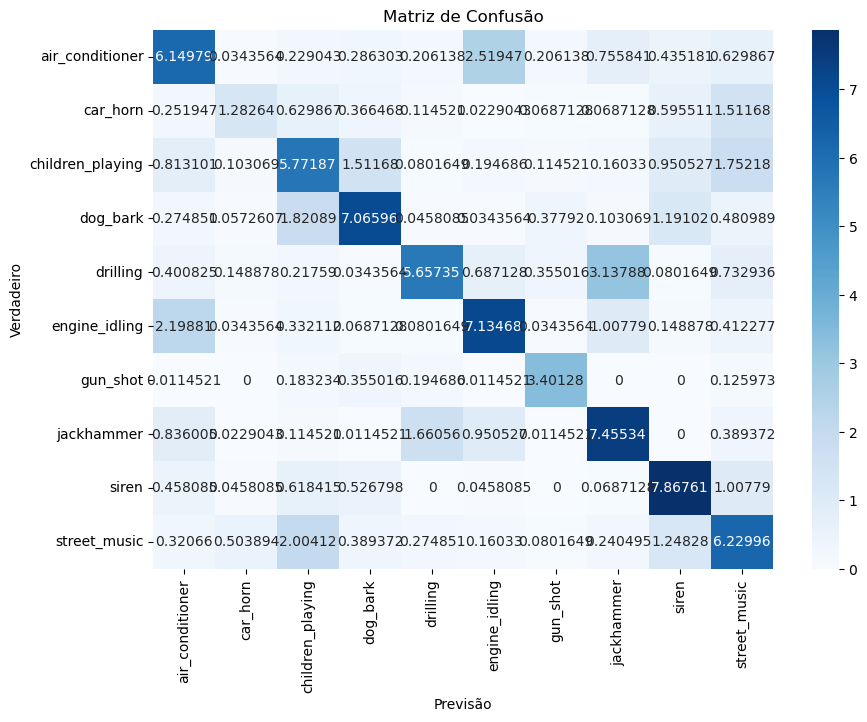

In [162]:
print(best_model.summary())
print("Learning rate: ", best_model_lr)
print("Number of epochs: ", best_model_n_epochs)
print("Batch Size: ", best_model_batch_size)
print("Accuracy: ", best_accuracy)
print("Loss: ", best_model_loss)
print("Standadr Deviation: ", best_model_std)

cm = pd.DataFrame(best_model_cf, index=label_encoder.classes_, columns=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Verdadeiro')
plt.show()

## Grid Search para MLP com 2 camadas escondidas e funções de ativação LeakyReLU

In [26]:
learning_rate = [0.1, 0.01, 0.001]
epochs = [50, 100, 200]
batch_size = [16, 32, 64, 128]
best_model = None
best_accuracy = None
best_model_cf = None
best_model_loss = None
best_model_std = None
best_model_lr = None
best_model_n_epochs = None
best_model_batch_size = None

#KFold para fazer 10 cross validation
for i in learning_rate:
    for j in epochs:
        for m in batch_size:
            adam_optimizer = tf.keras.optimizers.Adam(learning_rate=i)
            # Definir o modelo
            model = tf.keras.models.Sequential([
                tf.keras.layers.Input(shape=(input_dim,)),
                tf.keras.layers.Dense(n_neur[0], kernel_initializer=initialize_weights),
                tf.keras.layers.LeakyReLU(negative_slope=0.01),
                tf.keras.layers.Dense(n_neur[1], kernel_initializer=initialize_weights),
                tf.keras.layers.LeakyReLU(negative_slope=0.01),
                tf.keras.layers.Dense(n_neur[2], kernel_initializer=initialize_weights),
                tf.keras.layers.LeakyReLU(negative_slope=0.01),
                tf.keras.layers.Dense(output_dim, activation='softmax', kernel_initializer=initialize_weights)
            ])
            
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            folds = list(kf.split(X))
            all_accuracies = []
            all_confusion_matrices = []
            all_losses = []
            # Cross-validation com cada fold usado uma vez para teste, uma vez para desenvolvimento e 8 vezes para treino
            for fold_idx in range(len(folds)):
                # Selecionar fold para teste
                train_val_indices, test_indices = folds[fold_idx]

                # Selecionar fold para desenvolvimento
                dev_fold_idx = (fold_idx + 1) % len(folds)
                train_indices, dev_indices = folds[dev_fold_idx]

                # Treinamento e Desenvolvimento
                X_train, y_train = X[train_val_indices], y[train_val_indices]
                X_dev, y_dev = X[dev_indices], y[dev_indices]

                # Teste
                X_test, y_test = X[test_indices], y[test_indices]

                # Compilar o modelo
                model.compile(optimizer=adam_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

                model.summary()

                model.fit(X_train, y_train, epochs=j, batch_size=m, validation_data=(X_dev, y_dev), callbacks=[lr_scheduler, early_stopping])

                # Avaliar o modelo
                loss, accuracy = model.evaluate(X_test, y_test)

                all_accuracies.append(accuracy) 
                y_pred = model.predict(X_test) 
                y_pred_classes = np.argmax(y_pred, axis=1) 
                cm = confusion_matrix(y_test, y_pred_classes) 
                all_confusion_matrices.append(cm)
                all_losses.append(loss)

            accumulated_cm = np.sum(all_confusion_matrices, axis=0) 
            accumulated_cm_percentage = accumulated_cm / np.sum(accumulated_cm) * 100
            mean_accuracy = np.mean(all_accuracies) 
            std_accuracy = np.std(all_accuracies)
            mean_loss = np.mean(all_losses)
            print("Accuracy: ", mean_accuracy)
            print("Confusion Matrix: ", accumulated_cm_percentage)
            print("Loss: ", mean_loss)
            print("Standard Deviation: ", std_accuracy)
            
            if best_model == None or mean_accuracy > best_accuracy:
                best_model = model
                best_accuracy = mean_accuracy
                best_model_cf = accumulated_cm_percentage
                best_model_loss = mean_loss
                best_model_std = std_accuracy
                best_model_lr = i
                best_model_n_epochs = j
                best_model_batch_size = m  

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1579 - loss: 2.1520 - val_accuracy: 0.3009 - val_loss: 1.8167 - learning_rate: 0.1000
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - accuracy: 0.2473 - loss: 1.8785 - val_accuracy: 0.2860 - val_loss: 1.7267 - learning_rate: 0.1000
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - accuracy: 0.3324 - loss: 1.8660 - val_accuracy: 0.1579 - val_loss: 2.1609 - learning_rate: 0.1000
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2216 - loss: 2.0383 - val_accuracy: 0.2712 - val_loss: 1.8755 - learning_rate: 0.1000
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - accuracy: 0.3211 - loss: 1.7695 - val_accuracy: 0.2860 - val_loss: 1.8139 - learning_rate: 0.1000
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - accuracy: 0.2761 - loss: 1.8363 - val_accuracy: 0.3204 - val_loss: 1.7981 - learning_rate: 0.1000
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3233 - loss: 1

Epoch 45/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - accuracy: 0.5032 - loss: 1.2932 - val_accuracy: 0.5092 - val_loss: 1.2821 - learning_rate: 0.0063
Epoch 46/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5003 - loss: 1.3013 - val_accuracy: 0.5034 - val_loss: 1.2711 - learning_rate: 0.0063
Epoch 47/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - accuracy: 0.4981 - loss: 1.3007 - val_accuracy: 0.5114 - val_loss: 1.2681 - learning_rate: 0.0063
Epoch 48/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - accuracy: 0.5014 - loss: 1.2854 - val_accuracy: 0.5229 - val_loss: 1.2712 - learning_rate: 0.0063
Epoch 49/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5027 - loss: 1.2878 - val_accuracy: 0.5183 - val_loss: 1.2649 - learning_rate: 0.0063
Epoch 50/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5140 - loss: 1.2905 - val_accuracy: 0.5126 - val_loss: 1.2642 - learning_rate: 0.0063
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - accuracy: 0.4836 - loss: 1.3336
2

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5061 - loss: 1.3029 - val_accuracy: 0.4868 - val_loss: 1.3049 - learning_rate: 0.0063
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5043 - loss: 1.3063 - val_accuracy: 0.5074 - val_loss: 1.3012 - learning_rate: 0.0063
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - accuracy: 0.5088 - loss: 1.2889 - val_accuracy: 0.4765 - val_loss: 1.3227 - learning_rate: 0.0063
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5132 - loss: 1.2926 - val_accuracy: 0.4891 - val_loss: 1.2961 - learning_rate: 0.0063
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5185 - loss: 1.2796 - val_accuracy: 0.4891 - val_loss: 1.3040 - learning_rate: 0.0063
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5067 - loss: 1.2844 - val_accuracy: 0.5097 - val_loss: 1.3058 - learning_rate: 0.0063
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5051 - loss: 1.2854

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5178 - loss: 1.2871 - val_accuracy: 0.5430 - val_loss: 1.2664 - learning_rate: 0.0063
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5202 - loss: 1.2595 - val_accuracy: 0.5246 - val_loss: 1.2712 - learning_rate: 0.0063
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5091 - loss: 1.2918 - val_accuracy: 0.5475 - val_loss: 1.2658 - learning_rate: 0.0063
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5059 - loss: 1.3115 - val_accuracy: 0.5292 - val_loss: 1.2721 - learning_rate: 0.0063
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5086 - loss: 1.3048 - val_accuracy: 0.5452 - val_loss: 1.2719 - learning_rate: 0.0063
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5011 - loss: 1.2990 - val_accuracy: 0.5349 - val_loss: 1.2723 - learning_rate: 0.0063
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5144 - loss: 1.2860 - 

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5206 - loss: 1.2588 - val_accuracy: 0.5212 - val_loss: 1.2464 - learning_rate: 0.0016
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5217 - loss: 1.2546 - val_accuracy: 0.5292 - val_loss: 1.2452 - learning_rate: 0.0016
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5223 - loss: 1.2643 - val_accuracy: 0.5132 - val_loss: 1.2508 - learning_rate: 0.0016
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.5221 - loss: 1.2506 - val_accuracy: 0.5166 - val_loss: 1.2467 - learning_rate: 0.0016
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - accuracy: 0.5241 - loss: 1.2518 - val_accuracy: 0.5200 - val_loss: 1.2471 - learning_rate: 0.0016
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.5326 - loss: 1.2310 - val_accuracy: 0.5178 - val_loss: 1.2496 - learning_rate: 0.0016
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - accuracy: 0.5202 - loss: 1

Epoch 44/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5333 - loss: 1.2480 - val_accuracy: 0.5315 - val_loss: 1.2374 - learning_rate: 9.7656e-05
Epoch 45/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5260 - loss: 1.2515 - val_accuracy: 0.5338 - val_loss: 1.2372 - learning_rate: 9.7656e-05
Epoch 46/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5257 - loss: 1.2506 - val_accuracy: 0.5338 - val_loss: 1.2373 - learning_rate: 9.7656e-05
Epoch 47/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5273 - loss: 1.2527 - val_accuracy: 0.5326 - val_loss: 1.2371 - learning_rate: 9.7656e-05
Epoch 48/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5291 - loss: 1.2401 - val_accuracy: 0.5304 - val_loss: 1.2372 - learning_rate: 9.7656e-05
Epoch 49/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.5242 - loss: 1.2504 - val_accuracy: 0.5315 - val_loss: 1.2372 - learning_rate: 9.7656e-05
Epoch 50/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - a

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5294 - loss: 1.2399 - val_accuracy: 0.5200 - val_loss: 1.2545 - learning_rate: 9.7656e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.5312 - loss: 1.2478 - val_accuracy: 0.5155 - val_loss: 1.2544 - learning_rate: 9.7656e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.5442 - loss: 1.2205 - val_accuracy: 0.5155 - val_loss: 1.2547 - learning_rate: 9.7656e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.5252 - loss: 1.2544 - val_accuracy: 0.5155 - val_loss: 1.2545 - learning_rate: 9.7656e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - accuracy: 0.5265 - loss: 1.2443 - val_accuracy: 0.5143 - val_loss: 1.2544 - learning_rate: 9.7656e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5279 - loss: 1.2578 - val_accuracy: 0.5143 - val_loss: 1.2546 - learning_rate: 9.7656e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - ac

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5366 - loss: 1.2487 - val_accuracy: 0.5109 - val_loss: 1.2895 - learning_rate: 9.7656e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.5309 - loss: 1.2474 - val_accuracy: 0.5097 - val_loss: 1.2897 - learning_rate: 9.7656e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - accuracy: 0.5340 - loss: 1.2543 - val_accuracy: 0.5097 - val_loss: 1.2896 - learning_rate: 9.7656e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.5379 - loss: 1.2251 - val_accuracy: 0.5120 - val_loss: 1.2890 - learning_rate: 9.7656e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - accuracy: 0.5367 - loss: 1.2471 - val_accuracy: 0.5143 - val_loss: 1.2886 - learning_rate: 9.7656e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - accuracy: 0.5358 - loss: 1.2301 - val_accuracy: 0.5120 - val_loss: 1.2890 - learning_rate: 9.7656e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step 

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5322 - loss: 1.2525 - val_accuracy: 0.5533 - val_loss: 1.1952 - learning_rate: 9.7656e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.5372 - loss: 1.2429 - val_accuracy: 0.5521 - val_loss: 1.1948 - learning_rate: 9.7656e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.5316 - loss: 1.2309 - val_accuracy: 0.5521 - val_loss: 1.1947 - learning_rate: 9.7656e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - accuracy: 0.5341 - loss: 1.2363 - val_accuracy: 0.5544 - val_loss: 1.1949 - learning_rate: 9.7656e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - accuracy: 0.5452 - loss: 1.2370 - val_accuracy: 0.5533 - val_loss: 1.1947 - learning_rate: 9.7656e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - accuracy: 0.5307 - loss: 1.2469 - val_accuracy: 0.5533 - val_loss: 1.1943 - learning_rate: 9.7656e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step 

492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - accuracy: 0.5308 - loss: 1.2441 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 44/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - accuracy: 0.5360 - loss: 1.2533 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 45/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5334 - loss: 1.2395 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 46/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - accuracy: 0.5466 - loss: 1.2341 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 47/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.5366 - loss: 1.2352 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 48/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - accuracy: 0.5409 - loss: 1.2351 - val_accuracy: 0.5578 - val_loss: 1.1938 - learning_rate: 6.1035e-06
Epoch 49/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - acc

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5255 - loss: 1.2636 - val_accuracy: 0.5155 - val_loss: 1.2303 - learning_rate: 6.1035e-06
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - accuracy: 0.5320 - loss: 1.2458 - val_accuracy: 0.5155 - val_loss: 1.2304 - learning_rate: 6.1035e-06
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - accuracy: 0.5391 - loss: 1.2343 - val_accuracy: 0.5155 - val_loss: 1.2304 - learning_rate: 6.1035e-06
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - accuracy: 0.5394 - loss: 1.2409 - val_accuracy: 0.5166 - val_loss: 1.2305 - learning_rate: 6.1035e-06
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.5314 - loss: 1.2575 - val_accuracy: 0.5189 - val_loss: 1.2305 - learning_rate: 6.1035e-06
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - accuracy: 0.5379 - loss: 1.2348 - val_accuracy: 0.5189 - val_loss: 1.2305 - learning_rate: 6.1035e-06
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step 

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5333 - loss: 1.2694 - val_accuracy: 0.5464 - val_loss: 1.2430 - learning_rate: 6.1035e-06
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.5374 - loss: 1.2497 - val_accuracy: 0.5464 - val_loss: 1.2430 - learning_rate: 6.1035e-06
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - accuracy: 0.5375 - loss: 1.2571 - val_accuracy: 0.5464 - val_loss: 1.2430 - learning_rate: 6.1035e-06
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.5412 - loss: 1.2347 - val_accuracy: 0.5464 - val_loss: 1.2430 - learning_rate: 6.1035e-06
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - accuracy: 0.5428 - loss: 1.2320 - val_accuracy: 0.5475 - val_loss: 1.2429 - learning_rate: 6.1035e-06
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - accuracy: 0.5391 - loss: 1.2461 - val_accuracy: 0.5475 - val_loss: 1.2429 - learning_rate: 6.1035e-06
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step 

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5285 - loss: 1.2410 - val_accuracy: 0.5446 - val_loss: 1.2891 - learning_rate: 6.1035e-06
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.5378 - loss: 1.2551 - val_accuracy: 0.5446 - val_loss: 1.2890 - learning_rate: 6.1035e-06
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - accuracy: 0.5336 - loss: 1.2517 - val_accuracy: 0.5446 - val_loss: 1.2890 - learning_rate: 6.1035e-06
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - accuracy: 0.5312 - loss: 1.2581 - val_accuracy: 0.5446 - val_loss: 1.2889 - learning_rate: 6.1035e-06
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - accuracy: 0.5314 - loss: 1.2408 - val_accuracy: 0.5446 - val_loss: 1.2889 - learning_rate: 6.1035e-06
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - accuracy: 0.5367 - loss: 1.2437 - val_accuracy: 0.5446 - val_loss: 1.2889 - learning_rate: 6.1035e-06
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step 

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1105 - loss: 2.2728 - val_accuracy: 0.1911 - val_loss: 2.2040 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1329 - loss: 2.3325 - val_accuracy: 0.1888 - val_loss: 2.1812 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.1569 - loss: 2.2427 - val_accuracy: 0.1831 - val_loss: 2.1110 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.1954 - loss: 2.0951 - val_accuracy: 0.1888 - val_loss: 1.9616 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2261 - loss: 1.9527 - val_accuracy: 0.2071 - val_loss: 1.8722 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.2347 - loss: 1.8757 - val_accuracy: 0.2540 - val_loss: 1.8439 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2451 - loss: 1.8

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2414 - loss: 1.8826 - val_accuracy: 0.1867 - val_loss: 2.0049 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - accuracy: 0.2101 - loss: 1.9534 - val_accuracy: 0.2566 - val_loss: 1.8331 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.2466 - loss: 1.8462 - val_accuracy: 0.2600 - val_loss: 1.7904 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - accuracy: 0.2627 - loss: 1.8180 - val_accuracy: 0.3001 - val_loss: 1.7801 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - accuracy: 0.2877 - loss: 1.7712 - val_accuracy: 0.3104 - val_loss: 1.7196 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.3317 - loss: 1.7104 - val_accuracy: 0.3219 - val_loss: 1.7405 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - accuracy: 0.3443 - los

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3236 - loss: 1.8216 - val_accuracy: 0.3379 - val_loss: 1.7322 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - accuracy: 0.3443 - loss: 1.7791 - val_accuracy: 0.3299 - val_loss: 1.7215 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.3464 - loss: 1.7398 - val_accuracy: 0.3666 - val_loss: 1.6407 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3521 - loss: 1.7151 - val_accuracy: 0.3734 - val_loss: 1.6576 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3427 - loss: 1.7184 - val_accuracy: 0.3517 - val_loss: 1.6332 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.3459 - loss: 1.6739 - val_accuracy: 0.4021 - val_loss: 1.5978 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - accuracy: 0.3568 - loss: 1

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3649 - loss: 1.6245 - val_accuracy: 0.3700 - val_loss: 1.5879 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.3792 - loss: 1.5938 - val_accuracy: 0.3700 - val_loss: 1.5693 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3851 - loss: 1.5890 - val_accuracy: 0.3849 - val_loss: 1.5608 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3765 - loss: 1.5945 - val_accuracy: 0.4158 - val_loss: 1.5884 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3931 - loss: 1.5850 - val_accuracy: 0.3837 - val_loss: 1.5327 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.3849 - loss: 1.5809 - val_accuracy: 0.4101 - val_loss: 1.5004 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - accuracy: 0.3918 - loss: 1.

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4243 - loss: 1.4817 - val_accuracy: 0.4410 - val_loss: 1.4423 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4101 - loss: 1.5467 - val_accuracy: 0.4364 - val_loss: 7.6866 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4243 - loss: 6.3655 - val_accuracy: 0.3242 - val_loss: 1.8749 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.3543 - loss: 1.7455 - val_accuracy: 0.3906 - val_loss: 1.6114 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3948 - loss: 1.5961 - val_accuracy: 0.3631 - val_loss: 1.6668 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4098 - loss: 1.5354 - val_accuracy: 0.4582 - val_loss: 1.4496 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4338 - loss: 1.4737 

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4179 - loss: 1.4671 - val_accuracy: 0.4055 - val_loss: 1.5662 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.4429 - loss: 1.4331 - val_accuracy: 0.4341 - val_loss: 1.4830 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4327 - loss: 1.4328 - val_accuracy: 0.4089 - val_loss: 1.4735 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - accuracy: 0.4339 - loss: 1.4410 - val_accuracy: 0.4708 - val_loss: 1.4062 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.4493 - loss: 1.4169 - val_accuracy: 0.3952 - val_loss: 1.4974 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4539 - loss: 1.4127 - val_accuracy: 0.4628 - val_loss: 1.4039 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.4565 - loss: 1

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4588 - loss: 1.3756 - val_accuracy: 0.5040 - val_loss: 1.3628 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4580 - loss: 1.4058 - val_accuracy: 0.2314 - val_loss: 3.0916 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3327 - loss: 1.9408 - val_accuracy: 0.4696 - val_loss: 1.4020 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4363 - loss: 1.4941 - val_accuracy: 0.4444 - val_loss: 1.4884 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4193 - loss: 1.5480 - val_accuracy: 0.4364 - val_loss: 1.3962 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4354 - loss: 1.4513 - val_accuracy: 0.4479 - val_loss: 1.3946 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - accuracy: 0.4342 - loss: 1.430

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4408 - loss: 1.4695 - val_accuracy: 0.3940 - val_loss: 1.4436 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - accuracy: 0.4348 - loss: 1.4214 - val_accuracy: 0.4250 - val_loss: 1.4050 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4338 - loss: 1.4237 - val_accuracy: 0.4570 - val_loss: 1.3155 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - accuracy: 0.4294 - loss: 1.4841 - val_accuracy: 0.3849 - val_loss: 1.4664 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4485 - loss: 1.4045 - val_accuracy: 0.4147 - val_loss: 1.4879 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.4643 - loss: 1.3892 - val_accuracy: 0.4708 - val_loss: 1.3271 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4639 - loss: 1

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4951 - loss: 1.3359 - val_accuracy: 0.4044 - val_loss: 1.6604 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.3252 - loss: 35.2069 - val_accuracy: 0.3047 - val_loss: 1.7533 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.3479 - loss: 1.7509 - val_accuracy: 0.3414 - val_loss: 1.6797 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.3960 - loss: 1.5589 - val_accuracy: 0.3643 - val_loss: 1.5941 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4026 - loss: 1.5564 - val_accuracy: 0.3895 - val_loss: 1.5615 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4129 - loss: 1.5193 - val_accuracy: 0.4192 - val_loss: 1.4640 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4019 - loss: 1.

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4189 - loss: 1.4602 - val_accuracy: 0.4497 - val_loss: 1.5202 - learning_rate: 0.1000
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4309 - loss: 1.5438 - val_accuracy: 0.4497 - val_loss: 1.4309 - learning_rate: 0.1000
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4253 - loss: 1.5348 - val_accuracy: 0.4462 - val_loss: 1.4225 - learning_rate: 0.1000
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4412 - loss: 1.4471 - val_accuracy: 0.4394 - val_loss: 1.4545 - learning_rate: 0.1000
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4430 - loss: 1.4441 - val_accuracy: 0.4680 - val_loss: 2.4677 - learning_rate: 0.1000
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4590 - loss: 1.3935 - val_accuracy: 0.4611 - val_loss: 1.4172 - learning_rate: 0.1000
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4506 - loss: 1.4342 - 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1137 - loss: 2.2776 - val_accuracy: 0.1247 - val_loss: 2.2650 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1143 - loss: 2.2609 - val_accuracy: 0.2197 - val_loss: 1.9566 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2423 - loss: 1.9061 - val_accuracy: 0.2471 - val_loss: 1.8128 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2643 - loss: 1.8398 - val_accuracy: 0.2460 - val_loss: 1.8400 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - accuracy: 0.2742 - loss: 1.8194 - val_accuracy: 0.2368 - val_loss: 1.8222 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2798 - loss: 1.8213 - val_accuracy: 0.2906 - val_loss: 1.7245 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3095 - loss: 1.7458 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3197 - loss: 1.7459 - val_accuracy: 0.3184 - val_loss: 1.7160 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3478 - loss: 1.7042 - val_accuracy: 0.3230 - val_loss: 1.7596 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.3350 - loss: 1.7566 - val_accuracy: 0.3711 - val_loss: 1.7373 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3112 - loss: 1.7758 - val_accuracy: 0.3036 - val_loss: 1.7724 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.3266 - loss: 1.7421 - val_accuracy: 0.3024 - val_loss: 1.7106 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3404 - loss: 1.7035 - val_accuracy: 0.3162 - val_loss: 1.6684 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3436 - loss: 1.696

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3933 - loss: 1.5972 - val_accuracy: 0.4009 - val_loss: 1.5550 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3938 - loss: 1.5900 - val_accuracy: 0.4181 - val_loss: 1.5240 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.4272 - loss: 1.5229 - val_accuracy: 0.4181 - val_loss: 1.4673 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4003 - loss: 1.5451 - val_accuracy: 0.4261 - val_loss: 1.5106 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4034 - loss: 1.5283 - val_accuracy: 0.3310 - val_loss: 3.6246 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4138 - loss: 1.7175 - val_accuracy: 0.4628 - val_loss: 1.4384 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4221 - loss: 1.4704 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4067 - loss: 1.5829 - val_accuracy: 0.4674 - val_loss: 1.4052 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4553 - loss: 1.4296 - val_accuracy: 0.4685 - val_loss: 1.3901 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4699 - loss: 1.4121 - val_accuracy: 0.4845 - val_loss: 1.3612 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4592 - loss: 1.4190 - val_accuracy: 0.4880 - val_loss: 1.3918 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4704 - loss: 1.3914 - val_accuracy: 0.4674 - val_loss: 1.3416 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4813 - loss: 1.3511 - val_accuracy: 0.4662 - val_loss: 1.3569 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4724 - loss: 1.3944 - 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4800 - loss: 1.3989 - val_accuracy: 0.3322 - val_loss: 1.8674 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4030 - loss: 1.6599 - val_accuracy: 0.4742 - val_loss: 1.3749 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4780 - loss: 1.3772 - val_accuracy: 0.4662 - val_loss: 1.3721 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.4818 - loss: 1.8280 - val_accuracy: 0.4674 - val_loss: 1.3942 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4719 - loss: 1.3710 - val_accuracy: 0.4822 - val_loss: 1.3622 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.4968 - loss: 1.3329 - val_accuracy: 0.4857 - val_loss: 1.3778 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4882 - loss: 1.3

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5037 - loss: 1.3478 - val_accuracy: 0.4777 - val_loss: 1.3759 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4902 - loss: 1.3477 - val_accuracy: 0.4318 - val_loss: 1.4194 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5000 - loss: 1.3264 - val_accuracy: 0.4742 - val_loss: 1.3559 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - accuracy: 0.5055 - loss: 1.3050 - val_accuracy: 0.4822 - val_loss: 1.3909 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4681 - loss: 1.4693 - val_accuracy: 0.4513 - val_loss: 1.3711 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4934 - loss: 1.3164 - val_accuracy: 0.5052 - val_loss: 1.3322 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4902 - loss: 1.3407 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4937 - loss: 1.3268 - val_accuracy: 0.5166 - val_loss: 1.3375 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.4998 - loss: 1.3425 - val_accuracy: 0.5326 - val_loss: 1.2201 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5088 - loss: 1.2974 - val_accuracy: 0.5258 - val_loss: 1.2454 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5062 - loss: 1.3229 - val_accuracy: 0.5223 - val_loss: 1.2539 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5097 - loss: 1.3013 - val_accuracy: 0.5200 - val_loss: 1.2583 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5139 - loss: 1.2927 - val_accuracy: 0.5349 - val_loss: 1.3131 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3667 - loss: 1.7279 

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4471 - loss: 1.4537 - val_accuracy: 0.4124 - val_loss: 1.4558 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.4304 - loss: 1.4553 - val_accuracy: 0.4410 - val_loss: 1.4105 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - accuracy: 0.4462 - loss: 1.4247 - val_accuracy: 0.4181 - val_loss: 1.4012 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4384 - loss: 1.4247 - val_accuracy: 0.4341 - val_loss: 1.3698 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.4634 - loss: 1.3747 - val_accuracy: 0.4639 - val_loss: 1.3356 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4693 - loss: 1.3701 - val_accuracy: 0.4410 - val_loss: 1.4334 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4438 - loss: 1.4

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4857 - loss: 1.3614 - val_accuracy: 0.5086 - val_loss: 1.3428 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5016 - loss: 1.3451 - val_accuracy: 0.5109 - val_loss: 1.3435 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4966 - loss: 1.3338 - val_accuracy: 0.4937 - val_loss: 1.3346 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - accuracy: 0.4995 - loss: 1.3444 - val_accuracy: 0.5235 - val_loss: 1.3512 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.4952 - loss: 1.3284 - val_accuracy: 0.5143 - val_loss: 1.3281 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.4947 - loss: 1.3287 - val_accuracy: 0.5097 - val_loss: 1.3282 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4923 - loss: 1.3

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5031 - loss: 1.3075 - val_accuracy: 0.5057 - val_loss: 1.3242 - learning_rate: 0.1000
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4788 - loss: 12.0818 - val_accuracy: 0.4680 - val_loss: 1.4600 - learning_rate: 0.1000
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.4562 - loss: 1.3992 - val_accuracy: 0.4703 - val_loss: 1.3611 - learning_rate: 0.1000
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4789 - loss: 1.3409 - val_accuracy: 0.4703 - val_loss: 1.3721 - learning_rate: 0.1000
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.4758 - loss: 1.3265 - val_accuracy: 0.4714 - val_loss: 1.3238 - learning_rate: 0.1000
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4927 - loss: 1.2941 - val_accuracy: 0.4943 - val_loss: 1.3097 - learning_rate: 0.1000
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - accuracy: 0.4963 - loss: 1.

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1458 - loss: 2.1922 - val_accuracy: 0.2666 - val_loss: 1.8783 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2654 - loss: 1.8400 - val_accuracy: 0.3089 - val_loss: 1.7541 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3648 - loss: 1.6059 - val_accuracy: 0.4027 - val_loss: 1.5403 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4157 - loss: 1.4850 - val_accuracy: 0.4428 - val_loss: 1.5026 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4150 - loss: 1.4902 - val_accuracy: 0.3638 - val_loss: 1.6418 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3991 - loss: 1.5030 - val_accuracy: 0.3879 - val_loss: 1.4817 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4303 - loss: 1.4705 - val_accuracy: 

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4596 - loss: 1.3845 - val_accuracy: 0.4777 - val_loss: 1.3383 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4804 - loss: 1.3322 - val_accuracy: 0.4513 - val_loss: 1.4286 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4811 - loss: 1.3524 - val_accuracy: 0.4948 - val_loss: 1.3034 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4881 - loss: 1.3356 - val_accuracy: 0.4777 - val_loss: 1.3486 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4675 - loss: 1.4308 - val_accuracy: 0.4284 - val_loss: 1.4499 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4664 - loss: 1.3848 - val_accuracy: 0.4719 - val_loss: 1.3543 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5029 - loss: 1.2955 - val_accuracy: 

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5045 - loss: 1.3038 - val_accuracy: 0.5372 - val_loss: 1.2271 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5227 - loss: 1.2663 - val_accuracy: 0.5189 - val_loss: 1.2588 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5186 - loss: 1.2717 - val_accuracy: 0.5040 - val_loss: 1.2830 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5199 - loss: 1.2845 - val_accuracy: 0.4742 - val_loss: 1.3961 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5109 - loss: 1.2614 - val_accuracy: 0.5395 - val_loss: 1.3150 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5160 - loss: 1.2718 - val_accuracy: 0.5200 - val_loss: 1.2842 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5073 - loss: 1.2710 - val_accuracy: 

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5254 - loss: 1.2657 - val_accuracy: 0.5647 - val_loss: 1.2717 - learning_rate: 0.1000
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5309 - loss: 1.2371 - val_accuracy: 0.5727 - val_loss: 1.1996 - learning_rate: 0.1000
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5418 - loss: 1.2246 - val_accuracy: 0.5750 - val_loss: 1.1588 - learning_rate: 0.1000
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5638 - loss: 1.1933 - val_accuracy: 0.5452 - val_loss: 1.2061 - learning_rate: 0.1000
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5387 - loss: 1.2444 - val_accuracy: 0.5647 - val_loss: 1.1580 - learning_rate: 0.1000
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5360 - loss: 1.2543 - val_accuracy: 0.5682 - val_loss: 1.1445 - learning_rate: 0.1000
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5620 - loss: 1.1996 - val_accuracy: 

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6529 - loss: 1.0169 - val_accuracy: 0.6609 - val_loss: 0.9830 - learning_rate: 0.0063
Epoch 46/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6439 - loss: 1.0242 - val_accuracy: 0.6575 - val_loss: 0.9930 - learning_rate: 0.0063
Epoch 47/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6553 - loss: 0.9943 - val_accuracy: 0.6621 - val_loss: 0.9816 - learning_rate: 0.0063
Epoch 48/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6510 - loss: 1.0080 - val_accuracy: 0.6644 - val_loss: 0.9884 - learning_rate: 0.0063
Epoch 49/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6481 - loss: 1.0173 - val_accuracy: 0.6552 - val_loss: 0.9842 - learning_rate: 0.0063
Epoch 50/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6580 - loss: 0.9925 - val_accuracy: 0.6712 - val_loss: 0.9780 - learning_rate: 0.0063
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step - accuracy: 0.6048 - loss: 1.1424
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6515 - loss: 1.0182 - val_accuracy: 0.6472 - val_loss: 0.9899 - learning_rate: 0.0063
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6458 - loss: 1.0144 - val_accuracy: 0.6426 - val_loss: 0.9911 - learning_rate: 0.0063
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6511 - loss: 1.0049 - val_accuracy: 0.6644 - val_loss: 0.9897 - learning_rate: 0.0063
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6458 - loss: 1.0052 - val_accuracy: 0.6575 - val_loss: 0.9921 - learning_rate: 0.0063
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6527 - loss: 1.0221 - val_accuracy: 0.6472 - val_loss: 0.9833 - learning_rate: 0.0063
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6541 - loss: 0.9953 - val_accuracy: 0.6460 - val_loss: 0.9852 - learning_rate: 0.0063
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6540 - loss: 1.0117 - val_accuracy: 

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6491 - loss: 1.0060 - val_accuracy: 0.6357 - val_loss: 1.0550 - learning_rate: 0.0063
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6479 - loss: 1.0088 - val_accuracy: 0.6312 - val_loss: 1.0590 - learning_rate: 0.0063
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6575 - loss: 0.9975 - val_accuracy: 0.6438 - val_loss: 1.0516 - learning_rate: 0.0063
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6506 - loss: 1.0094 - val_accuracy: 0.6289 - val_loss: 1.0514 - learning_rate: 0.0063
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6532 - loss: 1.0114 - val_accuracy: 0.6483 - val_loss: 1.0505 - learning_rate: 0.0063
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6617 - loss: 0.9834 - val_accuracy: 0.6312 - val_loss: 1.0524 - learning_rate: 0.0063
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6554 - loss: 1.0065 - val_accuracy: 

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6650 - loss: 0.9805 - val_accuracy: 0.6609 - val_loss: 0.9399 - learning_rate: 0.0063
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6625 - loss: 0.9897 - val_accuracy: 0.6724 - val_loss: 0.9398 - learning_rate: 0.0063
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6561 - loss: 0.9957 - val_accuracy: 0.6770 - val_loss: 0.9389 - learning_rate: 0.0063
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6655 - loss: 0.9793 - val_accuracy: 0.6770 - val_loss: 0.9384 - learning_rate: 0.0063
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6544 - loss: 0.9960 - val_accuracy: 0.6735 - val_loss: 0.9361 - learning_rate: 0.0063
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6531 - loss: 0.9922 - val_accuracy: 0.6644 - val_loss: 0.9389 - learning_rate: 0.0063
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6583 - loss: 1.0063 - val_accuracy: 

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6617 - loss: 0.9853 - val_accuracy: 0.6735 - val_loss: 0.9290 - learning_rate: 3.9063e-04
Epoch 46/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6674 - loss: 0.9713 - val_accuracy: 0.6747 - val_loss: 0.9286 - learning_rate: 3.9063e-04
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - accuracy: 0.6407 - loss: 1.0506
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6583 - loss: 0.9960 - val_accuracy: 0.6518 - val_loss: 0.9991 - learning_rate: 3.9063e-04
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6502 - loss: 1.0059 - val_accuracy: 0.6518 - val_loss: 1.0014 - learning_rate: 3.9063e-04
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6543 - loss: 0.9992 - val_accuracy: 0.6529 - val_loss: 1.0002 - learning_rate: 3.9063e-04
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6711 - loss: 0.9542 - val_accuracy: 0.6518 - val_loss: 1.0024 - learning_rate: 3.9063e-04
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6587 - loss: 0.9942 - val_accuracy: 0.6552 - val_loss: 1.0005 - learning_rate: 3.9063e-04
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6649 - loss: 0.9885 - val_accuracy: 0.6529 - val_loss: 0.9990 - learning_rate: 3.9063e-04
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6610 - loss:

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6626 - loss: 0.9824 - val_accuracy: 0.6747 - val_loss: 0.9586 - learning_rate: 3.9063e-04
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6585 - loss: 0.9865 - val_accuracy: 0.6747 - val_loss: 0.9583 - learning_rate: 3.9063e-04
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6655 - loss: 0.9665 - val_accuracy: 0.6770 - val_loss: 0.9588 - learning_rate: 3.9063e-04
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6676 - loss: 0.9682 - val_accuracy: 0.6758 - val_loss: 0.9584 - learning_rate: 3.9063e-04
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6577 - loss: 0.9868 - val_accuracy: 0.6770 - val_loss: 0.9582 - learning_rate: 3.9063e-04
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6710 - loss: 0.9597 - val_accuracy: 0.6758 - val_loss: 0.9582 - learning_rate: 3.9063e-04
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6588 - loss:

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_25 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_26 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6560 - loss: 0.9952 - val_accuracy: 0.6716 - val_loss: 0.9575 - learning_rate: 3.9063e-04
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6636 - loss: 0.9696 - val_accuracy: 0.6670 - val_loss: 0.9578 - learning_rate: 3.9063e-04
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6594 - loss: 0.9974 - val_accuracy: 0.6693 - val_loss: 0.9571 - learning_rate: 3.9063e-04
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6599 - loss: 0.9886 - val_accuracy: 0.6693 - val_loss: 0.9572 - learning_rate: 3.9063e-04
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6606 - loss: 0.9827 - val_accuracy: 0.6693 - val_loss: 0.9568 - learning_rate: 3.9063e-04
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6615 - loss: 0.9781 - val_accuracy: 0.6682 - val_loss: 0.9571 - learning_rate: 3.9063e-04
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6619 - loss:

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1404 - loss: 2.2177 - val_accuracy: 0.2014 - val_loss: 1.9571 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.2303 - loss: 1.9000 - val_accuracy: 0.2757 - val_loss: 1.7782 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.2733 - loss: 1.8385 - val_accuracy: 0.2529 - val_loss: 1.8553 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.2502 - loss: 1.8547 - val_accuracy: 0.2712 - val_loss: 1.8305 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - accuracy: 0.2675 - loss: 1.8329 - val_accuracy: 0.2620 - val_loss: 1.7966 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - accuracy: 0.2628 - loss: 1.8643 - val_accuracy: 0.2609 - val_loss: 1.8162 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.267

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3742 - loss: 1.6469 - val_accuracy: 0.3940 - val_loss: 1.5729 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - accuracy: 0.3842 - loss: 1.6228 - val_accuracy: 0.3837 - val_loss: 1.5818 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3915 - loss: 1.5622 - val_accuracy: 0.3792 - val_loss: 1.6555 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.3778 - loss: 1.6078 - val_accuracy: 0.3963 - val_loss: 1.5523 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - accuracy: 0.4087 - loss: 1.5435 - val_accuracy: 0.3058 - val_loss: 1.7839 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - accuracy: 0.3735 - loss: 1.6085 - val_accuracy: 0.3849 - val_loss: 1.5231 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - accuracy: 0.4054 

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3887 - loss: 1.5744 - val_accuracy: 0.4147 - val_loss: 1.5071 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accuracy: 0.3985 - loss: 1.5830 - val_accuracy: 0.3127 - val_loss: 1.8110 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.3818 - loss: 1.5827 - val_accuracy: 0.4204 - val_loss: 1.4651 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - accuracy: 0.4168 - loss: 1.5041 - val_accuracy: 0.3471 - val_loss: 1.6491 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.3680 - loss: 1.6335 - val_accuracy: 0.4135 - val_loss: 1.5293 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.4060 - loss: 1.5465 - val_accuracy: 0.3918 - val_loss: 1.5472 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - accuracy: 0.401

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2283 - loss: 4.8897 - val_accuracy: 0.2864 - val_loss: 1.9103 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.3207 - loss: 1.8785 - val_accuracy: 0.3608 - val_loss: 1.7965 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - accuracy: 0.3635 - loss: 1.8392 - val_accuracy: 0.3757 - val_loss: 1.6954 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - accuracy: 0.3981 - loss: 1.6404 - val_accuracy: 0.3734 - val_loss: 1.5429 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4148 - loss: 1.5526 - val_accuracy: 0.3769 - val_loss: 1.6150 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4124 - loss: 1.7155 - val_accuracy: 0.3643 - val_loss: 1.6298 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.3916 - 

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4086 - loss: 1.5430 - val_accuracy: 0.4204 - val_loss: 1.5074 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4142 - loss: 1.5077 - val_accuracy: 0.3562 - val_loss: 1.6331 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - accuracy: 0.4296 - loss: 1.5065 - val_accuracy: 0.4066 - val_loss: 1.4744 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - accuracy: 0.4279 - loss: 1.4849 - val_accuracy: 0.4353 - val_loss: 1.5249 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - accuracy: 0.4295 - loss: 1.4782 - val_accuracy: 0.3883 - val_loss: 1.5724 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - accuracy: 0.4258 - loss: 1.4879 - val_accuracy: 0.4170 - val_loss: 1.4517 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - accuracy: 0.4440 

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4355 - loss: 1.4427 - val_accuracy: 0.4364 - val_loss: 1.4425 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4579 - loss: 1.4120 - val_accuracy: 0.4559 - val_loss: 1.3896 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4680 - loss: 1.4593 - val_accuracy: 0.4834 - val_loss: 1.3682 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.4236 - loss: 4.6978 - val_accuracy: 0.3276 - val_loss: 1.7030 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3788 - loss: 1.6409 - val_accuracy: 0.3356 - val_loss: 1.6683 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3915 - loss: 1.5642 - val_accuracy: 0.3677 - val_loss: 1.6127 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.4117 - loss

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4510 - loss: 1.6954 - val_accuracy: 0.4639 - val_loss: 1.3322 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - accuracy: 0.4406 - loss: 1.4097 - val_accuracy: 0.4708 - val_loss: 1.3433 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - accuracy: 0.4354 - loss: 1.4140 - val_accuracy: 0.4525 - val_loss: 1.3756 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.4168 - loss: 2.1472 - val_accuracy: 0.4364 - val_loss: 1.4254 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.4402 - loss: 1.4369 - val_accuracy: 0.4834 - val_loss: 1.3536 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4345 - loss: 1.4275 - val_accuracy: 0.4433 - val_loss: 1.3588 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.4526 

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4382 - loss: 1.4288 - val_accuracy: 0.4639 - val_loss: 1.4083 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - accuracy: 0.4516 - loss: 1.4447 - val_accuracy: 0.4548 - val_loss: 1.3833 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4575 - loss: 1.3831 - val_accuracy: 0.4719 - val_loss: 1.3363 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4520 - loss: 1.4101 - val_accuracy: 0.4330 - val_loss: 1.3880 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - accuracy: 0.4557 - loss: 1.4028 - val_accuracy: 0.4410 - val_loss: 1.3688 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4438 - loss: 1.4556 - val_accuracy: 0.4307 - val_loss: 1.3793 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - accuracy: 0.4491 - lo

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4632 - loss: 1.4087 - val_accuracy: 0.4834 - val_loss: 1.4162 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4698 - loss: 1.3799 - val_accuracy: 0.4639 - val_loss: 1.3741 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.4568 - loss: 1.3963 - val_accuracy: 0.4765 - val_loss: 1.3778 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - accuracy: 0.4609 - loss: 1.3883 - val_accuracy: 0.4777 - val_loss: 1.3772 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - accuracy: 0.4728 - loss: 1.3677 - val_accuracy: 0.4891 - val_loss: 1.3594 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.4601 - loss: 1.3899 - val_accuracy: 0.4605 - val_loss: 2.1042 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4439 - 

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4578 - loss: 1.3895 - val_accuracy: 0.4497 - val_loss: 1.3969 - learning_rate: 0.1000
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - accuracy: 0.4590 - loss: 1.3770 - val_accuracy: 0.4668 - val_loss: 1.3935 - learning_rate: 0.1000
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.4519 - loss: 1.3942 - val_accuracy: 0.4783 - val_loss: 1.3979 - learning_rate: 0.1000
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4659 - loss: 1.3593 - val_accuracy: 0.4931 - val_loss: 1.3636 - learning_rate: 0.1000
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - accuracy: 0.4666 - loss: 1.3792 - val_accuracy: 0.4336 - val_loss: 1.3999 - learning_rate: 0.1000
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - accuracy: 0.4428 - loss: 1.3968 - val_accuracy: 0.4497 - val_loss: 1.3811 - learning_rate: 0.1000
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4670 - 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1555 - loss: 2.1824 - val_accuracy: 0.2918 - val_loss: 1.8127 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2797 - loss: 1.9133 - val_accuracy: 0.3307 - val_loss: 1.7792 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3594 - loss: 1.6840 - val_accuracy: 0.3227 - val_loss: 1.7271 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3102 - loss: 1.7273 - val_accuracy: 0.3959 - val_loss: 1.6192 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3632 - loss: 1.6280 - val_accuracy: 0.4130 - val_loss: 1.5823 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3962 - loss: 1.5576 - val_accuracy: 0.4027 - val_loss: 1.5279 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4144 - loss: 1.

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4208 - loss: 1.4843 - val_accuracy: 0.4227 - val_loss: 1.4177 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - accuracy: 0.4344 - loss: 1.4642 - val_accuracy: 0.4009 - val_loss: 1.5031 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4143 - loss: 1.4884 - val_accuracy: 0.3482 - val_loss: 1.8863 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.3574 - loss: 2.3292 - val_accuracy: 0.3975 - val_loss: 1.5111 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.4285 - loss: 1.4838 - val_accuracy: 0.4467 - val_loss: 1.4488 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.4505 - loss: 1.4387 - val_accuracy: 0.4318 - val_loss: 1.4692 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - accuracy: 0.4480 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3963 - loss: 1.5635 - val_accuracy: 0.4444 - val_loss: 1.5694 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.3994 - loss: 1.5690 - val_accuracy: 0.4353 - val_loss: 1.5491 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4124 - loss: 1.4973 - val_accuracy: 0.4777 - val_loss: 1.3762 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - accuracy: 0.4212 - loss: 1.4719 - val_accuracy: 0.4674 - val_loss: 1.4379 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4430 - loss: 1.4241 - val_accuracy: 0.4960 - val_loss: 1.3306 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4655 - loss: 1.3768 - val_accuracy: 0.4937 - val_loss: 1.3070 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4842 - loss

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4925 - loss: 1.3485 - val_accuracy: 0.5132 - val_loss: 1.2784 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4836 - loss: 1.3456 - val_accuracy: 0.5029 - val_loss: 1.2837 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4851 - loss: 1.3210 - val_accuracy: 0.4960 - val_loss: 1.3294 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4994 - loss: 1.2957 - val_accuracy: 0.4960 - val_loss: 1.8323 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5012 - loss: 1.2997 - val_accuracy: 0.5155 - val_loss: 1.2837 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4939 - loss: 1.3028 - val_accuracy: 0.5143 - val_loss: 1.2589 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4946 - loss: 1.

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4300 - loss: 1.4693 - val_accuracy: 0.4628 - val_loss: 1.3729 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4647 - loss: 1.3855 - val_accuracy: 0.4788 - val_loss: 1.3573 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4701 - loss: 1.3806 - val_accuracy: 0.4880 - val_loss: 1.3508 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4911 - loss: 1.3186 - val_accuracy: 0.5063 - val_loss: 1.3350 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4822 - loss: 1.3677 - val_accuracy: 0.4422 - val_loss: 1.4502 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - accuracy: 0.4700 - loss: 1.3659 - val_accuracy: 0.4971 - val_loss: 1.3569 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4806 - loss: 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4740 - loss: 1.3512 - val_accuracy: 0.4800 - val_loss: 1.3423 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4963 - loss: 1.3202 - val_accuracy: 0.4616 - val_loss: 1.4065 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4836 - loss: 1.3360 - val_accuracy: 0.1638 - val_loss: 3.7415 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3616 - loss: 1.9054 - val_accuracy: 0.3929 - val_loss: 1.4852 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - accuracy: 0.4529 - loss: 1.4160 - val_accuracy: 0.4570 - val_loss: 1.4422 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4690 - loss: 1.3665 - val_accuracy: 0.4158 - val_loss: 1.4606 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4808 - loss: 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4862 - loss: 1.3413 - val_accuracy: 0.5246 - val_loss: 1.2668 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4687 - loss: 1.3965 - val_accuracy: 0.4444 - val_loss: 1.5110 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - accuracy: 0.4306 - loss: 1.4964 - val_accuracy: 0.4937 - val_loss: 1.4079 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4217 - loss: 1.5304 - val_accuracy: 0.4971 - val_loss: 1.4099 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4312 - loss: 1.4707 - val_accuracy: 0.4467 - val_loss: 1.4644 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4256 - loss: 1.9402 - val_accuracy: 0.3482 - val_loss: 1.7294 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3949 - loss: 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4270 - loss: 1.4638 - val_accuracy: 0.4422 - val_loss: 1.4034 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4402 - loss: 1.4625 - val_accuracy: 0.4651 - val_loss: 1.4366 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4319 - loss: 1.4630 - val_accuracy: 0.4101 - val_loss: 1.4507 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4385 - loss: 1.4443 - val_accuracy: 0.4685 - val_loss: 1.3719 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4440 - loss: 1.4205 - val_accuracy: 0.4296 - val_loss: 1.3772 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4634 - loss: 1.4108 - val_accuracy: 0.4330 - val_loss: 1.3829 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4727 - loss: 1.

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4481 - loss: 1.4809 - val_accuracy: 0.4914 - val_loss: 1.4770 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4821 - loss: 1.4024 - val_accuracy: 0.4937 - val_loss: 1.3449 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4791 - loss: 1.3743 - val_accuracy: 0.4857 - val_loss: 1.4456 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4004 - loss: 1.6002 - val_accuracy: 0.4616 - val_loss: 1.5329 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4521 - loss: 1.4274 - val_accuracy: 0.4513 - val_loss: 1.4210 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4690 - loss: 1.3979 - val_accuracy: 0.4777 - val_loss: 1.3966 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4676 - loss: 1.

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4616 - loss: 1.4226 - val_accuracy: 0.4519 - val_loss: 1.4219 - learning_rate: 0.1000
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4601 - loss: 1.4112 - val_accuracy: 0.4748 - val_loss: 1.3808 - learning_rate: 0.1000
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4604 - loss: 1.4002 - val_accuracy: 0.4737 - val_loss: 1.4670 - learning_rate: 0.1000
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4798 - loss: 1.3539 - val_accuracy: 0.4737 - val_loss: 1.4409 - learning_rate: 0.1000
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4717 - loss: 1.3807 - val_accuracy: 0.4966 - val_loss: 1.3708 - learning_rate: 0.1000
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4774 - loss: 1.3529 - val_accuracy: 0.4908 - val_loss: 1.4414 - learning_rate: 0.1000
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5059 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1098 - loss: 2.2813 - val_accuracy: 0.1076 - val_loss: 2.2663 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1171 - loss: 2.2686 - val_accuracy: 0.1053 - val_loss: 2.2741 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1185 - loss: 2.2748 - val_accuracy: 0.1053 - val_loss: 2.2700 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1460 - loss: 2.2016 - val_accuracy: 0.2185 - val_loss: 1.8873 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2489 - loss: 1.8562 - val_accuracy: 0.2632 - val_loss: 1.8092 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2485 - loss: 1.8466 - val_accuracy: 0.2563 - val_loss: 1.8199 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2494 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2653 - loss: 1.7943 - val_accuracy: 0.2761 - val_loss: 1.7813 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2632 - loss: 1.8402 - val_accuracy: 0.2612 - val_loss: 1.7696 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2750 - loss: 1.8028 - val_accuracy: 0.2612 - val_loss: 1.7812 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2720 - loss: 1.7973 - val_accuracy: 0.2509 - val_loss: 1.8256 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2639 - loss: 1.7978 - val_accuracy: 0.2566 - val_loss: 1.7932 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2748 - loss: 1.7838 - val_accuracy: 0.2119 - val_loss: 1.9301 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2623 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2739 - loss: 1.8005 - val_accuracy: 0.2910 - val_loss: 1.7551 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2664 - loss: 1.8378 - val_accuracy: 0.2898 - val_loss: 1.7742 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2619 - loss: 1.8151 - val_accuracy: 0.2497 - val_loss: 1.8778 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.2625 - loss: 1.7955 - val_accuracy: 0.2543 - val_loss: 1.7485 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2840 - loss: 1.7729 - val_accuracy: 0.2577 - val_loss: 1.7333 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2828 - loss: 1.7738 - val_accuracy: 0.3711 - val_loss: 1.6434 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2994 - loss: 

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3514 - loss: 1.7004 - val_accuracy: 0.4147 - val_loss: 1.5089 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3883 - loss: 1.5754 - val_accuracy: 0.3929 - val_loss: 1.5633 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3814 - loss: 1.5732 - val_accuracy: 0.3746 - val_loss: 1.5589 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4024 - loss: 1.5470 - val_accuracy: 0.3918 - val_loss: 1.5257 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3924 - loss: 1.5642 - val_accuracy: 0.4147 - val_loss: 1.4889 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4076 - loss: 1.5133 - val_accuracy: 0.4330 - val_loss: 1.4829 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4163 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3923 - loss: 1.5738 - val_accuracy: 0.4296 - val_loss: 1.5236 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4125 - loss: 1.5175 - val_accuracy: 0.4044 - val_loss: 1.5183 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4187 - loss: 1.4922 - val_accuracy: 0.4250 - val_loss: 1.5092 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4059 - loss: 1.5040 - val_accuracy: 0.4170 - val_loss: 1.4942 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4081 - loss: 1.5039 - val_accuracy: 0.4147 - val_loss: 1.5191 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4125 - loss: 1.5433 - val_accuracy: 0.4387 - val_loss: 1.4865 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4166 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4260 - loss: 1.4901 - val_accuracy: 0.3975 - val_loss: 1.5147 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4315 - loss: 1.4924 - val_accuracy: 0.4330 - val_loss: 1.4911 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4297 - loss: 1.4747 - val_accuracy: 0.4192 - val_loss: 1.4694 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4396 - loss: 1.4814 - val_accuracy: 0.4250 - val_loss: 1.4710 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4458 - loss: 1.4702 - val_accuracy: 0.4089 - val_loss: 1.5694 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4353 - loss: 1.5214 - val_accuracy: 0.4032 - val_loss: 1.5499 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4389 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4426 - loss: 1.4818 - val_accuracy: 0.4834 - val_loss: 1.4517 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4446 - loss: 1.4882 - val_accuracy: 0.4078 - val_loss: 1.5779 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4246 - loss: 1.5104 - val_accuracy: 0.4536 - val_loss: 1.4854 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4456 - loss: 1.4816 - val_accuracy: 0.4502 - val_loss: 1.4358 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4600 - loss: 1.4529 - val_accuracy: 0.4914 - val_loss: 1.4041 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4549 - loss: 1.4598 - val_accuracy: 0.4903 - val_loss: 1.4197 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4523 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4486 - loss: 1.4742 - val_accuracy: 0.4513 - val_loss: 1.4356 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4757 - loss: 1.4328 - val_accuracy: 0.4605 - val_loss: 1.3933 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4739 - loss: 1.4197 - val_accuracy: 0.4685 - val_loss: 1.3842 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.4541 - loss: 1.4272 - val_accuracy: 0.4307 - val_loss: 1.4350 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4488 - loss: 2.9279 - val_accuracy: 0.4376 - val_loss: 1.4939 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4449 - loss: 1.5003 - val_accuracy: 0.4204 - val_loss: 1.5120 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4562 - loss: 

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4619 - loss: 1.4490 - val_accuracy: 0.4605 - val_loss: 1.4162 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4621 - loss: 1.4466 - val_accuracy: 0.4754 - val_loss: 1.4574 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4778 - loss: 1.4233 - val_accuracy: 0.4765 - val_loss: 1.4157 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4648 - loss: 1.4345 - val_accuracy: 0.4273 - val_loss: 1.5458 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4691 - loss: 1.4662 - val_accuracy: 0.4559 - val_loss: 1.4609 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4639 - loss: 1.4300 - val_accuracy: 0.4651 - val_loss: 1.4381 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4733 - loss: 1.

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4747 - loss: 1.4119 - val_accuracy: 0.5275 - val_loss: 1.3751 - learning_rate: 0.1000
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4846 - loss: 1.3879 - val_accuracy: 0.4966 - val_loss: 1.3927 - learning_rate: 0.1000
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4771 - loss: 1.4001 - val_accuracy: 0.5092 - val_loss: 1.3782 - learning_rate: 0.1000
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4861 - loss: 1.3850 - val_accuracy: 0.5297 - val_loss: 1.3952 - learning_rate: 0.1000
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4942 - loss: 1.3948 - val_accuracy: 0.4600 - val_loss: 1.4197 - learning_rate: 0.1000
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4752 - loss: 1.4625 - val_accuracy: 0.5275 - val_loss: 1.3766 - learning_rate: 0.1000
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4764 - loss: 1.

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1424 - loss: 2.2321 - val_accuracy: 0.2998 - val_loss: 1.7870 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2989 - loss: 1.7915 - val_accuracy: 0.3295 - val_loss: 1.6998 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3373 - loss: 1.7018 - val_accuracy: 0.3890 - val_loss: 1.5510 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4065 - loss: 1.5443 - val_accuracy: 0.4039 - val_loss: 1.4922 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4339 - loss: 1.4780 - val_accuracy: 0.4336 - val_loss: 1.5093 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4388 - loss: 1.4680 - val_accuracy: 0.4359 - val_loss: 1.4471 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4508 - loss: 1.4323 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4713 - loss: 1.3707 - val_accuracy: 0.4696 - val_loss: 1.3315 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4897 - loss: 1.3379 - val_accuracy: 0.4994 - val_loss: 1.3319 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4821 - loss: 1.3640 - val_accuracy: 0.4845 - val_loss: 1.3140 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4830 - loss: 1.3483 - val_accuracy: 0.5200 - val_loss: 1.2412 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5095 - loss: 1.2664 - val_accuracy: 0.5269 - val_loss: 1.2311 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5084 - loss: 1.2864 - val_accuracy: 0.4845 - val_loss: 1.3200 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4967 - loss: 1.3008 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5342 - loss: 1.2174 - val_accuracy: 0.4868 - val_loss: 1.3558 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5140 - loss: 1.2700 - val_accuracy: 0.5212 - val_loss: 1.3156 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5217 - loss: 1.2749 - val_accuracy: 0.5074 - val_loss: 1.3308 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5168 - loss: 1.3120 - val_accuracy: 0.3517 - val_loss: 2.0219 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3958 - loss: 1.6365 - val_accuracy: 0.4926 - val_loss: 1.3447 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4765 - loss: 1.3812 - val_accuracy: 0.4994 - val_loss: 1.3219 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5155 - loss: 1.2791 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5251 - loss: 1.2676 - val_accuracy: 0.5727 - val_loss: 1.1472 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5404 - loss: 1.2053 - val_accuracy: 0.5487 - val_loss: 1.2068 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5107 - loss: 1.3277 - val_accuracy: 0.5418 - val_loss: 1.2327 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5313 - loss: 1.2354 - val_accuracy: 0.5258 - val_loss: 1.2666 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5409 - loss: 1.2169 - val_accuracy: 0.5246 - val_loss: 1.2226 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5222 - loss: 1.2564 - val_accuracy: 0.5395 - val_loss: 1.1943 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5527 - loss: 1.2012 - val_ac

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5642 - loss: 1.1883 - val_accuracy: 0.5762 - val_loss: 1.1819 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5535 - loss: 1.2013 - val_accuracy: 0.4948 - val_loss: 1.3292 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5383 - loss: 1.2240 - val_accuracy: 0.5704 - val_loss: 1.1689 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5443 - loss: 1.2176 - val_accuracy: 0.3173 - val_loss: 2.2547 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3228 - loss: 2.0509 - val_accuracy: 0.4410 - val_loss: 1.4665 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4552 - loss: 1.4587 - val_accuracy: 0.4822 - val_loss: 1.3739 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4825 - loss: 1.3640 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5203 - loss: 1.2883 - val_accuracy: 0.4914 - val_loss: 1.3227 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5444 - loss: 1.2588 - val_accuracy: 0.5430 - val_loss: 1.2591 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5446 - loss: 1.2386 - val_accuracy: 0.5269 - val_loss: 1.3123 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5399 - loss: 1.2707 - val_accuracy: 0.5178 - val_loss: 1.2848 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5294 - loss: 1.2617 - val_accuracy: 0.5189 - val_loss: 1.2678 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5277 - loss: 1.2726 - val_accuracy: 0.4845 - val_loss: 2.1429 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3725 - loss: 2.3811 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4173 - loss: 1.4952 - val_accuracy: 0.4926 - val_loss: 1.3825 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4470 - loss: 1.4556 - val_accuracy: 0.4467 - val_loss: 1.4791 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4330 - loss: 1.4921 - val_accuracy: 0.4593 - val_loss: 1.4003 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4467 - loss: 1.5035 - val_accuracy: 0.4467 - val_loss: 1.5178 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4359 - loss: 1.4963 - val_accuracy: 0.4857 - val_loss: 1.3685 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4618 - loss: 1.3926 - val_accuracy: 0.4857 - val_loss: 1.3484 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4642 - loss: 1.4020 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4778 - loss: 1.3544 - val_accuracy: 0.4559 - val_loss: 1.4572 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4579 - loss: 1.4115 - val_accuracy: 0.5052 - val_loss: 1.2976 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4841 - loss: 1.3660 - val_accuracy: 0.4868 - val_loss: 1.2932 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4866 - loss: 1.3285 - val_accuracy: 0.4857 - val_loss: 1.3038 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4870 - loss: 1.3532 - val_accuracy: 0.4719 - val_loss: 1.3109 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4887 - loss: 1.3329 - val_accuracy: 0.4284 - val_loss: 1.4552 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4860 - loss: 1.3843 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4893 - loss: 1.3535 - val_accuracy: 0.5029 - val_loss: 1.2921 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4975 - loss: 1.3128 - val_accuracy: 0.4926 - val_loss: 1.2833 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4998 - loss: 1.2809 - val_accuracy: 0.5338 - val_loss: 1.2924 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5223 - loss: 1.2680 - val_accuracy: 0.4971 - val_loss: 1.2851 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5253 - loss: 1.2651 - val_accuracy: 0.5223 - val_loss: 1.2685 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5155 - loss: 1.2822 - val_accuracy: 0.5189 - val_loss: 1.3197 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5226 - loss: 1.2728 - val_acc

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5077 - loss: 1.3162 - val_accuracy: 0.5046 - val_loss: 1.3088 - learning_rate: 0.1000
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5095 - loss: 1.3137 - val_accuracy: 0.4863 - val_loss: 1.3871 - learning_rate: 0.1000
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4939 - loss: 1.3324 - val_accuracy: 0.5400 - val_loss: 1.2687 - learning_rate: 0.1000
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5038 - loss: 1.3309 - val_accuracy: 0.5103 - val_loss: 1.3398 - learning_rate: 0.1000
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4751 - loss: 1.3632 - val_accuracy: 0.5195 - val_loss: 1.3135 - learning_rate: 0.1000
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5132 - loss: 1.2999 - val_accuracy: 0.5263 - val_loss: 1.2972 - learning_rate: 0.1000
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5066 - loss: 1.2726 - val_acc

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1125 - loss: 2.2830 - val_accuracy: 0.1224 - val_loss: 2.2725 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1168 - loss: 2.2859 - val_accuracy: 0.1053 - val_loss: 2.2742 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1145 - loss: 2.2726 - val_accuracy: 0.1030 - val_loss: 2.2811 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1039 - loss: 2.2981 - val_accuracy: 0.1053 - val_loss: 2.2943 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1122 - loss: 2.2843 - val_accuracy: 0.1098 - val_loss: 2.2898 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1325 - loss: 2.4297 - val_accuracy: 0.1705 - val_loss: 2.1638 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.1920 - loss: 

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3098 - loss: 1.8271 - val_accuracy: 0.2978 - val_loss: 1.7869 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.3468 - loss: 1.7330 - val_accuracy: 0.3414 - val_loss: 1.6761 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3495 - loss: 1.6746 - val_accuracy: 0.3597 - val_loss: 1.6610 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3661 - loss: 1.6711 - val_accuracy: 0.3837 - val_loss: 1.7165 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3671 - loss: 1.6432 - val_accuracy: 0.3746 - val_loss: 1.6477 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.3684 - loss: 1.6304 - val_accuracy: 0.3585 - val_loss: 1.6646 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3822 - loss

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3734 - loss: 1.6429 - val_accuracy: 0.3585 - val_loss: 1.5950 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3686 - loss: 1.6207 - val_accuracy: 0.3769 - val_loss: 1.5679 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3828 - loss: 1.5792 - val_accuracy: 0.3906 - val_loss: 1.5539 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - accuracy: 0.3821 - loss: 1.5812 - val_accuracy: 0.3482 - val_loss: 1.6534 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.3884 - loss: 1.5789 - val_accuracy: 0.3792 - val_loss: 1.5325 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3879 - loss: 1.5861 - val_accuracy: 0.4147 - val_loss: 1.5169 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3821 - loss

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3852 - loss: 1.6006 - val_accuracy: 0.3792 - val_loss: 1.5707 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - accuracy: 0.3983 - loss: 1.5512 - val_accuracy: 0.4066 - val_loss: 1.5087 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4051 - loss: 1.5071 - val_accuracy: 0.4066 - val_loss: 1.5165 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - accuracy: 0.4016 - loss: 3.0337 - val_accuracy: 0.3963 - val_loss: 1.5600 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.3781 - loss: 1.5623 - val_accuracy: 0.3975 - val_loss: 1.5724 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - accuracy: 0.3929 - loss: 1.5497 - val_accuracy: 0.4021 - val_loss: 1.5314 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.3931 

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3974 - loss: 2.7180 - val_accuracy: 0.4089 - val_loss: 1.5586 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4033 - loss: 1.5542 - val_accuracy: 0.3998 - val_loss: 1.5952 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4301 - loss: 1.5002 - val_accuracy: 0.4147 - val_loss: 1.5607 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4265 - loss: 1.5056 - val_accuracy: 0.3837 - val_loss: 1.6115 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4065 - loss: 2.0281 - val_accuracy: 0.4112 - val_loss: 1.5675 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4170 - loss: 1.5235 - val_accuracy: 0.4124 - val_loss: 1.4834 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4189 - loss: 1.

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4296 - loss: 1.4981 - val_accuracy: 0.4502 - val_loss: 1.4599 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4088 - loss: 2.1167 - val_accuracy: 0.4135 - val_loss: 1.5124 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4236 - loss: 1.4858 - val_accuracy: 0.4009 - val_loss: 1.5204 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4271 - loss: 1.4890 - val_accuracy: 0.4353 - val_loss: 1.4547 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.4342 - loss: 1.4702 - val_accuracy: 0.4227 - val_loss: 1.4773 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4402 - loss: 1.4386 - val_accuracy: 0.3895 - val_loss: 1.5249 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4323 - loss: 

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4498 - loss: 1.4158 - val_accuracy: 0.5063 - val_loss: 1.3380 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - accuracy: 0.4508 - loss: 1.4170 - val_accuracy: 0.4994 - val_loss: 1.3331 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - accuracy: 0.4559 - loss: 1.4367 - val_accuracy: 0.5040 - val_loss: 1.3235 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - accuracy: 0.4466 - loss: 1.4630 - val_accuracy: 0.1627 - val_loss: 4.2641 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3721 - loss: 2.8644 - val_accuracy: 0.4548 - val_loss: 1.3790 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - accuracy: 0.4400 - loss: 1.4214 - val_accuracy: 0.4948 - val_loss: 1.3589 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - accuracy: 0.4491 

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4520 - loss: 1.4071 - val_accuracy: 0.4422 - val_loss: 1.3531 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - accuracy: 0.4348 - loss: 1.4790 - val_accuracy: 0.4490 - val_loss: 1.3843 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.4386 - loss: 1.4251 - val_accuracy: 0.4570 - val_loss: 1.3835 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4426 - loss: 1.4210 - val_accuracy: 0.4536 - val_loss: 1.3713 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4585 - loss: 1.4230 - val_accuracy: 0.4330 - val_loss: 1.3879 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - accuracy: 0.4589 - loss: 1.4040 - val_accuracy: 0.4696 - val_loss: 1.3576 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4569 - lo

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4790 - loss: 1.3541 - val_accuracy: 0.4135 - val_loss: 1.5486 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4634 - loss: 1.3832 - val_accuracy: 0.4628 - val_loss: 1.3775 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4675 - loss: 1.4203 - val_accuracy: 0.4662 - val_loss: 1.3886 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4334 - loss: 4.8537 - val_accuracy: 0.4433 - val_loss: 1.4685 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - accuracy: 0.4323 - loss: 1.4526 - val_accuracy: 0.4296 - val_loss: 1.4829 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - accuracy: 0.4509 - loss: 1.4062 - val_accuracy: 0.4055 - val_loss: 1.5226 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4614 - loss

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_52 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4642 - loss: 1.3576 - val_accuracy: 0.5092 - val_loss: 1.3305 - learning_rate: 0.1000
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4673 - loss: 1.3502 - val_accuracy: 0.4714 - val_loss: 1.3593 - learning_rate: 0.1000
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4914 - loss: 1.3402 - val_accuracy: 0.4680 - val_loss: 1.3743 - learning_rate: 0.1000
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4738 - loss: 2.1325 - val_accuracy: 0.5057 - val_loss: 1.3567 - learning_rate: 0.1000
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4779 - loss: 1.3739 - val_accuracy: 0.5000 - val_loss: 1.3299 - learning_rate: 0.1000
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4723 - loss: 1.3658 - val_accuracy: 0.5217 - val_loss: 1.3155 - learning_rate: 0.1000
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4775 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1963 - loss: 2.0519 - val_accuracy: 0.2998 - val_loss: 1.7989 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2960 - loss: 1.7911 - val_accuracy: 0.2105 - val_loss: 1.9741 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3046 - loss: 1.7722 - val_accuracy: 0.3822 - val_loss: 1.5758 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3661 - loss: 1.7727 - val_accuracy: 0.2517 - val_loss: 1.8767 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2617 - loss: 1.8703 - val_accuracy: 0.3124 - val_loss: 1.7872 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3227 - loss: 1.7799 - val_accuracy: 0.3604 - val_loss: 1.5812 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - accuracy: 0.3550 - loss: 

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3974 - loss: 2.1628 - val_accuracy: 0.2658 - val_loss: 2.0903 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3360 - loss: 1.7709 - val_accuracy: 0.3837 - val_loss: 1.6074 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3748 - loss: 1.6564 - val_accuracy: 0.3631 - val_loss: 1.6828 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3738 - loss: 1.6277 - val_accuracy: 0.3918 - val_loss: 1.5354 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3877 - loss: 1.6198 - val_accuracy: 0.3173 - val_loss: 1.6461 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3546 - loss: 1.6477 - val_accuracy: 0.3299 - val_loss: 1.6718 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3736 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3766 - loss: 1.5821 - val_accuracy: 0.3940 - val_loss: 1.5600 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3946 - loss: 1.5717 - val_accuracy: 0.3562 - val_loss: 1.6177 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3796 - loss: 1.6238 - val_accuracy: 0.4158 - val_loss: 1.5402 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3876 - loss: 1.5848 - val_accuracy: 0.4101 - val_loss: 1.4849 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3753 - loss: 1.6010 - val_accuracy: 0.3837 - val_loss: 1.5413 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.3899 - loss: 1.5553 - val_accuracy: 0.3265 - val_loss: 1.7115 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3658 - loss:

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3971 - loss: 1.5278 - val_accuracy: 0.4101 - val_loss: 1.5455 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4004 - loss: 1.5310 - val_accuracy: 0.4124 - val_loss: 1.5449 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3927 - loss: 1.5464 - val_accuracy: 0.4089 - val_loss: 1.4929 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3891 - loss: 1.5375 - val_accuracy: 0.3998 - val_loss: 1.5504 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4029 - loss: 1.5342 - val_accuracy: 0.4273 - val_loss: 1.5121 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3260 - loss: 2.1832 - val_accuracy: 0.2967 - val_loss: 1.9683 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2952 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3756 - loss: 1.5694 - val_accuracy: 0.3940 - val_loss: 1.5867 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3688 - loss: 1.5981 - val_accuracy: 0.3940 - val_loss: 1.5640 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3906 - loss: 1.5437 - val_accuracy: 0.3906 - val_loss: 1.5591 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - accuracy: 0.3952 - loss: 1.5462 - val_accuracy: 0.3895 - val_loss: 1.5916 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3877 - loss: 1.5347 - val_accuracy: 0.4124 - val_loss: 1.5243 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3968 - loss: 1.5401 - val_accuracy: 0.3769 - val_loss: 1.6448 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3874 - loss: 

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3807 - loss: 1.5516 - val_accuracy: 0.3872 - val_loss: 1.5192 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4028 - loss: 1.4780 - val_accuracy: 0.3952 - val_loss: 1.4937 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4273 - loss: 1.4578 - val_accuracy: 0.3975 - val_loss: 1.4804 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4347 - loss: 1.4277 - val_accuracy: 0.4284 - val_loss: 1.4293 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4404 - loss: 1.4201 - val_accuracy: 0.4456 - val_loss: 1.4515 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4443 - loss: 1.4302 - val_accuracy: 0.4628 - val_loss: 1.3938 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4530 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4639 - loss: 1.4130 - val_accuracy: 0.4513 - val_loss: 1.4277 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4435 - loss: 1.5418 - val_accuracy: 0.3895 - val_loss: 1.5981 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3566 - loss: 1.6270 - val_accuracy: 0.4101 - val_loss: 1.4701 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3994 - loss: 1.5412 - val_accuracy: 0.4502 - val_loss: 1.4269 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4030 - loss: 1.5315 - val_accuracy: 0.4341 - val_loss: 1.4940 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4309 - loss: 1.4434 - val_accuracy: 0.4651 - val_loss: 1.3839 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4349 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4606 - loss: 1.4117 - val_accuracy: 0.4422 - val_loss: 1.3378 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4492 - loss: 1.3884 - val_accuracy: 0.4811 - val_loss: 1.3132 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4710 - loss: 1.3571 - val_accuracy: 0.4147 - val_loss: 1.4800 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - accuracy: 0.4634 - loss: 1.3810 - val_accuracy: 0.4467 - val_loss: 1.4007 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4588 - loss: 1.4539 - val_accuracy: 0.4456 - val_loss: 1.3482 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4533 - loss: 1.4106 - val_accuracy: 0.4708 - val_loss: 1.3212 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4675 - loss: 

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3888 - loss: 1.5748 - val_accuracy: 0.3643 - val_loss: 1.6107 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3978 - loss: 1.5665 - val_accuracy: 0.4410 - val_loss: 1.4770 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4548 - loss: 1.4685 - val_accuracy: 0.4639 - val_loss: 1.4679 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4351 - loss: 1.4861 - val_accuracy: 0.4135 - val_loss: 1.5215 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3934 - loss: 2.3927 - val_accuracy: 0.3116 - val_loss: 2.2864 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3635 - loss: 1.7931 - val_accuracy: 0.4044 - val_loss: 1.5494 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4355 - loss: 1.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4650 - loss: 1.4080 - val_accuracy: 0.4794 - val_loss: 1.4080 - learning_rate: 0.1000
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4612 - loss: 1.3746 - val_accuracy: 0.4943 - val_loss: 1.3889 - learning_rate: 0.1000
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4508 - loss: 1.4084 - val_accuracy: 0.4805 - val_loss: 1.3710 - learning_rate: 0.1000
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.4698 - loss: 1.4100 - val_accuracy: 0.3650 - val_loss: 1.6912 - learning_rate: 0.1000
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4049 - loss: 1.5379 - val_accuracy: 0.4531 - val_loss: 1.4504 - learning_rate: 0.1000
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4430 - loss: 1.4139 - val_accuracy: 0.4359 - val_loss: 1.4459 - learning_rate: 0.1000
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4713 - loss: 

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1472 - loss: 2.2122 - val_accuracy: 0.3432 - val_loss: 1.8431 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3332 - loss: 1.7114 - val_accuracy: 0.3753 - val_loss: 1.5788 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3818 - loss: 1.5968 - val_accuracy: 0.4039 - val_loss: 1.4708 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3865 - loss: 1.5650 - val_accuracy: 0.3547 - val_loss: 1.6394 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3728 - loss: 1.6180 - val_accuracy: 0.4165 - val_loss: 1.4624 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4448 - loss: 1.4581 - val_accuracy: 0.4359 - val_loss: 1.4435 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4616 - loss: 1.

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4688 - loss: 1.3962 - val_accuracy: 0.3872 - val_loss: 1.5974 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4330 - loss: 1.5358 - val_accuracy: 0.4158 - val_loss: 1.9967 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4422 - loss: 1.5319 - val_accuracy: 0.4525 - val_loss: 1.4199 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4701 - loss: 1.3933 - val_accuracy: 0.4937 - val_loss: 1.3453 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4916 - loss: 1.3502 - val_accuracy: 0.4628 - val_loss: 1.3995 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4753 - loss: 1.3759 - val_accuracy: 0.5017 - val_loss: 1.3508 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4867 - loss: 1.

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5143 - loss: 1.2786 - val_accuracy: 0.4994 - val_loss: 1.3181 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3403 - loss: 3.4842 - val_accuracy: 0.2600 - val_loss: 1.8790 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3033 - loss: 1.8384 - val_accuracy: 0.3734 - val_loss: 1.6838 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3483 - loss: 1.7000 - val_accuracy: 0.3540 - val_loss: 1.6479 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3647 - loss: 1.6535 - val_accuracy: 0.3837 - val_loss: 1.5991 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3846 - loss: 1.6400 - val_accuracy: 0.3803 - val_loss: 1.5579 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3957 - loss: 1.

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4176 - loss: 1.4916 - val_accuracy: 0.4192 - val_loss: 1.4448 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4494 - loss: 1.4302 - val_accuracy: 0.4582 - val_loss: 1.4129 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4394 - loss: 1.4474 - val_accuracy: 0.4479 - val_loss: 1.4051 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4539 - loss: 1.4116 - val_accuracy: 0.4467 - val_loss: 1.3847 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4580 - loss: 1.3918 - val_accuracy: 0.4433 - val_loss: 1.3597 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - accuracy: 0.4834 - loss: 1.3586 - val_accuracy: 0.4696 - val_loss: 1.3973 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4858 - loss: 

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4277 - loss: 1.4648 - val_accuracy: 0.4525 - val_loss: 1.3874 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4516 - loss: 1.4216 - val_accuracy: 0.4387 - val_loss: 1.3892 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4864 - loss: 1.3226 - val_accuracy: 0.5017 - val_loss: 1.3033 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4924 - loss: 1.3402 - val_accuracy: 0.5189 - val_loss: 1.2698 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4812 - loss: 1.3260 - val_accuracy: 0.4674 - val_loss: 1.3494 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4805 - loss: 1.3183 - val_accuracy: 0.4800 - val_loss: 1.3461 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4862 - loss: 1.

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4788 - loss: 1.5289 - val_accuracy: 0.4456 - val_loss: 1.3768 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4947 - loss: 1.3205 - val_accuracy: 0.4788 - val_loss: 1.3294 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5111 - loss: 1.3048 - val_accuracy: 0.4857 - val_loss: 1.2816 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5113 - loss: 1.2883 - val_accuracy: 0.4754 - val_loss: 1.3207 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.5025 - loss: 1.2885 - val_accuracy: 0.4926 - val_loss: 1.2987 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5081 - loss: 1.2703 - val_accuracy: 0.4639 - val_loss: 1.3513 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5146 - loss: 

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5281 - loss: 1.2779 - val_accuracy: 0.5235 - val_loss: 1.2566 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5138 - loss: 1.2974 - val_accuracy: 0.5269 - val_loss: 1.2485 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5174 - loss: 1.2612 - val_accuracy: 0.5670 - val_loss: 1.1812 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5447 - loss: 1.2271 - val_accuracy: 0.2749 - val_loss: 5.2354 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3842 - loss: 1.9130 - val_accuracy: 0.5189 - val_loss: 1.2883 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - accuracy: 0.4808 - loss: 1.3562 - val_accuracy: 0.5567 - val_loss: 1.2020 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5204 - loss: 

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4539 - loss: 1.5106 - val_accuracy: 0.4639 - val_loss: 1.4609 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4535 - loss: 1.4838 - val_accuracy: 0.4708 - val_loss: 1.4485 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.4605 - loss: 1.4705 - val_accuracy: 0.4822 - val_loss: 1.4079 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4661 - loss: 1.4351 - val_accuracy: 0.4914 - val_loss: 1.4020 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4879 - loss: 1.3951 - val_accuracy: 0.4857 - val_loss: 1.4102 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4760 - loss: 1.3913 - val_accuracy: 0.4880 - val_loss: 1.3879 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4777 - loss: 

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4972 - loss: 1.3570 - val_accuracy: 0.5017 - val_loss: 1.3639 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4983 - loss: 1.3326 - val_accuracy: 0.5086 - val_loss: 1.3217 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4690 - loss: 1.6093 - val_accuracy: 0.3860 - val_loss: 1.6397 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3894 - loss: 1.6200 - val_accuracy: 0.3734 - val_loss: 1.6181 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4245 - loss: 1.5566 - val_accuracy: 0.3963 - val_loss: 1.5632 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4369 - loss: 1.5205 - val_accuracy: 0.4124 - val_loss: 1.4889 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4509 - loss: 1.

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4622 - loss: 1.4019 - val_accuracy: 0.4394 - val_loss: 1.4480 - learning_rate: 0.1000
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - accuracy: 0.4696 - loss: 1.3890 - val_accuracy: 0.4714 - val_loss: 1.3767 - learning_rate: 0.1000
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.4771 - loss: 1.3751 - val_accuracy: 0.4931 - val_loss: 1.3571 - learning_rate: 0.1000
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4628 - loss: 1.4415 - val_accuracy: 0.3833 - val_loss: 1.6752 - learning_rate: 0.1000
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3974 - loss: 1.8985 - val_accuracy: 0.3913 - val_loss: 1.6280 - learning_rate: 0.1000
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4207 - loss: 1.5394 - val_accuracy: 0.4588 - val_loss: 1.4364 - learning_rate: 0.1000
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4336 - loss

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1533 - loss: 2.1681 - val_accuracy: 0.3227 - val_loss: 1.7495 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2986 - loss: 1.7858 - val_accuracy: 0.3215 - val_loss: 1.7738 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3625 - loss: 1.6272 - val_accuracy: 0.3982 - val_loss: 1.5369 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4057 - loss: 1.5233 - val_accuracy: 0.4291 - val_loss: 1.4583 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4142 - loss: 1.5027 - val_accuracy: 0.4714 - val_loss: 1.3910 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4546 - loss: 1.4217 - val_accuracy: 0.4714 - val_loss: 1.3744 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4604 - loss: 1.3582 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4973 - loss: 1.3360 - val_accuracy: 0.5223 - val_loss: 1.2979 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4839 - loss: 1.3511 - val_accuracy: 0.5200 - val_loss: 1.2943 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5145 - loss: 1.2701 - val_accuracy: 0.5029 - val_loss: 1.3293 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5141 - loss: 1.2802 - val_accuracy: 0.5246 - val_loss: 1.2670 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5077 - loss: 1.2840 - val_accuracy: 0.5246 - val_loss: 1.2372 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5247 - loss: 1.2648 - val_accuracy: 0.5155 - val_loss: 1.2909 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5186 - loss: 1.2612 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5165 - loss: 1.2895 - val_accuracy: 0.5097 - val_loss: 1.3014 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5165 - loss: 1.2877 - val_accuracy: 0.5384 - val_loss: 1.2261 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5330 - loss: 1.2277 - val_accuracy: 0.5567 - val_loss: 1.2253 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5404 - loss: 1.2120 - val_accuracy: 0.5452 - val_loss: 1.2205 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5302 - loss: 1.2214 - val_accuracy: 0.5418 - val_loss: 1.2518 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5489 - loss: 1.2066 - val_accuracy: 0.5052 - val_loss: 1.3133 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5522 - loss: 1.1977 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5575 - loss: 1.1932 - val_accuracy: 0.5865 - val_loss: 1.1165 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5537 - loss: 1.1877 - val_accuracy: 0.5338 - val_loss: 1.2033 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5581 - loss: 1.2041 - val_accuracy: 0.5670 - val_loss: 1.1796 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5616 - loss: 1.1974 - val_accuracy: 0.6105 - val_loss: 1.0790 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5595 - loss: 1.2116 - val_accuracy: 0.5773 - val_loss: 1.1972 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5542 - loss: 1.2191 - val_accuracy: 0.5979 - val_loss: 1.1035 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5622 - loss: 1.1948 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5724 - loss: 1.2255 - val_accuracy: 0.5475 - val_loss: 1.1760 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5801 - loss: 1.1495 - val_accuracy: 0.5006 - val_loss: 1.4405 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4918 - loss: 1.3672 - val_accuracy: 0.5178 - val_loss: 1.2667 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5613 - loss: 1.1988 - val_accuracy: 0.5796 - val_loss: 1.1194 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5826 - loss: 1.1448 - val_accuracy: 0.5853 - val_loss: 1.1104 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5922 - loss: 1.1286 - val_accuracy: 0.5395 - val_loss: 1.2828 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5829 - loss: 1.1779 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4766 - loss: 1.4389 - val_accuracy: 0.5223 - val_loss: 1.2736 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5395 - loss: 1.2259 - val_accuracy: 0.5166 - val_loss: 1.2340 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5425 - loss: 1.1993 - val_accuracy: 0.5372 - val_loss: 1.2212 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5590 - loss: 1.1805 - val_accuracy: 0.5659 - val_loss: 1.1916 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5591 - loss: 1.1794 - val_accuracy: 0.5074 - val_loss: 1.3934 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5202 - loss: 1.2990 - val_accuracy: 0.5452 - val_loss: 1.2195 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5575 - loss: 1.1759 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5099 - loss: 1.2892 - val_accuracy: 0.5624 - val_loss: 1.2188 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5221 - loss: 1.2719 - val_accuracy: 0.5258 - val_loss: 1.2013 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5272 - loss: 1.2435 - val_accuracy: 0.5269 - val_loss: 1.1701 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5192 - loss: 1.2291 - val_accuracy: 0.5246 - val_loss: 1.2103 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5201 - loss: 1.2465 - val_accuracy: 0.5487 - val_loss: 1.1671 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5398 - loss: 1.2066 - val_accuracy: 0.5487 - val_loss: 1.1751 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5365 - loss: 1.2107 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5536 - loss: 1.1812 - val_accuracy: 0.5430 - val_loss: 1.1780 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5511 - loss: 1.1865 - val_accuracy: 0.5578 - val_loss: 1.4979 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5554 - loss: 1.1908 - val_accuracy: 0.5556 - val_loss: 1.2037 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5592 - loss: 1.1725 - val_accuracy: 0.5441 - val_loss: 1.2038 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5441 - loss: 1.1937 - val_accuracy: 0.5395 - val_loss: 1.1984 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5576 - loss: 1.1706 - val_accuracy: 0.5796 - val_loss: 1.1166 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5726 - loss: 1.1365 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5511 - loss: 1.2144 - val_accuracy: 0.5132 - val_loss: 1.2652 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5335 - loss: 1.2225 - val_accuracy: 0.5258 - val_loss: 1.2296 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5545 - loss: 1.1637 - val_accuracy: 0.5246 - val_loss: 1.2439 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5470 - loss: 1.2159 - val_accuracy: 0.5762 - val_loss: 1.1738 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5496 - loss: 1.1876 - val_accuracy: 0.5830 - val_loss: 1.1340 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5740 - loss: 1.1587 - val_accuracy: 0.5120 - val_loss: 1.2652 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5600 - loss: 1.1656 - val_acc

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5887 - loss: 1.0935 - val_accuracy: 0.5549 - val_loss: 1.2337 - learning_rate: 0.1000
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5822 - loss: 1.1643 - val_accuracy: 0.5927 - val_loss: 1.1151 - learning_rate: 0.1000
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5829 - loss: 1.1328 - val_accuracy: 0.5870 - val_loss: 1.1154 - learning_rate: 0.1000
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5825 - loss: 1.0978 - val_accuracy: 0.5824 - val_loss: 1.1515 - learning_rate: 0.1000
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5176 - loss: 1.4041 - val_accuracy: 0.3890 - val_loss: 1.6681 - learning_rate: 0.1000
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3819 - loss: 1.7103 - val_accuracy: 0.4519 - val_loss: 1.4988 - learning_rate: 0.1000
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4441 - loss: 1.4993 - val_acc

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1924 - loss: 2.0557 - val_accuracy: 0.3215 - val_loss: 1.7308 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3431 - loss: 1.6979 - val_accuracy: 0.3970 - val_loss: 1.5257 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4187 - loss: 1.4875 - val_accuracy: 0.4233 - val_loss: 1.4595 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4570 - loss: 1.4199 - val_accuracy: 0.5172 - val_loss: 1.2374 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5006 - loss: 1.3060 - val_accuracy: 0.5217 - val_loss: 1.2623 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5339 - loss: 1.2248 - val_accuracy: 0.5618 - val_loss: 1.1293 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5671 - loss: 1.1552 - 

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5972 - loss: 1.0651 - val_accuracy: 0.6197 - val_loss: 1.0096 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6113 - loss: 1.0154 - val_accuracy: 0.6415 - val_loss: 1.0412 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6158 - loss: 1.0432 - val_accuracy: 0.6048 - val_loss: 1.0590 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6077 - loss: 1.0402 - val_accuracy: 0.6243 - val_loss: 1.0488 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6321 - loss: 0.9938 - val_accuracy: 0.6403 - val_loss: 0.9510 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6327 - loss: 0.9990 - val_accuracy: 0.6632 - val_loss: 0.9643 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6369 - loss: 0.9981 - 

Epoch 45/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7617 - loss: 0.7090 - val_accuracy: 0.7652 - val_loss: 0.6845 - learning_rate: 6.2500e-04
Epoch 46/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7602 - loss: 0.6931 - val_accuracy: 0.7595 - val_loss: 0.6893 - learning_rate: 6.2500e-04
Epoch 47/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7489 - loss: 0.7192 - val_accuracy: 0.7675 - val_loss: 0.6837 - learning_rate: 6.2500e-04
Epoch 48/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7554 - loss: 0.7027 - val_accuracy: 0.7629 - val_loss: 0.6934 - learning_rate: 6.2500e-04
Epoch 49/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7510 - loss: 0.7208 - val_accuracy: 0.7549 - val_loss: 0.6906 - learning_rate: 6.2500e-04
Epoch 50/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7495 - loss: 0.7226 - val_accuracy: 0.7675 - val_loss: 0.6849 - learning_rate: 6.2500e-04
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 683us/step - accuracy: 0.742

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7499 - loss: 0.7310 - val_accuracy: 0.7354 - val_loss: 0.7572 - learning_rate: 6.2500e-04
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7482 - loss: 0.7236 - val_accuracy: 0.7400 - val_loss: 0.7592 - learning_rate: 6.2500e-04
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7459 - loss: 0.7373 - val_accuracy: 0.7400 - val_loss: 0.7562 - learning_rate: 6.2500e-04
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7513 - loss: 0.7211 - val_accuracy: 0.7377 - val_loss: 0.7588 - learning_rate: 6.2500e-04
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7546 - loss: 0.7201 - val_accuracy: 0.7457 - val_loss: 0.7572 - learning_rate: 6.2500e-04
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7567 - loss: 0.6894 - val_accuracy: 0.7365 - val_loss: 0.7547 - learning_rate: 6.2500e-04
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7611 - loss: 0.7147 - val_accuracy: 0.7663 - val_loss: 0.6735 - learning_rate: 6.2500e-04
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - accuracy: 0.7588 - loss: 0.7087 - val_accuracy: 0.7640 - val_loss: 0.6784 - learning_rate: 6.2500e-04
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7551 - loss: 0.7146 - val_accuracy: 0.7629 - val_loss: 0.6755 - learning_rate: 6.2500e-04
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7596 - loss: 0.7023 - val_accuracy: 0.7640 - val_loss: 0.6816 - learning_rate: 6.2500e-04
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7603 - loss: 0.7066 - val_accuracy: 0.7606 - val_loss: 0.6715 - learning_rate: 6.2500e-04
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7555 - loss: 0.7273 - val_accuracy: 0.7549 - val_loss: 0.6918 - learning_rate: 6.2500e-04
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy

Epoch 44/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7663 - loss: 0.6950 - val_accuracy: 0.7629 - val_loss: 0.6633 - learning_rate: 3.9062e-05
Epoch 45/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7586 - loss: 0.6911 - val_accuracy: 0.7629 - val_loss: 0.6629 - learning_rate: 3.9062e-05
Epoch 46/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7703 - loss: 0.6635 - val_accuracy: 0.7629 - val_loss: 0.6633 - learning_rate: 3.9062e-05
Epoch 47/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7649 - loss: 0.6718 - val_accuracy: 0.7629 - val_loss: 0.6634 - learning_rate: 3.9062e-05
Epoch 48/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - accuracy: 0.7650 - loss: 0.6814 - val_accuracy: 0.7629 - val_loss: 0.6630 - learning_rate: 3.9062e-05
Epoch 49/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - accuracy: 0.7660 - loss: 0.6722 - val_accuracy: 0.7629 - val_loss: 0.6634 - learning_rate: 3.9062e-05
Epoch 50/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step -

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7638 - loss: 0.6833 - val_accuracy: 0.7606 - val_loss: 0.6684 - learning_rate: 3.9062e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - accuracy: 0.7556 - loss: 0.6998 - val_accuracy: 0.7606 - val_loss: 0.6685 - learning_rate: 3.9062e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7607 - loss: 0.7039 - val_accuracy: 0.7583 - val_loss: 0.6687 - learning_rate: 3.9062e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7588 - loss: 0.7023 - val_accuracy: 0.7583 - val_loss: 0.6685 - learning_rate: 3.9062e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7483 - loss: 0.7075 - val_accuracy: 0.7583 - val_loss: 0.6686 - learning_rate: 3.9062e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7571 - loss: 0.7109 - val_accuracy: 0.7583 - val_loss: 0.6683 - learning_rate: 3.9062e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - accura

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7578 - loss: 0.7130 - val_accuracy: 0.7423 - val_loss: 0.7451 - learning_rate: 3.9062e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7559 - loss: 0.7088 - val_accuracy: 0.7457 - val_loss: 0.7449 - learning_rate: 3.9062e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7562 - loss: 0.7140 - val_accuracy: 0.7446 - val_loss: 0.7450 - learning_rate: 3.9062e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7651 - loss: 0.6862 - val_accuracy: 0.7468 - val_loss: 0.7444 - learning_rate: 3.9062e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - accuracy: 0.7652 - loss: 0.6825 - val_accuracy: 0.7468 - val_loss: 0.7443 - learning_rate: 3.9062e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7617 - loss: 0.6958 - val_accuracy: 0.7434 - val_loss: 0.7443 - learning_rate: 3.9062e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - accura

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7672 - loss: 0.6764 - val_accuracy: 0.7721 - val_loss: 0.6565 - learning_rate: 3.9062e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7688 - loss: 0.6738 - val_accuracy: 0.7743 - val_loss: 0.6569 - learning_rate: 3.9062e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - accuracy: 0.7594 - loss: 0.6887 - val_accuracy: 0.7721 - val_loss: 0.6560 - learning_rate: 3.9062e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7500 - loss: 0.7318 - val_accuracy: 0.7732 - val_loss: 0.6561 - learning_rate: 3.9062e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7694 - loss: 0.6723 - val_accuracy: 0.7721 - val_loss: 0.6562 - learning_rate: 3.9062e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7604 - loss: 0.6883 - val_accuracy: 0.7709 - val_loss: 0.6555 - learning_rate: 3.9062e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7572 - loss: 0.7105 - val_accuracy: 0.7778 - val_loss: 0.6567 - learning_rate: 1.9531e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7634 - loss: 0.7036 - val_accuracy: 0.7789 - val_loss: 0.6563 - learning_rate: 1.9531e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7547 - loss: 0.7111 - val_accuracy: 0.7801 - val_loss: 0.6564 - learning_rate: 1.9531e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7536 - loss: 0.7230 - val_accuracy: 0.7778 - val_loss: 0.6563 - learning_rate: 1.9531e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7596 - loss: 0.7081 - val_accuracy: 0.7789 - val_loss: 0.6560 - learning_rate: 1.9531e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7590 - loss: 0.7165 - val_accuracy: 0.7766 - val_loss: 0.6563 - learning_rate: 1.9531e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7651 - loss: 0.6781 - val_accuracy: 0.7686 - val_loss: 0.6924 - learning_rate: 1.9531e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7638 - loss: 0.6959 - val_accuracy: 0.7686 - val_loss: 0.6925 - learning_rate: 1.9531e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7576 - loss: 0.7131 - val_accuracy: 0.7686 - val_loss: 0.6926 - learning_rate: 1.9531e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7691 - loss: 0.6835 - val_accuracy: 0.7686 - val_loss: 0.6922 - learning_rate: 1.9531e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7561 - loss: 0.7097 - val_accuracy: 0.7686 - val_loss: 0.6922 - learning_rate: 1.9531e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.7592 - loss: 0.7017 - val_accuracy: 0.7686 - val_loss: 0.6925 - learning_rate: 1.9531e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7624 - loss: 0.6951 - val_accuracy: 0.7769 - val_loss: 0.6691 - learning_rate: 1.9531e-05
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - accuracy: 0.7657 - loss: 0.6855 - val_accuracy: 0.7757 - val_loss: 0.6689 - learning_rate: 1.9531e-05
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7490 - loss: 0.7167 - val_accuracy: 0.7757 - val_loss: 0.6689 - learning_rate: 1.9531e-05
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - accuracy: 0.7662 - loss: 0.6859 - val_accuracy: 0.7757 - val_loss: 0.6690 - learning_rate: 1.9531e-05
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7587 - loss: 0.6959 - val_accuracy: 0.7757 - val_loss: 0.6691 - learning_rate: 1.9531e-05
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7622 - loss: 0.6876 - val_accuracy: 0.7757 - val_loss: 0.6689 - learning_rate: 1.9531e-05
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accura

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1558 - loss: 2.1719 - val_accuracy: 0.3078 - val_loss: 1.7840 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3067 - loss: 1.7606 - val_accuracy: 0.3684 - val_loss: 1.6353 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3823 - loss: 1.5694 - val_accuracy: 0.4451 - val_loss: 1.4071 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4473 - loss: 1.4054 - val_accuracy: 0.5126 - val_loss: 1.3050 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4817 - loss: 1.3274 - val_accuracy: 0.5309 - val_loss: 1.2611 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5060 - loss: 1.2872 - val_accuracy: 0.5126 - val_loss: 1.2622 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5277 - loss: 1.2429 - 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5817 - loss: 1.1262 - val_accuracy: 0.5979 - val_loss: 1.1073 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - accuracy: 0.5839 - loss: 1.1046 - val_accuracy: 0.6197 - val_loss: 1.0408 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6084 - loss: 1.0452 - val_accuracy: 0.6438 - val_loss: 1.0143 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6013 - loss: 1.0526 - val_accuracy: 0.6220 - val_loss: 1.0354 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6220 - loss: 1.0102 - val_accuracy: 0.6483 - val_loss: 0.9834 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6300 - loss: 0.9995 - val_accuracy: 0.6105 - val_loss: 1.0324 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6271 - loss: 1.0101 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6699 - loss: 0.9391 - val_accuracy: 0.6758 - val_loss: 0.9489 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6808 - loss: 0.9190 - val_accuracy: 0.6483 - val_loss: 0.9687 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6797 - loss: 0.9092 - val_accuracy: 0.6174 - val_loss: 1.0239 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6821 - loss: 0.9041 - val_accuracy: 0.6850 - val_loss: 0.9123 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6719 - loss: 0.9269 - val_accuracy: 0.7022 - val_loss: 0.8917 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6935 - loss: 0.8720 - val_accuracy: 0.6678 - val_loss: 0.9531 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6875 - loss: 0.8886 - 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6954 - loss: 0.8714 - val_accuracy: 0.6873 - val_loss: 0.8698 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7052 - loss: 0.8391 - val_accuracy: 0.6907 - val_loss: 0.8325 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6981 - loss: 0.8680 - val_accuracy: 0.6873 - val_loss: 0.8277 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7055 - loss: 0.8449 - val_accuracy: 0.7045 - val_loss: 0.8604 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6795 - loss: 0.8931 - val_accuracy: 0.7125 - val_loss: 0.7946 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - accuracy: 0.6951 - loss: 0.8599 - val_accuracy: 0.7079 - val_loss: 0.8121 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7208 - loss: 0.8228 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7160 - loss: 0.8313 - val_accuracy: 0.7216 - val_loss: 0.7705 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7113 - loss: 0.8240 - val_accuracy: 0.7331 - val_loss: 0.7654 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6953 - loss: 0.8543 - val_accuracy: 0.7068 - val_loss: 0.8197 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7230 - loss: 0.8151 - val_accuracy: 0.7102 - val_loss: 0.7968 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7286 - loss: 0.7969 - val_accuracy: 0.7079 - val_loss: 0.8038 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7255 - loss: 0.8037 - val_accuracy: 0.7136 - val_loss: 0.7932 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7191 - loss: 0.8024 - 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7189 - loss: 0.8138 - val_accuracy: 0.7148 - val_loss: 0.8299 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7167 - loss: 0.8197 - val_accuracy: 0.7354 - val_loss: 0.7662 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7304 - loss: 0.7922 - val_accuracy: 0.7182 - val_loss: 0.8075 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7258 - loss: 0.7930 - val_accuracy: 0.7285 - val_loss: 0.8066 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7179 - loss: 0.8062 - val_accuracy: 0.7526 - val_loss: 0.7580 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7274 - loss: 0.7964 - val_accuracy: 0.7205 - val_loss: 0.7938 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7240 - loss: 0.7938 - 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7426 - loss: 0.7531 - val_accuracy: 0.7652 - val_loss: 0.7212 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7355 - loss: 0.7616 - val_accuracy: 0.7560 - val_loss: 0.7455 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7362 - loss: 0.7653 - val_accuracy: 0.8018 - val_loss: 0.6572 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7467 - loss: 0.7356 - val_accuracy: 0.7537 - val_loss: 0.7231 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7287 - loss: 0.7873 - val_accuracy: 0.7881 - val_loss: 0.6662 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7378 - loss: 0.7646 - val_accuracy: 0.7835 - val_loss: 0.6730 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - accuracy: 0.7303 - loss: 0.7597 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7281 - loss: 0.7769 - val_accuracy: 0.7262 - val_loss: 0.7539 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7299 - loss: 0.7856 - val_accuracy: 0.7388 - val_loss: 0.7453 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7302 - loss: 0.7737 - val_accuracy: 0.7033 - val_loss: 0.8267 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7345 - loss: 0.7608 - val_accuracy: 0.7251 - val_loss: 0.7959 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7294 - loss: 0.7740 - val_accuracy: 0.7285 - val_loss: 0.7253 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7267 - loss: 0.7761 - val_accuracy: 0.7285 - val_loss: 0.7414 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7384 - loss: 0.7673 - 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7487 - loss: 0.7417 - val_accuracy: 0.7595 - val_loss: 0.6887 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7356 - loss: 0.7574 - val_accuracy: 0.7560 - val_loss: 0.7205 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7347 - loss: 0.7573 - val_accuracy: 0.7595 - val_loss: 0.6944 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7469 - loss: 0.7537 - val_accuracy: 0.7400 - val_loss: 0.7674 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7364 - loss: 0.7520 - val_accuracy: 0.7434 - val_loss: 0.7780 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - accuracy: 0.7388 - loss: 0.7578 - val_accuracy: 0.7514 - val_loss: 0.6981 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7513 - loss: 0.7400 

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_54 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_55 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_56 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7386 - loss: 0.7594 - val_accuracy: 0.7551 - val_loss: 0.7589 - learning_rate: 0.0100
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7379 - loss: 0.7605 - val_accuracy: 0.7574 - val_loss: 0.7304 - learning_rate: 0.0100
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7495 - loss: 0.7288 - val_accuracy: 0.7449 - val_loss: 0.7531 - learning_rate: 0.0100
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7339 - loss: 0.7702 - val_accuracy: 0.7506 - val_loss: 0.7345 - learning_rate: 0.0100
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7493 - loss: 0.7524 - val_accuracy: 0.7574 - val_loss: 0.6996 - learning_rate: 0.0100
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7350 - loss: 0.7587 - val_accuracy: 0.7243 - val_loss: 0.8064 - learning_rate: 0.0100
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7468 - loss: 0.7229 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1508 - loss: 2.1721 - val_accuracy: 0.2449 - val_loss: 1.8016 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2670 - loss: 1.8074 - val_accuracy: 0.3043 - val_loss: 1.7504 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2891 - loss: 1.7552 - val_accuracy: 0.3249 - val_loss: 1.6984 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3297 - loss: 1.6767 - val_accuracy: 0.3856 - val_loss: 1.5505 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3937 - loss: 1.5453 - val_accuracy: 0.4153 - val_loss: 1.4548 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4264 - loss: 1.4813 - val_accuracy: 0.4462 - val_loss: 1.3878 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4438 - loss: 1.4135 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5145 - loss: 1.2927 - val_accuracy: 0.5166 - val_loss: 1.2529 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5405 - loss: 1.2169 - val_accuracy: 0.5716 - val_loss: 1.1592 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5678 - loss: 1.1619 - val_accuracy: 0.5762 - val_loss: 1.1464 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5665 - loss: 1.1410 - val_accuracy: 0.5704 - val_loss: 1.1415 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5851 - loss: 1.1278 - val_accuracy: 0.6048 - val_loss: 1.1038 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - accuracy: 0.5835 - loss: 1.1029 - val_accuracy: 0.6197 - val_loss: 1.1069 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6035 - loss: 1.0680 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6231 - loss: 1.0264 - val_accuracy: 0.6300 - val_loss: 1.0334 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6227 - loss: 1.0162 - val_accuracy: 0.6346 - val_loss: 1.0418 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6354 - loss: 0.9977 - val_accuracy: 0.6277 - val_loss: 1.0552 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6295 - loss: 1.0058 - val_accuracy: 0.6300 - val_loss: 1.0453 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6259 - loss: 1.0115 - val_accuracy: 0.6449 - val_loss: 1.0275 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6342 - loss: 1.0016 - val_accuracy: 0.6369 - val_loss: 1.0361 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6337 - loss: 1.0106 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6532 - loss: 0.9739 - val_accuracy: 0.6953 - val_loss: 0.8762 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6681 - loss: 0.9309 - val_accuracy: 0.6804 - val_loss: 0.9025 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6781 - loss: 0.9191 - val_accuracy: 0.6758 - val_loss: 0.9129 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6793 - loss: 0.9082 - val_accuracy: 0.6942 - val_loss: 0.8695 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6752 - loss: 0.9103 - val_accuracy: 0.6964 - val_loss: 0.8572 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6799 - loss: 0.8717 - val_accuracy: 0.6827 - val_loss: 0.8756 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6816 - loss: 0.8879 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6861 - loss: 0.9014 - val_accuracy: 0.6770 - val_loss: 0.8928 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6944 - loss: 0.8784 - val_accuracy: 0.6804 - val_loss: 0.9198 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6912 - loss: 0.8798 - val_accuracy: 0.6953 - val_loss: 0.8415 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6957 - loss: 0.8753 - val_accuracy: 0.7079 - val_loss: 0.8324 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6911 - loss: 0.8679 - val_accuracy: 0.7182 - val_loss: 0.8321 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7016 - loss: 0.8494 - val_accuracy: 0.7033 - val_loss: 0.8402 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7062 - loss: 0.8476 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7104 - loss: 0.8407 - val_accuracy: 0.7194 - val_loss: 0.8443 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7025 - loss: 0.8471 - val_accuracy: 0.7113 - val_loss: 0.8562 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7116 - loss: 0.8185 - val_accuracy: 0.6987 - val_loss: 0.8696 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7192 - loss: 0.8125 - val_accuracy: 0.7182 - val_loss: 0.8366 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7237 - loss: 0.8161 - val_accuracy: 0.7216 - val_loss: 0.8247 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7123 - loss: 0.8268 - val_accuracy: 0.7113 - val_loss: 0.8969 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7164 - loss: 0.8115 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7114 - loss: 0.8191 - val_accuracy: 0.7446 - val_loss: 0.7727 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7194 - loss: 0.8129 - val_accuracy: 0.7457 - val_loss: 0.7521 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7247 - loss: 0.8081 - val_accuracy: 0.7251 - val_loss: 0.8437 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7088 - loss: 0.8276 - val_accuracy: 0.7251 - val_loss: 0.7777 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7272 - loss: 0.8025 - val_accuracy: 0.7205 - val_loss: 0.8051 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7222 - loss: 0.7953 - val_accuracy: 0.7491 - val_loss: 0.7563 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7250 - loss: 0.7889 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7241 - loss: 0.7954 - val_accuracy: 0.7239 - val_loss: 0.7984 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7166 - loss: 0.8155 - val_accuracy: 0.7285 - val_loss: 0.7435 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7173 - loss: 0.8073 - val_accuracy: 0.7331 - val_loss: 0.7379 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7234 - loss: 0.7773 - val_accuracy: 0.7113 - val_loss: 0.8030 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7271 - loss: 0.7842 - val_accuracy: 0.7251 - val_loss: 0.7746 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7194 - loss: 0.7772 - val_accuracy: 0.7320 - val_loss: 0.7760 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7195 - loss: 0.7715 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7337 - loss: 0.7610 - val_accuracy: 0.7228 - val_loss: 0.7890 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7233 - loss: 0.7834 - val_accuracy: 0.7285 - val_loss: 0.7568 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7380 - loss: 0.7591 - val_accuracy: 0.7216 - val_loss: 0.7719 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7293 - loss: 0.7733 - val_accuracy: 0.7274 - val_loss: 0.7520 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7388 - loss: 0.7483 - val_accuracy: 0.7320 - val_loss: 0.7525 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7186 - loss: 0.8112 - val_accuracy: 0.7583 - val_loss: 0.7162 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7325 - loss: 0.7602 - 

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_76 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_57 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_58 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_59 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7394 - loss: 0.7545 - val_accuracy: 0.7471 - val_loss: 0.7359 - learning_rate: 0.0100
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7409 - loss: 0.7416 - val_accuracy: 0.7620 - val_loss: 0.7022 - learning_rate: 0.0100
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7453 - loss: 0.7337 - val_accuracy: 0.7551 - val_loss: 0.6923 - learning_rate: 0.0100
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7447 - loss: 0.7339 - val_accuracy: 0.7666 - val_loss: 0.6857 - learning_rate: 0.0100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7390 - loss: 0.7502 - val_accuracy: 0.7666 - val_loss: 0.6966 - learning_rate: 0.0100
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7442 - loss: 0.7640 - val_accuracy: 0.7323 - val_loss: 0.7269 - learning_rate: 0.0100
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7351 - loss: 0.7610 - 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1144 - loss: 2.2702 - val_accuracy: 0.2391 - val_loss: 1.9083 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2454 - loss: 1.8711 - val_accuracy: 0.2700 - val_loss: 1.7779 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2860 - loss: 1.7738 - val_accuracy: 0.2780 - val_loss: 1.7908 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2852 - loss: 1.7622 - val_accuracy: 0.2918 - val_loss: 1.7237 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2941 - loss: 1.7375 - val_accuracy: 0.3364 - val_loss: 1.7332 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3309 - loss: 1.6986 - val_accuracy: 0.3570 - val_loss: 1.6526 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3523 - loss: 1.6705 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3930 - loss: 1.5689 - val_accuracy: 0.4135 - val_loss: 1.5011 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4150 - loss: 1.5138 - val_accuracy: 0.4525 - val_loss: 1.4369 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4385 - loss: 1.4738 - val_accuracy: 0.4742 - val_loss: 1.4007 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4632 - loss: 1.4093 - val_accuracy: 0.4811 - val_loss: 1.3617 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4702 - loss: 1.3842 - val_accuracy: 0.4845 - val_loss: 1.3393 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4837 - loss: 1.3243 - val_accuracy: 0.4914 - val_loss: 1.3094 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4946 - loss: 1.3106 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5436 - loss: 1.1682 - val_accuracy: 0.5418 - val_loss: 1.1672 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5359 - loss: 1.1829 - val_accuracy: 0.5498 - val_loss: 1.1569 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5561 - loss: 1.1367 - val_accuracy: 0.5727 - val_loss: 1.1339 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5630 - loss: 1.1218 - val_accuracy: 0.5762 - val_loss: 1.1031 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5705 - loss: 1.1041 - val_accuracy: 0.5830 - val_loss: 1.1098 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5870 - loss: 1.0831 - val_accuracy: 0.6048 - val_loss: 1.0832 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6013 - loss: 1.0558 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6309 - loss: 1.0094 - val_accuracy: 0.6346 - val_loss: 1.0077 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6234 - loss: 1.0262 - val_accuracy: 0.6438 - val_loss: 0.9765 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6313 - loss: 1.0078 - val_accuracy: 0.6048 - val_loss: 1.0759 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6286 - loss: 1.0125 - val_accuracy: 0.6632 - val_loss: 0.9685 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6447 - loss: 0.9775 - val_accuracy: 0.6426 - val_loss: 0.9725 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6489 - loss: 0.9864 - val_accuracy: 0.6002 - val_loss: 1.0404 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6445 - loss: 0.9825 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6549 - loss: 0.9798 - val_accuracy: 0.6518 - val_loss: 0.9490 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6513 - loss: 0.9755 - val_accuracy: 0.6529 - val_loss: 0.9337 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6732 - loss: 0.9381 - val_accuracy: 0.6724 - val_loss: 0.9273 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6745 - loss: 0.9333 - val_accuracy: 0.6438 - val_loss: 0.9518 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6600 - loss: 0.9509 - val_accuracy: 0.6827 - val_loss: 0.8899 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6850 - loss: 0.9009 - val_accuracy: 0.6884 - val_loss: 0.8770 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6873 - loss: 0.9178 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6787 - loss: 0.9180 - val_accuracy: 0.6541 - val_loss: 0.9632 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6837 - loss: 0.9050 - val_accuracy: 0.6392 - val_loss: 0.9973 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6841 - loss: 0.9035 - val_accuracy: 0.6483 - val_loss: 0.9288 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6859 - loss: 0.8830 - val_accuracy: 0.6529 - val_loss: 0.9526 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6828 - loss: 0.9008 - val_accuracy: 0.5934 - val_loss: 1.0487 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6793 - loss: 0.9120 - val_accuracy: 0.6609 - val_loss: 0.9551 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6877 - loss: 0.8992 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7067 - loss: 0.8388 - val_accuracy: 0.7125 - val_loss: 0.8232 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7109 - loss: 0.8440 - val_accuracy: 0.7022 - val_loss: 0.8559 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7075 - loss: 0.8525 - val_accuracy: 0.7171 - val_loss: 0.8400 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6990 - loss: 0.8784 - val_accuracy: 0.7056 - val_loss: 0.8421 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7089 - loss: 0.8454 - val_accuracy: 0.7342 - val_loss: 0.7859 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7105 - loss: 0.8337 - val_accuracy: 0.7205 - val_loss: 0.8051 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7134 - loss: 0.8280 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7084 - loss: 0.8234 - val_accuracy: 0.7239 - val_loss: 0.7971 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7048 - loss: 0.8432 - val_accuracy: 0.7090 - val_loss: 0.8095 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7140 - loss: 0.8209 - val_accuracy: 0.7159 - val_loss: 0.7840 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7187 - loss: 0.8128 - val_accuracy: 0.7148 - val_loss: 0.7956 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7036 - loss: 0.8290 - val_accuracy: 0.7216 - val_loss: 0.7722 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7174 - loss: 0.8141 - val_accuracy: 0.7194 - val_loss: 0.7797 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7062 - loss: 0.8333 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7222 - loss: 0.7938 - val_accuracy: 0.7228 - val_loss: 0.7838 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7201 - loss: 0.8079 - val_accuracy: 0.7251 - val_loss: 0.7925 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7257 - loss: 0.8014 - val_accuracy: 0.7251 - val_loss: 0.8059 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7145 - loss: 0.8039 - val_accuracy: 0.7297 - val_loss: 0.8001 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7192 - loss: 0.8076 - val_accuracy: 0.7274 - val_loss: 0.7776 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7308 - loss: 0.7882 - val_accuracy: 0.7194 - val_loss: 0.8017 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7069 - loss: 0.8228 - val_accuracy: 

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_80 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_60 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_61 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_62 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7249 - loss: 0.7886 - val_accuracy: 0.7311 - val_loss: 0.7985 - learning_rate: 0.0100
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7203 - loss: 0.7854 - val_accuracy: 0.7449 - val_loss: 0.7802 - learning_rate: 0.0100
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7167 - loss: 0.7982 - val_accuracy: 0.7414 - val_loss: 0.7531 - learning_rate: 0.0100
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7349 - loss: 0.7559 - val_accuracy: 0.7368 - val_loss: 0.7663 - learning_rate: 0.0100
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7208 - loss: 0.7832 - val_accuracy: 0.7254 - val_loss: 0.7819 - learning_rate: 0.0100
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7375 - loss: 0.7597 - val_accuracy: 0.7414 - val_loss: 0.7530 - learning_rate: 0.0100
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7296 - loss: 0.7744 - val_accuracy: 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1953 - loss: 2.0224 - val_accuracy: 0.2860 - val_loss: 1.7869 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3084 - loss: 1.7353 - val_accuracy: 0.4325 - val_loss: 1.4550 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4165 - loss: 1.4986 - val_accuracy: 0.4325 - val_loss: 1.4724 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4459 - loss: 1.4520 - val_accuracy: 0.4783 - val_loss: 1.2861 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4935 - loss: 1.2916 - val_accuracy: 0.5423 - val_loss: 1.2184 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5284 - loss: 1.2067 - val_accuracy: 0.4920 - val_loss: 1.3779 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.5331 - loss: 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6238 - loss: 1.0549 - val_accuracy: 0.6231 - val_loss: 1.0490 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - accuracy: 0.6165 - loss: 1.0511 - val_accuracy: 0.6380 - val_loss: 1.0170 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - accuracy: 0.6489 - loss: 0.9952 - val_accuracy: 0.6369 - val_loss: 1.0008 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6393 - loss: 0.9923 - val_accuracy: 0.6712 - val_loss: 0.9524 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.6448 - loss: 0.9951 - val_accuracy: 0.6667 - val_loss: 0.9466 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - accuracy: 0.6513 - loss: 0.9755 - val_accuracy: 0.6690 - val_loss: 0.9445 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.6549 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6779 - loss: 0.9372 - val_accuracy: 0.6816 - val_loss: 0.9609 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - accuracy: 0.6899 - loss: 0.9027 - val_accuracy: 0.6552 - val_loss: 0.9977 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - accuracy: 0.6650 - loss: 0.9485 - val_accuracy: 0.6632 - val_loss: 0.9786 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - accuracy: 0.6796 - loss: 0.9236 - val_accuracy: 0.6838 - val_loss: 0.9429 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - accuracy: 0.6744 - loss: 0.9272 - val_accuracy: 0.6472 - val_loss: 0.9603 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6962 - loss: 0.8897 - val_accuracy: 0.6518 - val_loss: 0.9692 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6732 - 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7016 - loss: 0.8666 - val_accuracy: 0.7171 - val_loss: 0.7961 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6946 - loss: 0.8798 - val_accuracy: 0.7228 - val_loss: 0.8176 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7054 - loss: 0.8587 - val_accuracy: 0.7331 - val_loss: 0.7745 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7078 - loss: 0.8598 - val_accuracy: 0.7331 - val_loss: 0.7805 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7118 - loss: 0.8492 - val_accuracy: 0.7068 - val_loss: 0.8731 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7151 - loss: 0.8166 - val_accuracy: 0.7365 - val_loss: 0.8051 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6988 - loss: 0.

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7036 - loss: 0.8617 - val_accuracy: 0.7216 - val_loss: 0.7571 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7048 - loss: 0.8607 - val_accuracy: 0.7148 - val_loss: 0.7841 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7102 - loss: 0.8484 - val_accuracy: 0.7182 - val_loss: 0.7903 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.7002 - loss: 0.8425 - val_accuracy: 0.7285 - val_loss: 0.7586 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7141 - loss: 0.8339 - val_accuracy: 0.7033 - val_loss: 0.8289 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7161 - loss: 0.8125 - val_accuracy: 0.7331 - val_loss: 0.7805 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - accuracy: 0.7057 - loss

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7209 - loss: 0.8153 - val_accuracy: 0.7045 - val_loss: 0.8632 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7103 - loss: 0.8315 - val_accuracy: 0.7079 - val_loss: 0.8072 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7137 - loss: 0.8245 - val_accuracy: 0.7262 - val_loss: 0.7596 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - accuracy: 0.7171 - loss: 0.8098 - val_accuracy: 0.7228 - val_loss: 0.8241 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.7221 - loss: 0.8131 - val_accuracy: 0.6827 - val_loss: 0.9205 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - accuracy: 0.7306 - loss: 0.7856 - val_accuracy: 0.7171 - val_loss: 0.7943 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - accuracy: 0.7139 - 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7287 - loss: 0.7794 - val_accuracy: 0.6896 - val_loss: 0.9009 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7220 - loss: 0.8032 - val_accuracy: 0.7056 - val_loss: 0.8183 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - accuracy: 0.7317 - loss: 0.7893 - val_accuracy: 0.7331 - val_loss: 0.7611 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7262 - loss: 0.8046 - val_accuracy: 0.7491 - val_loss: 0.7325 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - accuracy: 0.7418 - loss: 0.7501 - val_accuracy: 0.7572 - val_loss: 0.7337 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7327 - loss: 0.7763 - val_accuracy: 0.7342 - val_loss: 0.7630 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.7354 - lo

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7280 - loss: 0.7873 - val_accuracy: 0.7434 - val_loss: 0.7293 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7337 - loss: 0.7720 - val_accuracy: 0.7388 - val_loss: 0.7276 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.7322 - loss: 0.7740 - val_accuracy: 0.7537 - val_loss: 0.7141 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - accuracy: 0.7261 - loss: 0.7745 - val_accuracy: 0.7148 - val_loss: 0.7724 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.7440 - loss: 0.7499 - val_accuracy: 0.7491 - val_loss: 0.7415 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7262 - loss: 0.7868 - val_accuracy: 0.7090 - val_loss: 0.8001 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7326 - lo

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7276 - loss: 0.7765 - val_accuracy: 0.7171 - val_loss: 0.8054 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7327 - loss: 0.7930 - val_accuracy: 0.7629 - val_loss: 0.7000 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7260 - loss: 0.7754 - val_accuracy: 0.7388 - val_loss: 0.7576 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.7289 - loss: 0.7871 - val_accuracy: 0.7514 - val_loss: 0.7447 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - accuracy: 0.7512 - loss: 0.7373 - val_accuracy: 0.7251 - val_loss: 0.8192 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.7421 - loss: 0.7475 - val_accuracy: 0.7572 - val_loss: 0.6944 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - accuracy: 0.7427 - 

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_63 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_64 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_65 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7322 - loss: 0.7923 - val_accuracy: 0.7597 - val_loss: 0.7464 - learning_rate: 0.0100
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7331 - loss: 0.7652 - val_accuracy: 0.7277 - val_loss: 0.8219 - learning_rate: 0.0100
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - accuracy: 0.7436 - loss: 0.7553 - val_accuracy: 0.7277 - val_loss: 0.8060 - learning_rate: 0.0100
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.7356 - loss: 0.7727 - val_accuracy: 0.7437 - val_loss: 0.7867 - learning_rate: 0.0100
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.7428 - loss: 0.7582 - val_accuracy: 0.7368 - val_loss: 0.7638 - learning_rate: 0.0100
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - accuracy: 0.7297 - loss: 0.7721 - val_accuracy: 0.7460 - val_loss: 0.7555 - learning_rate: 0.0100
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - accuracy: 0.7407 

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1425 - loss: 2.1561 - val_accuracy: 0.2963 - val_loss: 1.7870 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - accuracy: 0.2985 - loss: 1.7631 - val_accuracy: 0.4153 - val_loss: 1.5665 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4083 - loss: 1.5475 - val_accuracy: 0.4325 - val_loss: 1.4176 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4394 - loss: 1.4279 - val_accuracy: 0.4451 - val_loss: 1.4146 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4716 - loss: 1.3770 - val_accuracy: 0.4691 - val_loss: 1.3515 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - accuracy: 0.5091 - loss: 1.2933 - val_accuracy: 0.5126 - val_loss: 1.2421 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - accuracy: 0.5269 - lo

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5583 - loss: 1.1793 - val_accuracy: 0.5899 - val_loss: 1.1121 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5828 - loss: 1.1094 - val_accuracy: 0.6014 - val_loss: 1.1118 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6055 - loss: 1.0691 - val_accuracy: 0.6220 - val_loss: 1.0312 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6053 - loss: 1.0594 - val_accuracy: 0.6151 - val_loss: 1.0646 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6168 - loss: 1.0532 - val_accuracy: 0.6323 - val_loss: 1.0021 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6276 - loss: 1.0190 - val_accuracy: 0.6564 - val_loss: 0.9786 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6464 - loss: 0.

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6897 - loss: 0.9065 - val_accuracy: 0.6564 - val_loss: 1.0020 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6626 - loss: 0.9241 - val_accuracy: 0.6460 - val_loss: 0.9888 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6774 - loss: 0.9160 - val_accuracy: 0.6838 - val_loss: 0.9280 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6916 - loss: 0.8904 - val_accuracy: 0.6735 - val_loss: 0.9369 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6912 - loss: 0.8927 - val_accuracy: 0.6873 - val_loss: 0.9437 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7039 - loss: 0.8640 - val_accuracy: 0.6231 - val_loss: 1.0627 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6852 - loss: 0.

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6947 - loss: 0.8767 - val_accuracy: 0.6987 - val_loss: 0.8476 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7125 - loss: 0.8457 - val_accuracy: 0.7079 - val_loss: 0.8388 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7172 - loss: 0.8342 - val_accuracy: 0.7125 - val_loss: 0.8494 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6981 - loss: 0.8606 - val_accuracy: 0.7388 - val_loss: 0.7899 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7122 - loss: 0.8416 - val_accuracy: 0.7159 - val_loss: 0.8359 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - accuracy: 0.7150 - loss: 0.8289 - val_accuracy: 0.7010 - val_loss: 0.8392 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.7085 - loss

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7237 - loss: 0.8140 - val_accuracy: 0.7262 - val_loss: 0.7635 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - accuracy: 0.7205 - loss: 0.8253 - val_accuracy: 0.7171 - val_loss: 0.8020 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7148 - loss: 0.8357 - val_accuracy: 0.7297 - val_loss: 0.7622 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.7311 - loss: 0.7969 - val_accuracy: 0.7010 - val_loss: 0.8268 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7095 - loss: 0.8386 - val_accuracy: 0.7125 - val_loss: 0.8010 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7147 - loss: 0.8160 - val_accuracy: 0.7056 - val_loss: 0.8193 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - accuracy: 0.7194 - lo

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7436 - loss: 0.7767 - val_accuracy: 0.7148 - val_loss: 0.8389 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7344 - loss: 0.7787 - val_accuracy: 0.7033 - val_loss: 0.8484 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7305 - loss: 0.7753 - val_accuracy: 0.7090 - val_loss: 0.8318 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7338 - loss: 0.7790 - val_accuracy: 0.7320 - val_loss: 0.8103 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7350 - loss: 0.7823 - val_accuracy: 0.7113 - val_loss: 0.8263 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7325 - loss: 0.7766 - val_accuracy: 0.7102 - val_loss: 0.8315 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7481 - loss: 0.

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7321 - loss: 0.7761 - val_accuracy: 0.7537 - val_loss: 0.7271 - learning_rate: 0.0100
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7215 - loss: 0.8081 - val_accuracy: 0.7789 - val_loss: 0.6738 - learning_rate: 0.0100
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7420 - loss: 0.7470 - val_accuracy: 0.7629 - val_loss: 0.7116 - learning_rate: 0.0100
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7415 - loss: 0.7416 - val_accuracy: 0.7480 - val_loss: 0.7411 - learning_rate: 0.0100
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7281 - loss: 0.7800 - val_accuracy: 0.7732 - val_loss: 0.6886 - learning_rate: 0.0100
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7388 - loss: 0.7500 - val_accuracy: 0.7526 - val_loss: 0.7417 - learning_rate: 0.0100
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7341 - loss: 0.

246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7804 - loss: 0.6339 - val_accuracy: 0.8064 - val_loss: 0.5909 - learning_rate: 6.2500e-04
Epoch 45/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7868 - loss: 0.6144 - val_accuracy: 0.8053 - val_loss: 0.5891 - learning_rate: 6.2500e-04
Epoch 46/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7933 - loss: 0.6068 - val_accuracy: 0.8144 - val_loss: 0.5853 - learning_rate: 6.2500e-04
Epoch 47/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7796 - loss: 0.6473 - val_accuracy: 0.8087 - val_loss: 0.5866 - learning_rate: 6.2500e-04
Epoch 48/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7868 - loss: 0.6099 - val_accuracy: 0.8030 - val_loss: 0.5868 - learning_rate: 6.2500e-04
Epoch 49/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7847 - loss: 0.6277 - val_accuracy: 0.8053 - val_loss: 0.5874 - learning_rate: 6.2500e-04
Epoch 50/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy:

Epoch 87/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7762 - loss: 0.6297 - val_accuracy: 0.8099 - val_loss: 0.5828 - learning_rate: 3.9062e-05
Epoch 88/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7905 - loss: 0.6149 - val_accuracy: 0.8076 - val_loss: 0.5830 - learning_rate: 3.9062e-05
Epoch 89/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7913 - loss: 0.5963 - val_accuracy: 0.8099 - val_loss: 0.5829 - learning_rate: 3.9062e-05
Epoch 90/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7828 - loss: 0.6223 - val_accuracy: 0.8076 - val_loss: 0.5828 - learning_rate: 3.9062e-05
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - accuracy: 0.7425 - loss: 0.7408
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7726 - loss: 0.6577 - val_accuracy: 0.7801 - val_loss: 0.6117 - learning_rate: 3.9062e-05
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7778 - loss: 0.6300 - val_accuracy: 0.7812 - val_loss: 0.6114 - learning_rate: 3.9062e-05
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7757 - loss: 0.6328 - val_accuracy: 0.7778 - val_loss: 0.6116 - learning_rate: 3.9062e-05
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7744 - loss: 0.6463 - val_accuracy: 0.7789 - val_loss: 0.6120 - learning_rate: 3.9062e-05
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7814 - loss: 0.6247 - val_accuracy: 0.7778 - val_loss: 0.6116 - learning_rate: 3.9062e-05
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7802 - loss: 0.6191 - val_accuracy: 0.7789 - val_loss: 0.6116 - learning_rate: 3.9062e-05
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - acc

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7862 - loss: 0.6156 - val_accuracy: 0.7858 - val_loss: 0.6071 - learning_rate: 3.9062e-05
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7892 - loss: 0.6051 - val_accuracy: 0.7835 - val_loss: 0.6073 - learning_rate: 3.9062e-05
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7871 - loss: 0.6167 - val_accuracy: 0.7847 - val_loss: 0.6072 - learning_rate: 3.9062e-05
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7830 - loss: 0.6357 - val_accuracy: 0.7847 - val_loss: 0.6073 - learning_rate: 3.9062e-05
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7808 - loss: 0.6356 - val_accuracy: 0.7858 - val_loss: 0.6070 - learning_rate: 3.9062e-05
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7843 - loss: 0.6238 - val_accuracy: 0.7858 - val_loss: 0.6067 - learning_rate: 3.9062e-05
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_88 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_66 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_67 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_68 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7850 - loss: 0.6101 - val_accuracy: 0.7975 - val_loss: 0.6243 - learning_rate: 3.9062e-05
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7814 - loss: 0.6226 - val_accuracy: 0.7986 - val_loss: 0.6244 - learning_rate: 3.9062e-05
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7814 - loss: 0.6261 - val_accuracy: 0.8009 - val_loss: 0.6242 - learning_rate: 3.9062e-05
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7813 - loss: 0.6303 - val_accuracy: 0.7998 - val_loss: 0.6242 - learning_rate: 3.9062e-05
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7717 - loss: 0.6407 - val_accuracy: 0.8009 - val_loss: 0.6241 - learning_rate: 3.9062e-05
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7852 - loss: 0.6266 - val_accuracy: 0.7998 - val_loss: 0.6240 - learning_rate: 3.9062e-05
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - acc

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1297 - loss: 2.2223 - val_accuracy: 0.2757 - val_loss: 1.8536 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2668 - loss: 1.8362 - val_accuracy: 0.2849 - val_loss: 1.7648 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2836 - loss: 1.7633 - val_accuracy: 0.3181 - val_loss: 1.7460 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3280 - loss: 1.7250 - val_accuracy: 0.4062 - val_loss: 1.6177 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3759 - loss: 1.5931 - val_accuracy: 0.4233 - val_loss: 1.4705 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4445 - loss: 1.4747 - val_accuracy: 0.4474 - val_loss: 1.4113 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4398 - loss: 1.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4886 - loss: 1.3072 - val_accuracy: 0.4937 - val_loss: 1.2856 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4980 - loss: 1.2823 - val_accuracy: 0.4926 - val_loss: 1.2371 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5196 - loss: 1.2372 - val_accuracy: 0.5097 - val_loss: 1.2267 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5297 - loss: 1.2097 - val_accuracy: 0.5682 - val_loss: 1.1685 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5503 - loss: 1.1904 - val_accuracy: 0.5269 - val_loss: 1.2085 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5562 - loss: 1.1619 - val_accuracy: 0.5911 - val_loss: 1.1163 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5713 - loss: 1.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6042 - loss: 1.0637 - val_accuracy: 0.6575 - val_loss: 1.0252 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6175 - loss: 1.0494 - val_accuracy: 0.6334 - val_loss: 1.0502 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6165 - loss: 1.0480 - val_accuracy: 0.6208 - val_loss: 1.0819 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6416 - loss: 0.9900 - val_accuracy: 0.6438 - val_loss: 1.0064 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6454 - loss: 0.9726 - val_accuracy: 0.6586 - val_loss: 1.0090 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6560 - loss: 0.9855 - val_accuracy: 0.6575 - val_loss: 1.0082 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6596 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6678 - loss: 0.9257 - val_accuracy: 0.6655 - val_loss: 0.9069 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6734 - loss: 0.9083 - val_accuracy: 0.6838 - val_loss: 0.8854 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6890 - loss: 0.8824 - val_accuracy: 0.6667 - val_loss: 0.8857 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6741 - loss: 0.9137 - val_accuracy: 0.6953 - val_loss: 0.8304 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6781 - loss: 0.8979 - val_accuracy: 0.6919 - val_loss: 0.8557 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6818 - loss: 0.8958 - val_accuracy: 0.7022 - val_loss: 0.8132 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6916 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6865 - loss: 0.8890 - val_accuracy: 0.7010 - val_loss: 0.8149 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6978 - loss: 0.8672 - val_accuracy: 0.7148 - val_loss: 0.8050 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7034 - loss: 0.8625 - val_accuracy: 0.6999 - val_loss: 0.8248 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6986 - loss: 0.8417 - val_accuracy: 0.6907 - val_loss: 0.8318 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6948 - loss: 0.8578 - val_accuracy: 0.7171 - val_loss: 0.7753 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7110 - loss: 0.8200 - val_accuracy: 0.7102 - val_loss: 0.7827 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7072 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7098 - loss: 0.8345 - val_accuracy: 0.6827 - val_loss: 0.8593 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7143 - loss: 0.8139 - val_accuracy: 0.6964 - val_loss: 0.8408 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7139 - loss: 0.8163 - val_accuracy: 0.7090 - val_loss: 0.8526 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7082 - loss: 0.8149 - val_accuracy: 0.7102 - val_loss: 0.8335 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7025 - loss: 0.8407 - val_accuracy: 0.6884 - val_loss: 0.8868 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7064 - loss: 0.8309 - val_accuracy: 0.7194 - val_loss: 0.8193 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7072 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7133 - loss: 0.8094 - val_accuracy: 0.7125 - val_loss: 0.7861 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7295 - loss: 0.7616 - val_accuracy: 0.7411 - val_loss: 0.7482 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7236 - loss: 0.7787 - val_accuracy: 0.7297 - val_loss: 0.7763 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7248 - loss: 0.7786 - val_accuracy: 0.7182 - val_loss: 0.7852 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7256 - loss: 0.7744 - val_accuracy: 0.7342 - val_loss: 0.7484 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7273 - loss: 0.7710 - val_accuracy: 0.7491 - val_loss: 0.7206 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7351 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7443 - loss: 0.7554 - val_accuracy: 0.7320 - val_loss: 0.7220 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7265 - loss: 0.7635 - val_accuracy: 0.7320 - val_loss: 0.7579 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7356 - loss: 0.7694 - val_accuracy: 0.7033 - val_loss: 0.8113 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7406 - loss: 0.7417 - val_accuracy: 0.7251 - val_loss: 0.7416 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7363 - loss: 0.7639 - val_accuracy: 0.7308 - val_loss: 0.7448 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7365 - loss: 0.7667 - val_accuracy: 0.7434 - val_loss: 0.7447 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7352 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7412 - loss: 0.7372 - val_accuracy: 0.7457 - val_loss: 0.7461 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7327 - loss: 0.7617 - val_accuracy: 0.7033 - val_loss: 0.8005 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7342 - loss: 0.7569 - val_accuracy: 0.7572 - val_loss: 0.7270 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7443 - loss: 0.7450 - val_accuracy: 0.7468 - val_loss: 0.7468 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7341 - loss: 0.7421 - val_accuracy: 0.7480 - val_loss: 0.7217 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7387 - loss: 0.7438 - val_accuracy: 0.7457 - val_loss: 0.7448 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7424 - loss: 0.

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_92 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_69 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_70 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_71 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7448 - loss: 0.7472 - val_accuracy: 0.7437 - val_loss: 0.7247 - learning_rate: 0.0100
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7455 - loss: 0.7190 - val_accuracy: 0.6945 - val_loss: 0.8473 - learning_rate: 0.0100
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7308 - loss: 0.7769 - val_accuracy: 0.7551 - val_loss: 0.7256 - learning_rate: 0.0100
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7430 - loss: 0.7535 - val_accuracy: 0.7483 - val_loss: 0.7265 - learning_rate: 0.0100
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7373 - loss: 0.7436 - val_accuracy: 0.7323 - val_loss: 0.7559 - learning_rate: 0.0100
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7320 - loss: 0.7540 - val_accuracy: 0.7426 - val_loss: 0.6950 - learning_rate: 0.0100
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7471 - loss: 0.

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1208 - loss: 2.2700 - val_accuracy: 0.2265 - val_loss: 1.8942 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2395 - loss: 1.8862 - val_accuracy: 0.2666 - val_loss: 1.7899 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2812 - loss: 1.7901 - val_accuracy: 0.2849 - val_loss: 1.7596 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2819 - loss: 1.7781 - val_accuracy: 0.2826 - val_loss: 1.7459 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2997 - loss: 1.7614 - val_accuracy: 0.3146 - val_loss: 1.7104 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3106 - loss: 1.7158 - val_accuracy: 0.3398 - val_loss: 1.6908 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3408 - loss: 1.6946 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4299 - loss: 1.4905 - val_accuracy: 0.4387 - val_loss: 1.4642 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4421 - loss: 1.4622 - val_accuracy: 0.4490 - val_loss: 1.4102 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4544 - loss: 1.4144 - val_accuracy: 0.4422 - val_loss: 1.4102 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4550 - loss: 1.3767 - val_accuracy: 0.4742 - val_loss: 1.3508 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4718 - loss: 1.3713 - val_accuracy: 0.4582 - val_loss: 1.3836 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4721 - loss: 1.3566 - val_accuracy: 0.5086 - val_loss: 1.3167 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4911 - loss: 1.2933 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5417 - loss: 1.1992 - val_accuracy: 0.5395 - val_loss: 1.2000 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5342 - loss: 1.1792 - val_accuracy: 0.5498 - val_loss: 1.1927 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5588 - loss: 1.1425 - val_accuracy: 0.5830 - val_loss: 1.1472 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5535 - loss: 1.1478 - val_accuracy: 0.5796 - val_loss: 1.1323 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5752 - loss: 1.1152 - val_accuracy: 0.5521 - val_loss: 1.1512 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5827 - loss: 1.1006 - val_accuracy: 0.5830 - val_loss: 1.1217 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5884 - loss: 1.1062 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5919 - loss: 1.0932 - val_accuracy: 0.6014 - val_loss: 1.0472 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6067 - loss: 1.0510 - val_accuracy: 0.6082 - val_loss: 1.0294 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6041 - loss: 1.0532 - val_accuracy: 0.6163 - val_loss: 1.0271 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6134 - loss: 1.0361 - val_accuracy: 0.6140 - val_loss: 1.0030 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6121 - loss: 1.0565 - val_accuracy: 0.6048 - val_loss: 1.0269 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6219 - loss: 1.0313 - val_accuracy: 0.6415 - val_loss: 0.9730 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6120 - loss: 1.0659 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6364 - loss: 1.0238 - val_accuracy: 0.6266 - val_loss: 0.9716 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6395 - loss: 1.0056 - val_accuracy: 0.6174 - val_loss: 0.9943 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6386 - loss: 1.0138 - val_accuracy: 0.6323 - val_loss: 0.9638 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6435 - loss: 0.9889 - val_accuracy: 0.6243 - val_loss: 0.9846 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6348 - loss: 1.0083 - val_accuracy: 0.6392 - val_loss: 0.9450 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6533 - loss: 0.9724 - val_accuracy: 0.6632 - val_loss: 0.9163 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6541 - loss: 0.9728 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6765 - loss: 0.9309 - val_accuracy: 0.6655 - val_loss: 0.9652 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6717 - loss: 0.9421 - val_accuracy: 0.6701 - val_loss: 0.9597 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6766 - loss: 0.9403 - val_accuracy: 0.6495 - val_loss: 0.9809 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6694 - loss: 0.9369 - val_accuracy: 0.6621 - val_loss: 0.9818 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6864 - loss: 0.9044 - val_accuracy: 0.6919 - val_loss: 0.9371 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6875 - loss: 0.9060 - val_accuracy: 0.6873 - val_loss: 0.9713 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6891 - loss: 0.8953 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6891 - loss: 0.8878 - val_accuracy: 0.7239 - val_loss: 0.8113 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6780 - loss: 0.9058 - val_accuracy: 0.6919 - val_loss: 0.8641 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6887 - loss: 0.8971 - val_accuracy: 0.7205 - val_loss: 0.8408 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6826 - loss: 0.8911 - val_accuracy: 0.7228 - val_loss: 0.8264 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6839 - loss: 0.8951 - val_accuracy: 0.7010 - val_loss: 0.8616 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7030 - loss: 0.8536 - val_accuracy: 0.7171 - val_loss: 0.8263 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7020 - loss: 0.8714 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6871 - loss: 0.8889 - val_accuracy: 0.7125 - val_loss: 0.8470 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7011 - loss: 0.8613 - val_accuracy: 0.6964 - val_loss: 0.8524 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6737 - loss: 0.9362 - val_accuracy: 0.7194 - val_loss: 0.8500 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7080 - loss: 0.8380 - val_accuracy: 0.6850 - val_loss: 0.8876 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7033 - loss: 0.8618 - val_accuracy: 0.7056 - val_loss: 0.8519 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7101 - loss: 0.8518 - val_accuracy: 0.6987 - val_loss: 0.8624 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7074 - loss: 0.8479 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7100 - loss: 0.8530 - val_accuracy: 0.7239 - val_loss: 0.8289 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7238 - loss: 0.8012 - val_accuracy: 0.7297 - val_loss: 0.8226 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7211 - loss: 0.8172 - val_accuracy: 0.6976 - val_loss: 0.8689 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7201 - loss: 0.8255 - val_accuracy: 0.7102 - val_loss: 0.8495 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7178 - loss: 0.8264 - val_accuracy: 0.6827 - val_loss: 0.8668 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7125 - loss: 0.8263 - val_accuracy: 0.7320 - val_loss: 0.8062 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7202 - loss: 0.8204 - val_acc

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_72 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_73 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7092 - loss: 0.8363 - val_accuracy: 0.6991 - val_loss: 0.8355 - learning_rate: 0.0100
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7183 - loss: 0.8202 - val_accuracy: 0.7300 - val_loss: 0.7999 - learning_rate: 0.0100
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7241 - loss: 0.7953 - val_accuracy: 0.6945 - val_loss: 0.8567 - learning_rate: 0.0100
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7033 - loss: 0.8477 - val_accuracy: 0.7117 - val_loss: 0.8107 - learning_rate: 0.0100
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7205 - loss: 0.8022 - val_accuracy: 0.7426 - val_loss: 0.7842 - learning_rate: 0.0100
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7260 - loss: 0.7986 - val_accuracy: 0.7391 - val_loss: 0.7880 - learning_rate: 0.0100
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7215 - loss: 0.7858 - val_acc

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1598 - loss: 2.1526 - val_accuracy: 0.2677 - val_loss: 1.7825 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - accuracy: 0.3258 - loss: 1.6765 - val_accuracy: 0.4073 - val_loss: 1.5188 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4365 - loss: 1.4707 - val_accuracy: 0.4497 - val_loss: 1.3897 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4588 - loss: 1.3691 - val_accuracy: 0.4760 - val_loss: 1.3121 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5089 - loss: 1.2912 - val_accuracy: 0.4073 - val_loss: 1.5442 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5170 - loss: 1.2547 - val_accuracy: 0.5446 - val_loss: 1.1418 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5277 - loss: 

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5799 - loss: 1.1054 - val_accuracy: 0.5578 - val_loss: 1.1284 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6031 - loss: 1.0539 - val_accuracy: 0.6174 - val_loss: 1.0253 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5900 - loss: 1.0785 - val_accuracy: 0.6014 - val_loss: 1.0439 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6048 - loss: 1.0297 - val_accuracy: 0.6231 - val_loss: 1.0159 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6197 - loss: 1.0171 - val_accuracy: 0.6312 - val_loss: 1.0035 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6289 - loss: 1.0103 - val_accuracy: 0.6323 - val_loss: 0.9972 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6244 - loss: 1.

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6530 - loss: 0.9643 - val_accuracy: 0.5934 - val_loss: 1.1026 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6549 - loss: 0.9471 - val_accuracy: 0.6312 - val_loss: 1.0257 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6636 - loss: 0.9385 - val_accuracy: 0.6747 - val_loss: 0.9328 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6732 - loss: 0.9397 - val_accuracy: 0.6529 - val_loss: 0.9975 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - accuracy: 0.6720 - loss: 0.9150 - val_accuracy: 0.6289 - val_loss: 1.0190 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - accuracy: 0.6717 - loss: 0.9255 - val_accuracy: 0.6277 - val_loss: 1.0364 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6895 - loss

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7046 - loss: 0.8717 - val_accuracy: 0.6827 - val_loss: 0.8698 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6952 - loss: 0.8724 - val_accuracy: 0.6770 - val_loss: 0.8930 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7046 - loss: 0.8510 - val_accuracy: 0.7090 - val_loss: 0.8177 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - accuracy: 0.6972 - loss: 0.8629 - val_accuracy: 0.6942 - val_loss: 0.8489 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - accuracy: 0.7006 - loss: 0.8536 - val_accuracy: 0.7102 - val_loss: 0.8633 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6855 - loss: 0.8833 - val_accuracy: 0.7251 - val_loss: 0.8166 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - accuracy: 0.6898 - lo

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6957 - loss: 0.8857 - val_accuracy: 0.7205 - val_loss: 0.7775 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.7092 - loss: 0.8445 - val_accuracy: 0.6838 - val_loss: 0.8931 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7071 - loss: 0.8479 - val_accuracy: 0.6987 - val_loss: 0.8429 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7183 - loss: 0.8180 - val_accuracy: 0.6919 - val_loss: 0.8481 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7104 - loss: 0.8452 - val_accuracy: 0.7216 - val_loss: 0.7991 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7214 - loss: 0.8128 - val_accuracy: 0.7239 - val_loss: 0.7894 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7210 - loss: 

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7074 - loss: 0.8534 - val_accuracy: 0.6976 - val_loss: 0.8399 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7223 - loss: 0.8147 - val_accuracy: 0.7033 - val_loss: 0.8450 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - accuracy: 0.7141 - loss: 0.8310 - val_accuracy: 0.7090 - val_loss: 0.8534 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7130 - loss: 0.8229 - val_accuracy: 0.7045 - val_loss: 0.8718 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - accuracy: 0.7290 - loss: 0.8093 - val_accuracy: 0.6953 - val_loss: 0.8616 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - accuracy: 0.7070 - loss: 0.8515 - val_accuracy: 0.6976 - val_loss: 0.8732 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7224 - lo

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7274 - loss: 0.8128 - val_accuracy: 0.7526 - val_loss: 0.7265 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7209 - loss: 0.7968 - val_accuracy: 0.7423 - val_loss: 0.7600 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7263 - loss: 0.8056 - val_accuracy: 0.7434 - val_loss: 0.7298 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7159 - loss: 0.8166 - val_accuracy: 0.7251 - val_loss: 0.7745 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7445 - loss: 0.7629 - val_accuracy: 0.7377 - val_loss: 0.7416 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7408 - loss: 0.7743 - val_accuracy: 0.7560 - val_loss: 0.7244 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7304 - loss: 0.

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7248 - loss: 0.8006 - val_accuracy: 0.7251 - val_loss: 0.7505 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7263 - loss: 0.8092 - val_accuracy: 0.7320 - val_loss: 0.7623 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - accuracy: 0.7222 - loss: 0.7984 - val_accuracy: 0.7102 - val_loss: 0.7964 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7206 - loss: 0.7949 - val_accuracy: 0.7228 - val_loss: 0.8069 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7301 - loss: 0.8043 - val_accuracy: 0.7182 - val_loss: 0.8269 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7359 - loss: 0.7898 - val_accuracy: 0.7297 - val_loss: 0.7614 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7321 - loss: 

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7206 - loss: 0.8028 - val_accuracy: 0.7079 - val_loss: 0.8369 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7301 - loss: 0.8070 - val_accuracy: 0.7434 - val_loss: 0.7667 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7247 - loss: 0.8014 - val_accuracy: 0.7354 - val_loss: 0.8042 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7260 - loss: 0.7909 - val_accuracy: 0.7377 - val_loss: 0.7519 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.7277 - loss: 0.7990 - val_accuracy: 0.7102 - val_loss: 0.8513 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7253 - loss: 0.8029 - val_accuracy: 0.7377 - val_loss: 0.7551 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7225 - loss: 

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_100 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7351 - loss: 0.7676 - val_accuracy: 0.7357 - val_loss: 0.7751 - learning_rate: 0.0100
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7261 - loss: 0.7843 - val_accuracy: 0.7517 - val_loss: 0.7142 - learning_rate: 0.0100
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7284 - loss: 0.7739 - val_accuracy: 0.7300 - val_loss: 0.7775 - learning_rate: 0.0100
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7259 - loss: 0.8071 - val_accuracy: 0.7323 - val_loss: 0.7879 - learning_rate: 0.0100
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7257 - loss: 0.7915 - val_accuracy: 0.7506 - val_loss: 0.7808 - learning_rate: 0.0100
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - accuracy: 0.7438 - loss: 0.7458 - val_accuracy: 0.7449 - val_loss: 0.7871 - learning_rate: 0.0100
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7416 - loss: 

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1569 - loss: 2.1520 - val_accuracy: 0.2632 - val_loss: 1.7741 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3199 - loss: 1.7102 - val_accuracy: 0.4359 - val_loss: 1.4700 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4259 - loss: 1.4860 - val_accuracy: 0.4531 - val_loss: 1.4882 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4600 - loss: 1.4227 - val_accuracy: 0.5103 - val_loss: 1.2939 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4989 - loss: 1.3254 - val_accuracy: 0.5137 - val_loss: 1.2591 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5064 - loss: 1.2868 - val_accuracy: 0.5183 - val_loss: 1.2550 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5311 - loss: 1.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5585 - loss: 1.1679 - val_accuracy: 0.5853 - val_loss: 1.1141 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5653 - loss: 1.1486 - val_accuracy: 0.6048 - val_loss: 1.0822 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5966 - loss: 1.0749 - val_accuracy: 0.5544 - val_loss: 1.1960 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5843 - loss: 1.1081 - val_accuracy: 0.5991 - val_loss: 1.0641 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5882 - loss: 1.0965 - val_accuracy: 0.5911 - val_loss: 1.0689 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5951 - loss: 1.0876 - val_accuracy: 0.5613 - val_loss: 1.1486 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5953 - loss: 1.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6114 - loss: 1.0363 - val_accuracy: 0.6071 - val_loss: 1.0745 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6284 - loss: 0.9997 - val_accuracy: 0.6014 - val_loss: 1.0725 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6178 - loss: 1.0266 - val_accuracy: 0.6094 - val_loss: 1.0506 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6380 - loss: 1.0046 - val_accuracy: 0.6552 - val_loss: 1.0185 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6448 - loss: 0.9795 - val_accuracy: 0.6186 - val_loss: 1.0362 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - accuracy: 0.6465 - loss: 0.9854 - val_accuracy: 0.6323 - val_loss: 1.0133 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6304 - loss: 

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6568 - loss: 0.9379 - val_accuracy: 0.6564 - val_loss: 0.9380 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6501 - loss: 0.9604 - val_accuracy: 0.6758 - val_loss: 0.9176 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6620 - loss: 0.9353 - val_accuracy: 0.6942 - val_loss: 0.8833 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6664 - loss: 0.9427 - val_accuracy: 0.6861 - val_loss: 0.8719 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6794 - loss: 0.9109 - val_accuracy: 0.6621 - val_loss: 0.9433 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6631 - loss: 0.9397 - val_accuracy: 0.7045 - val_loss: 0.8506 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6843 - loss: 0.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6730 - loss: 0.9032 - val_accuracy: 0.6701 - val_loss: 0.9542 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6779 - loss: 0.9078 - val_accuracy: 0.7010 - val_loss: 0.8367 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6928 - loss: 0.8762 - val_accuracy: 0.6632 - val_loss: 0.9137 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6677 - loss: 0.9284 - val_accuracy: 0.6781 - val_loss: 0.8779 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6874 - loss: 0.8629 - val_accuracy: 0.6667 - val_loss: 0.9102 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6831 - loss: 0.8826 - val_accuracy: 0.6781 - val_loss: 0.8453 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6953 - loss: 0.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6832 - loss: 0.8843 - val_accuracy: 0.6953 - val_loss: 0.8872 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6908 - loss: 0.8730 - val_accuracy: 0.6930 - val_loss: 0.8903 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7034 - loss: 0.8430 - val_accuracy: 0.6644 - val_loss: 0.8980 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6935 - loss: 0.8647 - val_accuracy: 0.6678 - val_loss: 0.9037 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7033 - loss: 0.8398 - val_accuracy: 0.6678 - val_loss: 0.8831 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7074 - loss: 0.8414 - val_accuracy: 0.7033 - val_loss: 0.8626 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6949 - loss: 0.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6984 - loss: 0.8374 - val_accuracy: 0.7079 - val_loss: 0.8307 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7075 - loss: 0.8357 - val_accuracy: 0.7320 - val_loss: 0.7410 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7103 - loss: 0.8064 - val_accuracy: 0.7159 - val_loss: 0.8673 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7138 - loss: 0.8137 - val_accuracy: 0.7388 - val_loss: 0.7796 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7072 - loss: 0.8119 - val_accuracy: 0.7136 - val_loss: 0.8067 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7017 - loss: 0.8280 - val_accuracy: 0.7056 - val_loss: 0.8476 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7218 - loss: 0.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7001 - loss: 0.8428 - val_accuracy: 0.6919 - val_loss: 0.8551 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7118 - loss: 0.8305 - val_accuracy: 0.7056 - val_loss: 0.8354 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7302 - loss: 0.7927 - val_accuracy: 0.7205 - val_loss: 0.7990 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7146 - loss: 0.8190 - val_accuracy: 0.7239 - val_loss: 0.7839 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7248 - loss: 0.7924 - val_accuracy: 0.7148 - val_loss: 0.7831 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7106 - loss: 0.8207 - val_accuracy: 0.7297 - val_loss: 0.7818 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.7217 - loss: 

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7254 - loss: 0.7924 - val_accuracy: 0.7216 - val_loss: 0.7793 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7267 - loss: 0.8053 - val_accuracy: 0.7434 - val_loss: 0.7512 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7208 - loss: 0.7856 - val_accuracy: 0.7056 - val_loss: 0.8774 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7218 - loss: 0.7969 - val_accuracy: 0.6964 - val_loss: 0.8360 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7239 - loss: 0.7892 - val_accuracy: 0.7365 - val_loss: 0.7666 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7195 - loss: 0.8074 - val_accuracy: 0.7182 - val_loss: 0.8214 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7274 - loss: 0.

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_104 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7359 - loss: 0.7675 - val_accuracy: 0.7414 - val_loss: 0.7466 - learning_rate: 0.0100
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7297 - loss: 0.7631 - val_accuracy: 0.7174 - val_loss: 0.7801 - learning_rate: 0.0100
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7399 - loss: 0.7777 - val_accuracy: 0.7551 - val_loss: 0.7484 - learning_rate: 0.0100
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7286 - loss: 0.7838 - val_accuracy: 0.7494 - val_loss: 0.7505 - learning_rate: 0.0100
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7342 - loss: 0.7884 - val_accuracy: 0.7254 - val_loss: 0.8063 - learning_rate: 0.0100
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7205 - loss: 0.7968 - val_accuracy: 0.7437 - val_loss: 0.7813 - learning_rate: 0.0100
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7284 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.1384 - loss: 2.1924 - val_accuracy: 0.2895 - val_loss: 1.8172 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2710 - loss: 1.8068 - val_accuracy: 0.2494 - val_loss: 1.7719 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2838 - loss: 1.7551 - val_accuracy: 0.3341 - val_loss: 1.6402 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3545 - loss: 1.6111 - val_accuracy: 0.3902 - val_loss: 1.5216 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4010 - loss: 1.5241 - val_accuracy: 0.4130 - val_loss: 1.4452 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4408 - loss: 1.4224 - val_accuracy: 0.4828 - val_loss: 1.3115 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4756 - loss: 1.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5530 - loss: 1.1825 - val_accuracy: 0.5647 - val_loss: 1.1740 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5664 - loss: 1.1483 - val_accuracy: 0.5258 - val_loss: 1.2362 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5812 - loss: 1.1172 - val_accuracy: 0.5830 - val_loss: 1.1144 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5838 - loss: 1.1229 - val_accuracy: 0.6048 - val_loss: 1.0775 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5723 - loss: 1.1102 - val_accuracy: 0.6002 - val_loss: 1.0730 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5992 - loss: 1.0851 - val_accuracy: 0.6438 - val_loss: 1.0396 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6186 - loss: 1.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6320 - loss: 1.0123 - val_accuracy: 0.6334 - val_loss: 1.0149 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6393 - loss: 1.0063 - val_accuracy: 0.6426 - val_loss: 1.0161 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6458 - loss: 0.9823 - val_accuracy: 0.6541 - val_loss: 0.9759 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6512 - loss: 0.9685 - val_accuracy: 0.6541 - val_loss: 0.9754 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6633 - loss: 0.9477 - val_accuracy: 0.6598 - val_loss: 0.9632 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6570 - loss: 0.9714 - val_accuracy: 0.6632 - val_loss: 0.9860 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6615 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6984 - loss: 0.8806 - val_accuracy: 0.6884 - val_loss: 0.8897 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6911 - loss: 0.8815 - val_accuracy: 0.7056 - val_loss: 0.8303 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6925 - loss: 0.8905 - val_accuracy: 0.7056 - val_loss: 0.8535 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6961 - loss: 0.8572 - val_accuracy: 0.6667 - val_loss: 0.9091 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6894 - loss: 0.8829 - val_accuracy: 0.7022 - val_loss: 0.8283 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6970 - loss: 0.8695 - val_accuracy: 0.6724 - val_loss: 0.8984 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6797 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7029 - loss: 0.8670 - val_accuracy: 0.6884 - val_loss: 0.8784 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7097 - loss: 0.8350 - val_accuracy: 0.7090 - val_loss: 0.7802 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7135 - loss: 0.8221 - val_accuracy: 0.7033 - val_loss: 0.8335 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6973 - loss: 0.8640 - val_accuracy: 0.6919 - val_loss: 0.8430 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7052 - loss: 0.8426 - val_accuracy: 0.7068 - val_loss: 0.8364 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7096 - loss: 0.8434 - val_accuracy: 0.6942 - val_loss: 0.8503 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7157 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7191 - loss: 0.8225 - val_accuracy: 0.7159 - val_loss: 0.8121 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7315 - loss: 0.7841 - val_accuracy: 0.6632 - val_loss: 0.8943 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7163 - loss: 0.8034 - val_accuracy: 0.7056 - val_loss: 0.8275 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7254 - loss: 0.8055 - val_accuracy: 0.7228 - val_loss: 0.8299 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7316 - loss: 0.7999 - val_accuracy: 0.7171 - val_loss: 0.8218 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7291 - loss: 0.8007 - val_accuracy: 0.7068 - val_loss: 0.8191 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7291 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7307 - loss: 0.7869 - val_accuracy: 0.7572 - val_loss: 0.7161 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7414 - loss: 0.7566 - val_accuracy: 0.7617 - val_loss: 0.7163 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7264 - loss: 0.7897 - val_accuracy: 0.7617 - val_loss: 0.7545 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7393 - loss: 0.7694 - val_accuracy: 0.7537 - val_loss: 0.7438 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7565 - loss: 0.7271 - val_accuracy: 0.7652 - val_loss: 0.7064 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7459 - loss: 0.7359 - val_accuracy: 0.7342 - val_loss: 0.7892 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7387 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7330 - loss: 0.7828 - val_accuracy: 0.7446 - val_loss: 0.7445 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7321 - loss: 0.7895 - val_accuracy: 0.7331 - val_loss: 0.7443 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7273 - loss: 0.7731 - val_accuracy: 0.6907 - val_loss: 0.8351 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7317 - loss: 0.7838 - val_accuracy: 0.7468 - val_loss: 0.7188 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7350 - loss: 0.7669 - val_accuracy: 0.7331 - val_loss: 0.7436 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7421 - loss: 0.7449 - val_accuracy: 0.7434 - val_loss: 0.7308 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7389 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7334 - loss: 0.7654 - val_accuracy: 0.7446 - val_loss: 0.7510 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7379 - loss: 0.7434 - val_accuracy: 0.7400 - val_loss: 0.7596 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7435 - loss: 0.7459 - val_accuracy: 0.7572 - val_loss: 0.7270 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7514 - loss: 0.7422 - val_accuracy: 0.7400 - val_loss: 0.7425 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7489 - loss: 0.7326 - val_accuracy: 0.7721 - val_loss: 0.7174 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7532 - loss: 0.7299 - val_accuracy: 0.7411 - val_loss: 0.7430 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7588 - loss: 0.

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_81 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_82 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_83 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7541 - loss: 0.7170 - val_accuracy: 0.7849 - val_loss: 0.6855 - learning_rate: 0.0100
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7580 - loss: 0.6991 - val_accuracy: 0.7529 - val_loss: 0.7042 - learning_rate: 0.0100
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7552 - loss: 0.7167 - val_accuracy: 0.7403 - val_loss: 0.7763 - learning_rate: 0.0100
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7381 - loss: 0.7505 - val_accuracy: 0.7632 - val_loss: 0.7275 - learning_rate: 0.0100
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7566 - loss: 0.7181 - val_accuracy: 0.7517 - val_loss: 0.7632 - learning_rate: 0.0100
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7653 - loss: 0.7053 - val_accuracy: 0.7563 - val_loss: 0.7329 - learning_rate: 0.0100
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7515 - loss: 0.

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1138 - loss: 2.2768 - val_accuracy: 0.2128 - val_loss: 1.9622 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2440 - loss: 1.8891 - val_accuracy: 0.2792 - val_loss: 1.7820 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2811 - loss: 1.7658 - val_accuracy: 0.3043 - val_loss: 1.7399 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3070 - loss: 1.7295 - val_accuracy: 0.3284 - val_loss: 1.6573 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3361 - loss: 1.6519 - val_accuracy: 0.3993 - val_loss: 1.5733 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3795 - loss: 1.5825 - val_accuracy: 0.4016 - val_loss: 1.5415 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3849 - loss: 1.5617 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4458 - loss: 1.4330 - val_accuracy: 0.4341 - val_loss: 1.3903 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4528 - loss: 1.3858 - val_accuracy: 0.4330 - val_loss: 1.3811 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4667 - loss: 1.3554 - val_accuracy: 0.4479 - val_loss: 1.3491 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4810 - loss: 1.3548 - val_accuracy: 0.4822 - val_loss: 1.3493 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5083 - loss: 1.3006 - val_accuracy: 0.5063 - val_loss: 1.2956 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5091 - loss: 1.2807 - val_accuracy: 0.5040 - val_loss: 1.2808 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5341 - loss: 1.2387 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5586 - loss: 1.1836 - val_accuracy: 0.5956 - val_loss: 1.1483 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5739 - loss: 1.1439 - val_accuracy: 0.5979 - val_loss: 1.1418 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5814 - loss: 1.1216 - val_accuracy: 0.5853 - val_loss: 1.1290 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5860 - loss: 1.1170 - val_accuracy: 0.5945 - val_loss: 1.1128 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5943 - loss: 1.0858 - val_accuracy: 0.5750 - val_loss: 1.1428 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5901 - loss: 1.0837 - val_accuracy: 0.5670 - val_loss: 1.1387 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5903 - loss: 1.0816 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6244 - loss: 1.0328 - val_accuracy: 0.5899 - val_loss: 1.0177 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6134 - loss: 1.0521 - val_accuracy: 0.6449 - val_loss: 0.9330 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6272 - loss: 1.0207 - val_accuracy: 0.6174 - val_loss: 0.9951 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6193 - loss: 1.0569 - val_accuracy: 0.6552 - val_loss: 0.9255 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6324 - loss: 1.0203 - val_accuracy: 0.6678 - val_loss: 0.9159 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6461 - loss: 0.9827 - val_accuracy: 0.6712 - val_loss: 0.9091 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6432 - loss: 0.9831 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6576 - loss: 0.9729 - val_accuracy: 0.6231 - val_loss: 0.9798 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6617 - loss: 0.9532 - val_accuracy: 0.6369 - val_loss: 0.9883 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6589 - loss: 0.9614 - val_accuracy: 0.6598 - val_loss: 0.9517 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6629 - loss: 0.9482 - val_accuracy: 0.6609 - val_loss: 0.9651 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6640 - loss: 0.9456 - val_accuracy: 0.6632 - val_loss: 0.9219 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6748 - loss: 0.9266 - val_accuracy: 0.6460 - val_loss: 0.9459 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6639 - loss: 0.9428 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6847 - loss: 0.9091 - val_accuracy: 0.6415 - val_loss: 1.0023 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6764 - loss: 0.9104 - val_accuracy: 0.6621 - val_loss: 0.9307 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6915 - loss: 0.8931 - val_accuracy: 0.6644 - val_loss: 0.9593 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6908 - loss: 0.8998 - val_accuracy: 0.6632 - val_loss: 0.9469 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6815 - loss: 0.8912 - val_accuracy: 0.6804 - val_loss: 0.9092 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6818 - loss: 0.8789 - val_accuracy: 0.6747 - val_loss: 0.9073 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7023 - loss: 0.8538 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7083 - loss: 0.8242 - val_accuracy: 0.6976 - val_loss: 0.8592 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6962 - loss: 0.8645 - val_accuracy: 0.7377 - val_loss: 0.7703 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7173 - loss: 0.8263 - val_accuracy: 0.7216 - val_loss: 0.7836 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7113 - loss: 0.8266 - val_accuracy: 0.7251 - val_loss: 0.7873 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7038 - loss: 0.8340 - val_accuracy: 0.7537 - val_loss: 0.7522 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7176 - loss: 0.8093 - val_accuracy: 0.7228 - val_loss: 0.7756 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7049 - loss: 0.8350 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7204 - loss: 0.8003 - val_accuracy: 0.7239 - val_loss: 0.7887 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7140 - loss: 0.8173 - val_accuracy: 0.7136 - val_loss: 0.7881 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7154 - loss: 0.8217 - val_accuracy: 0.7239 - val_loss: 0.8072 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7190 - loss: 0.7998 - val_accuracy: 0.7205 - val_loss: 0.7586 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7110 - loss: 0.8186 - val_accuracy: 0.7434 - val_loss: 0.7614 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7181 - loss: 0.8005 - val_accuracy: 0.7342 - val_loss: 0.7960 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7157 - loss: 0.7973 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7353 - loss: 0.7714 - val_accuracy: 0.7388 - val_loss: 0.7833 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7271 - loss: 0.7908 - val_accuracy: 0.7331 - val_loss: 0.8071 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7346 - loss: 0.7499 - val_accuracy: 0.7457 - val_loss: 0.7734 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7387 - loss: 0.7452 - val_accuracy: 0.7377 - val_loss: 0.7689 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7375 - loss: 0.7581 - val_accuracy: 0.7423 - val_loss: 0.8000 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7403 - loss: 0.7592 - val_accuracy: 0.7331 - val_loss: 0.7863 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7398 - loss: 0.7668 - val_acc

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_84 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_85 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_86 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7550 - loss: 0.7128 - val_accuracy: 0.7574 - val_loss: 0.7413 - learning_rate: 0.0100
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7423 - loss: 0.7339 - val_accuracy: 0.7586 - val_loss: 0.7091 - learning_rate: 0.0100
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7523 - loss: 0.7353 - val_accuracy: 0.7220 - val_loss: 0.7858 - learning_rate: 0.0100
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7377 - loss: 0.7660 - val_accuracy: 0.7540 - val_loss: 0.7311 - learning_rate: 0.0100
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7388 - loss: 0.7451 - val_accuracy: 0.7574 - val_loss: 0.7309 - learning_rate: 0.0100
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7485 - loss: 0.7140 - val_accuracy: 0.7712 - val_loss: 0.6798 - learning_rate: 0.0100
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7477 - loss: 0.7175 - val_acc

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1136 - loss: 2.2806 - val_accuracy: 0.1568 - val_loss: 2.1843 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2068 - loss: 1.9794 - val_accuracy: 0.2620 - val_loss: 1.8121 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2743 - loss: 1.8033 - val_accuracy: 0.2735 - val_loss: 1.7788 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2736 - loss: 1.8009 - val_accuracy: 0.2769 - val_loss: 1.7660 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2828 - loss: 1.7745 - val_accuracy: 0.2838 - val_loss: 1.7527 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2881 - loss: 1.7603 - val_accuracy: 0.2998 - val_loss: 1.7454 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2953 - loss: 1.7599 - 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3060 - loss: 1.7159 - val_accuracy: 0.3333 - val_loss: 1.6745 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.3222 - loss: 1.7010 - val_accuracy: 0.3448 - val_loss: 1.6488 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3235 - loss: 1.6843 - val_accuracy: 0.3494 - val_loss: 1.6233 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3416 - loss: 1.6239 - val_accuracy: 0.3562 - val_loss: 1.5951 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3591 - loss: 1.6046 - val_accuracy: 0.3814 - val_loss: 1.5591 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3805 - loss: 1.5715 - val_accuracy: 0.3895 - val_loss: 1.5455 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4012 - loss: 1.5586 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4052 - loss: 1.5040 - val_accuracy: 0.4238 - val_loss: 1.4638 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4203 - loss: 1.4675 - val_accuracy: 0.4204 - val_loss: 1.4510 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4278 - loss: 1.4662 - val_accuracy: 0.4215 - val_loss: 1.4589 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4289 - loss: 1.4474 - val_accuracy: 0.4341 - val_loss: 1.4368 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4343 - loss: 1.4595 - val_accuracy: 0.4605 - val_loss: 1.4172 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4401 - loss: 1.4326 - val_accuracy: 0.4215 - val_loss: 1.4400 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4565 - loss: 1.4097 - 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4595 - loss: 1.3889 - val_accuracy: 0.4834 - val_loss: 1.3217 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4658 - loss: 1.3666 - val_accuracy: 0.4742 - val_loss: 1.3106 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4660 - loss: 1.3650 - val_accuracy: 0.4811 - val_loss: 1.3089 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4737 - loss: 1.3756 - val_accuracy: 0.4788 - val_loss: 1.2966 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4714 - loss: 1.3607 - val_accuracy: 0.4891 - val_loss: 1.2929 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4683 - loss: 1.3507 - val_accuracy: 0.4765 - val_loss: 1.3034 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - accuracy: 0.4770 - loss: 1.3314 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4934 - loss: 1.3197 - val_accuracy: 0.4903 - val_loss: 1.2919 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4869 - loss: 1.3208 - val_accuracy: 0.5006 - val_loss: 1.2928 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4909 - loss: 1.3174 - val_accuracy: 0.4880 - val_loss: 1.3003 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4898 - loss: 1.3086 - val_accuracy: 0.5097 - val_loss: 1.2964 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.5122 - loss: 1.2833 - val_accuracy: 0.5086 - val_loss: 1.2776 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - accuracy: 0.4918 - loss: 1.3067 - val_accuracy: 0.5063 - val_loss: 1.2693 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - accuracy: 0.5027 - loss: 1.2

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5065 - loss: 1.2817 - val_accuracy: 0.5178 - val_loss: 1.2726 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5121 - loss: 1.2730 - val_accuracy: 0.5017 - val_loss: 1.3046 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5174 - loss: 1.2712 - val_accuracy: 0.5052 - val_loss: 1.2723 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5293 - loss: 1.2387 - val_accuracy: 0.5132 - val_loss: 1.2565 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5234 - loss: 1.2434 - val_accuracy: 0.5212 - val_loss: 1.2553 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5297 - loss: 1.2224 - val_accuracy: 0.5178 - val_loss: 1.2700 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5357 - loss: 1.2239 - 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5626 - loss: 1.1522 - val_accuracy: 0.5785 - val_loss: 1.1173 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5804 - loss: 1.1273 - val_accuracy: 0.5808 - val_loss: 1.0947 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5732 - loss: 1.1398 - val_accuracy: 0.5934 - val_loss: 1.0892 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5807 - loss: 1.1214 - val_accuracy: 0.5853 - val_loss: 1.0880 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5808 - loss: 1.1074 - val_accuracy: 0.5899 - val_loss: 1.0903 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5766 - loss: 1.1263 - val_accuracy: 0.6037 - val_loss: 1.0486 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - accuracy: 0.5927 - loss: 1.1029 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6031 - loss: 1.0708 - val_accuracy: 0.5979 - val_loss: 1.0609 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5992 - loss: 1.0774 - val_accuracy: 0.5922 - val_loss: 1.0816 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - accuracy: 0.6005 - loss: 1.0640 - val_accuracy: 0.6071 - val_loss: 1.0475 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - accuracy: 0.5981 - loss: 1.0674 - val_accuracy: 0.6186 - val_loss: 1.0237 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.6106 - loss: 1.0323 - val_accuracy: 0.6312 - val_loss: 1.0096 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6076 - loss: 1.0472 - val_accuracy: 0.6243 - val_loss: 1.0150 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6161 - loss: 1.0

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6252 - loss: 1.0076 - val_accuracy: 0.6094 - val_loss: 1.0098 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6308 - loss: 1.0110 - val_accuracy: 0.5968 - val_loss: 1.0189 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6276 - loss: 1.0145 - val_accuracy: 0.6186 - val_loss: 1.0063 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6406 - loss: 0.9818 - val_accuracy: 0.6197 - val_loss: 0.9924 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6420 - loss: 0.9983 - val_accuracy: 0.6346 - val_loss: 0.9866 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6411 - loss: 0.9851 - val_accuracy: 0.6186 - val_loss: 0.9977 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6304 - loss: 0.9907 - 

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_116 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_87 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_88 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_89 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6460 - loss: 0.9617 - val_accuracy: 0.6819 - val_loss: 0.9383 - learning_rate: 0.0010
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6477 - loss: 0.9650 - val_accuracy: 0.6590 - val_loss: 0.9686 - learning_rate: 0.0010
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.6509 - loss: 0.9619 - val_accuracy: 0.6693 - val_loss: 0.9523 - learning_rate: 0.0010
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6556 - loss: 0.9387 - val_accuracy: 0.6670 - val_loss: 0.9386 - learning_rate: 0.0010
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6492 - loss: 0.9690 - val_accuracy: 0.6728 - val_loss: 0.9233 - learning_rate: 0.0010
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6522 - loss: 0.9489 - val_accuracy: 0.6590 - val_loss: 0.9340 - learning_rate: 0.0010
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6421 - loss: 0.9665 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1135 - loss: 2.2907 - val_accuracy: 0.1098 - val_loss: 2.2552 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1225 - loss: 2.2351 - val_accuracy: 0.1991 - val_loss: 1.9778 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2237 - loss: 1.9180 - val_accuracy: 0.2609 - val_loss: 1.8196 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2629 - loss: 1.8140 - val_accuracy: 0.2746 - val_loss: 1.7905 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2906 - loss: 1.7825 - val_accuracy: 0.2849 - val_loss: 1.7687 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2978 - loss: 1.7623 - val_accuracy: 0.2986 - val_loss: 1.7528 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2941 - loss: 1.7605 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3126 - loss: 1.7114 - val_accuracy: 0.3505 - val_loss: 1.6753 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3162 - loss: 1.6825 - val_accuracy: 0.3459 - val_loss: 1.6619 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3180 - loss: 1.6860 - val_accuracy: 0.3517 - val_loss: 1.6597 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3322 - loss: 1.6621 - val_accuracy: 0.3562 - val_loss: 1.6283 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3260 - loss: 1.6445 - val_accuracy: 0.3436 - val_loss: 1.6187 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3313 - loss: 1.6325 - val_accuracy: 0.3837 - val_loss: 1.5824 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3541 - loss: 1.6049 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3958 - loss: 1.5253 - val_accuracy: 0.3860 - val_loss: 1.5096 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3950 - loss: 1.5184 - val_accuracy: 0.4181 - val_loss: 1.4860 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4049 - loss: 1.5119 - val_accuracy: 0.4227 - val_loss: 1.4839 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4051 - loss: 1.5029 - val_accuracy: 0.4307 - val_loss: 1.4714 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4107 - loss: 1.4961 - val_accuracy: 0.4170 - val_loss: 1.4649 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4146 - loss: 1.4899 - val_accuracy: 0.4250 - val_loss: 1.4514 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4199 - loss: 1.4620 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4250 - loss: 1.4559 - val_accuracy: 0.4616 - val_loss: 1.3909 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4453 - loss: 1.4176 - val_accuracy: 0.4639 - val_loss: 1.3763 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4623 - loss: 1.3903 - val_accuracy: 0.4628 - val_loss: 1.3706 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4580 - loss: 1.4139 - val_accuracy: 0.4719 - val_loss: 1.3628 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4532 - loss: 1.4054 - val_accuracy: 0.4788 - val_loss: 1.3425 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4643 - loss: 1.3898 - val_accuracy: 0.4834 - val_loss: 1.3288 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4759 - loss: 1.3706 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4910 - loss: 1.3207 - val_accuracy: 0.4857 - val_loss: 1.3205 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4886 - loss: 1.3175 - val_accuracy: 0.4834 - val_loss: 1.3193 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4979 - loss: 1.3128 - val_accuracy: 0.4811 - val_loss: 1.3070 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4899 - loss: 1.3049 - val_accuracy: 0.5029 - val_loss: 1.2994 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4986 - loss: 1.3002 - val_accuracy: 0.4948 - val_loss: 1.2980 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5070 - loss: 1.2809 - val_accuracy: 0.5189 - val_loss: 1.2851 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5010 - loss: 1.2953 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5154 - loss: 1.2799 - val_accuracy: 0.5086 - val_loss: 1.2914 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5245 - loss: 1.2734 - val_accuracy: 0.4914 - val_loss: 1.2876 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5206 - loss: 1.2546 - val_accuracy: 0.5017 - val_loss: 1.2781 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5230 - loss: 1.2391 - val_accuracy: 0.5120 - val_loss: 1.2753 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5114 - loss: 1.2599 - val_accuracy: 0.5235 - val_loss: 1.2656 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5306 - loss: 1.2344 - val_accuracy: 0.5155 - val_loss: 1.2662 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5354 - loss: 1.2230 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5441 - loss: 1.2042 - val_accuracy: 0.5693 - val_loss: 1.1468 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5439 - loss: 1.2178 - val_accuracy: 0.5830 - val_loss: 1.1395 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5366 - loss: 1.2185 - val_accuracy: 0.5682 - val_loss: 1.1481 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5451 - loss: 1.1987 - val_accuracy: 0.5727 - val_loss: 1.1444 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5448 - loss: 1.1963 - val_accuracy: 0.5865 - val_loss: 1.1373 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5417 - loss: 1.1946 - val_accuracy: 0.5876 - val_loss: 1.1313 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5476 - loss: 1.1771 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5395 - loss: 1.1889 - val_accuracy: 0.5647 - val_loss: 1.1453 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5494 - loss: 1.1643 - val_accuracy: 0.5533 - val_loss: 1.1590 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5445 - loss: 1.1978 - val_accuracy: 0.5590 - val_loss: 1.1395 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5529 - loss: 1.1734 - val_accuracy: 0.5452 - val_loss: 1.1793 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.5585 - loss: 1.1716 - val_accuracy: 0.5613 - val_loss: 1.1331 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5521 - loss: 1.1706 - val_accuracy: 0.5464 - val_loss: 1.1367 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5479 - loss: 1.1610 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5575 - loss: 1.1596 - val_accuracy: 0.5533 - val_loss: 1.1285 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5555 - loss: 1.1672 - val_accuracy: 0.5578 - val_loss: 1.1322 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5643 - loss: 1.1411 - val_accuracy: 0.5601 - val_loss: 1.1281 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5520 - loss: 1.1727 - val_accuracy: 0.5704 - val_loss: 1.1327 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5601 - loss: 1.1369 - val_accuracy: 0.5590 - val_loss: 1.1343 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5617 - loss: 1.1331 - val_accuracy: 0.5750 - val_loss: 1.1400 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5728 - loss: 1.1444 - 

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_90 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_91 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_92 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5695 - loss: 1.1490 - val_accuracy: 0.5721 - val_loss: 1.1380 - learning_rate: 0.0010
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5661 - loss: 1.1252 - val_accuracy: 0.5732 - val_loss: 1.1364 - learning_rate: 0.0010
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5635 - loss: 1.1526 - val_accuracy: 0.5778 - val_loss: 1.1398 - learning_rate: 0.0010
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5738 - loss: 1.1322 - val_accuracy: 0.5812 - val_loss: 1.1283 - learning_rate: 0.0010
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5706 - loss: 1.1240 - val_accuracy: 0.5732 - val_loss: 1.1214 - learning_rate: 0.0010
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5719 - loss: 1.1238 - val_accuracy: 0.5686 - val_loss: 1.1476 - learning_rate: 0.0010
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5696 - loss: 1.1270 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1080 - loss: 2.2970 - val_accuracy: 0.1247 - val_loss: 2.2672 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.1134 - loss: 2.2582 - val_accuracy: 0.1098 - val_loss: 2.2510 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1253 - loss: 2.2299 - val_accuracy: 0.2231 - val_loss: 1.9686 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.2039 - loss: 1.9448 - val_accuracy: 0.2346 - val_loss: 1.8519 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2339 - loss: 1.8435 - val_accuracy: 0.2643 - val_loss: 1.8197 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2544 - loss: 1.8312 - val_accuracy: 0.2540 - val_loss: 1.7986 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2699 - loss: 1.826

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2845 - loss: 1.7705 - val_accuracy: 0.2829 - val_loss: 1.7511 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2950 - loss: 1.7516 - val_accuracy: 0.3058 - val_loss: 1.7339 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3031 - loss: 1.7588 - val_accuracy: 0.2910 - val_loss: 1.7324 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2859 - loss: 1.7654 - val_accuracy: 0.3116 - val_loss: 1.7291 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.2910 - loss: 1.7606 - val_accuracy: 0.3093 - val_loss: 1.7244 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2908 - loss: 1.7444 - val_accuracy: 0.3081 - val_loss: 1.7221 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3021 - loss: 1.7522 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3137 - loss: 1.7393 - val_accuracy: 0.2795 - val_loss: 1.6951 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3077 - loss: 1.7260 - val_accuracy: 0.2932 - val_loss: 1.6921 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3063 - loss: 1.7326 - val_accuracy: 0.2990 - val_loss: 1.6856 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3285 - loss: 1.7129 - val_accuracy: 0.3150 - val_loss: 1.6780 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3258 - loss: 1.7094 - val_accuracy: 0.3150 - val_loss: 1.6690 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - accuracy: 0.3371 - loss: 1.6910 - val_accuracy: 0.3265 - val_loss: 1.6579 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - accuracy: 0.3420 - loss: 1.683

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3579 - loss: 1.6157 - val_accuracy: 0.3414 - val_loss: 1.5870 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3563 - loss: 1.6176 - val_accuracy: 0.3757 - val_loss: 1.5620 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3824 - loss: 1.5710 - val_accuracy: 0.3906 - val_loss: 1.5358 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3986 - loss: 1.5494 - val_accuracy: 0.4112 - val_loss: 1.4839 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4125 - loss: 1.5123 - val_accuracy: 0.4227 - val_loss: 1.4619 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4260 - loss: 1.4794 - val_accuracy: 0.4410 - val_loss: 1.4423 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4299 - loss: 1.4682 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4506 - loss: 1.3993 - val_accuracy: 0.4307 - val_loss: 1.4041 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4560 - loss: 1.3807 - val_accuracy: 0.4456 - val_loss: 1.3828 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4570 - loss: 1.3824 - val_accuracy: 0.4719 - val_loss: 1.3699 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4644 - loss: 1.3679 - val_accuracy: 0.4788 - val_loss: 1.3606 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4711 - loss: 1.3490 - val_accuracy: 0.4651 - val_loss: 1.3564 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4654 - loss: 1.3589 - val_accuracy: 0.4845 - val_loss: 1.3480 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4711 - loss: 1.3400 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4819 - loss: 1.3251 - val_accuracy: 0.4788 - val_loss: 1.3536 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4803 - loss: 1.3228 - val_accuracy: 0.4651 - val_loss: 1.3579 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4811 - loss: 1.3231 - val_accuracy: 0.4800 - val_loss: 1.3451 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4919 - loss: 1.2962 - val_accuracy: 0.4880 - val_loss: 1.3397 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4849 - loss: 1.3130 - val_accuracy: 0.4788 - val_loss: 1.3350 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4946 - loss: 1.2898 - val_accuracy: 0.4891 - val_loss: 1.3322 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4911 - loss: 1.2892 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5009 - loss: 1.2718 - val_accuracy: 0.5407 - val_loss: 1.2049 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5087 - loss: 1.2683 - val_accuracy: 0.5372 - val_loss: 1.2038 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5067 - loss: 1.2704 - val_accuracy: 0.5430 - val_loss: 1.2030 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5037 - loss: 1.2737 - val_accuracy: 0.5498 - val_loss: 1.2012 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5183 - loss: 1.2620 - val_accuracy: 0.5498 - val_loss: 1.1937 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5118 - loss: 1.2583 - val_accuracy: 0.5659 - val_loss: 1.1932 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5190 - loss: 1.2692 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5114 - loss: 1.2466 - val_accuracy: 0.4971 - val_loss: 1.2532 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5192 - loss: 1.2565 - val_accuracy: 0.5040 - val_loss: 1.2426 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5088 - loss: 1.2489 - val_accuracy: 0.5189 - val_loss: 1.2386 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5137 - loss: 1.2524 - val_accuracy: 0.5166 - val_loss: 1.2347 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5295 - loss: 1.2298 - val_accuracy: 0.5315 - val_loss: 1.2351 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5281 - loss: 1.2266 - val_accuracy: 0.5063 - val_loss: 1.2324 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5237 - loss: 1.2331 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5324 - loss: 1.2141 - val_accuracy: 0.5269 - val_loss: 1.1983 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5371 - loss: 1.2097 - val_accuracy: 0.5258 - val_loss: 1.1902 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5459 - loss: 1.2130 - val_accuracy: 0.5441 - val_loss: 1.1848 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5430 - loss: 1.2106 - val_accuracy: 0.5315 - val_loss: 1.1787 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5382 - loss: 1.2024 - val_accuracy: 0.5464 - val_loss: 1.1841 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5438 - loss: 1.1933 - val_accuracy: 0.5384 - val_loss: 1.1730 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5453 - loss: 1.1988 - 

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_124 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_93 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_94 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_95 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5379 - loss: 1.2109 - val_accuracy: 0.5400 - val_loss: 1.2153 - learning_rate: 0.0010
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5547 - loss: 1.1886 - val_accuracy: 0.5503 - val_loss: 1.2022 - learning_rate: 0.0010
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5399 - loss: 1.1870 - val_accuracy: 0.5435 - val_loss: 1.2043 - learning_rate: 0.0010
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5482 - loss: 1.1991 - val_accuracy: 0.5400 - val_loss: 1.2006 - learning_rate: 0.0010
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5394 - loss: 1.2023 - val_accuracy: 0.5481 - val_loss: 1.1977 - learning_rate: 0.0010
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5469 - loss: 1.1910 - val_accuracy: 0.5492 - val_loss: 1.2033 - learning_rate: 0.0010
Epoch 7/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5581 - loss: 1.1866 - 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1137 - loss: 2.3001 - val_accuracy: 0.1247 - val_loss: 2.2894 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1174 - loss: 2.2784 - val_accuracy: 0.1247 - val_loss: 2.2589 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1137 - loss: 2.2509 - val_accuracy: 0.1247 - val_loss: 2.2334 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1208 - loss: 2.2067 - val_accuracy: 0.1705 - val_loss: 2.0148 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1706 - loss: 1.9739 - val_accuracy: 0.2391 - val_loss: 1.8586 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2393 - loss: 1.8619 - val_accuracy: 0.2643 - val_loss: 1.8186 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2539 - loss: 1.8308 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2764 - loss: 1.7838 - val_accuracy: 0.3001 - val_loss: 1.7439 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2803 - loss: 1.7657 - val_accuracy: 0.2955 - val_loss: 1.7426 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2782 - loss: 1.7808 - val_accuracy: 0.2864 - val_loss: 1.7403 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2830 - loss: 1.7728 - val_accuracy: 0.2978 - val_loss: 1.7377 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2775 - loss: 1.7593 - val_accuracy: 0.3139 - val_loss: 1.7303 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2864 - loss: 1.7690 - val_accuracy: 0.2967 - val_loss: 1.7312 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2918 - loss: 1.7683 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2980 - loss: 1.7397 - val_accuracy: 0.2887 - val_loss: 1.7199 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2960 - loss: 1.7507 - val_accuracy: 0.2795 - val_loss: 1.7200 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2982 - loss: 1.7542 - val_accuracy: 0.2887 - val_loss: 1.7127 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2971 - loss: 1.7587 - val_accuracy: 0.2761 - val_loss: 1.7168 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2951 - loss: 1.7491 - val_accuracy: 0.2784 - val_loss: 1.7145 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2946 - loss: 1.7277 - val_accuracy: 0.2978 - val_loss: 1.7042 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3062 - loss: 1.7363 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3159 - loss: 1.7196 - val_accuracy: 0.3127 - val_loss: 1.7013 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3171 - loss: 1.7224 - val_accuracy: 0.3242 - val_loss: 1.6990 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3012 - loss: 1.7217 - val_accuracy: 0.3162 - val_loss: 1.6945 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3203 - loss: 1.6986 - val_accuracy: 0.3288 - val_loss: 1.6881 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3100 - loss: 1.7177 - val_accuracy: 0.3207 - val_loss: 1.6828 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3190 - loss: 1.7028 - val_accuracy: 0.3253 - val_loss: 1.6779 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3266 - loss: 1.6999 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.3226 - loss: 1.6740 - val_accuracy: 0.3207 - val_loss: 1.6817 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3187 - loss: 1.6713 - val_accuracy: 0.3333 - val_loss: 1.6714 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3231 - loss: 1.6647 - val_accuracy: 0.3368 - val_loss: 1.6616 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3393 - loss: 1.6395 - val_accuracy: 0.3425 - val_loss: 1.6485 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3454 - loss: 1.6182 - val_accuracy: 0.3448 - val_loss: 1.6402 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3468 - loss: 1.6048 - val_accuracy: 0.3448 - val_loss: 1.6257 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3453 - loss: 1.6087 - val_accuracy:

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3870 - loss: 1.5573 - val_accuracy: 0.3711 - val_loss: 1.6081 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3699 - loss: 1.5846 - val_accuracy: 0.3688 - val_loss: 1.6023 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3836 - loss: 1.5689 - val_accuracy: 0.3723 - val_loss: 1.5974 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3921 - loss: 1.5539 - val_accuracy: 0.3814 - val_loss: 1.5898 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3889 - loss: 1.5574 - val_accuracy: 0.3757 - val_loss: 1.5865 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3897 - loss: 1.5505 - val_accuracy: 0.3963 - val_loss: 1.5801 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4021 - loss: 1.5323 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3988 - loss: 1.5157 - val_accuracy: 0.4261 - val_loss: 1.4939 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4160 - loss: 1.4988 - val_accuracy: 0.4330 - val_loss: 1.4898 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4062 - loss: 1.5144 - val_accuracy: 0.4307 - val_loss: 1.4865 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4060 - loss: 1.5015 - val_accuracy: 0.4376 - val_loss: 1.4828 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4121 - loss: 1.5008 - val_accuracy: 0.4387 - val_loss: 1.4798 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4153 - loss: 1.5073 - val_accuracy: 0.4433 - val_loss: 1.4759 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4286 - loss: 1.4884 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4223 - loss: 1.5054 - val_accuracy: 0.4021 - val_loss: 1.4762 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4170 - loss: 1.4892 - val_accuracy: 0.4044 - val_loss: 1.4831 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4235 - loss: 1.4848 - val_accuracy: 0.4066 - val_loss: 1.4696 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4290 - loss: 1.4595 - val_accuracy: 0.4044 - val_loss: 1.4632 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4352 - loss: 1.4768 - val_accuracy: 0.4112 - val_loss: 1.4597 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4249 - loss: 1.4730 - val_accuracy: 0.3975 - val_loss: 1.4614 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4354 - loss: 1.4502 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4348 - loss: 1.4547 - val_accuracy: 0.4410 - val_loss: 1.4568 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4322 - loss: 1.4594 - val_accuracy: 0.4422 - val_loss: 1.4557 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4386 - loss: 1.4529 - val_accuracy: 0.4387 - val_loss: 1.4495 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4455 - loss: 1.4401 - val_accuracy: 0.4548 - val_loss: 1.4451 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4486 - loss: 1.4449 - val_accuracy: 0.4467 - val_loss: 1.4435 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4390 - loss: 1.4415 - val_accuracy: 0.4433 - val_loss: 1.4412 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4540 - loss: 1.4238 - val_accuracy: 

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_128 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_96 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_97 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4395 - loss: 1.4293 - val_accuracy: 0.4451 - val_loss: 1.4510 - learning_rate: 0.0010
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4552 - loss: 1.4163 - val_accuracy: 0.4382 - val_loss: 1.4457 - learning_rate: 0.0010
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4545 - loss: 1.4141 - val_accuracy: 0.4428 - val_loss: 1.4483 - learning_rate: 0.0010
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4520 - loss: 1.4003 - val_accuracy: 0.4382 - val_loss: 1.4419 - learning_rate: 0.0010
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4479 - loss: 1.3997 - val_accuracy: 0.4382 - val_loss: 1.4414 - learning_rate: 0.0010
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4524 - loss: 1.3930 - val_accuracy: 0.4462 - val_loss: 1.4359 - learning_rate: 0.0010
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4411 - loss: 1.4063 - val_accuracy: 

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1067 - loss: 2.2844 - val_accuracy: 0.1339 - val_loss: 2.2232 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.1713 - loss: 2.0796 - val_accuracy: 0.2689 - val_loss: 1.8396 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - accuracy: 0.2560 - loss: 1.8407 - val_accuracy: 0.2689 - val_loss: 1.7993 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - accuracy: 0.2803 - loss: 1.7922 - val_accuracy: 0.2986 - val_loss: 1.7494 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3020 - loss: 1.7551 - val_accuracy: 0.3341 - val_loss: 1.6763 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3333 - loss: 1.6645 - val_accuracy: 0.3719 - val_loss: 1.6268 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.3485 - 

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - accuracy: 0.3939 - loss: 1.5421 - val_accuracy: 0.3769 - val_loss: 1.5396 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - accuracy: 0.3935 - loss: 1.5428 - val_accuracy: 0.3734 - val_loss: 1.5495 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - accuracy: 0.4005 - loss: 1.5055 - val_accuracy: 0.3883 - val_loss: 1.5464 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.4031 - loss: 1.5137 - val_accuracy: 0.3998 - val_loss: 1.5137 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - accuracy: 0.3940 - loss: 1.5381 - val_accuracy: 0.3918 - val_loss: 1.5042 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - accuracy: 0.4023 - loss: 1.5157 - val_accuracy: 0.4066 - val_loss: 1.5020 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.405

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - accuracy: 0.4253 - loss: 1.4766 - val_accuracy: 0.4433 - val_loss: 1.4503 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - accuracy: 0.4230 - loss: 1.4733 - val_accuracy: 0.4479 - val_loss: 1.4365 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.4218 - loss: 1.4666 - val_accuracy: 0.4318 - val_loss: 1.4328 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - accuracy: 0.4261 - loss: 1.4652 - val_accuracy: 0.4456 - val_loss: 1.4288 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - accuracy: 0.4430 - loss: 1.4261 - val_accuracy: 0.4502 - val_loss: 1.4163 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.4437 - loss: 1.4164 - val_accuracy: 0.4628 - val_loss: 1.4021 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - accuracy: 0.4

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4562 - loss: 1.4047 - val_accuracy: 0.4719 - val_loss: 1.3427 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.4682 - loss: 1.3744 - val_accuracy: 0.4765 - val_loss: 1.3302 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - accuracy: 0.4589 - loss: 1.3832 - val_accuracy: 0.4868 - val_loss: 1.3228 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - accuracy: 0.4613 - loss: 1.3740 - val_accuracy: 0.4891 - val_loss: 1.3223 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4753 - loss: 1.3776 - val_accuracy: 0.4880 - val_loss: 1.3257 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4699 - loss: 1.3655 - val_accuracy: 0.4845 - val_loss: 1.3245 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4757 - lo

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4841 - loss: 1.3356 - val_accuracy: 0.4880 - val_loss: 1.3325 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5105 - loss: 1.3055 - val_accuracy: 0.5132 - val_loss: 1.3133 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5080 - loss: 1.3043 - val_accuracy: 0.5074 - val_loss: 1.3207 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5076 - loss: 1.3049 - val_accuracy: 0.5086 - val_loss: 1.3078 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5145 - loss: 1.3028 - val_accuracy: 0.5074 - val_loss: 1.2988 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5155 - loss: 1.2913 - val_accuracy: 0.5063 - val_loss: 1.2896 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5192 - loss: 1.

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5270 - loss: 1.2496 - val_accuracy: 0.5246 - val_loss: 1.2662 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5355 - loss: 1.2260 - val_accuracy: 0.5315 - val_loss: 1.2612 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - accuracy: 0.5372 - loss: 1.2431 - val_accuracy: 0.5258 - val_loss: 1.2666 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - accuracy: 0.5372 - loss: 1.2254 - val_accuracy: 0.5304 - val_loss: 1.2510 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - accuracy: 0.5377 - loss: 1.2337 - val_accuracy: 0.5349 - val_loss: 1.2363 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - accuracy: 0.5447 - loss: 1.2155 - val_accuracy: 0.5315 - val_loss: 1.2358 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5484 - 

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5666 - loss: 1.1608 - val_accuracy: 0.6002 - val_loss: 1.1136 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - accuracy: 0.5642 - loss: 1.1630 - val_accuracy: 0.5979 - val_loss: 1.1063 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.5617 - loss: 1.1742 - val_accuracy: 0.5979 - val_loss: 1.1170 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - accuracy: 0.5637 - loss: 1.1482 - val_accuracy: 0.5865 - val_loss: 1.1052 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - accuracy: 0.5583 - loss: 1.1632 - val_accuracy: 0.6002 - val_loss: 1.0984 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - accuracy: 0.5707 - loss: 1.1398 - val_accuracy: 0.5830 - val_loss: 1.1020 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - accuracy: 0.574

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5841 - loss: 1.1059 - val_accuracy: 0.5888 - val_loss: 1.0913 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5806 - loss: 1.1224 - val_accuracy: 0.5693 - val_loss: 1.1073 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5732 - loss: 1.1390 - val_accuracy: 0.5945 - val_loss: 1.0867 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5802 - loss: 1.1362 - val_accuracy: 0.5842 - val_loss: 1.1112 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5898 - loss: 1.1133 - val_accuracy: 0.5979 - val_loss: 1.0744 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - accuracy: 0.5939 - loss: 1.1022 - val_accuracy: 0.5590 - val_loss: 1.1010 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5991 - loss: 

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5926 - loss: 1.1038 - val_accuracy: 0.6174 - val_loss: 1.1029 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.5907 - loss: 1.0953 - val_accuracy: 0.5979 - val_loss: 1.0743 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.5832 - loss: 1.1154 - val_accuracy: 0.6220 - val_loss: 1.0622 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6052 - loss: 1.0863 - val_accuracy: 0.6105 - val_loss: 1.0848 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - accuracy: 0.5982 - loss: 1.0966 - val_accuracy: 0.6197 - val_loss: 1.0575 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - accuracy: 0.5934 - loss: 1.0988 - val_accuracy: 0.6186 - val_loss: 1.0615 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - accuracy: 0.5999 

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5895 - loss: 1.0890 - val_accuracy: 0.5995 - val_loss: 1.0868 - learning_rate: 0.0010
Epoch 2/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.5994 - loss: 1.0875 - val_accuracy: 0.5961 - val_loss: 1.0805 - learning_rate: 0.0010
Epoch 3/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6010 - loss: 1.0724 - val_accuracy: 0.5938 - val_loss: 1.1097 - learning_rate: 0.0010
Epoch 4/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - accuracy: 0.6058 - loss: 1.0872 - val_accuracy: 0.6098 - val_loss: 1.0723 - learning_rate: 0.0010
Epoch 5/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - accuracy: 0.6000 - loss: 1.0774 - val_accuracy: 0.5973 - val_loss: 1.0928 - learning_rate: 0.0010
Epoch 6/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.6081 - loss: 1.0664 - val_accuracy: 0.6121 - val_loss: 1.0755 - learning_rate: 0.0010
Epoch 7/100
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6070 - 

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1056 - loss: 2.2874 - val_accuracy: 0.1247 - val_loss: 2.2519 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1220 - loss: 2.1911 - val_accuracy: 0.2368 - val_loss: 1.8716 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2418 - loss: 1.8551 - val_accuracy: 0.2597 - val_loss: 1.8107 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2698 - loss: 1.8137 - val_accuracy: 0.2689 - val_loss: 1.7880 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2718 - loss: 1.7936 - val_accuracy: 0.2563 - val_loss: 1.7782 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2774 - loss: 1.7827 - val_accuracy: 0.2998 - val_loss: 1.7621 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2940 - loss: 1.

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2931 - loss: 1.7561 - val_accuracy: 0.3058 - val_loss: 1.7142 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - accuracy: 0.3007 - loss: 1.7559 - val_accuracy: 0.3242 - val_loss: 1.7102 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - accuracy: 0.3116 - loss: 1.7334 - val_accuracy: 0.3299 - val_loss: 1.7094 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - accuracy: 0.3043 - loss: 1.7263 - val_accuracy: 0.3288 - val_loss: 1.6869 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3016 - loss: 1.7196 - val_accuracy: 0.3288 - val_loss: 1.7033 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3074 - loss: 1.7010 - val_accuracy: 0.3356 - val_loss: 1.6848 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3262 - lo

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3539 - loss: 1.6109 - val_accuracy: 0.3723 - val_loss: 1.5789 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3750 - loss: 1.5920 - val_accuracy: 0.3574 - val_loss: 1.5575 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3685 - loss: 1.5779 - val_accuracy: 0.3780 - val_loss: 1.5394 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3945 - loss: 1.5503 - val_accuracy: 0.3918 - val_loss: 1.5247 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.4037 - loss: 1.5378 - val_accuracy: 0.3986 - val_loss: 1.5134 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4024 - loss: 1.5248 - val_accuracy: 0.4124 - val_loss: 1.4990 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - accuracy: 0.3939 - loss

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4168 - loss: 1.4710 - val_accuracy: 0.4318 - val_loss: 1.4432 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4196 - loss: 1.4615 - val_accuracy: 0.4318 - val_loss: 1.4495 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4184 - loss: 1.4565 - val_accuracy: 0.4353 - val_loss: 1.4194 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.4256 - loss: 1.4625 - val_accuracy: 0.4330 - val_loss: 1.4081 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - accuracy: 0.4375 - loss: 1.4472 - val_accuracy: 0.4433 - val_loss: 1.3996 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.4355 - loss: 1.4245 - val_accuracy: 0.4525 - val_loss: 1.3869 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4306 - lo

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4593 - loss: 1.3761 - val_accuracy: 0.4651 - val_loss: 1.3599 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - accuracy: 0.4631 - loss: 1.3854 - val_accuracy: 0.4525 - val_loss: 1.3521 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.4756 - loss: 1.3532 - val_accuracy: 0.4891 - val_loss: 1.3456 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4757 - loss: 1.3480 - val_accuracy: 0.5006 - val_loss: 1.3315 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - accuracy: 0.4843 - loss: 1.3331 - val_accuracy: 0.4788 - val_loss: 1.3263 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.4900 - loss: 1.3237 - val_accuracy: 0.4994 - val_loss: 1.3146 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5085 - 

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5270 - loss: 1.2747 - val_accuracy: 0.5063 - val_loss: 1.2999 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - accuracy: 0.5358 - loss: 1.2480 - val_accuracy: 0.5074 - val_loss: 1.2992 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5396 - loss: 1.2396 - val_accuracy: 0.5304 - val_loss: 1.2826 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5462 - loss: 1.2288 - val_accuracy: 0.5304 - val_loss: 1.2765 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5540 - loss: 1.2250 - val_accuracy: 0.5304 - val_loss: 1.2722 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - accuracy: 0.5472 - loss: 1.2165 - val_accuracy: 0.5326 - val_loss: 1.2635 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - accuracy: 0.5504 - lo

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5602 - loss: 1.1940 - val_accuracy: 0.5853 - val_loss: 1.1405 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - accuracy: 0.5650 - loss: 1.1803 - val_accuracy: 0.5991 - val_loss: 1.1301 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5566 - loss: 1.2128 - val_accuracy: 0.5888 - val_loss: 1.1350 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.5645 - loss: 1.1762 - val_accuracy: 0.6025 - val_loss: 1.1381 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5696 - loss: 1.1777 - val_accuracy: 0.6025 - val_loss: 1.1223 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5738 - loss: 1.1650 - val_accuracy: 0.6117 - val_loss: 1.1156 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5645 - loss

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5647 - loss: 1.1849 - val_accuracy: 0.5865 - val_loss: 1.1015 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - accuracy: 0.5717 - loss: 1.1434 - val_accuracy: 0.6025 - val_loss: 1.1048 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.5860 - loss: 1.1507 - val_accuracy: 0.6025 - val_loss: 1.0946 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5820 - loss: 1.1432 - val_accuracy: 0.5888 - val_loss: 1.1025 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5804 - loss: 1.1437 - val_accuracy: 0.5865 - val_loss: 1.1034 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5782 - loss: 1.1335 - val_accuracy: 0.5945 - val_loss: 1.0927 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5740 - loss

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5882 - loss: 1.1414 - val_accuracy: 0.5750 - val_loss: 1.1093 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5958 - loss: 1.1092 - val_accuracy: 0.5716 - val_loss: 1.1241 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - accuracy: 0.5938 - loss: 1.1052 - val_accuracy: 0.5750 - val_loss: 1.1064 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5891 - loss: 1.1269 - val_accuracy: 0.5624 - val_loss: 1.1348 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5899 - loss: 1.1250 - val_accuracy: 0.5853 - val_loss: 1.0936 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5922 - loss: 1.1185 - val_accuracy: 0.5727 - val_loss: 1.0960 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6023 - loss: 

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_136 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6073 - loss: 1.0561 - val_accuracy: 0.6076 - val_loss: 1.0979 - learning_rate: 0.0010
Epoch 2/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - accuracy: 0.6094 - loss: 1.0569 - val_accuracy: 0.5995 - val_loss: 1.0919 - learning_rate: 0.0010
Epoch 3/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6092 - loss: 1.0596 - val_accuracy: 0.5881 - val_loss: 1.0963 - learning_rate: 0.0010
Epoch 4/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6084 - loss: 1.0636 - val_accuracy: 0.6178 - val_loss: 1.0966 - learning_rate: 0.0010
Epoch 5/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6136 - loss: 1.0483 - val_accuracy: 0.6121 - val_loss: 1.0889 - learning_rate: 0.0010
Epoch 6/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6173 - loss: 1.0454 - val_accuracy: 0.6064 - val_loss: 1.0768 - learning_rate: 0.0010
Epoch 7/100
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6187 - loss: 

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1093 - loss: 2.2971 - val_accuracy: 0.1247 - val_loss: 2.2650 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1193 - loss: 2.2574 - val_accuracy: 0.1098 - val_loss: 2.2465 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1267 - loss: 2.2126 - val_accuracy: 0.1751 - val_loss: 1.9402 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - accuracy: 0.1975 - loss: 1.9223 - val_accuracy: 0.2540 - val_loss: 1.8388 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2501 - loss: 1.8398 - val_accuracy: 0.2735 - val_loss: 1.8013 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2680 - loss: 1.8027 - val_accuracy: 0.2803 - val_loss: 1.7819 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - accuracy: 0.2832 - loss

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2994 - loss: 1.7579 - val_accuracy: 0.3173 - val_loss: 1.7311 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2926 - loss: 1.7570 - val_accuracy: 0.3253 - val_loss: 1.7216 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3024 - loss: 1.7545 - val_accuracy: 0.3116 - val_loss: 1.7253 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3031 - loss: 1.7633 - val_accuracy: 0.3265 - val_loss: 1.7159 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2958 - loss: 1.7598 - val_accuracy: 0.3242 - val_loss: 1.7130 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3082 - loss: 1.7305 - val_accuracy: 0.3184 - val_loss: 1.7113 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.3009 - loss: 

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3234 - loss: 1.7262 - val_accuracy: 0.3104 - val_loss: 1.6791 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3377 - loss: 1.6883 - val_accuracy: 0.3150 - val_loss: 1.6778 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3266 - loss: 1.7136 - val_accuracy: 0.3162 - val_loss: 1.6737 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3245 - loss: 1.6933 - val_accuracy: 0.3116 - val_loss: 1.6550 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3342 - loss: 1.6807 - val_accuracy: 0.3322 - val_loss: 1.6480 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3341 - loss: 1.6783 - val_accuracy: 0.3425 - val_loss: 1.6354 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - accuracy: 0.3503 - loss: 

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3629 - loss: 1.6030 - val_accuracy: 0.3792 - val_loss: 1.5499 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3630 - loss: 1.5794 - val_accuracy: 0.3757 - val_loss: 1.5356 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3819 - loss: 1.5707 - val_accuracy: 0.3918 - val_loss: 1.5215 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3926 - loss: 1.5470 - val_accuracy: 0.3895 - val_loss: 1.5159 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3808 - loss: 1.5659 - val_accuracy: 0.3986 - val_loss: 1.5046 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3835 - loss: 1.5691 - val_accuracy: 0.4078 - val_loss: 1.4979 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3911 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4105 - loss: 1.5033 - val_accuracy: 0.4009 - val_loss: 1.5073 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3995 - loss: 1.5234 - val_accuracy: 0.4055 - val_loss: 1.4998 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3985 - loss: 1.5111 - val_accuracy: 0.4078 - val_loss: 1.4919 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4027 - loss: 1.4974 - val_accuracy: 0.4032 - val_loss: 1.4831 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4216 - loss: 1.4862 - val_accuracy: 0.4044 - val_loss: 1.4795 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4094 - loss: 1.4916 - val_accuracy: 0.4078 - val_loss: 1.4728 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4104 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4105 - loss: 1.4565 - val_accuracy: 0.4170 - val_loss: 1.4850 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4354 - loss: 1.4360 - val_accuracy: 0.4318 - val_loss: 1.4773 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4297 - loss: 1.4533 - val_accuracy: 0.4261 - val_loss: 1.4761 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4284 - loss: 1.4386 - val_accuracy: 0.4330 - val_loss: 1.4721 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4258 - loss: 1.4426 - val_accuracy: 0.4273 - val_loss: 1.4670 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4237 - loss: 1.4302 - val_accuracy: 0.4273 - val_loss: 1.4655 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4372 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4406 - loss: 1.4197 - val_accuracy: 0.4639 - val_loss: 1.3950 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4606 - loss: 1.4027 - val_accuracy: 0.4685 - val_loss: 1.3759 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4505 - loss: 1.3910 - val_accuracy: 0.4628 - val_loss: 1.3819 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4546 - loss: 1.4058 - val_accuracy: 0.4731 - val_loss: 1.3651 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4563 - loss: 1.3880 - val_accuracy: 0.4708 - val_loss: 1.3653 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4605 - loss: 1.3884 - val_accuracy: 0.4754 - val_loss: 1.3604 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4660 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4780 - loss: 1.3452 - val_accuracy: 0.4364 - val_loss: 1.3577 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4627 - loss: 1.3807 - val_accuracy: 0.4593 - val_loss: 1.3544 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4740 - loss: 1.3585 - val_accuracy: 0.4548 - val_loss: 1.3492 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4665 - loss: 1.3812 - val_accuracy: 0.4490 - val_loss: 1.3492 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4550 - loss: 1.3811 - val_accuracy: 0.4490 - val_loss: 1.3522 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4678 - loss: 1.3706 - val_accuracy: 0.4513 - val_loss: 1.3459 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4680 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4849 - loss: 1.3610 - val_accuracy: 0.4903 - val_loss: 1.3685 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4877 - loss: 1.3387 - val_accuracy: 0.4960 - val_loss: 1.3658 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4900 - loss: 1.3355 - val_accuracy: 0.4937 - val_loss: 1.3649 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4734 - loss: 1.3631 - val_accuracy: 0.4857 - val_loss: 1.3604 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4868 - loss: 1.3559 - val_accuracy: 0.4891 - val_loss: 1.3637 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4888 - loss: 1.3515 - val_accuracy: 0.5006 - val_loss: 1.3548 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4967 - loss: 1.

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4894 - loss: 1.3282 - val_accuracy: 0.4908 - val_loss: 1.3467 - learning_rate: 0.0010
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4966 - loss: 1.3169 - val_accuracy: 0.4817 - val_loss: 1.3393 - learning_rate: 0.0010
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4962 - loss: 1.3030 - val_accuracy: 0.4908 - val_loss: 1.3423 - learning_rate: 0.0010
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4972 - loss: 1.3015 - val_accuracy: 0.4874 - val_loss: 1.3412 - learning_rate: 0.0010
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4959 - loss: 1.3067 - val_accuracy: 0.4954 - val_loss: 1.3325 - learning_rate: 0.0010
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5014 - loss: 1.3063 - val_accuracy: 0.4966 - val_loss: 1.3280 - learning_rate: 0.0010
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5107 - loss: 1.

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1124 - loss: 2.3001 - val_accuracy: 0.1224 - val_loss: 2.2904 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1104 - loss: 2.2797 - val_accuracy: 0.1098 - val_loss: 2.2607 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1094 - loss: 2.2581 - val_accuracy: 0.1098 - val_loss: 2.2480 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1098 - loss: 2.2362 - val_accuracy: 0.1453 - val_loss: 2.1246 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1519 - loss: 2.0562 - val_accuracy: 0.2094 - val_loss: 1.9039 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2098 - loss: 1.8954 - val_accuracy: 0.2712 - val_loss: 1.8443 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2532 - loss: 1.8518 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2740 - loss: 1.7922 - val_accuracy: 0.3139 - val_loss: 1.7555 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2877 - loss: 1.7864 - val_accuracy: 0.3024 - val_loss: 1.7473 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2846 - loss: 1.7676 - val_accuracy: 0.3184 - val_loss: 1.7432 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2969 - loss: 1.7751 - val_accuracy: 0.3116 - val_loss: 1.7433 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2894 - loss: 1.7719 - val_accuracy: 0.3162 - val_loss: 1.7385 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2908 - loss: 1.7662 - val_accuracy: 0.3070 - val_loss: 1.7342 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2884 - loss: 1.7536 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3031 - loss: 1.7504 - val_accuracy: 0.2910 - val_loss: 1.7201 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2994 - loss: 1.7476 - val_accuracy: 0.2806 - val_loss: 1.7202 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3030 - loss: 1.7516 - val_accuracy: 0.2921 - val_loss: 1.7203 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3004 - loss: 1.7544 - val_accuracy: 0.3013 - val_loss: 1.7154 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2970 - loss: 1.7589 - val_accuracy: 0.2806 - val_loss: 1.7132 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2995 - loss: 1.7456 - val_accuracy: 0.2864 - val_loss: 1.7145 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2956 - loss: 1.7470 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3037 - loss: 1.7471 - val_accuracy: 0.3047 - val_loss: 1.7189 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3089 - loss: 1.7288 - val_accuracy: 0.3139 - val_loss: 1.7228 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3142 - loss: 1.7305 - val_accuracy: 0.3093 - val_loss: 1.7114 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3174 - loss: 1.7368 - val_accuracy: 0.3150 - val_loss: 1.7094 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3092 - loss: 1.7292 - val_accuracy: 0.3127 - val_loss: 1.7059 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3175 - loss: 1.7260 - val_accuracy: 0.3162 - val_loss: 1.7068 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3177 - loss: 1.7236 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.3156 - loss: 1.7084 - val_accuracy: 0.3310 - val_loss: 1.7351 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3355 - loss: 1.7037 - val_accuracy: 0.3276 - val_loss: 1.7296 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3354 - loss: 1.6994 - val_accuracy: 0.3173 - val_loss: 1.7256 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3218 - loss: 1.7051 - val_accuracy: 0.3310 - val_loss: 1.7192 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3267 - loss: 1.6887 - val_accuracy: 0.3425 - val_loss: 1.7149 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3300 - loss: 1.6803 - val_accuracy: 0.3471 - val_loss: 1.7061 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3393 - loss: 1.6817 - val_ac

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3474 - loss: 1.6413 - val_accuracy: 0.3356 - val_loss: 1.6655 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3537 - loss: 1.6165 - val_accuracy: 0.3379 - val_loss: 1.6538 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3514 - loss: 1.6106 - val_accuracy: 0.3471 - val_loss: 1.6483 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3596 - loss: 1.5904 - val_accuracy: 0.3562 - val_loss: 1.6341 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3675 - loss: 1.5986 - val_accuracy: 0.3540 - val_loss: 1.6252 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3812 - loss: 1.5672 - val_accuracy: 0.3757 - val_loss: 1.6131 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3779 - loss: 1.5651 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3938 - loss: 1.5428 - val_accuracy: 0.4101 - val_loss: 1.5156 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3932 - loss: 1.5324 - val_accuracy: 0.4204 - val_loss: 1.5115 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4001 - loss: 1.5260 - val_accuracy: 0.4101 - val_loss: 1.5102 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4070 - loss: 1.5118 - val_accuracy: 0.4192 - val_loss: 1.5001 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4041 - loss: 1.4965 - val_accuracy: 0.4101 - val_loss: 1.5033 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3898 - loss: 1.5191 - val_accuracy: 0.4238 - val_loss: 1.4930 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3994 - loss: 1.5172 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4054 - loss: 1.4948 - val_accuracy: 0.3711 - val_loss: 1.4949 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4012 - loss: 1.5010 - val_accuracy: 0.3929 - val_loss: 1.4911 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4077 - loss: 1.5006 - val_accuracy: 0.3769 - val_loss: 1.4849 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4052 - loss: 1.5003 - val_accuracy: 0.3803 - val_loss: 1.4772 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4057 - loss: 1.4907 - val_accuracy: 0.3872 - val_loss: 1.4807 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4121 - loss: 1.4787 - val_accuracy: 0.3803 - val_loss: 1.4723 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4122 - loss: 1.4636 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4295 - loss: 1.4588 - val_accuracy: 0.4181 - val_loss: 1.4748 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4184 - loss: 1.4656 - val_accuracy: 0.4112 - val_loss: 1.4727 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4271 - loss: 1.4426 - val_accuracy: 0.4170 - val_loss: 1.4662 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4304 - loss: 1.4383 - val_accuracy: 0.4204 - val_loss: 1.4632 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4420 - loss: 1.4342 - val_accuracy: 0.4284 - val_loss: 1.4573 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4364 - loss: 1.4325 - val_accuracy: 0.4192 - val_loss: 1.4542 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4283 - loss: 1.4407 - val_acc

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4351 - loss: 1.4195 - val_accuracy: 0.4439 - val_loss: 1.4451 - learning_rate: 0.0010
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4459 - loss: 1.4120 - val_accuracy: 0.4359 - val_loss: 1.4436 - learning_rate: 0.0010
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4333 - loss: 1.4189 - val_accuracy: 0.4382 - val_loss: 1.4387 - learning_rate: 0.0010
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4350 - loss: 1.4024 - val_accuracy: 0.4359 - val_loss: 1.4365 - learning_rate: 0.0010
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4343 - loss: 1.4044 - val_accuracy: 0.4416 - val_loss: 1.4300 - learning_rate: 0.0010
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4397 - loss: 1.4073 - val_accuracy: 0.4462 - val_loss: 1.4307 - learning_rate: 0.0010
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4437 - loss: 1.4121 - val_acc

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.1177 - loss: 2.2799 - val_accuracy: 0.1098 - val_loss: 2.2276 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1641 - loss: 2.0731 - val_accuracy: 0.2540 - val_loss: 1.8231 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2638 - loss: 1.8128 - val_accuracy: 0.2700 - val_loss: 1.7945 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2766 - loss: 1.7970 - val_accuracy: 0.2849 - val_loss: 1.7703 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2781 - loss: 1.7703 - val_accuracy: 0.2906 - val_loss: 1.7582 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2967 - loss: 1.7641 - val_accuracy: 0.3078 - val_loss: 1.7443 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - accuracy: 0.2894 - loss: 

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3404 - loss: 1.6601 - val_accuracy: 0.3711 - val_loss: 1.6019 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3673 - loss: 1.6014 - val_accuracy: 0.3780 - val_loss: 1.5628 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3939 - loss: 1.5639 - val_accuracy: 0.3700 - val_loss: 1.5373 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3926 - loss: 1.5297 - val_accuracy: 0.3963 - val_loss: 1.5245 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4053 - loss: 1.5152 - val_accuracy: 0.3906 - val_loss: 1.5033 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4163 - loss: 1.4790 - val_accuracy: 0.4135 - val_loss: 1.4876 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4276 - loss: 1.

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4428 - loss: 1.4358 - val_accuracy: 0.4662 - val_loss: 1.4113 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - accuracy: 0.4580 - loss: 1.4018 - val_accuracy: 0.4674 - val_loss: 1.4059 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4525 - loss: 1.4076 - val_accuracy: 0.4845 - val_loss: 1.3868 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4619 - loss: 1.3937 - val_accuracy: 0.4971 - val_loss: 1.3763 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - accuracy: 0.4683 - loss: 1.4005 - val_accuracy: 0.4880 - val_loss: 1.3665 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4688 - loss: 1.3738 - val_accuracy: 0.4834 - val_loss: 1.3506 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.4846 - lo

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5010 - loss: 1.2944 - val_accuracy: 0.5178 - val_loss: 1.2369 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5174 - loss: 1.2700 - val_accuracy: 0.5235 - val_loss: 1.2200 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5230 - loss: 1.2454 - val_accuracy: 0.5189 - val_loss: 1.2228 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5293 - loss: 1.2411 - val_accuracy: 0.5452 - val_loss: 1.1946 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5353 - loss: 1.2306 - val_accuracy: 0.5487 - val_loss: 1.2010 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5316 - loss: 1.2359 - val_accuracy: 0.5567 - val_loss: 1.1822 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5281 - loss: 1.

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5551 - loss: 1.1820 - val_accuracy: 0.5372 - val_loss: 1.2088 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5538 - loss: 1.1790 - val_accuracy: 0.5166 - val_loss: 1.1951 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5439 - loss: 1.1871 - val_accuracy: 0.5578 - val_loss: 1.1741 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5566 - loss: 1.1764 - val_accuracy: 0.5521 - val_loss: 1.1703 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5477 - loss: 1.1657 - val_accuracy: 0.5418 - val_loss: 1.1663 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5550 - loss: 1.1620 - val_accuracy: 0.5349 - val_loss: 1.1616 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5610 - loss: 1.

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5684 - loss: 1.1348 - val_accuracy: 0.5338 - val_loss: 1.1729 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - accuracy: 0.5703 - loss: 1.1476 - val_accuracy: 0.5349 - val_loss: 1.1779 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5702 - loss: 1.1441 - val_accuracy: 0.5556 - val_loss: 1.1631 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - accuracy: 0.5823 - loss: 1.1282 - val_accuracy: 0.5475 - val_loss: 1.1584 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5803 - loss: 1.1179 - val_accuracy: 0.5510 - val_loss: 1.1571 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5738 - loss: 1.1257 - val_accuracy: 0.5441 - val_loss: 1.1474 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5847 - loss

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5989 - loss: 1.0777 - val_accuracy: 0.6243 - val_loss: 1.0172 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - accuracy: 0.5849 - loss: 1.0754 - val_accuracy: 0.6231 - val_loss: 1.0168 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5942 - loss: 1.0972 - val_accuracy: 0.6117 - val_loss: 1.0505 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5980 - loss: 1.0692 - val_accuracy: 0.6357 - val_loss: 1.0037 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.6090 - loss: 1.0563 - val_accuracy: 0.6254 - val_loss: 1.0302 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5969 - loss: 1.0814 - val_accuracy: 0.6380 - val_loss: 0.9923 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5990 - loss

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6141 - loss: 1.0476 - val_accuracy: 0.6369 - val_loss: 1.0192 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.6111 - loss: 1.0404 - val_accuracy: 0.6289 - val_loss: 1.0115 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6102 - loss: 1.0568 - val_accuracy: 0.6174 - val_loss: 1.0136 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6173 - loss: 1.0332 - val_accuracy: 0.6312 - val_loss: 1.0010 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6193 - loss: 1.0452 - val_accuracy: 0.6266 - val_loss: 0.9981 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6294 - loss: 1.0418 - val_accuracy: 0.6483 - val_loss: 0.9978 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6290 - loss: 

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6513 - loss: 0.9859 - val_accuracy: 0.6598 - val_loss: 0.9742 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - accuracy: 0.6418 - loss: 1.0078 - val_accuracy: 0.6575 - val_loss: 0.9819 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6515 - loss: 0.9969 - val_accuracy: 0.6598 - val_loss: 0.9661 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6503 - loss: 0.9674 - val_accuracy: 0.6655 - val_loss: 0.9608 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.6398 - loss: 0.9801 - val_accuracy: 0.6449 - val_loss: 0.9729 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.6548 - loss: 0.9916 - val_accuracy: 0.6564 - val_loss: 0.9579 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6515 - lo

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6522 - loss: 0.9682 - val_accuracy: 0.6465 - val_loss: 1.0015 - learning_rate: 0.0010
Epoch 2/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - accuracy: 0.6496 - loss: 0.9755 - val_accuracy: 0.6636 - val_loss: 0.9875 - learning_rate: 0.0010
Epoch 3/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6532 - loss: 0.9728 - val_accuracy: 0.6510 - val_loss: 0.9920 - learning_rate: 0.0010
Epoch 4/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6679 - loss: 0.9542 - val_accuracy: 0.6499 - val_loss: 0.9926 - learning_rate: 0.0010
Epoch 5/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6635 - loss: 0.9538 - val_accuracy: 0.6602 - val_loss: 0.9825 - learning_rate: 0.0010
Epoch 6/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6648 - loss: 0.9408 - val_accuracy: 0.6636 - val_loss: 0.9993 - learning_rate: 0.0010
Epoch 7/200
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6691 - loss: 

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1066 - loss: 2.2908 - val_accuracy: 0.1247 - val_loss: 2.2563 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1300 - loss: 2.1998 - val_accuracy: 0.2529 - val_loss: 1.8705 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2483 - loss: 1.8580 - val_accuracy: 0.2620 - val_loss: 1.8018 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2840 - loss: 1.8078 - val_accuracy: 0.2780 - val_loss: 1.7856 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2835 - loss: 1.8014 - val_accuracy: 0.2689 - val_loss: 1.7783 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2830 - loss: 1.7794 - val_accuracy: 0.3009 - val_loss: 1.7594 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3036 - loss: 1.

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3078 - loss: 1.7419 - val_accuracy: 0.3356 - val_loss: 1.7031 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3074 - loss: 1.7369 - val_accuracy: 0.3230 - val_loss: 1.7036 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2970 - loss: 1.7202 - val_accuracy: 0.3414 - val_loss: 1.6935 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3184 - loss: 1.7009 - val_accuracy: 0.3207 - val_loss: 1.6708 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3131 - loss: 1.6853 - val_accuracy: 0.3414 - val_loss: 1.6515 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3243 - loss: 1.6537 - val_accuracy: 0.3597 - val_loss: 1.6324 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3215 - loss: 1.

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3863 - loss: 1.5598 - val_accuracy: 0.3769 - val_loss: 1.5409 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - accuracy: 0.3885 - loss: 1.5589 - val_accuracy: 0.4284 - val_loss: 1.5324 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3876 - loss: 1.5322 - val_accuracy: 0.4273 - val_loss: 1.5219 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4048 - loss: 1.5355 - val_accuracy: 0.3998 - val_loss: 1.5161 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3967 - loss: 1.5293 - val_accuracy: 0.4215 - val_loss: 1.4996 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - accuracy: 0.4007 - loss: 1.5143 - val_accuracy: 0.4066 - val_loss: 1.4982 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4060 - loss

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.4354 - loss: 1.4631 - val_accuracy: 0.4410 - val_loss: 1.4281 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4280 - loss: 1.4726 - val_accuracy: 0.4742 - val_loss: 1.4200 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4240 - loss: 1.4759 - val_accuracy: 0.4444 - val_loss: 1.4134 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4408 - loss: 1.4590 - val_accuracy: 0.4674 - val_loss: 1.4024 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.4264 - loss: 1.4580 - val_accuracy: 0.4639 - val_loss: 1.4001 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4494 - loss: 1.4441 - val_accuracy: 0.4559 - val_loss: 1.3935 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4419 - loss: 

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4486 - loss: 1.4456 - val_accuracy: 0.4387 - val_loss: 1.4136 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4537 - loss: 1.4060 - val_accuracy: 0.4536 - val_loss: 1.3995 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4545 - loss: 1.4112 - val_accuracy: 0.4525 - val_loss: 1.4074 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4550 - loss: 1.4124 - val_accuracy: 0.4582 - val_loss: 1.3864 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4561 - loss: 1.3997 - val_accuracy: 0.4559 - val_loss: 1.3889 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4589 - loss: 1.4050 - val_accuracy: 0.4834 - val_loss: 1.3743 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4668 - loss: 1.

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4832 - loss: 1.3583 - val_accuracy: 0.4548 - val_loss: 1.3877 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4723 - loss: 1.3587 - val_accuracy: 0.4731 - val_loss: 1.3729 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - accuracy: 0.4777 - loss: 1.3486 - val_accuracy: 0.4651 - val_loss: 1.3700 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.4820 - loss: 1.3210 - val_accuracy: 0.4708 - val_loss: 1.3815 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4842 - loss: 1.3531 - val_accuracy: 0.4948 - val_loss: 1.3538 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4908 - loss: 1.3405 - val_accuracy: 0.4777 - val_loss: 1.3539 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5037 - loss

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5196 - loss: 1.2803 - val_accuracy: 0.5407 - val_loss: 1.2300 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5228 - loss: 1.2833 - val_accuracy: 0.5510 - val_loss: 1.2118 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5383 - loss: 1.2718 - val_accuracy: 0.5475 - val_loss: 1.2067 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5415 - loss: 1.2399 - val_accuracy: 0.5510 - val_loss: 1.1994 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.5404 - loss: 1.2522 - val_accuracy: 0.5452 - val_loss: 1.2004 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.5367 - loss: 1.2612 - val_accuracy: 0.5716 - val_loss: 1.1767 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.5407 - lo

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5328 - loss: 1.2459 - val_accuracy: 0.5384 - val_loss: 1.2044 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - accuracy: 0.5419 - loss: 1.2302 - val_accuracy: 0.5510 - val_loss: 1.1877 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - accuracy: 0.5553 - loss: 1.2014 - val_accuracy: 0.5613 - val_loss: 1.1905 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.5512 - loss: 1.2205 - val_accuracy: 0.5533 - val_loss: 1.1863 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.5461 - loss: 1.2070 - val_accuracy: 0.5464 - val_loss: 1.1882 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5467 - loss: 1.2240 - val_accuracy: 0.5647 - val_loss: 1.1705 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5597 - 

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5621 - loss: 1.1779 - val_accuracy: 0.5704 - val_loss: 1.1850 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - accuracy: 0.5725 - loss: 1.1666 - val_accuracy: 0.5739 - val_loss: 1.1708 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5785 - loss: 1.1605 - val_accuracy: 0.5819 - val_loss: 1.1791 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5705 - loss: 1.1647 - val_accuracy: 0.5624 - val_loss: 1.1852 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5594 - loss: 1.1646 - val_accuracy: 0.5750 - val_loss: 1.1591 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.5768 - loss: 1.1549 - val_accuracy: 0.5716 - val_loss: 1.1779 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.5719 - lo

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_152 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_115 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_116 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5797 - loss: 1.1303 - val_accuracy: 0.5789 - val_loss: 1.1415 - learning_rate: 0.0010
Epoch 2/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5883 - loss: 1.1065 - val_accuracy: 0.5629 - val_loss: 1.1444 - learning_rate: 0.0010
Epoch 3/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.5885 - loss: 1.1004 - val_accuracy: 0.5938 - val_loss: 1.1464 - learning_rate: 0.0010
Epoch 4/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5898 - loss: 1.1240 - val_accuracy: 0.5789 - val_loss: 1.1219 - learning_rate: 0.0010
Epoch 5/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - accuracy: 0.5889 - loss: 1.1134 - val_accuracy: 0.5812 - val_loss: 1.1275 - learning_rate: 0.0010
Epoch 6/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - accuracy: 0.5876 - loss: 1.1072 - val_accuracy: 0.6018 - val_loss: 1.1181 - learning_rate: 0.0010
Epoch 7/200
246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - accuracy: 0.5900 - 

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1078 - loss: 2.2984 - val_accuracy: 0.1247 - val_loss: 2.2765 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1182 - loss: 2.2640 - val_accuracy: 0.1247 - val_loss: 2.2548 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1170 - loss: 2.2461 - val_accuracy: 0.1281 - val_loss: 2.2090 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - accuracy: 0.1459 - loss: 2.1392 - val_accuracy: 0.2094 - val_loss: 1.9007 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2197 - loss: 1.9049 - val_accuracy: 0.2792 - val_loss: 1.8332 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - accuracy: 0.2618 - loss: 1.8408 - val_accuracy: 0.2643 - val_loss: 1.8017 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2704 - loss

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3048 - loss: 1.7688 - val_accuracy: 0.3288 - val_loss: 1.7330 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3044 - loss: 1.7529 - val_accuracy: 0.3253 - val_loss: 1.7283 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2985 - loss: 1.7503 - val_accuracy: 0.3219 - val_loss: 1.7259 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3037 - loss: 1.7514 - val_accuracy: 0.3139 - val_loss: 1.7181 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.3020 - loss: 1.7314 - val_accuracy: 0.3391 - val_loss: 1.6920 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3240 - loss: 1.7061 - val_accuracy: 0.3322 - val_loss: 1.6666 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3396 - loss: 

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3894 - loss: 1.5498 - val_accuracy: 0.3860 - val_loss: 1.5234 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3867 - loss: 1.5347 - val_accuracy: 0.3929 - val_loss: 1.5177 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3933 - loss: 1.5329 - val_accuracy: 0.3860 - val_loss: 1.5079 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4002 - loss: 1.5214 - val_accuracy: 0.3963 - val_loss: 1.4928 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4087 - loss: 1.4932 - val_accuracy: 0.4204 - val_loss: 1.4864 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4294 - loss: 1.4970 - val_accuracy: 0.4341 - val_loss: 1.4629 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4461 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4609 - loss: 1.4182 - val_accuracy: 0.4559 - val_loss: 1.3792 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4431 - loss: 1.4363 - val_accuracy: 0.4605 - val_loss: 1.3742 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4583 - loss: 1.4188 - val_accuracy: 0.4742 - val_loss: 1.3577 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4704 - loss: 1.3870 - val_accuracy: 0.4765 - val_loss: 1.3568 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4716 - loss: 1.3887 - val_accuracy: 0.4754 - val_loss: 1.3488 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4550 - loss: 1.3969 - val_accuracy: 0.4754 - val_loss: 1.3460 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4754 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4646 - loss: 1.3713 - val_accuracy: 0.4742 - val_loss: 1.3840 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4729 - loss: 1.3786 - val_accuracy: 0.4777 - val_loss: 1.3798 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4775 - loss: 1.3570 - val_accuracy: 0.4765 - val_loss: 1.3826 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.4767 - loss: 1.3743 - val_accuracy: 0.4811 - val_loss: 1.3750 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4890 - loss: 1.3473 - val_accuracy: 0.4822 - val_loss: 1.3709 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4826 - loss: 1.3527 - val_accuracy: 0.4880 - val_loss: 1.3689 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4806 - loss: 

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4832 - loss: 1.3333 - val_accuracy: 0.4685 - val_loss: 1.3665 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4824 - loss: 1.3265 - val_accuracy: 0.4742 - val_loss: 1.3643 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4844 - loss: 1.3521 - val_accuracy: 0.4765 - val_loss: 1.3680 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5013 - loss: 1.3185 - val_accuracy: 0.4685 - val_loss: 1.3626 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5003 - loss: 1.3182 - val_accuracy: 0.4811 - val_loss: 1.3562 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4898 - loss: 1.3211 - val_accuracy: 0.4754 - val_loss: 1.3571 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4864 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4813 - loss: 1.3203 - val_accuracy: 0.5338 - val_loss: 1.2449 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4880 - loss: 1.3172 - val_accuracy: 0.5372 - val_loss: 1.2439 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4948 - loss: 1.3210 - val_accuracy: 0.5326 - val_loss: 1.2402 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5031 - loss: 1.2936 - val_accuracy: 0.5407 - val_loss: 1.2419 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4842 - loss: 1.3207 - val_accuracy: 0.5315 - val_loss: 1.2390 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4863 - loss: 1.3088 - val_accuracy: 0.5430 - val_loss: 1.2290 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4979 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5023 - loss: 1.3038 - val_accuracy: 0.4857 - val_loss: 1.2809 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5011 - loss: 1.2948 - val_accuracy: 0.4868 - val_loss: 1.2825 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4959 - loss: 1.2934 - val_accuracy: 0.4994 - val_loss: 1.2817 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5080 - loss: 1.2652 - val_accuracy: 0.5086 - val_loss: 1.2700 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5042 - loss: 1.2570 - val_accuracy: 0.5246 - val_loss: 1.2705 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5184 - loss: 1.2608 - val_accuracy: 0.4983 - val_loss: 1.2690 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5168 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5160 - loss: 1.2493 - val_accuracy: 0.4994 - val_loss: 1.2334 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5138 - loss: 1.2504 - val_accuracy: 0.5052 - val_loss: 1.2301 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5213 - loss: 1.2466 - val_accuracy: 0.5097 - val_loss: 1.2220 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5227 - loss: 1.2418 - val_accuracy: 0.5132 - val_loss: 1.2158 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5277 - loss: 1.2323 - val_accuracy: 0.5097 - val_loss: 1.2169 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5176 - loss: 1.2296 - val_accuracy: 0.5143 - val_loss: 1.2131 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5269 - loss: 1.

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_117 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_118 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_119 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5243 - loss: 1.2297 - val_accuracy: 0.5366 - val_loss: 1.2248 - learning_rate: 0.0010
Epoch 2/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - accuracy: 0.5305 - loss: 1.2266 - val_accuracy: 0.5229 - val_loss: 1.2157 - learning_rate: 0.0010
Epoch 3/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - accuracy: 0.5343 - loss: 1.2240 - val_accuracy: 0.5366 - val_loss: 1.2122 - learning_rate: 0.0010
Epoch 4/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5294 - loss: 1.2043 - val_accuracy: 0.5343 - val_loss: 1.2058 - learning_rate: 0.0010
Epoch 5/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5317 - loss: 1.2149 - val_accuracy: 0.5400 - val_loss: 1.2064 - learning_rate: 0.0010
Epoch 6/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5457 - loss: 1.2145 - val_accuracy: 0.5378 - val_loss: 1.2035 - learning_rate: 0.0010
Epoch 7/200
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5504 - loss

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 757 (2.96 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1233 - loss: 2.3002 - val_accuracy: 0.1053 - val_loss: 2.2909 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1085 - loss: 2.2817 - val_accuracy: 0.1098 - val_loss: 2.2612 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1155 - loss: 2.2553 - val_accuracy: 0.1247 - val_loss: 2.2451 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1234 - loss: 2.2290 - val_accuracy: 0.1636 - val_loss: 2.1256 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1631 - loss: 2.0472 - val_accuracy: 0.2311 - val_loss: 1.8902 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2160 - loss: 1.8910 - val_accuracy: 0.2586 - val_loss: 1.8404 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2464 - loss: 1.8451 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2713 - loss: 1.7949 - val_accuracy: 0.3139 - val_loss: 1.7507 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2868 - loss: 1.7847 - val_accuracy: 0.2772 - val_loss: 1.7624 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2832 - loss: 1.7886 - val_accuracy: 0.3116 - val_loss: 1.7379 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2866 - loss: 1.7567 - val_accuracy: 0.2967 - val_loss: 1.7339 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2812 - loss: 1.7749 - val_accuracy: 0.2955 - val_loss: 1.7401 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2897 - loss: 1.7627 - val_accuracy: 0.3013 - val_loss: 1.7279 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2930 - loss: 1.7555 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3007 - loss: 1.7435 - val_accuracy: 0.2829 - val_loss: 1.7108 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3040 - loss: 1.7445 - val_accuracy: 0.2829 - val_loss: 1.7024 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3072 - loss: 1.7467 - val_accuracy: 0.2944 - val_loss: 1.7025 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2938 - loss: 1.7565 - val_accuracy: 0.2921 - val_loss: 1.6990 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2992 - loss: 1.7280 - val_accuracy: 0.2864 - val_loss: 1.6927 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3029 - loss: 1.7293 - val_accuracy: 0.2932 - val_loss: 1.6924 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3066 - loss: 1.7242 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3129 - loss: 1.7224 - val_accuracy: 0.3173 - val_loss: 1.6911 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3173 - loss: 1.7169 - val_accuracy: 0.3093 - val_loss: 1.6851 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3167 - loss: 1.7025 - val_accuracy: 0.3150 - val_loss: 1.6810 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3080 - loss: 1.7033 - val_accuracy: 0.3127 - val_loss: 1.6781 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3100 - loss: 1.6939 - val_accuracy: 0.3104 - val_loss: 1.6695 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3153 - loss: 1.6847 - val_accuracy: 0.3173 - val_loss: 1.6723 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3181 - loss: 1.6864 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3152 - loss: 1.6589 - val_accuracy: 0.3482 - val_loss: 1.6645 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3272 - loss: 1.6299 - val_accuracy: 0.3448 - val_loss: 1.6576 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3207 - loss: 1.6356 - val_accuracy: 0.3505 - val_loss: 1.6444 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3312 - loss: 1.6206 - val_accuracy: 0.3494 - val_loss: 1.6367 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3391 - loss: 1.6163 - val_accuracy: 0.3677 - val_loss: 1.6239 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3420 - loss: 1.5930 - val_accuracy: 0.3631 - val_loss: 1.6022 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3552 - loss: 1.5904 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3839 - loss: 1.5433 - val_accuracy: 0.3677 - val_loss: 1.5785 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3937 - loss: 1.5418 - val_accuracy: 0.3952 - val_loss: 1.5708 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4007 - loss: 1.5149 - val_accuracy: 0.3872 - val_loss: 1.5608 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3940 - loss: 1.5144 - val_accuracy: 0.3918 - val_loss: 1.5473 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3901 - loss: 1.5137 - val_accuracy: 0.3940 - val_loss: 1.5447 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3968 - loss: 1.4981 - val_accuracy: 0.3998 - val_loss: 1.5307 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4071 - loss: 1.4864 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4192 - loss: 1.4545 - val_accuracy: 0.4376 - val_loss: 1.4127 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4240 - loss: 1.4530 - val_accuracy: 0.4387 - val_loss: 1.4071 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4302 - loss: 1.4486 - val_accuracy: 0.4536 - val_loss: 1.4036 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4248 - loss: 1.4591 - val_accuracy: 0.4559 - val_loss: 1.3971 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4320 - loss: 1.4288 - val_accuracy: 0.4639 - val_loss: 1.3891 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4333 - loss: 1.4403 - val_accuracy: 0.4559 - val_loss: 1.3859 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4408 - loss: 1.4339 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4449 - loss: 1.4289 - val_accuracy: 0.4261 - val_loss: 1.4112 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4477 - loss: 1.3950 - val_accuracy: 0.4330 - val_loss: 1.4169 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4516 - loss: 1.4144 - val_accuracy: 0.4364 - val_loss: 1.4039 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4484 - loss: 1.4175 - val_accuracy: 0.4410 - val_loss: 1.4030 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4530 - loss: 1.4106 - val_accuracy: 0.4467 - val_loss: 1.3972 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4521 - loss: 1.4171 - val_accuracy: 0.4387 - val_loss: 1.3928 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4600 - loss: 1.3919 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4707 - loss: 1.3809 - val_accuracy: 0.4708 - val_loss: 1.3775 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4759 - loss: 1.3667 - val_accuracy: 0.4708 - val_loss: 1.3698 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4700 - loss: 1.3717 - val_accuracy: 0.4731 - val_loss: 1.3661 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4738 - loss: 1.3800 - val_accuracy: 0.4696 - val_loss: 1.3622 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4871 - loss: 1.3616 - val_accuracy: 0.4742 - val_loss: 1.3611 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4861 - loss: 1.3393 - val_accuracy: 0.4822 - val_loss: 1.3613 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4815 - loss: 1.3599 - val_acc

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_120 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_121 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_122 (LeakyReLU)     │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

Epoch 1/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4854 - loss: 1.3586 - val_accuracy: 0.5000 - val_loss: 1.3751 - learning_rate: 0.0010
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4833 - loss: 1.3608 - val_accuracy: 0.4966 - val_loss: 1.3674 - learning_rate: 0.0010
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4933 - loss: 1.3291 - val_accuracy: 0.4920 - val_loss: 1.3713 - learning_rate: 0.0010
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4802 - loss: 1.3492 - val_accuracy: 0.5000 - val_loss: 1.3626 - learning_rate: 0.0010
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4945 - loss: 1.3527 - val_accuracy: 0.4966 - val_loss: 1.3571 - learning_rate: 0.0010
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5065 - loss: 1.3291 - val_accuracy: 0.4966 - val_loss: 1.3617 - learning_rate: 0.0010
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4965 - loss: 1.3219 - val_acc

## Best Model MLP com 3 camadas escondidas e funções de ativação LeakyReLU

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_52 (LeakyReLU)      │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_53 (LeakyReLU)      │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │            90 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,273 (8.88 KB)

 Trainable params: 757 (2.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,516 (5.93 KB)

None
Learning rate:  0.01
Number of epochs:  50
Batch Size:  16
Accuracy:  0.7411968767642975
Loss:  0.7483782887458801
Standadr Deviation:  0.04043450146092958


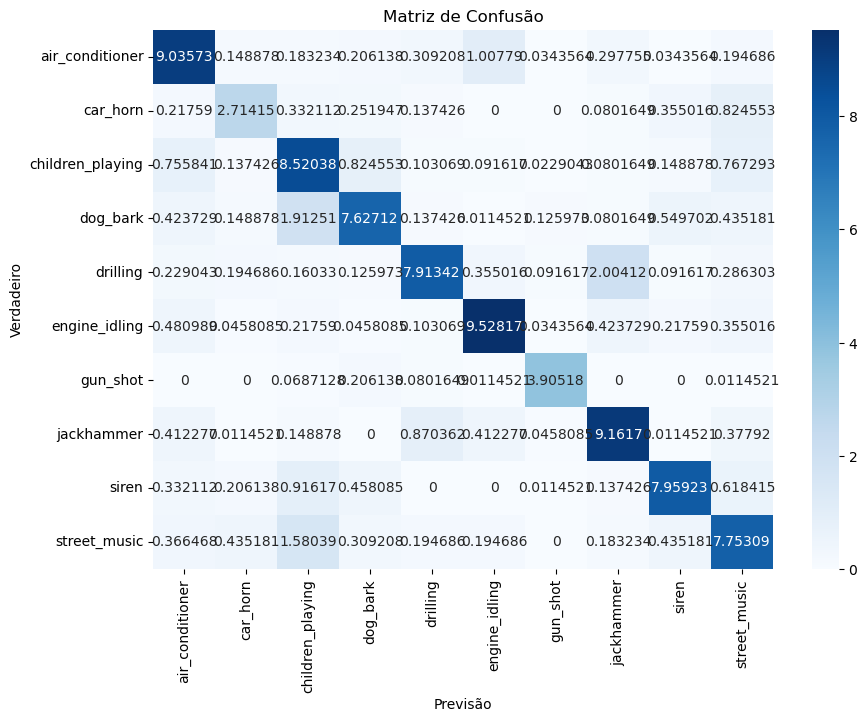

In [27]:
print(best_model.summary())
print("Learning rate: ", best_model_lr)
print("Number of epochs: ", best_model_n_epochs)
print("Batch Size: ", best_model_batch_size)
print("Accuracy: ", best_accuracy)
print("Loss: ", best_model_loss)
print("Standadr Deviation: ", best_model_std)

cm = pd.DataFrame(best_model_cf, index=label_encoder.classes_, columns=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Verdadeiro')
plt.show()

## Best Model MLP

In [30]:
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
# Definir o modelo
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(input_dim,)),
    tf.keras.layers.Dense(n_neur[0], kernel_initializer=initialize_weights),
    tf.keras.layers.LeakyReLU(negative_slope=0.01),
    tf.keras.layers.Dense(n_neur[1], kernel_initializer=initialize_weights),
    tf.keras.layers.LeakyReLU(negative_slope=0.01),
    tf.keras.layers.Dense(output_dim, activation='softmax', kernel_initializer=initialize_weights)
])


kf = KFold(n_splits=10, shuffle=True, random_state=42)
folds = list(kf.split(X))
all_accuracies = []
all_confusion_matrices = []
all_losses = []
# Cross-validation com cada fold usado uma vez para teste, uma vez para desenvolvimento e 8 vezes para treino
for fold_idx in range(len(folds)):
    # Selecionar fold para teste
    train_val_indices, test_indices = folds[fold_idx]

    # Selecionar fold para desenvolvimento
    dev_fold_idx = (fold_idx + 1) % len(folds)
    train_indices, dev_indices = folds[dev_fold_idx]

    # Treinamento e Desenvolvimento
    X_train, y_train = X[train_val_indices], y[train_val_indices]
    X_dev, y_dev = X[dev_indices], y[dev_indices]

    # Teste
    X_test, y_test = X[test_indices], y[test_indices]

    # Compilar o modelo
    model.compile(optimizer=adam_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

    model.summary()

    model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_dev, y_dev), callbacks=[lr_scheduler, early_stopping])

    # Avaliar o modelo
    loss, accuracy = model.evaluate(X_test, y_test)

    all_accuracies.append(accuracy) 
    y_pred = model.predict(X_test) 
    y_pred_classes = np.argmax(y_pred, axis=1) 
    cm = confusion_matrix(y_test, y_pred_classes) 
    all_confusion_matrices.append(cm)
    all_losses.append(loss)

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 691 (2.70 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2071 - loss: 2.0038 - val_accuracy: 0.4485 - val_loss: 1.3982 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.4497 - loss: 1.4139 - val_accuracy: 0.4908 - val_loss: 1.2402 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5074 - loss: 1.2725 - val_accuracy: 0.5423 - val_loss: 1.1815 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5294 - loss: 1.2118 - val_accuracy: 0.5755 - val_loss: 1.1065 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5595 - loss: 1.1691 - val_accuracy: 0.5446 - val_loss: 1.2010 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5979 - loss: 1.1077 - val_accuracy: 0.6304 - val_loss: 1.0207 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6137 - loss: 1.0444 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6539 - loss: 0.9713 - val_accuracy: 0.6724 - val_loss: 0.9418 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6619 - loss: 0.9720 - val_accuracy: 0.6793 - val_loss: 0.9159 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6717 - loss: 0.9543 - val_accuracy: 0.6598 - val_loss: 0.9419 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6649 - loss: 0.9452 - val_accuracy: 0.6930 - val_loss: 0.8957 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6777 - loss: 0.9091 - val_accuracy: 0.7068 - val_loss: 0.8925 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6846 - loss: 0.9030 - val_accuracy: 0.7033 - val_loss: 0.9022 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6786 - loss: 0.9050 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6965 - loss: 0.8773 - val_accuracy: 0.6655 - val_loss: 0.9110 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6954 - loss: 0.8735 - val_accuracy: 0.7102 - val_loss: 0.8544 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7038 - loss: 0.8621 - val_accuracy: 0.6357 - val_loss: 1.0078 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6989 - loss: 0.8548 - val_accuracy: 0.7125 - val_loss: 0.8261 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6995 - loss: 0.8536 - val_accuracy: 0.6884 - val_loss: 0.8822 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7133 - loss: 0.8252 - val_accuracy: 0.6930 - val_loss: 0.8631 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7013 - loss: 0.8445 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.7243 - loss: 0.8079 - val_accuracy: 0.7537 - val_loss: 0.7005 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7238 - loss: 0.7998 - val_accuracy: 0.7457 - val_loss: 0.7219 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7230 - loss: 0.7938 - val_accuracy: 0.7228 - val_loss: 0.7574 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7301 - loss: 0.7888 - val_accuracy: 0.7480 - val_loss: 0.7206 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7201 - loss: 0.7973 - val_accuracy: 0.7434 - val_loss: 0.7222 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7236 - loss: 0.7712 - val_accuracy: 0.7400 - val_loss: 0.7197 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7287 - loss: 0.7812 -

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7220 - loss: 0.7973 - val_accuracy: 0.7377 - val_loss: 0.7558 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7313 - loss: 0.7910 - val_accuracy: 0.7400 - val_loss: 0.7269 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7446 - loss: 0.7731 - val_accuracy: 0.7468 - val_loss: 0.7293 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7354 - loss: 0.7658 - val_accuracy: 0.7400 - val_loss: 0.7167 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7263 - loss: 0.7840 - val_accuracy: 0.7365 - val_loss: 0.7511 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7260 - loss: 0.7794 - val_accuracy: 0.7297 - val_loss: 0.7860 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7226 - loss: 0.7874 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7297 - loss: 0.7734 - val_accuracy: 0.7159 - val_loss: 0.7996 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7232 - loss: 0.7761 - val_accuracy: 0.7308 - val_loss: 0.7688 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7334 - loss: 0.7657 - val_accuracy: 0.7388 - val_loss: 0.7641 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7305 - loss: 0.7673 - val_accuracy: 0.7228 - val_loss: 0.8146 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7280 - loss: 0.7715 - val_accuracy: 0.7125 - val_loss: 0.7868 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7440 - loss: 0.7429 - val_accuracy: 0.6964 - val_loss: 0.8265 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7383 - loss: 0.7593 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7461 - loss: 0.7241 - val_accuracy: 0.7732 - val_loss: 0.6775 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7438 - loss: 0.7441 - val_accuracy: 0.7457 - val_loss: 0.7156 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7386 - loss: 0.7426 - val_accuracy: 0.7342 - val_loss: 0.7601 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7341 - loss: 0.7552 - val_accuracy: 0.7526 - val_loss: 0.7308 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7478 - loss: 0.7400 - val_accuracy: 0.7629 - val_loss: 0.6992 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7315 - loss: 0.7652 - val_accuracy: 0.7617 - val_loss: 0.6819 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7411 - loss: 0.7434 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7392 - loss: 0.7526 - val_accuracy: 0.7595 - val_loss: 0.7160 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - accuracy: 0.7475 - loss: 0.7333 - val_accuracy: 0.7068 - val_loss: 0.8021 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - accuracy: 0.7393 - loss: 0.7408 - val_accuracy: 0.7606 - val_loss: 0.7288 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7362 - loss: 0.7586 - val_accuracy: 0.7675 - val_loss: 0.7118 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7498 - loss: 0.7332 - val_accuracy: 0.7468 - val_loss: 0.7839 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.7495 - loss: 0.7405 - val_accuracy: 0.7457 - val_loss: 0.7319 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7376 - loss: 0.7

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7408 - loss: 0.7478 - val_accuracy: 0.7617 - val_loss: 0.6862 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7518 - loss: 0.7179 - val_accuracy: 0.7480 - val_loss: 0.7243 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7625 - loss: 0.6978 - val_accuracy: 0.7640 - val_loss: 0.6781 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7503 - loss: 0.7118 - val_accuracy: 0.7755 - val_loss: 0.6771 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7612 - loss: 0.6862 - val_accuracy: 0.7446 - val_loss: 0.7264 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7527 - loss: 0.7243 - val_accuracy: 0.7526 - val_loss: 0.7028 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7500 - loss: 0.7306 - 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

Epoch 1/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7490 - loss: 0.7294 - val_accuracy: 0.7700 - val_loss: 0.6487 - learning_rate: 0.0100
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7560 - loss: 0.7007 - val_accuracy: 0.7654 - val_loss: 0.6921 - learning_rate: 0.0100
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7425 - loss: 0.7328 - val_accuracy: 0.7815 - val_loss: 0.6514 - learning_rate: 0.0100
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7537 - loss: 0.7007 - val_accuracy: 0.7849 - val_loss: 0.6562 - learning_rate: 0.0100
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.7522 - loss: 0.7102 - val_accuracy: 0.7757 - val_loss: 0.6577 - learning_rate: 0.0100
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7539 - loss: 0.7241 - val_accuracy: 0.7494 - val_loss: 0.7125 - learning_rate: 0.0100
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7568 - loss: 0.7019 

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_167 (Dense)               │ (None, 16)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_125 (LeakyReLU)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 11)             │           187 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 10)             │           120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,075 (8.11 KB)

 Trainable params: 691 (2.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,384 (5.41 KB)

None
Learning rate:  0.01
Number of epochs:  50
Batch Size:  16
Accuracy:  0.7108447968959808
Loss:  0.8235847055912018
Standadr Deviation:  0.03440796052739076


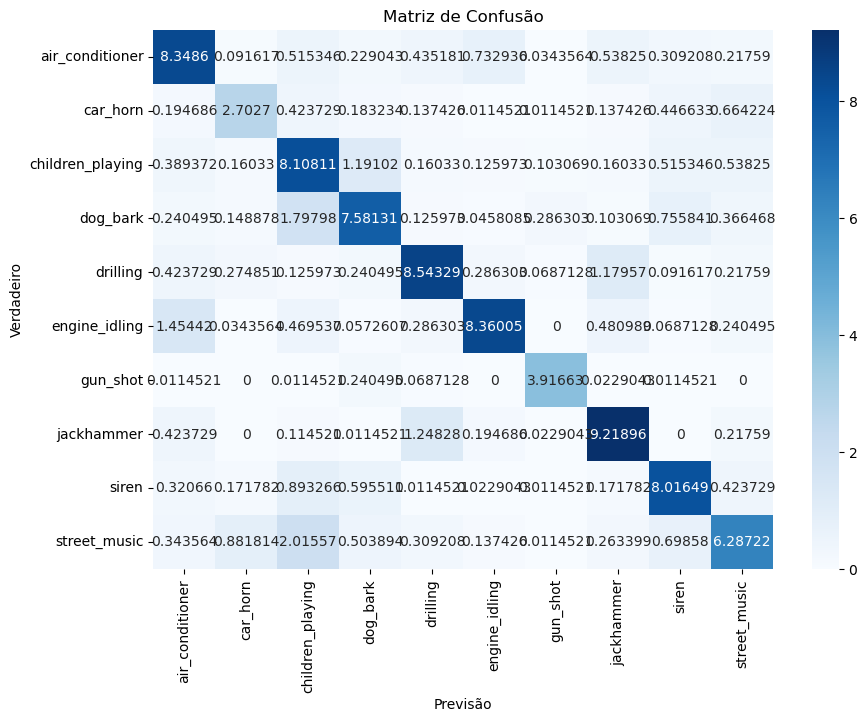

In [31]:
accumulated_cm = np.sum(all_confusion_matrices, axis=0) 
accumulated_cm_percentage = accumulated_cm / np.sum(accumulated_cm) * 100
mean_accuracy = np.mean(all_accuracies) 
std_accuracy = np.std(all_accuracies)
mean_loss = np.mean(all_losses)
print(model.summary())
print("Learning rate: ", 0.01)
print("Number of epochs: ", 50)
print("Batch Size: ", 16)
print("Accuracy: ", mean_accuracy)
print("Loss: ", mean_loss)
print("Standadr Deviation: ", std_accuracy)

cm = pd.DataFrame(accumulated_cm_percentage, index=label_encoder.classes_, columns=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.title('Matriz de Confusão')
plt.xlabel('Previsão')
plt.ylabel('Verdadeiro')
plt.show()

## Referências

https://medium.com/thedeephub/learning-rate-and-its-strategies-in-neural-network-training-270a91ea0e5c  
https://www.kaggle.com/code/androbomb/simple-nn-with-python-multi-layer-perceptron  
https://medium.com/ensina-ai/rede-neural-perceptron-multicamadas-f9de8471f1a9  
https://iaexpert.academy/2020/05/04/quantas-camadas-escondidas-e-quantos-neuronios-incluir-numa-rede-neural-artificial/
https://towardsdatascience.com/how-to-choose-the-right-activation-function-for-neural-networks-3941ff0e6f9c  
https://github.com/enochkan/building-from-scratch/blob/main/optimizers/adam-optimizer-from-scratch.ipynb  
https://www.geeksforgeeks.org/ml-mini-batch-gradient-descent-with-python/